In [1]:
import matplotlib.pyplot as plt
import os
from pathlib import Path
import random
from skimage.io import imread
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

In [2]:
bs = 64                # Batch size (paper uses 128).
img_size = 64          # Size of input (here it's 64 x 64).
workers = 2            # Number of workers for data loader.
noise_dim = 100        # Depth of input noise (1 x 1 x noise_dim). AKA nz.
ngf = 64               # UNSURE - RELATED TO # OF FILTERS IN GENERATOR.
ndf = 64               # UNSURE - RELATED TO # OF FILTERS IN DISCRIMINATOR.
lr = 2e-4              # Recommended learning rate of .0002.
beta1 = .5             # Recommended parameter for Adam.
nc = 3                 # Number of channels of input image.
ngpu = 1               # Number of GPUs to use.
sample_dir = 'samples' # Directory to store sample images from G. 
weight_dir = 'weights' # Directory to store model weights.
device = torch.device('cuda:0' if torch.cuda.is_available() and ngpu > 0 
                      else 'cpu')

In [3]:
tfms = transforms.Compose([transforms.Resize(img_size),
                           transforms.ToTensor(),  
                           transforms.Normalize((.5, .5, .5), (.5, .5, .5))
                          ])

ds = dset.CIFAR10(root='cifar',
                       download=True,
                       transform=tfms
                       )

dl = torch.utils.data.DataLoader(ds, batch_size=bs, shuffle=True,
                                 num_workers=workers)

Files already downloaded and verified


In [4]:
def weights_init(module):
    """Initialize weights from normal distribution with mean 0 and standard 
    deviation 0.02. For batch norm layers, a mean of 1.0 has had empirical
    success.
    
    Parameters
    -----------
    
    """
    class_name = module.__class__.__name__
    if 'Conv' in class_name:
        module.weight.data.normal_(0.0, 0.02)
    elif 'BatchNorm' in class_name:
        module.weight.data.normal_(1.0, 0.02)
        module.bias.data.fill_(0)

In [18]:
class Generator(nn.Module):
    def __init__(self, ngpu, noise_dim, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(noise_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, x):
        if x.is_cuda and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, 
                                               x, 
                                               range(self.ngpu))
        else:
            output = self.main(x)
        return output

In [19]:
class Discriminator(nn.Module):
    def __init__(self, ngpu, ndf, nc):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        if x.is_cuda and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, 
                                               x, 
                                               range(self.ngpu))
        else:
            output = self.main(x)
        return output.view(-1, 1).squeeze(1)

In [50]:
# criterion = nn.BCELoss()
# fixed_noise = torch.randn(bs, noise_dim, 1, 1, device=device)
# real_label = 1
# fake_label = 0

In [11]:
# d_optim = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
# g_optim = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

In [16]:
def train(D, G, epochs, dl, sample_dir, weight_dir, lr=2e-4, beta1=.5):
    """Train discriminator and generator with Adam.
    
    Parameters
    -----------
    D: nn.Module
        Discriminator
    G: nn.Module
        Generator (binary classifier, 1 for real, 0 for fake).
    dl: DataLoader
    sample_dir: str
        Directory to save generated images.
    weight_dir: str
        Directory to save final weights.
    lr: float
        Learning rate. Paper recommends .0002.
    beta1: float
        Hyperparameter for Adam. Paper recommends 0.5.
    """
    criterion = nn.BCELoss()
    d_optim = optim.Adam(D.parameters(), lr=lr, betas=(beta1, .999))
    g_optim = optim.Adam(G.parameters(), lr=lr, betas=(beta1, .999))
    
    # Fixed noise not used for training, but to generate images to save at 
    # diff epochs.
    fixed_noise = torch.randn(bs, noise_dim, 1, 1, device=device)
    real_label = 1
    fake_label = 0

    # Store stats to return at end.
    d_real_losses = []
    d_fake_losses = []
    g_losses = []
    d_real_avg = []
    d_fake_avg = []
    
    # Start training.
    for epoch in range(epochs):
        for i, (x, y) in enumerate(dl):
            ##################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ##################################################################
            x = x.to(device)
            bs_curr = x.size(0)
            label = torch.full((bs_curr,), real_label, device=device)

            # Train with real examples.
            D.zero_grad()
            output = D(x)
            d_loss_real = criterion(output, label)
            d_real_losses.append(d_loss_real)
            d_loss_real.backward()
            D_x = output.mean().item()

            # Train with fake examples from G.
            noise = torch.randn(bs_curr, noise_dim, 1, 1, device=device)
            fake = G(noise)
            label.fill_(fake_label)
            output = D(fake.detach())
            d_loss_fake = criterion(output, label)
            d_fake_losses.append(d_loss_fake)
            D_G_z1 = output.mean().item()
            d_loss = d_loss_real + d_loss_fake
            d_loss_fake.backward()
            d_optim.step()

            ##################################################################
            # (2) Update G network: maximize log(D(G(z)))
            ##################################################################
            G.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            output = D(fake)
            g_loss = criterion(output, label)
            g_losses.append(g_loss)
            D_G_z2 = output.mean().item()
            g_loss.backward()
            g_optim.step()

            print(f'Epoch [{epoch+1}/{epochs}] \t MB [{i+1}/{len(dl)}]\n'
                  f'Loss_D: {d_loss.item():.3f} Loss_G: {g_loss.item():.3f}\n'
                  f'D(x): {D_x:.3f} D(G(z)): {D_G_z1:.3f}, {D_G_z2:.3f}\n')
            if epoch % 5 == 0 and i == 0:
#                 vutils.save_image(x, f'{sample_dir}/real_samples.png',
#                                   normalize=True)
                fake = G(fixed_noise)
                vutils.save_image(fake.detach(),
                                  f'{sample_dir}/fake_epoch_{epoch}.png',
                                  normalize=True)
        
        # Save weights at end (can move inside loop to save at each epoch).
        states = dict(g=G.state_dict(), 
                      d=D.state_dict(),
                      g_optimizer=g_optim.state_dict(),
                      d_optimizer=d_optim.state_dict(),
                      epoch=epoch)
        torch.save(states, f'{weight_dir}/model_e{epoch}.pth')
    return dict(d_real_losses=d_real_losses,
                d_fake_losses=d_fake_losses,
                g_losses=g_losses,
                d_real_avg=d_real_avg,
                d_fake_avg=d_fake_avg
                )

In [20]:
G = Generator(ngpu, noise_dim, ngf, nc).to(device)
G.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [21]:
D = Discriminator(ngpu, ndf, nc).to(device)
D.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [22]:
n_epochs = 50
train(D, G, n_epochs, dl, sample_dir, weight_dir)

Epoch [1/50] 	 MB[1/782]
Loss_D: 1.774 Loss_G: 6.253
D(x): 0.546 D(G(z)): 0.566, 0.003

Epoch [1/50] 	 MB[2/782]
Loss_D: 0.983 Loss_G: 5.585
D(x): 0.666 D(G(z)): 0.318, 0.005

Epoch [1/50] 	 MB[3/782]
Loss_D: 1.018 Loss_G: 6.258
D(x): 0.743 D(G(z)): 0.418, 0.003

Epoch [1/50] 	 MB[4/782]
Loss_D: 0.824 Loss_G: 6.222
D(x): 0.707 D(G(z)): 0.275, 0.003

Epoch [1/50] 	 MB[5/782]
Loss_D: 0.679 Loss_G: 6.939
D(x): 0.778 D(G(z)): 0.277, 0.001

Epoch [1/50] 	 MB[6/782]
Loss_D: 0.733 Loss_G: 7.134
D(x): 0.745 D(G(z)): 0.250, 0.001

Epoch [1/50] 	 MB[7/782]
Loss_D: 0.523 Loss_G: 8.080
D(x): 0.844 D(G(z)): 0.253, 0.000

Epoch [1/50] 	 MB[8/782]
Loss_D: 0.604 Loss_G: 7.617
D(x): 0.761 D(G(z)): 0.202, 0.001

Epoch [1/50] 	 MB[9/782]
Loss_D: 0.675 Loss_G: 10.133
D(x): 0.904 D(G(z)): 0.355, 0.000

Epoch [1/50] 	 MB[10/782]
Loss_D: 0.318 Loss_G: 8.226
D(x): 0.839 D(G(z)): 0.079, 0.000

Epoch [1/50] 	 MB[11/782]
Loss_D: 0.913 Loss_G: 9.123
D(x): 0.736 D(G(z)): 0.255, 0.000

Epoch [1/50] 	 MB[12/782]
Los

Epoch [1/50] 	 MB[94/782]
Loss_D: 0.377 Loss_G: 5.814
D(x): 0.896 D(G(z)): 0.197, 0.005

Epoch [1/50] 	 MB[95/782]
Loss_D: 0.313 Loss_G: 5.990
D(x): 0.867 D(G(z)): 0.124, 0.004

Epoch [1/50] 	 MB[96/782]
Loss_D: 0.334 Loss_G: 6.110
D(x): 0.881 D(G(z)): 0.138, 0.004

Epoch [1/50] 	 MB[97/782]
Loss_D: 0.277 Loss_G: 4.751
D(x): 0.850 D(G(z)): 0.046, 0.015

Epoch [1/50] 	 MB[98/782]
Loss_D: 0.549 Loss_G: 9.004
D(x): 0.964 D(G(z)): 0.373, 0.000

Epoch [1/50] 	 MB[99/782]
Loss_D: 1.823 Loss_G: 2.625
D(x): 0.332 D(G(z)): 0.005, 0.118

Epoch [1/50] 	 MB[100/782]
Loss_D: 0.775 Loss_G: 6.951
D(x): 0.937 D(G(z)): 0.465, 0.002

Epoch [1/50] 	 MB[101/782]
Loss_D: 0.579 Loss_G: 4.653
D(x): 0.680 D(G(z)): 0.023, 0.022

Epoch [1/50] 	 MB[102/782]
Loss_D: 0.250 Loss_G: 4.431
D(x): 0.929 D(G(z)): 0.107, 0.020

Epoch [1/50] 	 MB[103/782]
Loss_D: 0.303 Loss_G: 5.482
D(x): 0.939 D(G(z)): 0.197, 0.011

Epoch [1/50] 	 MB[104/782]
Loss_D: 0.551 Loss_G: 4.480
D(x): 0.778 D(G(z)): 0.109, 0.017

Epoch [1/50] 	 M

Epoch [1/50] 	 MB[187/782]
Loss_D: 1.978 Loss_G: 7.012
D(x): 0.301 D(G(z)): 0.000, 0.006

Epoch [1/50] 	 MB[188/782]
Loss_D: 0.217 Loss_G: 3.463
D(x): 0.868 D(G(z)): 0.035, 0.078

Epoch [1/50] 	 MB[189/782]
Loss_D: 0.558 Loss_G: 6.358
D(x): 0.983 D(G(z)): 0.356, 0.003

Epoch [1/50] 	 MB[190/782]
Loss_D: 0.077 Loss_G: 6.294
D(x): 0.960 D(G(z)): 0.030, 0.004

Epoch [1/50] 	 MB[191/782]
Loss_D: 0.208 Loss_G: 4.910
D(x): 0.874 D(G(z)): 0.051, 0.016

Epoch [1/50] 	 MB[192/782]
Loss_D: 0.310 Loss_G: 4.340
D(x): 0.864 D(G(z)): 0.121, 0.020

Epoch [1/50] 	 MB[193/782]
Loss_D: 0.201 Loss_G: 5.560
D(x): 0.966 D(G(z)): 0.144, 0.006

Epoch [1/50] 	 MB[194/782]
Loss_D: 0.146 Loss_G: 5.039
D(x): 0.929 D(G(z)): 0.060, 0.009

Epoch [1/50] 	 MB[195/782]
Loss_D: 0.259 Loss_G: 4.603
D(x): 0.902 D(G(z)): 0.097, 0.015

Epoch [1/50] 	 MB[196/782]
Loss_D: 0.249 Loss_G: 5.216
D(x): 0.924 D(G(z)): 0.142, 0.007

Epoch [1/50] 	 MB[197/782]
Loss_D: 0.174 Loss_G: 4.852
D(x): 0.912 D(G(z)): 0.060, 0.010

Epoch [1/5

Epoch [1/50] 	 MB[279/782]
Loss_D: 0.145 Loss_G: 4.127
D(x): 0.933 D(G(z)): 0.027, 0.020

Epoch [1/50] 	 MB[280/782]
Loss_D: 0.174 Loss_G: 4.732
D(x): 0.956 D(G(z)): 0.112, 0.011

Epoch [1/50] 	 MB[281/782]
Loss_D: 0.140 Loss_G: 5.258
D(x): 0.947 D(G(z)): 0.075, 0.006

Epoch [1/50] 	 MB[282/782]
Loss_D: 0.083 Loss_G: 5.271
D(x): 0.949 D(G(z)): 0.027, 0.007

Epoch [1/50] 	 MB[283/782]
Loss_D: 0.129 Loss_G: 4.040
D(x): 0.925 D(G(z)): 0.034, 0.023

Epoch [1/50] 	 MB[284/782]
Loss_D: 0.232 Loss_G: 5.501
D(x): 0.952 D(G(z)): 0.157, 0.005

Epoch [1/50] 	 MB[285/782]
Loss_D: 0.178 Loss_G: 5.226
D(x): 0.896 D(G(z)): 0.023, 0.007

Epoch [1/50] 	 MB[286/782]
Loss_D: 0.285 Loss_G: 3.087
D(x): 0.841 D(G(z)): 0.045, 0.061

Epoch [1/50] 	 MB[287/782]
Loss_D: 0.467 Loss_G: 7.479
D(x): 0.944 D(G(z)): 0.300, 0.001

Epoch [1/50] 	 MB[288/782]
Loss_D: 0.168 Loss_G: 7.121
D(x): 0.891 D(G(z)): 0.007, 0.001

Epoch [1/50] 	 MB[289/782]
Loss_D: 0.248 Loss_G: 4.155
D(x): 0.857 D(G(z)): 0.017, 0.025

Epoch [1/5

Epoch [1/50] 	 MB[370/782]
Loss_D: 0.227 Loss_G: 12.703
D(x): 0.843 D(G(z)): 0.000, 0.000

Epoch [1/50] 	 MB[371/782]
Loss_D: 0.044 Loss_G: 10.353
D(x): 0.960 D(G(z)): 0.000, 0.000

Epoch [1/50] 	 MB[372/782]
Loss_D: 0.059 Loss_G: 7.040
D(x): 0.961 D(G(z)): 0.005, 0.004

Epoch [1/50] 	 MB[373/782]
Loss_D: 0.276 Loss_G: 8.500
D(x): 0.970 D(G(z)): 0.175, 0.000

Epoch [1/50] 	 MB[374/782]
Loss_D: 0.123 Loss_G: 7.014
D(x): 0.925 D(G(z)): 0.020, 0.001

Epoch [1/50] 	 MB[375/782]
Loss_D: 0.187 Loss_G: 8.107
D(x): 0.961 D(G(z)): 0.125, 0.000

Epoch [1/50] 	 MB[376/782]
Loss_D: 0.342 Loss_G: 5.891
D(x): 0.843 D(G(z)): 0.046, 0.004

Epoch [1/50] 	 MB[377/782]
Loss_D: 0.576 Loss_G: 16.287
D(x): 0.950 D(G(z)): 0.376, 0.000

Epoch [1/50] 	 MB[378/782]
Loss_D: 1.729 Loss_G: 8.711
D(x): 0.410 D(G(z)): 0.000, 0.001

Epoch [1/50] 	 MB[379/782]
Loss_D: 0.245 Loss_G: 4.773
D(x): 0.914 D(G(z)): 0.083, 0.023

Epoch [1/50] 	 MB[380/782]
Loss_D: 1.459 Loss_G: 16.234
D(x): 0.971 D(G(z)): 0.640, 0.000

Epoch 

Epoch [1/50] 	 MB[461/782]
Loss_D: 0.938 Loss_G: 14.364
D(x): 0.984 D(G(z)): 0.531, 0.000

Epoch [1/50] 	 MB[462/782]
Loss_D: 0.744 Loss_G: 13.826
D(x): 0.684 D(G(z)): 0.000, 0.000

Epoch [1/50] 	 MB[463/782]
Loss_D: 0.418 Loss_G: 9.201
D(x): 0.758 D(G(z)): 0.000, 0.001

Epoch [1/50] 	 MB[464/782]
Loss_D: 0.101 Loss_G: 4.670
D(x): 0.965 D(G(z)): 0.055, 0.031

Epoch [1/50] 	 MB[465/782]
Loss_D: 0.359 Loss_G: 8.331
D(x): 0.983 D(G(z)): 0.247, 0.001

Epoch [1/50] 	 MB[466/782]
Loss_D: 0.064 Loss_G: 8.129
D(x): 0.975 D(G(z)): 0.034, 0.001

Epoch [1/50] 	 MB[467/782]
Loss_D: 0.222 Loss_G: 6.289
D(x): 0.875 D(G(z)): 0.024, 0.011

Epoch [1/50] 	 MB[468/782]
Loss_D: 0.335 Loss_G: 4.756
D(x): 0.884 D(G(z)): 0.119, 0.020

Epoch [1/50] 	 MB[469/782]
Loss_D: 0.344 Loss_G: 6.795
D(x): 0.964 D(G(z)): 0.229, 0.003

Epoch [1/50] 	 MB[470/782]
Loss_D: 0.477 Loss_G: 5.754
D(x): 0.792 D(G(z)): 0.063, 0.012

Epoch [1/50] 	 MB[471/782]
Loss_D: 0.328 Loss_G: 6.221
D(x): 0.910 D(G(z)): 0.143, 0.004

Epoch [1

Epoch [1/50] 	 MB[553/782]
Loss_D: 0.339 Loss_G: 3.658
D(x): 0.758 D(G(z)): 0.034, 0.038

Epoch [1/50] 	 MB[554/782]
Loss_D: 0.246 Loss_G: 2.734
D(x): 0.888 D(G(z)): 0.104, 0.081

Epoch [1/50] 	 MB[555/782]
Loss_D: 0.537 Loss_G: 4.358
D(x): 0.904 D(G(z)): 0.320, 0.017

Epoch [1/50] 	 MB[556/782]
Loss_D: 0.519 Loss_G: 2.890
D(x): 0.692 D(G(z)): 0.055, 0.068

Epoch [1/50] 	 MB[557/782]
Loss_D: 0.318 Loss_G: 2.844
D(x): 0.880 D(G(z)): 0.158, 0.067

Epoch [1/50] 	 MB[558/782]
Loss_D: 0.469 Loss_G: 3.452
D(x): 0.818 D(G(z)): 0.214, 0.037

Epoch [1/50] 	 MB[559/782]
Loss_D: 0.221 Loss_G: 4.162
D(x): 0.915 D(G(z)): 0.118, 0.019

Epoch [1/50] 	 MB[560/782]
Loss_D: 0.148 Loss_G: 4.328
D(x): 0.891 D(G(z)): 0.026, 0.017

Epoch [1/50] 	 MB[561/782]
Loss_D: 0.344 Loss_G: 2.413
D(x): 0.789 D(G(z)): 0.077, 0.115

Epoch [1/50] 	 MB[562/782]
Loss_D: 0.310 Loss_G: 4.980
D(x): 0.971 D(G(z)): 0.235, 0.009

Epoch [1/50] 	 MB[563/782]
Loss_D: 0.132 Loss_G: 4.964
D(x): 0.922 D(G(z)): 0.039, 0.009

Epoch [1/5

Epoch [1/50] 	 MB[645/782]
Loss_D: 0.263 Loss_G: 4.228
D(x): 0.849 D(G(z)): 0.076, 0.018

Epoch [1/50] 	 MB[646/782]
Loss_D: 0.274 Loss_G: 5.085
D(x): 0.906 D(G(z)): 0.150, 0.008

Epoch [1/50] 	 MB[647/782]
Loss_D: 0.199 Loss_G: 4.977
D(x): 0.896 D(G(z)): 0.077, 0.009

Epoch [1/50] 	 MB[648/782]
Loss_D: 0.275 Loss_G: 4.189
D(x): 0.860 D(G(z)): 0.093, 0.020

Epoch [1/50] 	 MB[649/782]
Loss_D: 0.364 Loss_G: 7.013
D(x): 0.933 D(G(z)): 0.239, 0.001

Epoch [1/50] 	 MB[650/782]
Loss_D: 0.380 Loss_G: 4.491
D(x): 0.764 D(G(z)): 0.014, 0.018

Epoch [1/50] 	 MB[651/782]
Loss_D: 0.323 Loss_G: 5.902
D(x): 0.925 D(G(z)): 0.190, 0.005

Epoch [1/50] 	 MB[652/782]
Loss_D: 0.184 Loss_G: 4.620
D(x): 0.892 D(G(z)): 0.055, 0.018

Epoch [1/50] 	 MB[653/782]
Loss_D: 0.122 Loss_G: 4.039
D(x): 0.944 D(G(z)): 0.057, 0.027

Epoch [1/50] 	 MB[654/782]
Loss_D: 0.303 Loss_G: 6.013
D(x): 0.962 D(G(z)): 0.198, 0.004

Epoch [1/50] 	 MB[655/782]
Loss_D: 0.175 Loss_G: 5.488
D(x): 0.885 D(G(z)): 0.033, 0.009

Epoch [1/5

Epoch [1/50] 	 MB[737/782]
Loss_D: 0.507 Loss_G: 4.998
D(x): 0.852 D(G(z)): 0.205, 0.012

Epoch [1/50] 	 MB[738/782]
Loss_D: 0.402 Loss_G: 3.723
D(x): 0.792 D(G(z)): 0.111, 0.037

Epoch [1/50] 	 MB[739/782]
Loss_D: 0.473 Loss_G: 3.539
D(x): 0.830 D(G(z)): 0.203, 0.039

Epoch [1/50] 	 MB[740/782]
Loss_D: 1.338 Loss_G: 8.025
D(x): 0.817 D(G(z)): 0.592, 0.001

Epoch [1/50] 	 MB[741/782]
Loss_D: 1.811 Loss_G: 2.871
D(x): 0.249 D(G(z)): 0.008, 0.088

Epoch [1/50] 	 MB[742/782]
Loss_D: 1.263 Loss_G: 6.977
D(x): 0.902 D(G(z)): 0.594, 0.002

Epoch [1/50] 	 MB[743/782]
Loss_D: 0.804 Loss_G: 4.864
D(x): 0.542 D(G(z)): 0.018, 0.016

Epoch [1/50] 	 MB[744/782]
Loss_D: 0.289 Loss_G: 3.427
D(x): 0.890 D(G(z)): 0.126, 0.053

Epoch [1/50] 	 MB[745/782]
Loss_D: 0.433 Loss_G: 4.429
D(x): 0.924 D(G(z)): 0.257, 0.020

Epoch [1/50] 	 MB[746/782]
Loss_D: 0.343 Loss_G: 5.525
D(x): 0.939 D(G(z)): 0.217, 0.006

Epoch [1/50] 	 MB[747/782]
Loss_D: 0.456 Loss_G: 3.965
D(x): 0.775 D(G(z)): 0.068, 0.031

Epoch [1/5

Epoch [2/50] 	 MB[47/782]
Loss_D: 0.292 Loss_G: 5.985
D(x): 0.906 D(G(z)): 0.153, 0.003

Epoch [2/50] 	 MB[48/782]
Loss_D: 0.260 Loss_G: 4.603
D(x): 0.855 D(G(z)): 0.059, 0.014

Epoch [2/50] 	 MB[49/782]
Loss_D: 0.536 Loss_G: 6.091
D(x): 0.874 D(G(z)): 0.242, 0.004

Epoch [2/50] 	 MB[50/782]
Loss_D: 0.318 Loss_G: 5.737
D(x): 0.857 D(G(z)): 0.121, 0.005

Epoch [2/50] 	 MB[51/782]
Loss_D: 0.356 Loss_G: 4.552
D(x): 0.830 D(G(z)): 0.127, 0.015

Epoch [2/50] 	 MB[52/782]
Loss_D: 0.490 Loss_G: 5.895
D(x): 0.846 D(G(z)): 0.243, 0.004

Epoch [2/50] 	 MB[53/782]
Loss_D: 0.450 Loss_G: 4.410
D(x): 0.768 D(G(z)): 0.106, 0.020

Epoch [2/50] 	 MB[54/782]
Loss_D: 0.529 Loss_G: 7.741
D(x): 0.881 D(G(z)): 0.287, 0.002

Epoch [2/50] 	 MB[55/782]
Loss_D: 1.243 Loss_G: 0.771
D(x): 0.478 D(G(z)): 0.021, 0.526

Epoch [2/50] 	 MB[56/782]
Loss_D: 1.941 Loss_G: 12.669
D(x): 0.983 D(G(z)): 0.804, 0.000

Epoch [2/50] 	 MB[57/782]
Loss_D: 3.249 Loss_G: 6.425
D(x): 0.175 D(G(z)): 0.004, 0.054

Epoch [2/50] 	 MB[58

Epoch [2/50] 	 MB[139/782]
Loss_D: 0.537 Loss_G: 5.313
D(x): 0.666 D(G(z)): 0.025, 0.017

Epoch [2/50] 	 MB[140/782]
Loss_D: 0.413 Loss_G: 2.578
D(x): 0.779 D(G(z)): 0.107, 0.103

Epoch [2/50] 	 MB[141/782]
Loss_D: 0.738 Loss_G: 5.840
D(x): 0.915 D(G(z)): 0.396, 0.006

Epoch [2/50] 	 MB[142/782]
Loss_D: 0.595 Loss_G: 3.107
D(x): 0.658 D(G(z)): 0.058, 0.073

Epoch [2/50] 	 MB[143/782]
Loss_D: 0.546 Loss_G: 4.296
D(x): 0.873 D(G(z)): 0.295, 0.018

Epoch [2/50] 	 MB[144/782]
Loss_D: 0.295 Loss_G: 4.280
D(x): 0.831 D(G(z)): 0.076, 0.024

Epoch [2/50] 	 MB[145/782]
Loss_D: 0.307 Loss_G: 3.870
D(x): 0.877 D(G(z)): 0.141, 0.032

Epoch [2/50] 	 MB[146/782]
Loss_D: 0.586 Loss_G: 2.877
D(x): 0.740 D(G(z)): 0.144, 0.090

Epoch [2/50] 	 MB[147/782]
Loss_D: 0.632 Loss_G: 6.765
D(x): 0.935 D(G(z)): 0.391, 0.002

Epoch [2/50] 	 MB[148/782]
Loss_D: 0.929 Loss_G: 3.246
D(x): 0.505 D(G(z)): 0.011, 0.076

Epoch [2/50] 	 MB[149/782]
Loss_D: 0.458 Loss_G: 4.394
D(x): 0.904 D(G(z)): 0.253, 0.019

Epoch [2/5

Epoch [2/50] 	 MB[231/782]
Loss_D: 0.589 Loss_G: 3.556
D(x): 0.743 D(G(z)): 0.170, 0.063

Epoch [2/50] 	 MB[232/782]
Loss_D: 0.584 Loss_G: 4.123
D(x): 0.800 D(G(z)): 0.211, 0.024

Epoch [2/50] 	 MB[233/782]
Loss_D: 0.266 Loss_G: 4.781
D(x): 0.899 D(G(z)): 0.125, 0.018

Epoch [2/50] 	 MB[234/782]
Loss_D: 0.507 Loss_G: 3.056
D(x): 0.742 D(G(z)): 0.080, 0.082

Epoch [2/50] 	 MB[235/782]
Loss_D: 0.387 Loss_G: 4.416
D(x): 0.921 D(G(z)): 0.234, 0.018

Epoch [2/50] 	 MB[236/782]
Loss_D: 0.372 Loss_G: 3.942
D(x): 0.836 D(G(z)): 0.109, 0.031

Epoch [2/50] 	 MB[237/782]
Loss_D: 0.510 Loss_G: 3.364
D(x): 0.795 D(G(z)): 0.176, 0.057

Epoch [2/50] 	 MB[238/782]
Loss_D: 0.640 Loss_G: 4.993
D(x): 0.872 D(G(z)): 0.328, 0.013

Epoch [2/50] 	 MB[239/782]
Loss_D: 0.821 Loss_G: 2.134
D(x): 0.561 D(G(z)): 0.065, 0.164

Epoch [2/50] 	 MB[240/782]
Loss_D: 0.693 Loss_G: 5.173
D(x): 0.883 D(G(z)): 0.372, 0.011

Epoch [2/50] 	 MB[241/782]
Loss_D: 0.414 Loss_G: 3.840
D(x): 0.759 D(G(z)): 0.074, 0.036

Epoch [2/5

Epoch [2/50] 	 MB[323/782]
Loss_D: 1.135 Loss_G: 2.302
D(x): 0.553 D(G(z)): 0.244, 0.154

Epoch [2/50] 	 MB[324/782]
Loss_D: 0.730 Loss_G: 7.310
D(x): 0.932 D(G(z)): 0.430, 0.001

Epoch [2/50] 	 MB[325/782]
Loss_D: 1.089 Loss_G: 2.732
D(x): 0.435 D(G(z)): 0.009, 0.109

Epoch [2/50] 	 MB[326/782]
Loss_D: 0.578 Loss_G: 4.795
D(x): 0.984 D(G(z)): 0.377, 0.014

Epoch [2/50] 	 MB[327/782]
Loss_D: 0.405 Loss_G: 4.087
D(x): 0.787 D(G(z)): 0.114, 0.028

Epoch [2/50] 	 MB[328/782]
Loss_D: 0.329 Loss_G: 3.400
D(x): 0.846 D(G(z)): 0.104, 0.045

Epoch [2/50] 	 MB[329/782]
Loss_D: 0.369 Loss_G: 4.007
D(x): 0.907 D(G(z)): 0.211, 0.026

Epoch [2/50] 	 MB[330/782]
Loss_D: 0.530 Loss_G: 2.956
D(x): 0.743 D(G(z)): 0.136, 0.084

Epoch [2/50] 	 MB[331/782]
Loss_D: 0.457 Loss_G: 3.817
D(x): 0.889 D(G(z)): 0.248, 0.037

Epoch [2/50] 	 MB[332/782]
Loss_D: 0.576 Loss_G: 2.812
D(x): 0.725 D(G(z)): 0.133, 0.084

Epoch [2/50] 	 MB[333/782]
Loss_D: 0.641 Loss_G: 3.204
D(x): 0.795 D(G(z)): 0.272, 0.057

Epoch [2/5

Epoch [2/50] 	 MB[415/782]
Loss_D: 0.503 Loss_G: 2.755
D(x): 0.727 D(G(z)): 0.096, 0.086

Epoch [2/50] 	 MB[416/782]
Loss_D: 0.549 Loss_G: 5.239
D(x): 0.953 D(G(z)): 0.353, 0.008

Epoch [2/50] 	 MB[417/782]
Loss_D: 0.494 Loss_G: 3.895
D(x): 0.694 D(G(z)): 0.042, 0.032

Epoch [2/50] 	 MB[418/782]
Loss_D: 0.155 Loss_G: 3.704
D(x): 0.955 D(G(z)): 0.099, 0.036

Epoch [2/50] 	 MB[419/782]
Loss_D: 0.190 Loss_G: 4.240
D(x): 0.954 D(G(z)): 0.121, 0.021

Epoch [2/50] 	 MB[420/782]
Loss_D: 0.214 Loss_G: 4.234
D(x): 0.916 D(G(z)): 0.112, 0.019

Epoch [2/50] 	 MB[421/782]
Loss_D: 0.284 Loss_G: 3.664
D(x): 0.845 D(G(z)): 0.091, 0.039

Epoch [2/50] 	 MB[422/782]
Loss_D: 0.554 Loss_G: 2.913
D(x): 0.750 D(G(z)): 0.176, 0.085

Epoch [2/50] 	 MB[423/782]
Loss_D: 0.724 Loss_G: 5.293
D(x): 0.867 D(G(z)): 0.373, 0.008

Epoch [2/50] 	 MB[424/782]
Loss_D: 0.635 Loss_G: 2.727
D(x): 0.602 D(G(z)): 0.036, 0.092

Epoch [2/50] 	 MB[425/782]
Loss_D: 0.863 Loss_G: 3.652
D(x): 0.855 D(G(z)): 0.424, 0.040

Epoch [2/5

Epoch [2/50] 	 MB[507/782]
Loss_D: 0.622 Loss_G: 3.703
D(x): 0.635 D(G(z)): 0.038, 0.048

Epoch [2/50] 	 MB[508/782]
Loss_D: 0.426 Loss_G: 2.171
D(x): 0.797 D(G(z)): 0.125, 0.159

Epoch [2/50] 	 MB[509/782]
Loss_D: 0.509 Loss_G: 4.625
D(x): 0.934 D(G(z)): 0.318, 0.014

Epoch [2/50] 	 MB[510/782]
Loss_D: 0.509 Loss_G: 3.025
D(x): 0.691 D(G(z)): 0.054, 0.076

Epoch [2/50] 	 MB[511/782]
Loss_D: 0.341 Loss_G: 3.480
D(x): 0.933 D(G(z)): 0.202, 0.052

Epoch [2/50] 	 MB[512/782]
Loss_D: 0.331 Loss_G: 3.429
D(x): 0.859 D(G(z)): 0.110, 0.057

Epoch [2/50] 	 MB[513/782]
Loss_D: 0.321 Loss_G: 2.835
D(x): 0.848 D(G(z)): 0.116, 0.084

Epoch [2/50] 	 MB[514/782]
Loss_D: 0.627 Loss_G: 2.901
D(x): 0.792 D(G(z)): 0.259, 0.082

Epoch [2/50] 	 MB[515/782]
Loss_D: 0.510 Loss_G: 3.224
D(x): 0.810 D(G(z)): 0.195, 0.060

Epoch [2/50] 	 MB[516/782]
Loss_D: 0.652 Loss_G: 3.169
D(x): 0.759 D(G(z)): 0.237, 0.065

Epoch [2/50] 	 MB[517/782]
Loss_D: 0.706 Loss_G: 3.342
D(x): 0.752 D(G(z)): 0.263, 0.050

Epoch [2/5

Epoch [2/50] 	 MB[599/782]
Loss_D: 0.863 Loss_G: 5.670
D(x): 0.934 D(G(z)): 0.476, 0.007

Epoch [2/50] 	 MB[600/782]
Loss_D: 0.658 Loss_G: 3.540
D(x): 0.609 D(G(z)): 0.030, 0.057

Epoch [2/50] 	 MB[601/782]
Loss_D: 0.435 Loss_G: 2.065
D(x): 0.812 D(G(z)): 0.151, 0.168

Epoch [2/50] 	 MB[602/782]
Loss_D: 0.546 Loss_G: 3.938
D(x): 0.905 D(G(z)): 0.295, 0.032

Epoch [2/50] 	 MB[603/782]
Loss_D: 0.265 Loss_G: 4.273
D(x): 0.874 D(G(z)): 0.104, 0.024

Epoch [2/50] 	 MB[604/782]
Loss_D: 0.393 Loss_G: 3.295
D(x): 0.818 D(G(z)): 0.138, 0.056

Epoch [2/50] 	 MB[605/782]
Loss_D: 0.498 Loss_G: 3.031
D(x): 0.805 D(G(z)): 0.200, 0.069

Epoch [2/50] 	 MB[606/782]
Loss_D: 0.492 Loss_G: 3.751
D(x): 0.845 D(G(z)): 0.237, 0.034

Epoch [2/50] 	 MB[607/782]
Loss_D: 0.320 Loss_G: 4.570
D(x): 0.881 D(G(z)): 0.155, 0.016

Epoch [2/50] 	 MB[608/782]
Loss_D: 0.481 Loss_G: 2.635
D(x): 0.712 D(G(z)): 0.081, 0.098

Epoch [2/50] 	 MB[609/782]
Loss_D: 0.596 Loss_G: 4.783
D(x): 0.885 D(G(z)): 0.338, 0.012

Epoch [2/5

Epoch [2/50] 	 MB[691/782]
Loss_D: 0.701 Loss_G: 3.167
D(x): 0.769 D(G(z)): 0.269, 0.071

Epoch [2/50] 	 MB[692/782]
Loss_D: 0.618 Loss_G: 5.179
D(x): 0.833 D(G(z)): 0.311, 0.010

Epoch [2/50] 	 MB[693/782]
Loss_D: 0.417 Loss_G: 3.620
D(x): 0.757 D(G(z)): 0.078, 0.045

Epoch [2/50] 	 MB[694/782]
Loss_D: 0.362 Loss_G: 3.428
D(x): 0.859 D(G(z)): 0.143, 0.063

Epoch [2/50] 	 MB[695/782]
Loss_D: 0.373 Loss_G: 4.798
D(x): 0.925 D(G(z)): 0.219, 0.014

Epoch [2/50] 	 MB[696/782]
Loss_D: 0.437 Loss_G: 3.527
D(x): 0.786 D(G(z)): 0.109, 0.050

Epoch [2/50] 	 MB[697/782]
Loss_D: 0.721 Loss_G: 2.717
D(x): 0.696 D(G(z)): 0.215, 0.116

Epoch [2/50] 	 MB[698/782]
Loss_D: 0.455 Loss_G: 4.254
D(x): 0.869 D(G(z)): 0.227, 0.025

Epoch [2/50] 	 MB[699/782]
Loss_D: 0.313 Loss_G: 4.084
D(x): 0.869 D(G(z)): 0.138, 0.027

Epoch [2/50] 	 MB[700/782]
Loss_D: 0.454 Loss_G: 2.705
D(x): 0.768 D(G(z)): 0.108, 0.096

Epoch [2/50] 	 MB[701/782]
Loss_D: 0.471 Loss_G: 4.377
D(x): 0.890 D(G(z)): 0.259, 0.020

Epoch [2/5

Epoch [3/50] 	 MB[1/782]
Loss_D: 1.054 Loss_G: 2.270
D(x): 0.547 D(G(z)): 0.106, 0.185

Epoch [3/50] 	 MB[2/782]
Loss_D: 1.270 Loss_G: 6.592
D(x): 0.871 D(G(z)): 0.554, 0.005

Epoch [3/50] 	 MB[3/782]
Loss_D: 1.543 Loss_G: 1.783
D(x): 0.375 D(G(z)): 0.031, 0.240

Epoch [3/50] 	 MB[4/782]
Loss_D: 1.324 Loss_G: 5.978
D(x): 0.959 D(G(z)): 0.616, 0.006

Epoch [3/50] 	 MB[5/782]
Loss_D: 1.204 Loss_G: 2.577
D(x): 0.453 D(G(z)): 0.082, 0.136

Epoch [3/50] 	 MB[6/782]
Loss_D: 0.988 Loss_G: 4.032
D(x): 0.793 D(G(z)): 0.405, 0.031

Epoch [3/50] 	 MB[7/782]
Loss_D: 0.671 Loss_G: 4.966
D(x): 0.780 D(G(z)): 0.265, 0.015

Epoch [3/50] 	 MB[8/782]
Loss_D: 0.641 Loss_G: 2.477
D(x): 0.640 D(G(z)): 0.056, 0.126

Epoch [3/50] 	 MB[9/782]
Loss_D: 1.105 Loss_G: 6.546
D(x): 0.934 D(G(z)): 0.512, 0.004

Epoch [3/50] 	 MB[10/782]
Loss_D: 1.046 Loss_G: 3.799
D(x): 0.521 D(G(z)): 0.012, 0.037

Epoch [3/50] 	 MB[11/782]
Loss_D: 0.381 Loss_G: 2.221
D(x): 0.835 D(G(z)): 0.143, 0.155

Epoch [3/50] 	 MB[12/782]
Loss

Epoch [3/50] 	 MB[95/782]
Loss_D: 0.473 Loss_G: 4.683
D(x): 0.917 D(G(z)): 0.277, 0.017

Epoch [3/50] 	 MB[96/782]
Loss_D: 0.596 Loss_G: 2.953
D(x): 0.651 D(G(z)): 0.068, 0.098

Epoch [3/50] 	 MB[97/782]
Loss_D: 0.750 Loss_G: 2.977
D(x): 0.781 D(G(z)): 0.325, 0.076

Epoch [3/50] 	 MB[98/782]
Loss_D: 0.444 Loss_G: 3.351
D(x): 0.815 D(G(z)): 0.164, 0.049

Epoch [3/50] 	 MB[99/782]
Loss_D: 0.684 Loss_G: 2.960
D(x): 0.742 D(G(z)): 0.239, 0.080

Epoch [3/50] 	 MB[100/782]
Loss_D: 0.572 Loss_G: 3.937
D(x): 0.833 D(G(z)): 0.256, 0.029

Epoch [3/50] 	 MB[101/782]
Loss_D: 0.614 Loss_G: 2.958
D(x): 0.736 D(G(z)): 0.167, 0.082

Epoch [3/50] 	 MB[102/782]
Loss_D: 0.823 Loss_G: 4.330
D(x): 0.810 D(G(z)): 0.394, 0.020

Epoch [3/50] 	 MB[103/782]
Loss_D: 0.937 Loss_G: 2.023
D(x): 0.534 D(G(z)): 0.115, 0.210

Epoch [3/50] 	 MB[104/782]
Loss_D: 0.785 Loss_G: 4.569
D(x): 0.902 D(G(z)): 0.405, 0.017

Epoch [3/50] 	 MB[105/782]
Loss_D: 0.226 Loss_G: 4.629
D(x): 0.883 D(G(z)): 0.086, 0.016

Epoch [3/50] 	 

Epoch [3/50] 	 MB[187/782]
Loss_D: 0.375 Loss_G: 2.905
D(x): 0.912 D(G(z)): 0.211, 0.078

Epoch [3/50] 	 MB[188/782]
Loss_D: 0.527 Loss_G: 3.965
D(x): 0.885 D(G(z)): 0.284, 0.026

Epoch [3/50] 	 MB[189/782]
Loss_D: 0.599 Loss_G: 2.697
D(x): 0.696 D(G(z)): 0.142, 0.115

Epoch [3/50] 	 MB[190/782]
Loss_D: 0.733 Loss_G: 3.925
D(x): 0.812 D(G(z)): 0.329, 0.035

Epoch [3/50] 	 MB[191/782]
Loss_D: 0.983 Loss_G: 1.097
D(x): 0.492 D(G(z)): 0.090, 0.387

Epoch [3/50] 	 MB[192/782]
Loss_D: 1.270 Loss_G: 5.569
D(x): 0.891 D(G(z)): 0.607, 0.008

Epoch [3/50] 	 MB[193/782]
Loss_D: 0.967 Loss_G: 2.362
D(x): 0.481 D(G(z)): 0.033, 0.152

Epoch [3/50] 	 MB[194/782]
Loss_D: 0.714 Loss_G: 4.099
D(x): 0.884 D(G(z)): 0.393, 0.029

Epoch [3/50] 	 MB[195/782]
Loss_D: 0.503 Loss_G: 3.475
D(x): 0.737 D(G(z)): 0.129, 0.066

Epoch [3/50] 	 MB[196/782]
Loss_D: 0.567 Loss_G: 3.496
D(x): 0.819 D(G(z)): 0.231, 0.058

Epoch [3/50] 	 MB[197/782]
Loss_D: 0.510 Loss_G: 3.595
D(x): 0.813 D(G(z)): 0.203, 0.043

Epoch [3/5

Epoch [3/50] 	 MB[279/782]
Loss_D: 0.563 Loss_G: 2.386
D(x): 0.727 D(G(z)): 0.143, 0.139

Epoch [3/50] 	 MB[280/782]
Loss_D: 0.767 Loss_G: 4.338
D(x): 0.852 D(G(z)): 0.398, 0.020

Epoch [3/50] 	 MB[281/782]
Loss_D: 0.650 Loss_G: 2.572
D(x): 0.636 D(G(z)): 0.101, 0.114

Epoch [3/50] 	 MB[282/782]
Loss_D: 0.771 Loss_G: 2.309
D(x): 0.727 D(G(z)): 0.298, 0.133

Epoch [3/50] 	 MB[283/782]
Loss_D: 0.849 Loss_G: 4.196
D(x): 0.803 D(G(z)): 0.384, 0.026

Epoch [3/50] 	 MB[284/782]
Loss_D: 0.815 Loss_G: 2.239
D(x): 0.589 D(G(z)): 0.108, 0.153

Epoch [3/50] 	 MB[285/782]
Loss_D: 0.595 Loss_G: 3.582
D(x): 0.862 D(G(z)): 0.306, 0.038

Epoch [3/50] 	 MB[286/782]
Loss_D: 0.421 Loss_G: 2.956
D(x): 0.775 D(G(z)): 0.118, 0.069

Epoch [3/50] 	 MB[287/782]
Loss_D: 0.555 Loss_G: 3.691
D(x): 0.849 D(G(z)): 0.275, 0.038

Epoch [3/50] 	 MB[288/782]
Loss_D: 0.432 Loss_G: 2.880
D(x): 0.770 D(G(z)): 0.116, 0.079

Epoch [3/50] 	 MB[289/782]
Loss_D: 0.496 Loss_G: 3.286
D(x): 0.846 D(G(z)): 0.228, 0.060

Epoch [3/5

Epoch [3/50] 	 MB[371/782]
Loss_D: 0.361 Loss_G: 3.173
D(x): 0.795 D(G(z)): 0.097, 0.063

Epoch [3/50] 	 MB[372/782]
Loss_D: 0.282 Loss_G: 3.161
D(x): 0.881 D(G(z)): 0.124, 0.064

Epoch [3/50] 	 MB[373/782]
Loss_D: 0.485 Loss_G: 2.983
D(x): 0.815 D(G(z)): 0.199, 0.070

Epoch [3/50] 	 MB[374/782]
Loss_D: 0.716 Loss_G: 4.489
D(x): 0.886 D(G(z)): 0.399, 0.015

Epoch [3/50] 	 MB[375/782]
Loss_D: 0.694 Loss_G: 2.677
D(x): 0.570 D(G(z)): 0.021, 0.096

Epoch [3/50] 	 MB[376/782]
Loss_D: 0.549 Loss_G: 2.817
D(x): 0.861 D(G(z)): 0.293, 0.081

Epoch [3/50] 	 MB[377/782]
Loss_D: 0.365 Loss_G: 4.407
D(x): 0.940 D(G(z)): 0.244, 0.016

Epoch [3/50] 	 MB[378/782]
Loss_D: 0.360 Loss_G: 3.209
D(x): 0.778 D(G(z)): 0.071, 0.061

Epoch [3/50] 	 MB[379/782]
Loss_D: 0.651 Loss_G: 1.728
D(x): 0.679 D(G(z)): 0.175, 0.210

Epoch [3/50] 	 MB[380/782]
Loss_D: 0.611 Loss_G: 4.808
D(x): 0.935 D(G(z)): 0.383, 0.012

Epoch [3/50] 	 MB[381/782]
Loss_D: 0.422 Loss_G: 3.474
D(x): 0.741 D(G(z)): 0.062, 0.054

Epoch [3/5

Epoch [3/50] 	 MB[463/782]
Loss_D: 0.363 Loss_G: 2.879
D(x): 0.854 D(G(z)): 0.167, 0.072

Epoch [3/50] 	 MB[464/782]
Loss_D: 0.445 Loss_G: 4.878
D(x): 0.936 D(G(z)): 0.280, 0.011

Epoch [3/50] 	 MB[465/782]
Loss_D: 0.497 Loss_G: 2.613
D(x): 0.670 D(G(z)): 0.035, 0.111

Epoch [3/50] 	 MB[466/782]
Loss_D: 0.400 Loss_G: 2.820
D(x): 0.861 D(G(z)): 0.195, 0.072

Epoch [3/50] 	 MB[467/782]
Loss_D: 0.639 Loss_G: 4.695
D(x): 0.849 D(G(z)): 0.328, 0.014

Epoch [3/50] 	 MB[468/782]
Loss_D: 0.600 Loss_G: 2.064
D(x): 0.651 D(G(z)): 0.062, 0.169

Epoch [3/50] 	 MB[469/782]
Loss_D: 0.548 Loss_G: 4.904
D(x): 0.918 D(G(z)): 0.321, 0.011

Epoch [3/50] 	 MB[470/782]
Loss_D: 0.399 Loss_G: 3.079
D(x): 0.768 D(G(z)): 0.086, 0.062

Epoch [3/50] 	 MB[471/782]
Loss_D: 0.413 Loss_G: 3.609
D(x): 0.855 D(G(z)): 0.190, 0.041

Epoch [3/50] 	 MB[472/782]
Loss_D: 0.435 Loss_G: 3.470
D(x): 0.832 D(G(z)): 0.181, 0.051

Epoch [3/50] 	 MB[473/782]
Loss_D: 0.380 Loss_G: 2.867
D(x): 0.832 D(G(z)): 0.143, 0.080

Epoch [3/5

Epoch [3/50] 	 MB[555/782]
Loss_D: 0.477 Loss_G: 2.627
D(x): 0.724 D(G(z)): 0.075, 0.101

Epoch [3/50] 	 MB[556/782]
Loss_D: 0.564 Loss_G: 5.358
D(x): 0.928 D(G(z)): 0.340, 0.008

Epoch [3/50] 	 MB[557/782]
Loss_D: 0.469 Loss_G: 3.171
D(x): 0.700 D(G(z)): 0.030, 0.080

Epoch [3/50] 	 MB[558/782]
Loss_D: 0.341 Loss_G: 3.730
D(x): 0.936 D(G(z)): 0.197, 0.038

Epoch [3/50] 	 MB[559/782]
Loss_D: 0.356 Loss_G: 3.932
D(x): 0.870 D(G(z)): 0.156, 0.032

Epoch [3/50] 	 MB[560/782]
Loss_D: 0.366 Loss_G: 3.560
D(x): 0.855 D(G(z)): 0.157, 0.041

Epoch [3/50] 	 MB[561/782]
Loss_D: 0.488 Loss_G: 2.107
D(x): 0.737 D(G(z)): 0.125, 0.156

Epoch [3/50] 	 MB[562/782]
Loss_D: 0.607 Loss_G: 5.295
D(x): 0.937 D(G(z)): 0.367, 0.008

Epoch [3/50] 	 MB[563/782]
Loss_D: 0.454 Loss_G: 2.887
D(x): 0.696 D(G(z)): 0.037, 0.092

Epoch [3/50] 	 MB[564/782]
Loss_D: 0.405 Loss_G: 3.257
D(x): 0.897 D(G(z)): 0.230, 0.055

Epoch [3/50] 	 MB[565/782]
Loss_D: 0.334 Loss_G: 3.852
D(x): 0.865 D(G(z)): 0.156, 0.034

Epoch [3/5

Epoch [3/50] 	 MB[647/782]
Loss_D: 0.536 Loss_G: 1.837
D(x): 0.657 D(G(z)): 0.054, 0.210

Epoch [3/50] 	 MB[648/782]
Loss_D: 0.551 Loss_G: 3.764
D(x): 0.915 D(G(z)): 0.334, 0.033

Epoch [3/50] 	 MB[649/782]
Loss_D: 0.375 Loss_G: 3.587
D(x): 0.831 D(G(z)): 0.137, 0.042

Epoch [3/50] 	 MB[650/782]
Loss_D: 0.318 Loss_G: 2.867
D(x): 0.816 D(G(z)): 0.079, 0.074

Epoch [3/50] 	 MB[651/782]
Loss_D: 0.492 Loss_G: 3.176
D(x): 0.834 D(G(z)): 0.234, 0.062

Epoch [3/50] 	 MB[652/782]
Loss_D: 0.463 Loss_G: 3.196
D(x): 0.826 D(G(z)): 0.202, 0.053

Epoch [3/50] 	 MB[653/782]
Loss_D: 0.355 Loss_G: 3.153
D(x): 0.847 D(G(z)): 0.152, 0.056

Epoch [3/50] 	 MB[654/782]
Loss_D: 0.373 Loss_G: 3.002
D(x): 0.816 D(G(z)): 0.130, 0.065

Epoch [3/50] 	 MB[655/782]
Loss_D: 0.599 Loss_G: 4.087
D(x): 0.855 D(G(z)): 0.324, 0.023

Epoch [3/50] 	 MB[656/782]
Loss_D: 0.654 Loss_G: 1.441
D(x): 0.605 D(G(z)): 0.044, 0.288

Epoch [3/50] 	 MB[657/782]
Loss_D: 1.229 Loss_G: 7.010
D(x): 0.943 D(G(z)): 0.633, 0.002

Epoch [3/5

Epoch [3/50] 	 MB[739/782]
Loss_D: 0.993 Loss_G: 5.100
D(x): 0.882 D(G(z)): 0.456, 0.015

Epoch [3/50] 	 MB[740/782]
Loss_D: 1.788 Loss_G: 0.580
D(x): 0.288 D(G(z)): 0.130, 0.623

Epoch [3/50] 	 MB[741/782]
Loss_D: 1.642 Loss_G: 6.124
D(x): 0.952 D(G(z)): 0.738, 0.004

Epoch [3/50] 	 MB[742/782]
Loss_D: 1.871 Loss_G: 1.842
D(x): 0.294 D(G(z)): 0.033, 0.230

Epoch [3/50] 	 MB[743/782]
Loss_D: 0.909 Loss_G: 4.562
D(x): 0.921 D(G(z)): 0.495, 0.018

Epoch [3/50] 	 MB[744/782]
Loss_D: 0.697 Loss_G: 2.297
D(x): 0.608 D(G(z)): 0.076, 0.135

Epoch [3/50] 	 MB[745/782]
Loss_D: 0.520 Loss_G: 3.979
D(x): 0.925 D(G(z)): 0.317, 0.025

Epoch [3/50] 	 MB[746/782]
Loss_D: 0.475 Loss_G: 2.864
D(x): 0.743 D(G(z)): 0.095, 0.095

Epoch [3/50] 	 MB[747/782]
Loss_D: 0.546 Loss_G: 4.159
D(x): 0.893 D(G(z)): 0.314, 0.022

Epoch [3/50] 	 MB[748/782]
Loss_D: 0.573 Loss_G: 2.059
D(x): 0.664 D(G(z)): 0.087, 0.169

Epoch [3/50] 	 MB[749/782]
Loss_D: 0.849 Loss_G: 5.724
D(x): 0.903 D(G(z)): 0.459, 0.005

Epoch [3/5

Epoch [4/50] 	 MB[49/782]
Loss_D: 0.764 Loss_G: 2.359
D(x): 0.561 D(G(z)): 0.041, 0.131

Epoch [4/50] 	 MB[50/782]
Loss_D: 0.661 Loss_G: 2.500
D(x): 0.841 D(G(z)): 0.324, 0.110

Epoch [4/50] 	 MB[51/782]
Loss_D: 0.433 Loss_G: 3.226
D(x): 0.847 D(G(z)): 0.195, 0.051

Epoch [4/50] 	 MB[52/782]
Loss_D: 0.495 Loss_G: 2.751
D(x): 0.771 D(G(z)): 0.157, 0.093

Epoch [4/50] 	 MB[53/782]
Loss_D: 0.521 Loss_G: 2.227
D(x): 0.766 D(G(z)): 0.179, 0.145

Epoch [4/50] 	 MB[54/782]
Loss_D: 0.644 Loss_G: 3.235
D(x): 0.848 D(G(z)): 0.348, 0.052

Epoch [4/50] 	 MB[55/782]
Loss_D: 0.694 Loss_G: 1.954
D(x): 0.600 D(G(z)): 0.079, 0.179

Epoch [4/50] 	 MB[56/782]
Loss_D: 0.547 Loss_G: 3.414
D(x): 0.931 D(G(z)): 0.345, 0.044

Epoch [4/50] 	 MB[57/782]
Loss_D: 0.316 Loss_G: 3.503
D(x): 0.815 D(G(z)): 0.087, 0.041

Epoch [4/50] 	 MB[58/782]
Loss_D: 0.285 Loss_G: 3.376
D(x): 0.907 D(G(z)): 0.154, 0.047

Epoch [4/50] 	 MB[59/782]
Loss_D: 0.318 Loss_G: 2.955
D(x): 0.838 D(G(z)): 0.109, 0.074

Epoch [4/50] 	 MB[60/

Epoch [4/50] 	 MB[141/782]
Loss_D: 0.960 Loss_G: 1.694
D(x): 0.528 D(G(z)): 0.152, 0.225

Epoch [4/50] 	 MB[142/782]
Loss_D: 0.712 Loss_G: 3.718
D(x): 0.870 D(G(z)): 0.398, 0.033

Epoch [4/50] 	 MB[143/782]
Loss_D: 0.812 Loss_G: 1.752
D(x): 0.559 D(G(z)): 0.097, 0.220

Epoch [4/50] 	 MB[144/782]
Loss_D: 0.734 Loss_G: 3.725
D(x): 0.931 D(G(z)): 0.434, 0.031

Epoch [4/50] 	 MB[145/782]
Loss_D: 0.567 Loss_G: 2.794
D(x): 0.681 D(G(z)): 0.102, 0.086

Epoch [4/50] 	 MB[146/782]
Loss_D: 0.592 Loss_G: 2.198
D(x): 0.768 D(G(z)): 0.233, 0.140

Epoch [4/50] 	 MB[147/782]
Loss_D: 0.712 Loss_G: 3.396
D(x): 0.819 D(G(z)): 0.350, 0.042

Epoch [4/50] 	 MB[148/782]
Loss_D: 0.599 Loss_G: 2.792
D(x): 0.724 D(G(z)): 0.169, 0.094

Epoch [4/50] 	 MB[149/782]
Loss_D: 0.720 Loss_G: 1.555
D(x): 0.652 D(G(z)): 0.171, 0.273

Epoch [4/50] 	 MB[150/782]
Loss_D: 1.030 Loss_G: 4.238
D(x): 0.895 D(G(z)): 0.546, 0.021

Epoch [4/50] 	 MB[151/782]
Loss_D: 0.769 Loss_G: 2.367
D(x): 0.553 D(G(z)): 0.048, 0.131

Epoch [4/5

Epoch [4/50] 	 MB[233/782]
Loss_D: 0.444 Loss_G: 2.269
D(x): 0.799 D(G(z)): 0.163, 0.139

Epoch [4/50] 	 MB[234/782]
Loss_D: 0.706 Loss_G: 2.919
D(x): 0.813 D(G(z)): 0.343, 0.067

Epoch [4/50] 	 MB[235/782]
Loss_D: 0.468 Loss_G: 3.157
D(x): 0.804 D(G(z)): 0.182, 0.057

Epoch [4/50] 	 MB[236/782]
Loss_D: 0.530 Loss_G: 2.656
D(x): 0.759 D(G(z)): 0.184, 0.095

Epoch [4/50] 	 MB[237/782]
Loss_D: 0.439 Loss_G: 2.444
D(x): 0.791 D(G(z)): 0.161, 0.108

Epoch [4/50] 	 MB[238/782]
Loss_D: 0.621 Loss_G: 4.021
D(x): 0.864 D(G(z)): 0.335, 0.025

Epoch [4/50] 	 MB[239/782]
Loss_D: 0.749 Loss_G: 1.805
D(x): 0.568 D(G(z)): 0.054, 0.204

Epoch [4/50] 	 MB[240/782]
Loss_D: 0.500 Loss_G: 2.986
D(x): 0.945 D(G(z)): 0.321, 0.070

Epoch [4/50] 	 MB[241/782]
Loss_D: 0.569 Loss_G: 2.846
D(x): 0.759 D(G(z)): 0.218, 0.075

Epoch [4/50] 	 MB[242/782]
Loss_D: 0.458 Loss_G: 2.391
D(x): 0.793 D(G(z)): 0.169, 0.120

Epoch [4/50] 	 MB[243/782]
Loss_D: 0.631 Loss_G: 2.855
D(x): 0.802 D(G(z)): 0.282, 0.074

Epoch [4/5

Epoch [4/50] 	 MB[325/782]
Loss_D: 1.003 Loss_G: 4.593
D(x): 0.924 D(G(z)): 0.552, 0.015

Epoch [4/50] 	 MB[326/782]
Loss_D: 0.862 Loss_G: 2.563
D(x): 0.494 D(G(z)): 0.035, 0.137

Epoch [4/50] 	 MB[327/782]
Loss_D: 0.552 Loss_G: 3.619
D(x): 0.948 D(G(z)): 0.352, 0.039

Epoch [4/50] 	 MB[328/782]
Loss_D: 0.688 Loss_G: 2.103
D(x): 0.657 D(G(z)): 0.156, 0.161

Epoch [4/50] 	 MB[329/782]
Loss_D: 0.612 Loss_G: 2.952
D(x): 0.838 D(G(z)): 0.315, 0.069

Epoch [4/50] 	 MB[330/782]
Loss_D: 0.533 Loss_G: 2.638
D(x): 0.780 D(G(z)): 0.204, 0.100

Epoch [4/50] 	 MB[331/782]
Loss_D: 0.462 Loss_G: 2.937
D(x): 0.799 D(G(z)): 0.182, 0.067

Epoch [4/50] 	 MB[332/782]
Loss_D: 0.585 Loss_G: 3.413
D(x): 0.828 D(G(z)): 0.285, 0.049

Epoch [4/50] 	 MB[333/782]
Loss_D: 0.726 Loss_G: 2.095
D(x): 0.646 D(G(z)): 0.143, 0.166

Epoch [4/50] 	 MB[334/782]
Loss_D: 0.498 Loss_G: 3.339
D(x): 0.899 D(G(z)): 0.284, 0.053

Epoch [4/50] 	 MB[335/782]
Loss_D: 0.444 Loss_G: 2.959
D(x): 0.785 D(G(z)): 0.140, 0.076

Epoch [4/5

Epoch [4/50] 	 MB[417/782]
Loss_D: 0.454 Loss_G: 3.183
D(x): 0.749 D(G(z)): 0.113, 0.058

Epoch [4/50] 	 MB[418/782]
Loss_D: 0.330 Loss_G: 2.774
D(x): 0.816 D(G(z)): 0.096, 0.088

Epoch [4/50] 	 MB[419/782]
Loss_D: 0.498 Loss_G: 3.860
D(x): 0.905 D(G(z)): 0.300, 0.028

Epoch [4/50] 	 MB[420/782]
Loss_D: 0.903 Loss_G: 1.582
D(x): 0.525 D(G(z)): 0.154, 0.241

Epoch [4/50] 	 MB[421/782]
Loss_D: 0.895 Loss_G: 4.609
D(x): 0.902 D(G(z)): 0.488, 0.013

Epoch [4/50] 	 MB[422/782]
Loss_D: 0.894 Loss_G: 2.245
D(x): 0.482 D(G(z)): 0.029, 0.132

Epoch [4/50] 	 MB[423/782]
Loss_D: 0.777 Loss_G: 3.950
D(x): 0.911 D(G(z)): 0.425, 0.026

Epoch [4/50] 	 MB[424/782]
Loss_D: 0.439 Loss_G: 3.004
D(x): 0.750 D(G(z)): 0.114, 0.068

Epoch [4/50] 	 MB[425/782]
Loss_D: 0.439 Loss_G: 2.950
D(x): 0.829 D(G(z)): 0.180, 0.070

Epoch [4/50] 	 MB[426/782]
Loss_D: 0.529 Loss_G: 2.822
D(x): 0.794 D(G(z)): 0.206, 0.088

Epoch [4/50] 	 MB[427/782]
Loss_D: 0.378 Loss_G: 3.731
D(x): 0.886 D(G(z)): 0.200, 0.037

Epoch [4/5

Epoch [4/50] 	 MB[509/782]
Loss_D: 0.726 Loss_G: 2.172
D(x): 0.613 D(G(z)): 0.130, 0.153

Epoch [4/50] 	 MB[510/782]
Loss_D: 0.880 Loss_G: 4.163
D(x): 0.810 D(G(z)): 0.420, 0.025

Epoch [4/50] 	 MB[511/782]
Loss_D: 1.025 Loss_G: 1.064
D(x): 0.443 D(G(z)): 0.056, 0.422

Epoch [4/50] 	 MB[512/782]
Loss_D: 1.546 Loss_G: 5.881
D(x): 0.931 D(G(z)): 0.702, 0.005

Epoch [4/50] 	 MB[513/782]
Loss_D: 0.913 Loss_G: 3.257
D(x): 0.471 D(G(z)): 0.012, 0.060

Epoch [4/50] 	 MB[514/782]
Loss_D: 0.343 Loss_G: 2.834
D(x): 0.939 D(G(z)): 0.218, 0.080

Epoch [4/50] 	 MB[515/782]
Loss_D: 0.366 Loss_G: 3.518
D(x): 0.878 D(G(z)): 0.171, 0.042

Epoch [4/50] 	 MB[516/782]
Loss_D: 0.499 Loss_G: 2.674
D(x): 0.767 D(G(z)): 0.163, 0.087

Epoch [4/50] 	 MB[517/782]
Loss_D: 0.569 Loss_G: 3.025
D(x): 0.776 D(G(z)): 0.219, 0.059

Epoch [4/50] 	 MB[518/782]
Loss_D: 0.566 Loss_G: 4.752
D(x): 0.920 D(G(z)): 0.333, 0.013

Epoch [4/50] 	 MB[519/782]
Loss_D: 0.661 Loss_G: 1.630
D(x): 0.594 D(G(z)): 0.059, 0.244

Epoch [4/5

Epoch [4/50] 	 MB[601/782]
Loss_D: 0.567 Loss_G: 2.771
D(x): 0.801 D(G(z)): 0.248, 0.086

Epoch [4/50] 	 MB[602/782]
Loss_D: 0.417 Loss_G: 3.577
D(x): 0.868 D(G(z)): 0.209, 0.038

Epoch [4/50] 	 MB[603/782]
Loss_D: 0.480 Loss_G: 2.657
D(x): 0.772 D(G(z)): 0.169, 0.092

Epoch [4/50] 	 MB[604/782]
Loss_D: 0.494 Loss_G: 2.835
D(x): 0.806 D(G(z)): 0.214, 0.081

Epoch [4/50] 	 MB[605/782]
Loss_D: 0.401 Loss_G: 2.888
D(x): 0.819 D(G(z)): 0.162, 0.068

Epoch [4/50] 	 MB[606/782]
Loss_D: 0.528 Loss_G: 2.581
D(x): 0.772 D(G(z)): 0.209, 0.097

Epoch [4/50] 	 MB[607/782]
Loss_D: 0.392 Loss_G: 3.169
D(x): 0.863 D(G(z)): 0.199, 0.055

Epoch [4/50] 	 MB[608/782]
Loss_D: 0.348 Loss_G: 3.155
D(x): 0.852 D(G(z)): 0.148, 0.055

Epoch [4/50] 	 MB[609/782]
Loss_D: 0.323 Loss_G: 3.591
D(x): 0.884 D(G(z)): 0.161, 0.038

Epoch [4/50] 	 MB[610/782]
Loss_D: 0.493 Loss_G: 2.168
D(x): 0.703 D(G(z)): 0.089, 0.151

Epoch [4/50] 	 MB[611/782]
Loss_D: 1.057 Loss_G: 5.844
D(x): 0.937 D(G(z)): 0.583, 0.004

Epoch [4/5

Epoch [4/50] 	 MB[693/782]
Loss_D: 0.657 Loss_G: 2.911
D(x): 0.734 D(G(z)): 0.251, 0.071

Epoch [4/50] 	 MB[694/782]
Loss_D: 0.606 Loss_G: 2.261
D(x): 0.719 D(G(z)): 0.193, 0.135

Epoch [4/50] 	 MB[695/782]
Loss_D: 0.557 Loss_G: 3.336
D(x): 0.865 D(G(z)): 0.304, 0.046

Epoch [4/50] 	 MB[696/782]
Loss_D: 0.679 Loss_G: 1.803
D(x): 0.651 D(G(z)): 0.170, 0.202

Epoch [4/50] 	 MB[697/782]
Loss_D: 0.664 Loss_G: 4.167
D(x): 0.901 D(G(z)): 0.390, 0.020

Epoch [4/50] 	 MB[698/782]
Loss_D: 0.693 Loss_G: 1.958
D(x): 0.564 D(G(z)): 0.054, 0.182

Epoch [4/50] 	 MB[699/782]
Loss_D: 0.625 Loss_G: 3.331
D(x): 0.924 D(G(z)): 0.381, 0.047

Epoch [4/50] 	 MB[700/782]
Loss_D: 0.412 Loss_G: 2.982
D(x): 0.781 D(G(z)): 0.118, 0.064

Epoch [4/50] 	 MB[701/782]
Loss_D: 0.417 Loss_G: 2.439
D(x): 0.798 D(G(z)): 0.145, 0.125

Epoch [4/50] 	 MB[702/782]
Loss_D: 0.380 Loss_G: 4.052
D(x): 0.959 D(G(z)): 0.264, 0.024

Epoch [4/50] 	 MB[703/782]
Loss_D: 0.392 Loss_G: 2.897
D(x): 0.765 D(G(z)): 0.082, 0.078

Epoch [4/5

Epoch [5/50] 	 MB[3/782]
Loss_D: 0.739 Loss_G: 5.494
D(x): 0.949 D(G(z)): 0.437, 0.006

Epoch [5/50] 	 MB[4/782]
Loss_D: 1.143 Loss_G: 1.043
D(x): 0.407 D(G(z)): 0.046, 0.434

Epoch [5/50] 	 MB[5/782]
Loss_D: 1.278 Loss_G: 6.567
D(x): 0.984 D(G(z)): 0.632, 0.002

Epoch [5/50] 	 MB[6/782]
Loss_D: 1.944 Loss_G: 0.175
D(x): 0.214 D(G(z)): 0.016, 0.851

Epoch [5/50] 	 MB[7/782]
Loss_D: 3.097 Loss_G: 7.335
D(x): 0.995 D(G(z)): 0.898, 0.002

Epoch [5/50] 	 MB[8/782]
Loss_D: 1.809 Loss_G: 2.284
D(x): 0.228 D(G(z)): 0.006, 0.168

Epoch [5/50] 	 MB[9/782]
Loss_D: 0.587 Loss_G: 3.460
D(x): 0.972 D(G(z)): 0.376, 0.051

Epoch [5/50] 	 MB[10/782]
Loss_D: 0.639 Loss_G: 4.840
D(x): 0.899 D(G(z)): 0.356, 0.013

Epoch [5/50] 	 MB[11/782]
Loss_D: 0.851 Loss_G: 1.750
D(x): 0.527 D(G(z)): 0.049, 0.226

Epoch [5/50] 	 MB[12/782]
Loss_D: 0.855 Loss_G: 4.430
D(x): 0.951 D(G(z)): 0.492, 0.018

Epoch [5/50] 	 MB[13/782]
Loss_D: 0.778 Loss_G: 2.100
D(x): 0.576 D(G(z)): 0.105, 0.161

Epoch [5/50] 	 MB[14/782]
Lo

Epoch [5/50] 	 MB[97/782]
Loss_D: 0.458 Loss_G: 3.301
D(x): 0.941 D(G(z)): 0.295, 0.050

Epoch [5/50] 	 MB[98/782]
Loss_D: 0.441 Loss_G: 3.947
D(x): 0.873 D(G(z)): 0.234, 0.026

Epoch [5/50] 	 MB[99/782]
Loss_D: 0.637 Loss_G: 1.914
D(x): 0.655 D(G(z)): 0.121, 0.184

Epoch [5/50] 	 MB[100/782]
Loss_D: 1.299 Loss_G: 5.249
D(x): 0.925 D(G(z)): 0.623, 0.008

Epoch [5/50] 	 MB[101/782]
Loss_D: 0.919 Loss_G: 2.647
D(x): 0.467 D(G(z)): 0.026, 0.113

Epoch [5/50] 	 MB[102/782]
Loss_D: 0.497 Loss_G: 2.091
D(x): 0.847 D(G(z)): 0.255, 0.158

Epoch [5/50] 	 MB[103/782]
Loss_D: 0.435 Loss_G: 3.843
D(x): 0.923 D(G(z)): 0.267, 0.029

Epoch [5/50] 	 MB[104/782]
Loss_D: 0.387 Loss_G: 3.183
D(x): 0.727 D(G(z)): 0.031, 0.056

Epoch [5/50] 	 MB[105/782]
Loss_D: 0.424 Loss_G: 3.837
D(x): 0.942 D(G(z)): 0.273, 0.032

Epoch [5/50] 	 MB[106/782]
Loss_D: 0.435 Loss_G: 3.805
D(x): 0.843 D(G(z)): 0.208, 0.030

Epoch [5/50] 	 MB[107/782]
Loss_D: 0.825 Loss_G: 1.179
D(x): 0.512 D(G(z)): 0.070, 0.357

Epoch [5/50] 

Epoch [5/50] 	 MB[189/782]
Loss_D: 0.458 Loss_G: 3.074
D(x): 0.817 D(G(z)): 0.178, 0.062

Epoch [5/50] 	 MB[190/782]
Loss_D: 0.399 Loss_G: 3.438
D(x): 0.853 D(G(z)): 0.188, 0.044

Epoch [5/50] 	 MB[191/782]
Loss_D: 0.386 Loss_G: 3.917
D(x): 0.878 D(G(z)): 0.205, 0.028

Epoch [5/50] 	 MB[192/782]
Loss_D: 0.772 Loss_G: 1.716
D(x): 0.613 D(G(z)): 0.161, 0.236

Epoch [5/50] 	 MB[193/782]
Loss_D: 0.926 Loss_G: 5.732
D(x): 0.848 D(G(z)): 0.478, 0.005

Epoch [5/50] 	 MB[194/782]
Loss_D: 1.097 Loss_G: 1.520
D(x): 0.397 D(G(z)): 0.032, 0.280

Epoch [5/50] 	 MB[195/782]
Loss_D: 0.853 Loss_G: 4.998
D(x): 0.952 D(G(z)): 0.502, 0.009

Epoch [5/50] 	 MB[196/782]
Loss_D: 0.905 Loss_G: 1.799
D(x): 0.492 D(G(z)): 0.069, 0.245

Epoch [5/50] 	 MB[197/782]
Loss_D: 1.012 Loss_G: 5.196
D(x): 0.961 D(G(z)): 0.537, 0.008

Epoch [5/50] 	 MB[198/782]
Loss_D: 0.825 Loss_G: 2.103
D(x): 0.524 D(G(z)): 0.061, 0.162

Epoch [5/50] 	 MB[199/782]
Loss_D: 0.498 Loss_G: 3.211
D(x): 0.918 D(G(z)): 0.296, 0.059

Epoch [5/5

Epoch [5/50] 	 MB[281/782]
Loss_D: 1.628 Loss_G: 5.701
D(x): 0.937 D(G(z)): 0.738, 0.005

Epoch [5/50] 	 MB[282/782]
Loss_D: 1.517 Loss_G: 1.060
D(x): 0.302 D(G(z)): 0.076, 0.419

Epoch [5/50] 	 MB[283/782]
Loss_D: 1.127 Loss_G: 3.820
D(x): 0.888 D(G(z)): 0.554, 0.033

Epoch [5/50] 	 MB[284/782]
Loss_D: 0.723 Loss_G: 2.332
D(x): 0.607 D(G(z)): 0.121, 0.132

Epoch [5/50] 	 MB[285/782]
Loss_D: 0.631 Loss_G: 3.446
D(x): 0.877 D(G(z)): 0.342, 0.044

Epoch [5/50] 	 MB[286/782]
Loss_D: 1.149 Loss_G: 1.031
D(x): 0.484 D(G(z)): 0.222, 0.407

Epoch [5/50] 	 MB[287/782]
Loss_D: 1.082 Loss_G: 5.589
D(x): 0.929 D(G(z)): 0.577, 0.005

Epoch [5/50] 	 MB[288/782]
Loss_D: 1.385 Loss_G: 1.932
D(x): 0.334 D(G(z)): 0.024, 0.207

Epoch [5/50] 	 MB[289/782]
Loss_D: 0.866 Loss_G: 4.359
D(x): 0.966 D(G(z)): 0.501, 0.019

Epoch [5/50] 	 MB[290/782]
Loss_D: 0.509 Loss_G: 2.876
D(x): 0.698 D(G(z)): 0.081, 0.078

Epoch [5/50] 	 MB[291/782]
Loss_D: 0.426 Loss_G: 2.070
D(x): 0.778 D(G(z)): 0.133, 0.166

Epoch [5/5

Epoch [5/50] 	 MB[373/782]
Loss_D: 1.546 Loss_G: 5.359
D(x): 0.957 D(G(z)): 0.699, 0.008

Epoch [5/50] 	 MB[374/782]
Loss_D: 1.716 Loss_G: 1.072
D(x): 0.257 D(G(z)): 0.083, 0.390

Epoch [5/50] 	 MB[375/782]
Loss_D: 1.304 Loss_G: 4.378
D(x): 0.896 D(G(z)): 0.623, 0.019

Epoch [5/50] 	 MB[376/782]
Loss_D: 0.985 Loss_G: 2.084
D(x): 0.466 D(G(z)): 0.072, 0.176

Epoch [5/50] 	 MB[377/782]
Loss_D: 1.311 Loss_G: 4.947
D(x): 0.932 D(G(z)): 0.618, 0.011

Epoch [5/50] 	 MB[378/782]
Loss_D: 0.874 Loss_G: 2.320
D(x): 0.507 D(G(z)): 0.071, 0.148

Epoch [5/50] 	 MB[379/782]
Loss_D: 0.635 Loss_G: 4.131
D(x): 0.931 D(G(z)): 0.364, 0.024

Epoch [5/50] 	 MB[380/782]
Loss_D: 0.351 Loss_G: 4.097
D(x): 0.870 D(G(z)): 0.166, 0.024

Epoch [5/50] 	 MB[381/782]
Loss_D: 0.547 Loss_G: 2.896
D(x): 0.742 D(G(z)): 0.161, 0.089

Epoch [5/50] 	 MB[382/782]
Loss_D: 0.874 Loss_G: 5.537
D(x): 0.890 D(G(z)): 0.448, 0.006

Epoch [5/50] 	 MB[383/782]
Loss_D: 0.640 Loss_G: 2.416
D(x): 0.610 D(G(z)): 0.037, 0.120

Epoch [5/5

Epoch [5/50] 	 MB[465/782]
Loss_D: 0.284 Loss_G: 2.578
D(x): 0.924 D(G(z)): 0.168, 0.105

Epoch [5/50] 	 MB[466/782]
Loss_D: 0.487 Loss_G: 4.068
D(x): 0.940 D(G(z)): 0.309, 0.026

Epoch [5/50] 	 MB[467/782]
Loss_D: 0.359 Loss_G: 3.179
D(x): 0.772 D(G(z)): 0.056, 0.060

Epoch [5/50] 	 MB[468/782]
Loss_D: 0.353 Loss_G: 2.563
D(x): 0.877 D(G(z)): 0.171, 0.097

Epoch [5/50] 	 MB[469/782]
Loss_D: 0.610 Loss_G: 3.588
D(x): 0.866 D(G(z)): 0.317, 0.040

Epoch [5/50] 	 MB[470/782]
Loss_D: 0.734 Loss_G: 1.539
D(x): 0.588 D(G(z)): 0.091, 0.257

Epoch [5/50] 	 MB[471/782]
Loss_D: 0.789 Loss_G: 4.396
D(x): 0.923 D(G(z)): 0.464, 0.016

Epoch [5/50] 	 MB[472/782]
Loss_D: 0.613 Loss_G: 2.289
D(x): 0.615 D(G(z)): 0.044, 0.125

Epoch [5/50] 	 MB[473/782]
Loss_D: 0.475 Loss_G: 3.211
D(x): 0.872 D(G(z)): 0.257, 0.050

Epoch [5/50] 	 MB[474/782]
Loss_D: 0.244 Loss_G: 3.681
D(x): 0.891 D(G(z)): 0.106, 0.033

Epoch [5/50] 	 MB[475/782]
Loss_D: 0.277 Loss_G: 2.862
D(x): 0.835 D(G(z)): 0.057, 0.071

Epoch [5/5

Epoch [5/50] 	 MB[557/782]
Loss_D: 1.219 Loss_G: 1.938
D(x): 0.617 D(G(z)): 0.381, 0.254

Epoch [5/50] 	 MB[558/782]
Loss_D: 1.518 Loss_G: 1.438
D(x): 0.518 D(G(z)): 0.325, 0.363

Epoch [5/50] 	 MB[559/782]
Loss_D: 1.441 Loss_G: 2.380
D(x): 0.701 D(G(z)): 0.515, 0.152

Epoch [5/50] 	 MB[560/782]
Loss_D: 1.480 Loss_G: 1.143
D(x): 0.434 D(G(z)): 0.344, 0.358

Epoch [5/50] 	 MB[561/782]
Loss_D: 1.238 Loss_G: 1.192
D(x): 0.550 D(G(z)): 0.404, 0.349

Epoch [5/50] 	 MB[562/782]
Loss_D: 1.334 Loss_G: 1.727
D(x): 0.600 D(G(z)): 0.485, 0.221

Epoch [5/50] 	 MB[563/782]
Loss_D: 1.247 Loss_G: 1.506
D(x): 0.541 D(G(z)): 0.367, 0.278

Epoch [5/50] 	 MB[564/782]
Loss_D: 1.675 Loss_G: 1.450
D(x): 0.505 D(G(z)): 0.465, 0.344

Epoch [5/50] 	 MB[565/782]
Loss_D: 1.158 Loss_G: 1.948
D(x): 0.642 D(G(z)): 0.417, 0.187

Epoch [5/50] 	 MB[566/782]
Loss_D: 1.159 Loss_G: 1.122
D(x): 0.501 D(G(z)): 0.269, 0.376

Epoch [5/50] 	 MB[567/782]
Loss_D: 1.125 Loss_G: 2.579
D(x): 0.774 D(G(z)): 0.510, 0.103

Epoch [5/5

Epoch [5/50] 	 MB[649/782]
Loss_D: 0.871 Loss_G: 1.051
D(x): 0.559 D(G(z)): 0.158, 0.421

Epoch [5/50] 	 MB[650/782]
Loss_D: 0.884 Loss_G: 4.780
D(x): 0.969 D(G(z)): 0.514, 0.012

Epoch [5/50] 	 MB[651/782]
Loss_D: 0.381 Loss_G: 2.989
D(x): 0.748 D(G(z)): 0.065, 0.069

Epoch [5/50] 	 MB[652/782]
Loss_D: 0.373 Loss_G: 3.335
D(x): 0.914 D(G(z)): 0.218, 0.051

Epoch [5/50] 	 MB[653/782]
Loss_D: 0.421 Loss_G: 2.446
D(x): 0.782 D(G(z)): 0.129, 0.116

Epoch [5/50] 	 MB[654/782]
Loss_D: 0.441 Loss_G: 3.768
D(x): 0.901 D(G(z)): 0.264, 0.032

Epoch [5/50] 	 MB[655/782]
Loss_D: 0.369 Loss_G: 2.677
D(x): 0.784 D(G(z)): 0.087, 0.095

Epoch [5/50] 	 MB[656/782]
Loss_D: 0.392 Loss_G: 3.885
D(x): 0.941 D(G(z)): 0.240, 0.036

Epoch [5/50] 	 MB[657/782]
Loss_D: 0.400 Loss_G: 2.798
D(x): 0.761 D(G(z)): 0.079, 0.084

Epoch [5/50] 	 MB[658/782]
Loss_D: 0.451 Loss_G: 3.913
D(x): 0.908 D(G(z)): 0.264, 0.025

Epoch [5/50] 	 MB[659/782]
Loss_D: 0.415 Loss_G: 1.964
D(x): 0.732 D(G(z)): 0.055, 0.190

Epoch [5/5

Epoch [5/50] 	 MB[741/782]
Loss_D: 0.367 Loss_G: 2.971
D(x): 0.788 D(G(z)): 0.095, 0.068

Epoch [5/50] 	 MB[742/782]
Loss_D: 0.224 Loss_G: 3.468
D(x): 0.912 D(G(z)): 0.111, 0.043

Epoch [5/50] 	 MB[743/782]
Loss_D: 0.311 Loss_G: 4.063
D(x): 0.889 D(G(z)): 0.164, 0.023

Epoch [5/50] 	 MB[744/782]
Loss_D: 0.336 Loss_G: 3.134
D(x): 0.820 D(G(z)): 0.106, 0.059

Epoch [5/50] 	 MB[745/782]
Loss_D: 0.212 Loss_G: 3.209
D(x): 0.914 D(G(z)): 0.104, 0.052

Epoch [5/50] 	 MB[746/782]
Loss_D: 0.360 Loss_G: 5.153
D(x): 0.926 D(G(z)): 0.224, 0.007

Epoch [5/50] 	 MB[747/782]
Loss_D: 1.054 Loss_G: 1.120
D(x): 0.435 D(G(z)): 0.032, 0.402

Epoch [5/50] 	 MB[748/782]
Loss_D: 1.490 Loss_G: 8.533
D(x): 0.993 D(G(z)): 0.725, 0.000

Epoch [5/50] 	 MB[749/782]
Loss_D: 5.475 Loss_G: 3.122
D(x): 0.006 D(G(z)): 0.001, 0.078

Epoch [5/50] 	 MB[750/782]
Loss_D: 0.981 Loss_G: 0.267
D(x): 0.475 D(G(z)): 0.097, 0.793

Epoch [5/50] 	 MB[751/782]
Loss_D: 2.259 Loss_G: 2.702
D(x): 0.991 D(G(z)): 0.849, 0.093

Epoch [5/5

Epoch [6/50] 	 MB[52/782]
Loss_D: 0.729 Loss_G: 5.593
D(x): 0.882 D(G(z)): 0.411, 0.005

Epoch [6/50] 	 MB[53/782]
Loss_D: 0.978 Loss_G: 2.153
D(x): 0.472 D(G(z)): 0.026, 0.159

Epoch [6/50] 	 MB[54/782]
Loss_D: 1.039 Loss_G: 5.933
D(x): 0.980 D(G(z)): 0.588, 0.004

Epoch [6/50] 	 MB[55/782]
Loss_D: 0.950 Loss_G: 2.364
D(x): 0.494 D(G(z)): 0.026, 0.136

Epoch [6/50] 	 MB[56/782]
Loss_D: 0.461 Loss_G: 3.686
D(x): 0.930 D(G(z)): 0.294, 0.035

Epoch [6/50] 	 MB[57/782]
Loss_D: 0.250 Loss_G: 4.382
D(x): 0.927 D(G(z)): 0.149, 0.017

Epoch [6/50] 	 MB[58/782]
Loss_D: 0.166 Loss_G: 3.832
D(x): 0.893 D(G(z)): 0.046, 0.029

Epoch [6/50] 	 MB[59/782]
Loss_D: 0.301 Loss_G: 2.849
D(x): 0.852 D(G(z)): 0.112, 0.080

Epoch [6/50] 	 MB[60/782]
Loss_D: 0.244 Loss_G: 3.926
D(x): 0.957 D(G(z)): 0.170, 0.027

Epoch [6/50] 	 MB[61/782]
Loss_D: 0.411 Loss_G: 3.519
D(x): 0.833 D(G(z)): 0.174, 0.040

Epoch [6/50] 	 MB[62/782]
Loss_D: 0.234 Loss_G: 3.651
D(x): 0.908 D(G(z)): 0.116, 0.034

Epoch [6/50] 	 MB[63/

Epoch [6/50] 	 MB[144/782]
Loss_D: 0.429 Loss_G: 3.073
D(x): 0.882 D(G(z)): 0.240, 0.057

Epoch [6/50] 	 MB[145/782]
Loss_D: 0.355 Loss_G: 3.879
D(x): 0.912 D(G(z)): 0.200, 0.032

Epoch [6/50] 	 MB[146/782]
Loss_D: 0.427 Loss_G: 2.521
D(x): 0.743 D(G(z)): 0.091, 0.107

Epoch [6/50] 	 MB[147/782]
Loss_D: 0.330 Loss_G: 2.728
D(x): 0.872 D(G(z)): 0.164, 0.086

Epoch [6/50] 	 MB[148/782]
Loss_D: 0.439 Loss_G: 4.085
D(x): 0.930 D(G(z)): 0.283, 0.024

Epoch [6/50] 	 MB[149/782]
Loss_D: 0.264 Loss_G: 3.825
D(x): 0.834 D(G(z)): 0.063, 0.034

Epoch [6/50] 	 MB[150/782]
Loss_D: 0.425 Loss_G: 1.857
D(x): 0.744 D(G(z)): 0.095, 0.201

Epoch [6/50] 	 MB[151/782]
Loss_D: 0.500 Loss_G: 4.447
D(x): 0.981 D(G(z)): 0.357, 0.015

Epoch [6/50] 	 MB[152/782]
Loss_D: 0.168 Loss_G: 4.423
D(x): 0.903 D(G(z)): 0.060, 0.017

Epoch [6/50] 	 MB[153/782]
Loss_D: 0.733 Loss_G: 0.990
D(x): 0.545 D(G(z)): 0.028, 0.409

Epoch [6/50] 	 MB[154/782]
Loss_D: 0.890 Loss_G: 5.815
D(x): 0.983 D(G(z)): 0.545, 0.004

Epoch [6/5

Epoch [6/50] 	 MB[236/782]
Loss_D: 0.079 Loss_G: 4.744
D(x): 0.984 D(G(z)): 0.059, 0.012

Epoch [6/50] 	 MB[237/782]
Loss_D: 0.081 Loss_G: 5.215
D(x): 0.969 D(G(z)): 0.048, 0.008

Epoch [6/50] 	 MB[238/782]
Loss_D: 0.095 Loss_G: 4.589
D(x): 0.944 D(G(z)): 0.036, 0.013

Epoch [6/50] 	 MB[239/782]
Loss_D: 0.048 Loss_G: 4.565
D(x): 0.987 D(G(z)): 0.034, 0.014

Epoch [6/50] 	 MB[240/782]
Loss_D: 0.049 Loss_G: 4.764
D(x): 0.964 D(G(z)): 0.011, 0.011

Epoch [6/50] 	 MB[241/782]
Loss_D: 0.033 Loss_G: 4.689
D(x): 0.981 D(G(z)): 0.013, 0.012

Epoch [6/50] 	 MB[242/782]
Loss_D: 0.077 Loss_G: 3.990
D(x): 0.946 D(G(z)): 0.020, 0.023

Epoch [6/50] 	 MB[243/782]
Loss_D: 0.436 Loss_G: 9.581
D(x): 0.987 D(G(z)): 0.327, 0.000

Epoch [6/50] 	 MB[244/782]
Loss_D: 2.990 Loss_G: 2.730
D(x): 0.070 D(G(z)): 0.000, 0.104

Epoch [6/50] 	 MB[245/782]
Loss_D: 1.083 Loss_G: 5.483
D(x): 0.729 D(G(z)): 0.447, 0.009

Epoch [6/50] 	 MB[246/782]
Loss_D: 1.024 Loss_G: 0.506
D(x): 0.468 D(G(z)): 0.071, 0.656

Epoch [6/5

Epoch [6/50] 	 MB[328/782]
Loss_D: 0.927 Loss_G: 3.685
D(x): 0.453 D(G(z)): 0.022, 0.040

Epoch [6/50] 	 MB[329/782]
Loss_D: 0.225 Loss_G: 3.582
D(x): 0.941 D(G(z)): 0.142, 0.038

Epoch [6/50] 	 MB[330/782]
Loss_D: 0.699 Loss_G: 2.783
D(x): 0.741 D(G(z)): 0.267, 0.086

Epoch [6/50] 	 MB[331/782]
Loss_D: 0.784 Loss_G: 3.623
D(x): 0.777 D(G(z)): 0.367, 0.033

Epoch [6/50] 	 MB[332/782]
Loss_D: 0.855 Loss_G: 1.260
D(x): 0.563 D(G(z)): 0.156, 0.327

Epoch [6/50] 	 MB[333/782]
Loss_D: 0.943 Loss_G: 7.762
D(x): 0.991 D(G(z)): 0.550, 0.001

Epoch [6/50] 	 MB[334/782]
Loss_D: 1.200 Loss_G: 2.321
D(x): 0.393 D(G(z)): 0.025, 0.140

Epoch [6/50] 	 MB[335/782]
Loss_D: 0.634 Loss_G: 6.284
D(x): 0.978 D(G(z)): 0.397, 0.003

Epoch [6/50] 	 MB[336/782]
Loss_D: 2.052 Loss_G: 0.231
D(x): 0.184 D(G(z)): 0.017, 0.819

Epoch [6/50] 	 MB[337/782]
Loss_D: 2.450 Loss_G: 7.193
D(x): 0.998 D(G(z)): 0.863, 0.002

Epoch [6/50] 	 MB[338/782]
Loss_D: 2.007 Loss_G: 1.515
D(x): 0.205 D(G(z)): 0.005, 0.297

Epoch [6/5

Epoch [6/50] 	 MB[420/782]
Loss_D: 0.177 Loss_G: 4.400
D(x): 0.976 D(G(z)): 0.137, 0.015

Epoch [6/50] 	 MB[421/782]
Loss_D: 0.150 Loss_G: 4.317
D(x): 0.885 D(G(z)): 0.023, 0.021

Epoch [6/50] 	 MB[422/782]
Loss_D: 0.083 Loss_G: 3.836
D(x): 0.968 D(G(z)): 0.047, 0.030

Epoch [6/50] 	 MB[423/782]
Loss_D: 0.171 Loss_G: 3.717
D(x): 0.937 D(G(z)): 0.096, 0.031

Epoch [6/50] 	 MB[424/782]
Loss_D: 0.147 Loss_G: 3.690
D(x): 0.915 D(G(z)): 0.052, 0.034

Epoch [6/50] 	 MB[425/782]
Loss_D: 0.089 Loss_G: 3.957
D(x): 0.948 D(G(z)): 0.033, 0.026

Epoch [6/50] 	 MB[426/782]
Loss_D: 0.143 Loss_G: 3.711
D(x): 0.953 D(G(z)): 0.086, 0.032

Epoch [6/50] 	 MB[427/782]
Loss_D: 0.078 Loss_G: 4.069
D(x): 0.971 D(G(z)): 0.045, 0.023

Epoch [6/50] 	 MB[428/782]
Loss_D: 0.055 Loss_G: 4.333
D(x): 0.984 D(G(z)): 0.037, 0.017

Epoch [6/50] 	 MB[429/782]
Loss_D: 0.082 Loss_G: 4.230
D(x): 0.970 D(G(z)): 0.049, 0.020

Epoch [6/50] 	 MB[430/782]
Loss_D: 0.136 Loss_G: 3.777
D(x): 0.899 D(G(z)): 0.023, 0.032

Epoch [6/5

Epoch [6/50] 	 MB[512/782]
Loss_D: 0.034 Loss_G: 4.795
D(x): 0.979 D(G(z)): 0.012, 0.013

Epoch [6/50] 	 MB[513/782]
Loss_D: 0.116 Loss_G: 5.978
D(x): 0.993 D(G(z)): 0.101, 0.004

Epoch [6/50] 	 MB[514/782]
Loss_D: 0.129 Loss_G: 4.603
D(x): 0.889 D(G(z)): 0.007, 0.015

Epoch [6/50] 	 MB[515/782]
Loss_D: 0.060 Loss_G: 3.797
D(x): 0.954 D(G(z)): 0.012, 0.031

Epoch [6/50] 	 MB[516/782]
Loss_D: 0.083 Loss_G: 4.592
D(x): 0.991 D(G(z)): 0.069, 0.013

Epoch [6/50] 	 MB[517/782]
Loss_D: 0.043 Loss_G: 4.686
D(x): 0.980 D(G(z)): 0.022, 0.011

Epoch [6/50] 	 MB[518/782]
Loss_D: 0.029 Loss_G: 5.032
D(x): 0.987 D(G(z)): 0.016, 0.009

Epoch [6/50] 	 MB[519/782]
Loss_D: 0.034 Loss_G: 5.278
D(x): 0.972 D(G(z)): 0.006, 0.007

Epoch [6/50] 	 MB[520/782]
Loss_D: 0.011 Loss_G: 5.614
D(x): 0.995 D(G(z)): 0.005, 0.005

Epoch [6/50] 	 MB[521/782]
Loss_D: 0.147 Loss_G: 5.141
D(x): 0.963 D(G(z)): 0.101, 0.008

Epoch [6/50] 	 MB[522/782]
Loss_D: 0.167 Loss_G: 4.396
D(x): 0.861 D(G(z)): 0.009, 0.017

Epoch [6/5

Epoch [6/50] 	 MB[604/782]
Loss_D: 0.723 Loss_G: 2.060
D(x): 0.651 D(G(z)): 0.197, 0.163

Epoch [6/50] 	 MB[605/782]
Loss_D: 0.675 Loss_G: 2.944
D(x): 0.828 D(G(z)): 0.334, 0.077

Epoch [6/50] 	 MB[606/782]
Loss_D: 0.778 Loss_G: 1.347
D(x): 0.590 D(G(z)): 0.132, 0.309

Epoch [6/50] 	 MB[607/782]
Loss_D: 1.288 Loss_G: 5.864
D(x): 0.980 D(G(z)): 0.662, 0.004

Epoch [6/50] 	 MB[608/782]
Loss_D: 1.399 Loss_G: 0.740
D(x): 0.314 D(G(z)): 0.018, 0.529

Epoch [6/50] 	 MB[609/782]
Loss_D: 1.123 Loss_G: 3.269
D(x): 0.904 D(G(z)): 0.582, 0.053

Epoch [6/50] 	 MB[610/782]
Loss_D: 0.420 Loss_G: 3.286
D(x): 0.796 D(G(z)): 0.147, 0.051

Epoch [6/50] 	 MB[611/782]
Loss_D: 0.659 Loss_G: 1.733
D(x): 0.639 D(G(z)): 0.128, 0.218

Epoch [6/50] 	 MB[612/782]
Loss_D: 0.821 Loss_G: 3.311
D(x): 0.821 D(G(z)): 0.393, 0.055

Epoch [6/50] 	 MB[613/782]
Loss_D: 0.417 Loss_G: 2.902
D(x): 0.775 D(G(z)): 0.120, 0.075

Epoch [6/50] 	 MB[614/782]
Loss_D: 0.424 Loss_G: 2.377
D(x): 0.795 D(G(z)): 0.154, 0.121

Epoch [6/5

Epoch [6/50] 	 MB[696/782]
Loss_D: 0.169 Loss_G: 3.635
D(x): 0.944 D(G(z)): 0.099, 0.032

Epoch [6/50] 	 MB[697/782]
Loss_D: 0.174 Loss_G: 3.474
D(x): 0.915 D(G(z)): 0.077, 0.043

Epoch [6/50] 	 MB[698/782]
Loss_D: 0.200 Loss_G: 4.224
D(x): 0.957 D(G(z)): 0.136, 0.019

Epoch [6/50] 	 MB[699/782]
Loss_D: 0.252 Loss_G: 2.966
D(x): 0.833 D(G(z)): 0.047, 0.065

Epoch [6/50] 	 MB[700/782]
Loss_D: 0.127 Loss_G: 3.557
D(x): 0.953 D(G(z)): 0.073, 0.037

Epoch [6/50] 	 MB[701/782]
Loss_D: 0.194 Loss_G: 3.596
D(x): 0.938 D(G(z)): 0.116, 0.035

Epoch [6/50] 	 MB[702/782]
Loss_D: 0.351 Loss_G: 5.553
D(x): 0.942 D(G(z)): 0.236, 0.005

Epoch [6/50] 	 MB[703/782]
Loss_D: 1.078 Loss_G: 0.978
D(x): 0.381 D(G(z)): 0.006, 0.437

Epoch [6/50] 	 MB[704/782]
Loss_D: 1.590 Loss_G: 9.651
D(x): 0.980 D(G(z)): 0.752, 0.000

Epoch [6/50] 	 MB[705/782]
Loss_D: 6.505 Loss_G: 3.713
D(x): 0.002 D(G(z)): 0.000, 0.040

Epoch [6/50] 	 MB[706/782]
Loss_D: 1.342 Loss_G: 0.062
D(x): 0.352 D(G(z)): 0.118, 0.943

Epoch [6/5

Epoch [7/50] 	 MB[7/782]
Loss_D: 1.059 Loss_G: 0.287
D(x): 0.512 D(G(z)): 0.229, 0.769

Epoch [7/50] 	 MB[8/782]
Loss_D: 2.441 Loss_G: 2.988
D(x): 0.973 D(G(z)): 0.873, 0.070

Epoch [7/50] 	 MB[9/782]
Loss_D: 0.987 Loss_G: 2.174
D(x): 0.517 D(G(z)): 0.168, 0.149

Epoch [7/50] 	 MB[10/782]
Loss_D: 0.697 Loss_G: 1.678
D(x): 0.698 D(G(z)): 0.245, 0.230

Epoch [7/50] 	 MB[11/782]
Loss_D: 0.878 Loss_G: 3.040
D(x): 0.870 D(G(z)): 0.475, 0.065

Epoch [7/50] 	 MB[12/782]
Loss_D: 0.554 Loss_G: 2.778
D(x): 0.691 D(G(z)): 0.096, 0.084

Epoch [7/50] 	 MB[13/782]
Loss_D: 0.501 Loss_G: 1.952
D(x): 0.726 D(G(z)): 0.129, 0.182

Epoch [7/50] 	 MB[14/782]
Loss_D: 0.853 Loss_G: 2.376
D(x): 0.844 D(G(z)): 0.440, 0.119

Epoch [7/50] 	 MB[15/782]
Loss_D: 0.477 Loss_G: 2.771
D(x): 0.818 D(G(z)): 0.212, 0.079

Epoch [7/50] 	 MB[16/782]
Loss_D: 0.667 Loss_G: 2.107
D(x): 0.725 D(G(z)): 0.251, 0.154

Epoch [7/50] 	 MB[17/782]
Loss_D: 0.623 Loss_G: 2.772
D(x): 0.833 D(G(z)): 0.295, 0.086

Epoch [7/50] 	 MB[18/782

Epoch [7/50] 	 MB[101/782]
Loss_D: 0.542 Loss_G: 2.837
D(x): 0.849 D(G(z)): 0.288, 0.073

Epoch [7/50] 	 MB[102/782]
Loss_D: 0.530 Loss_G: 2.738
D(x): 0.772 D(G(z)): 0.199, 0.083

Epoch [7/50] 	 MB[103/782]
Loss_D: 0.519 Loss_G: 3.144
D(x): 0.862 D(G(z)): 0.280, 0.059

Epoch [7/50] 	 MB[104/782]
Loss_D: 0.933 Loss_G: 1.286
D(x): 0.506 D(G(z)): 0.103, 0.317

Epoch [7/50] 	 MB[105/782]
Loss_D: 0.912 Loss_G: 3.414
D(x): 0.907 D(G(z)): 0.513, 0.044

Epoch [7/50] 	 MB[106/782]
Loss_D: 0.473 Loss_G: 3.163
D(x): 0.759 D(G(z)): 0.149, 0.063

Epoch [7/50] 	 MB[107/782]
Loss_D: 0.993 Loss_G: 1.121
D(x): 0.502 D(G(z)): 0.157, 0.373

Epoch [7/50] 	 MB[108/782]
Loss_D: 0.855 Loss_G: 2.474
D(x): 0.844 D(G(z)): 0.421, 0.112

Epoch [7/50] 	 MB[109/782]
Loss_D: 0.823 Loss_G: 3.439
D(x): 0.787 D(G(z)): 0.402, 0.040

Epoch [7/50] 	 MB[110/782]
Loss_D: 0.819 Loss_G: 2.034
D(x): 0.543 D(G(z)): 0.116, 0.164

Epoch [7/50] 	 MB[111/782]
Loss_D: 0.526 Loss_G: 2.567
D(x): 0.863 D(G(z)): 0.270, 0.101

Epoch [7/5

Epoch [7/50] 	 MB[193/782]
Loss_D: 2.464 Loss_G: 2.321
D(x): 0.958 D(G(z)): 0.849, 0.128

Epoch [7/50] 	 MB[194/782]
Loss_D: 1.424 Loss_G: 1.332
D(x): 0.403 D(G(z)): 0.282, 0.324

Epoch [7/50] 	 MB[195/782]
Loss_D: 1.234 Loss_G: 1.191
D(x): 0.513 D(G(z)): 0.338, 0.491

Epoch [7/50] 	 MB[196/782]
Loss_D: 1.912 Loss_G: 1.873
D(x): 0.698 D(G(z)): 0.580, 0.339

Epoch [7/50] 	 MB[197/782]
Loss_D: 2.023 Loss_G: 1.816
D(x): 0.461 D(G(z)): 0.363, 0.248

Epoch [7/50] 	 MB[198/782]
Loss_D: 1.226 Loss_G: 1.202
D(x): 0.579 D(G(z)): 0.380, 0.348

Epoch [7/50] 	 MB[199/782]
Loss_D: 1.108 Loss_G: 1.535
D(x): 0.678 D(G(z)): 0.412, 0.296

Epoch [7/50] 	 MB[200/782]
Loss_D: 0.980 Loss_G: 1.952
D(x): 0.667 D(G(z)): 0.330, 0.198

Epoch [7/50] 	 MB[201/782]
Loss_D: 1.097 Loss_G: 1.355
D(x): 0.605 D(G(z)): 0.365, 0.289

Epoch [7/50] 	 MB[202/782]
Loss_D: 0.849 Loss_G: 1.616
D(x): 0.683 D(G(z)): 0.321, 0.226

Epoch [7/50] 	 MB[203/782]
Loss_D: 1.163 Loss_G: 1.149
D(x): 0.552 D(G(z)): 0.386, 0.350

Epoch [7/5

Epoch [7/50] 	 MB[285/782]
Loss_D: 0.213 Loss_G: 3.393
D(x): 0.891 D(G(z)): 0.080, 0.048

Epoch [7/50] 	 MB[286/782]
Loss_D: 0.189 Loss_G: 3.847
D(x): 0.930 D(G(z)): 0.104, 0.029

Epoch [7/50] 	 MB[287/782]
Loss_D: 0.122 Loss_G: 3.926
D(x): 0.943 D(G(z)): 0.054, 0.029

Epoch [7/50] 	 MB[288/782]
Loss_D: 0.201 Loss_G: 4.019
D(x): 0.937 D(G(z)): 0.117, 0.026

Epoch [7/50] 	 MB[289/782]
Loss_D: 0.215 Loss_G: 3.444
D(x): 0.853 D(G(z)): 0.045, 0.051

Epoch [7/50] 	 MB[290/782]
Loss_D: 0.172 Loss_G: 4.098
D(x): 0.966 D(G(z)): 0.122, 0.024

Epoch [7/50] 	 MB[291/782]
Loss_D: 0.298 Loss_G: 4.507
D(x): 0.917 D(G(z)): 0.170, 0.016

Epoch [7/50] 	 MB[292/782]
Loss_D: 0.424 Loss_G: 2.327
D(x): 0.713 D(G(z)): 0.051, 0.119

Epoch [7/50] 	 MB[293/782]
Loss_D: 0.270 Loss_G: 4.590
D(x): 0.954 D(G(z)): 0.184, 0.014

Epoch [7/50] 	 MB[294/782]
Loss_D: 0.148 Loss_G: 4.713
D(x): 0.881 D(G(z)): 0.009, 0.014

Epoch [7/50] 	 MB[295/782]
Loss_D: 0.209 Loss_G: 4.708
D(x): 0.970 D(G(z)): 0.152, 0.014

Epoch [7/5

Epoch [7/50] 	 MB[377/782]
Loss_D: 0.083 Loss_G: 4.207
D(x): 0.970 D(G(z)): 0.050, 0.021

Epoch [7/50] 	 MB[378/782]
Loss_D: 0.268 Loss_G: 4.102
D(x): 0.906 D(G(z)): 0.135, 0.023

Epoch [7/50] 	 MB[379/782]
Loss_D: 0.189 Loss_G: 3.962
D(x): 0.915 D(G(z)): 0.088, 0.029

Epoch [7/50] 	 MB[380/782]
Loss_D: 0.142 Loss_G: 3.718
D(x): 0.888 D(G(z)): 0.018, 0.033

Epoch [7/50] 	 MB[381/782]
Loss_D: 0.046 Loss_G: 4.198
D(x): 0.971 D(G(z)): 0.016, 0.021

Epoch [7/50] 	 MB[382/782]
Loss_D: 0.115 Loss_G: 4.211
D(x): 0.984 D(G(z)): 0.089, 0.020

Epoch [7/50] 	 MB[383/782]
Loss_D: 0.059 Loss_G: 4.512
D(x): 0.984 D(G(z)): 0.041, 0.015

Epoch [7/50] 	 MB[384/782]
Loss_D: 0.124 Loss_G: 3.912
D(x): 0.935 D(G(z)): 0.051, 0.026

Epoch [7/50] 	 MB[385/782]
Loss_D: 0.073 Loss_G: 4.467
D(x): 0.947 D(G(z)): 0.017, 0.017

Epoch [7/50] 	 MB[386/782]
Loss_D: 0.124 Loss_G: 4.313
D(x): 0.986 D(G(z)): 0.100, 0.019

Epoch [7/50] 	 MB[387/782]
Loss_D: 0.143 Loss_G: 4.424
D(x): 0.909 D(G(z)): 0.043, 0.017

Epoch [7/5

Epoch [7/50] 	 MB[469/782]
Loss_D: 0.356 Loss_G: 9.717
D(x): 0.985 D(G(z)): 0.264, 0.000

Epoch [7/50] 	 MB[470/782]
Loss_D: 2.041 Loss_G: 6.656
D(x): 0.187 D(G(z)): 0.001, 0.002

Epoch [7/50] 	 MB[471/782]
Loss_D: 3.837 Loss_G: 0.008
D(x): 0.038 D(G(z)): 0.002, 0.992

Epoch [7/50] 	 MB[472/782]
Loss_D: 5.448 Loss_G: 4.055
D(x): 0.999 D(G(z)): 0.993, 0.039

Epoch [7/50] 	 MB[473/782]
Loss_D: 0.633 Loss_G: 3.303
D(x): 0.633 D(G(z)): 0.097, 0.061

Epoch [7/50] 	 MB[474/782]
Loss_D: 0.531 Loss_G: 1.445
D(x): 0.697 D(G(z)): 0.117, 0.283

Epoch [7/50] 	 MB[475/782]
Loss_D: 0.735 Loss_G: 3.774
D(x): 0.931 D(G(z)): 0.448, 0.030

Epoch [7/50] 	 MB[476/782]
Loss_D: 0.710 Loss_G: 1.976
D(x): 0.575 D(G(z)): 0.095, 0.187

Epoch [7/50] 	 MB[477/782]
Loss_D: 0.492 Loss_G: 2.533
D(x): 0.856 D(G(z)): 0.249, 0.115

Epoch [7/50] 	 MB[478/782]
Loss_D: 0.494 Loss_G: 3.309
D(x): 0.862 D(G(z)): 0.259, 0.047

Epoch [7/50] 	 MB[479/782]
Loss_D: 1.080 Loss_G: 1.325
D(x): 0.522 D(G(z)): 0.230, 0.301

Epoch [7/5

Epoch [7/50] 	 MB[561/782]
Loss_D: 0.392 Loss_G: 3.642
D(x): 0.873 D(G(z)): 0.196, 0.037

Epoch [7/50] 	 MB[562/782]
Loss_D: 0.370 Loss_G: 4.249
D(x): 0.859 D(G(z)): 0.174, 0.020

Epoch [7/50] 	 MB[563/782]
Loss_D: 0.617 Loss_G: 0.549
D(x): 0.657 D(G(z)): 0.098, 0.623

Epoch [7/50] 	 MB[564/782]
Loss_D: 2.693 Loss_G: 10.591
D(x): 0.995 D(G(z)): 0.901, 0.000

Epoch [7/50] 	 MB[565/782]
Loss_D: 6.206 Loss_G: 2.180
D(x): 0.005 D(G(z)): 0.000, 0.175

Epoch [7/50] 	 MB[566/782]
Loss_D: 0.629 Loss_G: 0.959
D(x): 0.802 D(G(z)): 0.272, 0.433

Epoch [7/50] 	 MB[567/782]
Loss_D: 1.259 Loss_G: 6.729
D(x): 0.971 D(G(z)): 0.641, 0.003

Epoch [7/50] 	 MB[568/782]
Loss_D: 2.731 Loss_G: 0.929
D(x): 0.122 D(G(z)): 0.010, 0.466

Epoch [7/50] 	 MB[569/782]
Loss_D: 1.464 Loss_G: 3.869
D(x): 0.959 D(G(z)): 0.688, 0.033

Epoch [7/50] 	 MB[570/782]
Loss_D: 0.330 Loss_G: 4.044
D(x): 0.803 D(G(z)): 0.082, 0.028

Epoch [7/50] 	 MB[571/782]
Loss_D: 0.618 Loss_G: 1.411
D(x): 0.615 D(G(z)): 0.065, 0.305

Epoch [7/

Epoch [7/50] 	 MB[653/782]
Loss_D: 0.536 Loss_G: 4.783
D(x): 0.978 D(G(z)): 0.353, 0.013

Epoch [7/50] 	 MB[654/782]
Loss_D: 0.528 Loss_G: 2.962
D(x): 0.695 D(G(z)): 0.101, 0.067

Epoch [7/50] 	 MB[655/782]
Loss_D: 0.495 Loss_G: 3.558
D(x): 0.872 D(G(z)): 0.268, 0.038

Epoch [7/50] 	 MB[656/782]
Loss_D: 0.500 Loss_G: 3.008
D(x): 0.750 D(G(z)): 0.160, 0.063

Epoch [7/50] 	 MB[657/782]
Loss_D: 0.530 Loss_G: 6.335
D(x): 0.957 D(G(z)): 0.342, 0.003

Epoch [7/50] 	 MB[658/782]
Loss_D: 1.705 Loss_G: 1.670
D(x): 0.231 D(G(z)): 0.009, 0.237

Epoch [7/50] 	 MB[659/782]
Loss_D: 0.597 Loss_G: 4.060
D(x): 0.916 D(G(z)): 0.348, 0.027

Epoch [7/50] 	 MB[660/782]
Loss_D: 1.056 Loss_G: 1.204
D(x): 0.477 D(G(z)): 0.134, 0.360

Epoch [7/50] 	 MB[661/782]
Loss_D: 1.211 Loss_G: 4.736
D(x): 0.924 D(G(z)): 0.607, 0.014

Epoch [7/50] 	 MB[662/782]
Loss_D: 0.456 Loss_G: 4.080
D(x): 0.695 D(G(z)): 0.028, 0.026

Epoch [7/50] 	 MB[663/782]
Loss_D: 0.633 Loss_G: 0.848
D(x): 0.618 D(G(z)): 0.074, 0.476

Epoch [7/5

Epoch [7/50] 	 MB[745/782]
Loss_D: 0.890 Loss_G: 1.975
D(x): 0.571 D(G(z)): 0.182, 0.183

Epoch [7/50] 	 MB[746/782]
Loss_D: 1.182 Loss_G: 1.385
D(x): 0.558 D(G(z)): 0.356, 0.299

Epoch [7/50] 	 MB[747/782]
Loss_D: 0.793 Loss_G: 4.636
D(x): 0.900 D(G(z)): 0.437, 0.014

Epoch [7/50] 	 MB[748/782]
Loss_D: 0.809 Loss_G: 2.118
D(x): 0.505 D(G(z)): 0.022, 0.155

Epoch [7/50] 	 MB[749/782]
Loss_D: 0.424 Loss_G: 2.735
D(x): 0.944 D(G(z)): 0.264, 0.089

Epoch [7/50] 	 MB[750/782]
Loss_D: 0.349 Loss_G: 3.782
D(x): 0.930 D(G(z)): 0.226, 0.029

Epoch [7/50] 	 MB[751/782]
Loss_D: 0.306 Loss_G: 3.345
D(x): 0.836 D(G(z)): 0.098, 0.046

Epoch [7/50] 	 MB[752/782]
Loss_D: 0.328 Loss_G: 2.547
D(x): 0.819 D(G(z)): 0.090, 0.108

Epoch [7/50] 	 MB[753/782]
Loss_D: 0.296 Loss_G: 3.364
D(x): 0.952 D(G(z)): 0.200, 0.046

Epoch [7/50] 	 MB[754/782]
Loss_D: 0.452 Loss_G: 2.382
D(x): 0.766 D(G(z)): 0.131, 0.119

Epoch [7/50] 	 MB[755/782]
Loss_D: 0.479 Loss_G: 3.909
D(x): 0.920 D(G(z)): 0.295, 0.028

Epoch [7/5

Epoch [8/50] 	 MB[55/782]
Loss_D: 0.676 Loss_G: 3.533
D(x): 0.833 D(G(z)): 0.330, 0.042

Epoch [8/50] 	 MB[56/782]
Loss_D: 0.360 Loss_G: 3.479
D(x): 0.842 D(G(z)): 0.147, 0.042

Epoch [8/50] 	 MB[57/782]
Loss_D: 0.301 Loss_G: 3.086
D(x): 0.834 D(G(z)): 0.092, 0.070

Epoch [8/50] 	 MB[58/782]
Loss_D: 1.219 Loss_G: 7.729
D(x): 0.861 D(G(z)): 0.595, 0.001

Epoch [8/50] 	 MB[59/782]
Loss_D: 2.682 Loss_G: 0.971
D(x): 0.120 D(G(z)): 0.006, 0.469

Epoch [8/50] 	 MB[60/782]
Loss_D: 1.462 Loss_G: 4.569
D(x): 0.927 D(G(z)): 0.667, 0.016

Epoch [8/50] 	 MB[61/782]
Loss_D: 0.745 Loss_G: 3.002
D(x): 0.590 D(G(z)): 0.085, 0.084

Epoch [8/50] 	 MB[62/782]
Loss_D: 0.421 Loss_G: 2.157
D(x): 0.794 D(G(z)): 0.144, 0.152

Epoch [8/50] 	 MB[63/782]
Loss_D: 0.702 Loss_G: 4.647
D(x): 0.957 D(G(z)): 0.429, 0.013

Epoch [8/50] 	 MB[64/782]
Loss_D: 0.573 Loss_G: 2.829
D(x): 0.634 D(G(z)): 0.048, 0.087

Epoch [8/50] 	 MB[65/782]
Loss_D: 0.433 Loss_G: 3.123
D(x): 0.906 D(G(z)): 0.243, 0.058

Epoch [8/50] 	 MB[66/

Epoch [8/50] 	 MB[147/782]
Loss_D: 1.265 Loss_G: 3.839
D(x): 0.811 D(G(z)): 0.591, 0.033

Epoch [8/50] 	 MB[148/782]
Loss_D: 0.941 Loss_G: 1.882
D(x): 0.494 D(G(z)): 0.095, 0.201

Epoch [8/50] 	 MB[149/782]
Loss_D: 0.871 Loss_G: 2.959
D(x): 0.811 D(G(z)): 0.435, 0.068

Epoch [8/50] 	 MB[150/782]
Loss_D: 0.843 Loss_G: 2.177
D(x): 0.610 D(G(z)): 0.233, 0.135

Epoch [8/50] 	 MB[151/782]
Loss_D: 0.842 Loss_G: 2.793
D(x): 0.736 D(G(z)): 0.354, 0.082

Epoch [8/50] 	 MB[152/782]
Loss_D: 0.802 Loss_G: 1.845
D(x): 0.606 D(G(z)): 0.175, 0.212

Epoch [8/50] 	 MB[153/782]
Loss_D: 0.534 Loss_G: 3.192
D(x): 0.897 D(G(z)): 0.318, 0.056

Epoch [8/50] 	 MB[154/782]
Loss_D: 0.892 Loss_G: 2.004
D(x): 0.588 D(G(z)): 0.209, 0.195

Epoch [8/50] 	 MB[155/782]
Loss_D: 0.770 Loss_G: 1.890
D(x): 0.699 D(G(z)): 0.253, 0.212

Epoch [8/50] 	 MB[156/782]
Loss_D: 0.623 Loss_G: 3.243
D(x): 0.855 D(G(z)): 0.308, 0.057

Epoch [8/50] 	 MB[157/782]
Loss_D: 0.605 Loss_G: 2.599
D(x): 0.725 D(G(z)): 0.201, 0.098

Epoch [8/5

Epoch [8/50] 	 MB[239/782]
Loss_D: 0.504 Loss_G: 3.632
D(x): 0.879 D(G(z)): 0.283, 0.033

Epoch [8/50] 	 MB[240/782]
Loss_D: 0.823 Loss_G: 1.007
D(x): 0.573 D(G(z)): 0.137, 0.407

Epoch [8/50] 	 MB[241/782]
Loss_D: 0.892 Loss_G: 5.307
D(x): 0.971 D(G(z)): 0.535, 0.007

Epoch [8/50] 	 MB[242/782]
Loss_D: 1.753 Loss_G: 1.025
D(x): 0.243 D(G(z)): 0.012, 0.421

Epoch [8/50] 	 MB[243/782]
Loss_D: 1.135 Loss_G: 4.139
D(x): 0.932 D(G(z)): 0.580, 0.022

Epoch [8/50] 	 MB[244/782]
Loss_D: 0.931 Loss_G: 0.938
D(x): 0.469 D(G(z)): 0.071, 0.441

Epoch [8/50] 	 MB[245/782]
Loss_D: 1.465 Loss_G: 4.325
D(x): 0.921 D(G(z)): 0.673, 0.020

Epoch [8/50] 	 MB[246/782]
Loss_D: 1.343 Loss_G: 0.602
D(x): 0.339 D(G(z)): 0.043, 0.587

Epoch [8/50] 	 MB[247/782]
Loss_D: 1.578 Loss_G: 5.019
D(x): 0.943 D(G(z)): 0.724, 0.011

Epoch [8/50] 	 MB[248/782]
Loss_D: 1.596 Loss_G: 1.321
D(x): 0.285 D(G(z)): 0.043, 0.353

Epoch [8/50] 	 MB[249/782]
Loss_D: 0.704 Loss_G: 2.439
D(x): 0.892 D(G(z)): 0.391, 0.117

Epoch [8/5

Epoch [8/50] 	 MB[331/782]
Loss_D: 0.187 Loss_G: 4.229
D(x): 0.960 D(G(z)): 0.126, 0.021

Epoch [8/50] 	 MB[332/782]
Loss_D: 0.287 Loss_G: 3.599
D(x): 0.855 D(G(z)): 0.096, 0.039

Epoch [8/50] 	 MB[333/782]
Loss_D: 0.155 Loss_G: 3.569
D(x): 0.936 D(G(z)): 0.076, 0.041

Epoch [8/50] 	 MB[334/782]
Loss_D: 0.200 Loss_G: 4.565
D(x): 0.965 D(G(z)): 0.142, 0.014

Epoch [8/50] 	 MB[335/782]
Loss_D: 0.349 Loss_G: 2.248
D(x): 0.765 D(G(z)): 0.039, 0.138

Epoch [8/50] 	 MB[336/782]
Loss_D: 0.103 Loss_G: 3.650
D(x): 0.989 D(G(z)): 0.085, 0.033

Epoch [8/50] 	 MB[337/782]
Loss_D: 0.085 Loss_G: 4.494
D(x): 0.982 D(G(z)): 0.062, 0.017

Epoch [8/50] 	 MB[338/782]
Loss_D: 0.063 Loss_G: 4.586
D(x): 0.980 D(G(z)): 0.041, 0.014

Epoch [8/50] 	 MB[339/782]
Loss_D: 0.153 Loss_G: 4.320
D(x): 0.940 D(G(z)): 0.081, 0.019

Epoch [8/50] 	 MB[340/782]
Loss_D: 0.102 Loss_G: 4.308
D(x): 0.930 D(G(z)): 0.027, 0.019

Epoch [8/50] 	 MB[341/782]
Loss_D: 0.051 Loss_G: 4.312
D(x): 0.971 D(G(z)): 0.021, 0.020

Epoch [8/5

Epoch [8/50] 	 MB[423/782]
Loss_D: 1.047 Loss_G: 3.270
D(x): 0.673 D(G(z)): 0.401, 0.047

Epoch [8/50] 	 MB[424/782]
Loss_D: 0.881 Loss_G: 1.106
D(x): 0.502 D(G(z)): 0.066, 0.381

Epoch [8/50] 	 MB[425/782]
Loss_D: 1.799 Loss_G: 6.174
D(x): 0.958 D(G(z)): 0.754, 0.005

Epoch [8/50] 	 MB[426/782]
Loss_D: 1.501 Loss_G: 1.974
D(x): 0.303 D(G(z)): 0.015, 0.183

Epoch [8/50] 	 MB[427/782]
Loss_D: 0.494 Loss_G: 1.859
D(x): 0.832 D(G(z)): 0.231, 0.184

Epoch [8/50] 	 MB[428/782]
Loss_D: 0.779 Loss_G: 4.728
D(x): 0.934 D(G(z)): 0.438, 0.016

Epoch [8/50] 	 MB[429/782]
Loss_D: 0.797 Loss_G: 2.318
D(x): 0.563 D(G(z)): 0.116, 0.137

Epoch [8/50] 	 MB[430/782]
Loss_D: 0.639 Loss_G: 2.915
D(x): 0.832 D(G(z)): 0.306, 0.079

Epoch [8/50] 	 MB[431/782]
Loss_D: 0.457 Loss_G: 3.707
D(x): 0.888 D(G(z)): 0.254, 0.033

Epoch [8/50] 	 MB[432/782]
Loss_D: 0.569 Loss_G: 2.572
D(x): 0.730 D(G(z)): 0.182, 0.101

Epoch [8/50] 	 MB[433/782]
Loss_D: 0.512 Loss_G: 3.199
D(x): 0.836 D(G(z)): 0.253, 0.052

Epoch [8/5

Epoch [8/50] 	 MB[515/782]
Loss_D: 0.383 Loss_G: 4.007
D(x): 0.915 D(G(z)): 0.225, 0.026

Epoch [8/50] 	 MB[516/782]
Loss_D: 0.200 Loss_G: 3.638
D(x): 0.887 D(G(z)): 0.060, 0.037

Epoch [8/50] 	 MB[517/782]
Loss_D: 0.137 Loss_G: 3.695
D(x): 0.927 D(G(z)): 0.056, 0.036

Epoch [8/50] 	 MB[518/782]
Loss_D: 0.148 Loss_G: 3.778
D(x): 0.962 D(G(z)): 0.099, 0.030

Epoch [8/50] 	 MB[519/782]
Loss_D: 0.190 Loss_G: 4.088
D(x): 0.929 D(G(z)): 0.102, 0.025

Epoch [8/50] 	 MB[520/782]
Loss_D: 0.121 Loss_G: 4.030
D(x): 0.933 D(G(z)): 0.047, 0.024

Epoch [8/50] 	 MB[521/782]
Loss_D: 0.121 Loss_G: 3.814
D(x): 0.955 D(G(z)): 0.069, 0.031

Epoch [8/50] 	 MB[522/782]
Loss_D: 0.121 Loss_G: 3.798
D(x): 0.925 D(G(z)): 0.038, 0.031

Epoch [8/50] 	 MB[523/782]
Loss_D: 0.059 Loss_G: 3.986
D(x): 0.971 D(G(z)): 0.028, 0.025

Epoch [8/50] 	 MB[524/782]
Loss_D: 0.129 Loss_G: 3.787
D(x): 0.963 D(G(z)): 0.083, 0.032

Epoch [8/50] 	 MB[525/782]
Loss_D: 0.081 Loss_G: 4.162
D(x): 0.967 D(G(z)): 0.044, 0.022

Epoch [8/5

Epoch [8/50] 	 MB[607/782]
Loss_D: 0.126 Loss_G: 3.361
D(x): 0.950 D(G(z)): 0.069, 0.044

Epoch [8/50] 	 MB[608/782]
Loss_D: 0.163 Loss_G: 3.648
D(x): 0.931 D(G(z)): 0.080, 0.037

Epoch [8/50] 	 MB[609/782]
Loss_D: 0.069 Loss_G: 4.100
D(x): 0.974 D(G(z)): 0.040, 0.023

Epoch [8/50] 	 MB[610/782]
Loss_D: 0.109 Loss_G: 3.709
D(x): 0.931 D(G(z)): 0.033, 0.033

Epoch [8/50] 	 MB[611/782]
Loss_D: 0.223 Loss_G: 4.924
D(x): 0.985 D(G(z)): 0.174, 0.010

Epoch [8/50] 	 MB[612/782]
Loss_D: 0.339 Loss_G: 3.080
D(x): 0.745 D(G(z)): 0.015, 0.069

Epoch [8/50] 	 MB[613/782]
Loss_D: 0.067 Loss_G: 3.216
D(x): 0.974 D(G(z)): 0.039, 0.054

Epoch [8/50] 	 MB[614/782]
Loss_D: 0.196 Loss_G: 4.831
D(x): 0.994 D(G(z)): 0.163, 0.011

Epoch [8/50] 	 MB[615/782]
Loss_D: 0.154 Loss_G: 4.630
D(x): 0.955 D(G(z)): 0.098, 0.013

Epoch [8/50] 	 MB[616/782]
Loss_D: 0.206 Loss_G: 4.387
D(x): 0.832 D(G(z)): 0.010, 0.020

Epoch [8/50] 	 MB[617/782]
Loss_D: 0.128 Loss_G: 3.747
D(x): 0.983 D(G(z)): 0.102, 0.032

Epoch [8/5

Epoch [8/50] 	 MB[699/782]
Loss_D: 0.588 Loss_G: 2.764
D(x): 0.772 D(G(z)): 0.237, 0.095

Epoch [8/50] 	 MB[700/782]
Loss_D: 0.864 Loss_G: 3.427
D(x): 0.748 D(G(z)): 0.383, 0.042

Epoch [8/50] 	 MB[701/782]
Loss_D: 0.729 Loss_G: 1.509
D(x): 0.583 D(G(z)): 0.088, 0.269

Epoch [8/50] 	 MB[702/782]
Loss_D: 0.857 Loss_G: 5.084
D(x): 0.970 D(G(z)): 0.494, 0.009

Epoch [8/50] 	 MB[703/782]
Loss_D: 0.495 Loss_G: 3.864
D(x): 0.658 D(G(z)): 0.032, 0.028

Epoch [8/50] 	 MB[704/782]
Loss_D: 0.296 Loss_G: 2.542
D(x): 0.850 D(G(z)): 0.110, 0.108

Epoch [8/50] 	 MB[705/782]
Loss_D: 0.549 Loss_G: 3.287
D(x): 0.884 D(G(z)): 0.317, 0.047

Epoch [8/50] 	 MB[706/782]
Loss_D: 0.464 Loss_G: 2.853
D(x): 0.767 D(G(z)): 0.133, 0.085

Epoch [8/50] 	 MB[707/782]
Loss_D: 0.333 Loss_G: 2.844
D(x): 0.866 D(G(z)): 0.160, 0.076

Epoch [8/50] 	 MB[708/782]
Loss_D: 0.700 Loss_G: 1.830
D(x): 0.670 D(G(z)): 0.198, 0.202

Epoch [8/50] 	 MB[709/782]
Loss_D: 0.588 Loss_G: 4.019
D(x): 0.926 D(G(z)): 0.364, 0.025

Epoch [8/5

Epoch [9/50] 	 MB[9/782]
Loss_D: 0.120 Loss_G: 5.009
D(x): 0.983 D(G(z)): 0.094, 0.009

Epoch [9/50] 	 MB[10/782]
Loss_D: 0.067 Loss_G: 4.768
D(x): 0.962 D(G(z)): 0.026, 0.013

Epoch [9/50] 	 MB[11/782]
Loss_D: 0.150 Loss_G: 2.979
D(x): 0.890 D(G(z)): 0.027, 0.070

Epoch [9/50] 	 MB[12/782]
Loss_D: 0.043 Loss_G: 4.277
D(x): 0.969 D(G(z)): 0.011, 0.019

Epoch [9/50] 	 MB[13/782]
Loss_D: 0.041 Loss_G: 4.255
D(x): 0.995 D(G(z)): 0.035, 0.021

Epoch [9/50] 	 MB[14/782]
Loss_D: 0.145 Loss_G: 3.742
D(x): 0.919 D(G(z)): 0.053, 0.032

Epoch [9/50] 	 MB[15/782]
Loss_D: 0.177 Loss_G: 5.865
D(x): 0.995 D(G(z)): 0.148, 0.004

Epoch [9/50] 	 MB[16/782]
Loss_D: 0.049 Loss_G: 5.426
D(x): 0.973 D(G(z)): 0.021, 0.006

Epoch [9/50] 	 MB[17/782]
Loss_D: 0.126 Loss_G: 4.509
D(x): 0.898 D(G(z)): 0.010, 0.016

Epoch [9/50] 	 MB[18/782]
Loss_D: 0.040 Loss_G: 4.196
D(x): 0.973 D(G(z)): 0.012, 0.024

Epoch [9/50] 	 MB[19/782]
Loss_D: 0.101 Loss_G: 4.042
D(x): 0.970 D(G(z)): 0.067, 0.022

Epoch [9/50] 	 MB[20/7

Epoch [9/50] 	 MB[103/782]
Loss_D: 1.356 Loss_G: 7.181
D(x): 0.996 D(G(z)): 0.686, 0.001

Epoch [9/50] 	 MB[104/782]
Loss_D: 1.608 Loss_G: 2.509
D(x): 0.303 D(G(z)): 0.004, 0.125

Epoch [9/50] 	 MB[105/782]
Loss_D: 0.406 Loss_G: 2.524
D(x): 0.950 D(G(z)): 0.259, 0.116

Epoch [9/50] 	 MB[106/782]
Loss_D: 0.744 Loss_G: 5.871
D(x): 0.952 D(G(z)): 0.427, 0.004

Epoch [9/50] 	 MB[107/782]
Loss_D: 1.685 Loss_G: 1.334
D(x): 0.274 D(G(z)): 0.015, 0.322

Epoch [9/50] 	 MB[108/782]
Loss_D: 0.891 Loss_G: 4.256
D(x): 0.993 D(G(z)): 0.505, 0.022

Epoch [9/50] 	 MB[109/782]
Loss_D: 0.124 Loss_G: 4.835
D(x): 0.938 D(G(z)): 0.053, 0.013

Epoch [9/50] 	 MB[110/782]
Loss_D: 0.220 Loss_G: 3.396
D(x): 0.857 D(G(z)): 0.048, 0.060

Epoch [9/50] 	 MB[111/782]
Loss_D: 0.211 Loss_G: 3.015
D(x): 0.931 D(G(z)): 0.114, 0.075

Epoch [9/50] 	 MB[112/782]
Loss_D: 0.383 Loss_G: 5.231
D(x): 0.990 D(G(z)): 0.275, 0.007

Epoch [9/50] 	 MB[113/782]
Loss_D: 0.305 Loss_G: 3.692
D(x): 0.773 D(G(z)): 0.017, 0.043

Epoch [9/5

Epoch [9/50] 	 MB[195/782]
Loss_D: 0.462 Loss_G: 3.029
D(x): 0.784 D(G(z)): 0.162, 0.068

Epoch [9/50] 	 MB[196/782]
Loss_D: 0.456 Loss_G: 4.435
D(x): 0.935 D(G(z)): 0.287, 0.016

Epoch [9/50] 	 MB[197/782]
Loss_D: 0.245 Loss_G: 3.825
D(x): 0.840 D(G(z)): 0.053, 0.035

Epoch [9/50] 	 MB[198/782]
Loss_D: 0.295 Loss_G: 2.224
D(x): 0.823 D(G(z)): 0.076, 0.138

Epoch [9/50] 	 MB[199/782]
Loss_D: 0.522 Loss_G: 5.236
D(x): 0.974 D(G(z)): 0.366, 0.007

Epoch [9/50] 	 MB[200/782]
Loss_D: 0.665 Loss_G: 2.657
D(x): 0.576 D(G(z)): 0.032, 0.107

Epoch [9/50] 	 MB[201/782]
Loss_D: 0.332 Loss_G: 3.758
D(x): 0.961 D(G(z)): 0.239, 0.029

Epoch [9/50] 	 MB[202/782]
Loss_D: 0.439 Loss_G: 2.280
D(x): 0.759 D(G(z)): 0.112, 0.128

Epoch [9/50] 	 MB[203/782]
Loss_D: 0.455 Loss_G: 5.354
D(x): 0.976 D(G(z)): 0.316, 0.006

Epoch [9/50] 	 MB[204/782]
Loss_D: 0.513 Loss_G: 2.725
D(x): 0.673 D(G(z)): 0.041, 0.090

Epoch [9/50] 	 MB[205/782]
Loss_D: 0.293 Loss_G: 4.438
D(x): 0.966 D(G(z)): 0.210, 0.017

Epoch [9/5

Epoch [9/50] 	 MB[287/782]
Loss_D: 1.037 Loss_G: 1.302
D(x): 0.823 D(G(z)): 0.481, 0.320

Epoch [9/50] 	 MB[288/782]
Loss_D: 0.964 Loss_G: 3.774
D(x): 0.867 D(G(z)): 0.497, 0.031

Epoch [9/50] 	 MB[289/782]
Loss_D: 0.977 Loss_G: 1.612
D(x): 0.478 D(G(z)): 0.112, 0.240

Epoch [9/50] 	 MB[290/782]
Loss_D: 0.829 Loss_G: 2.068
D(x): 0.758 D(G(z)): 0.376, 0.166

Epoch [9/50] 	 MB[291/782]
Loss_D: 0.753 Loss_G: 2.450
D(x): 0.737 D(G(z)): 0.306, 0.109

Epoch [9/50] 	 MB[292/782]
Loss_D: 0.982 Loss_G: 1.105
D(x): 0.543 D(G(z)): 0.206, 0.381

Epoch [9/50] 	 MB[293/782]
Loss_D: 1.254 Loss_G: 4.289
D(x): 0.862 D(G(z)): 0.619, 0.021

Epoch [9/50] 	 MB[294/782]
Loss_D: 1.263 Loss_G: 1.341
D(x): 0.339 D(G(z)): 0.051, 0.304

Epoch [9/50] 	 MB[295/782]
Loss_D: 0.788 Loss_G: 2.884
D(x): 0.929 D(G(z)): 0.455, 0.069

Epoch [9/50] 	 MB[296/782]
Loss_D: 0.705 Loss_G: 2.115
D(x): 0.635 D(G(z)): 0.140, 0.162

Epoch [9/50] 	 MB[297/782]
Loss_D: 0.852 Loss_G: 2.164
D(x): 0.764 D(G(z)): 0.393, 0.147

Epoch [9/5

Epoch [9/50] 	 MB[379/782]
Loss_D: 0.488 Loss_G: 5.635
D(x): 0.939 D(G(z)): 0.305, 0.005

Epoch [9/50] 	 MB[380/782]
Loss_D: 0.585 Loss_G: 2.425
D(x): 0.595 D(G(z)): 0.014, 0.109

Epoch [9/50] 	 MB[381/782]
Loss_D: 0.232 Loss_G: 3.063
D(x): 0.973 D(G(z)): 0.170, 0.060

Epoch [9/50] 	 MB[382/782]
Loss_D: 0.176 Loss_G: 4.101
D(x): 0.961 D(G(z)): 0.118, 0.024

Epoch [9/50] 	 MB[383/782]
Loss_D: 0.306 Loss_G: 3.273
D(x): 0.790 D(G(z)): 0.043, 0.052

Epoch [9/50] 	 MB[384/782]
Loss_D: 0.231 Loss_G: 4.730
D(x): 0.984 D(G(z)): 0.184, 0.012

Epoch [9/50] 	 MB[385/782]
Loss_D: 0.669 Loss_G: 2.688
D(x): 0.607 D(G(z)): 0.075, 0.105

Epoch [9/50] 	 MB[386/782]
Loss_D: 0.754 Loss_G: 7.854
D(x): 0.995 D(G(z)): 0.484, 0.000

Epoch [9/50] 	 MB[387/782]
Loss_D: 5.081 Loss_G: 2.193
D(x): 0.009 D(G(z)): 0.001, 0.140

Epoch [9/50] 	 MB[388/782]
Loss_D: 0.653 Loss_G: 0.413
D(x): 0.691 D(G(z)): 0.196, 0.689

Epoch [9/50] 	 MB[389/782]
Loss_D: 1.837 Loss_G: 4.005
D(x): 0.954 D(G(z)): 0.767, 0.027

Epoch [9/5

Epoch [9/50] 	 MB[471/782]
Loss_D: 0.536 Loss_G: 6.394
D(x): 0.612 D(G(z)): 0.002, 0.003

Epoch [9/50] 	 MB[472/782]
Loss_D: 0.044 Loss_G: 4.389
D(x): 0.975 D(G(z)): 0.017, 0.023

Epoch [9/50] 	 MB[473/782]
Loss_D: 0.151 Loss_G: 3.062
D(x): 0.902 D(G(z)): 0.042, 0.074

Epoch [9/50] 	 MB[474/782]
Loss_D: 0.679 Loss_G: 10.127
D(x): 1.000 D(G(z)): 0.440, 0.000

Epoch [9/50] 	 MB[475/782]
Loss_D: 0.639 Loss_G: 7.708
D(x): 0.565 D(G(z)): 0.000, 0.001

Epoch [9/50] 	 MB[476/782]
Loss_D: 0.700 Loss_G: 0.257
D(x): 0.557 D(G(z)): 0.009, 0.820

Epoch [9/50] 	 MB[477/782]
Loss_D: 2.448 Loss_G: 10.389
D(x): 1.000 D(G(z)): 0.816, 0.000

Epoch [9/50] 	 MB[478/782]
Loss_D: 2.713 Loss_G: 3.559
D(x): 0.125 D(G(z)): 0.001, 0.088

Epoch [9/50] 	 MB[479/782]
Loss_D: 0.353 Loss_G: 2.569
D(x): 0.937 D(G(z)): 0.184, 0.109

Epoch [9/50] 	 MB[480/782]
Loss_D: 1.062 Loss_G: 6.893
D(x): 0.979 D(G(z)): 0.593, 0.003

Epoch [9/50] 	 MB[481/782]
Loss_D: 2.423 Loss_G: 1.742
D(x): 0.190 D(G(z)): 0.010, 0.263

Epoch [9

Epoch [9/50] 	 MB[563/782]
Loss_D: 3.433 Loss_G: 0.662
D(x): 0.043 D(G(z)): 0.002, 0.562

Epoch [9/50] 	 MB[564/782]
Loss_D: 1.911 Loss_G: 8.384
D(x): 0.998 D(G(z)): 0.805, 0.000

Epoch [9/50] 	 MB[565/782]
Loss_D: 3.671 Loss_G: 1.151
D(x): 0.042 D(G(z)): 0.001, 0.373

Epoch [9/50] 	 MB[566/782]
Loss_D: 1.716 Loss_G: 4.728
D(x): 0.998 D(G(z)): 0.755, 0.013

Epoch [9/50] 	 MB[567/782]
Loss_D: 0.491 Loss_G: 3.972
D(x): 0.718 D(G(z)): 0.072, 0.036

Epoch [9/50] 	 MB[568/782]
Loss_D: 0.769 Loss_G: 1.338
D(x): 0.577 D(G(z)): 0.114, 0.321

Epoch [9/50] 	 MB[569/782]
Loss_D: 1.182 Loss_G: 3.173
D(x): 0.837 D(G(z)): 0.567, 0.062

Epoch [9/50] 	 MB[570/782]
Loss_D: 0.627 Loss_G: 3.149
D(x): 0.728 D(G(z)): 0.202, 0.060

Epoch [9/50] 	 MB[571/782]
Loss_D: 0.886 Loss_G: 1.347
D(x): 0.530 D(G(z)): 0.124, 0.318

Epoch [9/50] 	 MB[572/782]
Loss_D: 0.838 Loss_G: 4.250
D(x): 0.946 D(G(z)): 0.480, 0.022

Epoch [9/50] 	 MB[573/782]
Loss_D: 0.391 Loss_G: 4.045
D(x): 0.861 D(G(z)): 0.186, 0.029

Epoch [9/5

Epoch [9/50] 	 MB[655/782]
Loss_D: 0.442 Loss_G: 3.368
D(x): 0.681 D(G(z)): 0.020, 0.048

Epoch [9/50] 	 MB[656/782]
Loss_D: 0.234 Loss_G: 2.963
D(x): 0.939 D(G(z)): 0.146, 0.069

Epoch [9/50] 	 MB[657/782]
Loss_D: 0.218 Loss_G: 3.680
D(x): 0.943 D(G(z)): 0.137, 0.033

Epoch [9/50] 	 MB[658/782]
Loss_D: 0.283 Loss_G: 2.936
D(x): 0.850 D(G(z)): 0.087, 0.075

Epoch [9/50] 	 MB[659/782]
Loss_D: 0.354 Loss_G: 2.396
D(x): 0.852 D(G(z)): 0.157, 0.116

Epoch [9/50] 	 MB[660/782]
Loss_D: 0.358 Loss_G: 4.254
D(x): 0.975 D(G(z)): 0.265, 0.018

Epoch [9/50] 	 MB[661/782]
Loss_D: 0.265 Loss_G: 2.900
D(x): 0.811 D(G(z)): 0.037, 0.072

Epoch [9/50] 	 MB[662/782]
Loss_D: 0.354 Loss_G: 3.325
D(x): 0.899 D(G(z)): 0.204, 0.044

Epoch [9/50] 	 MB[663/782]
Loss_D: 0.121 Loss_G: 4.522
D(x): 0.988 D(G(z)): 0.099, 0.015

Epoch [9/50] 	 MB[664/782]
Loss_D: 0.237 Loss_G: 2.975
D(x): 0.818 D(G(z)): 0.023, 0.067

Epoch [9/50] 	 MB[665/782]
Loss_D: 0.142 Loss_G: 3.465
D(x): 0.975 D(G(z)): 0.104, 0.044

Epoch [9/5

Epoch [9/50] 	 MB[747/782]
Loss_D: 0.022 Loss_G: 5.736
D(x): 0.986 D(G(z)): 0.007, 0.004

Epoch [9/50] 	 MB[748/782]
Loss_D: 0.014 Loss_G: 6.003
D(x): 0.991 D(G(z)): 0.005, 0.004

Epoch [9/50] 	 MB[749/782]
Loss_D: 0.024 Loss_G: 5.485
D(x): 0.983 D(G(z)): 0.006, 0.006

Epoch [9/50] 	 MB[750/782]
Loss_D: 0.026 Loss_G: 4.845
D(x): 0.989 D(G(z)): 0.015, 0.012

Epoch [9/50] 	 MB[751/782]
Loss_D: 0.007 Loss_G: 6.670
D(x): 0.995 D(G(z)): 0.002, 0.002

Epoch [9/50] 	 MB[752/782]
Loss_D: 0.065 Loss_G: 4.933
D(x): 0.996 D(G(z)): 0.057, 0.011

Epoch [9/50] 	 MB[753/782]
Loss_D: 0.013 Loss_G: 7.796
D(x): 0.988 D(G(z)): 0.001, 0.001

Epoch [9/50] 	 MB[754/782]
Loss_D: 0.031 Loss_G: 5.044
D(x): 0.980 D(G(z)): 0.010, 0.009

Epoch [9/50] 	 MB[755/782]
Loss_D: 0.022 Loss_G: 7.131
D(x): 0.979 D(G(z)): 0.001, 0.001

Epoch [9/50] 	 MB[756/782]
Loss_D: 0.017 Loss_G: 4.878
D(x): 0.994 D(G(z)): 0.011, 0.011

Epoch [9/50] 	 MB[757/782]
Loss_D: 0.009 Loss_G: 6.709
D(x): 0.993 D(G(z)): 0.002, 0.002

Epoch [9/5

Epoch [10/50] 	 MB[57/782]
Loss_D: 0.553 Loss_G: 3.156
D(x): 0.627 D(G(z)): 0.011, 0.070

Epoch [10/50] 	 MB[58/782]
Loss_D: 0.260 Loss_G: 3.339
D(x): 0.971 D(G(z)): 0.188, 0.052

Epoch [10/50] 	 MB[59/782]
Loss_D: 0.421 Loss_G: 4.411
D(x): 0.895 D(G(z)): 0.232, 0.016

Epoch [10/50] 	 MB[60/782]
Loss_D: 0.370 Loss_G: 2.882
D(x): 0.767 D(G(z)): 0.071, 0.076

Epoch [10/50] 	 MB[61/782]
Loss_D: 0.197 Loss_G: 3.222
D(x): 0.940 D(G(z)): 0.118, 0.050

Epoch [10/50] 	 MB[62/782]
Loss_D: 0.224 Loss_G: 4.069
D(x): 0.954 D(G(z)): 0.154, 0.024

Epoch [10/50] 	 MB[63/782]
Loss_D: 0.253 Loss_G: 3.236
D(x): 0.858 D(G(z)): 0.081, 0.051

Epoch [10/50] 	 MB[64/782]
Loss_D: 0.349 Loss_G: 4.792
D(x): 0.947 D(G(z)): 0.232, 0.012

Epoch [10/50] 	 MB[65/782]
Loss_D: 0.443 Loss_G: 1.638
D(x): 0.688 D(G(z)): 0.021, 0.245

Epoch [10/50] 	 MB[66/782]
Loss_D: 0.773 Loss_G: 7.471
D(x): 0.991 D(G(z)): 0.484, 0.001

Epoch [10/50] 	 MB[67/782]
Loss_D: 1.368 Loss_G: 2.681
D(x): 0.316 D(G(z)): 0.002, 0.095

Epoch [10/

Epoch [10/50] 	 MB[149/782]
Loss_D: 0.421 Loss_G: 2.564
D(x): 0.809 D(G(z)): 0.162, 0.109

Epoch [10/50] 	 MB[150/782]
Loss_D: 0.755 Loss_G: 1.914
D(x): 0.677 D(G(z)): 0.254, 0.183

Epoch [10/50] 	 MB[151/782]
Loss_D: 0.846 Loss_G: 3.266
D(x): 0.750 D(G(z)): 0.379, 0.046

Epoch [10/50] 	 MB[152/782]
Loss_D: 0.628 Loss_G: 1.865
D(x): 0.652 D(G(z)): 0.120, 0.195

Epoch [10/50] 	 MB[153/782]
Loss_D: 0.759 Loss_G: 4.478
D(x): 0.888 D(G(z)): 0.421, 0.016

Epoch [10/50] 	 MB[154/782]
Loss_D: 0.663 Loss_G: 2.378
D(x): 0.583 D(G(z)): 0.040, 0.133

Epoch [10/50] 	 MB[155/782]
Loss_D: 0.292 Loss_G: 2.324
D(x): 0.895 D(G(z)): 0.150, 0.123

Epoch [10/50] 	 MB[156/782]
Loss_D: 0.654 Loss_G: 5.732
D(x): 0.988 D(G(z)): 0.435, 0.005

Epoch [10/50] 	 MB[157/782]
Loss_D: 1.289 Loss_G: 2.190
D(x): 0.350 D(G(z)): 0.015, 0.145

Epoch [10/50] 	 MB[158/782]
Loss_D: 0.319 Loss_G: 2.989
D(x): 0.938 D(G(z)): 0.205, 0.069

Epoch [10/50] 	 MB[159/782]
Loss_D: 0.383 Loss_G: 3.190
D(x): 0.873 D(G(z)): 0.194, 0.056


Epoch [10/50] 	 MB[241/782]
Loss_D: 0.587 Loss_G: 2.379
D(x): 0.794 D(G(z)): 0.262, 0.123

Epoch [10/50] 	 MB[242/782]
Loss_D: 0.840 Loss_G: 1.838
D(x): 0.678 D(G(z)): 0.304, 0.194

Epoch [10/50] 	 MB[243/782]
Loss_D: 0.780 Loss_G: 1.647
D(x): 0.675 D(G(z)): 0.270, 0.220

Epoch [10/50] 	 MB[244/782]
Loss_D: 1.122 Loss_G: 2.655
D(x): 0.720 D(G(z)): 0.488, 0.087

Epoch [10/50] 	 MB[245/782]
Loss_D: 1.148 Loss_G: 0.920
D(x): 0.432 D(G(z)): 0.157, 0.447

Epoch [10/50] 	 MB[246/782]
Loss_D: 1.067 Loss_G: 3.398
D(x): 0.873 D(G(z)): 0.557, 0.046

Epoch [10/50] 	 MB[247/782]
Loss_D: 0.859 Loss_G: 1.475
D(x): 0.544 D(G(z)): 0.127, 0.267

Epoch [10/50] 	 MB[248/782]
Loss_D: 0.942 Loss_G: 2.439
D(x): 0.757 D(G(z)): 0.440, 0.103

Epoch [10/50] 	 MB[249/782]
Loss_D: 0.943 Loss_G: 1.868
D(x): 0.591 D(G(z)): 0.248, 0.186

Epoch [10/50] 	 MB[250/782]
Loss_D: 0.819 Loss_G: 2.395
D(x): 0.753 D(G(z)): 0.357, 0.113

Epoch [10/50] 	 MB[251/782]
Loss_D: 0.759 Loss_G: 1.862
D(x): 0.665 D(G(z)): 0.247, 0.184


Epoch [10/50] 	 MB[333/782]
Loss_D: 0.071 Loss_G: 3.809
D(x): 0.982 D(G(z)): 0.050, 0.031

Epoch [10/50] 	 MB[334/782]
Loss_D: 0.080 Loss_G: 4.267
D(x): 0.988 D(G(z)): 0.064, 0.019

Epoch [10/50] 	 MB[335/782]
Loss_D: 0.117 Loss_G: 4.586
D(x): 0.981 D(G(z)): 0.089, 0.014

Epoch [10/50] 	 MB[336/782]
Loss_D: 0.127 Loss_G: 3.869
D(x): 0.915 D(G(z)): 0.033, 0.027

Epoch [10/50] 	 MB[337/782]
Loss_D: 0.109 Loss_G: 3.718
D(x): 0.941 D(G(z)): 0.044, 0.034

Epoch [10/50] 	 MB[338/782]
Loss_D: 0.035 Loss_G: 4.974
D(x): 0.975 D(G(z)): 0.010, 0.011

Epoch [10/50] 	 MB[339/782]
Loss_D: 0.048 Loss_G: 4.732
D(x): 0.964 D(G(z)): 0.011, 0.014

Epoch [10/50] 	 MB[340/782]
Loss_D: 0.029 Loss_G: 4.172
D(x): 0.996 D(G(z)): 0.025, 0.019

Epoch [10/50] 	 MB[341/782]
Loss_D: 0.052 Loss_G: 4.720
D(x): 0.993 D(G(z)): 0.042, 0.013

Epoch [10/50] 	 MB[342/782]
Loss_D: 0.074 Loss_G: 4.971
D(x): 0.988 D(G(z)): 0.057, 0.011

Epoch [10/50] 	 MB[343/782]
Loss_D: 0.041 Loss_G: 5.773
D(x): 0.965 D(G(z)): 0.005, 0.004


Epoch [10/50] 	 MB[425/782]
Loss_D: 0.676 Loss_G: 2.190
D(x): 0.734 D(G(z)): 0.266, 0.138

Epoch [10/50] 	 MB[426/782]
Loss_D: 0.857 Loss_G: 1.131
D(x): 0.571 D(G(z)): 0.162, 0.369

Epoch [10/50] 	 MB[427/782]
Loss_D: 0.830 Loss_G: 2.195
D(x): 0.822 D(G(z)): 0.430, 0.136

Epoch [10/50] 	 MB[428/782]
Loss_D: 0.867 Loss_G: 2.584
D(x): 0.712 D(G(z)): 0.352, 0.092

Epoch [10/50] 	 MB[429/782]
Loss_D: 0.817 Loss_G: 1.725
D(x): 0.613 D(G(z)): 0.212, 0.212

Epoch [10/50] 	 MB[430/782]
Loss_D: 0.942 Loss_G: 1.837
D(x): 0.692 D(G(z)): 0.376, 0.187

Epoch [10/50] 	 MB[431/782]
Loss_D: 0.874 Loss_G: 1.317
D(x): 0.612 D(G(z)): 0.241, 0.308

Epoch [10/50] 	 MB[432/782]
Loss_D: 0.974 Loss_G: 2.601
D(x): 0.792 D(G(z)): 0.474, 0.093

Epoch [10/50] 	 MB[433/782]
Loss_D: 0.872 Loss_G: 2.057
D(x): 0.616 D(G(z)): 0.259, 0.155

Epoch [10/50] 	 MB[434/782]
Loss_D: 0.853 Loss_G: 1.515
D(x): 0.631 D(G(z)): 0.269, 0.256

Epoch [10/50] 	 MB[435/782]
Loss_D: 0.858 Loss_G: 2.447
D(x): 0.764 D(G(z)): 0.405, 0.109


Epoch [10/50] 	 MB[517/782]
Loss_D: 0.804 Loss_G: 2.101
D(x): 0.723 D(G(z)): 0.308, 0.159

Epoch [10/50] 	 MB[518/782]
Loss_D: 0.633 Loss_G: 2.521
D(x): 0.802 D(G(z)): 0.282, 0.103

Epoch [10/50] 	 MB[519/782]
Loss_D: 0.953 Loss_G: 1.314
D(x): 0.582 D(G(z)): 0.213, 0.326

Epoch [10/50] 	 MB[520/782]
Loss_D: 0.705 Loss_G: 3.323
D(x): 0.919 D(G(z)): 0.414, 0.050

Epoch [10/50] 	 MB[521/782]
Loss_D: 0.554 Loss_G: 2.335
D(x): 0.730 D(G(z)): 0.174, 0.122

Epoch [10/50] 	 MB[522/782]
Loss_D: 0.954 Loss_G: 1.500
D(x): 0.632 D(G(z)): 0.312, 0.257

Epoch [10/50] 	 MB[523/782]
Loss_D: 0.911 Loss_G: 3.395
D(x): 0.825 D(G(z)): 0.444, 0.053

Epoch [10/50] 	 MB[524/782]
Loss_D: 0.728 Loss_G: 1.370
D(x): 0.596 D(G(z)): 0.110, 0.299

Epoch [10/50] 	 MB[525/782]
Loss_D: 0.882 Loss_G: 5.114
D(x): 0.950 D(G(z)): 0.518, 0.009

Epoch [10/50] 	 MB[526/782]
Loss_D: 0.981 Loss_G: 0.537
D(x): 0.484 D(G(z)): 0.036, 0.619

Epoch [10/50] 	 MB[527/782]
Loss_D: 1.558 Loss_G: 6.787
D(x): 0.992 D(G(z)): 0.714, 0.002


Epoch [10/50] 	 MB[609/782]
Loss_D: 0.970 Loss_G: 2.665
D(x): 0.468 D(G(z)): 0.091, 0.091

Epoch [10/50] 	 MB[610/782]
Loss_D: 0.657 Loss_G: 1.392
D(x): 0.588 D(G(z)): 0.063, 0.282

Epoch [10/50] 	 MB[611/782]
Loss_D: 1.875 Loss_G: 4.388
D(x): 0.954 D(G(z)): 0.778, 0.018

Epoch [10/50] 	 MB[612/782]
Loss_D: 1.243 Loss_G: 2.431
D(x): 0.360 D(G(z)): 0.033, 0.115

Epoch [10/50] 	 MB[613/782]
Loss_D: 0.816 Loss_G: 2.364
D(x): 0.837 D(G(z)): 0.427, 0.119

Epoch [10/50] 	 MB[614/782]
Loss_D: 0.550 Loss_G: 3.107
D(x): 0.834 D(G(z)): 0.268, 0.057

Epoch [10/50] 	 MB[615/782]
Loss_D: 0.555 Loss_G: 2.399
D(x): 0.715 D(G(z)): 0.160, 0.113

Epoch [10/50] 	 MB[616/782]
Loss_D: 0.393 Loss_G: 3.152
D(x): 0.926 D(G(z)): 0.239, 0.057

Epoch [10/50] 	 MB[617/782]
Loss_D: 0.479 Loss_G: 2.717
D(x): 0.816 D(G(z)): 0.216, 0.083

Epoch [10/50] 	 MB[618/782]
Loss_D: 0.853 Loss_G: 0.999
D(x): 0.543 D(G(z)): 0.118, 0.424

Epoch [10/50] 	 MB[619/782]
Loss_D: 1.301 Loss_G: 4.622
D(x): 0.976 D(G(z)): 0.668, 0.014


Epoch [10/50] 	 MB[701/782]
Loss_D: 0.026 Loss_G: 5.269
D(x): 0.981 D(G(z)): 0.007, 0.008

Epoch [10/50] 	 MB[702/782]
Loss_D: 0.162 Loss_G: 4.012
D(x): 0.990 D(G(z)): 0.135, 0.024

Epoch [10/50] 	 MB[703/782]
Loss_D: 0.068 Loss_G: 4.968
D(x): 0.953 D(G(z)): 0.018, 0.010

Epoch [10/50] 	 MB[704/782]
Loss_D: 0.066 Loss_G: 4.637
D(x): 0.947 D(G(z)): 0.011, 0.014

Epoch [10/50] 	 MB[705/782]
Loss_D: 0.033 Loss_G: 5.829
D(x): 0.971 D(G(z)): 0.003, 0.004

Epoch [10/50] 	 MB[706/782]
Loss_D: 0.040 Loss_G: 4.229
D(x): 0.979 D(G(z)): 0.018, 0.019

Epoch [10/50] 	 MB[707/782]
Loss_D: 0.091 Loss_G: 4.351
D(x): 0.987 D(G(z)): 0.072, 0.017

Epoch [10/50] 	 MB[708/782]
Loss_D: 0.028 Loss_G: 5.297
D(x): 0.984 D(G(z)): 0.012, 0.008

Epoch [10/50] 	 MB[709/782]
Loss_D: 0.038 Loss_G: 4.990
D(x): 0.974 D(G(z)): 0.011, 0.009

Epoch [10/50] 	 MB[710/782]
Loss_D: 0.063 Loss_G: 4.985
D(x): 0.946 D(G(z)): 0.007, 0.010

Epoch [10/50] 	 MB[711/782]
Loss_D: 0.045 Loss_G: 3.944
D(x): 0.993 D(G(z)): 0.037, 0.024


Epoch [11/50] 	 MB[10/782]
Loss_D: 0.542 Loss_G: 2.794
D(x): 0.808 D(G(z)): 0.230, 0.079

Epoch [11/50] 	 MB[11/782]
Loss_D: 0.336 Loss_G: 3.265
D(x): 0.859 D(G(z)): 0.148, 0.058

Epoch [11/50] 	 MB[12/782]
Loss_D: 0.494 Loss_G: 2.119
D(x): 0.746 D(G(z)): 0.136, 0.154

Epoch [11/50] 	 MB[13/782]
Loss_D: 0.492 Loss_G: 3.364
D(x): 0.921 D(G(z)): 0.300, 0.046

Epoch [11/50] 	 MB[14/782]
Loss_D: 0.342 Loss_G: 3.022
D(x): 0.777 D(G(z)): 0.057, 0.071

Epoch [11/50] 	 MB[15/782]
Loss_D: 0.464 Loss_G: 3.431
D(x): 0.887 D(G(z)): 0.253, 0.045

Epoch [11/50] 	 MB[16/782]
Loss_D: 0.463 Loss_G: 2.594
D(x): 0.772 D(G(z)): 0.153, 0.093

Epoch [11/50] 	 MB[17/782]
Loss_D: 0.482 Loss_G: 1.832
D(x): 0.751 D(G(z)): 0.140, 0.201

Epoch [11/50] 	 MB[18/782]
Loss_D: 0.870 Loss_G: 5.142
D(x): 0.959 D(G(z)): 0.506, 0.009

Epoch [11/50] 	 MB[19/782]
Loss_D: 1.004 Loss_G: 2.248
D(x): 0.453 D(G(z)): 0.037, 0.153

Epoch [11/50] 	 MB[20/782]
Loss_D: 0.418 Loss_G: 1.900
D(x): 0.843 D(G(z)): 0.190, 0.186

Epoch [11/

Epoch [11/50] 	 MB[102/782]
Loss_D: 0.728 Loss_G: 2.689
D(x): 0.788 D(G(z)): 0.341, 0.089

Epoch [11/50] 	 MB[103/782]
Loss_D: 0.645 Loss_G: 1.944
D(x): 0.680 D(G(z)): 0.169, 0.194

Epoch [11/50] 	 MB[104/782]
Loss_D: 0.651 Loss_G: 3.180
D(x): 0.860 D(G(z)): 0.329, 0.064

Epoch [11/50] 	 MB[105/782]
Loss_D: 0.406 Loss_G: 3.289
D(x): 0.830 D(G(z)): 0.174, 0.052

Epoch [11/50] 	 MB[106/782]
Loss_D: 0.651 Loss_G: 1.617
D(x): 0.673 D(G(z)): 0.147, 0.259

Epoch [11/50] 	 MB[107/782]
Loss_D: 0.722 Loss_G: 3.994
D(x): 0.909 D(G(z)): 0.425, 0.025

Epoch [11/50] 	 MB[108/782]
Loss_D: 0.740 Loss_G: 1.508
D(x): 0.579 D(G(z)): 0.086, 0.283

Epoch [11/50] 	 MB[109/782]
Loss_D: 0.905 Loss_G: 4.709
D(x): 0.950 D(G(z)): 0.507, 0.015

Epoch [11/50] 	 MB[110/782]
Loss_D: 1.039 Loss_G: 1.040
D(x): 0.450 D(G(z)): 0.093, 0.424

Epoch [11/50] 	 MB[111/782]
Loss_D: 1.226 Loss_G: 4.787
D(x): 0.842 D(G(z)): 0.579, 0.012

Epoch [11/50] 	 MB[112/782]
Loss_D: 1.018 Loss_G: 1.335
D(x): 0.465 D(G(z)): 0.072, 0.322


Epoch [11/50] 	 MB[194/782]
Loss_D: 0.430 Loss_G: 2.996
D(x): 0.761 D(G(z)): 0.113, 0.068

Epoch [11/50] 	 MB[195/782]
Loss_D: 0.492 Loss_G: 1.873
D(x): 0.729 D(G(z)): 0.129, 0.187

Epoch [11/50] 	 MB[196/782]
Loss_D: 0.645 Loss_G: 3.847
D(x): 0.899 D(G(z)): 0.381, 0.030

Epoch [11/50] 	 MB[197/782]
Loss_D: 0.574 Loss_G: 2.214
D(x): 0.655 D(G(z)): 0.075, 0.145

Epoch [11/50] 	 MB[198/782]
Loss_D: 0.387 Loss_G: 2.113
D(x): 0.831 D(G(z)): 0.160, 0.148

Epoch [11/50] 	 MB[199/782]
Loss_D: 0.683 Loss_G: 3.184
D(x): 0.867 D(G(z)): 0.372, 0.056

Epoch [11/50] 	 MB[200/782]
Loss_D: 0.550 Loss_G: 2.468
D(x): 0.716 D(G(z)): 0.136, 0.111

Epoch [11/50] 	 MB[201/782]
Loss_D: 0.500 Loss_G: 2.404
D(x): 0.802 D(G(z)): 0.219, 0.112

Epoch [11/50] 	 MB[202/782]
Loss_D: 0.523 Loss_G: 2.475
D(x): 0.802 D(G(z)): 0.231, 0.102

Epoch [11/50] 	 MB[203/782]
Loss_D: 0.446 Loss_G: 2.666
D(x): 0.818 D(G(z)): 0.188, 0.093

Epoch [11/50] 	 MB[204/782]
Loss_D: 0.477 Loss_G: 3.198
D(x): 0.856 D(G(z)): 0.243, 0.057


Epoch [11/50] 	 MB[286/782]
Loss_D: 0.180 Loss_G: 5.521
D(x): 0.989 D(G(z)): 0.148, 0.006

Epoch [11/50] 	 MB[287/782]
Loss_D: 0.064 Loss_G: 6.634
D(x): 0.942 D(G(z)): 0.003, 0.002

Epoch [11/50] 	 MB[288/782]
Loss_D: 0.231 Loss_G: 2.075
D(x): 0.814 D(G(z)): 0.013, 0.169

Epoch [11/50] 	 MB[289/782]
Loss_D: 0.024 Loss_G: 3.172
D(x): 0.999 D(G(z)): 0.022, 0.055

Epoch [11/50] 	 MB[290/782]
Loss_D: 0.015 Loss_G: 4.694
D(x): 0.996 D(G(z)): 0.011, 0.012

Epoch [11/50] 	 MB[291/782]
Loss_D: 1.237 Loss_G: 12.134
D(x): 0.999 D(G(z)): 0.665, 0.000

Epoch [11/50] 	 MB[292/782]
Loss_D: 7.053 Loss_G: 5.798
D(x): 0.001 D(G(z)): 0.000, 0.006

Epoch [11/50] 	 MB[293/782]
Loss_D: 0.476 Loss_G: 1.051
D(x): 0.693 D(G(z)): 0.034, 0.427

Epoch [11/50] 	 MB[294/782]
Loss_D: 1.107 Loss_G: 5.220
D(x): 0.985 D(G(z)): 0.584, 0.008

Epoch [11/50] 	 MB[295/782]
Loss_D: 0.649 Loss_G: 1.974
D(x): 0.615 D(G(z)): 0.087, 0.188

Epoch [11/50] 	 MB[296/782]
Loss_D: 0.305 Loss_G: 3.041
D(x): 0.919 D(G(z)): 0.181, 0.065

Epoch [11/50] 	 MB[378/782]
Loss_D: 0.074 Loss_G: 5.897
D(x): 0.935 D(G(z)): 0.004, 0.005

Epoch [11/50] 	 MB[379/782]
Loss_D: 0.050 Loss_G: 4.098
D(x): 0.976 D(G(z)): 0.025, 0.022

Epoch [11/50] 	 MB[380/782]
Loss_D: 0.030 Loss_G: 4.530
D(x): 0.988 D(G(z)): 0.018, 0.014

Epoch [11/50] 	 MB[381/782]
Loss_D: 0.033 Loss_G: 5.309
D(x): 0.973 D(G(z)): 0.006, 0.007

Epoch [11/50] 	 MB[382/782]
Loss_D: 0.138 Loss_G: 5.725
D(x): 0.993 D(G(z)): 0.118, 0.004

Epoch [11/50] 	 MB[383/782]
Loss_D: 0.134 Loss_G: 4.402
D(x): 0.890 D(G(z)): 0.010, 0.016

Epoch [11/50] 	 MB[384/782]
Loss_D: 0.065 Loss_G: 3.747
D(x): 0.963 D(G(z)): 0.026, 0.031

Epoch [11/50] 	 MB[385/782]
Loss_D: 0.067 Loss_G: 4.101
D(x): 0.977 D(G(z)): 0.042, 0.021

Epoch [11/50] 	 MB[386/782]
Loss_D: 0.022 Loss_G: 6.260
D(x): 0.981 D(G(z)): 0.003, 0.003

Epoch [11/50] 	 MB[387/782]
Loss_D: 0.025 Loss_G: 4.632
D(x): 0.994 D(G(z)): 0.018, 0.013

Epoch [11/50] 	 MB[388/782]
Loss_D: 0.005 Loss_G: 6.822
D(x): 0.996 D(G(z)): 0.002, 0.002


Epoch [11/50] 	 MB[470/782]
Loss_D: 0.843 Loss_G: 4.991
D(x): 0.879 D(G(z)): 0.461, 0.010

Epoch [11/50] 	 MB[471/782]
Loss_D: 1.564 Loss_G: 1.208
D(x): 0.283 D(G(z)): 0.016, 0.353

Epoch [11/50] 	 MB[472/782]
Loss_D: 0.651 Loss_G: 3.518
D(x): 0.970 D(G(z)): 0.424, 0.045

Epoch [11/50] 	 MB[473/782]
Loss_D: 0.296 Loss_G: 3.619
D(x): 0.838 D(G(z)): 0.095, 0.043

Epoch [11/50] 	 MB[474/782]
Loss_D: 0.194 Loss_G: 3.373
D(x): 0.911 D(G(z)): 0.085, 0.047

Epoch [11/50] 	 MB[475/782]
Loss_D: 0.334 Loss_G: 3.264
D(x): 0.887 D(G(z)): 0.174, 0.054

Epoch [11/50] 	 MB[476/782]
Loss_D: 0.445 Loss_G: 2.821
D(x): 0.810 D(G(z)): 0.151, 0.084

Epoch [11/50] 	 MB[477/782]
Loss_D: 0.386 Loss_G: 3.028
D(x): 0.867 D(G(z)): 0.181, 0.065

Epoch [11/50] 	 MB[478/782]
Loss_D: 0.457 Loss_G: 2.372
D(x): 0.776 D(G(z)): 0.144, 0.132

Epoch [11/50] 	 MB[479/782]
Loss_D: 0.729 Loss_G: 3.943
D(x): 0.859 D(G(z)): 0.392, 0.026

Epoch [11/50] 	 MB[480/782]
Loss_D: 0.644 Loss_G: 2.197
D(x): 0.641 D(G(z)): 0.063, 0.168


Epoch [11/50] 	 MB[562/782]
Loss_D: 0.799 Loss_G: 0.196
D(x): 0.523 D(G(z)): 0.066, 0.836

Epoch [11/50] 	 MB[563/782]
Loss_D: 2.054 Loss_G: 9.513
D(x): 0.998 D(G(z)): 0.839, 0.000

Epoch [11/50] 	 MB[564/782]
Loss_D: 2.905 Loss_G: 2.260
D(x): 0.086 D(G(z)): 0.002, 0.142

Epoch [11/50] 	 MB[565/782]
Loss_D: 0.252 Loss_G: 2.173
D(x): 0.963 D(G(z)): 0.181, 0.141

Epoch [11/50] 	 MB[566/782]
Loss_D: 0.677 Loss_G: 5.756
D(x): 0.970 D(G(z)): 0.418, 0.005

Epoch [11/50] 	 MB[567/782]
Loss_D: 1.233 Loss_G: 0.792
D(x): 0.365 D(G(z)): 0.045, 0.524

Epoch [11/50] 	 MB[568/782]
Loss_D: 1.378 Loss_G: 7.229
D(x): 0.997 D(G(z)): 0.707, 0.001

Epoch [11/50] 	 MB[569/782]
Loss_D: 1.190 Loss_G: 1.211
D(x): 0.392 D(G(z)): 0.012, 0.394

Epoch [11/50] 	 MB[570/782]
Loss_D: 1.335 Loss_G: 6.344
D(x): 0.988 D(G(z)): 0.662, 0.003

Epoch [11/50] 	 MB[571/782]
Loss_D: 1.663 Loss_G: 2.471
D(x): 0.260 D(G(z)): 0.009, 0.131

Epoch [11/50] 	 MB[572/782]
Loss_D: 0.652 Loss_G: 4.721
D(x): 0.976 D(G(z)): 0.417, 0.013


Epoch [11/50] 	 MB[654/782]
Loss_D: 0.043 Loss_G: 4.674
D(x): 0.997 D(G(z)): 0.039, 0.015

Epoch [11/50] 	 MB[655/782]
Loss_D: 0.020 Loss_G: 5.086
D(x): 0.995 D(G(z)): 0.015, 0.009

Epoch [11/50] 	 MB[656/782]
Loss_D: 0.081 Loss_G: 4.748
D(x): 0.971 D(G(z)): 0.048, 0.012

Epoch [11/50] 	 MB[657/782]
Loss_D: 0.062 Loss_G: 4.906
D(x): 0.955 D(G(z)): 0.014, 0.010

Epoch [11/50] 	 MB[658/782]
Loss_D: 0.006 Loss_G: 6.111
D(x): 0.997 D(G(z)): 0.003, 0.003

Epoch [11/50] 	 MB[659/782]
Loss_D: 0.079 Loss_G: 4.866
D(x): 0.993 D(G(z)): 0.067, 0.011

Epoch [11/50] 	 MB[660/782]
Loss_D: 0.010 Loss_G: 6.675
D(x): 0.993 D(G(z)): 0.003, 0.002

Epoch [11/50] 	 MB[661/782]
Loss_D: 0.059 Loss_G: 4.684
D(x): 0.958 D(G(z)): 0.013, 0.013

Epoch [11/50] 	 MB[662/782]
Loss_D: 0.043 Loss_G: 4.671
D(x): 0.967 D(G(z)): 0.008, 0.012

Epoch [11/50] 	 MB[663/782]
Loss_D: 0.060 Loss_G: 4.477
D(x): 0.984 D(G(z)): 0.042, 0.016

Epoch [11/50] 	 MB[664/782]
Loss_D: 0.008 Loss_G: 6.975
D(x): 0.993 D(G(z)): 0.001, 0.002


Epoch [11/50] 	 MB[746/782]
Loss_D: 0.017 Loss_G: 5.544
D(x): 0.987 D(G(z)): 0.004, 0.006

Epoch [11/50] 	 MB[747/782]
Loss_D: 0.011 Loss_G: 6.446
D(x): 0.991 D(G(z)): 0.002, 0.002

Epoch [11/50] 	 MB[748/782]
Loss_D: 0.065 Loss_G: 5.532
D(x): 0.940 D(G(z)): 0.002, 0.006

Epoch [11/50] 	 MB[749/782]
Loss_D: 0.024 Loss_G: 4.863
D(x): 0.999 D(G(z)): 0.022, 0.010

Epoch [11/50] 	 MB[750/782]
Loss_D: 0.042 Loss_G: 5.219
D(x): 0.999 D(G(z)): 0.040, 0.007

Epoch [11/50] 	 MB[751/782]
Loss_D: 0.074 Loss_G: 6.234
D(x): 0.999 D(G(z)): 0.068, 0.003

Epoch [11/50] 	 MB[752/782]
Loss_D: 0.070 Loss_G: 5.995
D(x): 0.938 D(G(z)): 0.003, 0.004

Epoch [11/50] 	 MB[753/782]
Loss_D: 0.006 Loss_G: 7.185
D(x): 0.995 D(G(z)): 0.001, 0.001

Epoch [11/50] 	 MB[754/782]
Loss_D: 0.039 Loss_G: 4.726
D(x): 0.988 D(G(z)): 0.025, 0.013

Epoch [11/50] 	 MB[755/782]
Loss_D: 0.002 Loss_G: 7.874
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [11/50] 	 MB[756/782]
Loss_D: 0.034 Loss_G: 4.985
D(x): 0.975 D(G(z)): 0.008, 0.010


Epoch [12/50] 	 MB[55/782]
Loss_D: 0.521 Loss_G: 2.351
D(x): 0.849 D(G(z)): 0.261, 0.134

Epoch [12/50] 	 MB[56/782]
Loss_D: 0.680 Loss_G: 3.790
D(x): 0.825 D(G(z)): 0.332, 0.035

Epoch [12/50] 	 MB[57/782]
Loss_D: 0.628 Loss_G: 1.621
D(x): 0.640 D(G(z)): 0.068, 0.247

Epoch [12/50] 	 MB[58/782]
Loss_D: 0.829 Loss_G: 4.131
D(x): 0.894 D(G(z)): 0.458, 0.023

Epoch [12/50] 	 MB[59/782]
Loss_D: 0.723 Loss_G: 1.880
D(x): 0.568 D(G(z)): 0.024, 0.209

Epoch [12/50] 	 MB[60/782]
Loss_D: 0.608 Loss_G: 3.719
D(x): 0.931 D(G(z)): 0.366, 0.033

Epoch [12/50] 	 MB[61/782]
Loss_D: 0.299 Loss_G: 3.434
D(x): 0.825 D(G(z)): 0.081, 0.048

Epoch [12/50] 	 MB[62/782]
Loss_D: 0.457 Loss_G: 1.835
D(x): 0.767 D(G(z)): 0.124, 0.216

Epoch [12/50] 	 MB[63/782]
Loss_D: 0.659 Loss_G: 4.545
D(x): 0.927 D(G(z)): 0.402, 0.016

Epoch [12/50] 	 MB[64/782]
Loss_D: 0.761 Loss_G: 1.587
D(x): 0.534 D(G(z)): 0.044, 0.282

Epoch [12/50] 	 MB[65/782]
Loss_D: 1.009 Loss_G: 3.444
D(x): 0.846 D(G(z)): 0.494, 0.075

Epoch [12/

Epoch [12/50] 	 MB[147/782]
Loss_D: 0.809 Loss_G: 3.251
D(x): 0.690 D(G(z)): 0.284, 0.054

Epoch [12/50] 	 MB[148/782]
Loss_D: 0.635 Loss_G: 1.757
D(x): 0.628 D(G(z)): 0.081, 0.230

Epoch [12/50] 	 MB[149/782]
Loss_D: 0.687 Loss_G: 3.936
D(x): 0.955 D(G(z)): 0.424, 0.028

Epoch [12/50] 	 MB[150/782]
Loss_D: 0.466 Loss_G: 3.055
D(x): 0.744 D(G(z)): 0.122, 0.065

Epoch [12/50] 	 MB[151/782]
Loss_D: 0.672 Loss_G: 2.020
D(x): 0.719 D(G(z)): 0.216, 0.164

Epoch [12/50] 	 MB[152/782]
Loss_D: 0.491 Loss_G: 3.908
D(x): 0.897 D(G(z)): 0.291, 0.028

Epoch [12/50] 	 MB[153/782]
Loss_D: 0.593 Loss_G: 1.833
D(x): 0.662 D(G(z)): 0.100, 0.198

Epoch [12/50] 	 MB[154/782]
Loss_D: 0.746 Loss_G: 5.885
D(x): 0.964 D(G(z)): 0.462, 0.004

Epoch [12/50] 	 MB[155/782]
Loss_D: 1.071 Loss_G: 1.682
D(x): 0.419 D(G(z)): 0.019, 0.246

Epoch [12/50] 	 MB[156/782]
Loss_D: 1.165 Loss_G: 6.351
D(x): 0.995 D(G(z)): 0.628, 0.003

Epoch [12/50] 	 MB[157/782]
Loss_D: 0.909 Loss_G: 1.912
D(x): 0.478 D(G(z)): 0.017, 0.205


Epoch [12/50] 	 MB[239/782]
Loss_D: 0.819 Loss_G: 1.774
D(x): 0.623 D(G(z)): 0.203, 0.205

Epoch [12/50] 	 MB[240/782]
Loss_D: 0.624 Loss_G: 3.614
D(x): 0.955 D(G(z)): 0.388, 0.037

Epoch [12/50] 	 MB[241/782]
Loss_D: 0.519 Loss_G: 2.534
D(x): 0.687 D(G(z)): 0.097, 0.108

Epoch [12/50] 	 MB[242/782]
Loss_D: 0.289 Loss_G: 3.380
D(x): 0.979 D(G(z)): 0.220, 0.045

Epoch [12/50] 	 MB[243/782]
Loss_D: 0.266 Loss_G: 4.310
D(x): 0.956 D(G(z)): 0.173, 0.019

Epoch [12/50] 	 MB[244/782]
Loss_D: 0.128 Loss_G: 4.076
D(x): 0.935 D(G(z)): 0.055, 0.023

Epoch [12/50] 	 MB[245/782]
Loss_D: 0.365 Loss_G: 2.564
D(x): 0.780 D(G(z)): 0.056, 0.100

Epoch [12/50] 	 MB[246/782]
Loss_D: 0.367 Loss_G: 4.490
D(x): 0.988 D(G(z)): 0.267, 0.015

Epoch [12/50] 	 MB[247/782]
Loss_D: 0.567 Loss_G: 2.959
D(x): 0.652 D(G(z)): 0.051, 0.077

Epoch [12/50] 	 MB[248/782]
Loss_D: 0.569 Loss_G: 5.918
D(x): 0.947 D(G(z)): 0.352, 0.004

Epoch [12/50] 	 MB[249/782]
Loss_D: 3.508 Loss_G: 0.281
D(x): 0.053 D(G(z)): 0.013, 0.776


Epoch [12/50] 	 MB[331/782]
Loss_D: 0.716 Loss_G: 2.273
D(x): 0.758 D(G(z)): 0.314, 0.123

Epoch [12/50] 	 MB[332/782]
Loss_D: 0.738 Loss_G: 2.210
D(x): 0.718 D(G(z)): 0.289, 0.138

Epoch [12/50] 	 MB[333/782]
Loss_D: 0.494 Loss_G: 2.668
D(x): 0.799 D(G(z)): 0.215, 0.087

Epoch [12/50] 	 MB[334/782]
Loss_D: 1.268 Loss_G: 3.845
D(x): 0.631 D(G(z)): 0.486, 0.027

Epoch [12/50] 	 MB[335/782]
Loss_D: 0.748 Loss_G: 1.615
D(x): 0.551 D(G(z)): 0.076, 0.230

Epoch [12/50] 	 MB[336/782]
Loss_D: 1.416 Loss_G: 6.741
D(x): 0.931 D(G(z)): 0.670, 0.002

Epoch [12/50] 	 MB[337/782]
Loss_D: 2.136 Loss_G: 2.653
D(x): 0.158 D(G(z)): 0.013, 0.104

Epoch [12/50] 	 MB[338/782]
Loss_D: 0.254 Loss_G: 2.689
D(x): 0.959 D(G(z)): 0.180, 0.091

Epoch [12/50] 	 MB[339/782]
Loss_D: 1.097 Loss_G: 4.692
D(x): 0.970 D(G(z)): 0.596, 0.013

Epoch [12/50] 	 MB[340/782]
Loss_D: 0.583 Loss_G: 4.177
D(x): 0.607 D(G(z)): 0.018, 0.025

Epoch [12/50] 	 MB[341/782]
Loss_D: 0.361 Loss_G: 2.024
D(x): 0.846 D(G(z)): 0.152, 0.168


Epoch [12/50] 	 MB[423/782]
Loss_D: 0.820 Loss_G: 1.750
D(x): 0.582 D(G(z)): 0.162, 0.226

Epoch [12/50] 	 MB[424/782]
Loss_D: 0.733 Loss_G: 2.036
D(x): 0.765 D(G(z)): 0.323, 0.160

Epoch [12/50] 	 MB[425/782]
Loss_D: 0.519 Loss_G: 2.856
D(x): 0.846 D(G(z)): 0.276, 0.071

Epoch [12/50] 	 MB[426/782]
Loss_D: 0.730 Loss_G: 1.682
D(x): 0.617 D(G(z)): 0.158, 0.221

Epoch [12/50] 	 MB[427/782]
Loss_D: 0.625 Loss_G: 2.648
D(x): 0.839 D(G(z)): 0.328, 0.086

Epoch [12/50] 	 MB[428/782]
Loss_D: 0.834 Loss_G: 1.643
D(x): 0.635 D(G(z)): 0.253, 0.227

Epoch [12/50] 	 MB[429/782]
Loss_D: 0.782 Loss_G: 2.039
D(x): 0.758 D(G(z)): 0.346, 0.159

Epoch [12/50] 	 MB[430/782]
Loss_D: 0.567 Loss_G: 2.217
D(x): 0.722 D(G(z)): 0.176, 0.135

Epoch [12/50] 	 MB[431/782]
Loss_D: 0.451 Loss_G: 2.939
D(x): 0.887 D(G(z)): 0.263, 0.064

Epoch [12/50] 	 MB[432/782]
Loss_D: 0.608 Loss_G: 2.801
D(x): 0.747 D(G(z)): 0.240, 0.078

Epoch [12/50] 	 MB[433/782]
Loss_D: 0.709 Loss_G: 1.347
D(x): 0.602 D(G(z)): 0.122, 0.307


Epoch [12/50] 	 MB[515/782]
Loss_D: 0.348 Loss_G: 2.327
D(x): 0.847 D(G(z)): 0.147, 0.123

Epoch [12/50] 	 MB[516/782]
Loss_D: 0.347 Loss_G: 3.815
D(x): 0.942 D(G(z)): 0.230, 0.028

Epoch [12/50] 	 MB[517/782]
Loss_D: 0.256 Loss_G: 2.812
D(x): 0.847 D(G(z)): 0.072, 0.086

Epoch [12/50] 	 MB[518/782]
Loss_D: 0.337 Loss_G: 3.981
D(x): 0.938 D(G(z)): 0.214, 0.025

Epoch [12/50] 	 MB[519/782]
Loss_D: 0.283 Loss_G: 2.810
D(x): 0.802 D(G(z)): 0.045, 0.087

Epoch [12/50] 	 MB[520/782]
Loss_D: 0.220 Loss_G: 2.908
D(x): 0.930 D(G(z)): 0.130, 0.066

Epoch [12/50] 	 MB[521/782]
Loss_D: 0.183 Loss_G: 4.325
D(x): 0.980 D(G(z)): 0.145, 0.018

Epoch [12/50] 	 MB[522/782]
Loss_D: 0.216 Loss_G: 3.287
D(x): 0.877 D(G(z)): 0.072, 0.050

Epoch [12/50] 	 MB[523/782]
Loss_D: 0.165 Loss_G: 4.431
D(x): 0.985 D(G(z)): 0.130, 0.016

Epoch [12/50] 	 MB[524/782]
Loss_D: 0.155 Loss_G: 3.779
D(x): 0.887 D(G(z)): 0.030, 0.033

Epoch [12/50] 	 MB[525/782]
Loss_D: 0.089 Loss_G: 3.479
D(x): 0.946 D(G(z)): 0.032, 0.041


Epoch [12/50] 	 MB[607/782]
Loss_D: 0.275 Loss_G: 4.938
D(x): 0.993 D(G(z)): 0.224, 0.009

Epoch [12/50] 	 MB[608/782]
Loss_D: 0.097 Loss_G: 4.570
D(x): 0.936 D(G(z)): 0.029, 0.016

Epoch [12/50] 	 MB[609/782]
Loss_D: 0.136 Loss_G: 3.480
D(x): 0.924 D(G(z)): 0.052, 0.044

Epoch [12/50] 	 MB[610/782]
Loss_D: 0.138 Loss_G: 4.181
D(x): 0.979 D(G(z)): 0.105, 0.021

Epoch [12/50] 	 MB[611/782]
Loss_D: 0.120 Loss_G: 4.057
D(x): 0.927 D(G(z)): 0.040, 0.023

Epoch [12/50] 	 MB[612/782]
Loss_D: 0.084 Loss_G: 4.100
D(x): 0.958 D(G(z)): 0.037, 0.025

Epoch [12/50] 	 MB[613/782]
Loss_D: 0.092 Loss_G: 3.952
D(x): 0.952 D(G(z)): 0.040, 0.028

Epoch [12/50] 	 MB[614/782]
Loss_D: 0.051 Loss_G: 4.226
D(x): 0.980 D(G(z)): 0.030, 0.021

Epoch [12/50] 	 MB[615/782]
Loss_D: 0.144 Loss_G: 4.004
D(x): 0.956 D(G(z)): 0.090, 0.027

Epoch [12/50] 	 MB[616/782]
Loss_D: 0.054 Loss_G: 4.594
D(x): 0.969 D(G(z)): 0.022, 0.014

Epoch [12/50] 	 MB[617/782]
Loss_D: 0.036 Loss_G: 4.594
D(x): 0.984 D(G(z)): 0.019, 0.014


Epoch [12/50] 	 MB[699/782]
Loss_D: 0.040 Loss_G: 4.882
D(x): 0.968 D(G(z)): 0.007, 0.010

Epoch [12/50] 	 MB[700/782]
Loss_D: 0.027 Loss_G: 4.665
D(x): 0.984 D(G(z)): 0.010, 0.013

Epoch [12/50] 	 MB[701/782]
Loss_D: 0.024 Loss_G: 4.599
D(x): 0.996 D(G(z)): 0.020, 0.013

Epoch [12/50] 	 MB[702/782]
Loss_D: 0.037 Loss_G: 4.900
D(x): 0.995 D(G(z)): 0.031, 0.010

Epoch [12/50] 	 MB[703/782]
Loss_D: 0.020 Loss_G: 5.538
D(x): 0.989 D(G(z)): 0.009, 0.006

Epoch [12/50] 	 MB[704/782]
Loss_D: 0.019 Loss_G: 5.352
D(x): 0.992 D(G(z)): 0.011, 0.007

Epoch [12/50] 	 MB[705/782]
Loss_D: 0.027 Loss_G: 5.579
D(x): 0.978 D(G(z)): 0.004, 0.005

Epoch [12/50] 	 MB[706/782]
Loss_D: 0.051 Loss_G: 4.432
D(x): 0.981 D(G(z)): 0.031, 0.017

Epoch [12/50] 	 MB[707/782]
Loss_D: 0.026 Loss_G: 4.992
D(x): 0.988 D(G(z)): 0.014, 0.009

Epoch [12/50] 	 MB[708/782]
Loss_D: 0.010 Loss_G: 5.695
D(x): 0.996 D(G(z)): 0.005, 0.004

Epoch [12/50] 	 MB[709/782]
Loss_D: 0.010 Loss_G: 5.664
D(x): 0.995 D(G(z)): 0.005, 0.005


Epoch [13/50] 	 MB[9/782]
Loss_D: 0.738 Loss_G: 1.835
D(x): 0.806 D(G(z)): 0.351, 0.205

Epoch [13/50] 	 MB[10/782]
Loss_D: 0.738 Loss_G: 2.722
D(x): 0.789 D(G(z)): 0.339, 0.089

Epoch [13/50] 	 MB[11/782]
Loss_D: 0.804 Loss_G: 1.976
D(x): 0.629 D(G(z)): 0.234, 0.175

Epoch [13/50] 	 MB[12/782]
Loss_D: 0.613 Loss_G: 2.659
D(x): 0.826 D(G(z)): 0.309, 0.089

Epoch [13/50] 	 MB[13/782]
Loss_D: 0.979 Loss_G: 1.184
D(x): 0.530 D(G(z)): 0.182, 0.361

Epoch [13/50] 	 MB[14/782]
Loss_D: 0.823 Loss_G: 3.093
D(x): 0.906 D(G(z)): 0.470, 0.059

Epoch [13/50] 	 MB[15/782]
Loss_D: 0.461 Loss_G: 3.050
D(x): 0.758 D(G(z)): 0.129, 0.067

Epoch [13/50] 	 MB[16/782]
Loss_D: 0.798 Loss_G: 1.332
D(x): 0.575 D(G(z)): 0.138, 0.313

Epoch [13/50] 	 MB[17/782]
Loss_D: 0.860 Loss_G: 2.899
D(x): 0.867 D(G(z)): 0.461, 0.075

Epoch [13/50] 	 MB[18/782]
Loss_D: 0.831 Loss_G: 1.748
D(x): 0.573 D(G(z)): 0.164, 0.225

Epoch [13/50] 	 MB[19/782]
Loss_D: 0.664 Loss_G: 2.253
D(x): 0.785 D(G(z)): 0.294, 0.138

Epoch [13/5

Epoch [13/50] 	 MB[101/782]
Loss_D: 2.235 Loss_G: 0.597
D(x): 0.152 D(G(z)): 0.019, 0.636

Epoch [13/50] 	 MB[102/782]
Loss_D: 1.567 Loss_G: 4.327
D(x): 0.985 D(G(z)): 0.702, 0.022

Epoch [13/50] 	 MB[103/782]
Loss_D: 0.708 Loss_G: 2.722
D(x): 0.587 D(G(z)): 0.072, 0.103

Epoch [13/50] 	 MB[104/782]
Loss_D: 0.741 Loss_G: 2.142
D(x): 0.746 D(G(z)): 0.285, 0.156

Epoch [13/50] 	 MB[105/782]
Loss_D: 0.634 Loss_G: 3.045
D(x): 0.814 D(G(z)): 0.305, 0.064

Epoch [13/50] 	 MB[106/782]
Loss_D: 0.751 Loss_G: 2.530
D(x): 0.717 D(G(z)): 0.263, 0.103

Epoch [13/50] 	 MB[107/782]
Loss_D: 1.171 Loss_G: 1.191
D(x): 0.520 D(G(z)): 0.276, 0.353

Epoch [13/50] 	 MB[108/782]
Loss_D: 0.881 Loss_G: 3.871
D(x): 0.896 D(G(z)): 0.486, 0.029

Epoch [13/50] 	 MB[109/782]
Loss_D: 1.207 Loss_G: 1.406
D(x): 0.423 D(G(z)): 0.135, 0.290

Epoch [13/50] 	 MB[110/782]
Loss_D: 0.869 Loss_G: 3.278
D(x): 0.853 D(G(z)): 0.446, 0.054

Epoch [13/50] 	 MB[111/782]
Loss_D: 0.612 Loss_G: 2.756
D(x): 0.694 D(G(z)): 0.170, 0.087


Epoch [13/50] 	 MB[193/782]
Loss_D: 0.628 Loss_G: 1.896
D(x): 0.773 D(G(z)): 0.261, 0.178

Epoch [13/50] 	 MB[194/782]
Loss_D: 0.797 Loss_G: 2.882
D(x): 0.793 D(G(z)): 0.379, 0.073

Epoch [13/50] 	 MB[195/782]
Loss_D: 0.838 Loss_G: 2.031
D(x): 0.612 D(G(z)): 0.213, 0.170

Epoch [13/50] 	 MB[196/782]
Loss_D: 0.745 Loss_G: 2.398
D(x): 0.789 D(G(z)): 0.348, 0.121

Epoch [13/50] 	 MB[197/782]
Loss_D: 0.705 Loss_G: 1.385
D(x): 0.650 D(G(z)): 0.180, 0.281

Epoch [13/50] 	 MB[198/782]
Loss_D: 0.835 Loss_G: 3.326
D(x): 0.864 D(G(z)): 0.446, 0.047

Epoch [13/50] 	 MB[199/782]
Loss_D: 1.187 Loss_G: 1.448
D(x): 0.463 D(G(z)): 0.191, 0.276

Epoch [13/50] 	 MB[200/782]
Loss_D: 0.982 Loss_G: 1.555
D(x): 0.668 D(G(z)): 0.368, 0.243

Epoch [13/50] 	 MB[201/782]
Loss_D: 0.732 Loss_G: 3.044
D(x): 0.812 D(G(z)): 0.358, 0.064

Epoch [13/50] 	 MB[202/782]
Loss_D: 0.893 Loss_G: 1.694
D(x): 0.575 D(G(z)): 0.203, 0.211

Epoch [13/50] 	 MB[203/782]
Loss_D: 0.456 Loss_G: 2.567
D(x): 0.844 D(G(z)): 0.226, 0.094


Epoch [13/50] 	 MB[285/782]
Loss_D: 0.890 Loss_G: 2.979
D(x): 0.804 D(G(z)): 0.428, 0.071

Epoch [13/50] 	 MB[286/782]
Loss_D: 1.130 Loss_G: 1.361
D(x): 0.479 D(G(z)): 0.170, 0.295

Epoch [13/50] 	 MB[287/782]
Loss_D: 0.977 Loss_G: 3.279
D(x): 0.907 D(G(z)): 0.527, 0.052

Epoch [13/50] 	 MB[288/782]
Loss_D: 0.869 Loss_G: 1.764
D(x): 0.527 D(G(z)): 0.117, 0.203

Epoch [13/50] 	 MB[289/782]
Loss_D: 0.742 Loss_G: 2.875
D(x): 0.867 D(G(z)): 0.403, 0.072

Epoch [13/50] 	 MB[290/782]
Loss_D: 0.739 Loss_G: 3.349
D(x): 0.797 D(G(z)): 0.355, 0.049

Epoch [13/50] 	 MB[291/782]
Loss_D: 0.713 Loss_G: 1.975
D(x): 0.572 D(G(z)): 0.074, 0.190

Epoch [13/50] 	 MB[292/782]
Loss_D: 0.507 Loss_G: 2.382
D(x): 0.889 D(G(z)): 0.287, 0.120

Epoch [13/50] 	 MB[293/782]
Loss_D: 0.571 Loss_G: 3.626
D(x): 0.891 D(G(z)): 0.335, 0.035

Epoch [13/50] 	 MB[294/782]
Loss_D: 0.641 Loss_G: 1.715
D(x): 0.595 D(G(z)): 0.063, 0.231

Epoch [13/50] 	 MB[295/782]
Loss_D: 0.731 Loss_G: 3.599
D(x): 0.936 D(G(z)): 0.439, 0.035


Epoch [13/50] 	 MB[377/782]
Loss_D: 0.029 Loss_G: 4.833
D(x): 0.985 D(G(z)): 0.013, 0.012

Epoch [13/50] 	 MB[378/782]
Loss_D: 0.017 Loss_G: 5.752
D(x): 0.988 D(G(z)): 0.004, 0.005

Epoch [13/50] 	 MB[379/782]
Loss_D: 0.128 Loss_G: 5.494
D(x): 0.988 D(G(z)): 0.103, 0.006

Epoch [13/50] 	 MB[380/782]
Loss_D: 0.076 Loss_G: 5.920
D(x): 0.933 D(G(z)): 0.004, 0.004

Epoch [13/50] 	 MB[381/782]
Loss_D: 0.087 Loss_G: 4.090
D(x): 0.927 D(G(z)): 0.009, 0.024

Epoch [13/50] 	 MB[382/782]
Loss_D: 0.011 Loss_G: 4.880
D(x): 0.997 D(G(z)): 0.008, 0.011

Epoch [13/50] 	 MB[383/782]
Loss_D: 0.060 Loss_G: 4.993
D(x): 0.997 D(G(z)): 0.054, 0.009

Epoch [13/50] 	 MB[384/782]
Loss_D: 0.023 Loss_G: 5.512
D(x): 0.995 D(G(z)): 0.018, 0.006

Epoch [13/50] 	 MB[385/782]
Loss_D: 0.048 Loss_G: 5.324
D(x): 0.962 D(G(z)): 0.009, 0.009

Epoch [13/50] 	 MB[386/782]
Loss_D: 0.051 Loss_G: 4.418
D(x): 0.978 D(G(z)): 0.027, 0.018

Epoch [13/50] 	 MB[387/782]
Loss_D: 0.013 Loss_G: 5.683
D(x): 0.992 D(G(z)): 0.005, 0.005


Epoch [13/50] 	 MB[469/782]
Loss_D: 0.627 Loss_G: 2.422
D(x): 0.689 D(G(z)): 0.186, 0.115

Epoch [13/50] 	 MB[470/782]
Loss_D: 0.528 Loss_G: 2.988
D(x): 0.843 D(G(z)): 0.262, 0.071

Epoch [13/50] 	 MB[471/782]
Loss_D: 0.531 Loss_G: 2.463
D(x): 0.759 D(G(z)): 0.185, 0.108

Epoch [13/50] 	 MB[472/782]
Loss_D: 0.650 Loss_G: 2.202
D(x): 0.762 D(G(z)): 0.277, 0.140

Epoch [13/50] 	 MB[473/782]
Loss_D: 0.859 Loss_G: 2.846
D(x): 0.707 D(G(z)): 0.337, 0.075

Epoch [13/50] 	 MB[474/782]
Loss_D: 0.374 Loss_G: 4.118
D(x): 0.897 D(G(z)): 0.214, 0.023

Epoch [13/50] 	 MB[475/782]
Loss_D: 0.537 Loss_G: 2.744
D(x): 0.777 D(G(z)): 0.218, 0.083

Epoch [13/50] 	 MB[476/782]
Loss_D: 0.901 Loss_G: 1.654
D(x): 0.523 D(G(z)): 0.112, 0.246

Epoch [13/50] 	 MB[477/782]
Loss_D: 0.558 Loss_G: 3.528
D(x): 0.939 D(G(z)): 0.346, 0.041

Epoch [13/50] 	 MB[478/782]
Loss_D: 0.888 Loss_G: 2.411
D(x): 0.674 D(G(z)): 0.307, 0.114

Epoch [13/50] 	 MB[479/782]
Loss_D: 0.712 Loss_G: 2.125
D(x): 0.712 D(G(z)): 0.255, 0.150


Epoch [13/50] 	 MB[561/782]
Loss_D: 0.549 Loss_G: 1.969
D(x): 0.750 D(G(z)): 0.197, 0.162

Epoch [13/50] 	 MB[562/782]
Loss_D: 0.417 Loss_G: 3.256
D(x): 0.901 D(G(z)): 0.250, 0.049

Epoch [13/50] 	 MB[563/782]
Loss_D: 0.265 Loss_G: 3.433
D(x): 0.870 D(G(z)): 0.104, 0.047

Epoch [13/50] 	 MB[564/782]
Loss_D: 0.303 Loss_G: 2.264
D(x): 0.825 D(G(z)): 0.087, 0.133

Epoch [13/50] 	 MB[565/782]
Loss_D: 0.383 Loss_G: 4.913
D(x): 0.983 D(G(z)): 0.287, 0.010

Epoch [13/50] 	 MB[566/782]
Loss_D: 0.316 Loss_G: 2.713
D(x): 0.777 D(G(z)): 0.043, 0.092

Epoch [13/50] 	 MB[567/782]
Loss_D: 0.184 Loss_G: 4.465
D(x): 0.992 D(G(z)): 0.152, 0.015

Epoch [13/50] 	 MB[568/782]
Loss_D: 0.058 Loss_G: 4.803
D(x): 0.980 D(G(z)): 0.036, 0.011

Epoch [13/50] 	 MB[569/782]
Loss_D: 0.042 Loss_G: 4.763
D(x): 0.977 D(G(z)): 0.018, 0.012

Epoch [13/50] 	 MB[570/782]
Loss_D: 0.182 Loss_G: 3.517
D(x): 0.861 D(G(z)): 0.021, 0.040

Epoch [13/50] 	 MB[571/782]
Loss_D: 0.245 Loss_G: 4.655
D(x): 0.996 D(G(z)): 0.205, 0.012


Epoch [13/50] 	 MB[653/782]
Loss_D: 0.662 Loss_G: 2.519
D(x): 0.662 D(G(z)): 0.164, 0.110

Epoch [13/50] 	 MB[654/782]
Loss_D: 0.637 Loss_G: 1.857
D(x): 0.705 D(G(z)): 0.205, 0.195

Epoch [13/50] 	 MB[655/782]
Loss_D: 0.815 Loss_G: 4.089
D(x): 0.887 D(G(z)): 0.450, 0.024

Epoch [13/50] 	 MB[656/782]
Loss_D: 1.083 Loss_G: 1.239
D(x): 0.436 D(G(z)): 0.089, 0.349

Epoch [13/50] 	 MB[657/782]
Loss_D: 0.893 Loss_G: 4.183
D(x): 0.961 D(G(z)): 0.521, 0.021

Epoch [13/50] 	 MB[658/782]
Loss_D: 1.116 Loss_G: 1.320
D(x): 0.429 D(G(z)): 0.136, 0.330

Epoch [13/50] 	 MB[659/782]
Loss_D: 1.050 Loss_G: 4.402
D(x): 0.900 D(G(z)): 0.565, 0.017

Epoch [13/50] 	 MB[660/782]
Loss_D: 0.957 Loss_G: 2.084
D(x): 0.449 D(G(z)): 0.052, 0.178

Epoch [13/50] 	 MB[661/782]
Loss_D: 0.541 Loss_G: 3.276
D(x): 0.940 D(G(z)): 0.350, 0.049

Epoch [13/50] 	 MB[662/782]
Loss_D: 0.485 Loss_G: 2.862
D(x): 0.770 D(G(z)): 0.161, 0.080

Epoch [13/50] 	 MB[663/782]
Loss_D: 0.442 Loss_G: 2.503
D(x): 0.806 D(G(z)): 0.173, 0.110


Epoch [13/50] 	 MB[745/782]
Loss_D: 0.025 Loss_G: 4.609
D(x): 0.992 D(G(z)): 0.017, 0.014

Epoch [13/50] 	 MB[746/782]
Loss_D: 0.028 Loss_G: 4.962
D(x): 0.984 D(G(z)): 0.012, 0.011

Epoch [13/50] 	 MB[747/782]
Loss_D: 0.055 Loss_G: 4.281
D(x): 0.978 D(G(z)): 0.032, 0.020

Epoch [13/50] 	 MB[748/782]
Loss_D: 0.032 Loss_G: 4.869
D(x): 0.985 D(G(z)): 0.016, 0.013

Epoch [13/50] 	 MB[749/782]
Loss_D: 0.169 Loss_G: 4.988
D(x): 0.977 D(G(z)): 0.128, 0.010

Epoch [13/50] 	 MB[750/782]
Loss_D: 0.127 Loss_G: 4.892
D(x): 0.896 D(G(z)): 0.012, 0.011

Epoch [13/50] 	 MB[751/782]
Loss_D: 0.059 Loss_G: 5.295
D(x): 0.947 D(G(z)): 0.003, 0.007

Epoch [13/50] 	 MB[752/782]
Loss_D: 0.068 Loss_G: 3.888
D(x): 0.991 D(G(z)): 0.056, 0.029

Epoch [13/50] 	 MB[753/782]
Loss_D: 0.072 Loss_G: 4.264
D(x): 0.961 D(G(z)): 0.030, 0.019

Epoch [13/50] 	 MB[754/782]
Loss_D: 0.040 Loss_G: 4.722
D(x): 0.982 D(G(z)): 0.021, 0.015

Epoch [13/50] 	 MB[755/782]
Loss_D: 0.015 Loss_G: 6.218
D(x): 0.988 D(G(z)): 0.003, 0.003


Epoch [14/50] 	 MB[55/782]
Loss_D: 0.327 Loss_G: 2.465
D(x): 0.782 D(G(z)): 0.053, 0.119

Epoch [14/50] 	 MB[56/782]
Loss_D: 0.661 Loss_G: 4.425
D(x): 0.973 D(G(z)): 0.425, 0.018

Epoch [14/50] 	 MB[57/782]
Loss_D: 0.367 Loss_G: 3.523
D(x): 0.781 D(G(z)): 0.082, 0.043

Epoch [14/50] 	 MB[58/782]
Loss_D: 0.563 Loss_G: 1.755
D(x): 0.696 D(G(z)): 0.118, 0.225

Epoch [14/50] 	 MB[59/782]
Loss_D: 0.475 Loss_G: 3.644
D(x): 0.975 D(G(z)): 0.329, 0.033

Epoch [14/50] 	 MB[60/782]
Loss_D: 0.191 Loss_G: 3.993
D(x): 0.903 D(G(z)): 0.072, 0.029

Epoch [14/50] 	 MB[61/782]
Loss_D: 0.189 Loss_G: 3.468
D(x): 0.934 D(G(z)): 0.106, 0.047

Epoch [14/50] 	 MB[62/782]
Loss_D: 0.210 Loss_G: 3.162
D(x): 0.916 D(G(z)): 0.106, 0.058

Epoch [14/50] 	 MB[63/782]
Loss_D: 0.084 Loss_G: 3.928
D(x): 0.962 D(G(z)): 0.042, 0.029

Epoch [14/50] 	 MB[64/782]
Loss_D: 0.172 Loss_G: 3.878
D(x): 0.959 D(G(z)): 0.114, 0.030

Epoch [14/50] 	 MB[65/782]
Loss_D: 0.142 Loss_G: 3.607
D(x): 0.937 D(G(z)): 0.072, 0.034

Epoch [14/

Epoch [14/50] 	 MB[147/782]
Loss_D: 1.010 Loss_G: 3.701
D(x): 0.912 D(G(z)): 0.549, 0.036

Epoch [14/50] 	 MB[148/782]
Loss_D: 1.287 Loss_G: 1.178
D(x): 0.355 D(G(z)): 0.069, 0.354

Epoch [14/50] 	 MB[149/782]
Loss_D: 0.715 Loss_G: 2.157
D(x): 0.863 D(G(z)): 0.398, 0.140

Epoch [14/50] 	 MB[150/782]
Loss_D: 0.761 Loss_G: 3.462
D(x): 0.858 D(G(z)): 0.396, 0.045

Epoch [14/50] 	 MB[151/782]
Loss_D: 0.899 Loss_G: 1.983
D(x): 0.512 D(G(z)): 0.079, 0.194

Epoch [14/50] 	 MB[152/782]
Loss_D: 0.601 Loss_G: 2.219
D(x): 0.864 D(G(z)): 0.321, 0.146

Epoch [14/50] 	 MB[153/782]
Loss_D: 0.556 Loss_G: 2.132
D(x): 0.730 D(G(z)): 0.177, 0.149

Epoch [14/50] 	 MB[154/782]
Loss_D: 0.608 Loss_G: 2.035
D(x): 0.762 D(G(z)): 0.241, 0.154

Epoch [14/50] 	 MB[155/782]
Loss_D: 0.670 Loss_G: 2.742
D(x): 0.845 D(G(z)): 0.343, 0.089

Epoch [14/50] 	 MB[156/782]
Loss_D: 1.053 Loss_G: 0.973
D(x): 0.480 D(G(z)): 0.159, 0.431

Epoch [14/50] 	 MB[157/782]
Loss_D: 1.180 Loss_G: 3.185
D(x): 0.922 D(G(z)): 0.603, 0.057


Epoch [14/50] 	 MB[239/782]
Loss_D: 0.560 Loss_G: 2.096
D(x): 0.784 D(G(z)): 0.233, 0.149

Epoch [14/50] 	 MB[240/782]
Loss_D: 0.359 Loss_G: 3.747
D(x): 0.924 D(G(z)): 0.231, 0.030

Epoch [14/50] 	 MB[241/782]
Loss_D: 0.748 Loss_G: 0.867
D(x): 0.556 D(G(z)): 0.079, 0.469

Epoch [14/50] 	 MB[242/782]
Loss_D: 1.509 Loss_G: 6.238
D(x): 0.980 D(G(z)): 0.721, 0.003

Epoch [14/50] 	 MB[243/782]
Loss_D: 1.188 Loss_G: 1.820
D(x): 0.385 D(G(z)): 0.012, 0.216

Epoch [14/50] 	 MB[244/782]
Loss_D: 0.471 Loss_G: 3.538
D(x): 0.972 D(G(z)): 0.319, 0.037

Epoch [14/50] 	 MB[245/782]
Loss_D: 0.352 Loss_G: 4.986
D(x): 0.927 D(G(z)): 0.212, 0.011

Epoch [14/50] 	 MB[246/782]
Loss_D: 0.669 Loss_G: 1.097
D(x): 0.617 D(G(z)): 0.071, 0.397

Epoch [14/50] 	 MB[247/782]
Loss_D: 0.951 Loss_G: 7.609
D(x): 0.989 D(G(z)): 0.534, 0.001

Epoch [14/50] 	 MB[248/782]
Loss_D: 0.978 Loss_G: 4.451
D(x): 0.462 D(G(z)): 0.006, 0.020

Epoch [14/50] 	 MB[249/782]
Loss_D: 0.205 Loss_G: 3.621
D(x): 0.966 D(G(z)): 0.146, 0.040


Epoch [14/50] 	 MB[331/782]
Loss_D: 0.028 Loss_G: 4.774
D(x): 0.997 D(G(z)): 0.024, 0.012

Epoch [14/50] 	 MB[332/782]
Loss_D: 0.014 Loss_G: 5.280
D(x): 0.996 D(G(z)): 0.010, 0.007

Epoch [14/50] 	 MB[333/782]
Loss_D: 0.046 Loss_G: 4.602
D(x): 0.986 D(G(z)): 0.030, 0.014

Epoch [14/50] 	 MB[334/782]
Loss_D: 0.027 Loss_G: 5.133
D(x): 0.987 D(G(z)): 0.013, 0.009

Epoch [14/50] 	 MB[335/782]
Loss_D: 0.023 Loss_G: 5.277
D(x): 0.984 D(G(z)): 0.007, 0.007

Epoch [14/50] 	 MB[336/782]
Loss_D: 0.023 Loss_G: 5.060
D(x): 0.991 D(G(z)): 0.014, 0.010

Epoch [14/50] 	 MB[337/782]
Loss_D: 0.027 Loss_G: 4.728
D(x): 0.995 D(G(z)): 0.021, 0.012

Epoch [14/50] 	 MB[338/782]
Loss_D: 0.056 Loss_G: 4.728
D(x): 0.993 D(G(z)): 0.047, 0.011

Epoch [14/50] 	 MB[339/782]
Loss_D: 0.050 Loss_G: 5.002
D(x): 0.974 D(G(z)): 0.023, 0.011

Epoch [14/50] 	 MB[340/782]
Loss_D: 0.089 Loss_G: 4.581
D(x): 0.923 D(G(z)): 0.006, 0.016

Epoch [14/50] 	 MB[341/782]
Loss_D: 0.028 Loss_G: 4.371
D(x): 0.984 D(G(z)): 0.012, 0.018


Epoch [14/50] 	 MB[423/782]
Loss_D: 0.048 Loss_G: 5.265
D(x): 0.959 D(G(z)): 0.005, 0.008

Epoch [14/50] 	 MB[424/782]
Loss_D: 0.053 Loss_G: 4.464
D(x): 0.985 D(G(z)): 0.036, 0.017

Epoch [14/50] 	 MB[425/782]
Loss_D: 0.007 Loss_G: 6.040
D(x): 0.997 D(G(z)): 0.004, 0.003

Epoch [14/50] 	 MB[426/782]
Loss_D: 0.019 Loss_G: 5.225
D(x): 0.997 D(G(z)): 0.016, 0.008

Epoch [14/50] 	 MB[427/782]
Loss_D: 0.009 Loss_G: 6.788
D(x): 0.993 D(G(z)): 0.002, 0.002

Epoch [14/50] 	 MB[428/782]
Loss_D: 0.008 Loss_G: 6.217
D(x): 0.996 D(G(z)): 0.004, 0.003

Epoch [14/50] 	 MB[429/782]
Loss_D: 0.020 Loss_G: 5.285
D(x): 0.991 D(G(z)): 0.011, 0.008

Epoch [14/50] 	 MB[430/782]
Loss_D: 0.024 Loss_G: 6.071
D(x): 0.980 D(G(z)): 0.003, 0.004

Epoch [14/50] 	 MB[431/782]
Loss_D: 0.005 Loss_G: 8.526
D(x): 0.995 D(G(z)): 0.000, 0.000

Epoch [14/50] 	 MB[432/782]
Loss_D: 0.044 Loss_G: 4.967
D(x): 0.997 D(G(z)): 0.040, 0.010

Epoch [14/50] 	 MB[433/782]
Loss_D: 0.023 Loss_G: 8.940
D(x): 0.978 D(G(z)): 0.000, 0.000


Epoch [14/50] 	 MB[513/782]
Loss_D: 6.185 Loss_G: 0.004
D(x): 0.004 D(G(z)): 0.002, 0.996

Epoch [14/50] 	 MB[514/782]
Loss_D: 6.101 Loss_G: 3.158
D(x): 0.994 D(G(z)): 0.994, 0.093

Epoch [14/50] 	 MB[515/782]
Loss_D: 1.383 Loss_G: 1.873
D(x): 0.418 D(G(z)): 0.192, 0.244

Epoch [14/50] 	 MB[516/782]
Loss_D: 0.900 Loss_G: 2.505
D(x): 0.775 D(G(z)): 0.380, 0.181

Epoch [14/50] 	 MB[517/782]
Loss_D: 1.050 Loss_G: 1.787
D(x): 0.580 D(G(z)): 0.154, 0.353

Epoch [14/50] 	 MB[518/782]
Loss_D: 1.229 Loss_G: 3.432
D(x): 0.849 D(G(z)): 0.459, 0.100

Epoch [14/50] 	 MB[519/782]
Loss_D: 0.715 Loss_G: 3.144
D(x): 0.694 D(G(z)): 0.160, 0.090

Epoch [14/50] 	 MB[520/782]
Loss_D: 0.502 Loss_G: 2.194
D(x): 0.774 D(G(z)): 0.155, 0.155

Epoch [14/50] 	 MB[521/782]
Loss_D: 0.514 Loss_G: 2.510
D(x): 0.831 D(G(z)): 0.240, 0.120

Epoch [14/50] 	 MB[522/782]
Loss_D: 0.393 Loss_G: 3.282
D(x): 0.872 D(G(z)): 0.196, 0.054

Epoch [14/50] 	 MB[523/782]
Loss_D: 0.774 Loss_G: 0.908
D(x): 0.571 D(G(z)): 0.106, 0.478


Epoch [14/50] 	 MB[605/782]
Loss_D: 0.761 Loss_G: 1.251
D(x): 0.618 D(G(z)): 0.141, 0.363

Epoch [14/50] 	 MB[606/782]
Loss_D: 1.011 Loss_G: 4.960
D(x): 0.948 D(G(z)): 0.534, 0.011

Epoch [14/50] 	 MB[607/782]
Loss_D: 0.430 Loss_G: 3.803
D(x): 0.724 D(G(z)): 0.046, 0.033

Epoch [14/50] 	 MB[608/782]
Loss_D: 0.400 Loss_G: 2.137
D(x): 0.771 D(G(z)): 0.099, 0.161

Epoch [14/50] 	 MB[609/782]
Loss_D: 0.763 Loss_G: 3.144
D(x): 0.837 D(G(z)): 0.382, 0.063

Epoch [14/50] 	 MB[610/782]
Loss_D: 0.571 Loss_G: 2.650
D(x): 0.728 D(G(z)): 0.154, 0.109

Epoch [14/50] 	 MB[611/782]
Loss_D: 0.747 Loss_G: 4.828
D(x): 0.904 D(G(z)): 0.410, 0.013

Epoch [14/50] 	 MB[612/782]
Loss_D: 1.686 Loss_G: 0.728
D(x): 0.286 D(G(z)): 0.026, 0.547

Epoch [14/50] 	 MB[613/782]
Loss_D: 1.841 Loss_G: 5.558
D(x): 0.979 D(G(z)): 0.780, 0.007

Epoch [14/50] 	 MB[614/782]
Loss_D: 1.009 Loss_G: 2.427
D(x): 0.462 D(G(z)): 0.046, 0.149

Epoch [14/50] 	 MB[615/782]
Loss_D: 0.375 Loss_G: 2.583
D(x): 0.907 D(G(z)): 0.203, 0.123


Epoch [14/50] 	 MB[697/782]
Loss_D: 1.801 Loss_G: 1.682
D(x): 0.241 D(G(z)): 0.020, 0.260

Epoch [14/50] 	 MB[698/782]
Loss_D: 0.614 Loss_G: 3.751
D(x): 0.925 D(G(z)): 0.370, 0.035

Epoch [14/50] 	 MB[699/782]
Loss_D: 0.561 Loss_G: 3.745
D(x): 0.776 D(G(z)): 0.216, 0.038

Epoch [14/50] 	 MB[700/782]
Loss_D: 0.407 Loss_G: 2.181
D(x): 0.763 D(G(z)): 0.088, 0.149

Epoch [14/50] 	 MB[701/782]
Loss_D: 0.743 Loss_G: 4.598
D(x): 0.910 D(G(z)): 0.400, 0.016

Epoch [14/50] 	 MB[702/782]
Loss_D: 0.541 Loss_G: 3.124
D(x): 0.665 D(G(z)): 0.054, 0.081

Epoch [14/50] 	 MB[703/782]
Loss_D: 0.425 Loss_G: 3.482
D(x): 0.896 D(G(z)): 0.243, 0.043

Epoch [14/50] 	 MB[704/782]
Loss_D: 0.365 Loss_G: 3.507
D(x): 0.846 D(G(z)): 0.151, 0.045

Epoch [14/50] 	 MB[705/782]
Loss_D: 0.587 Loss_G: 1.715
D(x): 0.698 D(G(z)): 0.141, 0.237

Epoch [14/50] 	 MB[706/782]
Loss_D: 0.625 Loss_G: 3.680
D(x): 0.906 D(G(z)): 0.337, 0.039

Epoch [14/50] 	 MB[707/782]
Loss_D: 0.314 Loss_G: 3.620
D(x): 0.848 D(G(z)): 0.118, 0.040


Epoch [15/50] 	 MB[7/782]
Loss_D: 1.041 Loss_G: 2.556
D(x): 0.824 D(G(z)): 0.510, 0.103

Epoch [15/50] 	 MB[8/782]
Loss_D: 1.196 Loss_G: 0.398
D(x): 0.449 D(G(z)): 0.185, 0.694

Epoch [15/50] 	 MB[9/782]
Loss_D: 1.727 Loss_G: 5.333
D(x): 0.943 D(G(z)): 0.759, 0.008

Epoch [15/50] 	 MB[10/782]
Loss_D: 2.552 Loss_G: 0.782
D(x): 0.144 D(G(z)): 0.029, 0.503

Epoch [15/50] 	 MB[11/782]
Loss_D: 1.408 Loss_G: 2.383
D(x): 0.856 D(G(z)): 0.646, 0.121

Epoch [15/50] 	 MB[12/782]
Loss_D: 0.761 Loss_G: 2.358
D(x): 0.671 D(G(z)): 0.247, 0.126

Epoch [15/50] 	 MB[13/782]
Loss_D: 0.931 Loss_G: 1.546
D(x): 0.598 D(G(z)): 0.265, 0.264

Epoch [15/50] 	 MB[14/782]
Loss_D: 1.106 Loss_G: 2.141
D(x): 0.699 D(G(z)): 0.444, 0.153

Epoch [15/50] 	 MB[15/782]
Loss_D: 0.924 Loss_G: 1.383
D(x): 0.578 D(G(z)): 0.230, 0.300

Epoch [15/50] 	 MB[16/782]
Loss_D: 1.066 Loss_G: 2.581
D(x): 0.753 D(G(z)): 0.468, 0.121

Epoch [15/50] 	 MB[17/782]
Loss_D: 1.270 Loss_G: 1.465
D(x): 0.535 D(G(z)): 0.315, 0.334

Epoch [15/50]

Epoch [15/50] 	 MB[99/782]
Loss_D: 0.070 Loss_G: 4.465
D(x): 0.959 D(G(z)): 0.025, 0.016

Epoch [15/50] 	 MB[100/782]
Loss_D: 0.121 Loss_G: 3.390
D(x): 0.902 D(G(z)): 0.013, 0.049

Epoch [15/50] 	 MB[101/782]
Loss_D: 0.131 Loss_G: 4.802
D(x): 0.991 D(G(z)): 0.110, 0.011

Epoch [15/50] 	 MB[102/782]
Loss_D: 0.094 Loss_G: 5.186
D(x): 0.977 D(G(z)): 0.066, 0.008

Epoch [15/50] 	 MB[103/782]
Loss_D: 0.283 Loss_G: 2.895
D(x): 0.789 D(G(z)): 0.019, 0.083

Epoch [15/50] 	 MB[104/782]
Loss_D: 0.222 Loss_G: 7.495
D(x): 0.991 D(G(z)): 0.181, 0.001

Epoch [15/50] 	 MB[105/782]
Loss_D: 3.030 Loss_G: 0.264
D(x): 0.066 D(G(z)): 0.003, 0.780

Epoch [15/50] 	 MB[106/782]
Loss_D: 1.502 Loss_G: 7.586
D(x): 1.000 D(G(z)): 0.722, 0.001

Epoch [15/50] 	 MB[107/782]
Loss_D: 3.744 Loss_G: 1.540
D(x): 0.041 D(G(z)): 0.002, 0.275

Epoch [15/50] 	 MB[108/782]
Loss_D: 0.838 Loss_G: 0.877
D(x): 0.790 D(G(z)): 0.386, 0.452

Epoch [15/50] 	 MB[109/782]
Loss_D: 1.441 Loss_G: 4.107
D(x): 0.913 D(G(z)): 0.682, 0.024



Epoch [15/50] 	 MB[191/782]
Loss_D: 0.648 Loss_G: 2.867
D(x): 0.775 D(G(z)): 0.285, 0.074

Epoch [15/50] 	 MB[192/782]
Loss_D: 0.896 Loss_G: 1.031
D(x): 0.541 D(G(z)): 0.164, 0.406

Epoch [15/50] 	 MB[193/782]
Loss_D: 1.305 Loss_G: 4.618
D(x): 0.914 D(G(z)): 0.636, 0.016

Epoch [15/50] 	 MB[194/782]
Loss_D: 0.767 Loss_G: 2.967
D(x): 0.542 D(G(z)): 0.040, 0.073

Epoch [15/50] 	 MB[195/782]
Loss_D: 0.812 Loss_G: 0.915
D(x): 0.608 D(G(z)): 0.207, 0.454

Epoch [15/50] 	 MB[196/782]
Loss_D: 1.039 Loss_G: 4.030
D(x): 0.911 D(G(z)): 0.553, 0.025

Epoch [15/50] 	 MB[197/782]
Loss_D: 0.659 Loss_G: 2.523
D(x): 0.607 D(G(z)): 0.099, 0.102

Epoch [15/50] 	 MB[198/782]
Loss_D: 0.927 Loss_G: 0.814
D(x): 0.531 D(G(z)): 0.158, 0.486

Epoch [15/50] 	 MB[199/782]
Loss_D: 1.135 Loss_G: 4.567
D(x): 0.975 D(G(z)): 0.614, 0.015

Epoch [15/50] 	 MB[200/782]
Loss_D: 0.639 Loss_G: 2.712
D(x): 0.624 D(G(z)): 0.099, 0.098

Epoch [15/50] 	 MB[201/782]
Loss_D: 0.403 Loss_G: 1.769
D(x): 0.786 D(G(z)): 0.120, 0.208


Epoch [15/50] 	 MB[283/782]
Loss_D: 0.515 Loss_G: 3.340
D(x): 0.892 D(G(z)): 0.307, 0.044

Epoch [15/50] 	 MB[284/782]
Loss_D: 0.666 Loss_G: 2.186
D(x): 0.645 D(G(z)): 0.136, 0.144

Epoch [15/50] 	 MB[285/782]
Loss_D: 0.480 Loss_G: 2.653
D(x): 0.855 D(G(z)): 0.245, 0.104

Epoch [15/50] 	 MB[286/782]
Loss_D: 0.427 Loss_G: 2.775
D(x): 0.837 D(G(z)): 0.194, 0.081

Epoch [15/50] 	 MB[287/782]
Loss_D: 0.576 Loss_G: 1.692
D(x): 0.668 D(G(z)): 0.099, 0.223

Epoch [15/50] 	 MB[288/782]
Loss_D: 0.573 Loss_G: 3.159
D(x): 0.952 D(G(z)): 0.371, 0.053

Epoch [15/50] 	 MB[289/782]
Loss_D: 0.287 Loss_G: 3.513
D(x): 0.897 D(G(z)): 0.146, 0.043

Epoch [15/50] 	 MB[290/782]
Loss_D: 0.329 Loss_G: 2.764
D(x): 0.822 D(G(z)): 0.104, 0.091

Epoch [15/50] 	 MB[291/782]
Loss_D: 0.157 Loss_G: 3.236
D(x): 0.976 D(G(z)): 0.117, 0.055

Epoch [15/50] 	 MB[292/782]
Loss_D: 0.127 Loss_G: 3.881
D(x): 0.981 D(G(z)): 0.098, 0.033

Epoch [15/50] 	 MB[293/782]
Loss_D: 0.132 Loss_G: 3.876
D(x): 0.964 D(G(z)): 0.083, 0.029


Epoch [15/50] 	 MB[375/782]
Loss_D: 0.049 Loss_G: 4.529
D(x): 0.974 D(G(z)): 0.021, 0.017

Epoch [15/50] 	 MB[376/782]
Loss_D: 0.049 Loss_G: 4.364
D(x): 0.974 D(G(z)): 0.022, 0.018

Epoch [15/50] 	 MB[377/782]
Loss_D: 0.071 Loss_G: 4.257
D(x): 0.984 D(G(z)): 0.052, 0.020

Epoch [15/50] 	 MB[378/782]
Loss_D: 0.069 Loss_G: 4.577
D(x): 0.951 D(G(z)): 0.016, 0.016

Epoch [15/50] 	 MB[379/782]
Loss_D: 0.069 Loss_G: 4.260
D(x): 0.989 D(G(z)): 0.056, 0.020

Epoch [15/50] 	 MB[380/782]
Loss_D: 0.027 Loss_G: 5.036
D(x): 0.989 D(G(z)): 0.016, 0.010

Epoch [15/50] 	 MB[381/782]
Loss_D: 0.084 Loss_G: 4.470
D(x): 0.933 D(G(z)): 0.010, 0.017

Epoch [15/50] 	 MB[382/782]
Loss_D: 0.066 Loss_G: 3.941
D(x): 0.980 D(G(z)): 0.044, 0.027

Epoch [15/50] 	 MB[383/782]
Loss_D: 0.037 Loss_G: 4.662
D(x): 0.989 D(G(z)): 0.026, 0.015

Epoch [15/50] 	 MB[384/782]
Loss_D: 0.064 Loss_G: 4.479
D(x): 0.968 D(G(z)): 0.030, 0.017

Epoch [15/50] 	 MB[385/782]
Loss_D: 0.036 Loss_G: 5.077
D(x): 0.979 D(G(z)): 0.014, 0.011


Epoch [15/50] 	 MB[467/782]
Loss_D: 0.004 Loss_G: 6.339
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [15/50] 	 MB[468/782]
Loss_D: 0.019 Loss_G: 5.299
D(x): 0.997 D(G(z)): 0.015, 0.007

Epoch [15/50] 	 MB[469/782]
Loss_D: 0.011 Loss_G: 6.723
D(x): 0.991 D(G(z)): 0.002, 0.002

Epoch [15/50] 	 MB[470/782]
Loss_D: 0.013 Loss_G: 7.895
D(x): 0.988 D(G(z)): 0.001, 0.001

Epoch [15/50] 	 MB[471/782]
Loss_D: 0.051 Loss_G: 4.468
D(x): 0.979 D(G(z)): 0.028, 0.015

Epoch [15/50] 	 MB[472/782]
Loss_D: 0.019 Loss_G: 7.205
D(x): 0.983 D(G(z)): 0.001, 0.001

Epoch [15/50] 	 MB[473/782]
Loss_D: 0.009 Loss_G: 6.175
D(x): 0.993 D(G(z)): 0.002, 0.003

Epoch [15/50] 	 MB[474/782]
Loss_D: 0.026 Loss_G: 4.805
D(x): 0.992 D(G(z)): 0.018, 0.011

Epoch [15/50] 	 MB[475/782]
Loss_D: 0.050 Loss_G: 4.735
D(x): 0.994 D(G(z)): 0.042, 0.012

Epoch [15/50] 	 MB[476/782]
Loss_D: 0.035 Loss_G: 5.090
D(x): 0.986 D(G(z)): 0.021, 0.009

Epoch [15/50] 	 MB[477/782]
Loss_D: 0.013 Loss_G: 6.710
D(x): 0.989 D(G(z)): 0.002, 0.002


Epoch [15/50] 	 MB[559/782]
Loss_D: 0.006 Loss_G: 6.237
D(x): 0.997 D(G(z)): 0.003, 0.003

Epoch [15/50] 	 MB[560/782]
Loss_D: 0.018 Loss_G: 5.753
D(x): 0.986 D(G(z)): 0.004, 0.005

Epoch [15/50] 	 MB[561/782]
Loss_D: 0.005 Loss_G: 6.593
D(x): 0.997 D(G(z)): 0.002, 0.002

Epoch [15/50] 	 MB[562/782]
Loss_D: 0.030 Loss_G: 5.445
D(x): 0.997 D(G(z)): 0.027, 0.006

Epoch [15/50] 	 MB[563/782]
Loss_D: 0.006 Loss_G: 6.936
D(x): 0.996 D(G(z)): 0.002, 0.001

Epoch [15/50] 	 MB[564/782]
Loss_D: 0.027 Loss_G: 5.540
D(x): 0.983 D(G(z)): 0.010, 0.006

Epoch [15/50] 	 MB[565/782]
Loss_D: 0.008 Loss_G: 8.151
D(x): 0.992 D(G(z)): 0.000, 0.000

Epoch [15/50] 	 MB[566/782]
Loss_D: 0.013 Loss_G: 5.310
D(x): 0.995 D(G(z)): 0.008, 0.006

Epoch [15/50] 	 MB[567/782]
Loss_D: 0.008 Loss_G: 9.197
D(x): 0.993 D(G(z)): 0.000, 0.000

Epoch [15/50] 	 MB[568/782]
Loss_D: 0.003 Loss_G: 8.309
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [15/50] 	 MB[569/782]
Loss_D: 0.039 Loss_G: 5.913
D(x): 0.999 D(G(z)): 0.037, 0.004


Epoch [15/50] 	 MB[651/782]
Loss_D: 0.426 Loss_G: 2.998
D(x): 0.886 D(G(z)): 0.224, 0.072

Epoch [15/50] 	 MB[652/782]
Loss_D: 0.323 Loss_G: 2.875
D(x): 0.831 D(G(z)): 0.116, 0.072

Epoch [15/50] 	 MB[653/782]
Loss_D: 0.424 Loss_G: 2.321
D(x): 0.800 D(G(z)): 0.156, 0.128

Epoch [15/50] 	 MB[654/782]
Loss_D: 0.438 Loss_G: 2.907
D(x): 0.859 D(G(z)): 0.208, 0.078

Epoch [15/50] 	 MB[655/782]
Loss_D: 0.598 Loss_G: 2.343
D(x): 0.750 D(G(z)): 0.213, 0.119

Epoch [15/50] 	 MB[656/782]
Loss_D: 0.493 Loss_G: 3.711
D(x): 0.873 D(G(z)): 0.268, 0.034

Epoch [15/50] 	 MB[657/782]
Loss_D: 0.771 Loss_G: 1.433
D(x): 0.602 D(G(z)): 0.102, 0.308

Epoch [15/50] 	 MB[658/782]
Loss_D: 0.959 Loss_G: 4.612
D(x): 0.925 D(G(z)): 0.505, 0.021

Epoch [15/50] 	 MB[659/782]
Loss_D: 0.968 Loss_G: 1.667
D(x): 0.472 D(G(z)): 0.049, 0.250

Epoch [15/50] 	 MB[660/782]
Loss_D: 0.444 Loss_G: 2.550
D(x): 0.907 D(G(z)): 0.250, 0.110

Epoch [15/50] 	 MB[661/782]
Loss_D: 0.760 Loss_G: 4.460
D(x): 0.870 D(G(z)): 0.395, 0.018


Epoch [15/50] 	 MB[743/782]
Loss_D: 0.233 Loss_G: 2.877
D(x): 0.920 D(G(z)): 0.128, 0.073

Epoch [15/50] 	 MB[744/782]
Loss_D: 0.371 Loss_G: 4.615
D(x): 0.937 D(G(z)): 0.233, 0.015

Epoch [15/50] 	 MB[745/782]
Loss_D: 0.545 Loss_G: 1.484
D(x): 0.652 D(G(z)): 0.058, 0.287

Epoch [15/50] 	 MB[746/782]
Loss_D: 0.934 Loss_G: 8.363
D(x): 0.991 D(G(z)): 0.540, 0.000

Epoch [15/50] 	 MB[747/782]
Loss_D: 2.144 Loss_G: 4.023
D(x): 0.176 D(G(z)): 0.002, 0.030

Epoch [15/50] 	 MB[748/782]
Loss_D: 0.547 Loss_G: 0.200
D(x): 0.683 D(G(z)): 0.095, 0.829

Epoch [15/50] 	 MB[749/782]
Loss_D: 2.957 Loss_G: 8.026
D(x): 0.988 D(G(z)): 0.928, 0.001

Epoch [15/50] 	 MB[750/782]
Loss_D: 3.786 Loss_G: 0.295
D(x): 0.047 D(G(z)): 0.003, 0.769

Epoch [15/50] 	 MB[751/782]
Loss_D: 1.685 Loss_G: 4.836
D(x): 0.946 D(G(z)): 0.721, 0.014

Epoch [15/50] 	 MB[752/782]
Loss_D: 1.035 Loss_G: 1.630
D(x): 0.452 D(G(z)): 0.067, 0.267

Epoch [15/50] 	 MB[753/782]
Loss_D: 0.809 Loss_G: 2.621
D(x): 0.864 D(G(z)): 0.419, 0.098


Epoch [16/50] 	 MB[52/782]
Loss_D: 1.121 Loss_G: 3.454
D(x): 0.806 D(G(z)): 0.527, 0.044

Epoch [16/50] 	 MB[53/782]
Loss_D: 1.196 Loss_G: 1.104
D(x): 0.373 D(G(z)): 0.061, 0.397

Epoch [16/50] 	 MB[54/782]
Loss_D: 1.401 Loss_G: 2.764
D(x): 0.819 D(G(z)): 0.640, 0.088

Epoch [16/50] 	 MB[55/782]
Loss_D: 1.144 Loss_G: 2.656
D(x): 0.579 D(G(z)): 0.357, 0.094

Epoch [16/50] 	 MB[56/782]
Loss_D: 1.192 Loss_G: 1.050
D(x): 0.439 D(G(z)): 0.182, 0.407

Epoch [16/50] 	 MB[57/782]
Loss_D: 1.332 Loss_G: 2.869
D(x): 0.834 D(G(z)): 0.586, 0.096

Epoch [16/50] 	 MB[58/782]
Loss_D: 1.069 Loss_G: 1.837
D(x): 0.519 D(G(z)): 0.212, 0.216

Epoch [16/50] 	 MB[59/782]
Loss_D: 1.000 Loss_G: 2.089
D(x): 0.719 D(G(z)): 0.392, 0.163

Epoch [16/50] 	 MB[60/782]
Loss_D: 0.633 Loss_G: 2.520
D(x): 0.757 D(G(z)): 0.248, 0.106

Epoch [16/50] 	 MB[61/782]
Loss_D: 1.041 Loss_G: 1.335
D(x): 0.524 D(G(z)): 0.217, 0.315

Epoch [16/50] 	 MB[62/782]
Loss_D: 0.842 Loss_G: 2.893
D(x): 0.872 D(G(z)): 0.452, 0.074

Epoch [16/

Epoch [16/50] 	 MB[144/782]
Loss_D: 0.082 Loss_G: 4.601
D(x): 0.953 D(G(z)): 0.028, 0.016

Epoch [16/50] 	 MB[145/782]
Loss_D: 0.118 Loss_G: 4.063
D(x): 0.955 D(G(z)): 0.063, 0.026

Epoch [16/50] 	 MB[146/782]
Loss_D: 0.114 Loss_G: 3.692
D(x): 0.937 D(G(z)): 0.038, 0.038

Epoch [16/50] 	 MB[147/782]
Loss_D: 0.171 Loss_G: 4.681
D(x): 0.991 D(G(z)): 0.141, 0.013

Epoch [16/50] 	 MB[148/782]
Loss_D: 0.096 Loss_G: 4.552
D(x): 0.938 D(G(z)): 0.027, 0.015

Epoch [16/50] 	 MB[149/782]
Loss_D: 0.122 Loss_G: 3.893
D(x): 0.904 D(G(z)): 0.012, 0.027

Epoch [16/50] 	 MB[150/782]
Loss_D: 0.189 Loss_G: 4.748
D(x): 0.975 D(G(z)): 0.138, 0.013

Epoch [16/50] 	 MB[151/782]
Loss_D: 0.095 Loss_G: 4.701
D(x): 0.947 D(G(z)): 0.037, 0.013

Epoch [16/50] 	 MB[152/782]
Loss_D: 0.107 Loss_G: 3.746
D(x): 0.933 D(G(z)): 0.034, 0.035

Epoch [16/50] 	 MB[153/782]
Loss_D: 0.162 Loss_G: 5.618
D(x): 0.990 D(G(z)): 0.126, 0.006

Epoch [16/50] 	 MB[154/782]
Loss_D: 0.628 Loss_G: 6.214
D(x): 0.584 D(G(z)): 0.006, 0.004


Epoch [16/50] 	 MB[236/782]
Loss_D: 0.294 Loss_G: 2.766
D(x): 0.876 D(G(z)): 0.135, 0.078

Epoch [16/50] 	 MB[237/782]
Loss_D: 0.310 Loss_G: 3.373
D(x): 0.923 D(G(z)): 0.194, 0.045

Epoch [16/50] 	 MB[238/782]
Loss_D: 0.330 Loss_G: 2.881
D(x): 0.810 D(G(z)): 0.094, 0.076

Epoch [16/50] 	 MB[239/782]
Loss_D: 0.351 Loss_G: 3.833
D(x): 0.941 D(G(z)): 0.237, 0.028

Epoch [16/50] 	 MB[240/782]
Loss_D: 0.391 Loss_G: 2.570
D(x): 0.756 D(G(z)): 0.057, 0.102

Epoch [16/50] 	 MB[241/782]
Loss_D: 0.262 Loss_G: 4.120
D(x): 0.993 D(G(z)): 0.208, 0.023

Epoch [16/50] 	 MB[242/782]
Loss_D: 0.118 Loss_G: 4.456
D(x): 0.981 D(G(z)): 0.090, 0.015

Epoch [16/50] 	 MB[243/782]
Loss_D: 0.108 Loss_G: 4.207
D(x): 0.947 D(G(z)): 0.047, 0.023

Epoch [16/50] 	 MB[244/782]
Loss_D: 0.303 Loss_G: 2.179
D(x): 0.784 D(G(z)): 0.036, 0.154

Epoch [16/50] 	 MB[245/782]
Loss_D: 0.224 Loss_G: 4.879
D(x): 0.997 D(G(z)): 0.186, 0.010

Epoch [16/50] 	 MB[246/782]
Loss_D: 0.114 Loss_G: 4.044
D(x): 0.918 D(G(z)): 0.025, 0.025


Epoch [16/50] 	 MB[328/782]
Loss_D: 1.012 Loss_G: 1.249
D(x): 0.512 D(G(z)): 0.223, 0.329

Epoch [16/50] 	 MB[329/782]
Loss_D: 0.754 Loss_G: 2.470
D(x): 0.807 D(G(z)): 0.368, 0.110

Epoch [16/50] 	 MB[330/782]
Loss_D: 0.765 Loss_G: 2.161
D(x): 0.675 D(G(z)): 0.262, 0.151

Epoch [16/50] 	 MB[331/782]
Loss_D: 0.719 Loss_G: 1.392
D(x): 0.631 D(G(z)): 0.175, 0.300

Epoch [16/50] 	 MB[332/782]
Loss_D: 1.236 Loss_G: 4.037
D(x): 0.897 D(G(z)): 0.608, 0.025

Epoch [16/50] 	 MB[333/782]
Loss_D: 1.343 Loss_G: 1.322
D(x): 0.359 D(G(z)): 0.080, 0.326

Epoch [16/50] 	 MB[334/782]
Loss_D: 0.850 Loss_G: 1.521
D(x): 0.756 D(G(z)): 0.365, 0.268

Epoch [16/50] 	 MB[335/782]
Loss_D: 0.668 Loss_G: 3.202
D(x): 0.865 D(G(z)): 0.355, 0.051

Epoch [16/50] 	 MB[336/782]
Loss_D: 0.738 Loss_G: 1.701
D(x): 0.554 D(G(z)): 0.071, 0.242

Epoch [16/50] 	 MB[337/782]
Loss_D: 0.593 Loss_G: 2.551
D(x): 0.896 D(G(z)): 0.338, 0.106

Epoch [16/50] 	 MB[338/782]
Loss_D: 0.576 Loss_G: 2.634
D(x): 0.776 D(G(z)): 0.224, 0.097


Epoch [16/50] 	 MB[420/782]
Loss_D: 0.351 Loss_G: 6.991
D(x): 0.999 D(G(z)): 0.275, 0.001

Epoch [16/50] 	 MB[421/782]
Loss_D: 0.939 Loss_G: 1.245
D(x): 0.451 D(G(z)): 0.010, 0.368

Epoch [16/50] 	 MB[422/782]
Loss_D: 0.771 Loss_G: 6.074
D(x): 0.985 D(G(z)): 0.452, 0.004

Epoch [16/50] 	 MB[423/782]
Loss_D: 2.751 Loss_G: 0.433
D(x): 0.096 D(G(z)): 0.009, 0.709

Epoch [16/50] 	 MB[424/782]
Loss_D: 2.103 Loss_G: 4.049
D(x): 0.994 D(G(z)): 0.814, 0.028

Epoch [16/50] 	 MB[425/782]
Loss_D: 0.836 Loss_G: 2.392
D(x): 0.559 D(G(z)): 0.109, 0.122

Epoch [16/50] 	 MB[426/782]
Loss_D: 0.574 Loss_G: 1.282
D(x): 0.699 D(G(z)): 0.151, 0.333

Epoch [16/50] 	 MB[427/782]
Loss_D: 0.944 Loss_G: 4.306
D(x): 0.962 D(G(z)): 0.529, 0.018

Epoch [16/50] 	 MB[428/782]
Loss_D: 0.599 Loss_G: 2.650
D(x): 0.634 D(G(z)): 0.052, 0.097

Epoch [16/50] 	 MB[429/782]
Loss_D: 0.357 Loss_G: 2.937
D(x): 0.922 D(G(z)): 0.217, 0.071

Epoch [16/50] 	 MB[430/782]
Loss_D: 0.282 Loss_G: 3.026
D(x): 0.865 D(G(z)): 0.106, 0.068


Epoch [16/50] 	 MB[512/782]
Loss_D: 0.522 Loss_G: 2.727
D(x): 0.778 D(G(z)): 0.206, 0.083

Epoch [16/50] 	 MB[513/782]
Loss_D: 0.378 Loss_G: 2.636
D(x): 0.818 D(G(z)): 0.135, 0.104

Epoch [16/50] 	 MB[514/782]
Loss_D: 0.586 Loss_G: 2.353
D(x): 0.775 D(G(z)): 0.239, 0.122

Epoch [16/50] 	 MB[515/782]
Loss_D: 0.389 Loss_G: 2.490
D(x): 0.815 D(G(z)): 0.145, 0.104

Epoch [16/50] 	 MB[516/782]
Loss_D: 0.489 Loss_G: 3.187
D(x): 0.872 D(G(z)): 0.270, 0.054

Epoch [16/50] 	 MB[517/782]
Loss_D: 0.694 Loss_G: 1.943
D(x): 0.655 D(G(z)): 0.182, 0.184

Epoch [16/50] 	 MB[518/782]
Loss_D: 0.348 Loss_G: 2.617
D(x): 0.869 D(G(z)): 0.166, 0.091

Epoch [16/50] 	 MB[519/782]
Loss_D: 0.510 Loss_G: 2.328
D(x): 0.776 D(G(z)): 0.186, 0.129

Epoch [16/50] 	 MB[520/782]
Loss_D: 0.447 Loss_G: 3.650
D(x): 0.922 D(G(z)): 0.276, 0.037

Epoch [16/50] 	 MB[521/782]
Loss_D: 0.475 Loss_G: 2.459
D(x): 0.700 D(G(z)): 0.073, 0.124

Epoch [16/50] 	 MB[522/782]
Loss_D: 0.513 Loss_G: 2.213
D(x): 0.818 D(G(z)): 0.235, 0.136


Epoch [16/50] 	 MB[604/782]
Loss_D: 0.115 Loss_G: 4.575
D(x): 0.908 D(G(z)): 0.014, 0.017

Epoch [16/50] 	 MB[605/782]
Loss_D: 0.374 Loss_G: 5.469
D(x): 0.937 D(G(z)): 0.243, 0.007

Epoch [16/50] 	 MB[606/782]
Loss_D: 0.924 Loss_G: 4.720
D(x): 0.455 D(G(z)): 0.001, 0.015

Epoch [16/50] 	 MB[607/782]
Loss_D: 0.311 Loss_G: 2.866
D(x): 0.915 D(G(z)): 0.181, 0.080

Epoch [16/50] 	 MB[608/782]
Loss_D: 0.768 Loss_G: 3.890
D(x): 0.690 D(G(z)): 0.271, 0.027

Epoch [16/50] 	 MB[609/782]
Loss_D: 1.640 Loss_G: 8.613
D(x): 0.987 D(G(z)): 0.728, 0.000

Epoch [16/50] 	 MB[610/782]
Loss_D: 4.888 Loss_G: 4.264
D(x): 0.014 D(G(z)): 0.000, 0.023

Epoch [16/50] 	 MB[611/782]
Loss_D: 0.646 Loss_G: 0.416
D(x): 0.632 D(G(z)): 0.095, 0.691

Epoch [16/50] 	 MB[612/782]
Loss_D: 2.930 Loss_G: 4.186
D(x): 0.982 D(G(z)): 0.922, 0.021

Epoch [16/50] 	 MB[613/782]
Loss_D: 1.603 Loss_G: 1.999
D(x): 0.276 D(G(z)): 0.060, 0.180

Epoch [16/50] 	 MB[614/782]
Loss_D: 0.472 Loss_G: 2.167
D(x): 0.858 D(G(z)): 0.239, 0.152


Epoch [16/50] 	 MB[696/782]
Loss_D: 0.108 Loss_G: 4.058
D(x): 0.969 D(G(z)): 0.071, 0.025

Epoch [16/50] 	 MB[697/782]
Loss_D: 0.306 Loss_G: 5.534
D(x): 0.939 D(G(z)): 0.200, 0.006

Epoch [16/50] 	 MB[698/782]
Loss_D: 0.122 Loss_G: 4.898
D(x): 0.902 D(G(z)): 0.015, 0.012

Epoch [16/50] 	 MB[699/782]
Loss_D: 0.072 Loss_G: 3.941
D(x): 0.950 D(G(z)): 0.019, 0.026

Epoch [16/50] 	 MB[700/782]
Loss_D: 0.046 Loss_G: 4.115
D(x): 0.997 D(G(z)): 0.042, 0.024

Epoch [16/50] 	 MB[701/782]
Loss_D: 0.069 Loss_G: 4.117
D(x): 0.995 D(G(z)): 0.061, 0.020

Epoch [16/50] 	 MB[702/782]
Loss_D: 0.060 Loss_G: 4.377
D(x): 0.989 D(G(z)): 0.047, 0.017

Epoch [16/50] 	 MB[703/782]
Loss_D: 0.075 Loss_G: 4.364
D(x): 0.954 D(G(z)): 0.026, 0.019

Epoch [16/50] 	 MB[704/782]
Loss_D: 0.059 Loss_G: 4.446
D(x): 0.961 D(G(z)): 0.017, 0.017

Epoch [16/50] 	 MB[705/782]
Loss_D: 0.044 Loss_G: 4.390
D(x): 0.976 D(G(z)): 0.018, 0.019

Epoch [16/50] 	 MB[706/782]
Loss_D: 0.034 Loss_G: 4.401
D(x): 0.992 D(G(z)): 0.026, 0.018


Epoch [17/50] 	 MB[5/782]
Loss_D: 0.045 Loss_G: 5.315
D(x): 0.963 D(G(z)): 0.006, 0.008

Epoch [17/50] 	 MB[6/782]
Loss_D: 0.026 Loss_G: 4.657
D(x): 0.999 D(G(z)): 0.024, 0.014

Epoch [17/50] 	 MB[7/782]
Loss_D: 0.083 Loss_G: 5.478
D(x): 0.988 D(G(z)): 0.066, 0.006

Epoch [17/50] 	 MB[8/782]
Loss_D: 0.049 Loss_G: 5.442
D(x): 0.974 D(G(z)): 0.020, 0.008

Epoch [17/50] 	 MB[9/782]
Loss_D: 0.050 Loss_G: 6.250
D(x): 0.954 D(G(z)): 0.002, 0.003

Epoch [17/50] 	 MB[10/782]
Loss_D: 0.035 Loss_G: 4.623
D(x): 0.996 D(G(z)): 0.030, 0.015

Epoch [17/50] 	 MB[11/782]
Loss_D: 0.009 Loss_G: 5.799
D(x): 0.996 D(G(z)): 0.005, 0.004

Epoch [17/50] 	 MB[12/782]
Loss_D: 0.024 Loss_G: 5.676
D(x): 0.981 D(G(z)): 0.004, 0.005

Epoch [17/50] 	 MB[13/782]
Loss_D: 0.026 Loss_G: 5.103
D(x): 0.986 D(G(z)): 0.012, 0.010

Epoch [17/50] 	 MB[14/782]
Loss_D: 0.005 Loss_G: 6.131
D(x): 0.998 D(G(z)): 0.003, 0.003

Epoch [17/50] 	 MB[15/782]
Loss_D: 0.069 Loss_G: 4.975
D(x): 0.996 D(G(z)): 0.061, 0.010

Epoch [17/50] 	

Epoch [17/50] 	 MB[97/782]
Loss_D: 0.059 Loss_G: 5.304
D(x): 0.999 D(G(z)): 0.055, 0.009

Epoch [17/50] 	 MB[98/782]
Loss_D: 0.055 Loss_G: 4.923
D(x): 0.980 D(G(z)): 0.033, 0.010

Epoch [17/50] 	 MB[99/782]
Loss_D: 0.077 Loss_G: 4.046
D(x): 0.951 D(G(z)): 0.022, 0.029

Epoch [17/50] 	 MB[100/782]
Loss_D: 0.040 Loss_G: 4.946
D(x): 0.994 D(G(z)): 0.033, 0.012

Epoch [17/50] 	 MB[101/782]
Loss_D: 0.018 Loss_G: 5.398
D(x): 0.998 D(G(z)): 0.015, 0.008

Epoch [17/50] 	 MB[102/782]
Loss_D: 0.033 Loss_G: 5.014
D(x): 0.990 D(G(z)): 0.023, 0.011

Epoch [17/50] 	 MB[103/782]
Loss_D: 0.036 Loss_G: 4.901
D(x): 0.993 D(G(z)): 0.028, 0.011

Epoch [17/50] 	 MB[104/782]
Loss_D: 0.072 Loss_G: 4.970
D(x): 0.936 D(G(z)): 0.004, 0.011

Epoch [17/50] 	 MB[105/782]
Loss_D: 0.063 Loss_G: 5.103
D(x): 0.999 D(G(z)): 0.058, 0.010

Epoch [17/50] 	 MB[106/782]
Loss_D: 0.097 Loss_G: 4.620
D(x): 0.965 D(G(z)): 0.057, 0.016

Epoch [17/50] 	 MB[107/782]
Loss_D: 0.063 Loss_G: 5.123
D(x): 0.994 D(G(z)): 0.055, 0.008

Ep

Epoch [17/50] 	 MB[189/782]
Loss_D: 1.022 Loss_G: 2.660
D(x): 0.420 D(G(z)): 0.030, 0.160

Epoch [17/50] 	 MB[190/782]
Loss_D: 0.507 Loss_G: 2.334
D(x): 0.864 D(G(z)): 0.230, 0.158

Epoch [17/50] 	 MB[191/782]
Loss_D: 0.361 Loss_G: 3.809
D(x): 0.946 D(G(z)): 0.213, 0.038

Epoch [17/50] 	 MB[192/782]
Loss_D: 0.296 Loss_G: 3.304
D(x): 0.838 D(G(z)): 0.092, 0.059

Epoch [17/50] 	 MB[193/782]
Loss_D: 0.379 Loss_G: 2.233
D(x): 0.798 D(G(z)): 0.112, 0.144

Epoch [17/50] 	 MB[194/782]
Loss_D: 0.365 Loss_G: 2.788
D(x): 0.911 D(G(z)): 0.223, 0.076

Epoch [17/50] 	 MB[195/782]
Loss_D: 0.438 Loss_G: 3.204
D(x): 0.858 D(G(z)): 0.218, 0.058

Epoch [17/50] 	 MB[196/782]
Loss_D: 0.674 Loss_G: 1.670
D(x): 0.646 D(G(z)): 0.123, 0.254

Epoch [17/50] 	 MB[197/782]
Loss_D: 0.713 Loss_G: 3.688
D(x): 0.941 D(G(z)): 0.425, 0.035

Epoch [17/50] 	 MB[198/782]
Loss_D: 0.750 Loss_G: 1.700
D(x): 0.564 D(G(z)): 0.091, 0.249

Epoch [17/50] 	 MB[199/782]
Loss_D: 0.602 Loss_G: 3.164
D(x): 0.907 D(G(z)): 0.356, 0.060


Epoch [17/50] 	 MB[281/782]
Loss_D: 0.658 Loss_G: 3.457
D(x): 0.875 D(G(z)): 0.365, 0.041

Epoch [17/50] 	 MB[282/782]
Loss_D: 0.331 Loss_G: 2.926
D(x): 0.801 D(G(z)): 0.076, 0.082

Epoch [17/50] 	 MB[283/782]
Loss_D: 0.268 Loss_G: 2.919
D(x): 0.900 D(G(z)): 0.134, 0.073

Epoch [17/50] 	 MB[284/782]
Loss_D: 0.290 Loss_G: 3.639
D(x): 0.919 D(G(z)): 0.173, 0.033

Epoch [17/50] 	 MB[285/782]
Loss_D: 0.419 Loss_G: 2.137
D(x): 0.721 D(G(z)): 0.052, 0.164

Epoch [17/50] 	 MB[286/782]
Loss_D: 0.384 Loss_G: 4.095
D(x): 0.977 D(G(z)): 0.272, 0.023

Epoch [17/50] 	 MB[287/782]
Loss_D: 0.195 Loss_G: 3.944
D(x): 0.894 D(G(z)): 0.073, 0.027

Epoch [17/50] 	 MB[288/782]
Loss_D: 0.280 Loss_G: 2.927
D(x): 0.840 D(G(z)): 0.076, 0.078

Epoch [17/50] 	 MB[289/782]
Loss_D: 0.195 Loss_G: 2.963
D(x): 0.912 D(G(z)): 0.088, 0.072

Epoch [17/50] 	 MB[290/782]
Loss_D: 0.255 Loss_G: 3.174
D(x): 0.911 D(G(z)): 0.138, 0.058

Epoch [17/50] 	 MB[291/782]
Loss_D: 0.206 Loss_G: 3.614
D(x): 0.932 D(G(z)): 0.116, 0.037


Epoch [17/50] 	 MB[373/782]
Loss_D: 1.702 Loss_G: 1.604
D(x): 0.234 D(G(z)): 0.008, 0.271

Epoch [17/50] 	 MB[374/782]
Loss_D: 0.409 Loss_G: 2.346
D(x): 0.916 D(G(z)): 0.251, 0.123

Epoch [17/50] 	 MB[375/782]
Loss_D: 0.579 Loss_G: 3.922
D(x): 0.940 D(G(z)): 0.355, 0.027

Epoch [17/50] 	 MB[376/782]
Loss_D: 0.470 Loss_G: 3.133
D(x): 0.673 D(G(z)): 0.034, 0.065

Epoch [17/50] 	 MB[377/782]
Loss_D: 0.319 Loss_G: 3.619
D(x): 0.970 D(G(z)): 0.222, 0.041

Epoch [17/50] 	 MB[378/782]
Loss_D: 0.274 Loss_G: 4.057
D(x): 0.948 D(G(z)): 0.179, 0.023

Epoch [17/50] 	 MB[379/782]
Loss_D: 0.169 Loss_G: 4.340
D(x): 0.868 D(G(z)): 0.019, 0.020

Epoch [17/50] 	 MB[380/782]
Loss_D: 0.201 Loss_G: 3.595
D(x): 0.944 D(G(z)): 0.127, 0.037

Epoch [17/50] 	 MB[381/782]
Loss_D: 0.056 Loss_G: 4.230
D(x): 0.976 D(G(z)): 0.030, 0.024

Epoch [17/50] 	 MB[382/782]
Loss_D: 0.479 Loss_G: 6.405
D(x): 0.990 D(G(z)): 0.336, 0.003

Epoch [17/50] 	 MB[383/782]
Loss_D: 0.920 Loss_G: 2.345
D(x): 0.457 D(G(z)): 0.002, 0.141


Epoch [17/50] 	 MB[465/782]
Loss_D: 0.561 Loss_G: 2.029
D(x): 0.686 D(G(z)): 0.120, 0.178

Epoch [17/50] 	 MB[466/782]
Loss_D: 0.708 Loss_G: 2.689
D(x): 0.869 D(G(z)): 0.371, 0.094

Epoch [17/50] 	 MB[467/782]
Loss_D: 0.738 Loss_G: 2.816
D(x): 0.783 D(G(z)): 0.335, 0.082

Epoch [17/50] 	 MB[468/782]
Loss_D: 0.755 Loss_G: 1.863
D(x): 0.571 D(G(z)): 0.081, 0.210

Epoch [17/50] 	 MB[469/782]
Loss_D: 0.675 Loss_G: 1.646
D(x): 0.811 D(G(z)): 0.311, 0.225

Epoch [17/50] 	 MB[470/782]
Loss_D: 0.730 Loss_G: 3.609
D(x): 0.929 D(G(z)): 0.438, 0.037

Epoch [17/50] 	 MB[471/782]
Loss_D: 0.691 Loss_G: 2.189
D(x): 0.605 D(G(z)): 0.072, 0.155

Epoch [17/50] 	 MB[472/782]
Loss_D: 0.576 Loss_G: 3.378
D(x): 0.952 D(G(z)): 0.373, 0.043

Epoch [17/50] 	 MB[473/782]
Loss_D: 0.584 Loss_G: 2.122
D(x): 0.649 D(G(z)): 0.065, 0.158

Epoch [17/50] 	 MB[474/782]
Loss_D: 0.712 Loss_G: 3.517
D(x): 0.923 D(G(z)): 0.418, 0.040

Epoch [17/50] 	 MB[475/782]
Loss_D: 0.565 Loss_G: 1.857
D(x): 0.686 D(G(z)): 0.115, 0.197


Epoch [17/50] 	 MB[557/782]
Loss_D: 1.284 Loss_G: 1.654
D(x): 0.377 D(G(z)): 0.045, 0.254

Epoch [17/50] 	 MB[558/782]
Loss_D: 0.775 Loss_G: 2.467
D(x): 0.843 D(G(z)): 0.393, 0.116

Epoch [17/50] 	 MB[559/782]
Loss_D: 0.520 Loss_G: 3.005
D(x): 0.792 D(G(z)): 0.208, 0.067

Epoch [17/50] 	 MB[560/782]
Loss_D: 0.385 Loss_G: 3.347
D(x): 0.844 D(G(z)): 0.165, 0.053

Epoch [17/50] 	 MB[561/782]
Loss_D: 0.391 Loss_G: 2.646
D(x): 0.776 D(G(z)): 0.102, 0.095

Epoch [17/50] 	 MB[562/782]
Loss_D: 0.365 Loss_G: 3.141
D(x): 0.899 D(G(z)): 0.204, 0.058

Epoch [17/50] 	 MB[563/782]
Loss_D: 0.321 Loss_G: 3.493
D(x): 0.863 D(G(z)): 0.138, 0.048

Epoch [17/50] 	 MB[564/782]
Loss_D: 0.375 Loss_G: 2.592
D(x): 0.796 D(G(z)): 0.118, 0.099

Epoch [17/50] 	 MB[565/782]
Loss_D: 0.438 Loss_G: 2.497
D(x): 0.809 D(G(z)): 0.164, 0.116

Epoch [17/50] 	 MB[566/782]
Loss_D: 0.545 Loss_G: 4.227
D(x): 0.949 D(G(z)): 0.348, 0.019

Epoch [17/50] 	 MB[567/782]
Loss_D: 0.531 Loss_G: 2.405
D(x): 0.647 D(G(z)): 0.044, 0.128


Epoch [17/50] 	 MB[649/782]
Loss_D: 1.685 Loss_G: 0.988
D(x): 0.270 D(G(z)): 0.074, 0.430

Epoch [17/50] 	 MB[650/782]
Loss_D: 1.022 Loss_G: 3.070
D(x): 0.909 D(G(z)): 0.544, 0.063

Epoch [17/50] 	 MB[651/782]
Loss_D: 0.737 Loss_G: 3.573
D(x): 0.809 D(G(z)): 0.351, 0.040

Epoch [17/50] 	 MB[652/782]
Loss_D: 0.920 Loss_G: 1.581
D(x): 0.523 D(G(z)): 0.113, 0.258

Epoch [17/50] 	 MB[653/782]
Loss_D: 1.170 Loss_G: 4.202
D(x): 0.899 D(G(z)): 0.593, 0.022

Epoch [17/50] 	 MB[654/782]
Loss_D: 0.388 Loss_G: 3.824
D(x): 0.751 D(G(z)): 0.060, 0.035

Epoch [17/50] 	 MB[655/782]
Loss_D: 0.250 Loss_G: 2.783
D(x): 0.886 D(G(z)): 0.103, 0.089

Epoch [17/50] 	 MB[656/782]
Loss_D: 0.548 Loss_G: 3.527
D(x): 0.907 D(G(z)): 0.313, 0.042

Epoch [17/50] 	 MB[657/782]
Loss_D: 0.632 Loss_G: 2.013
D(x): 0.664 D(G(z)): 0.136, 0.184

Epoch [17/50] 	 MB[658/782]
Loss_D: 0.622 Loss_G: 3.382
D(x): 0.903 D(G(z)): 0.353, 0.048

Epoch [17/50] 	 MB[659/782]
Loss_D: 0.687 Loss_G: 1.620
D(x): 0.630 D(G(z)): 0.139, 0.242


Epoch [17/50] 	 MB[741/782]
Loss_D: 1.508 Loss_G: 4.231
D(x): 0.893 D(G(z)): 0.677, 0.023

Epoch [17/50] 	 MB[742/782]
Loss_D: 1.432 Loss_G: 1.313
D(x): 0.324 D(G(z)): 0.087, 0.326

Epoch [17/50] 	 MB[743/782]
Loss_D: 0.765 Loss_G: 3.325
D(x): 0.958 D(G(z)): 0.439, 0.053

Epoch [17/50] 	 MB[744/782]
Loss_D: 0.307 Loss_G: 3.567
D(x): 0.837 D(G(z)): 0.105, 0.039

Epoch [17/50] 	 MB[745/782]
Loss_D: 0.415 Loss_G: 2.219
D(x): 0.777 D(G(z)): 0.114, 0.136

Epoch [17/50] 	 MB[746/782]
Loss_D: 0.328 Loss_G: 2.718
D(x): 0.905 D(G(z)): 0.185, 0.082

Epoch [17/50] 	 MB[747/782]
Loss_D: 0.232 Loss_G: 3.058
D(x): 0.888 D(G(z)): 0.089, 0.063

Epoch [17/50] 	 MB[748/782]
Loss_D: 0.421 Loss_G: 2.851
D(x): 0.852 D(G(z)): 0.198, 0.076

Epoch [17/50] 	 MB[749/782]
Loss_D: 0.216 Loss_G: 3.469
D(x): 0.920 D(G(z)): 0.117, 0.042

Epoch [17/50] 	 MB[750/782]
Loss_D: 0.199 Loss_G: 3.692
D(x): 0.943 D(G(z)): 0.121, 0.038

Epoch [17/50] 	 MB[751/782]
Loss_D: 0.485 Loss_G: 2.245
D(x): 0.736 D(G(z)): 0.116, 0.147


Epoch [18/50] 	 MB[51/782]
Loss_D: 0.014 Loss_G: 5.769
D(x): 0.992 D(G(z)): 0.006, 0.005

Epoch [18/50] 	 MB[52/782]
Loss_D: 0.040 Loss_G: 4.642
D(x): 0.985 D(G(z)): 0.025, 0.014

Epoch [18/50] 	 MB[53/782]
Loss_D: 0.017 Loss_G: 6.346
D(x): 0.986 D(G(z)): 0.002, 0.002

Epoch [18/50] 	 MB[54/782]
Loss_D: 0.037 Loss_G: 4.686
D(x): 0.995 D(G(z)): 0.031, 0.013

Epoch [18/50] 	 MB[55/782]
Loss_D: 0.008 Loss_G: 7.486
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [18/50] 	 MB[56/782]
Loss_D: 0.007 Loss_G: 6.804
D(x): 0.995 D(G(z)): 0.002, 0.002

Epoch [18/50] 	 MB[57/782]
Loss_D: 0.031 Loss_G: 4.782
D(x): 0.985 D(G(z)): 0.015, 0.012

Epoch [18/50] 	 MB[58/782]
Loss_D: 0.034 Loss_G: 5.078
D(x): 0.974 D(G(z)): 0.007, 0.008

Epoch [18/50] 	 MB[59/782]
Loss_D: 0.010 Loss_G: 5.792
D(x): 0.994 D(G(z)): 0.004, 0.005

Epoch [18/50] 	 MB[60/782]
Loss_D: 0.014 Loss_G: 5.437
D(x): 0.993 D(G(z)): 0.007, 0.007

Epoch [18/50] 	 MB[61/782]
Loss_D: 0.072 Loss_G: 5.353
D(x): 0.999 D(G(z)): 0.067, 0.006

Epoch [18/

Epoch [18/50] 	 MB[143/782]
Loss_D: 0.782 Loss_G: 1.891
D(x): 0.517 D(G(z)): 0.026, 0.233

Epoch [18/50] 	 MB[144/782]
Loss_D: 0.488 Loss_G: 2.639
D(x): 0.967 D(G(z)): 0.308, 0.112

Epoch [18/50] 	 MB[145/782]
Loss_D: 0.379 Loss_G: 4.166
D(x): 0.945 D(G(z)): 0.260, 0.020

Epoch [18/50] 	 MB[146/782]
Loss_D: 0.360 Loss_G: 3.551
D(x): 0.749 D(G(z)): 0.038, 0.051

Epoch [18/50] 	 MB[147/782]
Loss_D: 0.321 Loss_G: 2.563
D(x): 0.823 D(G(z)): 0.097, 0.128

Epoch [18/50] 	 MB[148/782]
Loss_D: 0.597 Loss_G: 2.076
D(x): 0.768 D(G(z)): 0.210, 0.168

Epoch [18/50] 	 MB[149/782]
Loss_D: 0.411 Loss_G: 3.671
D(x): 0.940 D(G(z)): 0.262, 0.035

Epoch [18/50] 	 MB[150/782]
Loss_D: 0.269 Loss_G: 3.751
D(x): 0.871 D(G(z)): 0.105, 0.034

Epoch [18/50] 	 MB[151/782]
Loss_D: 0.473 Loss_G: 2.348
D(x): 0.724 D(G(z)): 0.092, 0.130

Epoch [18/50] 	 MB[152/782]
Loss_D: 0.382 Loss_G: 2.843
D(x): 0.902 D(G(z)): 0.221, 0.075

Epoch [18/50] 	 MB[153/782]
Loss_D: 0.399 Loss_G: 2.909
D(x): 0.816 D(G(z)): 0.155, 0.070


Epoch [18/50] 	 MB[235/782]
Loss_D: 0.246 Loss_G: 3.883
D(x): 0.945 D(G(z)): 0.159, 0.027

Epoch [18/50] 	 MB[236/782]
Loss_D: 0.438 Loss_G: 1.606
D(x): 0.726 D(G(z)): 0.059, 0.251

Epoch [18/50] 	 MB[237/782]
Loss_D: 0.487 Loss_G: 4.853
D(x): 0.973 D(G(z)): 0.329, 0.011

Epoch [18/50] 	 MB[238/782]
Loss_D: 0.438 Loss_G: 2.194
D(x): 0.721 D(G(z)): 0.053, 0.165

Epoch [18/50] 	 MB[239/782]
Loss_D: 0.432 Loss_G: 4.716
D(x): 0.957 D(G(z)): 0.293, 0.012

Epoch [18/50] 	 MB[240/782]
Loss_D: 0.384 Loss_G: 2.048
D(x): 0.737 D(G(z)): 0.042, 0.170

Epoch [18/50] 	 MB[241/782]
Loss_D: 0.368 Loss_G: 5.029
D(x): 0.983 D(G(z)): 0.280, 0.008

Epoch [18/50] 	 MB[242/782]
Loss_D: 0.446 Loss_G: 2.066
D(x): 0.690 D(G(z)): 0.028, 0.168

Epoch [18/50] 	 MB[243/782]
Loss_D: 0.291 Loss_G: 3.931
D(x): 0.966 D(G(z)): 0.205, 0.029

Epoch [18/50] 	 MB[244/782]
Loss_D: 0.212 Loss_G: 3.620
D(x): 0.891 D(G(z)): 0.082, 0.037

Epoch [18/50] 	 MB[245/782]
Loss_D: 0.313 Loss_G: 3.003
D(x): 0.850 D(G(z)): 0.122, 0.069


Epoch [18/50] 	 MB[327/782]
Loss_D: 0.375 Loss_G: 2.228
D(x): 0.792 D(G(z)): 0.082, 0.134

Epoch [18/50] 	 MB[328/782]
Loss_D: 0.421 Loss_G: 2.984
D(x): 0.902 D(G(z)): 0.247, 0.061

Epoch [18/50] 	 MB[329/782]
Loss_D: 0.383 Loss_G: 4.378
D(x): 0.937 D(G(z)): 0.247, 0.018

Epoch [18/50] 	 MB[330/782]
Loss_D: 0.386 Loss_G: 2.824
D(x): 0.739 D(G(z)): 0.050, 0.082

Epoch [18/50] 	 MB[331/782]
Loss_D: 0.505 Loss_G: 1.689
D(x): 0.757 D(G(z)): 0.157, 0.221

Epoch [18/50] 	 MB[332/782]
Loss_D: 0.479 Loss_G: 3.818
D(x): 0.936 D(G(z)): 0.305, 0.028

Epoch [18/50] 	 MB[333/782]
Loss_D: 0.250 Loss_G: 3.795
D(x): 0.859 D(G(z)): 0.080, 0.038

Epoch [18/50] 	 MB[334/782]
Loss_D: 0.376 Loss_G: 2.337
D(x): 0.750 D(G(z)): 0.055, 0.129

Epoch [18/50] 	 MB[335/782]
Loss_D: 0.446 Loss_G: 3.724
D(x): 0.950 D(G(z)): 0.281, 0.036

Epoch [18/50] 	 MB[336/782]
Loss_D: 0.230 Loss_G: 3.563
D(x): 0.860 D(G(z)): 0.066, 0.043

Epoch [18/50] 	 MB[337/782]
Loss_D: 0.292 Loss_G: 2.340
D(x): 0.828 D(G(z)): 0.082, 0.127


Epoch [18/50] 	 MB[419/782]
Loss_D: 0.785 Loss_G: 1.264
D(x): 0.579 D(G(z)): 0.114, 0.337

Epoch [18/50] 	 MB[420/782]
Loss_D: 0.713 Loss_G: 4.120
D(x): 0.975 D(G(z)): 0.448, 0.026

Epoch [18/50] 	 MB[421/782]
Loss_D: 0.346 Loss_G: 3.409
D(x): 0.812 D(G(z)): 0.098, 0.046

Epoch [18/50] 	 MB[422/782]
Loss_D: 0.299 Loss_G: 2.789
D(x): 0.845 D(G(z)): 0.103, 0.085

Epoch [18/50] 	 MB[423/782]
Loss_D: 0.209 Loss_G: 3.304
D(x): 0.939 D(G(z)): 0.127, 0.051

Epoch [18/50] 	 MB[424/782]
Loss_D: 0.337 Loss_G: 3.745
D(x): 0.916 D(G(z)): 0.186, 0.033

Epoch [18/50] 	 MB[425/782]
Loss_D: 0.348 Loss_G: 2.702
D(x): 0.776 D(G(z)): 0.064, 0.095

Epoch [18/50] 	 MB[426/782]
Loss_D: 0.424 Loss_G: 2.647
D(x): 0.879 D(G(z)): 0.231, 0.095

Epoch [18/50] 	 MB[427/782]
Loss_D: 0.379 Loss_G: 2.519
D(x): 0.820 D(G(z)): 0.143, 0.098

Epoch [18/50] 	 MB[428/782]
Loss_D: 0.305 Loss_G: 3.674
D(x): 0.960 D(G(z)): 0.218, 0.032

Epoch [18/50] 	 MB[429/782]
Loss_D: 0.275 Loss_G: 3.344
D(x): 0.840 D(G(z)): 0.084, 0.051


Epoch [18/50] 	 MB[511/782]
Loss_D: 0.082 Loss_G: 4.310
D(x): 0.981 D(G(z)): 0.059, 0.021

Epoch [18/50] 	 MB[512/782]
Loss_D: 0.043 Loss_G: 4.530
D(x): 0.984 D(G(z)): 0.026, 0.016

Epoch [18/50] 	 MB[513/782]
Loss_D: 0.039 Loss_G: 4.596
D(x): 0.982 D(G(z)): 0.020, 0.015

Epoch [18/50] 	 MB[514/782]
Loss_D: 0.081 Loss_G: 4.105
D(x): 0.976 D(G(z)): 0.053, 0.024

Epoch [18/50] 	 MB[515/782]
Loss_D: 0.050 Loss_G: 5.038
D(x): 0.961 D(G(z)): 0.009, 0.010

Epoch [18/50] 	 MB[516/782]
Loss_D: 0.088 Loss_G: 4.128
D(x): 0.994 D(G(z)): 0.076, 0.023

Epoch [18/50] 	 MB[517/782]
Loss_D: 0.054 Loss_G: 4.614
D(x): 0.973 D(G(z)): 0.025, 0.015

Epoch [18/50] 	 MB[518/782]
Loss_D: 0.072 Loss_G: 4.525
D(x): 0.988 D(G(z)): 0.055, 0.018

Epoch [18/50] 	 MB[519/782]
Loss_D: 0.033 Loss_G: 5.826
D(x): 0.974 D(G(z)): 0.007, 0.006

Epoch [18/50] 	 MB[520/782]
Loss_D: 0.076 Loss_G: 4.096
D(x): 0.982 D(G(z)): 0.055, 0.023

Epoch [18/50] 	 MB[521/782]
Loss_D: 0.046 Loss_G: 5.195
D(x): 0.962 D(G(z)): 0.007, 0.008


Epoch [18/50] 	 MB[603/782]
Loss_D: 0.359 Loss_G: 3.069
D(x): 0.807 D(G(z)): 0.108, 0.065

Epoch [18/50] 	 MB[604/782]
Loss_D: 0.284 Loss_G: 2.747
D(x): 0.876 D(G(z)): 0.127, 0.085

Epoch [18/50] 	 MB[605/782]
Loss_D: 0.340 Loss_G: 3.236
D(x): 0.941 D(G(z)): 0.220, 0.054

Epoch [18/50] 	 MB[606/782]
Loss_D: 0.277 Loss_G: 3.076
D(x): 0.847 D(G(z)): 0.084, 0.060

Epoch [18/50] 	 MB[607/782]
Loss_D: 0.311 Loss_G: 2.572
D(x): 0.854 D(G(z)): 0.125, 0.096

Epoch [18/50] 	 MB[608/782]
Loss_D: 0.235 Loss_G: 3.030
D(x): 0.918 D(G(z)): 0.128, 0.063

Epoch [18/50] 	 MB[609/782]
Loss_D: 0.250 Loss_G: 3.273
D(x): 0.908 D(G(z)): 0.125, 0.053

Epoch [18/50] 	 MB[610/782]
Loss_D: 0.194 Loss_G: 3.538
D(x): 0.936 D(G(z)): 0.110, 0.041

Epoch [18/50] 	 MB[611/782]
Loss_D: 0.196 Loss_G: 3.203
D(x): 0.875 D(G(z)): 0.051, 0.060

Epoch [18/50] 	 MB[612/782]
Loss_D: 0.170 Loss_G: 3.166
D(x): 0.941 D(G(z)): 0.095, 0.058

Epoch [18/50] 	 MB[613/782]
Loss_D: 0.149 Loss_G: 3.717
D(x): 0.971 D(G(z)): 0.106, 0.034


Epoch [18/50] 	 MB[695/782]
Loss_D: 0.030 Loss_G: 4.651
D(x): 0.986 D(G(z)): 0.015, 0.013

Epoch [18/50] 	 MB[696/782]
Loss_D: 0.015 Loss_G: 5.075
D(x): 0.998 D(G(z)): 0.013, 0.010

Epoch [18/50] 	 MB[697/782]
Loss_D: 0.036 Loss_G: 4.818
D(x): 0.985 D(G(z)): 0.020, 0.013

Epoch [18/50] 	 MB[698/782]
Loss_D: 0.058 Loss_G: 4.366
D(x): 0.982 D(G(z)): 0.034, 0.018

Epoch [18/50] 	 MB[699/782]
Loss_D: 0.014 Loss_G: 5.662
D(x): 0.993 D(G(z)): 0.007, 0.005

Epoch [18/50] 	 MB[700/782]
Loss_D: 0.115 Loss_G: 3.473
D(x): 0.909 D(G(z)): 0.016, 0.041

Epoch [18/50] 	 MB[701/782]
Loss_D: 0.030 Loss_G: 4.478
D(x): 0.998 D(G(z)): 0.027, 0.018

Epoch [18/50] 	 MB[702/782]
Loss_D: 0.092 Loss_G: 5.456
D(x): 0.997 D(G(z)): 0.083, 0.006

Epoch [18/50] 	 MB[703/782]
Loss_D: 0.031 Loss_G: 5.318
D(x): 0.996 D(G(z)): 0.026, 0.007

Epoch [18/50] 	 MB[704/782]
Loss_D: 0.060 Loss_G: 6.059
D(x): 0.945 D(G(z)): 0.003, 0.003

Epoch [18/50] 	 MB[705/782]
Loss_D: 0.058 Loss_G: 4.763
D(x): 0.991 D(G(z)): 0.047, 0.011


Epoch [19/50] 	 MB[5/782]
Loss_D: 0.024 Loss_G: 5.310
D(x): 0.997 D(G(z)): 0.021, 0.008

Epoch [19/50] 	 MB[6/782]
Loss_D: 0.025 Loss_G: 8.007
D(x): 0.977 D(G(z)): 0.001, 0.001

Epoch [19/50] 	 MB[7/782]
Loss_D: 0.009 Loss_G: 9.510
D(x): 0.992 D(G(z)): 0.000, 0.000

Epoch [19/50] 	 MB[8/782]
Loss_D: 0.022 Loss_G: 6.317
D(x): 0.980 D(G(z)): 0.002, 0.003

Epoch [19/50] 	 MB[9/782]
Loss_D: 0.015 Loss_G: 8.409
D(x): 0.987 D(G(z)): 0.000, 0.000

Epoch [19/50] 	 MB[10/782]
Loss_D: 0.028 Loss_G: 4.776
D(x): 0.990 D(G(z)): 0.017, 0.013

Epoch [19/50] 	 MB[11/782]
Loss_D: 0.001 Loss_G: 7.793
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [19/50] 	 MB[12/782]
Loss_D: 0.005 Loss_G: 7.024
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [19/50] 	 MB[13/782]
Loss_D: 0.043 Loss_G: 5.253
D(x): 0.998 D(G(z)): 0.040, 0.008

Epoch [19/50] 	 MB[14/782]
Loss_D: 0.002 Loss_G: 8.316
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [19/50] 	 MB[15/782]
Loss_D: 0.006 Loss_G: 6.808
D(x): 0.996 D(G(z)): 0.002, 0.002

Epoch [19/50] 	

Epoch [19/50] 	 MB[97/782]
Loss_D: 0.233 Loss_G: 8.389
D(x): 1.000 D(G(z)): 0.189, 0.000

Epoch [19/50] 	 MB[98/782]
Loss_D: 1.607 Loss_G: 14.720
D(x): 0.999 D(G(z)): 0.712, 0.000

Epoch [19/50] 	 MB[99/782]
Loss_D: 9.356 Loss_G: 1.905
D(x): 0.000 D(G(z)): 0.000, 0.246

Epoch [19/50] 	 MB[100/782]
Loss_D: 1.413 Loss_G: 0.437
D(x): 0.498 D(G(z)): 0.333, 0.751

Epoch [19/50] 	 MB[101/782]
Loss_D: 2.716 Loss_G: 5.096
D(x): 0.916 D(G(z)): 0.737, 0.013

Epoch [19/50] 	 MB[102/782]
Loss_D: 2.133 Loss_G: 0.734
D(x): 0.204 D(G(z)): 0.030, 0.537

Epoch [19/50] 	 MB[103/782]
Loss_D: 1.445 Loss_G: 4.227
D(x): 0.961 D(G(z)): 0.622, 0.053

Epoch [19/50] 	 MB[104/782]
Loss_D: 0.464 Loss_G: 4.430
D(x): 0.744 D(G(z)): 0.080, 0.027

Epoch [19/50] 	 MB[105/782]
Loss_D: 0.751 Loss_G: 1.491
D(x): 0.594 D(G(z)): 0.087, 0.355

Epoch [19/50] 	 MB[106/782]
Loss_D: 0.849 Loss_G: 3.357
D(x): 0.942 D(G(z)): 0.439, 0.066

Epoch [19/50] 	 MB[107/782]
Loss_D: 0.470 Loss_G: 2.848
D(x): 0.717 D(G(z)): 0.085, 0.089

E

Epoch [19/50] 	 MB[189/782]
Loss_D: 0.410 Loss_G: 3.285
D(x): 0.859 D(G(z)): 0.203, 0.051

Epoch [19/50] 	 MB[190/782]
Loss_D: 0.261 Loss_G: 3.579
D(x): 0.898 D(G(z)): 0.128, 0.037

Epoch [19/50] 	 MB[191/782]
Loss_D: 0.330 Loss_G: 2.756
D(x): 0.788 D(G(z)): 0.066, 0.088

Epoch [19/50] 	 MB[192/782]
Loss_D: 0.325 Loss_G: 2.953
D(x): 0.890 D(G(z)): 0.170, 0.070

Epoch [19/50] 	 MB[193/782]
Loss_D: 0.472 Loss_G: 3.875
D(x): 0.885 D(G(z)): 0.258, 0.027

Epoch [19/50] 	 MB[194/782]
Loss_D: 0.301 Loss_G: 3.666
D(x): 0.837 D(G(z)): 0.097, 0.040

Epoch [19/50] 	 MB[195/782]
Loss_D: 0.638 Loss_G: 1.319
D(x): 0.625 D(G(z)): 0.059, 0.318

Epoch [19/50] 	 MB[196/782]
Loss_D: 0.877 Loss_G: 4.951
D(x): 0.963 D(G(z)): 0.518, 0.011

Epoch [19/50] 	 MB[197/782]
Loss_D: 0.297 Loss_G: 4.577
D(x): 0.796 D(G(z)): 0.030, 0.021

Epoch [19/50] 	 MB[198/782]
Loss_D: 0.242 Loss_G: 3.201
D(x): 0.829 D(G(z)): 0.033, 0.063

Epoch [19/50] 	 MB[199/782]
Loss_D: 0.271 Loss_G: 3.372
D(x): 0.938 D(G(z)): 0.166, 0.051


Epoch [19/50] 	 MB[281/782]
Loss_D: 0.874 Loss_G: 1.963
D(x): 0.675 D(G(z)): 0.253, 0.202

Epoch [19/50] 	 MB[282/782]
Loss_D: 0.736 Loss_G: 1.923
D(x): 0.734 D(G(z)): 0.286, 0.188

Epoch [19/50] 	 MB[283/782]
Loss_D: 0.753 Loss_G: 2.652
D(x): 0.779 D(G(z)): 0.335, 0.103

Epoch [19/50] 	 MB[284/782]
Loss_D: 1.002 Loss_G: 0.856
D(x): 0.533 D(G(z)): 0.191, 0.496

Epoch [19/50] 	 MB[285/782]
Loss_D: 1.398 Loss_G: 2.791
D(x): 0.756 D(G(z)): 0.571, 0.109

Epoch [19/50] 	 MB[286/782]
Loss_D: 0.951 Loss_G: 1.924
D(x): 0.591 D(G(z)): 0.227, 0.200

Epoch [19/50] 	 MB[287/782]
Loss_D: 0.849 Loss_G: 1.770
D(x): 0.692 D(G(z)): 0.299, 0.265

Epoch [19/50] 	 MB[288/782]
Loss_D: 0.837 Loss_G: 2.022
D(x): 0.712 D(G(z)): 0.305, 0.176

Epoch [19/50] 	 MB[289/782]
Loss_D: 0.965 Loss_G: 2.182
D(x): 0.700 D(G(z)): 0.364, 0.156

Epoch [19/50] 	 MB[290/782]
Loss_D: 1.064 Loss_G: 0.842
D(x): 0.546 D(G(z)): 0.262, 0.490

Epoch [19/50] 	 MB[291/782]
Loss_D: 1.200 Loss_G: 4.137
D(x): 0.773 D(G(z)): 0.545, 0.024


Epoch [19/50] 	 MB[373/782]
Loss_D: 0.734 Loss_G: 2.239
D(x): 0.807 D(G(z)): 0.352, 0.137

Epoch [19/50] 	 MB[374/782]
Loss_D: 0.810 Loss_G: 2.624
D(x): 0.727 D(G(z)): 0.336, 0.092

Epoch [19/50] 	 MB[375/782]
Loss_D: 0.738 Loss_G: 1.558
D(x): 0.604 D(G(z)): 0.126, 0.281

Epoch [19/50] 	 MB[376/782]
Loss_D: 0.905 Loss_G: 3.091
D(x): 0.847 D(G(z)): 0.459, 0.067

Epoch [19/50] 	 MB[377/782]
Loss_D: 0.785 Loss_G: 1.736
D(x): 0.591 D(G(z)): 0.104, 0.218

Epoch [19/50] 	 MB[378/782]
Loss_D: 0.614 Loss_G: 2.940
D(x): 0.915 D(G(z)): 0.371, 0.072

Epoch [19/50] 	 MB[379/782]
Loss_D: 0.478 Loss_G: 2.894
D(x): 0.784 D(G(z)): 0.163, 0.076

Epoch [19/50] 	 MB[380/782]
Loss_D: 0.999 Loss_G: 1.000
D(x): 0.520 D(G(z)): 0.178, 0.408

Epoch [19/50] 	 MB[381/782]
Loss_D: 1.044 Loss_G: 3.961
D(x): 0.930 D(G(z)): 0.569, 0.029

Epoch [19/50] 	 MB[382/782]
Loss_D: 1.130 Loss_G: 1.289
D(x): 0.419 D(G(z)): 0.124, 0.329

Epoch [19/50] 	 MB[383/782]
Loss_D: 0.892 Loss_G: 2.595
D(x): 0.858 D(G(z)): 0.470, 0.093


Epoch [19/50] 	 MB[465/782]
Loss_D: 0.605 Loss_G: 3.476
D(x): 0.875 D(G(z)): 0.340, 0.041

Epoch [19/50] 	 MB[466/782]
Loss_D: 0.632 Loss_G: 2.015
D(x): 0.655 D(G(z)): 0.121, 0.178

Epoch [19/50] 	 MB[467/782]
Loss_D: 0.419 Loss_G: 3.185
D(x): 0.905 D(G(z)): 0.243, 0.055

Epoch [19/50] 	 MB[468/782]
Loss_D: 0.377 Loss_G: 3.204
D(x): 0.858 D(G(z)): 0.177, 0.057

Epoch [19/50] 	 MB[469/782]
Loss_D: 0.612 Loss_G: 1.814
D(x): 0.626 D(G(z)): 0.071, 0.207

Epoch [19/50] 	 MB[470/782]
Loss_D: 0.715 Loss_G: 6.382
D(x): 0.966 D(G(z)): 0.443, 0.003

Epoch [19/50] 	 MB[471/782]
Loss_D: 3.578 Loss_G: 0.163
D(x): 0.054 D(G(z)): 0.013, 0.864

Epoch [19/50] 	 MB[472/782]
Loss_D: 1.895 Loss_G: 4.252
D(x): 0.995 D(G(z)): 0.803, 0.024

Epoch [19/50] 	 MB[473/782]
Loss_D: 1.011 Loss_G: 0.927
D(x): 0.482 D(G(z)): 0.097, 0.456

Epoch [19/50] 	 MB[474/782]
Loss_D: 0.906 Loss_G: 4.372
D(x): 0.941 D(G(z)): 0.488, 0.021

Epoch [19/50] 	 MB[475/782]
Loss_D: 0.445 Loss_G: 3.004
D(x): 0.720 D(G(z)): 0.073, 0.068


Epoch [19/50] 	 MB[557/782]
Loss_D: 0.534 Loss_G: 2.805
D(x): 0.754 D(G(z)): 0.180, 0.088

Epoch [19/50] 	 MB[558/782]
Loss_D: 0.733 Loss_G: 2.596
D(x): 0.722 D(G(z)): 0.250, 0.103

Epoch [19/50] 	 MB[559/782]
Loss_D: 0.984 Loss_G: 3.284
D(x): 0.718 D(G(z)): 0.407, 0.054

Epoch [19/50] 	 MB[560/782]
Loss_D: 1.238 Loss_G: 0.813
D(x): 0.439 D(G(z)): 0.166, 0.498

Epoch [19/50] 	 MB[561/782]
Loss_D: 1.384 Loss_G: 5.250
D(x): 0.909 D(G(z)): 0.626, 0.010

Epoch [19/50] 	 MB[562/782]
Loss_D: 1.908 Loss_G: 0.550
D(x): 0.215 D(G(z)): 0.098, 0.615

Epoch [19/50] 	 MB[563/782]
Loss_D: 1.395 Loss_G: 4.941
D(x): 0.936 D(G(z)): 0.669, 0.011

Epoch [19/50] 	 MB[564/782]
Loss_D: 1.266 Loss_G: 1.779
D(x): 0.403 D(G(z)): 0.067, 0.229

Epoch [19/50] 	 MB[565/782]
Loss_D: 0.837 Loss_G: 2.694
D(x): 0.835 D(G(z)): 0.424, 0.091

Epoch [19/50] 	 MB[566/782]
Loss_D: 0.599 Loss_G: 3.292
D(x): 0.805 D(G(z)): 0.270, 0.052

Epoch [19/50] 	 MB[567/782]
Loss_D: 1.166 Loss_G: 0.899
D(x): 0.447 D(G(z)): 0.150, 0.482


Epoch [19/50] 	 MB[649/782]
Loss_D: 0.630 Loss_G: 1.550
D(x): 0.652 D(G(z)): 0.140, 0.265

Epoch [19/50] 	 MB[650/782]
Loss_D: 0.642 Loss_G: 2.054
D(x): 0.819 D(G(z)): 0.316, 0.160

Epoch [19/50] 	 MB[651/782]
Loss_D: 0.732 Loss_G: 3.706
D(x): 0.879 D(G(z)): 0.400, 0.036

Epoch [19/50] 	 MB[652/782]
Loss_D: 0.730 Loss_G: 1.770
D(x): 0.578 D(G(z)): 0.084, 0.216

Epoch [19/50] 	 MB[653/782]
Loss_D: 0.441 Loss_G: 2.319
D(x): 0.868 D(G(z)): 0.232, 0.130

Epoch [19/50] 	 MB[654/782]
Loss_D: 0.575 Loss_G: 2.557
D(x): 0.791 D(G(z)): 0.259, 0.098

Epoch [19/50] 	 MB[655/782]
Loss_D: 0.365 Loss_G: 3.074
D(x): 0.871 D(G(z)): 0.165, 0.068

Epoch [19/50] 	 MB[656/782]
Loss_D: 0.370 Loss_G: 2.326
D(x): 0.796 D(G(z)): 0.112, 0.119

Epoch [19/50] 	 MB[657/782]
Loss_D: 0.329 Loss_G: 2.684
D(x): 0.900 D(G(z)): 0.186, 0.084

Epoch [19/50] 	 MB[658/782]
Loss_D: 0.342 Loss_G: 3.494
D(x): 0.911 D(G(z)): 0.189, 0.043

Epoch [19/50] 	 MB[659/782]
Loss_D: 0.207 Loss_G: 3.458
D(x): 0.892 D(G(z)): 0.081, 0.047


Epoch [19/50] 	 MB[741/782]
Loss_D: 0.021 Loss_G: 4.869
D(x): 0.995 D(G(z)): 0.016, 0.013

Epoch [19/50] 	 MB[742/782]
Loss_D: 0.053 Loss_G: 4.383
D(x): 0.982 D(G(z)): 0.034, 0.018

Epoch [19/50] 	 MB[743/782]
Loss_D: 0.086 Loss_G: 4.836
D(x): 0.980 D(G(z)): 0.062, 0.011

Epoch [19/50] 	 MB[744/782]
Loss_D: 0.032 Loss_G: 5.866
D(x): 0.974 D(G(z)): 0.006, 0.004

Epoch [19/50] 	 MB[745/782]
Loss_D: 0.037 Loss_G: 6.021
D(x): 0.966 D(G(z)): 0.002, 0.003

Epoch [19/50] 	 MB[746/782]
Loss_D: 0.029 Loss_G: 4.474
D(x): 0.984 D(G(z)): 0.013, 0.015

Epoch [19/50] 	 MB[747/782]
Loss_D: 0.026 Loss_G: 4.642
D(x): 0.987 D(G(z)): 0.013, 0.013

Epoch [19/50] 	 MB[748/782]
Loss_D: 0.018 Loss_G: 5.214
D(x): 0.991 D(G(z)): 0.009, 0.008

Epoch [19/50] 	 MB[749/782]
Loss_D: 0.032 Loss_G: 4.939
D(x): 0.991 D(G(z)): 0.023, 0.011

Epoch [19/50] 	 MB[750/782]
Loss_D: 0.035 Loss_G: 5.048
D(x): 0.980 D(G(z)): 0.015, 0.009

Epoch [19/50] 	 MB[751/782]
Loss_D: 0.016 Loss_G: 5.386
D(x): 0.994 D(G(z)): 0.009, 0.007


Epoch [20/50] 	 MB[51/782]
Loss_D: 0.365 Loss_G: 2.521
D(x): 0.813 D(G(z)): 0.127, 0.106

Epoch [20/50] 	 MB[52/782]
Loss_D: 0.423 Loss_G: 3.293
D(x): 0.907 D(G(z)): 0.252, 0.054

Epoch [20/50] 	 MB[53/782]
Loss_D: 0.466 Loss_G: 2.336
D(x): 0.710 D(G(z)): 0.081, 0.121

Epoch [20/50] 	 MB[54/782]
Loss_D: 0.363 Loss_G: 2.490
D(x): 0.847 D(G(z)): 0.153, 0.121

Epoch [20/50] 	 MB[55/782]
Loss_D: 0.408 Loss_G: 3.051
D(x): 0.895 D(G(z)): 0.239, 0.059

Epoch [20/50] 	 MB[56/782]
Loss_D: 0.661 Loss_G: 1.792
D(x): 0.607 D(G(z)): 0.094, 0.216

Epoch [20/50] 	 MB[57/782]
Loss_D: 0.626 Loss_G: 3.639
D(x): 0.948 D(G(z)): 0.395, 0.037

Epoch [20/50] 	 MB[58/782]
Loss_D: 0.849 Loss_G: 1.589
D(x): 0.501 D(G(z)): 0.059, 0.253

Epoch [20/50] 	 MB[59/782]
Loss_D: 0.573 Loss_G: 2.900
D(x): 0.933 D(G(z)): 0.355, 0.069

Epoch [20/50] 	 MB[60/782]
Loss_D: 0.295 Loss_G: 3.658
D(x): 0.883 D(G(z)): 0.140, 0.045

Epoch [20/50] 	 MB[61/782]
Loss_D: 0.332 Loss_G: 2.938
D(x): 0.758 D(G(z)): 0.037, 0.072

Epoch [20/

Epoch [20/50] 	 MB[143/782]
Loss_D: 0.031 Loss_G: 5.157
D(x): 0.984 D(G(z)): 0.014, 0.011

Epoch [20/50] 	 MB[144/782]
Loss_D: 0.195 Loss_G: 5.709
D(x): 0.995 D(G(z)): 0.165, 0.005

Epoch [20/50] 	 MB[145/782]
Loss_D: 0.731 Loss_G: 4.385
D(x): 0.541 D(G(z)): 0.005, 0.018

Epoch [20/50] 	 MB[146/782]
Loss_D: 2.249 Loss_G: 0.039
D(x): 0.153 D(G(z)): 0.041, 0.963

Epoch [20/50] 	 MB[147/782]
Loss_D: 3.709 Loss_G: 4.222
D(x): 0.996 D(G(z)): 0.959, 0.027

Epoch [20/50] 	 MB[148/782]
Loss_D: 0.982 Loss_G: 2.642
D(x): 0.577 D(G(z)): 0.253, 0.103

Epoch [20/50] 	 MB[149/782]
Loss_D: 0.545 Loss_G: 2.568
D(x): 0.787 D(G(z)): 0.213, 0.105

Epoch [20/50] 	 MB[150/782]
Loss_D: 0.553 Loss_G: 2.910
D(x): 0.797 D(G(z)): 0.238, 0.075

Epoch [20/50] 	 MB[151/782]
Loss_D: 0.217 Loss_G: 4.434
D(x): 0.971 D(G(z)): 0.164, 0.016

Epoch [20/50] 	 MB[152/782]
Loss_D: 0.324 Loss_G: 3.155
D(x): 0.820 D(G(z)): 0.094, 0.066

Epoch [20/50] 	 MB[153/782]
Loss_D: 0.199 Loss_G: 3.241
D(x): 0.923 D(G(z)): 0.101, 0.060


Epoch [20/50] 	 MB[235/782]
Loss_D: 0.016 Loss_G: 5.493
D(x): 0.993 D(G(z)): 0.009, 0.007

Epoch [20/50] 	 MB[236/782]
Loss_D: 0.124 Loss_G: 5.143
D(x): 0.989 D(G(z)): 0.100, 0.008

Epoch [20/50] 	 MB[237/782]
Loss_D: 0.028 Loss_G: 6.101
D(x): 0.979 D(G(z)): 0.007, 0.004

Epoch [20/50] 	 MB[238/782]
Loss_D: 0.113 Loss_G: 4.466
D(x): 0.907 D(G(z)): 0.008, 0.021

Epoch [20/50] 	 MB[239/782]
Loss_D: 0.015 Loss_G: 5.332
D(x): 0.990 D(G(z)): 0.004, 0.007

Epoch [20/50] 	 MB[240/782]
Loss_D: 0.196 Loss_G: 6.440
D(x): 0.998 D(G(z)): 0.162, 0.002

Epoch [20/50] 	 MB[241/782]
Loss_D: 0.041 Loss_G: 5.922
D(x): 0.970 D(G(z)): 0.010, 0.005

Epoch [20/50] 	 MB[242/782]
Loss_D: 0.184 Loss_G: 4.324
D(x): 0.858 D(G(z)): 0.007, 0.021

Epoch [20/50] 	 MB[243/782]
Loss_D: 0.055 Loss_G: 4.699
D(x): 0.954 D(G(z)): 0.005, 0.016

Epoch [20/50] 	 MB[244/782]
Loss_D: 0.141 Loss_G: 4.978
D(x): 0.999 D(G(z)): 0.126, 0.009

Epoch [20/50] 	 MB[245/782]
Loss_D: 0.059 Loss_G: 5.493
D(x): 0.999 D(G(z)): 0.055, 0.007


Epoch [20/50] 	 MB[327/782]
Loss_D: 0.004 Loss_G: 6.709
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [20/50] 	 MB[328/782]
Loss_D: 0.018 Loss_G: 5.331
D(x): 0.997 D(G(z)): 0.015, 0.009

Epoch [20/50] 	 MB[329/782]
Loss_D: 0.057 Loss_G: 4.525
D(x): 0.956 D(G(z)): 0.011, 0.019

Epoch [20/50] 	 MB[330/782]
Loss_D: 0.182 Loss_G: 10.211
D(x): 1.000 D(G(z)): 0.156, 0.000

Epoch [20/50] 	 MB[331/782]
Loss_D: 0.851 Loss_G: 7.062
D(x): 0.484 D(G(z)): 0.000, 0.001

Epoch [20/50] 	 MB[332/782]
Loss_D: 5.138 Loss_G: 0.005
D(x): 0.008 D(G(z)): 0.003, 0.995

Epoch [20/50] 	 MB[333/782]
Loss_D: 6.451 Loss_G: 3.446
D(x): 0.997 D(G(z)): 0.997, 0.053

Epoch [20/50] 	 MB[334/782]
Loss_D: 1.204 Loss_G: 1.541
D(x): 0.401 D(G(z)): 0.115, 0.287

Epoch [20/50] 	 MB[335/782]
Loss_D: 0.800 Loss_G: 2.488
D(x): 0.794 D(G(z)): 0.347, 0.140

Epoch [20/50] 	 MB[336/782]
Loss_D: 0.683 Loss_G: 3.177
D(x): 0.780 D(G(z)): 0.264, 0.081

Epoch [20/50] 	 MB[337/782]
Loss_D: 0.456 Loss_G: 2.495
D(x): 0.770 D(G(z)): 0.136, 0.125

Epoch [20/50] 	 MB[419/782]
Loss_D: 1.191 Loss_G: 4.636
D(x): 0.970 D(G(z)): 0.594, 0.017

Epoch [20/50] 	 MB[420/782]
Loss_D: 0.884 Loss_G: 2.046
D(x): 0.522 D(G(z)): 0.061, 0.185

Epoch [20/50] 	 MB[421/782]
Loss_D: 0.925 Loss_G: 1.486
D(x): 0.699 D(G(z)): 0.353, 0.273

Epoch [20/50] 	 MB[422/782]
Loss_D: 1.041 Loss_G: 4.320
D(x): 0.848 D(G(z)): 0.527, 0.018

Epoch [20/50] 	 MB[423/782]
Loss_D: 1.772 Loss_G: 0.537
D(x): 0.273 D(G(z)): 0.100, 0.646

Epoch [20/50] 	 MB[424/782]
Loss_D: 2.377 Loss_G: 5.120
D(x): 0.942 D(G(z)): 0.842, 0.012

Epoch [20/50] 	 MB[425/782]
Loss_D: 1.582 Loss_G: 1.805
D(x): 0.286 D(G(z)): 0.060, 0.249

Epoch [20/50] 	 MB[426/782]
Loss_D: 0.630 Loss_G: 2.152
D(x): 0.874 D(G(z)): 0.333, 0.159

Epoch [20/50] 	 MB[427/782]
Loss_D: 0.559 Loss_G: 3.014
D(x): 0.851 D(G(z)): 0.285, 0.069

Epoch [20/50] 	 MB[428/782]
Loss_D: 0.608 Loss_G: 2.724
D(x): 0.743 D(G(z)): 0.214, 0.103

Epoch [20/50] 	 MB[429/782]
Loss_D: 0.586 Loss_G: 2.308
D(x): 0.747 D(G(z)): 0.190, 0.145


Epoch [20/50] 	 MB[511/782]
Loss_D: 0.525 Loss_G: 2.883
D(x): 0.695 D(G(z)): 0.078, 0.078

Epoch [20/50] 	 MB[512/782]
Loss_D: 0.673 Loss_G: 1.375
D(x): 0.663 D(G(z)): 0.173, 0.289

Epoch [20/50] 	 MB[513/782]
Loss_D: 0.522 Loss_G: 2.964
D(x): 0.920 D(G(z)): 0.320, 0.063

Epoch [20/50] 	 MB[514/782]
Loss_D: 0.353 Loss_G: 2.889
D(x): 0.820 D(G(z)): 0.120, 0.073

Epoch [20/50] 	 MB[515/782]
Loss_D: 0.476 Loss_G: 2.518
D(x): 0.819 D(G(z)): 0.208, 0.103

Epoch [20/50] 	 MB[516/782]
Loss_D: 0.448 Loss_G: 2.649
D(x): 0.811 D(G(z)): 0.181, 0.102

Epoch [20/50] 	 MB[517/782]
Loss_D: 0.535 Loss_G: 2.065
D(x): 0.761 D(G(z)): 0.186, 0.163

Epoch [20/50] 	 MB[518/782]
Loss_D: 0.581 Loss_G: 3.322
D(x): 0.871 D(G(z)): 0.300, 0.050

Epoch [20/50] 	 MB[519/782]
Loss_D: 0.506 Loss_G: 2.290
D(x): 0.714 D(G(z)): 0.093, 0.146

Epoch [20/50] 	 MB[520/782]
Loss_D: 0.483 Loss_G: 2.473
D(x): 0.846 D(G(z)): 0.236, 0.116

Epoch [20/50] 	 MB[521/782]
Loss_D: 0.482 Loss_G: 3.069
D(x): 0.840 D(G(z)): 0.229, 0.067


Epoch [20/50] 	 MB[603/782]
Loss_D: 0.345 Loss_G: 3.210
D(x): 0.968 D(G(z)): 0.227, 0.064

Epoch [20/50] 	 MB[604/782]
Loss_D: 0.495 Loss_G: 3.146
D(x): 0.836 D(G(z)): 0.243, 0.054

Epoch [20/50] 	 MB[605/782]
Loss_D: 0.203 Loss_G: 3.422
D(x): 0.882 D(G(z)): 0.063, 0.041

Epoch [20/50] 	 MB[606/782]
Loss_D: 0.260 Loss_G: 2.989
D(x): 0.896 D(G(z)): 0.130, 0.067

Epoch [20/50] 	 MB[607/782]
Loss_D: 0.591 Loss_G: 3.760
D(x): 0.865 D(G(z)): 0.329, 0.031

Epoch [20/50] 	 MB[608/782]
Loss_D: 0.473 Loss_G: 2.109
D(x): 0.708 D(G(z)): 0.069, 0.151

Epoch [20/50] 	 MB[609/782]
Loss_D: 0.613 Loss_G: 4.699
D(x): 0.943 D(G(z)): 0.379, 0.013

Epoch [20/50] 	 MB[610/782]
Loss_D: 0.364 Loss_G: 3.095
D(x): 0.757 D(G(z)): 0.050, 0.068

Epoch [20/50] 	 MB[611/782]
Loss_D: 0.158 Loss_G: 3.014
D(x): 0.932 D(G(z)): 0.080, 0.061

Epoch [20/50] 	 MB[612/782]
Loss_D: 0.220 Loss_G: 3.698
D(x): 0.959 D(G(z)): 0.156, 0.032

Epoch [20/50] 	 MB[613/782]
Loss_D: 0.135 Loss_G: 4.379
D(x): 0.974 D(G(z)): 0.096, 0.021


Epoch [20/50] 	 MB[695/782]
Loss_D: 0.018 Loss_G: 4.914
D(x): 0.994 D(G(z)): 0.011, 0.011

Epoch [20/50] 	 MB[696/782]
Loss_D: 0.180 Loss_G: 6.468
D(x): 0.998 D(G(z)): 0.149, 0.002

Epoch [20/50] 	 MB[697/782]
Loss_D: 0.195 Loss_G: 4.699
D(x): 0.848 D(G(z)): 0.012, 0.014

Epoch [20/50] 	 MB[698/782]
Loss_D: 0.044 Loss_G: 4.504
D(x): 0.974 D(G(z)): 0.017, 0.017

Epoch [20/50] 	 MB[699/782]
Loss_D: 0.108 Loss_G: 4.336
D(x): 0.905 D(G(z)): 0.003, 0.023

Epoch [20/50] 	 MB[700/782]
Loss_D: 0.542 Loss_G: 9.804
D(x): 0.999 D(G(z)): 0.363, 0.000

Epoch [20/50] 	 MB[701/782]
Loss_D: 5.356 Loss_G: 2.542
D(x): 0.007 D(G(z)): 0.000, 0.108

Epoch [20/50] 	 MB[702/782]
Loss_D: 0.426 Loss_G: 0.695
D(x): 0.796 D(G(z)): 0.155, 0.529

Epoch [20/50] 	 MB[703/782]
Loss_D: 1.741 Loss_G: 7.783
D(x): 0.965 D(G(z)): 0.760, 0.001

Epoch [20/50] 	 MB[704/782]
Loss_D: 3.888 Loss_G: 2.470
D(x): 0.040 D(G(z)): 0.001, 0.137

Epoch [20/50] 	 MB[705/782]
Loss_D: 0.579 Loss_G: 1.509
D(x): 0.874 D(G(z)): 0.320, 0.264


Epoch [21/50] 	 MB[4/782]
Loss_D: 1.035 Loss_G: 1.799
D(x): 0.862 D(G(z)): 0.526, 0.208

Epoch [21/50] 	 MB[5/782]
Loss_D: 0.819 Loss_G: 3.240
D(x): 0.769 D(G(z)): 0.352, 0.055

Epoch [21/50] 	 MB[6/782]
Loss_D: 0.651 Loss_G: 1.677
D(x): 0.595 D(G(z)): 0.067, 0.240

Epoch [21/50] 	 MB[7/782]
Loss_D: 0.807 Loss_G: 3.389
D(x): 0.899 D(G(z)): 0.425, 0.054

Epoch [21/50] 	 MB[8/782]
Loss_D: 0.580 Loss_G: 2.581
D(x): 0.699 D(G(z)): 0.138, 0.102

Epoch [21/50] 	 MB[9/782]
Loss_D: 0.518 Loss_G: 2.270
D(x): 0.798 D(G(z)): 0.210, 0.147

Epoch [21/50] 	 MB[10/782]
Loss_D: 0.506 Loss_G: 2.198
D(x): 0.770 D(G(z)): 0.179, 0.145

Epoch [21/50] 	 MB[11/782]
Loss_D: 0.467 Loss_G: 2.732
D(x): 0.837 D(G(z)): 0.224, 0.083

Epoch [21/50] 	 MB[12/782]
Loss_D: 0.512 Loss_G: 2.179
D(x): 0.756 D(G(z)): 0.172, 0.144

Epoch [21/50] 	 MB[13/782]
Loss_D: 0.564 Loss_G: 2.962
D(x): 0.832 D(G(z)): 0.286, 0.069

Epoch [21/50] 	 MB[14/782]
Loss_D: 0.587 Loss_G: 1.897
D(x): 0.699 D(G(z)): 0.149, 0.188

Epoch [21/50] 	 

Epoch [21/50] 	 MB[96/782]
Loss_D: 0.294 Loss_G: 3.269
D(x): 0.942 D(G(z)): 0.188, 0.051

Epoch [21/50] 	 MB[97/782]
Loss_D: 0.443 Loss_G: 2.914
D(x): 0.797 D(G(z)): 0.163, 0.079

Epoch [21/50] 	 MB[98/782]
Loss_D: 0.246 Loss_G: 3.454
D(x): 0.918 D(G(z)): 0.133, 0.041

Epoch [21/50] 	 MB[99/782]
Loss_D: 0.342 Loss_G: 2.172
D(x): 0.773 D(G(z)): 0.063, 0.156

Epoch [21/50] 	 MB[100/782]
Loss_D: 0.391 Loss_G: 4.040
D(x): 0.937 D(G(z)): 0.244, 0.028

Epoch [21/50] 	 MB[101/782]
Loss_D: 0.111 Loss_G: 4.288
D(x): 0.945 D(G(z)): 0.051, 0.020

Epoch [21/50] 	 MB[102/782]
Loss_D: 0.283 Loss_G: 2.285
D(x): 0.832 D(G(z)): 0.078, 0.124

Epoch [21/50] 	 MB[103/782]
Loss_D: 0.242 Loss_G: 4.432
D(x): 0.968 D(G(z)): 0.181, 0.016

Epoch [21/50] 	 MB[104/782]
Loss_D: 0.241 Loss_G: 2.655
D(x): 0.837 D(G(z)): 0.050, 0.097

Epoch [21/50] 	 MB[105/782]
Loss_D: 0.182 Loss_G: 5.701
D(x): 0.983 D(G(z)): 0.141, 0.005

Epoch [21/50] 	 MB[106/782]
Loss_D: 0.153 Loss_G: 5.055
D(x): 0.942 D(G(z)): 0.079, 0.010

Epo

Epoch [21/50] 	 MB[188/782]
Loss_D: 0.045 Loss_G: 4.392
D(x): 0.997 D(G(z)): 0.040, 0.018

Epoch [21/50] 	 MB[189/782]
Loss_D: 0.044 Loss_G: 4.768
D(x): 0.987 D(G(z)): 0.029, 0.013

Epoch [21/50] 	 MB[190/782]
Loss_D: 0.031 Loss_G: 4.901
D(x): 0.985 D(G(z)): 0.016, 0.012

Epoch [21/50] 	 MB[191/782]
Loss_D: 0.049 Loss_G: 4.324
D(x): 0.976 D(G(z)): 0.024, 0.020

Epoch [21/50] 	 MB[192/782]
Loss_D: 0.056 Loss_G: 4.250
D(x): 0.978 D(G(z)): 0.031, 0.023

Epoch [21/50] 	 MB[193/782]
Loss_D: 0.018 Loss_G: 4.962
D(x): 0.997 D(G(z)): 0.016, 0.011

Epoch [21/50] 	 MB[194/782]
Loss_D: 0.024 Loss_G: 4.935
D(x): 0.996 D(G(z)): 0.019, 0.012

Epoch [21/50] 	 MB[195/782]
Loss_D: 0.059 Loss_G: 4.997
D(x): 0.991 D(G(z)): 0.047, 0.011

Epoch [21/50] 	 MB[196/782]
Loss_D: 0.011 Loss_G: 6.353
D(x): 0.993 D(G(z)): 0.004, 0.003

Epoch [21/50] 	 MB[197/782]
Loss_D: 0.037 Loss_G: 4.645
D(x): 0.979 D(G(z)): 0.015, 0.013

Epoch [21/50] 	 MB[198/782]
Loss_D: 0.056 Loss_G: 4.377
D(x): 0.970 D(G(z)): 0.023, 0.020


Epoch [21/50] 	 MB[280/782]
Loss_D: 0.888 Loss_G: 3.212
D(x): 0.879 D(G(z)): 0.486, 0.058

Epoch [21/50] 	 MB[281/782]
Loss_D: 0.710 Loss_G: 1.860
D(x): 0.637 D(G(z)): 0.156, 0.202

Epoch [21/50] 	 MB[282/782]
Loss_D: 1.035 Loss_G: 1.655
D(x): 0.674 D(G(z)): 0.386, 0.238

Epoch [21/50] 	 MB[283/782]
Loss_D: 0.826 Loss_G: 3.208
D(x): 0.796 D(G(z)): 0.380, 0.058

Epoch [21/50] 	 MB[284/782]
Loss_D: 1.771 Loss_G: 0.389
D(x): 0.255 D(G(z)): 0.091, 0.704

Epoch [21/50] 	 MB[285/782]
Loss_D: 1.641 Loss_G: 2.851
D(x): 0.913 D(G(z)): 0.737, 0.077

Epoch [21/50] 	 MB[286/782]
Loss_D: 1.491 Loss_G: 1.062
D(x): 0.358 D(G(z)): 0.220, 0.397

Epoch [21/50] 	 MB[287/782]
Loss_D: 0.922 Loss_G: 2.538
D(x): 0.847 D(G(z)): 0.482, 0.103

Epoch [21/50] 	 MB[288/782]
Loss_D: 0.877 Loss_G: 2.350
D(x): 0.641 D(G(z)): 0.273, 0.136

Epoch [21/50] 	 MB[289/782]
Loss_D: 0.895 Loss_G: 1.325
D(x): 0.584 D(G(z)): 0.212, 0.308

Epoch [21/50] 	 MB[290/782]
Loss_D: 1.075 Loss_G: 2.180
D(x): 0.758 D(G(z)): 0.480, 0.140


Epoch [21/50] 	 MB[372/782]
Loss_D: 0.050 Loss_G: 4.336
D(x): 0.982 D(G(z)): 0.030, 0.024

Epoch [21/50] 	 MB[373/782]
Loss_D: 0.036 Loss_G: 5.013
D(x): 0.974 D(G(z)): 0.009, 0.011

Epoch [21/50] 	 MB[374/782]
Loss_D: 0.026 Loss_G: 4.380
D(x): 0.997 D(G(z)): 0.022, 0.016

Epoch [21/50] 	 MB[375/782]
Loss_D: 0.045 Loss_G: 4.522
D(x): 0.995 D(G(z)): 0.039, 0.015

Epoch [21/50] 	 MB[376/782]
Loss_D: 0.022 Loss_G: 5.119
D(x): 0.994 D(G(z)): 0.016, 0.009

Epoch [21/50] 	 MB[377/782]
Loss_D: 0.012 Loss_G: 5.828
D(x): 0.995 D(G(z)): 0.008, 0.006

Epoch [21/50] 	 MB[378/782]
Loss_D: 0.030 Loss_G: 4.833
D(x): 0.993 D(G(z)): 0.023, 0.012

Epoch [21/50] 	 MB[379/782]
Loss_D: 0.034 Loss_G: 5.112
D(x): 0.977 D(G(z)): 0.010, 0.010

Epoch [21/50] 	 MB[380/782]
Loss_D: 0.024 Loss_G: 5.396
D(x): 0.982 D(G(z)): 0.006, 0.007

Epoch [21/50] 	 MB[381/782]
Loss_D: 0.027 Loss_G: 4.604
D(x): 0.993 D(G(z)): 0.019, 0.015

Epoch [21/50] 	 MB[382/782]
Loss_D: 0.074 Loss_G: 4.934
D(x): 0.990 D(G(z)): 0.061, 0.010


Epoch [21/50] 	 MB[464/782]
Loss_D: 0.746 Loss_G: 1.697
D(x): 0.575 D(G(z)): 0.111, 0.242

Epoch [21/50] 	 MB[465/782]
Loss_D: 0.698 Loss_G: 1.998
D(x): 0.767 D(G(z)): 0.295, 0.168

Epoch [21/50] 	 MB[466/782]
Loss_D: 1.048 Loss_G: 4.045
D(x): 0.813 D(G(z)): 0.508, 0.022

Epoch [21/50] 	 MB[467/782]
Loss_D: 0.527 Loss_G: 2.773
D(x): 0.681 D(G(z)): 0.083, 0.092

Epoch [21/50] 	 MB[468/782]
Loss_D: 0.539 Loss_G: 1.138
D(x): 0.715 D(G(z)): 0.139, 0.383

Epoch [21/50] 	 MB[469/782]
Loss_D: 1.202 Loss_G: 5.968
D(x): 0.960 D(G(z)): 0.628, 0.005

Epoch [21/50] 	 MB[470/782]
Loss_D: 1.571 Loss_G: 1.709
D(x): 0.301 D(G(z)): 0.017, 0.260

Epoch [21/50] 	 MB[471/782]
Loss_D: 0.730 Loss_G: 2.851
D(x): 0.916 D(G(z)): 0.411, 0.079

Epoch [21/50] 	 MB[472/782]
Loss_D: 0.608 Loss_G: 2.653
D(x): 0.705 D(G(z)): 0.173, 0.106

Epoch [21/50] 	 MB[473/782]
Loss_D: 0.593 Loss_G: 2.610
D(x): 0.785 D(G(z)): 0.248, 0.094

Epoch [21/50] 	 MB[474/782]
Loss_D: 0.548 Loss_G: 2.503
D(x): 0.773 D(G(z)): 0.208, 0.117


Epoch [21/50] 	 MB[556/782]
Loss_D: 0.369 Loss_G: 2.605
D(x): 0.833 D(G(z)): 0.144, 0.097

Epoch [21/50] 	 MB[557/782]
Loss_D: 0.153 Loss_G: 3.528
D(x): 0.948 D(G(z)): 0.089, 0.042

Epoch [21/50] 	 MB[558/782]
Loss_D: 0.220 Loss_G: 3.446
D(x): 0.911 D(G(z)): 0.106, 0.045

Epoch [21/50] 	 MB[559/782]
Loss_D: 0.373 Loss_G: 2.689
D(x): 0.828 D(G(z)): 0.133, 0.096

Epoch [21/50] 	 MB[560/782]
Loss_D: 0.228 Loss_G: 3.283
D(x): 0.923 D(G(z)): 0.127, 0.049

Epoch [21/50] 	 MB[561/782]
Loss_D: 0.344 Loss_G: 2.446
D(x): 0.810 D(G(z)): 0.101, 0.121

Epoch [21/50] 	 MB[562/782]
Loss_D: 0.388 Loss_G: 5.385
D(x): 0.986 D(G(z)): 0.272, 0.007

Epoch [21/50] 	 MB[563/782]
Loss_D: 0.604 Loss_G: 2.001
D(x): 0.594 D(G(z)): 0.019, 0.179

Epoch [21/50] 	 MB[564/782]
Loss_D: 0.285 Loss_G: 3.605
D(x): 0.947 D(G(z)): 0.185, 0.036

Epoch [21/50] 	 MB[565/782]
Loss_D: 0.302 Loss_G: 3.905
D(x): 0.897 D(G(z)): 0.146, 0.027

Epoch [21/50] 	 MB[566/782]
Loss_D: 0.307 Loss_G: 3.944
D(x): 0.901 D(G(z)): 0.167, 0.026


Epoch [21/50] 	 MB[648/782]
Loss_D: 0.136 Loss_G: 3.620
D(x): 0.895 D(G(z)): 0.018, 0.041

Epoch [21/50] 	 MB[649/782]
Loss_D: 0.007 Loss_G: 5.725
D(x): 0.996 D(G(z)): 0.003, 0.006

Epoch [21/50] 	 MB[650/782]
Loss_D: 0.331 Loss_G: 6.971
D(x): 0.988 D(G(z)): 0.251, 0.002

Epoch [21/50] 	 MB[651/782]
Loss_D: 0.062 Loss_G: 5.440
D(x): 0.963 D(G(z)): 0.022, 0.007

Epoch [21/50] 	 MB[652/782]
Loss_D: 0.700 Loss_G: 4.415
D(x): 0.599 D(G(z)): 0.020, 0.021

Epoch [21/50] 	 MB[653/782]
Loss_D: 0.897 Loss_G: 0.032
D(x): 0.475 D(G(z)): 0.017, 0.969

Epoch [21/50] 	 MB[654/782]
Loss_D: 4.463 Loss_G: 5.811
D(x): 1.000 D(G(z)): 0.981, 0.005

Epoch [21/50] 	 MB[655/782]
Loss_D: 1.851 Loss_G: 0.586
D(x): 0.228 D(G(z)): 0.013, 0.616

Epoch [21/50] 	 MB[656/782]
Loss_D: 1.740 Loss_G: 3.785
D(x): 0.957 D(G(z)): 0.759, 0.033

Epoch [21/50] 	 MB[657/782]
Loss_D: 1.348 Loss_G: 1.069
D(x): 0.348 D(G(z)): 0.130, 0.405

Epoch [21/50] 	 MB[658/782]
Loss_D: 1.161 Loss_G: 3.144
D(x): 0.890 D(G(z)): 0.582, 0.059


Epoch [21/50] 	 MB[740/782]
Loss_D: 2.030 Loss_G: 3.456
D(x): 0.178 D(G(z)): 0.001, 0.045

Epoch [21/50] 	 MB[741/782]
Loss_D: 0.225 Loss_G: 1.423
D(x): 0.948 D(G(z)): 0.152, 0.270

Epoch [21/50] 	 MB[742/782]
Loss_D: 0.699 Loss_G: 4.682
D(x): 0.980 D(G(z)): 0.434, 0.014

Epoch [21/50] 	 MB[743/782]
Loss_D: 0.405 Loss_G: 3.344
D(x): 0.753 D(G(z)): 0.092, 0.049

Epoch [21/50] 	 MB[744/782]
Loss_D: 0.440 Loss_G: 1.576
D(x): 0.712 D(G(z)): 0.036, 0.257

Epoch [21/50] 	 MB[745/782]
Loss_D: 0.839 Loss_G: 4.949
D(x): 0.984 D(G(z)): 0.498, 0.010

Epoch [21/50] 	 MB[746/782]
Loss_D: 0.364 Loss_G: 3.657
D(x): 0.747 D(G(z)): 0.031, 0.040

Epoch [21/50] 	 MB[747/782]
Loss_D: 0.317 Loss_G: 2.663
D(x): 0.848 D(G(z)): 0.122, 0.087

Epoch [21/50] 	 MB[748/782]
Loss_D: 0.253 Loss_G: 3.418
D(x): 0.909 D(G(z)): 0.130, 0.050

Epoch [21/50] 	 MB[749/782]
Loss_D: 0.201 Loss_G: 4.235
D(x): 0.976 D(G(z)): 0.141, 0.021

Epoch [21/50] 	 MB[750/782]
Loss_D: 0.260 Loss_G: 3.887
D(x): 0.910 D(G(z)): 0.141, 0.026


Epoch [22/50] 	 MB[49/782]
Loss_D: 0.572 Loss_G: 2.385
D(x): 0.808 D(G(z)): 0.259, 0.127

Epoch [22/50] 	 MB[50/782]
Loss_D: 0.479 Loss_G: 3.024
D(x): 0.866 D(G(z)): 0.256, 0.069

Epoch [22/50] 	 MB[51/782]
Loss_D: 0.457 Loss_G: 2.823
D(x): 0.764 D(G(z)): 0.137, 0.080

Epoch [22/50] 	 MB[52/782]
Loss_D: 0.416 Loss_G: 2.532
D(x): 0.832 D(G(z)): 0.178, 0.110

Epoch [22/50] 	 MB[53/782]
Loss_D: 0.313 Loss_G: 3.169
D(x): 0.909 D(G(z)): 0.178, 0.052

Epoch [22/50] 	 MB[54/782]
Loss_D: 0.288 Loss_G: 2.771
D(x): 0.832 D(G(z)): 0.079, 0.083

Epoch [22/50] 	 MB[55/782]
Loss_D: 0.216 Loss_G: 3.227
D(x): 0.959 D(G(z)): 0.152, 0.052

Epoch [22/50] 	 MB[56/782]
Loss_D: 0.215 Loss_G: 3.512
D(x): 0.928 D(G(z)): 0.122, 0.042

Epoch [22/50] 	 MB[57/782]
Loss_D: 0.242 Loss_G: 3.157
D(x): 0.839 D(G(z)): 0.045, 0.058

Epoch [22/50] 	 MB[58/782]
Loss_D: 0.159 Loss_G: 3.342
D(x): 0.985 D(G(z)): 0.126, 0.049

Epoch [22/50] 	 MB[59/782]
Loss_D: 0.107 Loss_G: 3.897
D(x): 0.985 D(G(z)): 0.085, 0.030

Epoch [22/

Epoch [22/50] 	 MB[141/782]
Loss_D: 0.051 Loss_G: 4.097
D(x): 0.969 D(G(z)): 0.019, 0.027

Epoch [22/50] 	 MB[142/782]
Loss_D: 0.011 Loss_G: 4.997
D(x): 0.997 D(G(z)): 0.008, 0.009

Epoch [22/50] 	 MB[143/782]
Loss_D: 0.019 Loss_G: 4.958
D(x): 0.997 D(G(z)): 0.016, 0.011

Epoch [22/50] 	 MB[144/782]
Loss_D: 0.008 Loss_G: 5.780
D(x): 0.997 D(G(z)): 0.005, 0.004

Epoch [22/50] 	 MB[145/782]
Loss_D: 0.112 Loss_G: 6.870
D(x): 0.999 D(G(z)): 0.098, 0.002

Epoch [22/50] 	 MB[146/782]
Loss_D: 0.025 Loss_G: 7.002
D(x): 0.978 D(G(z)): 0.002, 0.001

Epoch [22/50] 	 MB[147/782]
Loss_D: 0.120 Loss_G: 5.046
D(x): 0.907 D(G(z)): 0.017, 0.010

Epoch [22/50] 	 MB[148/782]
Loss_D: 0.009 Loss_G: 6.014
D(x): 0.993 D(G(z)): 0.002, 0.004

Epoch [22/50] 	 MB[149/782]
Loss_D: 0.215 Loss_G: 5.578
D(x): 0.828 D(G(z)): 0.009, 0.006

Epoch [22/50] 	 MB[150/782]
Loss_D: 0.120 Loss_G: 5.144
D(x): 0.970 D(G(z)): 0.084, 0.008

Epoch [22/50] 	 MB[151/782]
Loss_D: 1.138 Loss_G: 0.096
D(x): 0.384 D(G(z)): 0.011, 0.922


Epoch [22/50] 	 MB[233/782]
Loss_D: 0.378 Loss_G: 3.394
D(x): 0.919 D(G(z)): 0.241, 0.042

Epoch [22/50] 	 MB[234/782]
Loss_D: 0.269 Loss_G: 3.657
D(x): 0.886 D(G(z)): 0.122, 0.036

Epoch [22/50] 	 MB[235/782]
Loss_D: 0.171 Loss_G: 3.570
D(x): 0.911 D(G(z)): 0.070, 0.038

Epoch [22/50] 	 MB[236/782]
Loss_D: 0.233 Loss_G: 2.425
D(x): 0.832 D(G(z)): 0.033, 0.118

Epoch [22/50] 	 MB[237/782]
Loss_D: 0.340 Loss_G: 4.494
D(x): 0.965 D(G(z)): 0.243, 0.016

Epoch [22/50] 	 MB[238/782]
Loss_D: 0.205 Loss_G: 4.175
D(x): 0.892 D(G(z)): 0.080, 0.023

Epoch [22/50] 	 MB[239/782]
Loss_D: 0.257 Loss_G: 2.628
D(x): 0.844 D(G(z)): 0.075, 0.095

Epoch [22/50] 	 MB[240/782]
Loss_D: 0.215 Loss_G: 3.447
D(x): 0.927 D(G(z)): 0.121, 0.046

Epoch [22/50] 	 MB[241/782]
Loss_D: 0.201 Loss_G: 3.565
D(x): 0.918 D(G(z)): 0.101, 0.038

Epoch [22/50] 	 MB[242/782]
Loss_D: 0.078 Loss_G: 4.094
D(x): 0.957 D(G(z)): 0.032, 0.023

Epoch [22/50] 	 MB[243/782]
Loss_D: 0.101 Loss_G: 3.758
D(x): 0.945 D(G(z)): 0.040, 0.035


Epoch [22/50] 	 MB[325/782]
Loss_D: 0.031 Loss_G: 4.615
D(x): 0.998 D(G(z)): 0.028, 0.017

Epoch [22/50] 	 MB[326/782]
Loss_D: 0.042 Loss_G: 4.721
D(x): 0.988 D(G(z)): 0.028, 0.013

Epoch [22/50] 	 MB[327/782]
Loss_D: 0.013 Loss_G: 6.544
D(x): 0.989 D(G(z)): 0.002, 0.003

Epoch [22/50] 	 MB[328/782]
Loss_D: 0.041 Loss_G: 4.546
D(x): 0.983 D(G(z)): 0.023, 0.017

Epoch [22/50] 	 MB[329/782]
Loss_D: 0.054 Loss_G: 4.779
D(x): 0.993 D(G(z)): 0.044, 0.015

Epoch [22/50] 	 MB[330/782]
Loss_D: 0.017 Loss_G: 6.178
D(x): 0.987 D(G(z)): 0.004, 0.003

Epoch [22/50] 	 MB[331/782]
Loss_D: 0.030 Loss_G: 5.335
D(x): 0.979 D(G(z)): 0.008, 0.008

Epoch [22/50] 	 MB[332/782]
Loss_D: 0.009 Loss_G: 6.543
D(x): 0.994 D(G(z)): 0.003, 0.003

Epoch [22/50] 	 MB[333/782]
Loss_D: 0.012 Loss_G: 5.794
D(x): 0.997 D(G(z)): 0.008, 0.006

Epoch [22/50] 	 MB[334/782]
Loss_D: 0.038 Loss_G: 4.784
D(x): 0.995 D(G(z)): 0.031, 0.013

Epoch [22/50] 	 MB[335/782]
Loss_D: 0.021 Loss_G: 6.829
D(x): 0.981 D(G(z)): 0.002, 0.002


Epoch [22/50] 	 MB[417/782]
Loss_D: 0.033 Loss_G: 5.237
D(x): 0.994 D(G(z)): 0.027, 0.009

Epoch [22/50] 	 MB[418/782]
Loss_D: 0.004 Loss_G: 8.503
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [22/50] 	 MB[419/782]
Loss_D: 0.022 Loss_G: 6.110
D(x): 0.981 D(G(z)): 0.003, 0.003

Epoch [22/50] 	 MB[420/782]
Loss_D: 0.004 Loss_G: 8.729
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [22/50] 	 MB[421/782]
Loss_D: 0.007 Loss_G: 7.894
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [22/50] 	 MB[422/782]
Loss_D: 0.006 Loss_G: 6.589
D(x): 0.996 D(G(z)): 0.002, 0.002

Epoch [22/50] 	 MB[423/782]
Loss_D: 0.011 Loss_G: 5.546
D(x): 0.996 D(G(z)): 0.007, 0.006

Epoch [22/50] 	 MB[424/782]
Loss_D: 0.016 Loss_G: 5.127
D(x): 0.998 D(G(z)): 0.014, 0.009

Epoch [22/50] 	 MB[425/782]
Loss_D: 0.008 Loss_G: 5.666
D(x): 0.999 D(G(z)): 0.007, 0.005

Epoch [22/50] 	 MB[426/782]
Loss_D: 0.009 Loss_G: 5.796
D(x): 0.998 D(G(z)): 0.007, 0.005

Epoch [22/50] 	 MB[427/782]
Loss_D: 0.026 Loss_G: 4.857
D(x): 0.995 D(G(z)): 0.020, 0.011


Epoch [22/50] 	 MB[507/782]
Loss_D: 0.404 Loss_G: 2.490
D(x): 0.833 D(G(z)): 0.167, 0.106

Epoch [22/50] 	 MB[508/782]
Loss_D: 0.487 Loss_G: 2.613
D(x): 0.812 D(G(z)): 0.212, 0.098

Epoch [22/50] 	 MB[509/782]
Loss_D: 0.348 Loss_G: 2.891
D(x): 0.842 D(G(z)): 0.144, 0.071

Epoch [22/50] 	 MB[510/782]
Loss_D: 0.346 Loss_G: 2.506
D(x): 0.822 D(G(z)): 0.117, 0.108

Epoch [22/50] 	 MB[511/782]
Loss_D: 0.507 Loss_G: 3.561
D(x): 0.878 D(G(z)): 0.285, 0.037

Epoch [22/50] 	 MB[512/782]
Loss_D: 0.143 Loss_G: 4.268
D(x): 0.926 D(G(z)): 0.058, 0.020

Epoch [22/50] 	 MB[513/782]
Loss_D: 0.882 Loss_G: 0.626
D(x): 0.513 D(G(z)): 0.093, 0.578

Epoch [22/50] 	 MB[514/782]
Loss_D: 1.239 Loss_G: 5.095
D(x): 0.991 D(G(z)): 0.627, 0.011

Epoch [22/50] 	 MB[515/782]
Loss_D: 0.300 Loss_G: 4.488
D(x): 0.777 D(G(z)): 0.031, 0.019

Epoch [22/50] 	 MB[516/782]
Loss_D: 0.314 Loss_G: 2.778
D(x): 0.777 D(G(z)): 0.024, 0.092

Epoch [22/50] 	 MB[517/782]
Loss_D: 0.321 Loss_G: 2.573
D(x): 0.889 D(G(z)): 0.169, 0.102


Epoch [22/50] 	 MB[599/782]
Loss_D: 0.685 Loss_G: 2.521
D(x): 0.868 D(G(z)): 0.356, 0.115

Epoch [22/50] 	 MB[600/782]
Loss_D: 0.630 Loss_G: 4.881
D(x): 0.932 D(G(z)): 0.369, 0.013

Epoch [22/50] 	 MB[601/782]
Loss_D: 0.917 Loss_G: 1.891
D(x): 0.563 D(G(z)): 0.166, 0.193

Epoch [22/50] 	 MB[602/782]
Loss_D: 0.247 Loss_G: 3.368
D(x): 0.955 D(G(z)): 0.164, 0.056

Epoch [22/50] 	 MB[603/782]
Loss_D: 0.286 Loss_G: 4.389
D(x): 0.935 D(G(z)): 0.176, 0.021

Epoch [22/50] 	 MB[604/782]
Loss_D: 0.332 Loss_G: 2.990
D(x): 0.798 D(G(z)): 0.068, 0.066

Epoch [22/50] 	 MB[605/782]
Loss_D: 0.519 Loss_G: 5.075
D(x): 0.970 D(G(z)): 0.337, 0.012

Epoch [22/50] 	 MB[606/782]
Loss_D: 0.391 Loss_G: 3.610
D(x): 0.726 D(G(z)): 0.031, 0.049

Epoch [22/50] 	 MB[607/782]
Loss_D: 0.209 Loss_G: 2.720
D(x): 0.905 D(G(z)): 0.093, 0.098

Epoch [22/50] 	 MB[608/782]
Loss_D: 0.657 Loss_G: 5.901
D(x): 0.944 D(G(z)): 0.380, 0.005

Epoch [22/50] 	 MB[609/782]
Loss_D: 0.524 Loss_G: 3.209
D(x): 0.655 D(G(z)): 0.019, 0.068


Epoch [22/50] 	 MB[691/782]
Loss_D: 0.175 Loss_G: 8.418
D(x): 0.994 D(G(z)): 0.144, 0.000

Epoch [22/50] 	 MB[692/782]
Loss_D: 3.300 Loss_G: 4.281
D(x): 0.066 D(G(z)): 0.002, 0.025

Epoch [22/50] 	 MB[693/782]
Loss_D: 3.364 Loss_G: 0.009
D(x): 0.067 D(G(z)): 0.044, 0.991

Epoch [22/50] 	 MB[694/782]
Loss_D: 5.942 Loss_G: 3.947
D(x): 0.993 D(G(z)): 0.994, 0.036

Epoch [22/50] 	 MB[695/782]
Loss_D: 1.668 Loss_G: 1.085
D(x): 0.300 D(G(z)): 0.114, 0.412

Epoch [22/50] 	 MB[696/782]
Loss_D: 1.174 Loss_G: 2.364
D(x): 0.737 D(G(z)): 0.458, 0.144

Epoch [22/50] 	 MB[697/782]
Loss_D: 0.949 Loss_G: 2.238
D(x): 0.650 D(G(z)): 0.301, 0.193

Epoch [22/50] 	 MB[698/782]
Loss_D: 0.836 Loss_G: 2.529
D(x): 0.761 D(G(z)): 0.342, 0.119

Epoch [22/50] 	 MB[699/782]
Loss_D: 0.735 Loss_G: 1.893
D(x): 0.694 D(G(z)): 0.226, 0.224

Epoch [22/50] 	 MB[700/782]
Loss_D: 0.672 Loss_G: 3.527
D(x): 0.860 D(G(z)): 0.329, 0.049

Epoch [22/50] 	 MB[701/782]
Loss_D: 0.626 Loss_G: 2.048
D(x): 0.678 D(G(z)): 0.152, 0.185


Epoch [23/50] 	 MB[1/782]
Loss_D: 1.003 Loss_G: 4.890
D(x): 0.974 D(G(z)): 0.553, 0.012

Epoch [23/50] 	 MB[2/782]
Loss_D: 1.222 Loss_G: 0.905
D(x): 0.402 D(G(z)): 0.051, 0.470

Epoch [23/50] 	 MB[3/782]
Loss_D: 0.916 Loss_G: 3.721
D(x): 0.916 D(G(z)): 0.486, 0.036

Epoch [23/50] 	 MB[4/782]
Loss_D: 0.541 Loss_G: 2.592
D(x): 0.694 D(G(z)): 0.112, 0.111

Epoch [23/50] 	 MB[5/782]
Loss_D: 0.695 Loss_G: 1.866
D(x): 0.757 D(G(z)): 0.270, 0.191

Epoch [23/50] 	 MB[6/782]
Loss_D: 0.783 Loss_G: 3.154
D(x): 0.794 D(G(z)): 0.373, 0.057

Epoch [23/50] 	 MB[7/782]
Loss_D: 0.559 Loss_G: 2.175
D(x): 0.707 D(G(z)): 0.126, 0.158

Epoch [23/50] 	 MB[8/782]
Loss_D: 0.379 Loss_G: 2.582
D(x): 0.881 D(G(z)): 0.203, 0.103

Epoch [23/50] 	 MB[9/782]
Loss_D: 0.638 Loss_G: 4.055
D(x): 0.894 D(G(z)): 0.364, 0.023

Epoch [23/50] 	 MB[10/782]
Loss_D: 1.101 Loss_G: 1.014
D(x): 0.420 D(G(z)): 0.055, 0.426

Epoch [23/50] 	 MB[11/782]
Loss_D: 1.026 Loss_G: 4.078
D(x): 0.955 D(G(z)): 0.556, 0.024

Epoch [23/50] 	 MB[

Epoch [23/50] 	 MB[93/782]
Loss_D: 0.159 Loss_G: 4.158
D(x): 0.934 D(G(z)): 0.080, 0.025

Epoch [23/50] 	 MB[94/782]
Loss_D: 0.163 Loss_G: 3.456
D(x): 0.904 D(G(z)): 0.053, 0.047

Epoch [23/50] 	 MB[95/782]
Loss_D: 0.192 Loss_G: 4.260
D(x): 0.950 D(G(z)): 0.116, 0.021

Epoch [23/50] 	 MB[96/782]
Loss_D: 0.176 Loss_G: 3.560
D(x): 0.891 D(G(z)): 0.048, 0.042

Epoch [23/50] 	 MB[97/782]
Loss_D: 0.260 Loss_G: 5.438
D(x): 0.961 D(G(z)): 0.173, 0.007

Epoch [23/50] 	 MB[98/782]
Loss_D: 0.200 Loss_G: 4.172
D(x): 0.851 D(G(z)): 0.013, 0.025

Epoch [23/50] 	 MB[99/782]
Loss_D: 0.354 Loss_G: 6.244
D(x): 0.992 D(G(z)): 0.259, 0.003

Epoch [23/50] 	 MB[100/782]
Loss_D: 1.184 Loss_G: 2.439
D(x): 0.378 D(G(z)): 0.009, 0.129

Epoch [23/50] 	 MB[101/782]
Loss_D: 1.198 Loss_G: 0.060
D(x): 0.433 D(G(z)): 0.196, 0.943

Epoch [23/50] 	 MB[102/782]
Loss_D: 3.348 Loss_G: 5.299
D(x): 0.994 D(G(z)): 0.950, 0.011

Epoch [23/50] 	 MB[103/782]
Loss_D: 1.644 Loss_G: 1.370
D(x): 0.261 D(G(z)): 0.025, 0.329

Epoch 

Epoch [23/50] 	 MB[185/782]
Loss_D: 1.270 Loss_G: 4.121
D(x): 0.977 D(G(z)): 0.655, 0.024

Epoch [23/50] 	 MB[186/782]
Loss_D: 0.831 Loss_G: 2.297
D(x): 0.638 D(G(z)): 0.231, 0.142

Epoch [23/50] 	 MB[187/782]
Loss_D: 0.490 Loss_G: 3.567
D(x): 0.931 D(G(z)): 0.310, 0.038

Epoch [23/50] 	 MB[188/782]
Loss_D: 0.526 Loss_G: 3.230
D(x): 0.721 D(G(z)): 0.112, 0.062

Epoch [23/50] 	 MB[189/782]
Loss_D: 0.193 Loss_G: 3.555
D(x): 0.953 D(G(z)): 0.121, 0.045

Epoch [23/50] 	 MB[190/782]
Loss_D: 0.285 Loss_G: 3.219
D(x): 0.895 D(G(z)): 0.137, 0.058

Epoch [23/50] 	 MB[191/782]
Loss_D: 0.368 Loss_G: 3.646
D(x): 0.889 D(G(z)): 0.195, 0.038

Epoch [23/50] 	 MB[192/782]
Loss_D: 0.355 Loss_G: 2.592
D(x): 0.822 D(G(z)): 0.124, 0.092

Epoch [23/50] 	 MB[193/782]
Loss_D: 0.333 Loss_G: 3.879
D(x): 0.942 D(G(z)): 0.226, 0.027

Epoch [23/50] 	 MB[194/782]
Loss_D: 0.248 Loss_G: 3.560
D(x): 0.850 D(G(z)): 0.066, 0.044

Epoch [23/50] 	 MB[195/782]
Loss_D: 0.169 Loss_G: 3.467
D(x): 0.950 D(G(z)): 0.100, 0.043


Epoch [23/50] 	 MB[277/782]
Loss_D: 0.013 Loss_G: 6.162
D(x): 0.990 D(G(z)): 0.003, 0.003

Epoch [23/50] 	 MB[278/782]
Loss_D: 0.010 Loss_G: 5.866
D(x): 0.995 D(G(z)): 0.005, 0.004

Epoch [23/50] 	 MB[279/782]
Loss_D: 0.003 Loss_G: 7.413
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [23/50] 	 MB[280/782]
Loss_D: 0.087 Loss_G: 6.551
D(x): 0.999 D(G(z)): 0.080, 0.002

Epoch [23/50] 	 MB[281/782]
Loss_D: 0.018 Loss_G: 9.808
D(x): 0.983 D(G(z)): 0.000, 0.000

Epoch [23/50] 	 MB[282/782]
Loss_D: 0.049 Loss_G: 9.081
D(x): 0.953 D(G(z)): 0.000, 0.000

Epoch [23/50] 	 MB[283/782]
Loss_D: 0.003 Loss_G: 7.161
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [23/50] 	 MB[284/782]
Loss_D: 0.017 Loss_G: 4.927
D(x): 1.000 D(G(z)): 0.016, 0.011

Epoch [23/50] 	 MB[285/782]
Loss_D: 0.004 Loss_G: 6.589
D(x): 0.998 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[286/782]
Loss_D: 0.021 Loss_G: 5.201
D(x): 0.993 D(G(z)): 0.013, 0.008

Epoch [23/50] 	 MB[287/782]
Loss_D: 0.009 Loss_G: 6.246
D(x): 0.996 D(G(z)): 0.005, 0.004


Epoch [23/50] 	 MB[369/782]
Loss_D: 0.011 Loss_G: 5.568
D(x): 0.997 D(G(z)): 0.008, 0.006

Epoch [23/50] 	 MB[370/782]
Loss_D: 0.009 Loss_G: 5.510
D(x): 0.998 D(G(z)): 0.008, 0.006

Epoch [23/50] 	 MB[371/782]
Loss_D: 0.013 Loss_G: 5.359
D(x): 0.997 D(G(z)): 0.010, 0.007

Epoch [23/50] 	 MB[372/782]
Loss_D: 0.012 Loss_G: 5.394
D(x): 0.997 D(G(z)): 0.008, 0.006

Epoch [23/50] 	 MB[373/782]
Loss_D: 0.017 Loss_G: 5.553
D(x): 0.990 D(G(z)): 0.007, 0.005

Epoch [23/50] 	 MB[374/782]
Loss_D: 0.009 Loss_G: 5.467
D(x): 0.999 D(G(z)): 0.008, 0.006

Epoch [23/50] 	 MB[375/782]
Loss_D: 0.010 Loss_G: 5.365
D(x): 0.999 D(G(z)): 0.009, 0.006

Epoch [23/50] 	 MB[376/782]
Loss_D: 0.013 Loss_G: 5.486
D(x): 0.999 D(G(z)): 0.011, 0.007

Epoch [23/50] 	 MB[377/782]
Loss_D: 0.011 Loss_G: 5.441
D(x): 0.998 D(G(z)): 0.009, 0.006

Epoch [23/50] 	 MB[378/782]
Loss_D: 0.007 Loss_G: 5.879
D(x): 0.998 D(G(z)): 0.006, 0.004

Epoch [23/50] 	 MB[379/782]
Loss_D: 0.022 Loss_G: 5.143
D(x): 0.991 D(G(z)): 0.013, 0.009


Epoch [23/50] 	 MB[461/782]
Loss_D: 0.016 Loss_G: 5.608
D(x): 0.999 D(G(z)): 0.015, 0.006

Epoch [23/50] 	 MB[462/782]
Loss_D: 0.012 Loss_G: 5.826
D(x): 0.997 D(G(z)): 0.009, 0.004

Epoch [23/50] 	 MB[463/782]
Loss_D: 0.010 Loss_G: 5.887
D(x): 0.998 D(G(z)): 0.008, 0.004

Epoch [23/50] 	 MB[464/782]
Loss_D: 0.021 Loss_G: 5.504
D(x): 0.994 D(G(z)): 0.014, 0.006

Epoch [23/50] 	 MB[465/782]
Loss_D: 0.014 Loss_G: 6.125
D(x): 0.994 D(G(z)): 0.008, 0.004

Epoch [23/50] 	 MB[466/782]
Loss_D: 0.014 Loss_G: 5.953
D(x): 0.994 D(G(z)): 0.007, 0.004

Epoch [23/50] 	 MB[467/782]
Loss_D: 0.012 Loss_G: 5.744
D(x): 0.996 D(G(z)): 0.008, 0.005

Epoch [23/50] 	 MB[468/782]
Loss_D: 0.011 Loss_G: 6.020
D(x): 0.995 D(G(z)): 0.006, 0.004

Epoch [23/50] 	 MB[469/782]
Loss_D: 0.007 Loss_G: 6.285
D(x): 0.998 D(G(z)): 0.004, 0.003

Epoch [23/50] 	 MB[470/782]
Loss_D: 0.017 Loss_G: 5.508
D(x): 0.994 D(G(z)): 0.010, 0.006

Epoch [23/50] 	 MB[471/782]
Loss_D: 0.016 Loss_G: 5.314
D(x): 0.998 D(G(z)): 0.014, 0.006


Epoch [23/50] 	 MB[553/782]
Loss_D: 0.011 Loss_G: 6.654
D(x): 0.997 D(G(z)): 0.008, 0.002

Epoch [23/50] 	 MB[554/782]
Loss_D: 0.018 Loss_G: 6.069
D(x): 0.995 D(G(z)): 0.013, 0.003

Epoch [23/50] 	 MB[555/782]
Loss_D: 0.021 Loss_G: 5.926
D(x): 0.997 D(G(z)): 0.018, 0.003

Epoch [23/50] 	 MB[556/782]
Loss_D: 0.022 Loss_G: 6.012
D(x): 0.998 D(G(z)): 0.020, 0.003

Epoch [23/50] 	 MB[557/782]
Loss_D: 0.022 Loss_G: 6.215
D(x): 0.998 D(G(z)): 0.020, 0.002

Epoch [23/50] 	 MB[558/782]
Loss_D: 0.022 Loss_G: 6.266
D(x): 0.994 D(G(z)): 0.016, 0.002

Epoch [23/50] 	 MB[559/782]
Loss_D: 0.018 Loss_G: 6.163
D(x): 0.994 D(G(z)): 0.012, 0.002

Epoch [23/50] 	 MB[560/782]
Loss_D: 0.029 Loss_G: 6.043
D(x): 0.986 D(G(z)): 0.014, 0.003

Epoch [23/50] 	 MB[561/782]
Loss_D: 0.013 Loss_G: 6.199
D(x): 0.998 D(G(z)): 0.011, 0.002

Epoch [23/50] 	 MB[562/782]
Loss_D: 0.015 Loss_G: 6.162
D(x): 0.995 D(G(z)): 0.010, 0.002

Epoch [23/50] 	 MB[563/782]
Loss_D: 0.022 Loss_G: 5.968
D(x): 0.992 D(G(z)): 0.013, 0.003


Epoch [23/50] 	 MB[645/782]
Loss_D: 0.007 Loss_G: 6.632
D(x): 0.996 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[646/782]
Loss_D: 0.003 Loss_G: 7.123
D(x): 0.999 D(G(z)): 0.002, 0.001

Epoch [23/50] 	 MB[647/782]
Loss_D: 0.002 Loss_G: 7.413
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [23/50] 	 MB[648/782]
Loss_D: 0.003 Loss_G: 7.192
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [23/50] 	 MB[649/782]
Loss_D: 0.006 Loss_G: 6.302
D(x): 0.999 D(G(z)): 0.005, 0.002

Epoch [23/50] 	 MB[650/782]
Loss_D: 0.006 Loss_G: 6.686
D(x): 0.997 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[651/782]
Loss_D: 0.004 Loss_G: 6.885
D(x): 0.999 D(G(z)): 0.002, 0.001

Epoch [23/50] 	 MB[652/782]
Loss_D: 0.004 Loss_G: 7.625
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [23/50] 	 MB[653/782]
Loss_D: 0.004 Loss_G: 6.532
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[654/782]
Loss_D: 0.004 Loss_G: 6.415
D(x): 0.999 D(G(z)): 0.004, 0.002

Epoch [23/50] 	 MB[655/782]
Loss_D: 0.006 Loss_G: 6.338
D(x): 0.999 D(G(z)): 0.005, 0.002


Epoch [23/50] 	 MB[737/782]
Loss_D: 0.024 Loss_G: 6.681
D(x): 0.988 D(G(z)): 0.003, 0.001

Epoch [23/50] 	 MB[738/782]
Loss_D: 0.003 Loss_G: 6.881
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [23/50] 	 MB[739/782]
Loss_D: 0.003 Loss_G: 7.010
D(x): 0.999 D(G(z)): 0.002, 0.001

Epoch [23/50] 	 MB[740/782]
Loss_D: 0.003 Loss_G: 6.633
D(x): 1.000 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[741/782]
Loss_D: 0.006 Loss_G: 6.356
D(x): 0.999 D(G(z)): 0.005, 0.002

Epoch [23/50] 	 MB[742/782]
Loss_D: 0.006 Loss_G: 6.614
D(x): 0.999 D(G(z)): 0.005, 0.002

Epoch [23/50] 	 MB[743/782]
Loss_D: 0.004 Loss_G: 6.791
D(x): 0.999 D(G(z)): 0.003, 0.001

Epoch [23/50] 	 MB[744/782]
Loss_D: 0.009 Loss_G: 7.023
D(x): 0.994 D(G(z)): 0.002, 0.001

Epoch [23/50] 	 MB[745/782]
Loss_D: 0.005 Loss_G: 6.512
D(x): 0.998 D(G(z)): 0.003, 0.002

Epoch [23/50] 	 MB[746/782]
Loss_D: 0.006 Loss_G: 6.387
D(x): 0.998 D(G(z)): 0.005, 0.002

Epoch [23/50] 	 MB[747/782]
Loss_D: 0.003 Loss_G: 6.772
D(x): 1.000 D(G(z)): 0.003, 0.001


Epoch [24/50] 	 MB[47/782]
Loss_D: 0.001 Loss_G: 13.783
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[48/782]
Loss_D: 0.003 Loss_G: 10.743
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[49/782]
Loss_D: 0.001 Loss_G: 10.410
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[50/782]
Loss_D: 0.000 Loss_G: 10.687
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[51/782]
Loss_D: 0.003 Loss_G: 8.443
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[52/782]
Loss_D: 0.001 Loss_G: 9.858
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[53/782]
Loss_D: 0.000 Loss_G: 8.656
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[54/782]
Loss_D: 0.001 Loss_G: 8.812
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[55/782]
Loss_D: 0.005 Loss_G: 6.492
D(x): 0.999 D(G(z)): 0.004, 0.002

Epoch [24/50] 	 MB[56/782]
Loss_D: 0.005 Loss_G: 6.732
D(x): 0.998 D(G(z)): 0.004, 0.001

Epoch [24/50] 	 MB[57/782]
Loss_D: 0.003 Loss_G: 7.295
D(x): 0.999 D(G(z)): 0.002, 0.001

Epoch 

Epoch [24/50] 	 MB[139/782]
Loss_D: 0.001 Loss_G: 7.978
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[140/782]
Loss_D: 0.008 Loss_G: 6.504
D(x): 1.000 D(G(z)): 0.008, 0.002

Epoch [24/50] 	 MB[141/782]
Loss_D: 0.003 Loss_G: 7.246
D(x): 1.000 D(G(z)): 0.003, 0.001

Epoch [24/50] 	 MB[142/782]
Loss_D: 0.001 Loss_G: 8.053
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[143/782]
Loss_D: 0.004 Loss_G: 6.722
D(x): 1.000 D(G(z)): 0.004, 0.001

Epoch [24/50] 	 MB[144/782]
Loss_D: 0.002 Loss_G: 7.970
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[145/782]
Loss_D: 0.001 Loss_G: 9.201
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[146/782]
Loss_D: 0.002 Loss_G: 6.885
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[147/782]
Loss_D: 0.002 Loss_G: 7.520
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[148/782]
Loss_D: 0.002 Loss_G: 7.703
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[149/782]
Loss_D: 0.003 Loss_G: 6.986
D(x): 0.999 D(G(z)): 0.002, 0.001


Epoch [24/50] 	 MB[231/782]
Loss_D: 0.001 Loss_G: 7.654
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[232/782]
Loss_D: 0.002 Loss_G: 7.374
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[233/782]
Loss_D: 0.002 Loss_G: 6.856
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[234/782]
Loss_D: 0.004 Loss_G: 6.758
D(x): 0.998 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[235/782]
Loss_D: 0.001 Loss_G: 7.252
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[236/782]
Loss_D: 0.001 Loss_G: 7.863
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[237/782]
Loss_D: 0.001 Loss_G: 7.660
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[238/782]
Loss_D: 0.002 Loss_G: 6.764
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[239/782]
Loss_D: 0.003 Loss_G: 6.620
D(x): 1.000 D(G(z)): 0.003, 0.001

Epoch [24/50] 	 MB[240/782]
Loss_D: 0.001 Loss_G: 8.401
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[241/782]
Loss_D: 0.002 Loss_G: 6.871
D(x): 1.000 D(G(z)): 0.002, 0.001


Epoch [24/50] 	 MB[321/782]
Loss_D: 0.001 Loss_G: 9.281
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[322/782]
Loss_D: 0.001 Loss_G: 7.228
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[323/782]
Loss_D: 0.001 Loss_G: 7.574
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[324/782]
Loss_D: 0.001 Loss_G: 9.071
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[325/782]
Loss_D: 0.002 Loss_G: 8.198
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[326/782]
Loss_D: 0.000 Loss_G: 10.602
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[327/782]
Loss_D: 0.003 Loss_G: 6.761
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[328/782]
Loss_D: 0.000 Loss_G: 10.165
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[329/782]
Loss_D: 0.002 Loss_G: 6.959
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[330/782]
Loss_D: 0.001 Loss_G: 8.957
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[331/782]
Loss_D: 0.001 Loss_G: 7.804
D(x): 0.999 D(G(z)): 0.001, 0.00

Epoch [24/50] 	 MB[411/782]
Loss_D: 0.002 Loss_G: 7.400
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[412/782]
Loss_D: 0.003 Loss_G: 6.965
D(x): 1.000 D(G(z)): 0.003, 0.001

Epoch [24/50] 	 MB[413/782]
Loss_D: 0.005 Loss_G: 6.954
D(x): 1.000 D(G(z)): 0.004, 0.001

Epoch [24/50] 	 MB[414/782]
Loss_D: 0.003 Loss_G: 7.469
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[415/782]
Loss_D: 0.001 Loss_G: 7.890
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[416/782]
Loss_D: 0.002 Loss_G: 8.319
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[417/782]
Loss_D: 0.001 Loss_G: 7.678
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[418/782]
Loss_D: 0.002 Loss_G: 7.619
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[419/782]
Loss_D: 0.001 Loss_G: 8.074
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[420/782]
Loss_D: 0.000 Loss_G: 11.066
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[421/782]
Loss_D: 0.001 Loss_G: 12.075
D(x): 0.999 D(G(z)): 0.000, 0.00

Epoch [24/50] 	 MB[501/782]
Loss_D: 0.000 Loss_G: 9.284
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[502/782]
Loss_D: 0.001 Loss_G: 8.638
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[503/782]
Loss_D: 0.000 Loss_G: 9.112
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[504/782]
Loss_D: 0.001 Loss_G: 7.805
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[505/782]
Loss_D: 0.002 Loss_G: 8.007
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[506/782]
Loss_D: 0.001 Loss_G: 8.650
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[507/782]
Loss_D: 0.001 Loss_G: 10.202
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[508/782]
Loss_D: 0.001 Loss_G: 9.341
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[509/782]
Loss_D: 0.000 Loss_G: 9.323
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[510/782]
Loss_D: 0.001 Loss_G: 8.298
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[511/782]
Loss_D: 0.001 Loss_G: 7.929
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[591/782]
Loss_D: 0.005 Loss_G: 10.569
D(x): 0.995 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[592/782]
Loss_D: 0.000 Loss_G: 11.103
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[593/782]
Loss_D: 0.001 Loss_G: 7.857
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[594/782]
Loss_D: 0.001 Loss_G: 8.317
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[595/782]
Loss_D: 0.001 Loss_G: 8.550
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[596/782]
Loss_D: 0.000 Loss_G: 10.266
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[597/782]
Loss_D: 0.002 Loss_G: 7.043
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[598/782]
Loss_D: 0.001 Loss_G: 8.292
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[599/782]
Loss_D: 0.000 Loss_G: 8.899
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[600/782]
Loss_D: 0.000 Loss_G: 10.096
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[601/782]
Loss_D: 0.001 Loss_G: 9.319
D(x): 0.999 D(G(z)): 0.000, 0.

Epoch [24/50] 	 MB[681/782]
Loss_D: 0.000 Loss_G: 8.986
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[682/782]
Loss_D: 0.000 Loss_G: 9.168
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[683/782]
Loss_D: 0.002 Loss_G: 7.099
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[684/782]
Loss_D: 0.004 Loss_G: 7.012
D(x): 0.999 D(G(z)): 0.003, 0.001

Epoch [24/50] 	 MB[685/782]
Loss_D: 0.000 Loss_G: 8.744
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[686/782]
Loss_D: 0.002 Loss_G: 9.486
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[687/782]
Loss_D: 0.004 Loss_G: 14.504
D(x): 0.996 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[688/782]
Loss_D: 0.000 Loss_G: 8.275
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[689/782]
Loss_D: 0.001 Loss_G: 8.639
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[690/782]
Loss_D: 0.001 Loss_G: 7.478
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[691/782]
Loss_D: 0.001 Loss_G: 7.663
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[771/782]
Loss_D: 0.001 Loss_G: 8.530
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[772/782]
Loss_D: 0.002 Loss_G: 7.037
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [24/50] 	 MB[773/782]
Loss_D: 0.002 Loss_G: 7.589
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[774/782]
Loss_D: 0.002 Loss_G: 10.594
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[775/782]
Loss_D: 0.002 Loss_G: 7.132
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[776/782]
Loss_D: 0.000 Loss_G: 9.048
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[777/782]
Loss_D: 0.000 Loss_G: 10.621
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [24/50] 	 MB[778/782]
Loss_D: 0.001 Loss_G: 7.814
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[779/782]
Loss_D: 0.002 Loss_G: 7.216
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [24/50] 	 MB[780/782]
Loss_D: 0.002 Loss_G: 7.848
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [24/50] 	 MB[781/782]
Loss_D: 0.002 Loss_G: 7.145
D(x): 1.000 D(G(z)): 0.002, 0.00

Epoch [25/50] 	 MB[81/782]
Loss_D: 0.001 Loss_G: 8.106
D(x): 0.999 D(G(z)): 0.001, 0.000

Epoch [25/50] 	 MB[82/782]
Loss_D: 0.001 Loss_G: 8.660
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[83/782]
Loss_D: 0.001 Loss_G: 8.183
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[84/782]
Loss_D: 0.000 Loss_G: 9.959
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[85/782]
Loss_D: 0.002 Loss_G: 7.157
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [25/50] 	 MB[86/782]
Loss_D: 0.001 Loss_G: 9.044
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[87/782]
Loss_D: 0.001 Loss_G: 8.970
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[88/782]
Loss_D: 0.002 Loss_G: 7.368
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [25/50] 	 MB[89/782]
Loss_D: 0.001 Loss_G: 8.248
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[90/782]
Loss_D: 0.001 Loss_G: 8.946
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[91/782]
Loss_D: 0.002 Loss_G: 7.318
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [25/

Epoch [25/50] 	 MB[173/782]
Loss_D: 0.000 Loss_G: 9.639
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[174/782]
Loss_D: 0.001 Loss_G: 8.165
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[175/782]
Loss_D: 0.000 Loss_G: 8.304
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[176/782]
Loss_D: 0.000 Loss_G: 9.251
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[177/782]
Loss_D: 0.001 Loss_G: 7.690
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [25/50] 	 MB[178/782]
Loss_D: 0.001 Loss_G: 7.755
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [25/50] 	 MB[179/782]
Loss_D: 0.000 Loss_G: 9.357
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[180/782]
Loss_D: 0.002 Loss_G: 7.027
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [25/50] 	 MB[181/782]
Loss_D: 0.001 Loss_G: 10.133
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[182/782]
Loss_D: 0.000 Loss_G: 9.992
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[183/782]
Loss_D: 0.001 Loss_G: 10.642
D(x): 1.000 D(G(z)): 0.000, 0.00

Epoch [25/50] 	 MB[263/782]
Loss_D: 0.002 Loss_G: 7.570
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [25/50] 	 MB[264/782]
Loss_D: 0.000 Loss_G: 10.894
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[265/782]
Loss_D: 0.006 Loss_G: 6.879
D(x): 0.995 D(G(z)): 0.002, 0.001

Epoch [25/50] 	 MB[266/782]
Loss_D: 0.001 Loss_G: 10.547
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[267/782]
Loss_D: 0.001 Loss_G: 7.903
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[268/782]
Loss_D: 0.001 Loss_G: 8.326
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[269/782]
Loss_D: 0.000 Loss_G: 8.577
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[270/782]
Loss_D: 0.002 Loss_G: 6.960
D(x): 1.000 D(G(z)): 0.002, 0.001

Epoch [25/50] 	 MB[271/782]
Loss_D: 0.001 Loss_G: 7.657
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [25/50] 	 MB[272/782]
Loss_D: 0.017 Loss_G: 9.091
D(x): 1.000 D(G(z)): 0.016, 0.000

Epoch [25/50] 	 MB[273/782]
Loss_D: 0.001 Loss_G: 13.057
D(x): 0.999 D(G(z)): 0.000, 0.0

Epoch [25/50] 	 MB[353/782]
Loss_D: 0.000 Loss_G: 11.938
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[354/782]
Loss_D: 0.001 Loss_G: 10.149
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[355/782]
Loss_D: 0.003 Loss_G: 8.356
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[356/782]
Loss_D: 0.002 Loss_G: 6.714
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [25/50] 	 MB[357/782]
Loss_D: 0.009 Loss_G: 5.522
D(x): 0.997 D(G(z)): 0.007, 0.004

Epoch [25/50] 	 MB[358/782]
Loss_D: 0.019 Loss_G: 5.611
D(x): 1.000 D(G(z)): 0.018, 0.004

Epoch [25/50] 	 MB[359/782]
Loss_D: 0.019 Loss_G: 6.204
D(x): 0.999 D(G(z)): 0.018, 0.002

Epoch [25/50] 	 MB[360/782]
Loss_D: 0.011 Loss_G: 6.528
D(x): 0.997 D(G(z)): 0.007, 0.002

Epoch [25/50] 	 MB[361/782]
Loss_D: 0.005 Loss_G: 6.564
D(x): 0.999 D(G(z)): 0.004, 0.002

Epoch [25/50] 	 MB[362/782]
Loss_D: 0.007 Loss_G: 6.315
D(x): 0.998 D(G(z)): 0.004, 0.002

Epoch [25/50] 	 MB[363/782]
Loss_D: 0.006 Loss_G: 6.140
D(x): 0.999 D(G(z)): 0.005, 0.00

Epoch [25/50] 	 MB[443/782]
Loss_D: 0.077 Loss_G: 8.938
D(x): 0.985 D(G(z)): 0.055, 0.002

Epoch [25/50] 	 MB[444/782]
Loss_D: 0.086 Loss_G: 8.503
D(x): 0.953 D(G(z)): 0.015, 0.005

Epoch [25/50] 	 MB[445/782]
Loss_D: 0.117 Loss_G: 9.305
D(x): 0.958 D(G(z)): 0.047, 0.000

Epoch [25/50] 	 MB[446/782]
Loss_D: 0.057 Loss_G: 7.825
D(x): 0.957 D(G(z)): 0.002, 0.001

Epoch [25/50] 	 MB[447/782]
Loss_D: 0.068 Loss_G: 5.424
D(x): 0.953 D(G(z)): 0.010, 0.006

Epoch [25/50] 	 MB[448/782]
Loss_D: 0.058 Loss_G: 7.637
D(x): 0.992 D(G(z)): 0.048, 0.001

Epoch [25/50] 	 MB[449/782]
Loss_D: 0.043 Loss_G: 7.287
D(x): 0.981 D(G(z)): 0.022, 0.001

Epoch [25/50] 	 MB[450/782]
Loss_D: 0.061 Loss_G: 6.951
D(x): 0.982 D(G(z)): 0.039, 0.001

Epoch [25/50] 	 MB[451/782]
Loss_D: 0.022 Loss_G: 7.141
D(x): 0.985 D(G(z)): 0.007, 0.001

Epoch [25/50] 	 MB[452/782]
Loss_D: 0.061 Loss_G: 5.511
D(x): 0.958 D(G(z)): 0.009, 0.010

Epoch [25/50] 	 MB[453/782]
Loss_D: 0.038 Loss_G: 5.726
D(x): 0.992 D(G(z)): 0.029, 0.007


Epoch [25/50] 	 MB[535/782]
Loss_D: 0.028 Loss_G: 5.592
D(x): 0.994 D(G(z)): 0.022, 0.005

Epoch [25/50] 	 MB[536/782]
Loss_D: 0.044 Loss_G: 5.683
D(x): 0.980 D(G(z)): 0.023, 0.005

Epoch [25/50] 	 MB[537/782]
Loss_D: 0.025 Loss_G: 6.103
D(x): 0.984 D(G(z)): 0.008, 0.003

Epoch [25/50] 	 MB[538/782]
Loss_D: 0.062 Loss_G: 4.830
D(x): 0.955 D(G(z)): 0.008, 0.011

Epoch [25/50] 	 MB[539/782]
Loss_D: 0.059 Loss_G: 5.815
D(x): 0.992 D(G(z)): 0.048, 0.004

Epoch [25/50] 	 MB[540/782]
Loss_D: 0.045 Loss_G: 6.963
D(x): 0.992 D(G(z)): 0.033, 0.002

Epoch [25/50] 	 MB[541/782]
Loss_D: 0.028 Loss_G: 7.249
D(x): 0.977 D(G(z)): 0.003, 0.001

Epoch [25/50] 	 MB[542/782]
Loss_D: 0.027 Loss_G: 5.847
D(x): 0.980 D(G(z)): 0.006, 0.004

Epoch [25/50] 	 MB[543/782]
Loss_D: 0.019 Loss_G: 5.195
D(x): 0.994 D(G(z)): 0.012, 0.007

Epoch [25/50] 	 MB[544/782]
Loss_D: 0.099 Loss_G: 6.406
D(x): 0.981 D(G(z)): 0.073, 0.002

Epoch [25/50] 	 MB[545/782]
Loss_D: 0.103 Loss_G: 5.508
D(x): 0.923 D(G(z)): 0.007, 0.006


Epoch [25/50] 	 MB[625/782]
Loss_D: 0.052 Loss_G: 6.082
D(x): 0.977 D(G(z)): 0.025, 0.005

Epoch [25/50] 	 MB[626/782]
Loss_D: 0.108 Loss_G: 6.135
D(x): 0.951 D(G(z)): 0.049, 0.005

Epoch [25/50] 	 MB[627/782]
Loss_D: 0.152 Loss_G: 3.946
D(x): 0.900 D(G(z)): 0.028, 0.035

Epoch [25/50] 	 MB[628/782]
Loss_D: 0.311 Loss_G: 16.266
D(x): 0.992 D(G(z)): 0.242, 0.000

Epoch [25/50] 	 MB[629/782]
Loss_D: 1.489 Loss_G: 2.632
D(x): 0.351 D(G(z)): 0.000, 0.206

Epoch [25/50] 	 MB[630/782]
Loss_D: 0.970 Loss_G: 16.547
D(x): 1.000 D(G(z)): 0.458, 0.000

Epoch [25/50] 	 MB[631/782]
Loss_D: 0.189 Loss_G: 17.463
D(x): 0.897 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[632/782]
Loss_D: 0.536 Loss_G: 12.747
D(x): 0.757 D(G(z)): 0.000, 0.001

Epoch [25/50] 	 MB[633/782]
Loss_D: 0.041 Loss_G: 7.905
D(x): 0.997 D(G(z)): 0.031, 0.024

Epoch [25/50] 	 MB[634/782]
Loss_D: 0.389 Loss_G: 9.036
D(x): 1.000 D(G(z)): 0.202, 0.000

Epoch [25/50] 	 MB[635/782]
Loss_D: 0.038 Loss_G: 9.394
D(x): 0.992 D(G(z)): 0.025, 0.

Epoch [25/50] 	 MB[715/782]
Loss_D: 0.041 Loss_G: 6.485
D(x): 0.983 D(G(z)): 0.023, 0.003

Epoch [25/50] 	 MB[716/782]
Loss_D: 0.098 Loss_G: 5.080
D(x): 0.941 D(G(z)): 0.025, 0.012

Epoch [25/50] 	 MB[717/782]
Loss_D: 0.137 Loss_G: 10.487
D(x): 0.984 D(G(z)): 0.099, 0.000

Epoch [25/50] 	 MB[718/782]
Loss_D: 0.113 Loss_G: 9.926
D(x): 0.906 D(G(z)): 0.000, 0.000

Epoch [25/50] 	 MB[719/782]
Loss_D: 0.008 Loss_G: 7.879
D(x): 0.993 D(G(z)): 0.002, 0.002

Epoch [25/50] 	 MB[720/782]
Loss_D: 0.028 Loss_G: 6.090
D(x): 0.987 D(G(z)): 0.014, 0.007

Epoch [25/50] 	 MB[721/782]
Loss_D: 0.066 Loss_G: 6.948
D(x): 0.984 D(G(z)): 0.044, 0.002

Epoch [25/50] 	 MB[722/782]
Loss_D: 0.024 Loss_G: 6.964
D(x): 0.991 D(G(z)): 0.014, 0.002

Epoch [25/50] 	 MB[723/782]
Loss_D: 0.034 Loss_G: 6.384
D(x): 0.980 D(G(z)): 0.011, 0.003

Epoch [25/50] 	 MB[724/782]
Loss_D: 0.048 Loss_G: 5.650
D(x): 0.974 D(G(z)): 0.020, 0.005

Epoch [25/50] 	 MB[725/782]
Loss_D: 0.068 Loss_G: 6.071
D(x): 0.969 D(G(z)): 0.033, 0.004

Epoch [26/50] 	 MB[25/782]
Loss_D: 0.019 Loss_G: 6.819
D(x): 0.990 D(G(z)): 0.008, 0.002

Epoch [26/50] 	 MB[26/782]
Loss_D: 0.008 Loss_G: 7.230
D(x): 0.994 D(G(z)): 0.002, 0.001

Epoch [26/50] 	 MB[27/782]
Loss_D: 0.010 Loss_G: 6.407
D(x): 0.996 D(G(z)): 0.006, 0.003

Epoch [26/50] 	 MB[28/782]
Loss_D: 0.018 Loss_G: 6.534
D(x): 0.995 D(G(z)): 0.012, 0.004

Epoch [26/50] 	 MB[29/782]
Loss_D: 0.071 Loss_G: 4.539
D(x): 0.945 D(G(z)): 0.006, 0.022

Epoch [26/50] 	 MB[30/782]
Loss_D: 0.048 Loss_G: 7.070
D(x): 0.998 D(G(z)): 0.042, 0.002

Epoch [26/50] 	 MB[31/782]
Loss_D: 0.012 Loss_G: 7.786
D(x): 0.993 D(G(z)): 0.005, 0.001

Epoch [26/50] 	 MB[32/782]
Loss_D: 0.013 Loss_G: 7.748
D(x): 0.989 D(G(z)): 0.002, 0.001

Epoch [26/50] 	 MB[33/782]
Loss_D: 0.013 Loss_G: 6.255
D(x): 0.994 D(G(z)): 0.006, 0.004

Epoch [26/50] 	 MB[34/782]
Loss_D: 0.020 Loss_G: 6.043
D(x): 0.983 D(G(z)): 0.003, 0.004

Epoch [26/50] 	 MB[35/782]
Loss_D: 0.027 Loss_G: 6.502
D(x): 0.998 D(G(z)): 0.024, 0.002

Epoch [26/

Epoch [26/50] 	 MB[117/782]
Loss_D: 0.175 Loss_G: 7.261
D(x): 0.963 D(G(z)): 0.104, 0.002

Epoch [26/50] 	 MB[118/782]
Loss_D: 0.075 Loss_G: 8.002
D(x): 0.989 D(G(z)): 0.055, 0.001

Epoch [26/50] 	 MB[119/782]
Loss_D: 0.342 Loss_G: 4.896
D(x): 0.846 D(G(z)): 0.016, 0.019

Epoch [26/50] 	 MB[120/782]
Loss_D: 0.303 Loss_G: 6.605
D(x): 0.920 D(G(z)): 0.134, 0.011

Epoch [26/50] 	 MB[121/782]
Loss_D: 0.544 Loss_G: 10.380
D(x): 0.887 D(G(z)): 0.217, 0.007

Epoch [26/50] 	 MB[122/782]
Loss_D: 0.413 Loss_G: 8.816
D(x): 0.823 D(G(z)): 0.026, 0.005

Epoch [26/50] 	 MB[123/782]
Loss_D: 0.527 Loss_G: 3.300
D(x): 0.750 D(G(z)): 0.048, 0.096

Epoch [26/50] 	 MB[124/782]
Loss_D: 0.482 Loss_G: 12.482
D(x): 0.995 D(G(z)): 0.312, 0.000

Epoch [26/50] 	 MB[125/782]
Loss_D: 0.096 Loss_G: 13.631
D(x): 0.925 D(G(z)): 0.001, 0.000

Epoch [26/50] 	 MB[126/782]
Loss_D: 0.019 Loss_G: 12.949
D(x): 0.982 D(G(z)): 0.000, 0.000

Epoch [26/50] 	 MB[127/782]
Loss_D: 0.158 Loss_G: 8.880
D(x): 0.884 D(G(z)): 0.002, 0.

Epoch [26/50] 	 MB[207/782]
Loss_D: 0.030 Loss_G: 6.229
D(x): 0.986 D(G(z)): 0.014, 0.004

Epoch [26/50] 	 MB[208/782]
Loss_D: 0.082 Loss_G: 5.141
D(x): 0.939 D(G(z)): 0.013, 0.013

Epoch [26/50] 	 MB[209/782]
Loss_D: 0.059 Loss_G: 5.771
D(x): 0.990 D(G(z)): 0.046, 0.005

Epoch [26/50] 	 MB[210/782]
Loss_D: 0.019 Loss_G: 6.272
D(x): 0.996 D(G(z)): 0.015, 0.003

Epoch [26/50] 	 MB[211/782]
Loss_D: 0.018 Loss_G: 6.378
D(x): 0.992 D(G(z)): 0.009, 0.003

Epoch [26/50] 	 MB[212/782]
Loss_D: 0.043 Loss_G: 5.708
D(x): 0.977 D(G(z)): 0.014, 0.006

Epoch [26/50] 	 MB[213/782]
Loss_D: 0.040 Loss_G: 6.485
D(x): 0.988 D(G(z)): 0.026, 0.003

Epoch [26/50] 	 MB[214/782]
Loss_D: 0.033 Loss_G: 6.039
D(x): 0.980 D(G(z)): 0.011, 0.006

Epoch [26/50] 	 MB[215/782]
Loss_D: 0.023 Loss_G: 6.116
D(x): 0.993 D(G(z)): 0.016, 0.005

Epoch [26/50] 	 MB[216/782]
Loss_D: 0.039 Loss_G: 5.926
D(x): 0.975 D(G(z)): 0.010, 0.006

Epoch [26/50] 	 MB[217/782]
Loss_D: 0.034 Loss_G: 5.694
D(x): 0.985 D(G(z)): 0.017, 0.007


Epoch [26/50] 	 MB[299/782]
Loss_D: 0.045 Loss_G: 7.330
D(x): 0.996 D(G(z)): 0.038, 0.001

Epoch [26/50] 	 MB[300/782]
Loss_D: 0.025 Loss_G: 7.607
D(x): 0.980 D(G(z)): 0.003, 0.001

Epoch [26/50] 	 MB[301/782]
Loss_D: 0.014 Loss_G: 7.034
D(x): 0.989 D(G(z)): 0.003, 0.002

Epoch [26/50] 	 MB[302/782]
Loss_D: 0.021 Loss_G: 6.157
D(x): 0.996 D(G(z)): 0.016, 0.004

Epoch [26/50] 	 MB[303/782]
Loss_D: 0.023 Loss_G: 6.375
D(x): 0.985 D(G(z)): 0.008, 0.004

Epoch [26/50] 	 MB[304/782]
Loss_D: 0.021 Loss_G: 6.873
D(x): 0.998 D(G(z)): 0.018, 0.003

Epoch [26/50] 	 MB[305/782]
Loss_D: 0.034 Loss_G: 6.054
D(x): 0.975 D(G(z)): 0.007, 0.004

Epoch [26/50] 	 MB[306/782]
Loss_D: 0.029 Loss_G: 6.218
D(x): 0.993 D(G(z)): 0.021, 0.003

Epoch [26/50] 	 MB[307/782]
Loss_D: 0.058 Loss_G: 8.921
D(x): 0.994 D(G(z)): 0.047, 0.000

Epoch [26/50] 	 MB[308/782]
Loss_D: 0.050 Loss_G: 8.027
D(x): 0.958 D(G(z)): 0.002, 0.001

Epoch [26/50] 	 MB[309/782]
Loss_D: 0.013 Loss_G: 7.187
D(x): 0.988 D(G(z)): 0.002, 0.001


Epoch [26/50] 	 MB[389/782]
Loss_D: 0.023 Loss_G: 6.603
D(x): 0.980 D(G(z)): 0.002, 0.003

Epoch [26/50] 	 MB[390/782]
Loss_D: 0.009 Loss_G: 6.510
D(x): 0.995 D(G(z)): 0.004, 0.004

Epoch [26/50] 	 MB[391/782]
Loss_D: 0.007 Loss_G: 7.051
D(x): 0.998 D(G(z)): 0.004, 0.003

Epoch [26/50] 	 MB[392/782]
Loss_D: 0.030 Loss_G: 6.164
D(x): 0.990 D(G(z)): 0.019, 0.004

Epoch [26/50] 	 MB[393/782]
Loss_D: 0.017 Loss_G: 7.059
D(x): 0.998 D(G(z)): 0.014, 0.002

Epoch [26/50] 	 MB[394/782]
Loss_D: 0.018 Loss_G: 7.590
D(x): 0.984 D(G(z)): 0.002, 0.001

Epoch [26/50] 	 MB[395/782]
Loss_D: 0.021 Loss_G: 5.900
D(x): 0.994 D(G(z)): 0.014, 0.004

Epoch [26/50] 	 MB[396/782]
Loss_D: 0.024 Loss_G: 6.077
D(x): 0.983 D(G(z)): 0.004, 0.004

Epoch [26/50] 	 MB[397/782]
Loss_D: 0.037 Loss_G: 6.538
D(x): 0.990 D(G(z)): 0.026, 0.003

Epoch [26/50] 	 MB[398/782]
Loss_D: 0.015 Loss_G: 6.938
D(x): 0.991 D(G(z)): 0.006, 0.002

Epoch [26/50] 	 MB[399/782]
Loss_D: 0.026 Loss_G: 6.803
D(x): 0.978 D(G(z)): 0.002, 0.002


Epoch [26/50] 	 MB[479/782]
Loss_D: 0.040 Loss_G: 6.314
D(x): 0.988 D(G(z)): 0.026, 0.003

Epoch [26/50] 	 MB[480/782]
Loss_D: 0.086 Loss_G: 5.407
D(x): 0.956 D(G(z)): 0.022, 0.008

Epoch [26/50] 	 MB[481/782]
Loss_D: 0.053 Loss_G: 5.288
D(x): 0.976 D(G(z)): 0.025, 0.009

Epoch [26/50] 	 MB[482/782]
Loss_D: 0.120 Loss_G: 5.730
D(x): 0.959 D(G(z)): 0.065, 0.007

Epoch [26/50] 	 MB[483/782]
Loss_D: 0.112 Loss_G: 5.362
D(x): 0.935 D(G(z)): 0.028, 0.014

Epoch [26/50] 	 MB[484/782]
Loss_D: 0.110 Loss_G: 5.544
D(x): 0.955 D(G(z)): 0.054, 0.009

Epoch [26/50] 	 MB[485/782]
Loss_D: 0.042 Loss_G: 5.920
D(x): 0.978 D(G(z)): 0.019, 0.006

Epoch [26/50] 	 MB[486/782]
Loss_D: 0.056 Loss_G: 5.450
D(x): 0.967 D(G(z)): 0.015, 0.009

Epoch [26/50] 	 MB[487/782]
Loss_D: 0.042 Loss_G: 5.432
D(x): 0.989 D(G(z)): 0.028, 0.009

Epoch [26/50] 	 MB[488/782]
Loss_D: 0.061 Loss_G: 5.528
D(x): 0.975 D(G(z)): 0.030, 0.008

Epoch [26/50] 	 MB[489/782]
Loss_D: 0.047 Loss_G: 5.378
D(x): 0.981 D(G(z)): 0.026, 0.009


Epoch [26/50] 	 MB[571/782]
Loss_D: 0.028 Loss_G: 6.574
D(x): 0.980 D(G(z)): 0.007, 0.004

Epoch [26/50] 	 MB[572/782]
Loss_D: 0.025 Loss_G: 6.552
D(x): 0.995 D(G(z)): 0.019, 0.004

Epoch [26/50] 	 MB[573/782]
Loss_D: 0.010 Loss_G: 7.083
D(x): 0.995 D(G(z)): 0.005, 0.002

Epoch [26/50] 	 MB[574/782]
Loss_D: 0.015 Loss_G: 6.157
D(x): 0.996 D(G(z)): 0.011, 0.004

Epoch [26/50] 	 MB[575/782]
Loss_D: 0.027 Loss_G: 6.752
D(x): 0.995 D(G(z)): 0.021, 0.003

Epoch [26/50] 	 MB[576/782]
Loss_D: 0.007 Loss_G: 7.479
D(x): 0.997 D(G(z)): 0.005, 0.002

Epoch [26/50] 	 MB[577/782]
Loss_D: 0.030 Loss_G: 7.122
D(x): 0.973 D(G(z)): 0.001, 0.002

Epoch [26/50] 	 MB[578/782]
Loss_D: 0.027 Loss_G: 5.343
D(x): 0.983 D(G(z)): 0.008, 0.009

Epoch [26/50] 	 MB[579/782]
Loss_D: 0.020 Loss_G: 5.757
D(x): 0.997 D(G(z)): 0.016, 0.006

Epoch [26/50] 	 MB[580/782]
Loss_D: 0.027 Loss_G: 6.833
D(x): 0.997 D(G(z)): 0.019, 0.002

Epoch [26/50] 	 MB[581/782]
Loss_D: 0.014 Loss_G: 7.008
D(x): 0.997 D(G(z)): 0.011, 0.002


Epoch [26/50] 	 MB[661/782]
Loss_D: 0.234 Loss_G: 11.096
D(x): 0.997 D(G(z)): 0.174, 0.000

Epoch [26/50] 	 MB[662/782]
Loss_D: 0.339 Loss_G: 5.661
D(x): 0.762 D(G(z)): 0.001, 0.020

Epoch [26/50] 	 MB[663/782]
Loss_D: 0.127 Loss_G: 7.437
D(x): 0.997 D(G(z)): 0.092, 0.002

Epoch [26/50] 	 MB[664/782]
Loss_D: 0.038 Loss_G: 7.862
D(x): 0.998 D(G(z)): 0.032, 0.002

Epoch [26/50] 	 MB[665/782]
Loss_D: 0.024 Loss_G: 8.117
D(x): 0.995 D(G(z)): 0.018, 0.002

Epoch [26/50] 	 MB[666/782]
Loss_D: 0.072 Loss_G: 6.790
D(x): 0.981 D(G(z)): 0.039, 0.004

Epoch [26/50] 	 MB[667/782]
Loss_D: 0.063 Loss_G: 7.345
D(x): 0.984 D(G(z)): 0.041, 0.002

Epoch [26/50] 	 MB[668/782]
Loss_D: 0.103 Loss_G: 7.147
D(x): 0.973 D(G(z)): 0.064, 0.002

Epoch [26/50] 	 MB[669/782]
Loss_D: 0.353 Loss_G: 1.349
D(x): 0.788 D(G(z)): 0.017, 0.402

Epoch [26/50] 	 MB[670/782]
Loss_D: 1.809 Loss_G: 20.289
D(x): 1.000 D(G(z)): 0.674, 0.000

Epoch [26/50] 	 MB[671/782]
Loss_D: 2.483 Loss_G: 7.216
D(x): 0.237 D(G(z)): 0.000, 0.06

Epoch [26/50] 	 MB[751/782]
Loss_D: 0.035 Loss_G: 5.550
D(x): 0.980 D(G(z)): 0.014, 0.007

Epoch [26/50] 	 MB[752/782]
Loss_D: 0.097 Loss_G: 7.083
D(x): 0.989 D(G(z)): 0.078, 0.001

Epoch [26/50] 	 MB[753/782]
Loss_D: 0.134 Loss_G: 5.969
D(x): 0.905 D(G(z)): 0.004, 0.005

Epoch [26/50] 	 MB[754/782]
Loss_D: 0.070 Loss_G: 6.913
D(x): 0.997 D(G(z)): 0.060, 0.002

Epoch [26/50] 	 MB[755/782]
Loss_D: 0.018 Loss_G: 7.602
D(x): 0.992 D(G(z)): 0.009, 0.002

Epoch [26/50] 	 MB[756/782]
Loss_D: 0.022 Loss_G: 7.083
D(x): 0.991 D(G(z)): 0.012, 0.003

Epoch [26/50] 	 MB[757/782]
Loss_D: 0.029 Loss_G: 6.383
D(x): 0.987 D(G(z)): 0.015, 0.005

Epoch [26/50] 	 MB[758/782]
Loss_D: 0.027 Loss_G: 6.257
D(x): 0.989 D(G(z)): 0.014, 0.005

Epoch [26/50] 	 MB[759/782]
Loss_D: 0.017 Loss_G: 6.306
D(x): 0.997 D(G(z)): 0.013, 0.004

Epoch [26/50] 	 MB[760/782]
Loss_D: 0.015 Loss_G: 6.126
D(x): 0.995 D(G(z)): 0.010, 0.004

Epoch [26/50] 	 MB[761/782]
Loss_D: 0.023 Loss_G: 5.862
D(x): 0.997 D(G(z)): 0.019, 0.005


Epoch [27/50] 	 MB[61/782]
Loss_D: 0.141 Loss_G: 5.485
D(x): 0.943 D(G(z)): 0.042, 0.012

Epoch [27/50] 	 MB[62/782]
Loss_D: 0.191 Loss_G: 6.705
D(x): 0.975 D(G(z)): 0.126, 0.003

Epoch [27/50] 	 MB[63/782]
Loss_D: 0.073 Loss_G: 6.922
D(x): 0.948 D(G(z)): 0.016, 0.004

Epoch [27/50] 	 MB[64/782]
Loss_D: 0.159 Loss_G: 4.283
D(x): 0.898 D(G(z)): 0.019, 0.026

Epoch [27/50] 	 MB[65/782]
Loss_D: 0.159 Loss_G: 5.173
D(x): 0.961 D(G(z)): 0.091, 0.012

Epoch [27/50] 	 MB[66/782]
Loss_D: 0.205 Loss_G: 5.650
D(x): 0.936 D(G(z)): 0.086, 0.010

Epoch [27/50] 	 MB[67/782]
Loss_D: 0.155 Loss_G: 4.936
D(x): 0.905 D(G(z)): 0.028, 0.019

Epoch [27/50] 	 MB[68/782]
Loss_D: 0.359 Loss_G: 5.659
D(x): 0.906 D(G(z)): 0.151, 0.007

Epoch [27/50] 	 MB[69/782]
Loss_D: 0.169 Loss_G: 4.954
D(x): 0.900 D(G(z)): 0.030, 0.014

Epoch [27/50] 	 MB[70/782]
Loss_D: 0.137 Loss_G: 5.539
D(x): 0.963 D(G(z)): 0.086, 0.008

Epoch [27/50] 	 MB[71/782]
Loss_D: 0.134 Loss_G: 5.589
D(x): 0.942 D(G(z)): 0.062, 0.008

Epoch [27/

Epoch [27/50] 	 MB[153/782]
Loss_D: 0.059 Loss_G: 5.330
D(x): 0.982 D(G(z)): 0.038, 0.010

Epoch [27/50] 	 MB[154/782]
Loss_D: 0.049 Loss_G: 6.000
D(x): 0.979 D(G(z)): 0.024, 0.007

Epoch [27/50] 	 MB[155/782]
Loss_D: 0.031 Loss_G: 6.069
D(x): 0.993 D(G(z)): 0.023, 0.006

Epoch [27/50] 	 MB[156/782]
Loss_D: 0.021 Loss_G: 6.410
D(x): 0.991 D(G(z)): 0.011, 0.004

Epoch [27/50] 	 MB[157/782]
Loss_D: 0.034 Loss_G: 5.740
D(x): 0.979 D(G(z)): 0.012, 0.007

Epoch [27/50] 	 MB[158/782]
Loss_D: 0.033 Loss_G: 5.603
D(x): 0.990 D(G(z)): 0.022, 0.009

Epoch [27/50] 	 MB[159/782]
Loss_D: 0.029 Loss_G: 5.818
D(x): 0.983 D(G(z)): 0.011, 0.007

Epoch [27/50] 	 MB[160/782]
Loss_D: 0.044 Loss_G: 5.103
D(x): 0.977 D(G(z)): 0.019, 0.010

Epoch [27/50] 	 MB[161/782]
Loss_D: 0.039 Loss_G: 5.317
D(x): 0.992 D(G(z)): 0.029, 0.008

Epoch [27/50] 	 MB[162/782]
Loss_D: 0.069 Loss_G: 5.231
D(x): 0.949 D(G(z)): 0.013, 0.011

Epoch [27/50] 	 MB[163/782]
Loss_D: 0.145 Loss_G: 6.297
D(x): 0.964 D(G(z)): 0.090, 0.003


Epoch [27/50] 	 MB[245/782]
Loss_D: 0.175 Loss_G: 8.403
D(x): 0.984 D(G(z)): 0.132, 0.000

Epoch [27/50] 	 MB[246/782]
Loss_D: 0.099 Loss_G: 7.823
D(x): 0.918 D(G(z)): 0.002, 0.001

Epoch [27/50] 	 MB[247/782]
Loss_D: 0.052 Loss_G: 5.357
D(x): 0.959 D(G(z)): 0.009, 0.009

Epoch [27/50] 	 MB[248/782]
Loss_D: 0.036 Loss_G: 4.882
D(x): 0.983 D(G(z)): 0.018, 0.012

Epoch [27/50] 	 MB[249/782]
Loss_D: 0.051 Loss_G: 5.498
D(x): 0.988 D(G(z)): 0.033, 0.009

Epoch [27/50] 	 MB[250/782]
Loss_D: 0.054 Loss_G: 6.211
D(x): 0.996 D(G(z)): 0.048, 0.003

Epoch [27/50] 	 MB[251/782]
Loss_D: 0.044 Loss_G: 6.400
D(x): 0.971 D(G(z)): 0.013, 0.004

Epoch [27/50] 	 MB[252/782]
Loss_D: 0.062 Loss_G: 5.606
D(x): 0.969 D(G(z)): 0.027, 0.008

Epoch [27/50] 	 MB[253/782]
Loss_D: 0.060 Loss_G: 5.172
D(x): 0.956 D(G(z)): 0.012, 0.009

Epoch [27/50] 	 MB[254/782]
Loss_D: 0.091 Loss_G: 5.078
D(x): 0.966 D(G(z)): 0.050, 0.011

Epoch [27/50] 	 MB[255/782]
Loss_D: 0.061 Loss_G: 5.915
D(x): 0.979 D(G(z)): 0.037, 0.005


Epoch [27/50] 	 MB[335/782]
Loss_D: 0.022 Loss_G: 6.274
D(x): 0.996 D(G(z)): 0.017, 0.004

Epoch [27/50] 	 MB[336/782]
Loss_D: 0.010 Loss_G: 6.553
D(x): 0.996 D(G(z)): 0.006, 0.002

Epoch [27/50] 	 MB[337/782]
Loss_D: 0.010 Loss_G: 6.508
D(x): 0.994 D(G(z)): 0.004, 0.002

Epoch [27/50] 	 MB[338/782]
Loss_D: 0.012 Loss_G: 5.966
D(x): 0.995 D(G(z)): 0.007, 0.004

Epoch [27/50] 	 MB[339/782]
Loss_D: 0.013 Loss_G: 6.060
D(x): 0.992 D(G(z)): 0.005, 0.004

Epoch [27/50] 	 MB[340/782]
Loss_D: 0.015 Loss_G: 6.142
D(x): 0.992 D(G(z)): 0.007, 0.005

Epoch [27/50] 	 MB[341/782]
Loss_D: 0.026 Loss_G: 6.000
D(x): 0.995 D(G(z)): 0.019, 0.004

Epoch [27/50] 	 MB[342/782]
Loss_D: 0.036 Loss_G: 5.355
D(x): 0.975 D(G(z)): 0.010, 0.007

Epoch [27/50] 	 MB[343/782]
Loss_D: 0.018 Loss_G: 5.508
D(x): 0.993 D(G(z)): 0.011, 0.006

Epoch [27/50] 	 MB[344/782]
Loss_D: 0.030 Loss_G: 5.853
D(x): 0.992 D(G(z)): 0.021, 0.005

Epoch [27/50] 	 MB[345/782]
Loss_D: 0.017 Loss_G: 6.108
D(x): 0.996 D(G(z)): 0.013, 0.004


Epoch [27/50] 	 MB[427/782]
Loss_D: 0.033 Loss_G: 6.504
D(x): 0.974 D(G(z)): 0.005, 0.003

Epoch [27/50] 	 MB[428/782]
Loss_D: 0.131 Loss_G: 4.034
D(x): 0.909 D(G(z)): 0.018, 0.048

Epoch [27/50] 	 MB[429/782]
Loss_D: 0.177 Loss_G: 7.950
D(x): 0.998 D(G(z)): 0.140, 0.001

Epoch [27/50] 	 MB[430/782]
Loss_D: 0.089 Loss_G: 8.010
D(x): 0.926 D(G(z)): 0.002, 0.002

Epoch [27/50] 	 MB[431/782]
Loss_D: 0.053 Loss_G: 5.883
D(x): 0.958 D(G(z)): 0.005, 0.008

Epoch [27/50] 	 MB[432/782]
Loss_D: 0.052 Loss_G: 5.248
D(x): 0.983 D(G(z)): 0.031, 0.011

Epoch [27/50] 	 MB[433/782]
Loss_D: 0.049 Loss_G: 5.186
D(x): 0.975 D(G(z)): 0.022, 0.013

Epoch [27/50] 	 MB[434/782]
Loss_D: 0.055 Loss_G: 6.584
D(x): 0.989 D(G(z)): 0.039, 0.004

Epoch [27/50] 	 MB[435/782]
Loss_D: 0.040 Loss_G: 6.373
D(x): 0.983 D(G(z)): 0.020, 0.005

Epoch [27/50] 	 MB[436/782]
Loss_D: 0.057 Loss_G: 5.510
D(x): 0.965 D(G(z)): 0.009, 0.008

Epoch [27/50] 	 MB[437/782]
Loss_D: 0.110 Loss_G: 5.855
D(x): 0.967 D(G(z)): 0.067, 0.006


Epoch [27/50] 	 MB[517/782]
Loss_D: 0.046 Loss_G: 8.010
D(x): 0.957 D(G(z)): 0.000, 0.001

Epoch [27/50] 	 MB[518/782]
Loss_D: 0.029 Loss_G: 6.883
D(x): 0.999 D(G(z)): 0.025, 0.004

Epoch [27/50] 	 MB[519/782]
Loss_D: 0.013 Loss_G: 6.981
D(x): 0.996 D(G(z)): 0.008, 0.003

Epoch [27/50] 	 MB[520/782]
Loss_D: 0.039 Loss_G: 6.114
D(x): 0.978 D(G(z)): 0.015, 0.006

Epoch [27/50] 	 MB[521/782]
Loss_D: 0.038 Loss_G: 7.559
D(x): 0.998 D(G(z)): 0.034, 0.001

Epoch [27/50] 	 MB[522/782]
Loss_D: 0.076 Loss_G: 5.280
D(x): 0.944 D(G(z)): 0.011, 0.013

Epoch [27/50] 	 MB[523/782]
Loss_D: 0.044 Loss_G: 7.327
D(x): 0.999 D(G(z)): 0.040, 0.001

Epoch [27/50] 	 MB[524/782]
Loss_D: 0.043 Loss_G: 7.999
D(x): 0.991 D(G(z)): 0.029, 0.001

Epoch [27/50] 	 MB[525/782]
Loss_D: 0.091 Loss_G: 4.547
D(x): 0.921 D(G(z)): 0.002, 0.027

Epoch [27/50] 	 MB[526/782]
Loss_D: 0.012 Loss_G: 5.166
D(x): 0.997 D(G(z)): 0.009, 0.014

Epoch [27/50] 	 MB[527/782]
Loss_D: 0.011 Loss_G: 6.350
D(x): 1.000 D(G(z)): 0.010, 0.005


Epoch [27/50] 	 MB[607/782]
Loss_D: 0.021 Loss_G: 6.203
D(x): 0.984 D(G(z)): 0.005, 0.007

Epoch [27/50] 	 MB[608/782]
Loss_D: 0.039 Loss_G: 6.312
D(x): 0.997 D(G(z)): 0.034, 0.004

Epoch [27/50] 	 MB[609/782]
Loss_D: 0.012 Loss_G: 7.092
D(x): 0.997 D(G(z)): 0.009, 0.003

Epoch [27/50] 	 MB[610/782]
Loss_D: 0.009 Loss_G: 7.456
D(x): 0.993 D(G(z)): 0.003, 0.002

Epoch [27/50] 	 MB[611/782]
Loss_D: 0.029 Loss_G: 5.861
D(x): 0.984 D(G(z)): 0.012, 0.010

Epoch [27/50] 	 MB[612/782]
Loss_D: 0.036 Loss_G: 5.271
D(x): 0.973 D(G(z)): 0.005, 0.011

Epoch [27/50] 	 MB[613/782]
Loss_D: 0.024 Loss_G: 5.505
D(x): 0.997 D(G(z)): 0.021, 0.009

Epoch [27/50] 	 MB[614/782]
Loss_D: 0.064 Loss_G: 6.855
D(x): 0.993 D(G(z)): 0.050, 0.002

Epoch [27/50] 	 MB[615/782]
Loss_D: 0.031 Loss_G: 7.441
D(x): 0.974 D(G(z)): 0.002, 0.002

Epoch [27/50] 	 MB[616/782]
Loss_D: 0.015 Loss_G: 5.828
D(x): 0.995 D(G(z)): 0.010, 0.006

Epoch [27/50] 	 MB[617/782]
Loss_D: 0.026 Loss_G: 5.960
D(x): 0.992 D(G(z)): 0.018, 0.007


Epoch [27/50] 	 MB[697/782]
Loss_D: 0.118 Loss_G: 4.896
D(x): 0.943 D(G(z)): 0.049, 0.017

Epoch [27/50] 	 MB[698/782]
Loss_D: 0.107 Loss_G: 6.066
D(x): 0.974 D(G(z)): 0.066, 0.008

Epoch [27/50] 	 MB[699/782]
Loss_D: 0.031 Loss_G: 6.335
D(x): 0.987 D(G(z)): 0.017, 0.004

Epoch [27/50] 	 MB[700/782]
Loss_D: 0.101 Loss_G: 4.842
D(x): 0.940 D(G(z)): 0.026, 0.018

Epoch [27/50] 	 MB[701/782]
Loss_D: 0.083 Loss_G: 6.280
D(x): 0.985 D(G(z)): 0.061, 0.005

Epoch [27/50] 	 MB[702/782]
Loss_D: 0.043 Loss_G: 6.504
D(x): 0.972 D(G(z)): 0.011, 0.004

Epoch [27/50] 	 MB[703/782]
Loss_D: 0.081 Loss_G: 5.251
D(x): 0.957 D(G(z)): 0.029, 0.015

Epoch [27/50] 	 MB[704/782]
Loss_D: 0.037 Loss_G: 5.451
D(x): 0.991 D(G(z)): 0.027, 0.008

Epoch [27/50] 	 MB[705/782]
Loss_D: 0.046 Loss_G: 5.177
D(x): 0.979 D(G(z)): 0.024, 0.010

Epoch [27/50] 	 MB[706/782]
Loss_D: 0.041 Loss_G: 5.497
D(x): 0.990 D(G(z)): 0.028, 0.008

Epoch [27/50] 	 MB[707/782]
Loss_D: 0.119 Loss_G: 6.676
D(x): 0.979 D(G(z)): 0.085, 0.003


Epoch [28/50] 	 MB[7/782]
Loss_D: 0.372 Loss_G: 1.186
D(x): 0.755 D(G(z)): 0.012, 0.410

Epoch [28/50] 	 MB[8/782]
Loss_D: 1.505 Loss_G: 15.806
D(x): 0.995 D(G(z)): 0.633, 0.000

Epoch [28/50] 	 MB[9/782]
Loss_D: 3.729 Loss_G: 2.777
D(x): 0.061 D(G(z)): 0.000, 0.122

Epoch [28/50] 	 MB[10/782]
Loss_D: 0.339 Loss_G: 6.793
D(x): 1.000 D(G(z)): 0.241, 0.002

Epoch [28/50] 	 MB[11/782]
Loss_D: 0.045 Loss_G: 7.691
D(x): 0.995 D(G(z)): 0.037, 0.001

Epoch [28/50] 	 MB[12/782]
Loss_D: 0.042 Loss_G: 6.888
D(x): 0.975 D(G(z)): 0.014, 0.004

Epoch [28/50] 	 MB[13/782]
Loss_D: 0.074 Loss_G: 5.943
D(x): 0.945 D(G(z)): 0.007, 0.007

Epoch [28/50] 	 MB[14/782]
Loss_D: 0.040 Loss_G: 5.656
D(x): 0.997 D(G(z)): 0.033, 0.012

Epoch [28/50] 	 MB[15/782]
Loss_D: 0.063 Loss_G: 5.223
D(x): 0.972 D(G(z)): 0.030, 0.014

Epoch [28/50] 	 MB[16/782]
Loss_D: 0.139 Loss_G: 5.242
D(x): 0.967 D(G(z)): 0.073, 0.011

Epoch [28/50] 	 MB[17/782]
Loss_D: 0.087 Loss_G: 5.396
D(x): 0.964 D(G(z)): 0.042, 0.010

Epoch [28/50

Epoch [28/50] 	 MB[99/782]
Loss_D: 0.267 Loss_G: 11.377
D(x): 0.996 D(G(z)): 0.214, 0.000

Epoch [28/50] 	 MB[100/782]
Loss_D: 3.612 Loss_G: 1.828
D(x): 0.055 D(G(z)): 0.000, 0.242

Epoch [28/50] 	 MB[101/782]
Loss_D: 0.575 Loss_G: 5.868
D(x): 0.969 D(G(z)): 0.350, 0.006

Epoch [28/50] 	 MB[102/782]
Loss_D: 0.342 Loss_G: 3.319
D(x): 0.790 D(G(z)): 0.012, 0.070

Epoch [28/50] 	 MB[103/782]
Loss_D: 0.196 Loss_G: 4.214
D(x): 0.973 D(G(z)): 0.114, 0.033

Epoch [28/50] 	 MB[104/782]
Loss_D: 0.274 Loss_G: 4.070
D(x): 0.881 D(G(z)): 0.100, 0.035

Epoch [28/50] 	 MB[105/782]
Loss_D: 0.226 Loss_G: 5.108
D(x): 0.931 D(G(z)): 0.122, 0.014

Epoch [28/50] 	 MB[106/782]
Loss_D: 0.185 Loss_G: 3.770
D(x): 0.880 D(G(z)): 0.038, 0.049

Epoch [28/50] 	 MB[107/782]
Loss_D: 0.186 Loss_G: 2.784
D(x): 0.902 D(G(z)): 0.065, 0.100

Epoch [28/50] 	 MB[108/782]
Loss_D: 0.678 Loss_G: 10.390
D(x): 0.970 D(G(z)): 0.412, 0.000

Epoch [28/50] 	 MB[109/782]
Loss_D: 1.980 Loss_G: 1.484
D(x): 0.266 D(G(z)): 0.000, 0.320

Epoch [28/50] 	 MB[189/782]
Loss_D: 0.236 Loss_G: 4.679
D(x): 0.937 D(G(z)): 0.136, 0.018

Epoch [28/50] 	 MB[190/782]
Loss_D: 0.094 Loss_G: 4.766
D(x): 0.946 D(G(z)): 0.033, 0.014

Epoch [28/50] 	 MB[191/782]
Loss_D: 0.390 Loss_G: 2.117
D(x): 0.769 D(G(z)): 0.047, 0.201

Epoch [28/50] 	 MB[192/782]
Loss_D: 0.539 Loss_G: 7.333
D(x): 0.996 D(G(z)): 0.348, 0.001

Epoch [28/50] 	 MB[193/782]
Loss_D: 0.427 Loss_G: 5.014
D(x): 0.739 D(G(z)): 0.027, 0.020

Epoch [28/50] 	 MB[194/782]
Loss_D: 0.166 Loss_G: 3.687
D(x): 0.886 D(G(z)): 0.016, 0.061

Epoch [28/50] 	 MB[195/782]
Loss_D: 0.324 Loss_G: 5.570
D(x): 0.990 D(G(z)): 0.218, 0.008

Epoch [28/50] 	 MB[196/782]
Loss_D: 0.074 Loss_G: 6.110
D(x): 0.952 D(G(z)): 0.020, 0.006

Epoch [28/50] 	 MB[197/782]
Loss_D: 0.084 Loss_G: 5.604
D(x): 0.944 D(G(z)): 0.019, 0.010

Epoch [28/50] 	 MB[198/782]
Loss_D: 0.102 Loss_G: 4.475
D(x): 0.945 D(G(z)): 0.036, 0.025

Epoch [28/50] 	 MB[199/782]
Loss_D: 0.131 Loss_G: 3.683
D(x): 0.936 D(G(z)): 0.050, 0.044


Epoch [28/50] 	 MB[279/782]
Loss_D: 0.065 Loss_G: 5.036
D(x): 0.978 D(G(z)): 0.039, 0.013

Epoch [28/50] 	 MB[280/782]
Loss_D: 0.073 Loss_G: 4.879
D(x): 0.966 D(G(z)): 0.034, 0.016

Epoch [28/50] 	 MB[281/782]
Loss_D: 0.086 Loss_G: 4.485
D(x): 0.936 D(G(z)): 0.013, 0.022

Epoch [28/50] 	 MB[282/782]
Loss_D: 0.055 Loss_G: 4.660
D(x): 0.994 D(G(z)): 0.045, 0.021

Epoch [28/50] 	 MB[283/782]
Loss_D: 0.062 Loss_G: 4.703
D(x): 0.981 D(G(z)): 0.040, 0.016

Epoch [28/50] 	 MB[284/782]
Loss_D: 0.078 Loss_G: 4.782
D(x): 0.967 D(G(z)): 0.041, 0.016

Epoch [28/50] 	 MB[285/782]
Loss_D: 0.049 Loss_G: 5.134
D(x): 0.977 D(G(z)): 0.024, 0.013

Epoch [28/50] 	 MB[286/782]
Loss_D: 0.124 Loss_G: 4.789
D(x): 0.963 D(G(z)): 0.074, 0.016

Epoch [28/50] 	 MB[287/782]
Loss_D: 0.087 Loss_G: 4.770
D(x): 0.939 D(G(z)): 0.019, 0.018

Epoch [28/50] 	 MB[288/782]
Loss_D: 0.097 Loss_G: 3.754
D(x): 0.939 D(G(z)): 0.029, 0.044

Epoch [28/50] 	 MB[289/782]
Loss_D: 0.094 Loss_G: 4.441
D(x): 0.979 D(G(z)): 0.063, 0.019


Epoch [28/50] 	 MB[371/782]
Loss_D: 0.038 Loss_G: 5.239
D(x): 0.996 D(G(z)): 0.032, 0.012

Epoch [28/50] 	 MB[372/782]
Loss_D: 0.069 Loss_G: 5.650
D(x): 0.995 D(G(z)): 0.060, 0.007

Epoch [28/50] 	 MB[373/782]
Loss_D: 0.040 Loss_G: 6.124
D(x): 0.971 D(G(z)): 0.009, 0.005

Epoch [28/50] 	 MB[374/782]
Loss_D: 0.027 Loss_G: 5.545
D(x): 0.992 D(G(z)): 0.018, 0.009

Epoch [28/50] 	 MB[375/782]
Loss_D: 0.091 Loss_G: 5.653
D(x): 0.985 D(G(z)): 0.066, 0.009

Epoch [28/50] 	 MB[376/782]
Loss_D: 0.093 Loss_G: 5.530
D(x): 0.959 D(G(z)): 0.043, 0.010

Epoch [28/50] 	 MB[377/782]
Loss_D: 0.181 Loss_G: 3.159
D(x): 0.882 D(G(z)): 0.020, 0.077

Epoch [28/50] 	 MB[378/782]
Loss_D: 0.328 Loss_G: 8.205
D(x): 0.998 D(G(z)): 0.220, 0.001

Epoch [28/50] 	 MB[379/782]
Loss_D: 0.477 Loss_G: 5.313
D(x): 0.712 D(G(z)): 0.003, 0.011

Epoch [28/50] 	 MB[380/782]
Loss_D: 0.172 Loss_G: 2.443
D(x): 0.900 D(G(z)): 0.048, 0.167

Epoch [28/50] 	 MB[381/782]
Loss_D: 0.779 Loss_G: 11.370
D(x): 0.999 D(G(z)): 0.426, 0.000

Epoch [28/50] 	 MB[461/782]
Loss_D: 0.036 Loss_G: 5.534
D(x): 0.976 D(G(z)): 0.011, 0.009

Epoch [28/50] 	 MB[462/782]
Loss_D: 0.034 Loss_G: 4.923
D(x): 0.982 D(G(z)): 0.015, 0.012

Epoch [28/50] 	 MB[463/782]
Loss_D: 0.009 Loss_G: 5.874
D(x): 0.997 D(G(z)): 0.006, 0.005

Epoch [28/50] 	 MB[464/782]
Loss_D: 0.205 Loss_G: 9.117
D(x): 0.991 D(G(z)): 0.159, 0.000

Epoch [28/50] 	 MB[465/782]
Loss_D: 1.707 Loss_G: 6.152
D(x): 0.302 D(G(z)): 0.001, 0.006

Epoch [28/50] 	 MB[466/782]
Loss_D: 2.634 Loss_G: 0.000
D(x): 0.150 D(G(z)): 0.008, 1.000

Epoch [28/50] 	 MB[467/782]
Loss_D: 11.593 Loss_G: 4.238
D(x): 1.000 D(G(z)): 1.000, 0.047

Epoch [28/50] 	 MB[468/782]
Loss_D: 0.599 Loss_G: 10.569
D(x): 0.940 D(G(z)): 0.292, 0.000

Epoch [28/50] 	 MB[469/782]
Loss_D: 3.314 Loss_G: 0.760
D(x): 0.096 D(G(z)): 0.000, 0.590

Epoch [28/50] 	 MB[470/782]
Loss_D: 2.373 Loss_G: 9.210
D(x): 1.000 D(G(z)): 0.775, 0.001

Epoch [28/50] 	 MB[471/782]
Loss_D: 0.070 Loss_G: 11.070
D(x): 0.939 D(G(z)): 0.002, 0.0

Epoch [28/50] 	 MB[551/782]
Loss_D: 0.213 Loss_G: 4.868
D(x): 0.828 D(G(z)): 0.003, 0.015

Epoch [28/50] 	 MB[552/782]
Loss_D: 0.031 Loss_G: 4.086
D(x): 0.993 D(G(z)): 0.023, 0.031

Epoch [28/50] 	 MB[553/782]
Loss_D: 0.125 Loss_G: 4.627
D(x): 0.973 D(G(z)): 0.087, 0.017

Epoch [28/50] 	 MB[554/782]
Loss_D: 0.051 Loss_G: 5.358
D(x): 0.988 D(G(z)): 0.036, 0.009

Epoch [28/50] 	 MB[555/782]
Loss_D: 0.072 Loss_G: 4.561
D(x): 0.956 D(G(z)): 0.025, 0.017

Epoch [28/50] 	 MB[556/782]
Loss_D: 0.075 Loss_G: 4.446
D(x): 0.973 D(G(z)): 0.042, 0.018

Epoch [28/50] 	 MB[557/782]
Loss_D: 0.075 Loss_G: 4.793
D(x): 0.977 D(G(z)): 0.044, 0.017

Epoch [28/50] 	 MB[558/782]
Loss_D: 0.095 Loss_G: 4.282
D(x): 0.945 D(G(z)): 0.033, 0.024

Epoch [28/50] 	 MB[559/782]
Loss_D: 0.098 Loss_G: 4.162
D(x): 0.970 D(G(z)): 0.063, 0.025

Epoch [28/50] 	 MB[560/782]
Loss_D: 0.094 Loss_G: 4.623
D(x): 0.965 D(G(z)): 0.053, 0.019

Epoch [28/50] 	 MB[561/782]
Loss_D: 0.083 Loss_G: 4.395
D(x): 0.960 D(G(z)): 0.038, 0.021


Epoch [28/50] 	 MB[643/782]
Loss_D: 0.094 Loss_G: 4.806
D(x): 0.985 D(G(z)): 0.072, 0.013

Epoch [28/50] 	 MB[644/782]
Loss_D: 0.057 Loss_G: 5.143
D(x): 0.974 D(G(z)): 0.028, 0.010

Epoch [28/50] 	 MB[645/782]
Loss_D: 0.081 Loss_G: 4.663
D(x): 0.942 D(G(z)): 0.018, 0.017

Epoch [28/50] 	 MB[646/782]
Loss_D: 0.040 Loss_G: 4.672
D(x): 0.992 D(G(z)): 0.030, 0.017

Epoch [28/50] 	 MB[647/782]
Loss_D: 0.036 Loss_G: 5.069
D(x): 0.990 D(G(z)): 0.025, 0.012

Epoch [28/50] 	 MB[648/782]
Loss_D: 0.042 Loss_G: 5.218
D(x): 0.973 D(G(z)): 0.013, 0.010

Epoch [28/50] 	 MB[649/782]
Loss_D: 0.100 Loss_G: 4.054
D(x): 0.952 D(G(z)): 0.046, 0.028

Epoch [28/50] 	 MB[650/782]
Loss_D: 0.071 Loss_G: 4.525
D(x): 0.974 D(G(z)): 0.040, 0.018

Epoch [28/50] 	 MB[651/782]
Loss_D: 0.042 Loss_G: 4.936
D(x): 0.994 D(G(z)): 0.033, 0.012

Epoch [28/50] 	 MB[652/782]
Loss_D: 0.035 Loss_G: 5.326
D(x): 0.989 D(G(z)): 0.022, 0.009

Epoch [28/50] 	 MB[653/782]
Loss_D: 0.053 Loss_G: 5.038
D(x): 0.961 D(G(z)): 0.012, 0.011


Epoch [28/50] 	 MB[735/782]
Loss_D: 0.223 Loss_G: 4.608
D(x): 0.824 D(G(z)): 0.009, 0.023

Epoch [28/50] 	 MB[736/782]
Loss_D: 0.097 Loss_G: 3.589
D(x): 0.948 D(G(z)): 0.036, 0.050

Epoch [28/50] 	 MB[737/782]
Loss_D: 0.239 Loss_G: 4.525
D(x): 0.966 D(G(z)): 0.160, 0.020

Epoch [28/50] 	 MB[738/782]
Loss_D: 0.123 Loss_G: 4.904
D(x): 0.953 D(G(z)): 0.064, 0.014

Epoch [28/50] 	 MB[739/782]
Loss_D: 0.134 Loss_G: 4.808
D(x): 0.920 D(G(z)): 0.035, 0.016

Epoch [28/50] 	 MB[740/782]
Loss_D: 0.159 Loss_G: 3.862
D(x): 0.929 D(G(z)): 0.060, 0.046

Epoch [28/50] 	 MB[741/782]
Loss_D: 0.094 Loss_G: 4.307
D(x): 0.970 D(G(z)): 0.057, 0.024

Epoch [28/50] 	 MB[742/782]
Loss_D: 0.095 Loss_G: 4.385
D(x): 0.962 D(G(z)): 0.052, 0.024

Epoch [28/50] 	 MB[743/782]
Loss_D: 0.090 Loss_G: 4.567
D(x): 0.977 D(G(z)): 0.061, 0.019

Epoch [28/50] 	 MB[744/782]
Loss_D: 0.179 Loss_G: 3.858
D(x): 0.896 D(G(z)): 0.056, 0.043

Epoch [28/50] 	 MB[745/782]
Loss_D: 0.220 Loss_G: 3.989
D(x): 0.928 D(G(z)): 0.116, 0.031


Epoch [29/50] 	 MB[45/782]
Loss_D: 0.253 Loss_G: 2.659
D(x): 0.817 D(G(z)): 0.016, 0.132

Epoch [29/50] 	 MB[46/782]
Loss_D: 0.253 Loss_G: 3.890
D(x): 0.980 D(G(z)): 0.180, 0.032

Epoch [29/50] 	 MB[47/782]
Loss_D: 0.191 Loss_G: 4.680
D(x): 0.944 D(G(z)): 0.110, 0.016

Epoch [29/50] 	 MB[48/782]
Loss_D: 0.137 Loss_G: 4.614
D(x): 0.919 D(G(z)): 0.040, 0.018

Epoch [29/50] 	 MB[49/782]
Loss_D: 0.148 Loss_G: 4.124
D(x): 0.926 D(G(z)): 0.055, 0.029

Epoch [29/50] 	 MB[50/782]
Loss_D: 0.130 Loss_G: 4.247
D(x): 0.956 D(G(z)): 0.071, 0.028

Epoch [29/50] 	 MB[51/782]
Loss_D: 0.121 Loss_G: 4.349
D(x): 0.970 D(G(z)): 0.083, 0.020

Epoch [29/50] 	 MB[52/782]
Loss_D: 0.241 Loss_G: 3.151
D(x): 0.841 D(G(z)): 0.031, 0.067

Epoch [29/50] 	 MB[53/782]
Loss_D: 0.261 Loss_G: 4.853
D(x): 0.966 D(G(z)): 0.180, 0.012

Epoch [29/50] 	 MB[54/782]
Loss_D: 0.098 Loss_G: 4.995
D(x): 0.956 D(G(z)): 0.048, 0.011

Epoch [29/50] 	 MB[55/782]
Loss_D: 0.075 Loss_G: 5.210
D(x): 0.971 D(G(z)): 0.040, 0.013

Epoch [29/

Epoch [29/50] 	 MB[137/782]
Loss_D: 0.006 Loss_G: 8.116
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [29/50] 	 MB[138/782]
Loss_D: 0.048 Loss_G: 6.467
D(x): 0.992 D(G(z)): 0.035, 0.005

Epoch [29/50] 	 MB[139/782]
Loss_D: 0.170 Loss_G: 6.658
D(x): 0.867 D(G(z)): 0.000, 0.003

Epoch [29/50] 	 MB[140/782]
Loss_D: 0.045 Loss_G: 4.007
D(x): 0.991 D(G(z)): 0.034, 0.029

Epoch [29/50] 	 MB[141/782]
Loss_D: 0.072 Loss_G: 6.550
D(x): 0.988 D(G(z)): 0.055, 0.003

Epoch [29/50] 	 MB[142/782]
Loss_D: 0.231 Loss_G: 6.058
D(x): 0.828 D(G(z)): 0.004, 0.005

Epoch [29/50] 	 MB[143/782]
Loss_D: 0.084 Loss_G: 6.208
D(x): 0.978 D(G(z)): 0.056, 0.004

Epoch [29/50] 	 MB[144/782]
Loss_D: 1.753 Loss_G: 0.377
D(x): 0.304 D(G(z)): 0.078, 0.745

Epoch [29/50] 	 MB[145/782]
Loss_D: 0.988 Loss_G: 13.826
D(x): 0.999 D(G(z)): 0.544, 0.000

Epoch [29/50] 	 MB[146/782]
Loss_D: 7.868 Loss_G: 2.130
D(x): 0.002 D(G(z)): 0.000, 0.224

Epoch [29/50] 	 MB[147/782]
Loss_D: 0.833 Loss_G: 3.534
D(x): 0.942 D(G(z)): 0.412, 0.068

Epoch [29/50] 	 MB[229/782]
Loss_D: 0.292 Loss_G: 4.901
D(x): 0.927 D(G(z)): 0.164, 0.012

Epoch [29/50] 	 MB[230/782]
Loss_D: 0.368 Loss_G: 2.200
D(x): 0.753 D(G(z)): 0.031, 0.170

Epoch [29/50] 	 MB[231/782]
Loss_D: 0.416 Loss_G: 5.912
D(x): 0.979 D(G(z)): 0.266, 0.005

Epoch [29/50] 	 MB[232/782]
Loss_D: 0.197 Loss_G: 4.405
D(x): 0.852 D(G(z)): 0.017, 0.022

Epoch [29/50] 	 MB[233/782]
Loss_D: 0.195 Loss_G: 3.292
D(x): 0.883 D(G(z)): 0.049, 0.072

Epoch [29/50] 	 MB[234/782]
Loss_D: 0.269 Loss_G: 5.327
D(x): 0.986 D(G(z)): 0.189, 0.010

Epoch [29/50] 	 MB[235/782]
Loss_D: 0.225 Loss_G: 3.971
D(x): 0.839 D(G(z)): 0.018, 0.035

Epoch [29/50] 	 MB[236/782]
Loss_D: 0.201 Loss_G: 3.978
D(x): 0.938 D(G(z)): 0.114, 0.036

Epoch [29/50] 	 MB[237/782]
Loss_D: 0.126 Loss_G: 3.961
D(x): 0.922 D(G(z)): 0.037, 0.031

Epoch [29/50] 	 MB[238/782]
Loss_D: 0.284 Loss_G: 4.446
D(x): 0.924 D(G(z)): 0.157, 0.017

Epoch [29/50] 	 MB[239/782]
Loss_D: 0.136 Loss_G: 4.528
D(x): 0.916 D(G(z)): 0.034, 0.019


Epoch [29/50] 	 MB[321/782]
Loss_D: 0.017 Loss_G: 6.306
D(x): 0.986 D(G(z)): 0.004, 0.004

Epoch [29/50] 	 MB[322/782]
Loss_D: 0.021 Loss_G: 5.008
D(x): 0.993 D(G(z)): 0.014, 0.011

Epoch [29/50] 	 MB[323/782]
Loss_D: 0.025 Loss_G: 5.083
D(x): 0.996 D(G(z)): 0.020, 0.010

Epoch [29/50] 	 MB[324/782]
Loss_D: 0.033 Loss_G: 5.193
D(x): 0.997 D(G(z)): 0.029, 0.010

Epoch [29/50] 	 MB[325/782]
Loss_D: 0.014 Loss_G: 6.835
D(x): 0.989 D(G(z)): 0.003, 0.002

Epoch [29/50] 	 MB[326/782]
Loss_D: 0.048 Loss_G: 4.678
D(x): 0.984 D(G(z)): 0.031, 0.014

Epoch [29/50] 	 MB[327/782]
Loss_D: 0.013 Loss_G: 6.473
D(x): 0.990 D(G(z)): 0.003, 0.003

Epoch [29/50] 	 MB[328/782]
Loss_D: 0.027 Loss_G: 5.238
D(x): 0.994 D(G(z)): 0.020, 0.010

Epoch [29/50] 	 MB[329/782]
Loss_D: 0.007 Loss_G: 6.554
D(x): 0.996 D(G(z)): 0.003, 0.003

Epoch [29/50] 	 MB[330/782]
Loss_D: 0.007 Loss_G: 6.930
D(x): 0.995 D(G(z)): 0.002, 0.002

Epoch [29/50] 	 MB[331/782]
Loss_D: 0.016 Loss_G: 6.060
D(x): 0.989 D(G(z)): 0.004, 0.004


Epoch [29/50] 	 MB[413/782]
Loss_D: 2.249 Loss_G: 7.772
D(x): 0.991 D(G(z)): 0.741, 0.004

Epoch [29/50] 	 MB[414/782]
Loss_D: 0.845 Loss_G: 5.270
D(x): 0.594 D(G(z)): 0.018, 0.025

Epoch [29/50] 	 MB[415/782]
Loss_D: 0.224 Loss_G: 3.777
D(x): 0.918 D(G(z)): 0.091, 0.087

Epoch [29/50] 	 MB[416/782]
Loss_D: 0.234 Loss_G: 4.132
D(x): 0.943 D(G(z)): 0.123, 0.032

Epoch [29/50] 	 MB[417/782]
Loss_D: 0.152 Loss_G: 4.467
D(x): 0.943 D(G(z)): 0.075, 0.031

Epoch [29/50] 	 MB[418/782]
Loss_D: 0.404 Loss_G: 4.288
D(x): 0.901 D(G(z)): 0.194, 0.026

Epoch [29/50] 	 MB[419/782]
Loss_D: 0.249 Loss_G: 4.279
D(x): 0.896 D(G(z)): 0.104, 0.032

Epoch [29/50] 	 MB[420/782]
Loss_D: 0.740 Loss_G: 1.625
D(x): 0.657 D(G(z)): 0.112, 0.314

Epoch [29/50] 	 MB[421/782]
Loss_D: 0.672 Loss_G: 5.176
D(x): 0.923 D(G(z)): 0.365, 0.013

Epoch [29/50] 	 MB[422/782]
Loss_D: 0.392 Loss_G: 4.937
D(x): 0.849 D(G(z)): 0.140, 0.018

Epoch [29/50] 	 MB[423/782]
Loss_D: 0.682 Loss_G: 1.825
D(x): 0.633 D(G(z)): 0.024, 0.285


Epoch [29/50] 	 MB[505/782]
Loss_D: 0.471 Loss_G: 1.585
D(x): 0.702 D(G(z)): 0.054, 0.329

Epoch [29/50] 	 MB[506/782]
Loss_D: 1.304 Loss_G: 7.300
D(x): 0.961 D(G(z)): 0.554, 0.002

Epoch [29/50] 	 MB[507/782]
Loss_D: 2.108 Loss_G: 0.892
D(x): 0.233 D(G(z)): 0.007, 0.559

Epoch [29/50] 	 MB[508/782]
Loss_D: 1.565 Loss_G: 6.260
D(x): 0.994 D(G(z)): 0.665, 0.007

Epoch [29/50] 	 MB[509/782]
Loss_D: 0.618 Loss_G: 3.131
D(x): 0.646 D(G(z)): 0.023, 0.088

Epoch [29/50] 	 MB[510/782]
Loss_D: 0.620 Loss_G: 4.800
D(x): 0.909 D(G(z)): 0.331, 0.015

Epoch [29/50] 	 MB[511/782]
Loss_D: 0.499 Loss_G: 2.947
D(x): 0.709 D(G(z)): 0.046, 0.095

Epoch [29/50] 	 MB[512/782]
Loss_D: 0.569 Loss_G: 4.034
D(x): 0.873 D(G(z)): 0.280, 0.033

Epoch [29/50] 	 MB[513/782]
Loss_D: 0.305 Loss_G: 4.998
D(x): 0.930 D(G(z)): 0.163, 0.013

Epoch [29/50] 	 MB[514/782]
Loss_D: 0.536 Loss_G: 2.408
D(x): 0.668 D(G(z)): 0.038, 0.148

Epoch [29/50] 	 MB[515/782]
Loss_D: 0.355 Loss_G: 3.329
D(x): 0.917 D(G(z)): 0.199, 0.063


Epoch [29/50] 	 MB[597/782]
Loss_D: 0.409 Loss_G: 1.969
D(x): 0.725 D(G(z)): 0.021, 0.190

Epoch [29/50] 	 MB[598/782]
Loss_D: 0.753 Loss_G: 5.372
D(x): 0.930 D(G(z)): 0.428, 0.007

Epoch [29/50] 	 MB[599/782]
Loss_D: 0.479 Loss_G: 1.954
D(x): 0.698 D(G(z)): 0.035, 0.225

Epoch [29/50] 	 MB[600/782]
Loss_D: 0.420 Loss_G: 3.761
D(x): 0.933 D(G(z)): 0.254, 0.037

Epoch [29/50] 	 MB[601/782]
Loss_D: 0.354 Loss_G: 3.265
D(x): 0.816 D(G(z)): 0.101, 0.064

Epoch [29/50] 	 MB[602/782]
Loss_D: 0.289 Loss_G: 2.786
D(x): 0.846 D(G(z)): 0.090, 0.097

Epoch [29/50] 	 MB[603/782]
Loss_D: 0.290 Loss_G: 3.626
D(x): 0.923 D(G(z)): 0.157, 0.045

Epoch [29/50] 	 MB[604/782]
Loss_D: 0.236 Loss_G: 3.733
D(x): 0.903 D(G(z)): 0.108, 0.042

Epoch [29/50] 	 MB[605/782]
Loss_D: 0.248 Loss_G: 2.990
D(x): 0.857 D(G(z)): 0.068, 0.071

Epoch [29/50] 	 MB[606/782]
Loss_D: 0.347 Loss_G: 3.515
D(x): 0.891 D(G(z)): 0.171, 0.052

Epoch [29/50] 	 MB[607/782]
Loss_D: 0.190 Loss_G: 3.746
D(x): 0.910 D(G(z)): 0.066, 0.042


Epoch [29/50] 	 MB[689/782]
Loss_D: 0.300 Loss_G: 4.093
D(x): 0.962 D(G(z)): 0.191, 0.026

Epoch [29/50] 	 MB[690/782]
Loss_D: 0.208 Loss_G: 4.086
D(x): 0.918 D(G(z)): 0.100, 0.028

Epoch [29/50] 	 MB[691/782]
Loss_D: 0.424 Loss_G: 2.157
D(x): 0.734 D(G(z)): 0.064, 0.168

Epoch [29/50] 	 MB[692/782]
Loss_D: 0.369 Loss_G: 4.378
D(x): 0.987 D(G(z)): 0.265, 0.019

Epoch [29/50] 	 MB[693/782]
Loss_D: 0.169 Loss_G: 4.425
D(x): 0.919 D(G(z)): 0.069, 0.021

Epoch [29/50] 	 MB[694/782]
Loss_D: 0.213 Loss_G: 3.723
D(x): 0.897 D(G(z)): 0.083, 0.043

Epoch [29/50] 	 MB[695/782]
Loss_D: 0.273 Loss_G: 2.818
D(x): 0.807 D(G(z)): 0.027, 0.109

Epoch [29/50] 	 MB[696/782]
Loss_D: 0.218 Loss_G: 3.591
D(x): 0.990 D(G(z)): 0.169, 0.038

Epoch [29/50] 	 MB[697/782]
Loss_D: 0.313 Loss_G: 4.896
D(x): 0.953 D(G(z)): 0.196, 0.014

Epoch [29/50] 	 MB[698/782]
Loss_D: 1.073 Loss_G: 1.040
D(x): 0.487 D(G(z)): 0.038, 0.423

Epoch [29/50] 	 MB[699/782]
Loss_D: 0.899 Loss_G: 5.455
D(x): 0.991 D(G(z)): 0.508, 0.009


Epoch [29/50] 	 MB[781/782]
Loss_D: 0.086 Loss_G: 4.601
D(x): 0.977 D(G(z)): 0.056, 0.020

Epoch [29/50] 	 MB[782/782]
Loss_D: 0.499 Loss_G: 0.424
D(x): 0.680 D(G(z)): 0.035, 0.714

Epoch [30/50] 	 MB[1/782]
Loss_D: 1.763 Loss_G: 10.099
D(x): 0.998 D(G(z)): 0.739, 0.000

Epoch [30/50] 	 MB[2/782]
Loss_D: 3.129 Loss_G: 0.054
D(x): 0.086 D(G(z)): 0.000, 0.950

Epoch [30/50] 	 MB[3/782]
Loss_D: 3.070 Loss_G: 9.537
D(x): 0.998 D(G(z)): 0.903, 0.000

Epoch [30/50] 	 MB[4/782]
Loss_D: 4.218 Loss_G: 0.710
D(x): 0.044 D(G(z)): 0.001, 0.571

Epoch [30/50] 	 MB[5/782]
Loss_D: 1.416 Loss_G: 4.237
D(x): 0.903 D(G(z)): 0.612, 0.047

Epoch [30/50] 	 MB[6/782]
Loss_D: 0.683 Loss_G: 2.641
D(x): 0.672 D(G(z)): 0.087, 0.112

Epoch [30/50] 	 MB[7/782]
Loss_D: 0.618 Loss_G: 4.032
D(x): 0.877 D(G(z)): 0.308, 0.048

Epoch [30/50] 	 MB[8/782]
Loss_D: 1.241 Loss_G: 0.952
D(x): 0.484 D(G(z)): 0.158, 0.514

Epoch [30/50] 	 MB[9/782]
Loss_D: 1.313 Loss_G: 5.276
D(x): 0.928 D(G(z)): 0.597, 0.012

Epoch [30/50] 	 

Epoch [30/50] 	 MB[91/782]
Loss_D: 0.327 Loss_G: 5.943
D(x): 0.940 D(G(z)): 0.192, 0.005

Epoch [30/50] 	 MB[92/782]
Loss_D: 0.209 Loss_G: 3.616
D(x): 0.844 D(G(z)): 0.020, 0.044

Epoch [30/50] 	 MB[93/782]
Loss_D: 0.092 Loss_G: 4.180
D(x): 0.994 D(G(z)): 0.079, 0.024

Epoch [30/50] 	 MB[94/782]
Loss_D: 0.141 Loss_G: 5.073
D(x): 0.974 D(G(z)): 0.093, 0.012

Epoch [30/50] 	 MB[95/782]
Loss_D: 0.103 Loss_G: 5.611
D(x): 0.968 D(G(z)): 0.054, 0.008

Epoch [30/50] 	 MB[96/782]
Loss_D: 0.233 Loss_G: 3.628
D(x): 0.825 D(G(z)): 0.013, 0.065

Epoch [30/50] 	 MB[97/782]
Loss_D: 0.099 Loss_G: 3.357
D(x): 0.965 D(G(z)): 0.058, 0.064

Epoch [30/50] 	 MB[98/782]
Loss_D: 0.414 Loss_G: 7.583
D(x): 0.991 D(G(z)): 0.255, 0.001

Epoch [30/50] 	 MB[99/782]
Loss_D: 0.519 Loss_G: 3.032
D(x): 0.646 D(G(z)): 0.003, 0.083

Epoch [30/50] 	 MB[100/782]
Loss_D: 0.259 Loss_G: 5.069
D(x): 0.996 D(G(z)): 0.188, 0.011

Epoch [30/50] 	 MB[101/782]
Loss_D: 0.143 Loss_G: 4.770
D(x): 0.924 D(G(z)): 0.055, 0.018

Epoch [3

Epoch [30/50] 	 MB[183/782]
Loss_D: 0.154 Loss_G: 3.728
D(x): 0.907 D(G(z)): 0.038, 0.047

Epoch [30/50] 	 MB[184/782]
Loss_D: 0.124 Loss_G: 4.190
D(x): 0.978 D(G(z)): 0.085, 0.031

Epoch [30/50] 	 MB[185/782]
Loss_D: 0.060 Loss_G: 4.790
D(x): 0.981 D(G(z)): 0.037, 0.016

Epoch [30/50] 	 MB[186/782]
Loss_D: 0.110 Loss_G: 4.240
D(x): 0.954 D(G(z)): 0.053, 0.029

Epoch [30/50] 	 MB[187/782]
Loss_D: 0.117 Loss_G: 3.949
D(x): 0.951 D(G(z)): 0.060, 0.033

Epoch [30/50] 	 MB[188/782]
Loss_D: 0.113 Loss_G: 3.786
D(x): 0.944 D(G(z)): 0.050, 0.041

Epoch [30/50] 	 MB[189/782]
Loss_D: 0.160 Loss_G: 3.974
D(x): 0.935 D(G(z)): 0.077, 0.041

Epoch [30/50] 	 MB[190/782]
Loss_D: 0.157 Loss_G: 5.054
D(x): 0.974 D(G(z)): 0.110, 0.011

Epoch [30/50] 	 MB[191/782]
Loss_D: 0.182 Loss_G: 3.472
D(x): 0.890 D(G(z)): 0.046, 0.050

Epoch [30/50] 	 MB[192/782]
Loss_D: 0.099 Loss_G: 4.051
D(x): 0.977 D(G(z)): 0.068, 0.024

Epoch [30/50] 	 MB[193/782]
Loss_D: 0.092 Loss_G: 4.355
D(x): 0.959 D(G(z)): 0.045, 0.022


Epoch [30/50] 	 MB[275/782]
Loss_D: 0.430 Loss_G: 3.932
D(x): 0.894 D(G(z)): 0.239, 0.027

Epoch [30/50] 	 MB[276/782]
Loss_D: 0.220 Loss_G: 3.684
D(x): 0.859 D(G(z)): 0.044, 0.045

Epoch [30/50] 	 MB[277/782]
Loss_D: 0.227 Loss_G: 3.150
D(x): 0.899 D(G(z)): 0.097, 0.071

Epoch [30/50] 	 MB[278/782]
Loss_D: 0.201 Loss_G: 3.752
D(x): 0.944 D(G(z)): 0.122, 0.037

Epoch [30/50] 	 MB[279/782]
Loss_D: 0.219 Loss_G: 3.778
D(x): 0.930 D(G(z)): 0.123, 0.035

Epoch [30/50] 	 MB[280/782]
Loss_D: 0.311 Loss_G: 3.476
D(x): 0.838 D(G(z)): 0.091, 0.057

Epoch [30/50] 	 MB[281/782]
Loss_D: 0.235 Loss_G: 2.834
D(x): 0.878 D(G(z)): 0.089, 0.085

Epoch [30/50] 	 MB[282/782]
Loss_D: 0.233 Loss_G: 3.786
D(x): 0.955 D(G(z)): 0.153, 0.037

Epoch [30/50] 	 MB[283/782]
Loss_D: 0.349 Loss_G: 2.283
D(x): 0.779 D(G(z)): 0.063, 0.143

Epoch [30/50] 	 MB[284/782]
Loss_D: 0.638 Loss_G: 5.478
D(x): 0.945 D(G(z)): 0.377, 0.007

Epoch [30/50] 	 MB[285/782]
Loss_D: 0.367 Loss_G: 4.144
D(x): 0.740 D(G(z)): 0.012, 0.026


Epoch [30/50] 	 MB[367/782]
Loss_D: 0.059 Loss_G: 4.882
D(x): 0.996 D(G(z)): 0.051, 0.014

Epoch [30/50] 	 MB[368/782]
Loss_D: 0.045 Loss_G: 4.807
D(x): 0.978 D(G(z)): 0.022, 0.011

Epoch [30/50] 	 MB[369/782]
Loss_D: 0.059 Loss_G: 4.559
D(x): 0.966 D(G(z)): 0.022, 0.017

Epoch [30/50] 	 MB[370/782]
Loss_D: 0.028 Loss_G: 4.985
D(x): 0.989 D(G(z)): 0.017, 0.012

Epoch [30/50] 	 MB[371/782]
Loss_D: 0.036 Loss_G: 4.845
D(x): 0.983 D(G(z)): 0.017, 0.014

Epoch [30/50] 	 MB[372/782]
Loss_D: 0.064 Loss_G: 4.405
D(x): 0.962 D(G(z)): 0.022, 0.019

Epoch [30/50] 	 MB[373/782]
Loss_D: 0.087 Loss_G: 4.197
D(x): 0.966 D(G(z)): 0.049, 0.023

Epoch [30/50] 	 MB[374/782]
Loss_D: 0.028 Loss_G: 5.229
D(x): 0.983 D(G(z)): 0.010, 0.008

Epoch [30/50] 	 MB[375/782]
Loss_D: 0.058 Loss_G: 4.615
D(x): 0.983 D(G(z)): 0.040, 0.015

Epoch [30/50] 	 MB[376/782]
Loss_D: 0.032 Loss_G: 5.222
D(x): 0.991 D(G(z)): 0.022, 0.010

Epoch [30/50] 	 MB[377/782]
Loss_D: 0.080 Loss_G: 4.868
D(x): 0.932 D(G(z)): 0.005, 0.013


Epoch [30/50] 	 MB[459/782]
Loss_D: 0.017 Loss_G: 5.712
D(x): 0.993 D(G(z)): 0.010, 0.005

Epoch [30/50] 	 MB[460/782]
Loss_D: 0.018 Loss_G: 5.633
D(x): 0.996 D(G(z)): 0.014, 0.006

Epoch [30/50] 	 MB[461/782]
Loss_D: 0.030 Loss_G: 7.332
D(x): 0.972 D(G(z)): 0.001, 0.001

Epoch [30/50] 	 MB[462/782]
Loss_D: 0.032 Loss_G: 5.122
D(x): 0.991 D(G(z)): 0.022, 0.011

Epoch [30/50] 	 MB[463/782]
Loss_D: 0.005 Loss_G: 7.623
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [30/50] 	 MB[464/782]
Loss_D: 0.009 Loss_G: 6.390
D(x): 0.994 D(G(z)): 0.003, 0.003

Epoch [30/50] 	 MB[465/782]
Loss_D: 0.008 Loss_G: 7.232
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [30/50] 	 MB[466/782]
Loss_D: 0.038 Loss_G: 4.670
D(x): 0.981 D(G(z)): 0.019, 0.016

Epoch [30/50] 	 MB[467/782]
Loss_D: 0.020 Loss_G: 5.433
D(x): 0.996 D(G(z)): 0.016, 0.008

Epoch [30/50] 	 MB[468/782]
Loss_D: 0.042 Loss_G: 5.243
D(x): 0.986 D(G(z)): 0.028, 0.007

Epoch [30/50] 	 MB[469/782]
Loss_D: 0.022 Loss_G: 6.073
D(x): 0.983 D(G(z)): 0.004, 0.004


Epoch [30/50] 	 MB[551/782]
Loss_D: 0.630 Loss_G: 5.480
D(x): 0.968 D(G(z)): 0.370, 0.009

Epoch [30/50] 	 MB[552/782]
Loss_D: 0.576 Loss_G: 3.320
D(x): 0.639 D(G(z)): 0.013, 0.068

Epoch [30/50] 	 MB[553/782]
Loss_D: 0.175 Loss_G: 2.612
D(x): 0.930 D(G(z)): 0.088, 0.120

Epoch [30/50] 	 MB[554/782]
Loss_D: 0.382 Loss_G: 4.823
D(x): 0.973 D(G(z)): 0.253, 0.013

Epoch [30/50] 	 MB[555/782]
Loss_D: 0.380 Loss_G: 3.011
D(x): 0.787 D(G(z)): 0.082, 0.075

Epoch [30/50] 	 MB[556/782]
Loss_D: 0.225 Loss_G: 3.663
D(x): 0.937 D(G(z)): 0.124, 0.045

Epoch [30/50] 	 MB[557/782]
Loss_D: 0.269 Loss_G: 3.246
D(x): 0.855 D(G(z)): 0.070, 0.069

Epoch [30/50] 	 MB[558/782]
Loss_D: 0.347 Loss_G: 3.633
D(x): 0.905 D(G(z)): 0.193, 0.042

Epoch [30/50] 	 MB[559/782]
Loss_D: 0.319 Loss_G: 3.652
D(x): 0.867 D(G(z)): 0.129, 0.044

Epoch [30/50] 	 MB[560/782]
Loss_D: 0.430 Loss_G: 1.884
D(x): 0.737 D(G(z)): 0.073, 0.207

Epoch [30/50] 	 MB[561/782]
Loss_D: 0.446 Loss_G: 4.708
D(x): 0.972 D(G(z)): 0.311, 0.013


Epoch [30/50] 	 MB[643/782]
Loss_D: 0.106 Loss_G: 4.033
D(x): 0.945 D(G(z)): 0.039, 0.034

Epoch [30/50] 	 MB[644/782]
Loss_D: 0.080 Loss_G: 4.238
D(x): 0.982 D(G(z)): 0.055, 0.022

Epoch [30/50] 	 MB[645/782]
Loss_D: 0.097 Loss_G: 4.764
D(x): 0.979 D(G(z)): 0.070, 0.014

Epoch [30/50] 	 MB[646/782]
Loss_D: 0.070 Loss_G: 4.892
D(x): 0.944 D(G(z)): 0.010, 0.011

Epoch [30/50] 	 MB[647/782]
Loss_D: 0.090 Loss_G: 3.779
D(x): 0.956 D(G(z)): 0.040, 0.034

Epoch [30/50] 	 MB[648/782]
Loss_D: 0.209 Loss_G: 2.336
D(x): 0.849 D(G(z)): 0.022, 0.128

Epoch [30/50] 	 MB[649/782]
Loss_D: 0.460 Loss_G: 7.712
D(x): 0.997 D(G(z)): 0.324, 0.001

Epoch [30/50] 	 MB[650/782]
Loss_D: 0.417 Loss_G: 4.652
D(x): 0.713 D(G(z)): 0.004, 0.020

Epoch [30/50] 	 MB[651/782]
Loss_D: 0.090 Loss_G: 4.101
D(x): 0.976 D(G(z)): 0.059, 0.031

Epoch [30/50] 	 MB[652/782]
Loss_D: 0.369 Loss_G: 2.159
D(x): 0.776 D(G(z)): 0.081, 0.179

Epoch [30/50] 	 MB[653/782]
Loss_D: 0.743 Loss_G: 9.348
D(x): 0.999 D(G(z)): 0.476, 0.000


Epoch [30/50] 	 MB[735/782]
Loss_D: 0.092 Loss_G: 4.837
D(x): 0.985 D(G(z)): 0.070, 0.013

Epoch [30/50] 	 MB[736/782]
Loss_D: 0.069 Loss_G: 4.974
D(x): 0.949 D(G(z)): 0.013, 0.012

Epoch [30/50] 	 MB[737/782]
Loss_D: 0.051 Loss_G: 4.571
D(x): 0.995 D(G(z)): 0.043, 0.018

Epoch [30/50] 	 MB[738/782]
Loss_D: 0.035 Loss_G: 5.304
D(x): 0.996 D(G(z)): 0.029, 0.010

Epoch [30/50] 	 MB[739/782]
Loss_D: 0.052 Loss_G: 5.309
D(x): 0.961 D(G(z)): 0.009, 0.010

Epoch [30/50] 	 MB[740/782]
Loss_D: 0.078 Loss_G: 4.094
D(x): 0.962 D(G(z)): 0.033, 0.029

Epoch [30/50] 	 MB[741/782]
Loss_D: 0.065 Loss_G: 4.505
D(x): 0.971 D(G(z)): 0.033, 0.021

Epoch [30/50] 	 MB[742/782]
Loss_D: 0.054 Loss_G: 4.710
D(x): 0.977 D(G(z)): 0.028, 0.017

Epoch [30/50] 	 MB[743/782]
Loss_D: 0.043 Loss_G: 4.731
D(x): 0.984 D(G(z)): 0.026, 0.017

Epoch [30/50] 	 MB[744/782]
Loss_D: 0.044 Loss_G: 4.664
D(x): 0.987 D(G(z)): 0.030, 0.016

Epoch [30/50] 	 MB[745/782]
Loss_D: 0.041 Loss_G: 4.757
D(x): 0.990 D(G(z)): 0.030, 0.015


Epoch [31/50] 	 MB[44/782]
Loss_D: 1.256 Loss_G: 5.446
D(x): 0.976 D(G(z)): 0.609, 0.009

Epoch [31/50] 	 MB[45/782]
Loss_D: 0.601 Loss_G: 3.355
D(x): 0.683 D(G(z)): 0.106, 0.064

Epoch [31/50] 	 MB[46/782]
Loss_D: 0.755 Loss_G: 1.301
D(x): 0.629 D(G(z)): 0.123, 0.341

Epoch [31/50] 	 MB[47/782]
Loss_D: 0.513 Loss_G: 4.145
D(x): 0.949 D(G(z)): 0.318, 0.026

Epoch [31/50] 	 MB[48/782]
Loss_D: 0.353 Loss_G: 3.642
D(x): 0.826 D(G(z)): 0.115, 0.047

Epoch [31/50] 	 MB[49/782]
Loss_D: 0.340 Loss_G: 3.211
D(x): 0.841 D(G(z)): 0.112, 0.071

Epoch [31/50] 	 MB[50/782]
Loss_D: 0.301 Loss_G: 2.990
D(x): 0.866 D(G(z)): 0.121, 0.080

Epoch [31/50] 	 MB[51/782]
Loss_D: 0.443 Loss_G: 2.736
D(x): 0.819 D(G(z)): 0.172, 0.109

Epoch [31/50] 	 MB[52/782]
Loss_D: 0.330 Loss_G: 3.689
D(x): 0.928 D(G(z)): 0.197, 0.038

Epoch [31/50] 	 MB[53/782]
Loss_D: 0.645 Loss_G: 1.749
D(x): 0.643 D(G(z)): 0.071, 0.251

Epoch [31/50] 	 MB[54/782]
Loss_D: 0.973 Loss_G: 5.524
D(x): 0.970 D(G(z)): 0.513, 0.007

Epoch [31/

Epoch [31/50] 	 MB[136/782]
Loss_D: 0.524 Loss_G: 3.611
D(x): 0.910 D(G(z)): 0.292, 0.040

Epoch [31/50] 	 MB[137/782]
Loss_D: 0.585 Loss_G: 2.066
D(x): 0.640 D(G(z)): 0.044, 0.180

Epoch [31/50] 	 MB[138/782]
Loss_D: 0.729 Loss_G: 3.364
D(x): 0.856 D(G(z)): 0.357, 0.054

Epoch [31/50] 	 MB[139/782]
Loss_D: 0.368 Loss_G: 2.873
D(x): 0.812 D(G(z)): 0.118, 0.080

Epoch [31/50] 	 MB[140/782]
Loss_D: 0.336 Loss_G: 4.437
D(x): 0.951 D(G(z)): 0.217, 0.020

Epoch [31/50] 	 MB[141/782]
Loss_D: 0.316 Loss_G: 2.953
D(x): 0.776 D(G(z)): 0.027, 0.075

Epoch [31/50] 	 MB[142/782]
Loss_D: 0.602 Loss_G: 2.715
D(x): 0.809 D(G(z)): 0.255, 0.096

Epoch [31/50] 	 MB[143/782]
Loss_D: 0.512 Loss_G: 3.602
D(x): 0.848 D(G(z)): 0.235, 0.038

Epoch [31/50] 	 MB[144/782]
Loss_D: 0.512 Loss_G: 1.923
D(x): 0.696 D(G(z)): 0.077, 0.223

Epoch [31/50] 	 MB[145/782]
Loss_D: 0.366 Loss_G: 3.520
D(x): 0.935 D(G(z)): 0.222, 0.049

Epoch [31/50] 	 MB[146/782]
Loss_D: 0.322 Loss_G: 3.074
D(x): 0.838 D(G(z)): 0.112, 0.072


Epoch [31/50] 	 MB[228/782]
Loss_D: 0.021 Loss_G: 5.395
D(x): 0.995 D(G(z)): 0.016, 0.008

Epoch [31/50] 	 MB[229/782]
Loss_D: 0.035 Loss_G: 5.151
D(x): 0.981 D(G(z)): 0.016, 0.011

Epoch [31/50] 	 MB[230/782]
Loss_D: 0.066 Loss_G: 4.755
D(x): 0.967 D(G(z)): 0.029, 0.018

Epoch [31/50] 	 MB[231/782]
Loss_D: 0.041 Loss_G: 5.801
D(x): 0.965 D(G(z)): 0.005, 0.006

Epoch [31/50] 	 MB[232/782]
Loss_D: 0.035 Loss_G: 4.419
D(x): 0.994 D(G(z)): 0.028, 0.019

Epoch [31/50] 	 MB[233/782]
Loss_D: 0.035 Loss_G: 4.832
D(x): 0.979 D(G(z)): 0.014, 0.012

Epoch [31/50] 	 MB[234/782]
Loss_D: 0.033 Loss_G: 4.667
D(x): 0.987 D(G(z)): 0.019, 0.015

Epoch [31/50] 	 MB[235/782]
Loss_D: 0.022 Loss_G: 4.886
D(x): 0.994 D(G(z)): 0.015, 0.011

Epoch [31/50] 	 MB[236/782]
Loss_D: 0.021 Loss_G: 5.422
D(x): 0.992 D(G(z)): 0.012, 0.009

Epoch [31/50] 	 MB[237/782]
Loss_D: 0.051 Loss_G: 4.836
D(x): 0.998 D(G(z)): 0.047, 0.013

Epoch [31/50] 	 MB[238/782]
Loss_D: 0.015 Loss_G: 6.360
D(x): 0.990 D(G(z)): 0.004, 0.003


Epoch [31/50] 	 MB[320/782]
Loss_D: 0.017 Loss_G: 5.182
D(x): 0.997 D(G(z)): 0.014, 0.009

Epoch [31/50] 	 MB[321/782]
Loss_D: 0.025 Loss_G: 6.398
D(x): 0.978 D(G(z)): 0.002, 0.003

Epoch [31/50] 	 MB[322/782]
Loss_D: 0.050 Loss_G: 4.954
D(x): 0.997 D(G(z)): 0.045, 0.011

Epoch [31/50] 	 MB[323/782]
Loss_D: 0.016 Loss_G: 6.946
D(x): 0.986 D(G(z)): 0.002, 0.001

Epoch [31/50] 	 MB[324/782]
Loss_D: 0.016 Loss_G: 5.323
D(x): 0.997 D(G(z)): 0.013, 0.007

Epoch [31/50] 	 MB[325/782]
Loss_D: 0.010 Loss_G: 7.157
D(x): 0.992 D(G(z)): 0.001, 0.001

Epoch [31/50] 	 MB[326/782]
Loss_D: 0.012 Loss_G: 5.700
D(x): 0.994 D(G(z)): 0.006, 0.005

Epoch [31/50] 	 MB[327/782]
Loss_D: 0.019 Loss_G: 5.186
D(x): 0.999 D(G(z)): 0.018, 0.009

Epoch [31/50] 	 MB[328/782]
Loss_D: 0.008 Loss_G: 7.202
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [31/50] 	 MB[329/782]
Loss_D: 0.020 Loss_G: 5.274
D(x): 0.999 D(G(z)): 0.019, 0.009

Epoch [31/50] 	 MB[330/782]
Loss_D: 0.018 Loss_G: 8.309
D(x): 0.983 D(G(z)): 0.000, 0.000


Epoch [31/50] 	 MB[412/782]
Loss_D: 0.003 Loss_G: 7.853
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [31/50] 	 MB[413/782]
Loss_D: 0.004 Loss_G: 7.969
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [31/50] 	 MB[414/782]
Loss_D: 0.008 Loss_G: 5.797
D(x): 0.998 D(G(z)): 0.006, 0.005

Epoch [31/50] 	 MB[415/782]
Loss_D: 0.001 Loss_G: 10.405
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [31/50] 	 MB[416/782]
Loss_D: 0.002 Loss_G: 10.120
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [31/50] 	 MB[417/782]
Loss_D: 0.003 Loss_G: 9.550
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [31/50] 	 MB[418/782]
Loss_D: 0.003 Loss_G: 7.713
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [31/50] 	 MB[419/782]
Loss_D: 0.012 Loss_G: 5.834
D(x): 0.999 D(G(z)): 0.010, 0.007

Epoch [31/50] 	 MB[420/782]
Loss_D: 0.005 Loss_G: 6.412
D(x): 0.999 D(G(z)): 0.005, 0.003

Epoch [31/50] 	 MB[421/782]
Loss_D: 0.007 Loss_G: 6.654
D(x): 0.996 D(G(z)): 0.003, 0.002

Epoch [31/50] 	 MB[422/782]
Loss_D: 0.006 Loss_G: 6.430
D(x): 0.997 D(G(z)): 0.004, 0.00

Epoch [31/50] 	 MB[502/782]
Loss_D: 0.234 Loss_G: 3.885
D(x): 0.949 D(G(z)): 0.144, 0.035

Epoch [31/50] 	 MB[503/782]
Loss_D: 0.118 Loss_G: 4.597
D(x): 0.920 D(G(z)): 0.025, 0.019

Epoch [31/50] 	 MB[504/782]
Loss_D: 0.179 Loss_G: 3.223
D(x): 0.907 D(G(z)): 0.069, 0.056

Epoch [31/50] 	 MB[505/782]
Loss_D: 0.303 Loss_G: 3.095
D(x): 0.863 D(G(z)): 0.111, 0.070

Epoch [31/50] 	 MB[506/782]
Loss_D: 0.320 Loss_G: 4.784
D(x): 0.964 D(G(z)): 0.200, 0.016

Epoch [31/50] 	 MB[507/782]
Loss_D: 0.218 Loss_G: 3.944
D(x): 0.846 D(G(z)): 0.027, 0.029

Epoch [31/50] 	 MB[508/782]
Loss_D: 0.206 Loss_G: 4.530
D(x): 0.975 D(G(z)): 0.148, 0.018

Epoch [31/50] 	 MB[509/782]
Loss_D: 0.232 Loss_G: 4.672
D(x): 0.839 D(G(z)): 0.012, 0.023

Epoch [31/50] 	 MB[510/782]
Loss_D: 0.201 Loss_G: 2.500
D(x): 0.869 D(G(z)): 0.043, 0.121

Epoch [31/50] 	 MB[511/782]
Loss_D: 0.481 Loss_G: 6.235
D(x): 0.983 D(G(z)): 0.333, 0.003

Epoch [31/50] 	 MB[512/782]
Loss_D: 0.257 Loss_G: 5.081
D(x): 0.812 D(G(z)): 0.017, 0.010


Epoch [31/50] 	 MB[594/782]
Loss_D: 0.286 Loss_G: 3.504
D(x): 0.857 D(G(z)): 0.086, 0.061

Epoch [31/50] 	 MB[595/782]
Loss_D: 0.362 Loss_G: 4.100
D(x): 0.934 D(G(z)): 0.217, 0.026

Epoch [31/50] 	 MB[596/782]
Loss_D: 0.301 Loss_G: 3.231
D(x): 0.815 D(G(z)): 0.064, 0.073

Epoch [31/50] 	 MB[597/782]
Loss_D: 0.252 Loss_G: 3.009
D(x): 0.897 D(G(z)): 0.111, 0.070

Epoch [31/50] 	 MB[598/782]
Loss_D: 0.240 Loss_G: 2.783
D(x): 0.838 D(G(z)): 0.041, 0.096

Epoch [31/50] 	 MB[599/782]
Loss_D: 0.324 Loss_G: 4.259
D(x): 0.990 D(G(z)): 0.230, 0.024

Epoch [31/50] 	 MB[600/782]
Loss_D: 0.303 Loss_G: 3.842
D(x): 0.864 D(G(z)): 0.126, 0.033

Epoch [31/50] 	 MB[601/782]
Loss_D: 0.367 Loss_G: 2.151
D(x): 0.745 D(G(z)): 0.038, 0.155

Epoch [31/50] 	 MB[602/782]
Loss_D: 0.321 Loss_G: 3.896
D(x): 0.973 D(G(z)): 0.221, 0.031

Epoch [31/50] 	 MB[603/782]
Loss_D: 0.136 Loss_G: 4.569
D(x): 0.955 D(G(z)): 0.081, 0.018

Epoch [31/50] 	 MB[604/782]
Loss_D: 0.399 Loss_G: 2.099
D(x): 0.746 D(G(z)): 0.041, 0.159


Epoch [31/50] 	 MB[686/782]
Loss_D: 0.169 Loss_G: 4.530
D(x): 0.985 D(G(z)): 0.123, 0.019

Epoch [31/50] 	 MB[687/782]
Loss_D: 0.193 Loss_G: 3.852
D(x): 0.874 D(G(z)): 0.036, 0.037

Epoch [31/50] 	 MB[688/782]
Loss_D: 0.120 Loss_G: 3.676
D(x): 0.945 D(G(z)): 0.055, 0.045

Epoch [31/50] 	 MB[689/782]
Loss_D: 0.230 Loss_G: 4.766
D(x): 0.982 D(G(z)): 0.169, 0.014

Epoch [31/50] 	 MB[690/782]
Loss_D: 0.158 Loss_G: 3.944
D(x): 0.879 D(G(z)): 0.019, 0.030

Epoch [31/50] 	 MB[691/782]
Loss_D: 0.216 Loss_G: 3.111
D(x): 0.909 D(G(z)): 0.096, 0.077

Epoch [31/50] 	 MB[692/782]
Loss_D: 0.106 Loss_G: 4.170
D(x): 0.970 D(G(z)): 0.068, 0.024

Epoch [31/50] 	 MB[693/782]
Loss_D: 0.100 Loss_G: 4.222
D(x): 0.951 D(G(z)): 0.045, 0.028

Epoch [31/50] 	 MB[694/782]
Loss_D: 0.285 Loss_G: 7.584
D(x): 0.994 D(G(z)): 0.212, 0.001

Epoch [31/50] 	 MB[695/782]
Loss_D: 1.470 Loss_G: 0.470
D(x): 0.308 D(G(z)): 0.003, 0.679

Epoch [31/50] 	 MB[696/782]
Loss_D: 1.549 Loss_G: 8.793
D(x): 0.992 D(G(z)): 0.687, 0.001


Epoch [31/50] 	 MB[778/782]
Loss_D: 0.952 Loss_G: 0.483
D(x): 0.517 D(G(z)): 0.071, 0.671

Epoch [31/50] 	 MB[779/782]
Loss_D: 1.724 Loss_G: 5.164
D(x): 0.994 D(G(z)): 0.741, 0.015

Epoch [31/50] 	 MB[780/782]
Loss_D: 0.900 Loss_G: 0.536
D(x): 0.534 D(G(z)): 0.055, 0.664

Epoch [31/50] 	 MB[781/782]
Loss_D: 1.556 Loss_G: 7.371
D(x): 0.935 D(G(z)): 0.685, 0.001

Epoch [31/50] 	 MB[782/782]
Loss_D: 2.944 Loss_G: 1.186
D(x): 0.112 D(G(z)): 0.006, 0.451

Epoch [32/50] 	 MB[1/782]
Loss_D: 1.157 Loss_G: 3.402
D(x): 0.922 D(G(z)): 0.541, 0.071

Epoch [32/50] 	 MB[2/782]
Loss_D: 1.304 Loss_G: 4.226
D(x): 0.689 D(G(z)): 0.421, 0.031

Epoch [32/50] 	 MB[3/782]
Loss_D: 0.920 Loss_G: 1.637
D(x): 0.559 D(G(z)): 0.066, 0.303

Epoch [32/50] 	 MB[4/782]
Loss_D: 0.463 Loss_G: 2.977
D(x): 0.916 D(G(z)): 0.236, 0.091

Epoch [32/50] 	 MB[5/782]
Loss_D: 0.550 Loss_G: 3.942
D(x): 0.864 D(G(z)): 0.248, 0.043

Epoch [32/50] 	 MB[6/782]
Loss_D: 1.171 Loss_G: 1.077
D(x): 0.502 D(G(z)): 0.197, 0.456

Epoch [32/5

Epoch [32/50] 	 MB[89/782]
Loss_D: 0.393 Loss_G: 4.143
D(x): 0.952 D(G(z)): 0.250, 0.026

Epoch [32/50] 	 MB[90/782]
Loss_D: 0.139 Loss_G: 4.547
D(x): 0.936 D(G(z)): 0.064, 0.019

Epoch [32/50] 	 MB[91/782]
Loss_D: 0.409 Loss_G: 2.536
D(x): 0.730 D(G(z)): 0.036, 0.120

Epoch [32/50] 	 MB[92/782]
Loss_D: 0.372 Loss_G: 3.678
D(x): 0.970 D(G(z)): 0.257, 0.036

Epoch [32/50] 	 MB[93/782]
Loss_D: 0.368 Loss_G: 3.605
D(x): 0.844 D(G(z)): 0.138, 0.039

Epoch [32/50] 	 MB[94/782]
Loss_D: 0.191 Loss_G: 3.753
D(x): 0.886 D(G(z)): 0.053, 0.043

Epoch [32/50] 	 MB[95/782]
Loss_D: 0.325 Loss_G: 3.301
D(x): 0.894 D(G(z)): 0.157, 0.061

Epoch [32/50] 	 MB[96/782]
Loss_D: 0.187 Loss_G: 3.862
D(x): 0.944 D(G(z)): 0.108, 0.036

Epoch [32/50] 	 MB[97/782]
Loss_D: 0.222 Loss_G: 3.484
D(x): 0.878 D(G(z)): 0.071, 0.044

Epoch [32/50] 	 MB[98/782]
Loss_D: 0.156 Loss_G: 3.646
D(x): 0.958 D(G(z)): 0.100, 0.039

Epoch [32/50] 	 MB[99/782]
Loss_D: 0.188 Loss_G: 3.662
D(x): 0.909 D(G(z)): 0.077, 0.046

Epoch [32/

Epoch [32/50] 	 MB[181/782]
Loss_D: 0.014 Loss_G: 6.225
D(x): 0.991 D(G(z)): 0.005, 0.004

Epoch [32/50] 	 MB[182/782]
Loss_D: 0.013 Loss_G: 6.559
D(x): 0.990 D(G(z)): 0.002, 0.003

Epoch [32/50] 	 MB[183/782]
Loss_D: 0.013 Loss_G: 5.332
D(x): 0.999 D(G(z)): 0.012, 0.009

Epoch [32/50] 	 MB[184/782]
Loss_D: 0.003 Loss_G: 7.731
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[185/782]
Loss_D: 0.014 Loss_G: 5.663
D(x): 0.992 D(G(z)): 0.007, 0.006

Epoch [32/50] 	 MB[186/782]
Loss_D: 0.006 Loss_G: 7.295
D(x): 0.996 D(G(z)): 0.001, 0.002

Epoch [32/50] 	 MB[187/782]
Loss_D: 0.012 Loss_G: 5.779
D(x): 0.995 D(G(z)): 0.007, 0.006

Epoch [32/50] 	 MB[188/782]
Loss_D: 0.075 Loss_G: 5.540
D(x): 0.996 D(G(z)): 0.067, 0.006

Epoch [32/50] 	 MB[189/782]
Loss_D: 0.035 Loss_G: 7.312
D(x): 0.968 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[190/782]
Loss_D: 0.048 Loss_G: 5.221
D(x): 0.961 D(G(z)): 0.006, 0.009

Epoch [32/50] 	 MB[191/782]
Loss_D: 0.023 Loss_G: 5.151
D(x): 0.999 D(G(z)): 0.020, 0.013


Epoch [32/50] 	 MB[273/782]
Loss_D: 0.009 Loss_G: 6.155
D(x): 0.996 D(G(z)): 0.005, 0.005

Epoch [32/50] 	 MB[274/782]
Loss_D: 0.005 Loss_G: 7.592
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[275/782]
Loss_D: 0.009 Loss_G: 5.879
D(x): 0.996 D(G(z)): 0.006, 0.005

Epoch [32/50] 	 MB[276/782]
Loss_D: 0.005 Loss_G: 7.475
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[277/782]
Loss_D: 0.012 Loss_G: 5.679
D(x): 0.998 D(G(z)): 0.011, 0.007

Epoch [32/50] 	 MB[278/782]
Loss_D: 0.006 Loss_G: 7.162
D(x): 0.995 D(G(z)): 0.002, 0.002

Epoch [32/50] 	 MB[279/782]
Loss_D: 0.006 Loss_G: 6.452
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [32/50] 	 MB[280/782]
Loss_D: 0.042 Loss_G: 6.332
D(x): 0.998 D(G(z)): 0.037, 0.003

Epoch [32/50] 	 MB[281/782]
Loss_D: 0.046 Loss_G: 8.882
D(x): 0.956 D(G(z)): 0.000, 0.000

Epoch [32/50] 	 MB[282/782]
Loss_D: 0.012 Loss_G: 7.888
D(x): 0.990 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[283/782]
Loss_D: 0.017 Loss_G: 5.674
D(x): 0.991 D(G(z)): 0.007, 0.007


Epoch [32/50] 	 MB[365/782]
Loss_D: 0.459 Loss_G: 5.076
D(x): 0.963 D(G(z)): 0.299, 0.011

Epoch [32/50] 	 MB[366/782]
Loss_D: 0.347 Loss_G: 3.425
D(x): 0.765 D(G(z)): 0.030, 0.063

Epoch [32/50] 	 MB[367/782]
Loss_D: 0.273 Loss_G: 2.850
D(x): 0.884 D(G(z)): 0.114, 0.101

Epoch [32/50] 	 MB[368/782]
Loss_D: 0.186 Loss_G: 3.716
D(x): 0.947 D(G(z)): 0.108, 0.040

Epoch [32/50] 	 MB[369/782]
Loss_D: 0.261 Loss_G: 3.551
D(x): 0.885 D(G(z)): 0.107, 0.046

Epoch [32/50] 	 MB[370/782]
Loss_D: 0.134 Loss_G: 3.809
D(x): 0.932 D(G(z)): 0.054, 0.034

Epoch [32/50] 	 MB[371/782]
Loss_D: 0.218 Loss_G: 4.569
D(x): 0.967 D(G(z)): 0.144, 0.021

Epoch [32/50] 	 MB[372/782]
Loss_D: 0.148 Loss_G: 4.083
D(x): 0.902 D(G(z)): 0.036, 0.028

Epoch [32/50] 	 MB[373/782]
Loss_D: 0.431 Loss_G: 1.497
D(x): 0.759 D(G(z)): 0.091, 0.315

Epoch [32/50] 	 MB[374/782]
Loss_D: 0.406 Loss_G: 5.197
D(x): 0.981 D(G(z)): 0.277, 0.008

Epoch [32/50] 	 MB[375/782]
Loss_D: 0.339 Loss_G: 3.425
D(x): 0.795 D(G(z)): 0.052, 0.057


Epoch [32/50] 	 MB[457/782]
Loss_D: 0.227 Loss_G: 3.558
D(x): 0.881 D(G(z)): 0.080, 0.048

Epoch [32/50] 	 MB[458/782]
Loss_D: 0.103 Loss_G: 3.816
D(x): 0.949 D(G(z)): 0.046, 0.037

Epoch [32/50] 	 MB[459/782]
Loss_D: 0.223 Loss_G: 3.144
D(x): 0.905 D(G(z)): 0.100, 0.067

Epoch [32/50] 	 MB[460/782]
Loss_D: 0.120 Loss_G: 3.869
D(x): 0.962 D(G(z)): 0.072, 0.035

Epoch [32/50] 	 MB[461/782]
Loss_D: 0.251 Loss_G: 3.000
D(x): 0.868 D(G(z)): 0.084, 0.076

Epoch [32/50] 	 MB[462/782]
Loss_D: 0.234 Loss_G: 3.079
D(x): 0.904 D(G(z)): 0.109, 0.069

Epoch [32/50] 	 MB[463/782]
Loss_D: 0.296 Loss_G: 3.308
D(x): 0.896 D(G(z)): 0.143, 0.059

Epoch [32/50] 	 MB[464/782]
Loss_D: 0.297 Loss_G: 3.609
D(x): 0.886 D(G(z)): 0.140, 0.037

Epoch [32/50] 	 MB[465/782]
Loss_D: 0.200 Loss_G: 3.317
D(x): 0.901 D(G(z)): 0.077, 0.051

Epoch [32/50] 	 MB[466/782]
Loss_D: 0.291 Loss_G: 2.918
D(x): 0.861 D(G(z)): 0.098, 0.079

Epoch [32/50] 	 MB[467/782]
Loss_D: 0.193 Loss_G: 4.038
D(x): 0.964 D(G(z)): 0.129, 0.027


Epoch [32/50] 	 MB[549/782]
Loss_D: 0.816 Loss_G: 1.492
D(x): 0.573 D(G(z)): 0.110, 0.313

Epoch [32/50] 	 MB[550/782]
Loss_D: 0.845 Loss_G: 4.234
D(x): 0.909 D(G(z)): 0.458, 0.022

Epoch [32/50] 	 MB[551/782]
Loss_D: 0.985 Loss_G: 1.470
D(x): 0.511 D(G(z)): 0.055, 0.317

Epoch [32/50] 	 MB[552/782]
Loss_D: 0.656 Loss_G: 3.923
D(x): 0.954 D(G(z)): 0.386, 0.032

Epoch [32/50] 	 MB[553/782]
Loss_D: 0.303 Loss_G: 3.717
D(x): 0.836 D(G(z)): 0.073, 0.041

Epoch [32/50] 	 MB[554/782]
Loss_D: 0.579 Loss_G: 0.998
D(x): 0.678 D(G(z)): 0.105, 0.448

Epoch [32/50] 	 MB[555/782]
Loss_D: 1.126 Loss_G: 5.695
D(x): 0.950 D(G(z)): 0.574, 0.006

Epoch [32/50] 	 MB[556/782]
Loss_D: 1.758 Loss_G: 0.550
D(x): 0.289 D(G(z)): 0.030, 0.648

Epoch [32/50] 	 MB[557/782]
Loss_D: 2.022 Loss_G: 5.753
D(x): 0.947 D(G(z)): 0.754, 0.008

Epoch [32/50] 	 MB[558/782]
Loss_D: 1.284 Loss_G: 1.695
D(x): 0.377 D(G(z)): 0.035, 0.254

Epoch [32/50] 	 MB[559/782]
Loss_D: 0.735 Loss_G: 1.587
D(x): 0.746 D(G(z)): 0.259, 0.283


Epoch [32/50] 	 MB[641/782]
Loss_D: 0.055 Loss_G: 4.361
D(x): 0.984 D(G(z)): 0.037, 0.025

Epoch [32/50] 	 MB[642/782]
Loss_D: 0.070 Loss_G: 4.279
D(x): 0.993 D(G(z)): 0.059, 0.019

Epoch [32/50] 	 MB[643/782]
Loss_D: 0.086 Loss_G: 4.309
D(x): 0.954 D(G(z)): 0.036, 0.022

Epoch [32/50] 	 MB[644/782]
Loss_D: 0.055 Loss_G: 4.735
D(x): 0.962 D(G(z)): 0.014, 0.016

Epoch [32/50] 	 MB[645/782]
Loss_D: 0.048 Loss_G: 4.635
D(x): 0.988 D(G(z)): 0.034, 0.020

Epoch [32/50] 	 MB[646/782]
Loss_D: 0.072 Loss_G: 4.451
D(x): 0.992 D(G(z)): 0.059, 0.017

Epoch [32/50] 	 MB[647/782]
Loss_D: 0.170 Loss_G: 4.306
D(x): 0.862 D(G(z)): 0.009, 0.025

Epoch [32/50] 	 MB[648/782]
Loss_D: 0.099 Loss_G: 4.079
D(x): 0.992 D(G(z)): 0.082, 0.026

Epoch [32/50] 	 MB[649/782]
Loss_D: 0.103 Loss_G: 4.996
D(x): 0.983 D(G(z)): 0.079, 0.013

Epoch [32/50] 	 MB[650/782]
Loss_D: 0.058 Loss_G: 4.978
D(x): 0.970 D(G(z)): 0.026, 0.012

Epoch [32/50] 	 MB[651/782]
Loss_D: 0.063 Loss_G: 4.705
D(x): 0.955 D(G(z)): 0.016, 0.016


Epoch [32/50] 	 MB[733/782]
Loss_D: 0.021 Loss_G: 7.446
D(x): 0.981 D(G(z)): 0.001, 0.001

Epoch [32/50] 	 MB[734/782]
Loss_D: 0.061 Loss_G: 5.854
D(x): 0.995 D(G(z)): 0.052, 0.006

Epoch [32/50] 	 MB[735/782]
Loss_D: 0.073 Loss_G: 5.854
D(x): 0.935 D(G(z)): 0.003, 0.005

Epoch [32/50] 	 MB[736/782]
Loss_D: 0.007 Loss_G: 6.485
D(x): 0.994 D(G(z)): 0.002, 0.003

Epoch [32/50] 	 MB[737/782]
Loss_D: 0.126 Loss_G: 8.148
D(x): 0.994 D(G(z)): 0.105, 0.000

Epoch [32/50] 	 MB[738/782]
Loss_D: 2.866 Loss_G: 5.112
D(x): 0.104 D(G(z)): 0.001, 0.014

Epoch [32/50] 	 MB[739/782]
Loss_D: 3.788 Loss_G: 0.000
D(x): 0.057 D(G(z)): 0.016, 1.000

Epoch [32/50] 	 MB[740/782]
Loss_D: 11.892 Loss_G: 0.572
D(x): 1.000 D(G(z)): 1.000, 0.661

Epoch [32/50] 	 MB[741/782]
Loss_D: 3.194 Loss_G: 13.081
D(x): 0.984 D(G(z)): 0.885, 0.000

Epoch [32/50] 	 MB[742/782]
Loss_D: 10.138 Loss_G: 5.839
D(x): 0.000 D(G(z)): 0.000, 0.014

Epoch [32/50] 	 MB[743/782]
Loss_D: 1.868 Loss_G: 0.014
D(x): 0.268 D(G(z)): 0.033, 0.9

Epoch [33/50] 	 MB[43/782]
Loss_D: 1.014 Loss_G: 4.383
D(x): 0.903 D(G(z)): 0.507, 0.024

Epoch [33/50] 	 MB[44/782]
Loss_D: 0.586 Loss_G: 2.116
D(x): 0.695 D(G(z)): 0.120, 0.188

Epoch [33/50] 	 MB[45/782]
Loss_D: 0.669 Loss_G: 1.982
D(x): 0.743 D(G(z)): 0.245, 0.188

Epoch [33/50] 	 MB[46/782]
Loss_D: 0.467 Loss_G: 4.654
D(x): 0.931 D(G(z)): 0.282, 0.017

Epoch [33/50] 	 MB[47/782]
Loss_D: 1.364 Loss_G: 0.386
D(x): 0.344 D(G(z)): 0.044, 0.734

Epoch [33/50] 	 MB[48/782]
Loss_D: 1.759 Loss_G: 5.243
D(x): 0.988 D(G(z)): 0.745, 0.017

Epoch [33/50] 	 MB[49/782]
Loss_D: 0.859 Loss_G: 1.556
D(x): 0.563 D(G(z)): 0.055, 0.293

Epoch [33/50] 	 MB[50/782]
Loss_D: 0.779 Loss_G: 2.995
D(x): 0.856 D(G(z)): 0.388, 0.088

Epoch [33/50] 	 MB[51/782]
Loss_D: 0.730 Loss_G: 2.982
D(x): 0.717 D(G(z)): 0.212, 0.087

Epoch [33/50] 	 MB[52/782]
Loss_D: 0.726 Loss_G: 0.931
D(x): 0.606 D(G(z)): 0.086, 0.474

Epoch [33/50] 	 MB[53/782]
Loss_D: 1.680 Loss_G: 5.854
D(x): 0.967 D(G(z)): 0.742, 0.007

Epoch [33/

Epoch [33/50] 	 MB[135/782]
Loss_D: 0.377 Loss_G: 2.764
D(x): 0.915 D(G(z)): 0.209, 0.104

Epoch [33/50] 	 MB[136/782]
Loss_D: 0.577 Loss_G: 4.157
D(x): 0.882 D(G(z)): 0.293, 0.024

Epoch [33/50] 	 MB[137/782]
Loss_D: 0.461 Loss_G: 2.310
D(x): 0.736 D(G(z)): 0.089, 0.144

Epoch [33/50] 	 MB[138/782]
Loss_D: 0.296 Loss_G: 3.451
D(x): 0.947 D(G(z)): 0.192, 0.046

Epoch [33/50] 	 MB[139/782]
Loss_D: 0.489 Loss_G: 2.893
D(x): 0.787 D(G(z)): 0.179, 0.081

Epoch [33/50] 	 MB[140/782]
Loss_D: 0.429 Loss_G: 2.818
D(x): 0.819 D(G(z)): 0.171, 0.090

Epoch [33/50] 	 MB[141/782]
Loss_D: 0.540 Loss_G: 1.713
D(x): 0.723 D(G(z)): 0.115, 0.243

Epoch [33/50] 	 MB[142/782]
Loss_D: 0.763 Loss_G: 5.421
D(x): 0.958 D(G(z)): 0.444, 0.007

Epoch [33/50] 	 MB[143/782]
Loss_D: 0.367 Loss_G: 4.048
D(x): 0.744 D(G(z)): 0.030, 0.030

Epoch [33/50] 	 MB[144/782]
Loss_D: 0.449 Loss_G: 1.856
D(x): 0.709 D(G(z)): 0.039, 0.246

Epoch [33/50] 	 MB[145/782]
Loss_D: 0.467 Loss_G: 3.845
D(x): 0.972 D(G(z)): 0.313, 0.030


Epoch [33/50] 	 MB[227/782]
Loss_D: 0.910 Loss_G: 3.556
D(x): 0.908 D(G(z)): 0.473, 0.044

Epoch [33/50] 	 MB[228/782]
Loss_D: 0.869 Loss_G: 2.052
D(x): 0.606 D(G(z)): 0.205, 0.177

Epoch [33/50] 	 MB[229/782]
Loss_D: 1.076 Loss_G: 0.746
D(x): 0.556 D(G(z)): 0.253, 0.521

Epoch [33/50] 	 MB[230/782]
Loss_D: 0.874 Loss_G: 3.944
D(x): 0.928 D(G(z)): 0.476, 0.032

Epoch [33/50] 	 MB[231/782]
Loss_D: 1.277 Loss_G: 0.806
D(x): 0.368 D(G(z)): 0.094, 0.502

Epoch [33/50] 	 MB[232/782]
Loss_D: 1.048 Loss_G: 3.771
D(x): 0.938 D(G(z)): 0.574, 0.032

Epoch [33/50] 	 MB[233/782]
Loss_D: 0.656 Loss_G: 2.373
D(x): 0.652 D(G(z)): 0.124, 0.129

Epoch [33/50] 	 MB[234/782]
Loss_D: 0.672 Loss_G: 1.917
D(x): 0.749 D(G(z)): 0.252, 0.196

Epoch [33/50] 	 MB[235/782]
Loss_D: 0.733 Loss_G: 2.293
D(x): 0.734 D(G(z)): 0.273, 0.142

Epoch [33/50] 	 MB[236/782]
Loss_D: 0.912 Loss_G: 1.965
D(x): 0.659 D(G(z)): 0.305, 0.188

Epoch [33/50] 	 MB[237/782]
Loss_D: 0.779 Loss_G: 1.780
D(x): 0.675 D(G(z)): 0.243, 0.215


Epoch [33/50] 	 MB[319/782]
Loss_D: 1.311 Loss_G: 1.421
D(x): 0.345 D(G(z)): 0.024, 0.342

Epoch [33/50] 	 MB[320/782]
Loss_D: 0.578 Loss_G: 2.299
D(x): 0.928 D(G(z)): 0.336, 0.133

Epoch [33/50] 	 MB[321/782]
Loss_D: 0.490 Loss_G: 3.750
D(x): 0.888 D(G(z)): 0.253, 0.040

Epoch [33/50] 	 MB[322/782]
Loss_D: 0.829 Loss_G: 1.438
D(x): 0.545 D(G(z)): 0.108, 0.311

Epoch [33/50] 	 MB[323/782]
Loss_D: 0.746 Loss_G: 3.517
D(x): 0.918 D(G(z)): 0.405, 0.049

Epoch [33/50] 	 MB[324/782]
Loss_D: 0.628 Loss_G: 2.193
D(x): 0.662 D(G(z)): 0.114, 0.162

Epoch [33/50] 	 MB[325/782]
Loss_D: 0.371 Loss_G: 3.507
D(x): 0.951 D(G(z)): 0.246, 0.047

Epoch [33/50] 	 MB[326/782]
Loss_D: 0.681 Loss_G: 2.071
D(x): 0.639 D(G(z)): 0.120, 0.201

Epoch [33/50] 	 MB[327/782]
Loss_D: 0.628 Loss_G: 2.767
D(x): 0.852 D(G(z)): 0.302, 0.094

Epoch [33/50] 	 MB[328/782]
Loss_D: 0.349 Loss_G: 3.108
D(x): 0.867 D(G(z)): 0.158, 0.065

Epoch [33/50] 	 MB[329/782]
Loss_D: 0.562 Loss_G: 1.658
D(x): 0.690 D(G(z)): 0.122, 0.242


Epoch [33/50] 	 MB[411/782]
Loss_D: 0.143 Loss_G: 2.399
D(x): 0.928 D(G(z)): 0.062, 0.114

Epoch [33/50] 	 MB[412/782]
Loss_D: 0.135 Loss_G: 4.526
D(x): 0.959 D(G(z)): 0.082, 0.016

Epoch [33/50] 	 MB[413/782]
Loss_D: 0.012 Loss_G: 5.567
D(x): 0.998 D(G(z)): 0.010, 0.006

Epoch [33/50] 	 MB[414/782]
Loss_D: 0.020 Loss_G: 5.090
D(x): 0.997 D(G(z)): 0.017, 0.011

Epoch [33/50] 	 MB[415/782]
Loss_D: 0.051 Loss_G: 4.485
D(x): 0.967 D(G(z)): 0.016, 0.019

Epoch [33/50] 	 MB[416/782]
Loss_D: 0.124 Loss_G: 5.687
D(x): 0.997 D(G(z)): 0.110, 0.005

Epoch [33/50] 	 MB[417/782]
Loss_D: 0.185 Loss_G: 4.313
D(x): 0.891 D(G(z)): 0.048, 0.023

Epoch [33/50] 	 MB[418/782]
Loss_D: 0.060 Loss_G: 4.586
D(x): 0.989 D(G(z)): 0.046, 0.016

Epoch [33/50] 	 MB[419/782]
Loss_D: 0.221 Loss_G: 4.998
D(x): 0.901 D(G(z)): 0.092, 0.011

Epoch [33/50] 	 MB[420/782]
Loss_D: 0.033 Loss_G: 4.622
D(x): 0.983 D(G(z)): 0.016, 0.017

Epoch [33/50] 	 MB[421/782]
Loss_D: 0.092 Loss_G: 4.599
D(x): 0.977 D(G(z)): 0.064, 0.016


Epoch [33/50] 	 MB[503/782]
Loss_D: 0.256 Loss_G: 3.187
D(x): 0.872 D(G(z)): 0.086, 0.071

Epoch [33/50] 	 MB[504/782]
Loss_D: 0.233 Loss_G: 3.268
D(x): 0.908 D(G(z)): 0.098, 0.059

Epoch [33/50] 	 MB[505/782]
Loss_D: 0.321 Loss_G: 2.820
D(x): 0.838 D(G(z)): 0.106, 0.094

Epoch [33/50] 	 MB[506/782]
Loss_D: 0.409 Loss_G: 2.867
D(x): 0.856 D(G(z)): 0.189, 0.090

Epoch [33/50] 	 MB[507/782]
Loss_D: 0.143 Loss_G: 3.794
D(x): 0.958 D(G(z)): 0.089, 0.035

Epoch [33/50] 	 MB[508/782]
Loss_D: 0.251 Loss_G: 3.085
D(x): 0.854 D(G(z)): 0.071, 0.065

Epoch [33/50] 	 MB[509/782]
Loss_D: 0.289 Loss_G: 3.594
D(x): 0.928 D(G(z)): 0.174, 0.044

Epoch [33/50] 	 MB[510/782]
Loss_D: 0.372 Loss_G: 2.550
D(x): 0.770 D(G(z)): 0.070, 0.120

Epoch [33/50] 	 MB[511/782]
Loss_D: 0.295 Loss_G: 3.229
D(x): 0.916 D(G(z)): 0.161, 0.060

Epoch [33/50] 	 MB[512/782]
Loss_D: 0.297 Loss_G: 3.602
D(x): 0.878 D(G(z)): 0.130, 0.045

Epoch [33/50] 	 MB[513/782]
Loss_D: 0.327 Loss_G: 3.119
D(x): 0.865 D(G(z)): 0.146, 0.064


Epoch [33/50] 	 MB[595/782]
Loss_D: 0.037 Loss_G: 4.770
D(x): 0.981 D(G(z)): 0.016, 0.017

Epoch [33/50] 	 MB[596/782]
Loss_D: 0.031 Loss_G: 5.475
D(x): 0.976 D(G(z)): 0.006, 0.008

Epoch [33/50] 	 MB[597/782]
Loss_D: 0.045 Loss_G: 4.528
D(x): 0.996 D(G(z)): 0.039, 0.019

Epoch [33/50] 	 MB[598/782]
Loss_D: 0.024 Loss_G: 5.148
D(x): 0.997 D(G(z)): 0.021, 0.011

Epoch [33/50] 	 MB[599/782]
Loss_D: 0.057 Loss_G: 5.070
D(x): 0.995 D(G(z)): 0.046, 0.012

Epoch [33/50] 	 MB[600/782]
Loss_D: 0.010 Loss_G: 6.367
D(x): 0.995 D(G(z)): 0.005, 0.003

Epoch [33/50] 	 MB[601/782]
Loss_D: 0.073 Loss_G: 4.983
D(x): 0.981 D(G(z)): 0.050, 0.013

Epoch [33/50] 	 MB[602/782]
Loss_D: 0.028 Loss_G: 7.358
D(x): 0.975 D(G(z)): 0.001, 0.001

Epoch [33/50] 	 MB[603/782]
Loss_D: 0.044 Loss_G: 6.333
D(x): 0.962 D(G(z)): 0.003, 0.004

Epoch [33/50] 	 MB[604/782]
Loss_D: 0.026 Loss_G: 4.984
D(x): 0.987 D(G(z)): 0.012, 0.015

Epoch [33/50] 	 MB[605/782]
Loss_D: 0.165 Loss_G: 5.896
D(x): 0.991 D(G(z)): 0.135, 0.005


Epoch [33/50] 	 MB[687/782]
Loss_D: 0.643 Loss_G: 5.981
D(x): 0.962 D(G(z)): 0.394, 0.005

Epoch [33/50] 	 MB[688/782]
Loss_D: 0.733 Loss_G: 3.171
D(x): 0.574 D(G(z)): 0.020, 0.071

Epoch [33/50] 	 MB[689/782]
Loss_D: 0.298 Loss_G: 1.979
D(x): 0.857 D(G(z)): 0.112, 0.185

Epoch [33/50] 	 MB[690/782]
Loss_D: 0.234 Loss_G: 3.345
D(x): 0.958 D(G(z)): 0.160, 0.051

Epoch [33/50] 	 MB[691/782]
Loss_D: 0.501 Loss_G: 4.497
D(x): 0.923 D(G(z)): 0.301, 0.018

Epoch [33/50] 	 MB[692/782]
Loss_D: 0.706 Loss_G: 2.195
D(x): 0.570 D(G(z)): 0.019, 0.157

Epoch [33/50] 	 MB[693/782]
Loss_D: 0.569 Loss_G: 3.486
D(x): 0.919 D(G(z)): 0.342, 0.042

Epoch [33/50] 	 MB[694/782]
Loss_D: 0.226 Loss_G: 4.187
D(x): 0.910 D(G(z)): 0.096, 0.026

Epoch [33/50] 	 MB[695/782]
Loss_D: 0.320 Loss_G: 2.944
D(x): 0.841 D(G(z)): 0.117, 0.079

Epoch [33/50] 	 MB[696/782]
Loss_D: 0.437 Loss_G: 2.091
D(x): 0.782 D(G(z)): 0.130, 0.177

Epoch [33/50] 	 MB[697/782]
Loss_D: 0.483 Loss_G: 3.470
D(x): 0.880 D(G(z)): 0.267, 0.044


Epoch [33/50] 	 MB[779/782]
Loss_D: 0.249 Loss_G: 3.118
D(x): 0.820 D(G(z)): 0.027, 0.071

Epoch [33/50] 	 MB[780/782]
Loss_D: 0.390 Loss_G: 6.679
D(x): 0.999 D(G(z)): 0.269, 0.002

Epoch [33/50] 	 MB[781/782]
Loss_D: 0.250 Loss_G: 4.212
D(x): 0.805 D(G(z)): 0.011, 0.025

Epoch [33/50] 	 MB[782/782]
Loss_D: 0.114 Loss_G: 3.793
D(x): 0.960 D(G(z)): 0.067, 0.035

Epoch [34/50] 	 MB[1/782]
Loss_D: 0.169 Loss_G: 5.765
D(x): 0.995 D(G(z)): 0.139, 0.005

Epoch [34/50] 	 MB[2/782]
Loss_D: 0.054 Loss_G: 5.739
D(x): 0.970 D(G(z)): 0.020, 0.007

Epoch [34/50] 	 MB[3/782]
Loss_D: 0.184 Loss_G: 3.632
D(x): 0.857 D(G(z)): 0.009, 0.041

Epoch [34/50] 	 MB[4/782]
Loss_D: 0.285 Loss_G: 5.121
D(x): 0.996 D(G(z)): 0.210, 0.010

Epoch [34/50] 	 MB[5/782]
Loss_D: 0.085 Loss_G: 5.029
D(x): 0.961 D(G(z)): 0.041, 0.013

Epoch [34/50] 	 MB[6/782]
Loss_D: 0.235 Loss_G: 3.854
D(x): 0.814 D(G(z)): 0.007, 0.038

Epoch [34/50] 	 MB[7/782]
Loss_D: 0.279 Loss_G: 5.660
D(x): 0.999 D(G(z)): 0.210, 0.005

Epoch [34/50]

Epoch [34/50] 	 MB[89/782]
Loss_D: 0.811 Loss_G: 1.892
D(x): 0.590 D(G(z)): 0.130, 0.201

Epoch [34/50] 	 MB[90/782]
Loss_D: 0.359 Loss_G: 2.205
D(x): 0.839 D(G(z)): 0.138, 0.151

Epoch [34/50] 	 MB[91/782]
Loss_D: 1.309 Loss_G: 4.727
D(x): 0.801 D(G(z)): 0.578, 0.015

Epoch [34/50] 	 MB[92/782]
Loss_D: 0.736 Loss_G: 2.331
D(x): 0.568 D(G(z)): 0.050, 0.155

Epoch [34/50] 	 MB[93/782]
Loss_D: 0.846 Loss_G: 2.843
D(x): 0.790 D(G(z)): 0.364, 0.095

Epoch [34/50] 	 MB[94/782]
Loss_D: 0.438 Loss_G: 2.159
D(x): 0.724 D(G(z)): 0.067, 0.163

Epoch [34/50] 	 MB[95/782]
Loss_D: 0.948 Loss_G: 4.837
D(x): 0.944 D(G(z)): 0.501, 0.013

Epoch [34/50] 	 MB[96/782]
Loss_D: 0.437 Loss_G: 3.951
D(x): 0.715 D(G(z)): 0.036, 0.037

Epoch [34/50] 	 MB[97/782]
Loss_D: 0.320 Loss_G: 2.324
D(x): 0.783 D(G(z)): 0.047, 0.150

Epoch [34/50] 	 MB[98/782]
Loss_D: 0.277 Loss_G: 3.068
D(x): 0.960 D(G(z)): 0.184, 0.076

Epoch [34/50] 	 MB[99/782]
Loss_D: 0.375 Loss_G: 3.975
D(x): 0.935 D(G(z)): 0.234, 0.031

Epoch [34/

Epoch [34/50] 	 MB[181/782]
Loss_D: 5.255 Loss_G: 1.179
D(x): 0.015 D(G(z)): 0.001, 0.385

Epoch [34/50] 	 MB[182/782]
Loss_D: 1.001 Loss_G: 1.943
D(x): 0.857 D(G(z)): 0.486, 0.214

Epoch [34/50] 	 MB[183/782]
Loss_D: 0.905 Loss_G: 3.391
D(x): 0.787 D(G(z)): 0.397, 0.053

Epoch [34/50] 	 MB[184/782]
Loss_D: 1.191 Loss_G: 0.834
D(x): 0.449 D(G(z)): 0.117, 0.505

Epoch [34/50] 	 MB[185/782]
Loss_D: 1.423 Loss_G: 4.310
D(x): 0.875 D(G(z)): 0.624, 0.028

Epoch [34/50] 	 MB[186/782]
Loss_D: 1.345 Loss_G: 0.947
D(x): 0.358 D(G(z)): 0.060, 0.473

Epoch [34/50] 	 MB[187/782]
Loss_D: 0.623 Loss_G: 2.698
D(x): 0.940 D(G(z)): 0.377, 0.094

Epoch [34/50] 	 MB[188/782]
Loss_D: 0.665 Loss_G: 4.300
D(x): 0.872 D(G(z)): 0.341, 0.022

Epoch [34/50] 	 MB[189/782]
Loss_D: 0.955 Loss_G: 1.572
D(x): 0.478 D(G(z)): 0.036, 0.289

Epoch [34/50] 	 MB[190/782]
Loss_D: 1.212 Loss_G: 2.680
D(x): 0.832 D(G(z)): 0.525, 0.108

Epoch [34/50] 	 MB[191/782]
Loss_D: 0.939 Loss_G: 1.610
D(x): 0.568 D(G(z)): 0.141, 0.256


Epoch [34/50] 	 MB[273/782]
Loss_D: 0.725 Loss_G: 2.571
D(x): 0.824 D(G(z)): 0.352, 0.102

Epoch [34/50] 	 MB[274/782]
Loss_D: 0.495 Loss_G: 3.448
D(x): 0.867 D(G(z)): 0.252, 0.046

Epoch [34/50] 	 MB[275/782]
Loss_D: 0.425 Loss_G: 2.764
D(x): 0.728 D(G(z)): 0.044, 0.082

Epoch [34/50] 	 MB[276/782]
Loss_D: 0.496 Loss_G: 2.296
D(x): 0.826 D(G(z)): 0.225, 0.138

Epoch [34/50] 	 MB[277/782]
Loss_D: 0.547 Loss_G: 3.493
D(x): 0.872 D(G(z)): 0.295, 0.042

Epoch [34/50] 	 MB[278/782]
Loss_D: 0.704 Loss_G: 1.832
D(x): 0.608 D(G(z)): 0.100, 0.209

Epoch [34/50] 	 MB[279/782]
Loss_D: 0.718 Loss_G: 3.506
D(x): 0.887 D(G(z)): 0.404, 0.041

Epoch [34/50] 	 MB[280/782]
Loss_D: 0.601 Loss_G: 2.074
D(x): 0.651 D(G(z)): 0.085, 0.177

Epoch [34/50] 	 MB[281/782]
Loss_D: 0.403 Loss_G: 2.550
D(x): 0.887 D(G(z)): 0.219, 0.099

Epoch [34/50] 	 MB[282/782]
Loss_D: 0.479 Loss_G: 4.023
D(x): 0.894 D(G(z)): 0.269, 0.026

Epoch [34/50] 	 MB[283/782]
Loss_D: 0.851 Loss_G: 1.423
D(x): 0.551 D(G(z)): 0.072, 0.313


Epoch [34/50] 	 MB[365/782]
Loss_D: 0.033 Loss_G: 4.208
D(x): 0.996 D(G(z)): 0.028, 0.021

Epoch [34/50] 	 MB[366/782]
Loss_D: 0.133 Loss_G: 5.405
D(x): 0.988 D(G(z)): 0.107, 0.007

Epoch [34/50] 	 MB[367/782]
Loss_D: 0.067 Loss_G: 5.267
D(x): 0.947 D(G(z)): 0.010, 0.008

Epoch [34/50] 	 MB[368/782]
Loss_D: 0.063 Loss_G: 5.653
D(x): 0.947 D(G(z)): 0.003, 0.006

Epoch [34/50] 	 MB[369/782]
Loss_D: 0.051 Loss_G: 4.225
D(x): 0.997 D(G(z)): 0.045, 0.026

Epoch [34/50] 	 MB[370/782]
Loss_D: 0.011 Loss_G: 6.472
D(x): 0.994 D(G(z)): 0.004, 0.004

Epoch [34/50] 	 MB[371/782]
Loss_D: 0.022 Loss_G: 5.311
D(x): 0.988 D(G(z)): 0.009, 0.009

Epoch [34/50] 	 MB[372/782]
Loss_D: 0.020 Loss_G: 5.285
D(x): 0.994 D(G(z)): 0.014, 0.010

Epoch [34/50] 	 MB[373/782]
Loss_D: 0.032 Loss_G: 5.056
D(x): 0.993 D(G(z)): 0.024, 0.011

Epoch [34/50] 	 MB[374/782]
Loss_D: 0.038 Loss_G: 5.136
D(x): 0.973 D(G(z)): 0.010, 0.010

Epoch [34/50] 	 MB[375/782]
Loss_D: 0.077 Loss_G: 5.319
D(x): 0.996 D(G(z)): 0.065, 0.010


Epoch [34/50] 	 MB[457/782]
Loss_D: 0.007 Loss_G: 7.241
D(x): 0.995 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[458/782]
Loss_D: 0.054 Loss_G: 5.027
D(x): 0.952 D(G(z)): 0.003, 0.011

Epoch [34/50] 	 MB[459/782]
Loss_D: 0.004 Loss_G: 7.333
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[460/782]
Loss_D: 0.006 Loss_G: 5.727
D(x): 0.998 D(G(z)): 0.005, 0.005

Epoch [34/50] 	 MB[461/782]
Loss_D: 0.023 Loss_G: 5.027
D(x): 0.998 D(G(z)): 0.020, 0.010

Epoch [34/50] 	 MB[462/782]
Loss_D: 0.041 Loss_G: 5.542
D(x): 0.999 D(G(z)): 0.037, 0.007

Epoch [34/50] 	 MB[463/782]
Loss_D: 0.020 Loss_G: 6.307
D(x): 0.998 D(G(z)): 0.018, 0.003

Epoch [34/50] 	 MB[464/782]
Loss_D: 0.011 Loss_G: 7.933
D(x): 0.990 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[465/782]
Loss_D: 0.008 Loss_G: 8.350
D(x): 0.992 D(G(z)): 0.000, 0.000

Epoch [34/50] 	 MB[466/782]
Loss_D: 0.018 Loss_G: 6.752
D(x): 0.984 D(G(z)): 0.002, 0.002

Epoch [34/50] 	 MB[467/782]
Loss_D: 0.003 Loss_G: 7.325
D(x): 0.998 D(G(z)): 0.001, 0.001


Epoch [34/50] 	 MB[549/782]
Loss_D: 0.029 Loss_G: 5.325
D(x): 0.995 D(G(z)): 0.024, 0.007

Epoch [34/50] 	 MB[550/782]
Loss_D: 0.004 Loss_G: 7.510
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[551/782]
Loss_D: 0.020 Loss_G: 5.403
D(x): 0.997 D(G(z)): 0.016, 0.008

Epoch [34/50] 	 MB[552/782]
Loss_D: 0.011 Loss_G: 8.156
D(x): 0.990 D(G(z)): 0.000, 0.000

Epoch [34/50] 	 MB[553/782]
Loss_D: 0.010 Loss_G: 8.214
D(x): 0.990 D(G(z)): 0.000, 0.000

Epoch [34/50] 	 MB[554/782]
Loss_D: 0.008 Loss_G: 7.608
D(x): 0.992 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[555/782]
Loss_D: 0.007 Loss_G: 6.975
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[556/782]
Loss_D: 0.019 Loss_G: 5.698
D(x): 0.986 D(G(z)): 0.005, 0.006

Epoch [34/50] 	 MB[557/782]
Loss_D: 0.021 Loss_G: 4.822
D(x): 0.997 D(G(z)): 0.018, 0.011

Epoch [34/50] 	 MB[558/782]
Loss_D: 0.034 Loss_G: 5.238
D(x): 0.999 D(G(z)): 0.032, 0.008

Epoch [34/50] 	 MB[559/782]
Loss_D: 0.015 Loss_G: 5.974
D(x): 0.992 D(G(z)): 0.007, 0.004


Epoch [34/50] 	 MB[641/782]
Loss_D: 0.024 Loss_G: 5.822
D(x): 0.997 D(G(z)): 0.020, 0.005

Epoch [34/50] 	 MB[642/782]
Loss_D: 0.005 Loss_G: 8.038
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[643/782]
Loss_D: 0.006 Loss_G: 6.480
D(x): 0.997 D(G(z)): 0.003, 0.003

Epoch [34/50] 	 MB[644/782]
Loss_D: 0.022 Loss_G: 5.452
D(x): 0.983 D(G(z)): 0.005, 0.006

Epoch [34/50] 	 MB[645/782]
Loss_D: 0.014 Loss_G: 5.587
D(x): 0.995 D(G(z)): 0.009, 0.007

Epoch [34/50] 	 MB[646/782]
Loss_D: 0.003 Loss_G: 6.777
D(x): 0.999 D(G(z)): 0.002, 0.002

Epoch [34/50] 	 MB[647/782]
Loss_D: 0.021 Loss_G: 5.792
D(x): 0.999 D(G(z)): 0.019, 0.005

Epoch [34/50] 	 MB[648/782]
Loss_D: 0.004 Loss_G: 7.922
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[649/782]
Loss_D: 0.010 Loss_G: 6.804
D(x): 0.992 D(G(z)): 0.002, 0.002

Epoch [34/50] 	 MB[650/782]
Loss_D: 0.007 Loss_G: 7.150
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [34/50] 	 MB[651/782]
Loss_D: 0.035 Loss_G: 6.000
D(x): 0.992 D(G(z)): 0.027, 0.004


Epoch [34/50] 	 MB[731/782]
Loss_D: 0.220 Loss_G: 4.603
D(x): 0.890 D(G(z)): 0.073, 0.020

Epoch [34/50] 	 MB[732/782]
Loss_D: 0.255 Loss_G: 3.527
D(x): 0.861 D(G(z)): 0.081, 0.049

Epoch [34/50] 	 MB[733/782]
Loss_D: 0.270 Loss_G: 3.238
D(x): 0.852 D(G(z)): 0.068, 0.084

Epoch [34/50] 	 MB[734/782]
Loss_D: 0.263 Loss_G: 4.378
D(x): 0.971 D(G(z)): 0.184, 0.022

Epoch [34/50] 	 MB[735/782]
Loss_D: 0.332 Loss_G: 3.463
D(x): 0.797 D(G(z)): 0.029, 0.052

Epoch [34/50] 	 MB[736/782]
Loss_D: 0.274 Loss_G: 4.348
D(x): 0.975 D(G(z)): 0.198, 0.020

Epoch [34/50] 	 MB[737/782]
Loss_D: 0.212 Loss_G: 3.774
D(x): 0.864 D(G(z)): 0.044, 0.035

Epoch [34/50] 	 MB[738/782]
Loss_D: 0.266 Loss_G: 2.710
D(x): 0.844 D(G(z)): 0.057, 0.105

Epoch [34/50] 	 MB[739/782]
Loss_D: 0.186 Loss_G: 3.762
D(x): 0.969 D(G(z)): 0.128, 0.036

Epoch [34/50] 	 MB[740/782]
Loss_D: 0.162 Loss_G: 4.839
D(x): 0.979 D(G(z)): 0.124, 0.013

Epoch [34/50] 	 MB[741/782]
Loss_D: 0.145 Loss_G: 4.467
D(x): 0.909 D(G(z)): 0.036, 0.018


Epoch [35/50] 	 MB[41/782]
Loss_D: 0.244 Loss_G: 3.613
D(x): 0.831 D(G(z)): 0.038, 0.045

Epoch [35/50] 	 MB[42/782]
Loss_D: 0.316 Loss_G: 2.998
D(x): 0.844 D(G(z)): 0.096, 0.086

Epoch [35/50] 	 MB[43/782]
Loss_D: 0.257 Loss_G: 4.445
D(x): 0.942 D(G(z)): 0.154, 0.019

Epoch [35/50] 	 MB[44/782]
Loss_D: 0.129 Loss_G: 5.176
D(x): 0.966 D(G(z)): 0.084, 0.010

Epoch [35/50] 	 MB[45/782]
Loss_D: 0.514 Loss_G: 2.494
D(x): 0.700 D(G(z)): 0.045, 0.147

Epoch [35/50] 	 MB[46/782]
Loss_D: 0.252 Loss_G: 4.593
D(x): 0.984 D(G(z)): 0.192, 0.016

Epoch [35/50] 	 MB[47/782]
Loss_D: 0.240 Loss_G: 5.622
D(x): 0.948 D(G(z)): 0.144, 0.006

Epoch [35/50] 	 MB[48/782]
Loss_D: 0.146 Loss_G: 5.726
D(x): 0.885 D(G(z)): 0.014, 0.007

Epoch [35/50] 	 MB[49/782]
Loss_D: 0.262 Loss_G: 3.868
D(x): 0.808 D(G(z)): 0.009, 0.047

Epoch [35/50] 	 MB[50/782]
Loss_D: 0.174 Loss_G: 4.007
D(x): 0.988 D(G(z)): 0.136, 0.029

Epoch [35/50] 	 MB[51/782]
Loss_D: 0.140 Loss_G: 4.898
D(x): 0.975 D(G(z)): 0.100, 0.014

Epoch [35/

Epoch [35/50] 	 MB[133/782]
Loss_D: 0.128 Loss_G: 4.716
D(x): 0.946 D(G(z)): 0.061, 0.016

Epoch [35/50] 	 MB[134/782]
Loss_D: 0.266 Loss_G: 3.358
D(x): 0.815 D(G(z)): 0.025, 0.068

Epoch [35/50] 	 MB[135/782]
Loss_D: 0.234 Loss_G: 2.561
D(x): 0.894 D(G(z)): 0.100, 0.106

Epoch [35/50] 	 MB[136/782]
Loss_D: 0.547 Loss_G: 6.378
D(x): 0.948 D(G(z)): 0.346, 0.003

Epoch [35/50] 	 MB[137/782]
Loss_D: 0.356 Loss_G: 4.413
D(x): 0.745 D(G(z)): 0.012, 0.026

Epoch [35/50] 	 MB[138/782]
Loss_D: 0.237 Loss_G: 2.236
D(x): 0.850 D(G(z)): 0.048, 0.160

Epoch [35/50] 	 MB[139/782]
Loss_D: 0.195 Loss_G: 3.772
D(x): 0.964 D(G(z)): 0.134, 0.033

Epoch [35/50] 	 MB[140/782]
Loss_D: 0.127 Loss_G: 4.646
D(x): 0.978 D(G(z)): 0.095, 0.015

Epoch [35/50] 	 MB[141/782]
Loss_D: 0.143 Loss_G: 4.293
D(x): 0.931 D(G(z)): 0.062, 0.023

Epoch [35/50] 	 MB[142/782]
Loss_D: 0.287 Loss_G: 2.601
D(x): 0.812 D(G(z)): 0.040, 0.122

Epoch [35/50] 	 MB[143/782]
Loss_D: 0.392 Loss_G: 5.171
D(x): 0.971 D(G(z)): 0.260, 0.009


Epoch [35/50] 	 MB[225/782]
Loss_D: 0.325 Loss_G: 3.079
D(x): 0.805 D(G(z)): 0.071, 0.078

Epoch [35/50] 	 MB[226/782]
Loss_D: 0.476 Loss_G: 2.381
D(x): 0.804 D(G(z)): 0.166, 0.136

Epoch [35/50] 	 MB[227/782]
Loss_D: 0.268 Loss_G: 3.766
D(x): 0.943 D(G(z)): 0.163, 0.039

Epoch [35/50] 	 MB[228/782]
Loss_D: 0.439 Loss_G: 5.108
D(x): 0.937 D(G(z)): 0.259, 0.011

Epoch [35/50] 	 MB[229/782]
Loss_D: 0.905 Loss_G: 1.809
D(x): 0.487 D(G(z)): 0.012, 0.245

Epoch [35/50] 	 MB[230/782]
Loss_D: 0.686 Loss_G: 4.257
D(x): 0.974 D(G(z)): 0.406, 0.029

Epoch [35/50] 	 MB[231/782]
Loss_D: 0.299 Loss_G: 4.691
D(x): 0.906 D(G(z)): 0.148, 0.017

Epoch [35/50] 	 MB[232/782]
Loss_D: 0.550 Loss_G: 2.525
D(x): 0.698 D(G(z)): 0.068, 0.136

Epoch [35/50] 	 MB[233/782]
Loss_D: 0.289 Loss_G: 3.382
D(x): 0.941 D(G(z)): 0.173, 0.055

Epoch [35/50] 	 MB[234/782]
Loss_D: 0.339 Loss_G: 5.316
D(x): 0.972 D(G(z)): 0.232, 0.009

Epoch [35/50] 	 MB[235/782]
Loss_D: 0.789 Loss_G: 2.284
D(x): 0.531 D(G(z)): 0.012, 0.153


Epoch [35/50] 	 MB[317/782]
Loss_D: 0.009 Loss_G: 6.263
D(x): 0.995 D(G(z)): 0.004, 0.004

Epoch [35/50] 	 MB[318/782]
Loss_D: 0.052 Loss_G: 5.876
D(x): 0.996 D(G(z)): 0.042, 0.006

Epoch [35/50] 	 MB[319/782]
Loss_D: 0.011 Loss_G: 8.135
D(x): 0.991 D(G(z)): 0.001, 0.001

Epoch [35/50] 	 MB[320/782]
Loss_D: 0.045 Loss_G: 5.766
D(x): 0.963 D(G(z)): 0.005, 0.007

Epoch [35/50] 	 MB[321/782]
Loss_D: 0.008 Loss_G: 7.021
D(x): 0.994 D(G(z)): 0.002, 0.002

Epoch [35/50] 	 MB[322/782]
Loss_D: 0.009 Loss_G: 5.834
D(x): 0.996 D(G(z)): 0.006, 0.006

Epoch [35/50] 	 MB[323/782]
Loss_D: 0.011 Loss_G: 5.772
D(x): 0.999 D(G(z)): 0.009, 0.007

Epoch [35/50] 	 MB[324/782]
Loss_D: 0.070 Loss_G: 5.607
D(x): 0.998 D(G(z)): 0.060, 0.007

Epoch [35/50] 	 MB[325/782]
Loss_D: 0.019 Loss_G: 6.131
D(x): 0.990 D(G(z)): 0.008, 0.004

Epoch [35/50] 	 MB[326/782]
Loss_D: 0.017 Loss_G: 6.579
D(x): 0.987 D(G(z)): 0.004, 0.004

Epoch [35/50] 	 MB[327/782]
Loss_D: 0.049 Loss_G: 5.822
D(x): 0.997 D(G(z)): 0.041, 0.006


Epoch [35/50] 	 MB[409/782]
Loss_D: 0.458 Loss_G: 3.775
D(x): 0.764 D(G(z)): 0.118, 0.041

Epoch [35/50] 	 MB[410/782]
Loss_D: 1.047 Loss_G: 0.920
D(x): 0.474 D(G(z)): 0.064, 0.491

Epoch [35/50] 	 MB[411/782]
Loss_D: 1.159 Loss_G: 4.010
D(x): 0.972 D(G(z)): 0.582, 0.034

Epoch [35/50] 	 MB[412/782]
Loss_D: 0.347 Loss_G: 4.344
D(x): 0.788 D(G(z)): 0.049, 0.026

Epoch [35/50] 	 MB[413/782]
Loss_D: 0.540 Loss_G: 2.094
D(x): 0.731 D(G(z)): 0.122, 0.186

Epoch [35/50] 	 MB[414/782]
Loss_D: 0.432 Loss_G: 2.733
D(x): 0.873 D(G(z)): 0.210, 0.098

Epoch [35/50] 	 MB[415/782]
Loss_D: 0.472 Loss_G: 3.013
D(x): 0.836 D(G(z)): 0.201, 0.089

Epoch [35/50] 	 MB[416/782]
Loss_D: 0.447 Loss_G: 3.253
D(x): 0.865 D(G(z)): 0.224, 0.062

Epoch [35/50] 	 MB[417/782]
Loss_D: 0.515 Loss_G: 2.011
D(x): 0.701 D(G(z)): 0.055, 0.187

Epoch [35/50] 	 MB[418/782]
Loss_D: 1.112 Loss_G: 5.089
D(x): 0.953 D(G(z)): 0.555, 0.014

Epoch [35/50] 	 MB[419/782]
Loss_D: 1.638 Loss_G: 0.523
D(x): 0.312 D(G(z)): 0.096, 0.643


Epoch [35/50] 	 MB[501/782]
Loss_D: 1.349 Loss_G: 5.300
D(x): 0.979 D(G(z)): 0.635, 0.012

Epoch [35/50] 	 MB[502/782]
Loss_D: 0.910 Loss_G: 1.413
D(x): 0.518 D(G(z)): 0.070, 0.317

Epoch [35/50] 	 MB[503/782]
Loss_D: 0.470 Loss_G: 3.529
D(x): 0.952 D(G(z)): 0.303, 0.046

Epoch [35/50] 	 MB[504/782]
Loss_D: 0.363 Loss_G: 3.688
D(x): 0.849 D(G(z)): 0.137, 0.040

Epoch [35/50] 	 MB[505/782]
Loss_D: 0.387 Loss_G: 2.631
D(x): 0.742 D(G(z)): 0.046, 0.126

Epoch [35/50] 	 MB[506/782]
Loss_D: 0.270 Loss_G: 2.738
D(x): 0.910 D(G(z)): 0.142, 0.102

Epoch [35/50] 	 MB[507/782]
Loss_D: 0.333 Loss_G: 3.216
D(x): 0.926 D(G(z)): 0.192, 0.058

Epoch [35/50] 	 MB[508/782]
Loss_D: 0.415 Loss_G: 2.555
D(x): 0.787 D(G(z)): 0.119, 0.116

Epoch [35/50] 	 MB[509/782]
Loss_D: 0.659 Loss_G: 2.273
D(x): 0.738 D(G(z)): 0.231, 0.142

Epoch [35/50] 	 MB[510/782]
Loss_D: 0.345 Loss_G: 3.630
D(x): 0.909 D(G(z)): 0.194, 0.041

Epoch [35/50] 	 MB[511/782]
Loss_D: 0.399 Loss_G: 2.816
D(x): 0.799 D(G(z)): 0.125, 0.080


Epoch [35/50] 	 MB[593/782]
Loss_D: 0.720 Loss_G: 2.175
D(x): 0.580 D(G(z)): 0.031, 0.171

Epoch [35/50] 	 MB[594/782]
Loss_D: 0.552 Loss_G: 5.478
D(x): 0.973 D(G(z)): 0.355, 0.007

Epoch [35/50] 	 MB[595/782]
Loss_D: 1.309 Loss_G: 0.327
D(x): 0.361 D(G(z)): 0.034, 0.802

Epoch [35/50] 	 MB[596/782]
Loss_D: 1.800 Loss_G: 6.994
D(x): 0.991 D(G(z)): 0.726, 0.002

Epoch [35/50] 	 MB[597/782]
Loss_D: 1.454 Loss_G: 0.505
D(x): 0.320 D(G(z)): 0.011, 0.663

Epoch [35/50] 	 MB[598/782]
Loss_D: 1.543 Loss_G: 6.246
D(x): 0.995 D(G(z)): 0.719, 0.003

Epoch [35/50] 	 MB[599/782]
Loss_D: 1.419 Loss_G: 1.130
D(x): 0.335 D(G(z)): 0.046, 0.419

Epoch [35/50] 	 MB[600/782]
Loss_D: 0.382 Loss_G: 2.458
D(x): 0.959 D(G(z)): 0.262, 0.110

Epoch [35/50] 	 MB[601/782]
Loss_D: 0.465 Loss_G: 5.212
D(x): 0.983 D(G(z)): 0.302, 0.009

Epoch [35/50] 	 MB[602/782]
Loss_D: 0.420 Loss_G: 3.605
D(x): 0.722 D(G(z)): 0.043, 0.054

Epoch [35/50] 	 MB[603/782]
Loss_D: 0.289 Loss_G: 2.394
D(x): 0.864 D(G(z)): 0.109, 0.144


Epoch [35/50] 	 MB[685/782]
Loss_D: 0.163 Loss_G: 3.749
D(x): 0.895 D(G(z)): 0.043, 0.040

Epoch [35/50] 	 MB[686/782]
Loss_D: 0.245 Loss_G: 3.325
D(x): 0.916 D(G(z)): 0.132, 0.052

Epoch [35/50] 	 MB[687/782]
Loss_D: 0.349 Loss_G: 2.104
D(x): 0.778 D(G(z)): 0.055, 0.173

Epoch [35/50] 	 MB[688/782]
Loss_D: 0.397 Loss_G: 3.911
D(x): 0.931 D(G(z)): 0.237, 0.030

Epoch [35/50] 	 MB[689/782]
Loss_D: 0.153 Loss_G: 3.857
D(x): 0.912 D(G(z)): 0.053, 0.029

Epoch [35/50] 	 MB[690/782]
Loss_D: 0.125 Loss_G: 3.623
D(x): 0.936 D(G(z)): 0.050, 0.035

Epoch [35/50] 	 MB[691/782]
Loss_D: 0.165 Loss_G: 3.229
D(x): 0.917 D(G(z)): 0.068, 0.058

Epoch [35/50] 	 MB[692/782]
Loss_D: 0.139 Loss_G: 3.510
D(x): 0.935 D(G(z)): 0.063, 0.048

Epoch [35/50] 	 MB[693/782]
Loss_D: 0.161 Loss_G: 3.783
D(x): 0.949 D(G(z)): 0.097, 0.038

Epoch [35/50] 	 MB[694/782]
Loss_D: 0.137 Loss_G: 3.577
D(x): 0.935 D(G(z)): 0.065, 0.039

Epoch [35/50] 	 MB[695/782]
Loss_D: 0.088 Loss_G: 3.949
D(x): 0.947 D(G(z)): 0.031, 0.031


Epoch [35/50] 	 MB[777/782]
Loss_D: 0.173 Loss_G: 3.937
D(x): 0.919 D(G(z)): 0.072, 0.030

Epoch [35/50] 	 MB[778/782]
Loss_D: 0.193 Loss_G: 3.327
D(x): 0.869 D(G(z)): 0.039, 0.061

Epoch [35/50] 	 MB[779/782]
Loss_D: 0.165 Loss_G: 3.427
D(x): 0.947 D(G(z)): 0.097, 0.051

Epoch [35/50] 	 MB[780/782]
Loss_D: 0.169 Loss_G: 4.357
D(x): 0.963 D(G(z)): 0.115, 0.021

Epoch [35/50] 	 MB[781/782]
Loss_D: 0.116 Loss_G: 4.299
D(x): 0.959 D(G(z)): 0.068, 0.020

Epoch [35/50] 	 MB[782/782]
Loss_D: 0.270 Loss_G: 1.485
D(x): 0.820 D(G(z)): 0.043, 0.273

Epoch [36/50] 	 MB[1/782]
Loss_D: 0.269 Loss_G: 4.483
D(x): 0.974 D(G(z)): 0.201, 0.015

Epoch [36/50] 	 MB[2/782]
Loss_D: 0.160 Loss_G: 4.063
D(x): 0.913 D(G(z)): 0.061, 0.026

Epoch [36/50] 	 MB[3/782]
Loss_D: 0.056 Loss_G: 4.646
D(x): 0.968 D(G(z)): 0.022, 0.017

Epoch [36/50] 	 MB[4/782]
Loss_D: 0.111 Loss_G: 3.639
D(x): 0.937 D(G(z)): 0.041, 0.040

Epoch [36/50] 	 MB[5/782]
Loss_D: 0.250 Loss_G: 4.068
D(x): 0.906 D(G(z)): 0.126, 0.028

Epoch [36

Epoch [36/50] 	 MB[88/782]
Loss_D: 0.795 Loss_G: 4.071
D(x): 0.975 D(G(z)): 0.476, 0.024

Epoch [36/50] 	 MB[89/782]
Loss_D: 0.440 Loss_G: 3.111
D(x): 0.694 D(G(z)): 0.029, 0.074

Epoch [36/50] 	 MB[90/782]
Loss_D: 0.424 Loss_G: 2.363
D(x): 0.840 D(G(z)): 0.180, 0.132

Epoch [36/50] 	 MB[91/782]
Loss_D: 0.469 Loss_G: 4.450
D(x): 0.947 D(G(z)): 0.290, 0.021

Epoch [36/50] 	 MB[92/782]
Loss_D: 0.226 Loss_G: 4.322
D(x): 0.828 D(G(z)): 0.025, 0.023

Epoch [36/50] 	 MB[93/782]
Loss_D: 0.334 Loss_G: 1.877
D(x): 0.788 D(G(z)): 0.063, 0.214

Epoch [36/50] 	 MB[94/782]
Loss_D: 0.278 Loss_G: 3.367
D(x): 0.970 D(G(z)): 0.204, 0.045

Epoch [36/50] 	 MB[95/782]
Loss_D: 0.269 Loss_G: 3.847
D(x): 0.900 D(G(z)): 0.134, 0.034

Epoch [36/50] 	 MB[96/782]
Loss_D: 0.228 Loss_G: 3.610
D(x): 0.861 D(G(z)): 0.057, 0.047

Epoch [36/50] 	 MB[97/782]
Loss_D: 0.146 Loss_G: 3.392
D(x): 0.929 D(G(z)): 0.064, 0.060

Epoch [36/50] 	 MB[98/782]
Loss_D: 0.173 Loss_G: 3.607
D(x): 0.955 D(G(z)): 0.111, 0.039

Epoch [36/

Epoch [36/50] 	 MB[180/782]
Loss_D: 0.465 Loss_G: 1.726
D(x): 0.761 D(G(z)): 0.133, 0.213

Epoch [36/50] 	 MB[181/782]
Loss_D: 0.624 Loss_G: 4.135
D(x): 0.946 D(G(z)): 0.387, 0.023

Epoch [36/50] 	 MB[182/782]
Loss_D: 0.286 Loss_G: 4.040
D(x): 0.815 D(G(z)): 0.049, 0.031

Epoch [36/50] 	 MB[183/782]
Loss_D: 0.784 Loss_G: 1.293
D(x): 0.585 D(G(z)): 0.106, 0.349

Epoch [36/50] 	 MB[184/782]
Loss_D: 0.412 Loss_G: 3.171
D(x): 0.978 D(G(z)): 0.298, 0.057

Epoch [36/50] 	 MB[185/782]
Loss_D: 0.323 Loss_G: 3.725
D(x): 0.898 D(G(z)): 0.158, 0.039

Epoch [36/50] 	 MB[186/782]
Loss_D: 0.357 Loss_G: 2.838
D(x): 0.792 D(G(z)): 0.080, 0.087

Epoch [36/50] 	 MB[187/782]
Loss_D: 0.414 Loss_G: 2.061
D(x): 0.787 D(G(z)): 0.127, 0.175

Epoch [36/50] 	 MB[188/782]
Loss_D: 0.466 Loss_G: 3.477
D(x): 0.925 D(G(z)): 0.281, 0.050

Epoch [36/50] 	 MB[189/782]
Loss_D: 0.474 Loss_G: 2.992
D(x): 0.794 D(G(z)): 0.172, 0.077

Epoch [36/50] 	 MB[190/782]
Loss_D: 0.477 Loss_G: 2.366
D(x): 0.779 D(G(z)): 0.156, 0.134


Epoch [36/50] 	 MB[272/782]
Loss_D: 0.757 Loss_G: 2.093
D(x): 0.606 D(G(z)): 0.118, 0.190

Epoch [36/50] 	 MB[273/782]
Loss_D: 0.573 Loss_G: 3.000
D(x): 0.852 D(G(z)): 0.273, 0.076

Epoch [36/50] 	 MB[274/782]
Loss_D: 0.768 Loss_G: 4.598
D(x): 0.859 D(G(z)): 0.388, 0.017

Epoch [36/50] 	 MB[275/782]
Loss_D: 0.657 Loss_G: 2.711
D(x): 0.621 D(G(z)): 0.067, 0.105

Epoch [36/50] 	 MB[276/782]
Loss_D: 0.428 Loss_G: 1.663
D(x): 0.759 D(G(z)): 0.093, 0.250

Epoch [36/50] 	 MB[277/782]
Loss_D: 1.073 Loss_G: 5.564
D(x): 0.972 D(G(z)): 0.569, 0.008

Epoch [36/50] 	 MB[278/782]
Loss_D: 0.886 Loss_G: 2.777
D(x): 0.521 D(G(z)): 0.022, 0.098

Epoch [36/50] 	 MB[279/782]
Loss_D: 0.330 Loss_G: 2.798
D(x): 0.941 D(G(z)): 0.206, 0.090

Epoch [36/50] 	 MB[280/782]
Loss_D: 0.374 Loss_G: 4.912
D(x): 0.981 D(G(z)): 0.263, 0.013

Epoch [36/50] 	 MB[281/782]
Loss_D: 0.290 Loss_G: 3.638
D(x): 0.828 D(G(z)): 0.069, 0.042

Epoch [36/50] 	 MB[282/782]
Loss_D: 0.778 Loss_G: 0.772
D(x): 0.569 D(G(z)): 0.097, 0.499


Epoch [36/50] 	 MB[364/782]
Loss_D: 0.007 Loss_G: 5.991
D(x): 0.998 D(G(z)): 0.004, 0.004

Epoch [36/50] 	 MB[365/782]
Loss_D: 0.023 Loss_G: 5.080
D(x): 0.997 D(G(z)): 0.019, 0.011

Epoch [36/50] 	 MB[366/782]
Loss_D: 0.009 Loss_G: 7.563
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[367/782]
Loss_D: 0.004 Loss_G: 7.956
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[368/782]
Loss_D: 0.011 Loss_G: 7.087
D(x): 0.991 D(G(z)): 0.001, 0.002

Epoch [36/50] 	 MB[369/782]
Loss_D: 0.004 Loss_G: 6.877
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [36/50] 	 MB[370/782]
Loss_D: 0.014 Loss_G: 5.425
D(x): 0.996 D(G(z)): 0.009, 0.008

Epoch [36/50] 	 MB[371/782]
Loss_D: 0.017 Loss_G: 5.273
D(x): 0.997 D(G(z)): 0.014, 0.009

Epoch [36/50] 	 MB[372/782]
Loss_D: 0.021 Loss_G: 5.304
D(x): 0.998 D(G(z)): 0.019, 0.009

Epoch [36/50] 	 MB[373/782]
Loss_D: 0.166 Loss_G: 7.428
D(x): 0.991 D(G(z)): 0.135, 0.001

Epoch [36/50] 	 MB[374/782]
Loss_D: 0.721 Loss_G: 4.733
D(x): 0.569 D(G(z)): 0.001, 0.017


Epoch [36/50] 	 MB[456/782]
Loss_D: 4.846 Loss_G: 5.402
D(x): 0.999 D(G(z)): 0.978, 0.013

Epoch [36/50] 	 MB[457/782]
Loss_D: 0.961 Loss_G: 1.165
D(x): 0.489 D(G(z)): 0.070, 0.405

Epoch [36/50] 	 MB[458/782]
Loss_D: 0.684 Loss_G: 4.927
D(x): 0.973 D(G(z)): 0.414, 0.013

Epoch [36/50] 	 MB[459/782]
Loss_D: 0.648 Loss_G: 2.417
D(x): 0.645 D(G(z)): 0.090, 0.157

Epoch [36/50] 	 MB[460/782]
Loss_D: 0.786 Loss_G: 1.366
D(x): 0.696 D(G(z)): 0.247, 0.310

Epoch [36/50] 	 MB[461/782]
Loss_D: 0.684 Loss_G: 5.901
D(x): 0.974 D(G(z)): 0.411, 0.005

Epoch [36/50] 	 MB[462/782]
Loss_D: 0.936 Loss_G: 2.238
D(x): 0.469 D(G(z)): 0.015, 0.182

Epoch [36/50] 	 MB[463/782]
Loss_D: 0.704 Loss_G: 3.607
D(x): 0.902 D(G(z)): 0.392, 0.039

Epoch [36/50] 	 MB[464/782]
Loss_D: 0.384 Loss_G: 3.440
D(x): 0.840 D(G(z)): 0.161, 0.052

Epoch [36/50] 	 MB[465/782]
Loss_D: 0.261 Loss_G: 3.093
D(x): 0.854 D(G(z)): 0.082, 0.072

Epoch [36/50] 	 MB[466/782]
Loss_D: 0.289 Loss_G: 2.815
D(x): 0.871 D(G(z)): 0.122, 0.089


Epoch [36/50] 	 MB[548/782]
Loss_D: 0.313 Loss_G: 3.640
D(x): 0.883 D(G(z)): 0.124, 0.045

Epoch [36/50] 	 MB[549/782]
Loss_D: 0.256 Loss_G: 3.876
D(x): 0.930 D(G(z)): 0.151, 0.030

Epoch [36/50] 	 MB[550/782]
Loss_D: 0.409 Loss_G: 3.685
D(x): 0.860 D(G(z)): 0.180, 0.037

Epoch [36/50] 	 MB[551/782]
Loss_D: 0.154 Loss_G: 3.737
D(x): 0.918 D(G(z)): 0.059, 0.033

Epoch [36/50] 	 MB[552/782]
Loss_D: 0.699 Loss_G: 0.815
D(x): 0.618 D(G(z)): 0.091, 0.531

Epoch [36/50] 	 MB[553/782]
Loss_D: 0.895 Loss_G: 6.406
D(x): 0.996 D(G(z)): 0.532, 0.002

Epoch [36/50] 	 MB[554/782]
Loss_D: 1.002 Loss_G: 1.904
D(x): 0.448 D(G(z)): 0.029, 0.219

Epoch [36/50] 	 MB[555/782]
Loss_D: 0.361 Loss_G: 3.940
D(x): 0.981 D(G(z)): 0.263, 0.029

Epoch [36/50] 	 MB[556/782]
Loss_D: 0.292 Loss_G: 5.338
D(x): 0.949 D(G(z)): 0.188, 0.007

Epoch [36/50] 	 MB[557/782]
Loss_D: 0.441 Loss_G: 3.282
D(x): 0.691 D(G(z)): 0.016, 0.072

Epoch [36/50] 	 MB[558/782]
Loss_D: 0.270 Loss_G: 3.756
D(x): 0.978 D(G(z)): 0.196, 0.037


Epoch [36/50] 	 MB[640/782]
Loss_D: 0.013 Loss_G: 5.383
D(x): 0.999 D(G(z)): 0.011, 0.007

Epoch [36/50] 	 MB[641/782]
Loss_D: 0.008 Loss_G: 6.404
D(x): 0.995 D(G(z)): 0.003, 0.003

Epoch [36/50] 	 MB[642/782]
Loss_D: 0.013 Loss_G: 5.414
D(x): 0.997 D(G(z)): 0.010, 0.008

Epoch [36/50] 	 MB[643/782]
Loss_D: 0.016 Loss_G: 5.506
D(x): 0.996 D(G(z)): 0.011, 0.007

Epoch [36/50] 	 MB[644/782]
Loss_D: 0.012 Loss_G: 5.451
D(x): 0.998 D(G(z)): 0.010, 0.006

Epoch [36/50] 	 MB[645/782]
Loss_D: 0.011 Loss_G: 7.507
D(x): 0.990 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[646/782]
Loss_D: 0.006 Loss_G: 6.719
D(x): 0.996 D(G(z)): 0.002, 0.002

Epoch [36/50] 	 MB[647/782]
Loss_D: 0.010 Loss_G: 6.089
D(x): 0.996 D(G(z)): 0.006, 0.005

Epoch [36/50] 	 MB[648/782]
Loss_D: 0.006 Loss_G: 7.206
D(x): 0.995 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[649/782]
Loss_D: 0.008 Loss_G: 6.271
D(x): 0.996 D(G(z)): 0.003, 0.004

Epoch [36/50] 	 MB[650/782]
Loss_D: 0.046 Loss_G: 4.802
D(x): 0.993 D(G(z)): 0.038, 0.011


Epoch [36/50] 	 MB[732/782]
Loss_D: 0.013 Loss_G: 5.684
D(x): 0.998 D(G(z)): 0.011, 0.006

Epoch [36/50] 	 MB[733/782]
Loss_D: 0.024 Loss_G: 6.093
D(x): 0.999 D(G(z)): 0.022, 0.004

Epoch [36/50] 	 MB[734/782]
Loss_D: 0.003 Loss_G: 9.346
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [36/50] 	 MB[735/782]
Loss_D: 0.003 Loss_G: 7.790
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[736/782]
Loss_D: 0.008 Loss_G: 7.489
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[737/782]
Loss_D: 0.007 Loss_G: 7.113
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[738/782]
Loss_D: 0.010 Loss_G: 5.818
D(x): 0.996 D(G(z)): 0.005, 0.005

Epoch [36/50] 	 MB[739/782]
Loss_D: 0.007 Loss_G: 6.181
D(x): 0.997 D(G(z)): 0.004, 0.003

Epoch [36/50] 	 MB[740/782]
Loss_D: 0.025 Loss_G: 5.568
D(x): 0.997 D(G(z)): 0.020, 0.008

Epoch [36/50] 	 MB[741/782]
Loss_D: 0.005 Loss_G: 7.800
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [36/50] 	 MB[742/782]
Loss_D: 0.007 Loss_G: 6.105
D(x): 0.999 D(G(z)): 0.006, 0.004


Epoch [37/50] 	 MB[41/782]
Loss_D: 0.002 Loss_G: 9.122
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[42/782]
Loss_D: 0.002 Loss_G: 8.254
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[43/782]
Loss_D: 0.020 Loss_G: 5.683
D(x): 0.996 D(G(z)): 0.016, 0.005

Epoch [37/50] 	 MB[44/782]
Loss_D: 0.003 Loss_G: 7.040
D(x): 0.998 D(G(z)): 0.002, 0.001

Epoch [37/50] 	 MB[45/782]
Loss_D: 0.002 Loss_G: 7.416
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [37/50] 	 MB[46/782]
Loss_D: 0.027 Loss_G: 5.515
D(x): 0.994 D(G(z)): 0.020, 0.006

Epoch [37/50] 	 MB[47/782]
Loss_D: 0.006 Loss_G: 8.863
D(x): 0.995 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[48/782]
Loss_D: 0.016 Loss_G: 5.696
D(x): 0.993 D(G(z)): 0.009, 0.005

Epoch [37/50] 	 MB[49/782]
Loss_D: 0.003 Loss_G: 9.655
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[50/782]
Loss_D: 0.001 Loss_G: 9.671
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[51/782]
Loss_D: 0.002 Loss_G: 8.727
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [37/

Epoch [37/50] 	 MB[133/782]
Loss_D: 0.007 Loss_G: 6.193
D(x): 0.997 D(G(z)): 0.004, 0.003

Epoch [37/50] 	 MB[134/782]
Loss_D: 0.003 Loss_G: 6.646
D(x): 0.999 D(G(z)): 0.002, 0.002

Epoch [37/50] 	 MB[135/782]
Loss_D: 0.020 Loss_G: 6.396
D(x): 1.000 D(G(z)): 0.020, 0.002

Epoch [37/50] 	 MB[136/782]
Loss_D: 0.004 Loss_G: 7.840
D(x): 0.996 D(G(z)): 0.001, 0.001

Epoch [37/50] 	 MB[137/782]
Loss_D: 0.016 Loss_G: 6.080
D(x): 0.997 D(G(z)): 0.013, 0.003

Epoch [37/50] 	 MB[138/782]
Loss_D: 0.073 Loss_G: 8.475
D(x): 0.935 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[139/782]
Loss_D: 0.007 Loss_G: 8.665
D(x): 0.993 D(G(z)): 0.000, 0.000

Epoch [37/50] 	 MB[140/782]
Loss_D: 0.046 Loss_G: 7.331
D(x): 0.998 D(G(z)): 0.042, 0.001

Epoch [37/50] 	 MB[141/782]
Loss_D: 0.338 Loss_G: 10.392
D(x): 0.741 D(G(z)): 0.001, 0.000

Epoch [37/50] 	 MB[142/782]
Loss_D: 8.559 Loss_G: 0.450
D(x): 0.000 D(G(z)): 0.000, 0.678

Epoch [37/50] 	 MB[143/782]
Loss_D: 1.941 Loss_G: 11.708
D(x): 0.910 D(G(z)): 0.765, 0.00

Epoch [37/50] 	 MB[225/782]
Loss_D: 0.199 Loss_G: 4.021
D(x): 0.866 D(G(z)): 0.034, 0.036

Epoch [37/50] 	 MB[226/782]
Loss_D: 0.127 Loss_G: 3.903
D(x): 0.954 D(G(z)): 0.071, 0.034

Epoch [37/50] 	 MB[227/782]
Loss_D: 0.087 Loss_G: 4.538
D(x): 0.982 D(G(z)): 0.064, 0.017

Epoch [37/50] 	 MB[228/782]
Loss_D: 0.072 Loss_G: 4.909
D(x): 0.977 D(G(z)): 0.046, 0.013

Epoch [37/50] 	 MB[229/782]
Loss_D: 0.106 Loss_G: 4.527
D(x): 0.947 D(G(z)): 0.043, 0.019

Epoch [37/50] 	 MB[230/782]
Loss_D: 0.277 Loss_G: 2.833
D(x): 0.824 D(G(z)): 0.050, 0.102

Epoch [37/50] 	 MB[231/782]
Loss_D: 0.136 Loss_G: 4.046
D(x): 0.984 D(G(z)): 0.102, 0.029

Epoch [37/50] 	 MB[232/782]
Loss_D: 0.190 Loss_G: 4.909
D(x): 0.951 D(G(z)): 0.121, 0.011

Epoch [37/50] 	 MB[233/782]
Loss_D: 0.131 Loss_G: 4.331
D(x): 0.911 D(G(z)): 0.031, 0.020

Epoch [37/50] 	 MB[234/782]
Loss_D: 0.144 Loss_G: 3.760
D(x): 0.905 D(G(z)): 0.037, 0.040

Epoch [37/50] 	 MB[235/782]
Loss_D: 0.242 Loss_G: 3.459
D(x): 0.906 D(G(z)): 0.116, 0.049


Epoch [37/50] 	 MB[317/782]
Loss_D: 0.238 Loss_G: 6.512
D(x): 0.987 D(G(z)): 0.185, 0.002

Epoch [37/50] 	 MB[318/782]
Loss_D: 0.564 Loss_G: 2.969
D(x): 0.627 D(G(z)): 0.004, 0.094

Epoch [37/50] 	 MB[319/782]
Loss_D: 0.124 Loss_G: 3.299
D(x): 0.993 D(G(z)): 0.105, 0.057

Epoch [37/50] 	 MB[320/782]
Loss_D: 0.558 Loss_G: 7.809
D(x): 0.998 D(G(z)): 0.376, 0.001

Epoch [37/50] 	 MB[321/782]
Loss_D: 1.217 Loss_G: 3.234
D(x): 0.386 D(G(z)): 0.002, 0.083

Epoch [37/50] 	 MB[322/782]
Loss_D: 0.146 Loss_G: 2.772
D(x): 0.971 D(G(z)): 0.104, 0.081

Epoch [37/50] 	 MB[323/782]
Loss_D: 1.172 Loss_G: 8.722
D(x): 0.985 D(G(z)): 0.584, 0.000

Epoch [37/50] 	 MB[324/782]
Loss_D: 2.561 Loss_G: 0.810
D(x): 0.139 D(G(z)): 0.001, 0.577

Epoch [37/50] 	 MB[325/782]
Loss_D: 1.339 Loss_G: 7.107
D(x): 1.000 D(G(z)): 0.643, 0.002

Epoch [37/50] 	 MB[326/782]
Loss_D: 0.319 Loss_G: 5.847
D(x): 0.764 D(G(z)): 0.009, 0.007

Epoch [37/50] 	 MB[327/782]
Loss_D: 0.158 Loss_G: 3.622
D(x): 0.887 D(G(z)): 0.029, 0.058


Epoch [37/50] 	 MB[409/782]
Loss_D: 0.364 Loss_G: 2.656
D(x): 0.836 D(G(z)): 0.148, 0.093

Epoch [37/50] 	 MB[410/782]
Loss_D: 0.376 Loss_G: 3.723
D(x): 0.907 D(G(z)): 0.191, 0.039

Epoch [37/50] 	 MB[411/782]
Loss_D: 0.335 Loss_G: 3.266
D(x): 0.836 D(G(z)): 0.114, 0.068

Epoch [37/50] 	 MB[412/782]
Loss_D: 0.298 Loss_G: 2.724
D(x): 0.850 D(G(z)): 0.098, 0.095

Epoch [37/50] 	 MB[413/782]
Loss_D: 0.324 Loss_G: 2.582
D(x): 0.860 D(G(z)): 0.130, 0.105

Epoch [37/50] 	 MB[414/782]
Loss_D: 0.277 Loss_G: 3.221
D(x): 0.911 D(G(z)): 0.148, 0.052

Epoch [37/50] 	 MB[415/782]
Loss_D: 0.340 Loss_G: 3.743
D(x): 0.902 D(G(z)): 0.171, 0.035

Epoch [37/50] 	 MB[416/782]
Loss_D: 0.460 Loss_G: 2.240
D(x): 0.745 D(G(z)): 0.114, 0.149

Epoch [37/50] 	 MB[417/782]
Loss_D: 0.434 Loss_G: 3.426
D(x): 0.887 D(G(z)): 0.231, 0.052

Epoch [37/50] 	 MB[418/782]
Loss_D: 0.183 Loss_G: 3.485
D(x): 0.889 D(G(z)): 0.052, 0.044

Epoch [37/50] 	 MB[419/782]
Loss_D: 0.337 Loss_G: 2.329
D(x): 0.820 D(G(z)): 0.077, 0.146


Epoch [37/50] 	 MB[501/782]
Loss_D: 0.135 Loss_G: 3.431
D(x): 0.906 D(G(z)): 0.027, 0.050

Epoch [37/50] 	 MB[502/782]
Loss_D: 0.058 Loss_G: 4.239
D(x): 0.974 D(G(z)): 0.031, 0.029

Epoch [37/50] 	 MB[503/782]
Loss_D: 0.177 Loss_G: 5.355
D(x): 0.984 D(G(z)): 0.134, 0.008

Epoch [37/50] 	 MB[504/782]
Loss_D: 0.137 Loss_G: 4.515
D(x): 0.893 D(G(z)): 0.016, 0.020

Epoch [37/50] 	 MB[505/782]
Loss_D: 0.086 Loss_G: 3.717
D(x): 0.949 D(G(z)): 0.029, 0.041

Epoch [37/50] 	 MB[506/782]
Loss_D: 0.089 Loss_G: 4.518
D(x): 0.984 D(G(z)): 0.065, 0.022

Epoch [37/50] 	 MB[507/782]
Loss_D: 0.140 Loss_G: 4.672
D(x): 0.961 D(G(z)): 0.091, 0.014

Epoch [37/50] 	 MB[508/782]
Loss_D: 0.118 Loss_G: 4.083
D(x): 0.913 D(G(z)): 0.021, 0.028

Epoch [37/50] 	 MB[509/782]
Loss_D: 0.054 Loss_G: 4.190
D(x): 0.967 D(G(z)): 0.019, 0.024

Epoch [37/50] 	 MB[510/782]
Loss_D: 0.119 Loss_G: 3.250
D(x): 0.924 D(G(z)): 0.035, 0.061

Epoch [37/50] 	 MB[511/782]
Loss_D: 0.190 Loss_G: 5.208
D(x): 0.991 D(G(z)): 0.154, 0.008


Epoch [37/50] 	 MB[593/782]
Loss_D: 0.565 Loss_G: 2.908
D(x): 0.832 D(G(z)): 0.251, 0.081

Epoch [37/50] 	 MB[594/782]
Loss_D: 0.342 Loss_G: 2.916
D(x): 0.851 D(G(z)): 0.146, 0.084

Epoch [37/50] 	 MB[595/782]
Loss_D: 0.317 Loss_G: 2.926
D(x): 0.872 D(G(z)): 0.143, 0.067

Epoch [37/50] 	 MB[596/782]
Loss_D: 0.447 Loss_G: 2.423
D(x): 0.778 D(G(z)): 0.123, 0.134

Epoch [37/50] 	 MB[597/782]
Loss_D: 0.486 Loss_G: 3.205
D(x): 0.862 D(G(z)): 0.254, 0.055

Epoch [37/50] 	 MB[598/782]
Loss_D: 0.455 Loss_G: 2.765
D(x): 0.801 D(G(z)): 0.153, 0.100

Epoch [37/50] 	 MB[599/782]
Loss_D: 0.346 Loss_G: 3.887
D(x): 0.903 D(G(z)): 0.191, 0.029

Epoch [37/50] 	 MB[600/782]
Loss_D: 0.174 Loss_G: 3.429
D(x): 0.885 D(G(z)): 0.044, 0.053

Epoch [37/50] 	 MB[601/782]
Loss_D: 0.189 Loss_G: 3.434
D(x): 0.930 D(G(z)): 0.101, 0.048

Epoch [37/50] 	 MB[602/782]
Loss_D: 0.298 Loss_G: 2.941
D(x): 0.852 D(G(z)): 0.110, 0.083

Epoch [37/50] 	 MB[603/782]
Loss_D: 0.303 Loss_G: 2.596
D(x): 0.856 D(G(z)): 0.117, 0.106


Epoch [37/50] 	 MB[685/782]
Loss_D: 0.330 Loss_G: 3.407
D(x): 0.880 D(G(z)): 0.147, 0.050

Epoch [37/50] 	 MB[686/782]
Loss_D: 0.396 Loss_G: 2.046
D(x): 0.767 D(G(z)): 0.076, 0.196

Epoch [37/50] 	 MB[687/782]
Loss_D: 0.365 Loss_G: 4.580
D(x): 0.955 D(G(z)): 0.242, 0.014

Epoch [37/50] 	 MB[688/782]
Loss_D: 0.406 Loss_G: 2.358
D(x): 0.771 D(G(z)): 0.087, 0.130

Epoch [37/50] 	 MB[689/782]
Loss_D: 0.285 Loss_G: 3.959
D(x): 0.948 D(G(z)): 0.185, 0.028

Epoch [37/50] 	 MB[690/782]
Loss_D: 0.318 Loss_G: 2.471
D(x): 0.802 D(G(z)): 0.062, 0.116

Epoch [37/50] 	 MB[691/782]
Loss_D: 0.400 Loss_G: 5.152
D(x): 0.962 D(G(z)): 0.261, 0.008

Epoch [37/50] 	 MB[692/782]
Loss_D: 0.253 Loss_G: 3.736
D(x): 0.815 D(G(z)): 0.030, 0.045

Epoch [37/50] 	 MB[693/782]
Loss_D: 0.289 Loss_G: 1.860
D(x): 0.824 D(G(z)): 0.061, 0.205

Epoch [37/50] 	 MB[694/782]
Loss_D: 0.240 Loss_G: 4.319
D(x): 0.989 D(G(z)): 0.190, 0.019

Epoch [37/50] 	 MB[695/782]
Loss_D: 0.177 Loss_G: 4.287
D(x): 0.941 D(G(z)): 0.097, 0.022


Epoch [37/50] 	 MB[777/782]
Loss_D: 0.687 Loss_G: 2.207
D(x): 0.694 D(G(z)): 0.209, 0.151

Epoch [37/50] 	 MB[778/782]
Loss_D: 0.836 Loss_G: 2.675
D(x): 0.744 D(G(z)): 0.318, 0.096

Epoch [37/50] 	 MB[779/782]
Loss_D: 0.621 Loss_G: 3.050
D(x): 0.778 D(G(z)): 0.241, 0.077

Epoch [37/50] 	 MB[780/782]
Loss_D: 0.529 Loss_G: 1.689
D(x): 0.696 D(G(z)): 0.103, 0.227

Epoch [37/50] 	 MB[781/782]
Loss_D: 0.764 Loss_G: 4.817
D(x): 0.948 D(G(z)): 0.454, 0.012

Epoch [37/50] 	 MB[782/782]
Loss_D: 2.334 Loss_G: 0.263
D(x): 0.171 D(G(z)): 0.049, 0.781

Epoch [38/50] 	 MB[1/782]
Loss_D: 1.889 Loss_G: 4.522
D(x): 0.996 D(G(z)): 0.755, 0.025

Epoch [38/50] 	 MB[2/782]
Loss_D: 0.282 Loss_G: 4.649
D(x): 0.856 D(G(z)): 0.100, 0.018

Epoch [38/50] 	 MB[3/782]
Loss_D: 0.541 Loss_G: 2.620
D(x): 0.690 D(G(z)): 0.058, 0.135

Epoch [38/50] 	 MB[4/782]
Loss_D: 0.308 Loss_G: 2.567
D(x): 0.902 D(G(z)): 0.165, 0.104

Epoch [38/50] 	 MB[5/782]
Loss_D: 0.504 Loss_G: 3.917
D(x): 0.890 D(G(z)): 0.277, 0.028

Epoch [38

Epoch [38/50] 	 MB[87/782]
Loss_D: 0.628 Loss_G: 1.953
D(x): 0.682 D(G(z)): 0.165, 0.190

Epoch [38/50] 	 MB[88/782]
Loss_D: 0.509 Loss_G: 3.057
D(x): 0.864 D(G(z)): 0.257, 0.069

Epoch [38/50] 	 MB[89/782]
Loss_D: 0.530 Loss_G: 1.982
D(x): 0.735 D(G(z)): 0.133, 0.179

Epoch [38/50] 	 MB[90/782]
Loss_D: 0.637 Loss_G: 4.872
D(x): 0.939 D(G(z)): 0.381, 0.012

Epoch [38/50] 	 MB[91/782]
Loss_D: 1.278 Loss_G: 0.892
D(x): 0.369 D(G(z)): 0.023, 0.489

Epoch [38/50] 	 MB[92/782]
Loss_D: 1.212 Loss_G: 6.328
D(x): 0.989 D(G(z)): 0.630, 0.003

Epoch [38/50] 	 MB[93/782]
Loss_D: 1.367 Loss_G: 1.461
D(x): 0.349 D(G(z)): 0.031, 0.340

Epoch [38/50] 	 MB[94/782]
Loss_D: 0.754 Loss_G: 2.939
D(x): 0.908 D(G(z)): 0.413, 0.083

Epoch [38/50] 	 MB[95/782]
Loss_D: 0.919 Loss_G: 2.016
D(x): 0.627 D(G(z)): 0.255, 0.168

Epoch [38/50] 	 MB[96/782]
Loss_D: 0.620 Loss_G: 3.249
D(x): 0.846 D(G(z)): 0.307, 0.059

Epoch [38/50] 	 MB[97/782]
Loss_D: 0.745 Loss_G: 1.562
D(x): 0.604 D(G(z)): 0.098, 0.286

Epoch [38/

Epoch [38/50] 	 MB[179/782]
Loss_D: 0.072 Loss_G: 4.472
D(x): 0.992 D(G(z)): 0.058, 0.019

Epoch [38/50] 	 MB[180/782]
Loss_D: 0.162 Loss_G: 7.801
D(x): 0.998 D(G(z)): 0.133, 0.001

Epoch [38/50] 	 MB[181/782]
Loss_D: 0.454 Loss_G: 4.891
D(x): 0.680 D(G(z)): 0.007, 0.013

Epoch [38/50] 	 MB[182/782]
Loss_D: 1.001 Loss_G: 0.011
D(x): 0.449 D(G(z)): 0.026, 0.989

Epoch [38/50] 	 MB[183/782]
Loss_D: 3.991 Loss_G: 11.271
D(x): 1.000 D(G(z)): 0.961, 0.000

Epoch [38/50] 	 MB[184/782]
Loss_D: 5.155 Loss_G: 1.737
D(x): 0.010 D(G(z)): 0.000, 0.271

Epoch [38/50] 	 MB[185/782]
Loss_D: 0.546 Loss_G: 1.908
D(x): 0.963 D(G(z)): 0.331, 0.199

Epoch [38/50] 	 MB[186/782]
Loss_D: 0.645 Loss_G: 4.077
D(x): 0.861 D(G(z)): 0.321, 0.032

Epoch [38/50] 	 MB[187/782]
Loss_D: 0.807 Loss_G: 1.032
D(x): 0.584 D(G(z)): 0.110, 0.418

Epoch [38/50] 	 MB[188/782]
Loss_D: 0.551 Loss_G: 3.971
D(x): 0.938 D(G(z)): 0.342, 0.024

Epoch [38/50] 	 MB[189/782]
Loss_D: 0.760 Loss_G: 1.561
D(x): 0.622 D(G(z)): 0.189, 0.255

Epoch [38/50] 	 MB[271/782]
Loss_D: 0.553 Loss_G: 3.432
D(x): 0.630 D(G(z)): 0.008, 0.057

Epoch [38/50] 	 MB[272/782]
Loss_D: 0.284 Loss_G: 1.423
D(x): 0.871 D(G(z)): 0.117, 0.299

Epoch [38/50] 	 MB[273/782]
Loss_D: 2.098 Loss_G: 10.382
D(x): 0.993 D(G(z)): 0.804, 0.000

Epoch [38/50] 	 MB[274/782]
Loss_D: 5.139 Loss_G: 1.609
D(x): 0.016 D(G(z)): 0.000, 0.291

Epoch [38/50] 	 MB[275/782]
Loss_D: 1.002 Loss_G: 0.491
D(x): 0.677 D(G(z)): 0.331, 0.687

Epoch [38/50] 	 MB[276/782]
Loss_D: 2.467 Loss_G: 6.565
D(x): 0.958 D(G(z)): 0.839, 0.007

Epoch [38/50] 	 MB[277/782]
Loss_D: 3.396 Loss_G: 1.300
D(x): 0.082 D(G(z)): 0.010, 0.369

Epoch [38/50] 	 MB[278/782]
Loss_D: 1.055 Loss_G: 2.216
D(x): 0.844 D(G(z)): 0.464, 0.210

Epoch [38/50] 	 MB[279/782]
Loss_D: 0.671 Loss_G: 4.009
D(x): 0.881 D(G(z)): 0.317, 0.032

Epoch [38/50] 	 MB[280/782]
Loss_D: 0.596 Loss_G: 2.552
D(x): 0.659 D(G(z)): 0.095, 0.124

Epoch [38/50] 	 MB[281/782]
Loss_D: 0.481 Loss_G: 2.334
D(x): 0.828 D(G(z)): 0.216, 0.126

Epoch [38/50] 	 MB[363/782]
Loss_D: 0.043 Loss_G: 4.779
D(x): 0.989 D(G(z)): 0.030, 0.014

Epoch [38/50] 	 MB[364/782]
Loss_D: 0.031 Loss_G: 4.901
D(x): 0.986 D(G(z)): 0.016, 0.011

Epoch [38/50] 	 MB[365/782]
Loss_D: 0.052 Loss_G: 4.782
D(x): 0.968 D(G(z)): 0.018, 0.016

Epoch [38/50] 	 MB[366/782]
Loss_D: 0.039 Loss_G: 4.834
D(x): 0.976 D(G(z)): 0.013, 0.014

Epoch [38/50] 	 MB[367/782]
Loss_D: 0.133 Loss_G: 3.657
D(x): 0.890 D(G(z)): 0.010, 0.043

Epoch [38/50] 	 MB[368/782]
Loss_D: 0.078 Loss_G: 3.963
D(x): 0.994 D(G(z)): 0.067, 0.027

Epoch [38/50] 	 MB[369/782]
Loss_D: 0.133 Loss_G: 5.185
D(x): 0.986 D(G(z)): 0.107, 0.008

Epoch [38/50] 	 MB[370/782]
Loss_D: 0.048 Loss_G: 5.430
D(x): 0.970 D(G(z)): 0.016, 0.008

Epoch [38/50] 	 MB[371/782]
Loss_D: 0.069 Loss_G: 4.698
D(x): 0.945 D(G(z)): 0.011, 0.016

Epoch [38/50] 	 MB[372/782]
Loss_D: 0.030 Loss_G: 5.001
D(x): 0.979 D(G(z)): 0.008, 0.010

Epoch [38/50] 	 MB[373/782]
Loss_D: 0.026 Loss_G: 4.858
D(x): 0.990 D(G(z)): 0.015, 0.013


Epoch [38/50] 	 MB[455/782]
Loss_D: 0.011 Loss_G: 6.371
D(x): 0.991 D(G(z)): 0.002, 0.003

Epoch [38/50] 	 MB[456/782]
Loss_D: 0.028 Loss_G: 4.969
D(x): 1.000 D(G(z)): 0.027, 0.011

Epoch [38/50] 	 MB[457/782]
Loss_D: 0.012 Loss_G: 6.030
D(x): 0.994 D(G(z)): 0.006, 0.004

Epoch [38/50] 	 MB[458/782]
Loss_D: 0.033 Loss_G: 5.047
D(x): 0.979 D(G(z)): 0.012, 0.011

Epoch [38/50] 	 MB[459/782]
Loss_D: 0.037 Loss_G: 4.517
D(x): 0.985 D(G(z)): 0.021, 0.016

Epoch [38/50] 	 MB[460/782]
Loss_D: 0.028 Loss_G: 5.041
D(x): 0.990 D(G(z)): 0.018, 0.012

Epoch [38/50] 	 MB[461/782]
Loss_D: 0.055 Loss_G: 4.914
D(x): 0.958 D(G(z)): 0.011, 0.014

Epoch [38/50] 	 MB[462/782]
Loss_D: 0.007 Loss_G: 5.496
D(x): 0.998 D(G(z)): 0.005, 0.006

Epoch [38/50] 	 MB[463/782]
Loss_D: 0.066 Loss_G: 5.783
D(x): 0.999 D(G(z)): 0.061, 0.004

Epoch [38/50] 	 MB[464/782]
Loss_D: 0.039 Loss_G: 5.394
D(x): 0.978 D(G(z)): 0.016, 0.007

Epoch [38/50] 	 MB[465/782]
Loss_D: 0.017 Loss_G: 6.243
D(x): 0.987 D(G(z)): 0.004, 0.004


Epoch [38/50] 	 MB[547/782]
Loss_D: 0.316 Loss_G: 2.202
D(x): 0.814 D(G(z)): 0.081, 0.163

Epoch [38/50] 	 MB[548/782]
Loss_D: 0.204 Loss_G: 3.057
D(x): 0.949 D(G(z)): 0.121, 0.069

Epoch [38/50] 	 MB[549/782]
Loss_D: 0.529 Loss_G: 5.000
D(x): 0.959 D(G(z)): 0.350, 0.011

Epoch [38/50] 	 MB[550/782]
Loss_D: 0.560 Loss_G: 2.727
D(x): 0.637 D(G(z)): 0.033, 0.106

Epoch [38/50] 	 MB[551/782]
Loss_D: 0.468 Loss_G: 1.368
D(x): 0.759 D(G(z)): 0.127, 0.307

Epoch [38/50] 	 MB[552/782]
Loss_D: 0.662 Loss_G: 3.312
D(x): 0.881 D(G(z)): 0.361, 0.050

Epoch [38/50] 	 MB[553/782]
Loss_D: 0.447 Loss_G: 3.238
D(x): 0.795 D(G(z)): 0.155, 0.063

Epoch [38/50] 	 MB[554/782]
Loss_D: 0.252 Loss_G: 3.422
D(x): 0.902 D(G(z)): 0.118, 0.052

Epoch [38/50] 	 MB[555/782]
Loss_D: 0.663 Loss_G: 3.456
D(x): 0.795 D(G(z)): 0.311, 0.045

Epoch [38/50] 	 MB[556/782]
Loss_D: 0.796 Loss_G: 1.431
D(x): 0.545 D(G(z)): 0.025, 0.304

Epoch [38/50] 	 MB[557/782]
Loss_D: 0.950 Loss_G: 5.163
D(x): 0.988 D(G(z)): 0.545, 0.009


Epoch [38/50] 	 MB[639/782]
Loss_D: 0.448 Loss_G: 2.807
D(x): 0.829 D(G(z)): 0.197, 0.088

Epoch [38/50] 	 MB[640/782]
Loss_D: 0.582 Loss_G: 2.245
D(x): 0.733 D(G(z)): 0.175, 0.153

Epoch [38/50] 	 MB[641/782]
Loss_D: 0.335 Loss_G: 3.865
D(x): 0.968 D(G(z)): 0.228, 0.030

Epoch [38/50] 	 MB[642/782]
Loss_D: 0.398 Loss_G: 3.107
D(x): 0.791 D(G(z)): 0.083, 0.073

Epoch [38/50] 	 MB[643/782]
Loss_D: 0.194 Loss_G: 2.928
D(x): 0.886 D(G(z)): 0.058, 0.086

Epoch [38/50] 	 MB[644/782]
Loss_D: 0.241 Loss_G: 3.930
D(x): 0.975 D(G(z)): 0.177, 0.030

Epoch [38/50] 	 MB[645/782]
Loss_D: 0.357 Loss_G: 3.548
D(x): 0.856 D(G(z)): 0.149, 0.045

Epoch [38/50] 	 MB[646/782]
Loss_D: 0.175 Loss_G: 3.565
D(x): 0.901 D(G(z)): 0.059, 0.044

Epoch [38/50] 	 MB[647/782]
Loss_D: 0.678 Loss_G: 0.922
D(x): 0.621 D(G(z)): 0.105, 0.484

Epoch [38/50] 	 MB[648/782]
Loss_D: 0.943 Loss_G: 5.276
D(x): 0.985 D(G(z)): 0.524, 0.008

Epoch [38/50] 	 MB[649/782]
Loss_D: 0.366 Loss_G: 3.101
D(x): 0.771 D(G(z)): 0.060, 0.069


Epoch [38/50] 	 MB[731/782]
Loss_D: 0.428 Loss_G: 3.835
D(x): 0.873 D(G(z)): 0.207, 0.036

Epoch [38/50] 	 MB[732/782]
Loss_D: 0.398 Loss_G: 5.075
D(x): 0.934 D(G(z)): 0.232, 0.013

Epoch [38/50] 	 MB[733/782]
Loss_D: 0.566 Loss_G: 1.725
D(x): 0.639 D(G(z)): 0.019, 0.267

Epoch [38/50] 	 MB[734/782]
Loss_D: 0.669 Loss_G: 7.583
D(x): 0.995 D(G(z)): 0.423, 0.001

Epoch [38/50] 	 MB[735/782]
Loss_D: 1.139 Loss_G: 1.544
D(x): 0.412 D(G(z)): 0.005, 0.309

Epoch [38/50] 	 MB[736/782]
Loss_D: 0.608 Loss_G: 4.707
D(x): 0.997 D(G(z)): 0.381, 0.014

Epoch [38/50] 	 MB[737/782]
Loss_D: 0.165 Loss_G: 4.396
D(x): 0.889 D(G(z)): 0.035, 0.023

Epoch [38/50] 	 MB[738/782]
Loss_D: 0.099 Loss_G: 4.024
D(x): 0.981 D(G(z)): 0.071, 0.029

Epoch [38/50] 	 MB[739/782]
Loss_D: 0.356 Loss_G: 3.275
D(x): 0.855 D(G(z)): 0.126, 0.063

Epoch [38/50] 	 MB[740/782]
Loss_D: 0.190 Loss_G: 3.877
D(x): 0.944 D(G(z)): 0.112, 0.033

Epoch [38/50] 	 MB[741/782]
Loss_D: 0.108 Loss_G: 4.913
D(x): 0.992 D(G(z)): 0.090, 0.014


Epoch [39/50] 	 MB[41/782]
Loss_D: 2.696 Loss_G: 6.814
D(x): 1.000 D(G(z)): 0.888, 0.002

Epoch [39/50] 	 MB[42/782]
Loss_D: 1.580 Loss_G: 3.153
D(x): 0.305 D(G(z)): 0.007, 0.100

Epoch [39/50] 	 MB[43/782]
Loss_D: 0.455 Loss_G: 2.185
D(x): 0.901 D(G(z)): 0.236, 0.168

Epoch [39/50] 	 MB[44/782]
Loss_D: 0.434 Loss_G: 4.044
D(x): 0.941 D(G(z)): 0.261, 0.028

Epoch [39/50] 	 MB[45/782]
Loss_D: 0.384 Loss_G: 3.677
D(x): 0.853 D(G(z)): 0.171, 0.043

Epoch [39/50] 	 MB[46/782]
Loss_D: 0.488 Loss_G: 2.868
D(x): 0.694 D(G(z)): 0.032, 0.094

Epoch [39/50] 	 MB[47/782]
Loss_D: 0.427 Loss_G: 4.097
D(x): 0.979 D(G(z)): 0.277, 0.027

Epoch [39/50] 	 MB[48/782]
Loss_D: 0.277 Loss_G: 4.226
D(x): 0.908 D(G(z)): 0.146, 0.027

Epoch [39/50] 	 MB[49/782]
Loss_D: 0.565 Loss_G: 2.074
D(x): 0.657 D(G(z)): 0.064, 0.196

Epoch [39/50] 	 MB[50/782]
Loss_D: 0.360 Loss_G: 3.170
D(x): 0.943 D(G(z)): 0.223, 0.067

Epoch [39/50] 	 MB[51/782]
Loss_D: 0.609 Loss_G: 5.245
D(x): 0.912 D(G(z)): 0.350, 0.010

Epoch [39/

Epoch [39/50] 	 MB[133/782]
Loss_D: 0.081 Loss_G: 5.572
D(x): 0.936 D(G(z)): 0.011, 0.007

Epoch [39/50] 	 MB[134/782]
Loss_D: 0.107 Loss_G: 3.929
D(x): 0.923 D(G(z)): 0.022, 0.032

Epoch [39/50] 	 MB[135/782]
Loss_D: 0.011 Loss_G: 5.295
D(x): 0.996 D(G(z)): 0.006, 0.009

Epoch [39/50] 	 MB[136/782]
Loss_D: 0.027 Loss_G: 5.015
D(x): 0.985 D(G(z)): 0.012, 0.013

Epoch [39/50] 	 MB[137/782]
Loss_D: 0.030 Loss_G: 4.915
D(x): 0.996 D(G(z)): 0.025, 0.015

Epoch [39/50] 	 MB[138/782]
Loss_D: 0.076 Loss_G: 5.626
D(x): 0.996 D(G(z)): 0.067, 0.007

Epoch [39/50] 	 MB[139/782]
Loss_D: 0.050 Loss_G: 5.385
D(x): 0.967 D(G(z)): 0.015, 0.010

Epoch [39/50] 	 MB[140/782]
Loss_D: 0.032 Loss_G: 5.450
D(x): 0.977 D(G(z)): 0.008, 0.008

Epoch [39/50] 	 MB[141/782]
Loss_D: 0.023 Loss_G: 5.217
D(x): 0.986 D(G(z)): 0.009, 0.009

Epoch [39/50] 	 MB[142/782]
Loss_D: 0.033 Loss_G: 4.991
D(x): 0.983 D(G(z)): 0.015, 0.014

Epoch [39/50] 	 MB[143/782]
Loss_D: 0.035 Loss_G: 4.891
D(x): 0.987 D(G(z)): 0.021, 0.015


Epoch [39/50] 	 MB[225/782]
Loss_D: 0.320 Loss_G: 3.061
D(x): 0.817 D(G(z)): 0.078, 0.071

Epoch [39/50] 	 MB[226/782]
Loss_D: 0.376 Loss_G: 2.417
D(x): 0.822 D(G(z)): 0.138, 0.130

Epoch [39/50] 	 MB[227/782]
Loss_D: 0.427 Loss_G: 2.905
D(x): 0.866 D(G(z)): 0.215, 0.078

Epoch [39/50] 	 MB[228/782]
Loss_D: 0.340 Loss_G: 2.904
D(x): 0.843 D(G(z)): 0.119, 0.078

Epoch [39/50] 	 MB[229/782]
Loss_D: 0.386 Loss_G: 3.058
D(x): 0.868 D(G(z)): 0.177, 0.073

Epoch [39/50] 	 MB[230/782]
Loss_D: 0.415 Loss_G: 3.076
D(x): 0.837 D(G(z)): 0.173, 0.067

Epoch [39/50] 	 MB[231/782]
Loss_D: 0.688 Loss_G: 1.212
D(x): 0.592 D(G(z)): 0.052, 0.371

Epoch [39/50] 	 MB[232/782]
Loss_D: 1.408 Loss_G: 5.510
D(x): 0.996 D(G(z)): 0.688, 0.007

Epoch [39/50] 	 MB[233/782]
Loss_D: 0.631 Loss_G: 3.968
D(x): 0.601 D(G(z)): 0.009, 0.037

Epoch [39/50] 	 MB[234/782]
Loss_D: 0.421 Loss_G: 2.291
D(x): 0.832 D(G(z)): 0.174, 0.148

Epoch [39/50] 	 MB[235/782]
Loss_D: 0.435 Loss_G: 2.241
D(x): 0.807 D(G(z)): 0.168, 0.146


Epoch [39/50] 	 MB[317/782]
Loss_D: 0.373 Loss_G: 3.970
D(x): 0.888 D(G(z)): 0.178, 0.038

Epoch [39/50] 	 MB[318/782]
Loss_D: 0.427 Loss_G: 2.600
D(x): 0.767 D(G(z)): 0.094, 0.109

Epoch [39/50] 	 MB[319/782]
Loss_D: 0.423 Loss_G: 2.822
D(x): 0.869 D(G(z)): 0.211, 0.091

Epoch [39/50] 	 MB[320/782]
Loss_D: 0.397 Loss_G: 3.250
D(x): 0.859 D(G(z)): 0.176, 0.061

Epoch [39/50] 	 MB[321/782]
Loss_D: 0.407 Loss_G: 3.007
D(x): 0.829 D(G(z)): 0.162, 0.080

Epoch [39/50] 	 MB[322/782]
Loss_D: 0.553 Loss_G: 3.309
D(x): 0.847 D(G(z)): 0.265, 0.057

Epoch [39/50] 	 MB[323/782]
Loss_D: 0.804 Loss_G: 1.027
D(x): 0.553 D(G(z)): 0.082, 0.431

Epoch [39/50] 	 MB[324/782]
Loss_D: 0.980 Loss_G: 4.642
D(x): 0.960 D(G(z)): 0.533, 0.016

Epoch [39/50] 	 MB[325/782]
Loss_D: 0.552 Loss_G: 3.175
D(x): 0.729 D(G(z)): 0.154, 0.066

Epoch [39/50] 	 MB[326/782]
Loss_D: 0.595 Loss_G: 1.339
D(x): 0.638 D(G(z)): 0.077, 0.354

Epoch [39/50] 	 MB[327/782]
Loss_D: 0.918 Loss_G: 4.318
D(x): 0.930 D(G(z)): 0.495, 0.023


Epoch [39/50] 	 MB[409/782]
Loss_D: 0.027 Loss_G: 5.447
D(x): 0.987 D(G(z)): 0.013, 0.009

Epoch [39/50] 	 MB[410/782]
Loss_D: 0.023 Loss_G: 5.421
D(x): 0.993 D(G(z)): 0.015, 0.010

Epoch [39/50] 	 MB[411/782]
Loss_D: 0.023 Loss_G: 4.993
D(x): 0.991 D(G(z)): 0.014, 0.011

Epoch [39/50] 	 MB[412/782]
Loss_D: 0.014 Loss_G: 5.967
D(x): 0.996 D(G(z)): 0.010, 0.007

Epoch [39/50] 	 MB[413/782]
Loss_D: 0.027 Loss_G: 5.483
D(x): 0.998 D(G(z)): 0.024, 0.010

Epoch [39/50] 	 MB[414/782]
Loss_D: 0.017 Loss_G: 6.329
D(x): 0.988 D(G(z)): 0.005, 0.005

Epoch [39/50] 	 MB[415/782]
Loss_D: 0.064 Loss_G: 5.142
D(x): 0.994 D(G(z)): 0.054, 0.010

Epoch [39/50] 	 MB[416/782]
Loss_D: 0.020 Loss_G: 6.703
D(x): 0.984 D(G(z)): 0.003, 0.003

Epoch [39/50] 	 MB[417/782]
Loss_D: 0.057 Loss_G: 5.082
D(x): 0.993 D(G(z)): 0.045, 0.012

Epoch [39/50] 	 MB[418/782]
Loss_D: 0.008 Loss_G: 7.014
D(x): 0.994 D(G(z)): 0.002, 0.001

Epoch [39/50] 	 MB[419/782]
Loss_D: 0.039 Loss_G: 5.345
D(x): 0.971 D(G(z)): 0.008, 0.010


Epoch [39/50] 	 MB[501/782]
Loss_D: 0.004 Loss_G: 9.758
D(x): 0.996 D(G(z)): 0.000, 0.000

Epoch [39/50] 	 MB[502/782]
Loss_D: 0.003 Loss_G: 8.974
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [39/50] 	 MB[503/782]
Loss_D: 0.007 Loss_G: 8.603
D(x): 0.993 D(G(z)): 0.000, 0.000

Epoch [39/50] 	 MB[504/782]
Loss_D: 0.001 Loss_G: 7.580
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [39/50] 	 MB[505/782]
Loss_D: 0.021 Loss_G: 5.407
D(x): 0.999 D(G(z)): 0.020, 0.008

Epoch [39/50] 	 MB[506/782]
Loss_D: 0.016 Loss_G: 6.695
D(x): 0.988 D(G(z)): 0.003, 0.002

Epoch [39/50] 	 MB[507/782]
Loss_D: 0.029 Loss_G: 5.294
D(x): 0.996 D(G(z)): 0.025, 0.008

Epoch [39/50] 	 MB[508/782]
Loss_D: 0.012 Loss_G: 7.418
D(x): 0.989 D(G(z)): 0.001, 0.001

Epoch [39/50] 	 MB[509/782]
Loss_D: 0.017 Loss_G: 5.475
D(x): 0.998 D(G(z)): 0.015, 0.007

Epoch [39/50] 	 MB[510/782]
Loss_D: 0.004 Loss_G: 7.907
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [39/50] 	 MB[511/782]
Loss_D: 0.020 Loss_G: 5.482
D(x): 0.993 D(G(z)): 0.013, 0.007


Epoch [39/50] 	 MB[593/782]
Loss_D: 0.734 Loss_G: 5.223
D(x): 0.991 D(G(z)): 0.449, 0.008

Epoch [39/50] 	 MB[594/782]
Loss_D: 0.824 Loss_G: 2.786
D(x): 0.548 D(G(z)): 0.026, 0.109

Epoch [39/50] 	 MB[595/782]
Loss_D: 0.491 Loss_G: 1.839
D(x): 0.804 D(G(z)): 0.186, 0.223

Epoch [39/50] 	 MB[596/782]
Loss_D: 0.582 Loss_G: 3.676
D(x): 0.901 D(G(z)): 0.319, 0.040

Epoch [39/50] 	 MB[597/782]
Loss_D: 0.435 Loss_G: 3.836
D(x): 0.828 D(G(z)): 0.180, 0.034

Epoch [39/50] 	 MB[598/782]
Loss_D: 0.532 Loss_G: 2.471
D(x): 0.690 D(G(z)): 0.067, 0.152

Epoch [39/50] 	 MB[599/782]
Loss_D: 0.498 Loss_G: 1.792
D(x): 0.792 D(G(z)): 0.187, 0.224

Epoch [39/50] 	 MB[600/782]
Loss_D: 1.225 Loss_G: 6.165
D(x): 0.914 D(G(z)): 0.599, 0.004

Epoch [39/50] 	 MB[601/782]
Loss_D: 1.774 Loss_G: 0.943
D(x): 0.241 D(G(z)): 0.014, 0.478

Epoch [39/50] 	 MB[602/782]
Loss_D: 0.789 Loss_G: 3.202
D(x): 0.952 D(G(z)): 0.467, 0.055

Epoch [39/50] 	 MB[603/782]
Loss_D: 0.440 Loss_G: 3.918
D(x): 0.832 D(G(z)): 0.169, 0.041


Epoch [39/50] 	 MB[685/782]
Loss_D: 0.644 Loss_G: 3.724
D(x): 0.935 D(G(z)): 0.385, 0.035

Epoch [39/50] 	 MB[686/782]
Loss_D: 0.548 Loss_G: 2.902
D(x): 0.762 D(G(z)): 0.181, 0.082

Epoch [39/50] 	 MB[687/782]
Loss_D: 0.481 Loss_G: 2.092
D(x): 0.720 D(G(z)): 0.068, 0.174

Epoch [39/50] 	 MB[688/782]
Loss_D: 0.493 Loss_G: 2.790
D(x): 0.890 D(G(z)): 0.266, 0.085

Epoch [39/50] 	 MB[689/782]
Loss_D: 0.732 Loss_G: 2.945
D(x): 0.758 D(G(z)): 0.286, 0.076

Epoch [39/50] 	 MB[690/782]
Loss_D: 0.411 Loss_G: 3.846
D(x): 0.913 D(G(z)): 0.198, 0.047

Epoch [39/50] 	 MB[691/782]
Loss_D: 0.687 Loss_G: 1.821
D(x): 0.636 D(G(z)): 0.135, 0.210

Epoch [39/50] 	 MB[692/782]
Loss_D: 0.415 Loss_G: 3.147
D(x): 0.922 D(G(z)): 0.242, 0.063

Epoch [39/50] 	 MB[693/782]
Loss_D: 0.381 Loss_G: 3.245
D(x): 0.839 D(G(z)): 0.147, 0.058

Epoch [39/50] 	 MB[694/782]
Loss_D: 0.471 Loss_G: 2.466
D(x): 0.750 D(G(z)): 0.122, 0.134

Epoch [39/50] 	 MB[695/782]
Loss_D: 0.257 Loss_G: 3.719
D(x): 0.962 D(G(z)): 0.177, 0.036


Epoch [39/50] 	 MB[777/782]
Loss_D: 0.374 Loss_G: 2.531
D(x): 0.820 D(G(z)): 0.126, 0.119

Epoch [39/50] 	 MB[778/782]
Loss_D: 0.442 Loss_G: 4.039
D(x): 0.934 D(G(z)): 0.259, 0.028

Epoch [39/50] 	 MB[779/782]
Loss_D: 0.320 Loss_G: 3.428
D(x): 0.835 D(G(z)): 0.105, 0.055

Epoch [39/50] 	 MB[780/782]
Loss_D: 0.258 Loss_G: 3.255
D(x): 0.890 D(G(z)): 0.117, 0.062

Epoch [39/50] 	 MB[781/782]
Loss_D: 0.296 Loss_G: 2.912
D(x): 0.840 D(G(z)): 0.091, 0.089

Epoch [39/50] 	 MB[782/782]
Loss_D: 0.411 Loss_G: 2.718
D(x): 0.794 D(G(z)): 0.104, 0.077

Epoch [40/50] 	 MB[1/782]
Loss_D: 0.659 Loss_G: 5.284
D(x): 0.993 D(G(z)): 0.418, 0.008

Epoch [40/50] 	 MB[2/782]
Loss_D: 0.557 Loss_G: 2.920
D(x): 0.669 D(G(z)): 0.074, 0.083

Epoch [40/50] 	 MB[3/782]
Loss_D: 0.233 Loss_G: 3.367
D(x): 0.932 D(G(z)): 0.128, 0.053

Epoch [40/50] 	 MB[4/782]
Loss_D: 0.630 Loss_G: 4.872
D(x): 0.838 D(G(z)): 0.282, 0.012

Epoch [40/50] 	 MB[5/782]
Loss_D: 0.241 Loss_G: 4.191
D(x): 0.874 D(G(z)): 0.082, 0.026

Epoch [40

Epoch [40/50] 	 MB[87/782]
Loss_D: 0.267 Loss_G: 3.412
D(x): 0.852 D(G(z)): 0.080, 0.054

Epoch [40/50] 	 MB[88/782]
Loss_D: 0.209 Loss_G: 3.355
D(x): 0.938 D(G(z)): 0.119, 0.054

Epoch [40/50] 	 MB[89/782]
Loss_D: 0.155 Loss_G: 3.541
D(x): 0.934 D(G(z)): 0.074, 0.045

Epoch [40/50] 	 MB[90/782]
Loss_D: 0.164 Loss_G: 3.369
D(x): 0.927 D(G(z)): 0.073, 0.059

Epoch [40/50] 	 MB[91/782]
Loss_D: 0.168 Loss_G: 3.615
D(x): 0.964 D(G(z)): 0.116, 0.039

Epoch [40/50] 	 MB[92/782]
Loss_D: 0.283 Loss_G: 4.051
D(x): 0.924 D(G(z)): 0.164, 0.026

Epoch [40/50] 	 MB[93/782]
Loss_D: 0.438 Loss_G: 2.024
D(x): 0.736 D(G(z)): 0.081, 0.186

Epoch [40/50] 	 MB[94/782]
Loss_D: 0.284 Loss_G: 2.358
D(x): 0.881 D(G(z)): 0.119, 0.129

Epoch [40/50] 	 MB[95/782]
Loss_D: 0.822 Loss_G: 7.836
D(x): 0.990 D(G(z)): 0.476, 0.001

Epoch [40/50] 	 MB[96/782]
Loss_D: 3.012 Loss_G: 1.465
D(x): 0.077 D(G(z)): 0.003, 0.330

Epoch [40/50] 	 MB[97/782]
Loss_D: 0.577 Loss_G: 2.896
D(x): 0.960 D(G(z)): 0.354, 0.077

Epoch [40/

Epoch [40/50] 	 MB[179/782]
Loss_D: 0.276 Loss_G: 4.898
D(x): 0.941 D(G(z)): 0.175, 0.012

Epoch [40/50] 	 MB[180/782]
Loss_D: 0.342 Loss_G: 1.866
D(x): 0.764 D(G(z)): 0.034, 0.225

Epoch [40/50] 	 MB[181/782]
Loss_D: 0.220 Loss_G: 4.966
D(x): 0.992 D(G(z)): 0.171, 0.011

Epoch [40/50] 	 MB[182/782]
Loss_D: 0.085 Loss_G: 4.734
D(x): 0.965 D(G(z)): 0.046, 0.015

Epoch [40/50] 	 MB[183/782]
Loss_D: 0.146 Loss_G: 3.605
D(x): 0.913 D(G(z)): 0.044, 0.041

Epoch [40/50] 	 MB[184/782]
Loss_D: 0.115 Loss_G: 3.150
D(x): 0.938 D(G(z)): 0.046, 0.063

Epoch [40/50] 	 MB[185/782]
Loss_D: 0.068 Loss_G: 3.874
D(x): 0.975 D(G(z)): 0.040, 0.032

Epoch [40/50] 	 MB[186/782]
Loss_D: 0.154 Loss_G: 5.104
D(x): 0.997 D(G(z)): 0.125, 0.011

Epoch [40/50] 	 MB[187/782]
Loss_D: 0.155 Loss_G: 4.040
D(x): 0.907 D(G(z)): 0.047, 0.033

Epoch [40/50] 	 MB[188/782]
Loss_D: 0.219 Loss_G: 2.370
D(x): 0.868 D(G(z)): 0.058, 0.130

Epoch [40/50] 	 MB[189/782]
Loss_D: 0.158 Loss_G: 5.254
D(x): 0.998 D(G(z)): 0.137, 0.007


Epoch [40/50] 	 MB[271/782]
Loss_D: 0.472 Loss_G: 3.426
D(x): 0.737 D(G(z)): 0.097, 0.055

Epoch [40/50] 	 MB[272/782]
Loss_D: 0.327 Loss_G: 2.678
D(x): 0.814 D(G(z)): 0.089, 0.098

Epoch [40/50] 	 MB[273/782]
Loss_D: 0.331 Loss_G: 2.877
D(x): 0.874 D(G(z)): 0.146, 0.088

Epoch [40/50] 	 MB[274/782]
Loss_D: 0.290 Loss_G: 2.962
D(x): 0.903 D(G(z)): 0.154, 0.068

Epoch [40/50] 	 MB[275/782]
Loss_D: 0.218 Loss_G: 3.624
D(x): 0.943 D(G(z)): 0.128, 0.039

Epoch [40/50] 	 MB[276/782]
Loss_D: 0.454 Loss_G: 2.181
D(x): 0.720 D(G(z)): 0.081, 0.148

Epoch [40/50] 	 MB[277/782]
Loss_D: 0.250 Loss_G: 3.150
D(x): 0.975 D(G(z)): 0.180, 0.064

Epoch [40/50] 	 MB[278/782]
Loss_D: 0.235 Loss_G: 3.951
D(x): 0.963 D(G(z)): 0.156, 0.034

Epoch [40/50] 	 MB[279/782]
Loss_D: 0.323 Loss_G: 3.080
D(x): 0.779 D(G(z)): 0.049, 0.072

Epoch [40/50] 	 MB[280/782]
Loss_D: 0.371 Loss_G: 2.146
D(x): 0.797 D(G(z)): 0.100, 0.162

Epoch [40/50] 	 MB[281/782]
Loss_D: 0.509 Loss_G: 3.698
D(x): 0.968 D(G(z)): 0.309, 0.043


Epoch [40/50] 	 MB[363/782]
Loss_D: 0.119 Loss_G: 4.292
D(x): 0.906 D(G(z)): 0.013, 0.026

Epoch [40/50] 	 MB[364/782]
Loss_D: 0.005 Loss_G: 6.921
D(x): 0.997 D(G(z)): 0.001, 0.002

Epoch [40/50] 	 MB[365/782]
Loss_D: 0.017 Loss_G: 6.465
D(x): 0.987 D(G(z)): 0.004, 0.004

Epoch [40/50] 	 MB[366/782]
Loss_D: 0.008 Loss_G: 5.735
D(x): 0.998 D(G(z)): 0.006, 0.006

Epoch [40/50] 	 MB[367/782]
Loss_D: 0.054 Loss_G: 4.546
D(x): 0.999 D(G(z)): 0.050, 0.014

Epoch [40/50] 	 MB[368/782]
Loss_D: 0.009 Loss_G: 5.951
D(x): 0.998 D(G(z)): 0.006, 0.005

Epoch [40/50] 	 MB[369/782]
Loss_D: 0.018 Loss_G: 5.249
D(x): 0.999 D(G(z)): 0.016, 0.010

Epoch [40/50] 	 MB[370/782]
Loss_D: 0.260 Loss_G: 7.964
D(x): 0.991 D(G(z)): 0.191, 0.001

Epoch [40/50] 	 MB[371/782]
Loss_D: 1.972 Loss_G: 5.208
D(x): 0.222 D(G(z)): 0.001, 0.011

Epoch [40/50] 	 MB[372/782]
Loss_D: 2.297 Loss_G: 0.311
D(x): 0.145 D(G(z)): 0.013, 0.799

Epoch [40/50] 	 MB[373/782]
Loss_D: 2.222 Loss_G: 3.665
D(x): 0.961 D(G(z)): 0.830, 0.039


Epoch [40/50] 	 MB[455/782]
Loss_D: 0.166 Loss_G: 3.968
D(x): 0.898 D(G(z)): 0.046, 0.033

Epoch [40/50] 	 MB[456/782]
Loss_D: 0.447 Loss_G: 2.344
D(x): 0.798 D(G(z)): 0.151, 0.132

Epoch [40/50] 	 MB[457/782]
Loss_D: 0.430 Loss_G: 3.665
D(x): 0.937 D(G(z)): 0.261, 0.039

Epoch [40/50] 	 MB[458/782]
Loss_D: 0.407 Loss_G: 2.809
D(x): 0.792 D(G(z)): 0.125, 0.079

Epoch [40/50] 	 MB[459/782]
Loss_D: 0.282 Loss_G: 2.520
D(x): 0.822 D(G(z)): 0.068, 0.116

Epoch [40/50] 	 MB[460/782]
Loss_D: 0.354 Loss_G: 3.188
D(x): 0.916 D(G(z)): 0.206, 0.054

Epoch [40/50] 	 MB[461/782]
Loss_D: 0.308 Loss_G: 3.099
D(x): 0.856 D(G(z)): 0.117, 0.064

Epoch [40/50] 	 MB[462/782]
Loss_D: 0.345 Loss_G: 3.299
D(x): 0.895 D(G(z)): 0.171, 0.053

Epoch [40/50] 	 MB[463/782]
Loss_D: 0.206 Loss_G: 3.394
D(x): 0.909 D(G(z)): 0.096, 0.049

Epoch [40/50] 	 MB[464/782]
Loss_D: 0.267 Loss_G: 2.590
D(x): 0.843 D(G(z)): 0.067, 0.115

Epoch [40/50] 	 MB[465/782]
Loss_D: 0.259 Loss_G: 4.765
D(x): 0.981 D(G(z)): 0.190, 0.013


Epoch [40/50] 	 MB[547/782]
Loss_D: 0.039 Loss_G: 4.904
D(x): 0.990 D(G(z)): 0.027, 0.015

Epoch [40/50] 	 MB[548/782]
Loss_D: 0.077 Loss_G: 4.822
D(x): 0.993 D(G(z)): 0.065, 0.012

Epoch [40/50] 	 MB[549/782]
Loss_D: 0.040 Loss_G: 5.120
D(x): 0.983 D(G(z)): 0.022, 0.010

Epoch [40/50] 	 MB[550/782]
Loss_D: 0.080 Loss_G: 4.971
D(x): 0.983 D(G(z)): 0.056, 0.014

Epoch [40/50] 	 MB[551/782]
Loss_D: 0.054 Loss_G: 6.306
D(x): 0.953 D(G(z)): 0.002, 0.003

Epoch [40/50] 	 MB[552/782]
Loss_D: 0.022 Loss_G: 5.946
D(x): 0.982 D(G(z)): 0.004, 0.006

Epoch [40/50] 	 MB[553/782]
Loss_D: 0.122 Loss_G: 5.844
D(x): 0.999 D(G(z)): 0.103, 0.005

Epoch [40/50] 	 MB[554/782]
Loss_D: 0.023 Loss_G: 8.101
D(x): 0.978 D(G(z)): 0.001, 0.001

Epoch [40/50] 	 MB[555/782]
Loss_D: 0.021 Loss_G: 5.734
D(x): 0.986 D(G(z)): 0.006, 0.006

Epoch [40/50] 	 MB[556/782]
Loss_D: 0.014 Loss_G: 7.445
D(x): 0.988 D(G(z)): 0.001, 0.002

Epoch [40/50] 	 MB[557/782]
Loss_D: 0.040 Loss_G: 4.793
D(x): 0.991 D(G(z)): 0.028, 0.013


Epoch [40/50] 	 MB[639/782]
Loss_D: 0.363 Loss_G: 2.714
D(x): 0.766 D(G(z)): 0.052, 0.098

Epoch [40/50] 	 MB[640/782]
Loss_D: 0.212 Loss_G: 3.180
D(x): 0.933 D(G(z)): 0.121, 0.059

Epoch [40/50] 	 MB[641/782]
Loss_D: 0.213 Loss_G: 3.563
D(x): 0.918 D(G(z)): 0.111, 0.041

Epoch [40/50] 	 MB[642/782]
Loss_D: 0.304 Loss_G: 3.222
D(x): 0.892 D(G(z)): 0.154, 0.052

Epoch [40/50] 	 MB[643/782]
Loss_D: 0.288 Loss_G: 2.798
D(x): 0.827 D(G(z)): 0.077, 0.094

Epoch [40/50] 	 MB[644/782]
Loss_D: 0.364 Loss_G: 4.310
D(x): 0.971 D(G(z)): 0.255, 0.018

Epoch [40/50] 	 MB[645/782]
Loss_D: 0.434 Loss_G: 2.453
D(x): 0.701 D(G(z)): 0.028, 0.132

Epoch [40/50] 	 MB[646/782]
Loss_D: 0.485 Loss_G: 3.527
D(x): 0.916 D(G(z)): 0.291, 0.038

Epoch [40/50] 	 MB[647/782]
Loss_D: 0.302 Loss_G: 2.973
D(x): 0.803 D(G(z)): 0.053, 0.072

Epoch [40/50] 	 MB[648/782]
Loss_D: 0.307 Loss_G: 3.498
D(x): 0.937 D(G(z)): 0.191, 0.043

Epoch [40/50] 	 MB[649/782]
Loss_D: 0.256 Loss_G: 3.157
D(x): 0.850 D(G(z)): 0.075, 0.065


Epoch [40/50] 	 MB[731/782]
Loss_D: 0.023 Loss_G: 5.285
D(x): 0.996 D(G(z)): 0.019, 0.010

Epoch [40/50] 	 MB[732/782]
Loss_D: 0.004 Loss_G: 6.796
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [40/50] 	 MB[733/782]
Loss_D: 0.020 Loss_G: 5.261
D(x): 0.998 D(G(z)): 0.018, 0.009

Epoch [40/50] 	 MB[734/782]
Loss_D: 0.007 Loss_G: 7.895
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [40/50] 	 MB[735/782]
Loss_D: 0.011 Loss_G: 5.446
D(x): 0.998 D(G(z)): 0.010, 0.007

Epoch [40/50] 	 MB[736/782]
Loss_D: 0.010 Loss_G: 6.206
D(x): 0.995 D(G(z)): 0.005, 0.004

Epoch [40/50] 	 MB[737/782]
Loss_D: 0.014 Loss_G: 5.882
D(x): 0.991 D(G(z)): 0.005, 0.005

Epoch [40/50] 	 MB[738/782]
Loss_D: 0.021 Loss_G: 7.078
D(x): 0.980 D(G(z)): 0.001, 0.001

Epoch [40/50] 	 MB[739/782]
Loss_D: 0.009 Loss_G: 5.427
D(x): 0.998 D(G(z)): 0.007, 0.007

Epoch [40/50] 	 MB[740/782]
Loss_D: 0.004 Loss_G: 7.313
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [40/50] 	 MB[741/782]
Loss_D: 0.009 Loss_G: 5.485
D(x): 0.999 D(G(z)): 0.008, 0.007


Epoch [41/50] 	 MB[40/782]
Loss_D: 0.014 Loss_G: 5.680
D(x): 0.996 D(G(z)): 0.010, 0.006

Epoch [41/50] 	 MB[41/782]
Loss_D: 0.004 Loss_G: 8.040
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[42/782]
Loss_D: 0.011 Loss_G: 5.989
D(x): 0.996 D(G(z)): 0.006, 0.005

Epoch [41/50] 	 MB[43/782]
Loss_D: 0.001 Loss_G: 8.257
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [41/50] 	 MB[44/782]
Loss_D: 0.018 Loss_G: 5.468
D(x): 0.991 D(G(z)): 0.009, 0.006

Epoch [41/50] 	 MB[45/782]
Loss_D: 0.007 Loss_G: 7.559
D(x): 0.994 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[46/782]
Loss_D: 0.004 Loss_G: 7.332
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[47/782]
Loss_D: 0.022 Loss_G: 5.580
D(x): 0.999 D(G(z)): 0.020, 0.007

Epoch [41/50] 	 MB[48/782]
Loss_D: 0.004 Loss_G: 9.586
D(x): 0.996 D(G(z)): 0.000, 0.000

Epoch [41/50] 	 MB[49/782]
Loss_D: 0.002 Loss_G: 9.139
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [41/50] 	 MB[50/782]
Loss_D: 0.008 Loss_G: 7.055
D(x): 0.994 D(G(z)): 0.002, 0.002

Epoch [41/

Epoch [41/50] 	 MB[132/782]
Loss_D: 0.012 Loss_G: 5.777
D(x): 0.996 D(G(z)): 0.009, 0.005

Epoch [41/50] 	 MB[133/782]
Loss_D: 0.001 Loss_G: 9.274
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [41/50] 	 MB[134/782]
Loss_D: 0.001 Loss_G: 7.926
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[135/782]
Loss_D: 0.005 Loss_G: 6.228
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [41/50] 	 MB[136/782]
Loss_D: 0.004 Loss_G: 6.848
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [41/50] 	 MB[137/782]
Loss_D: 0.014 Loss_G: 5.702
D(x): 1.000 D(G(z)): 0.014, 0.005

Epoch [41/50] 	 MB[138/782]
Loss_D: 0.017 Loss_G: 6.094
D(x): 0.988 D(G(z)): 0.004, 0.004

Epoch [41/50] 	 MB[139/782]
Loss_D: 0.003 Loss_G: 7.781
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[140/782]
Loss_D: 0.006 Loss_G: 6.079
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [41/50] 	 MB[141/782]
Loss_D: 0.003 Loss_G: 7.554
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [41/50] 	 MB[142/782]
Loss_D: 0.010 Loss_G: 5.994
D(x): 0.995 D(G(z)): 0.005, 0.004


Epoch [41/50] 	 MB[224/782]
Loss_D: 0.026 Loss_G: 7.219
D(x): 0.976 D(G(z)): 0.001, 0.002

Epoch [41/50] 	 MB[225/782]
Loss_D: 0.177 Loss_G: 13.385
D(x): 0.998 D(G(z)): 0.150, 0.000

Epoch [41/50] 	 MB[226/782]
Loss_D: 4.667 Loss_G: 9.145
D(x): 0.023 D(G(z)): 0.000, 0.000

Epoch [41/50] 	 MB[227/782]
Loss_D: 4.585 Loss_G: 0.001
D(x): 0.022 D(G(z)): 0.001, 0.999

Epoch [41/50] 	 MB[228/782]
Loss_D: 10.013 Loss_G: 8.182
D(x): 1.000 D(G(z)): 0.999, 0.079

Epoch [41/50] 	 MB[229/782]
Loss_D: 0.584 Loss_G: 14.067
D(x): 0.886 D(G(z)): 0.113, 0.000

Epoch [41/50] 	 MB[230/782]
Loss_D: 0.759 Loss_G: 10.034
D(x): 0.584 D(G(z)): 0.000, 0.010

Epoch [41/50] 	 MB[231/782]
Loss_D: 0.089 Loss_G: 7.662
D(x): 0.947 D(G(z)): 0.023, 0.053

Epoch [41/50] 	 MB[232/782]
Loss_D: 0.125 Loss_G: 6.563
D(x): 0.996 D(G(z)): 0.070, 0.024

Epoch [41/50] 	 MB[233/782]
Loss_D: 0.128 Loss_G: 6.624
D(x): 0.998 D(G(z)): 0.099, 0.008

Epoch [41/50] 	 MB[234/782]
Loss_D: 0.086 Loss_G: 6.638
D(x): 0.991 D(G(z)): 0.065, 0.

Epoch [41/50] 	 MB[314/782]
Loss_D: 0.464 Loss_G: 1.934
D(x): 0.714 D(G(z)): 0.031, 0.226

Epoch [41/50] 	 MB[315/782]
Loss_D: 0.345 Loss_G: 4.056
D(x): 0.987 D(G(z)): 0.228, 0.026

Epoch [41/50] 	 MB[316/782]
Loss_D: 0.275 Loss_G: 5.214
D(x): 0.950 D(G(z)): 0.182, 0.011

Epoch [41/50] 	 MB[317/782]
Loss_D: 0.506 Loss_G: 3.606
D(x): 0.681 D(G(z)): 0.008, 0.055

Epoch [41/50] 	 MB[318/782]
Loss_D: 0.201 Loss_G: 3.142
D(x): 0.966 D(G(z)): 0.132, 0.078

Epoch [41/50] 	 MB[319/782]
Loss_D: 0.234 Loss_G: 4.287
D(x): 0.935 D(G(z)): 0.131, 0.023

Epoch [41/50] 	 MB[320/782]
Loss_D: 0.151 Loss_G: 4.592
D(x): 0.964 D(G(z)): 0.097, 0.019

Epoch [41/50] 	 MB[321/782]
Loss_D: 0.230 Loss_G: 3.443
D(x): 0.838 D(G(z)): 0.028, 0.054

Epoch [41/50] 	 MB[322/782]
Loss_D: 0.266 Loss_G: 3.403
D(x): 0.921 D(G(z)): 0.145, 0.051

Epoch [41/50] 	 MB[323/782]
Loss_D: 0.288 Loss_G: 3.975
D(x): 0.908 D(G(z)): 0.145, 0.027

Epoch [41/50] 	 MB[324/782]
Loss_D: 0.168 Loss_G: 4.186
D(x): 0.878 D(G(z)): 0.026, 0.038


Epoch [41/50] 	 MB[406/782]
Loss_D: 0.105 Loss_G: 4.602
D(x): 0.969 D(G(z)): 0.067, 0.017

Epoch [41/50] 	 MB[407/782]
Loss_D: 0.097 Loss_G: 4.494
D(x): 0.959 D(G(z)): 0.051, 0.020

Epoch [41/50] 	 MB[408/782]
Loss_D: 0.148 Loss_G: 4.082
D(x): 0.921 D(G(z)): 0.054, 0.027

Epoch [41/50] 	 MB[409/782]
Loss_D: 0.191 Loss_G: 3.499
D(x): 0.863 D(G(z)): 0.025, 0.057

Epoch [41/50] 	 MB[410/782]
Loss_D: 0.188 Loss_G: 3.668
D(x): 0.970 D(G(z)): 0.127, 0.044

Epoch [41/50] 	 MB[411/782]
Loss_D: 0.431 Loss_G: 2.814
D(x): 0.796 D(G(z)): 0.128, 0.094

Epoch [41/50] 	 MB[412/782]
Loss_D: 0.314 Loss_G: 4.428
D(x): 0.960 D(G(z)): 0.207, 0.021

Epoch [41/50] 	 MB[413/782]
Loss_D: 0.478 Loss_G: 2.344
D(x): 0.735 D(G(z)): 0.080, 0.141

Epoch [41/50] 	 MB[414/782]
Loss_D: 0.238 Loss_G: 3.734
D(x): 0.951 D(G(z)): 0.156, 0.042

Epoch [41/50] 	 MB[415/782]
Loss_D: 0.348 Loss_G: 2.833
D(x): 0.822 D(G(z)): 0.095, 0.088

Epoch [41/50] 	 MB[416/782]
Loss_D: 0.334 Loss_G: 4.369
D(x): 0.941 D(G(z)): 0.207, 0.020


Epoch [41/50] 	 MB[498/782]
Loss_D: 0.134 Loss_G: 3.285
D(x): 0.925 D(G(z)): 0.048, 0.053

Epoch [41/50] 	 MB[499/782]
Loss_D: 0.254 Loss_G: 4.224
D(x): 0.974 D(G(z)): 0.184, 0.020

Epoch [41/50] 	 MB[500/782]
Loss_D: 0.273 Loss_G: 3.660
D(x): 0.845 D(G(z)): 0.069, 0.050

Epoch [41/50] 	 MB[501/782]
Loss_D: 0.115 Loss_G: 3.677
D(x): 0.962 D(G(z)): 0.069, 0.038

Epoch [41/50] 	 MB[502/782]
Loss_D: 0.257 Loss_G: 3.103
D(x): 0.875 D(G(z)): 0.096, 0.067

Epoch [41/50] 	 MB[503/782]
Loss_D: 0.187 Loss_G: 3.105
D(x): 0.915 D(G(z)): 0.086, 0.061

Epoch [41/50] 	 MB[504/782]
Loss_D: 0.277 Loss_G: 3.845
D(x): 0.910 D(G(z)): 0.149, 0.032

Epoch [41/50] 	 MB[505/782]
Loss_D: 0.280 Loss_G: 3.358
D(x): 0.859 D(G(z)): 0.095, 0.058

Epoch [41/50] 	 MB[506/782]
Loss_D: 0.232 Loss_G: 2.711
D(x): 0.861 D(G(z)): 0.065, 0.098

Epoch [41/50] 	 MB[507/782]
Loss_D: 0.332 Loss_G: 3.729
D(x): 0.916 D(G(z)): 0.182, 0.032

Epoch [41/50] 	 MB[508/782]
Loss_D: 0.160 Loss_G: 4.349
D(x): 0.952 D(G(z)): 0.097, 0.019


Epoch [41/50] 	 MB[590/782]
Loss_D: 0.063 Loss_G: 4.605
D(x): 0.991 D(G(z)): 0.051, 0.018

Epoch [41/50] 	 MB[591/782]
Loss_D: 0.152 Loss_G: 5.581
D(x): 0.980 D(G(z)): 0.113, 0.006

Epoch [41/50] 	 MB[592/782]
Loss_D: 0.084 Loss_G: 5.650
D(x): 0.948 D(G(z)): 0.025, 0.008

Epoch [41/50] 	 MB[593/782]
Loss_D: 0.112 Loss_G: 3.620
D(x): 0.913 D(G(z)): 0.015, 0.049

Epoch [41/50] 	 MB[594/782]
Loss_D: 0.069 Loss_G: 4.230
D(x): 0.989 D(G(z)): 0.054, 0.024

Epoch [41/50] 	 MB[595/782]
Loss_D: 0.143 Loss_G: 6.287
D(x): 0.989 D(G(z)): 0.113, 0.003

Epoch [41/50] 	 MB[596/782]
Loss_D: 0.300 Loss_G: 1.348
D(x): 0.771 D(G(z)): 0.016, 0.382

Epoch [41/50] 	 MB[597/782]
Loss_D: 0.242 Loss_G: 8.357
D(x): 0.995 D(G(z)): 0.185, 0.000

Epoch [41/50] 	 MB[598/782]
Loss_D: 0.368 Loss_G: 1.354
D(x): 0.737 D(G(z)): 0.015, 0.357

Epoch [41/50] 	 MB[599/782]
Loss_D: 0.495 Loss_G: 10.611
D(x): 0.998 D(G(z)): 0.346, 0.000

Epoch [41/50] 	 MB[600/782]
Loss_D: 1.383 Loss_G: 3.320
D(x): 0.360 D(G(z)): 0.001, 0.072

Epoch [41/50] 	 MB[682/782]
Loss_D: 0.173 Loss_G: 4.055
D(x): 0.890 D(G(z)): 0.038, 0.037

Epoch [41/50] 	 MB[683/782]
Loss_D: 0.039 Loss_G: 4.492
D(x): 0.984 D(G(z)): 0.021, 0.022

Epoch [41/50] 	 MB[684/782]
Loss_D: 0.108 Loss_G: 5.139
D(x): 0.988 D(G(z)): 0.086, 0.011

Epoch [41/50] 	 MB[685/782]
Loss_D: 0.189 Loss_G: 3.218
D(x): 0.850 D(G(z)): 0.013, 0.075

Epoch [41/50] 	 MB[686/782]
Loss_D: 0.100 Loss_G: 4.789
D(x): 0.996 D(G(z)): 0.084, 0.016

Epoch [41/50] 	 MB[687/782]
Loss_D: 0.233 Loss_G: 7.935
D(x): 0.988 D(G(z)): 0.183, 0.001

Epoch [41/50] 	 MB[688/782]
Loss_D: 3.367 Loss_G: 0.995
D(x): 0.068 D(G(z)): 0.002, 0.458

Epoch [41/50] 	 MB[689/782]
Loss_D: 0.928 Loss_G: 5.684
D(x): 0.976 D(G(z)): 0.520, 0.005

Epoch [41/50] 	 MB[690/782]
Loss_D: 1.975 Loss_G: 0.310
D(x): 0.228 D(G(z)): 0.025, 0.765

Epoch [41/50] 	 MB[691/782]
Loss_D: 1.647 Loss_G: 4.364
D(x): 0.974 D(G(z)): 0.728, 0.022

Epoch [41/50] 	 MB[692/782]
Loss_D: 0.879 Loss_G: 2.648
D(x): 0.570 D(G(z)): 0.159, 0.116


Epoch [41/50] 	 MB[774/782]
Loss_D: 0.234 Loss_G: 3.735
D(x): 0.881 D(G(z)): 0.087, 0.039

Epoch [41/50] 	 MB[775/782]
Loss_D: 0.263 Loss_G: 3.129
D(x): 0.874 D(G(z)): 0.086, 0.071

Epoch [41/50] 	 MB[776/782]
Loss_D: 0.166 Loss_G: 3.213
D(x): 0.910 D(G(z)): 0.063, 0.063

Epoch [41/50] 	 MB[777/782]
Loss_D: 0.254 Loss_G: 4.301
D(x): 0.982 D(G(z)): 0.188, 0.020

Epoch [41/50] 	 MB[778/782]
Loss_D: 0.318 Loss_G: 3.308
D(x): 0.805 D(G(z)): 0.063, 0.058

Epoch [41/50] 	 MB[779/782]
Loss_D: 0.103 Loss_G: 3.542
D(x): 0.978 D(G(z)): 0.074, 0.047

Epoch [41/50] 	 MB[780/782]
Loss_D: 0.253 Loss_G: 3.978
D(x): 0.940 D(G(z)): 0.150, 0.034

Epoch [41/50] 	 MB[781/782]
Loss_D: 0.201 Loss_G: 3.725
D(x): 0.872 D(G(z)): 0.038, 0.043

Epoch [41/50] 	 MB[782/782]
Loss_D: 0.299 Loss_G: 4.207
D(x): 0.904 D(G(z)): 0.154, 0.017

Epoch [42/50] 	 MB[1/782]
Loss_D: 0.132 Loss_G: 3.914
D(x): 0.975 D(G(z)): 0.094, 0.030

Epoch [42/50] 	 MB[2/782]
Loss_D: 0.269 Loss_G: 3.717
D(x): 0.845 D(G(z)): 0.051, 0.048

Epo

Epoch [42/50] 	 MB[85/782]
Loss_D: 0.007 Loss_G: 6.115
D(x): 0.999 D(G(z)): 0.006, 0.004

Epoch [42/50] 	 MB[86/782]
Loss_D: 0.010 Loss_G: 6.004
D(x): 0.998 D(G(z)): 0.007, 0.005

Epoch [42/50] 	 MB[87/782]
Loss_D: 0.005 Loss_G: 6.500
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [42/50] 	 MB[88/782]
Loss_D: 0.036 Loss_G: 5.578
D(x): 0.996 D(G(z)): 0.030, 0.007

Epoch [42/50] 	 MB[89/782]
Loss_D: 0.010 Loss_G: 6.611
D(x): 0.995 D(G(z)): 0.005, 0.003

Epoch [42/50] 	 MB[90/782]
Loss_D: 0.007 Loss_G: 6.668
D(x): 0.997 D(G(z)): 0.004, 0.003

Epoch [42/50] 	 MB[91/782]
Loss_D: 0.004 Loss_G: 8.535
D(x): 0.996 D(G(z)): 0.000, 0.000

Epoch [42/50] 	 MB[92/782]
Loss_D: 0.014 Loss_G: 6.976
D(x): 0.988 D(G(z)): 0.001, 0.002

Epoch [42/50] 	 MB[93/782]
Loss_D: 0.006 Loss_G: 7.223
D(x): 0.996 D(G(z)): 0.001, 0.002

Epoch [42/50] 	 MB[94/782]
Loss_D: 0.021 Loss_G: 5.370
D(x): 0.997 D(G(z)): 0.018, 0.010

Epoch [42/50] 	 MB[95/782]
Loss_D: 0.019 Loss_G: 6.708
D(x): 0.984 D(G(z)): 0.003, 0.003

Epoch [42/

Epoch [42/50] 	 MB[177/782]
Loss_D: 0.008 Loss_G: 7.872
D(x): 0.993 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[178/782]
Loss_D: 0.013 Loss_G: 5.827
D(x): 0.993 D(G(z)): 0.006, 0.005

Epoch [42/50] 	 MB[179/782]
Loss_D: 0.024 Loss_G: 5.425
D(x): 0.989 D(G(z)): 0.013, 0.008

Epoch [42/50] 	 MB[180/782]
Loss_D: 0.022 Loss_G: 7.794
D(x): 0.979 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[181/782]
Loss_D: 0.009 Loss_G: 6.600
D(x): 0.993 D(G(z)): 0.002, 0.002

Epoch [42/50] 	 MB[182/782]
Loss_D: 0.003 Loss_G: 7.031
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[183/782]
Loss_D: 0.053 Loss_G: 5.955
D(x): 0.997 D(G(z)): 0.047, 0.004

Epoch [42/50] 	 MB[184/782]
Loss_D: 0.002 Loss_G: 9.694
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [42/50] 	 MB[185/782]
Loss_D: 0.011 Loss_G: 9.658
D(x): 0.990 D(G(z)): 0.000, 0.000

Epoch [42/50] 	 MB[186/782]
Loss_D: 0.006 Loss_G: 9.458
D(x): 0.994 D(G(z)): 0.000, 0.000

Epoch [42/50] 	 MB[187/782]
Loss_D: 0.005 Loss_G: 6.240
D(x): 0.999 D(G(z)): 0.004, 0.004


Epoch [42/50] 	 MB[269/782]
Loss_D: 0.002 Loss_G: 7.419
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[270/782]
Loss_D: 0.013 Loss_G: 5.736
D(x): 0.997 D(G(z)): 0.010, 0.005

Epoch [42/50] 	 MB[271/782]
Loss_D: 0.002 Loss_G: 7.505
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[272/782]
Loss_D: 0.010 Loss_G: 6.524
D(x): 0.993 D(G(z)): 0.003, 0.003

Epoch [42/50] 	 MB[273/782]
Loss_D: 0.005 Loss_G: 6.437
D(x): 0.998 D(G(z)): 0.003, 0.002

Epoch [42/50] 	 MB[274/782]
Loss_D: 0.007 Loss_G: 5.945
D(x): 1.000 D(G(z)): 0.006, 0.004

Epoch [42/50] 	 MB[275/782]
Loss_D: 0.006 Loss_G: 7.251
D(x): 0.995 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[276/782]
Loss_D: 0.022 Loss_G: 5.637
D(x): 0.997 D(G(z)): 0.018, 0.006

Epoch [42/50] 	 MB[277/782]
Loss_D: 0.002 Loss_G: 8.048
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [42/50] 	 MB[278/782]
Loss_D: 0.012 Loss_G: 5.913
D(x): 0.993 D(G(z)): 0.006, 0.005

Epoch [42/50] 	 MB[279/782]
Loss_D: 0.010 Loss_G: 8.707
D(x): 0.990 D(G(z)): 0.000, 0.000


Epoch [42/50] 	 MB[359/782]
Loss_D: 0.202 Loss_G: 5.645
D(x): 0.969 D(G(z)): 0.122, 0.009

Epoch [42/50] 	 MB[360/782]
Loss_D: 0.147 Loss_G: 5.911
D(x): 0.943 D(G(z)): 0.068, 0.007

Epoch [42/50] 	 MB[361/782]
Loss_D: 0.129 Loss_G: 5.125
D(x): 0.909 D(G(z)): 0.016, 0.020

Epoch [42/50] 	 MB[362/782]
Loss_D: 0.144 Loss_G: 3.737
D(x): 0.909 D(G(z)): 0.034, 0.058

Epoch [42/50] 	 MB[363/782]
Loss_D: 0.212 Loss_G: 6.491
D(x): 0.990 D(G(z)): 0.153, 0.004

Epoch [42/50] 	 MB[364/782]
Loss_D: 0.104 Loss_G: 6.082
D(x): 0.933 D(G(z)): 0.028, 0.006

Epoch [42/50] 	 MB[365/782]
Loss_D: 0.139 Loss_G: 4.435
D(x): 0.890 D(G(z)): 0.013, 0.020

Epoch [42/50] 	 MB[366/782]
Loss_D: 0.128 Loss_G: 4.014
D(x): 0.935 D(G(z)): 0.050, 0.040

Epoch [42/50] 	 MB[367/782]
Loss_D: 0.230 Loss_G: 4.550
D(x): 0.917 D(G(z)): 0.107, 0.025

Epoch [42/50] 	 MB[368/782]
Loss_D: 0.190 Loss_G: 6.149
D(x): 0.969 D(G(z)): 0.125, 0.004

Epoch [42/50] 	 MB[369/782]
Loss_D: 0.077 Loss_G: 6.245
D(x): 0.941 D(G(z)): 0.012, 0.005


Epoch [42/50] 	 MB[451/782]
Loss_D: 0.163 Loss_G: 4.517
D(x): 0.908 D(G(z)): 0.046, 0.024

Epoch [42/50] 	 MB[452/782]
Loss_D: 0.116 Loss_G: 4.184
D(x): 0.957 D(G(z)): 0.064, 0.025

Epoch [42/50] 	 MB[453/782]
Loss_D: 0.098 Loss_G: 4.266
D(x): 0.943 D(G(z)): 0.034, 0.022

Epoch [42/50] 	 MB[454/782]
Loss_D: 0.210 Loss_G: 3.359
D(x): 0.892 D(G(z)): 0.054, 0.058

Epoch [42/50] 	 MB[455/782]
Loss_D: 0.098 Loss_G: 4.345
D(x): 0.987 D(G(z)): 0.073, 0.021

Epoch [42/50] 	 MB[456/782]
Loss_D: 0.180 Loss_G: 5.604
D(x): 0.982 D(G(z)): 0.129, 0.006

Epoch [42/50] 	 MB[457/782]
Loss_D: 0.449 Loss_G: 2.903
D(x): 0.695 D(G(z)): 0.006, 0.098

Epoch [42/50] 	 MB[458/782]
Loss_D: 0.378 Loss_G: 5.137
D(x): 0.984 D(G(z)): 0.273, 0.009

Epoch [42/50] 	 MB[459/782]
Loss_D: 0.070 Loss_G: 5.899
D(x): 0.952 D(G(z)): 0.019, 0.005

Epoch [42/50] 	 MB[460/782]
Loss_D: 0.244 Loss_G: 3.371
D(x): 0.818 D(G(z)): 0.010, 0.065

Epoch [42/50] 	 MB[461/782]
Loss_D: 0.140 Loss_G: 3.271
D(x): 0.956 D(G(z)): 0.083, 0.075


Epoch [42/50] 	 MB[543/782]
Loss_D: 0.361 Loss_G: 5.197
D(x): 0.990 D(G(z)): 0.261, 0.008

Epoch [42/50] 	 MB[544/782]
Loss_D: 0.135 Loss_G: 5.172
D(x): 0.924 D(G(z)): 0.040, 0.013

Epoch [42/50] 	 MB[545/782]
Loss_D: 0.156 Loss_G: 3.869
D(x): 0.892 D(G(z)): 0.028, 0.038

Epoch [42/50] 	 MB[546/782]
Loss_D: 0.142 Loss_G: 3.675
D(x): 0.958 D(G(z)): 0.087, 0.041

Epoch [42/50] 	 MB[547/782]
Loss_D: 0.131 Loss_G: 3.802
D(x): 0.918 D(G(z)): 0.033, 0.037

Epoch [42/50] 	 MB[548/782]
Loss_D: 0.212 Loss_G: 4.155
D(x): 0.951 D(G(z)): 0.128, 0.027

Epoch [42/50] 	 MB[549/782]
Loss_D: 0.144 Loss_G: 3.753
D(x): 0.908 D(G(z)): 0.036, 0.038

Epoch [42/50] 	 MB[550/782]
Loss_D: 0.099 Loss_G: 3.656
D(x): 0.944 D(G(z)): 0.036, 0.041

Epoch [42/50] 	 MB[551/782]
Loss_D: 0.137 Loss_G: 4.336
D(x): 0.982 D(G(z)): 0.104, 0.020

Epoch [42/50] 	 MB[552/782]
Loss_D: 0.142 Loss_G: 4.733
D(x): 0.967 D(G(z)): 0.094, 0.014

Epoch [42/50] 	 MB[553/782]
Loss_D: 0.103 Loss_G: 4.920
D(x): 0.930 D(G(z)): 0.021, 0.016


Epoch [42/50] 	 MB[635/782]
Loss_D: 0.086 Loss_G: 5.696
D(x): 1.000 D(G(z)): 0.078, 0.006

Epoch [42/50] 	 MB[636/782]
Loss_D: 0.280 Loss_G: 9.502
D(x): 0.972 D(G(z)): 0.201, 0.000

Epoch [42/50] 	 MB[637/782]
Loss_D: 4.500 Loss_G: 0.079
D(x): 0.029 D(G(z)): 0.001, 0.932

Epoch [42/50] 	 MB[638/782]
Loss_D: 3.251 Loss_G: 10.242
D(x): 1.000 D(G(z)): 0.905, 0.000

Epoch [42/50] 	 MB[639/782]
Loss_D: 3.828 Loss_G: 0.013
D(x): 0.059 D(G(z)): 0.001, 0.988

Epoch [42/50] 	 MB[640/782]
Loss_D: 3.961 Loss_G: 8.884
D(x): 1.000 D(G(z)): 0.944, 0.001

Epoch [42/50] 	 MB[641/782]
Loss_D: 1.095 Loss_G: 3.933
D(x): 0.518 D(G(z)): 0.015, 0.053

Epoch [42/50] 	 MB[642/782]
Loss_D: 0.299 Loss_G: 3.185
D(x): 0.901 D(G(z)): 0.125, 0.100

Epoch [42/50] 	 MB[643/782]
Loss_D: 0.611 Loss_G: 4.205
D(x): 0.888 D(G(z)): 0.304, 0.031

Epoch [42/50] 	 MB[644/782]
Loss_D: 0.319 Loss_G: 4.119
D(x): 0.853 D(G(z)): 0.090, 0.040

Epoch [42/50] 	 MB[645/782]
Loss_D: 0.921 Loss_G: 0.907
D(x): 0.594 D(G(z)): 0.156, 0.524

Epoch [42/50] 	 MB[727/782]
Loss_D: 0.023 Loss_G: 5.170
D(x): 0.990 D(G(z)): 0.013, 0.012

Epoch [42/50] 	 MB[728/782]
Loss_D: 0.259 Loss_G: 8.900
D(x): 1.000 D(G(z)): 0.201, 0.000

Epoch [42/50] 	 MB[729/782]
Loss_D: 1.695 Loss_G: 2.446
D(x): 0.267 D(G(z)): 0.001, 0.133

Epoch [42/50] 	 MB[730/782]
Loss_D: 0.689 Loss_G: 0.104
D(x): 0.650 D(G(z)): 0.148, 0.912

Epoch [42/50] 	 MB[731/782]
Loss_D: 4.128 Loss_G: 11.788
D(x): 0.998 D(G(z)): 0.972, 0.000

Epoch [42/50] 	 MB[732/782]
Loss_D: 6.776 Loss_G: 2.700
D(x): 0.003 D(G(z)): 0.000, 0.150

Epoch [42/50] 	 MB[733/782]
Loss_D: 0.796 Loss_G: 0.264
D(x): 0.673 D(G(z)): 0.177, 0.817

Epoch [42/50] 	 MB[734/782]
Loss_D: 3.336 Loss_G: 7.707
D(x): 0.993 D(G(z)): 0.883, 0.003

Epoch [42/50] 	 MB[735/782]
Loss_D: 1.362 Loss_G: 3.072
D(x): 0.416 D(G(z)): 0.006, 0.088

Epoch [42/50] 	 MB[736/782]
Loss_D: 0.732 Loss_G: 3.186
D(x): 0.856 D(G(z)): 0.341, 0.084

Epoch [42/50] 	 MB[737/782]
Loss_D: 0.406 Loss_G: 3.083
D(x): 0.808 D(G(z)): 0.113, 0.078

Epoch [43/50] 	 MB[37/782]
Loss_D: 0.150 Loss_G: 4.473
D(x): 0.926 D(G(z)): 0.059, 0.017

Epoch [43/50] 	 MB[38/782]
Loss_D: 0.584 Loss_G: 1.735
D(x): 0.643 D(G(z)): 0.023, 0.248

Epoch [43/50] 	 MB[39/782]
Loss_D: 0.741 Loss_G: 4.689
D(x): 0.976 D(G(z)): 0.431, 0.014

Epoch [43/50] 	 MB[40/782]
Loss_D: 0.310 Loss_G: 4.383
D(x): 0.807 D(G(z)): 0.031, 0.026

Epoch [43/50] 	 MB[41/782]
Loss_D: 0.313 Loss_G: 2.263
D(x): 0.776 D(G(z)): 0.036, 0.173

Epoch [43/50] 	 MB[42/782]
Loss_D: 0.377 Loss_G: 4.262
D(x): 0.983 D(G(z)): 0.265, 0.021

Epoch [43/50] 	 MB[43/782]
Loss_D: 0.177 Loss_G: 4.416
D(x): 0.946 D(G(z)): 0.107, 0.019

Epoch [43/50] 	 MB[44/782]
Loss_D: 0.403 Loss_G: 2.682
D(x): 0.755 D(G(z)): 0.041, 0.122

Epoch [43/50] 	 MB[45/782]
Loss_D: 0.216 Loss_G: 3.054
D(x): 0.959 D(G(z)): 0.150, 0.065

Epoch [43/50] 	 MB[46/782]
Loss_D: 0.153 Loss_G: 3.696
D(x): 0.930 D(G(z)): 0.069, 0.039

Epoch [43/50] 	 MB[47/782]
Loss_D: 0.220 Loss_G: 4.775
D(x): 0.982 D(G(z)): 0.160, 0.015

Epoch [43/

Epoch [43/50] 	 MB[129/782]
Loss_D: 0.264 Loss_G: 3.323
D(x): 0.834 D(G(z)): 0.045, 0.051

Epoch [43/50] 	 MB[130/782]
Loss_D: 0.340 Loss_G: 3.519
D(x): 0.907 D(G(z)): 0.178, 0.046

Epoch [43/50] 	 MB[131/782]
Loss_D: 0.149 Loss_G: 4.503
D(x): 0.952 D(G(z)): 0.087, 0.020

Epoch [43/50] 	 MB[132/782]
Loss_D: 0.538 Loss_G: 1.004
D(x): 0.676 D(G(z)): 0.062, 0.436

Epoch [43/50] 	 MB[133/782]
Loss_D: 0.951 Loss_G: 7.148
D(x): 0.994 D(G(z)): 0.548, 0.001

Epoch [43/50] 	 MB[134/782]
Loss_D: 1.095 Loss_G: 1.639
D(x): 0.425 D(G(z)): 0.007, 0.286

Epoch [43/50] 	 MB[135/782]
Loss_D: 0.329 Loss_G: 3.441
D(x): 0.962 D(G(z)): 0.220, 0.045

Epoch [43/50] 	 MB[136/782]
Loss_D: 0.448 Loss_G: 5.301
D(x): 0.937 D(G(z)): 0.276, 0.008

Epoch [43/50] 	 MB[137/782]
Loss_D: 0.588 Loss_G: 2.439
D(x): 0.623 D(G(z)): 0.024, 0.147

Epoch [43/50] 	 MB[138/782]
Loss_D: 0.336 Loss_G: 2.500
D(x): 0.891 D(G(z)): 0.158, 0.132

Epoch [43/50] 	 MB[139/782]
Loss_D: 0.440 Loss_G: 3.523
D(x): 0.877 D(G(z)): 0.220, 0.049


Epoch [43/50] 	 MB[221/782]
Loss_D: 0.103 Loss_G: 6.730
D(x): 0.999 D(G(z)): 0.092, 0.002

Epoch [43/50] 	 MB[222/782]
Loss_D: 0.026 Loss_G: 7.082
D(x): 0.977 D(G(z)): 0.002, 0.001

Epoch [43/50] 	 MB[223/782]
Loss_D: 0.077 Loss_G: 5.337
D(x): 0.945 D(G(z)): 0.008, 0.010

Epoch [43/50] 	 MB[224/782]
Loss_D: 0.025 Loss_G: 4.763
D(x): 0.983 D(G(z)): 0.008, 0.019

Epoch [43/50] 	 MB[225/782]
Loss_D: 0.006 Loss_G: 6.750
D(x): 0.997 D(G(z)): 0.003, 0.004

Epoch [43/50] 	 MB[226/782]
Loss_D: 0.082 Loss_G: 6.807
D(x): 1.000 D(G(z)): 0.073, 0.002

Epoch [43/50] 	 MB[227/782]
Loss_D: 0.035 Loss_G: 8.368
D(x): 0.967 D(G(z)): 0.001, 0.000

Epoch [43/50] 	 MB[228/782]
Loss_D: 0.008 Loss_G: 7.078
D(x): 0.995 D(G(z)): 0.002, 0.002

Epoch [43/50] 	 MB[229/782]
Loss_D: 0.024 Loss_G: 5.432
D(x): 0.998 D(G(z)): 0.020, 0.009

Epoch [43/50] 	 MB[230/782]
Loss_D: 0.017 Loss_G: 6.389
D(x): 0.988 D(G(z)): 0.004, 0.004

Epoch [43/50] 	 MB[231/782]
Loss_D: 0.048 Loss_G: 6.019
D(x): 0.996 D(G(z)): 0.041, 0.005


Epoch [43/50] 	 MB[313/782]
Loss_D: 0.379 Loss_G: 2.333
D(x): 0.741 D(G(z)): 0.023, 0.147

Epoch [43/50] 	 MB[314/782]
Loss_D: 0.291 Loss_G: 5.214
D(x): 0.993 D(G(z)): 0.215, 0.009

Epoch [43/50] 	 MB[315/782]
Loss_D: 0.070 Loss_G: 5.396
D(x): 0.953 D(G(z)): 0.019, 0.008

Epoch [43/50] 	 MB[316/782]
Loss_D: 0.057 Loss_G: 4.897
D(x): 0.963 D(G(z)): 0.018, 0.016

Epoch [43/50] 	 MB[317/782]
Loss_D: 0.091 Loss_G: 4.024
D(x): 0.964 D(G(z)): 0.049, 0.031

Epoch [43/50] 	 MB[318/782]
Loss_D: 0.077 Loss_G: 4.391
D(x): 0.981 D(G(z)): 0.053, 0.022

Epoch [43/50] 	 MB[319/782]
Loss_D: 0.130 Loss_G: 3.901
D(x): 0.930 D(G(z)): 0.050, 0.033

Epoch [43/50] 	 MB[320/782]
Loss_D: 0.027 Loss_G: 4.975
D(x): 0.992 D(G(z)): 0.019, 0.013

Epoch [43/50] 	 MB[321/782]
Loss_D: 0.052 Loss_G: 4.494
D(x): 0.972 D(G(z)): 0.022, 0.018

Epoch [43/50] 	 MB[322/782]
Loss_D: 0.051 Loss_G: 4.445
D(x): 0.981 D(G(z)): 0.030, 0.021

Epoch [43/50] 	 MB[323/782]
Loss_D: 0.045 Loss_G: 4.657
D(x): 0.990 D(G(z)): 0.034, 0.016


Epoch [43/50] 	 MB[405/782]
Loss_D: 0.006 Loss_G: 5.916
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [43/50] 	 MB[406/782]
Loss_D: 0.005 Loss_G: 6.105
D(x): 1.000 D(G(z)): 0.005, 0.004

Epoch [43/50] 	 MB[407/782]
Loss_D: 0.014 Loss_G: 5.320
D(x): 0.999 D(G(z)): 0.013, 0.008

Epoch [43/50] 	 MB[408/782]
Loss_D: 0.018 Loss_G: 5.457
D(x): 0.999 D(G(z)): 0.017, 0.007

Epoch [43/50] 	 MB[409/782]
Loss_D: 0.043 Loss_G: 5.690
D(x): 0.995 D(G(z)): 0.037, 0.006

Epoch [43/50] 	 MB[410/782]
Loss_D: 0.011 Loss_G: 6.232
D(x): 0.997 D(G(z)): 0.008, 0.003

Epoch [43/50] 	 MB[411/782]
Loss_D: 0.050 Loss_G: 7.880
D(x): 0.954 D(G(z)): 0.000, 0.001

Epoch [43/50] 	 MB[412/782]
Loss_D: 0.014 Loss_G: 5.551
D(x): 0.990 D(G(z)): 0.004, 0.006

Epoch [43/50] 	 MB[413/782]
Loss_D: 0.032 Loss_G: 5.252
D(x): 0.998 D(G(z)): 0.028, 0.009

Epoch [43/50] 	 MB[414/782]
Loss_D: 0.006 Loss_G: 8.666
D(x): 0.994 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[415/782]
Loss_D: 0.003 Loss_G: 7.429
D(x): 0.998 D(G(z)): 0.001, 0.001


Epoch [43/50] 	 MB[497/782]
Loss_D: 0.003 Loss_G: 7.506
D(x): 0.999 D(G(z)): 0.002, 0.001

Epoch [43/50] 	 MB[498/782]
Loss_D: 0.002 Loss_G: 8.615
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[499/782]
Loss_D: 0.026 Loss_G: 6.161
D(x): 1.000 D(G(z)): 0.024, 0.004

Epoch [43/50] 	 MB[500/782]
Loss_D: 0.003 Loss_G: 10.552
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[501/782]
Loss_D: 0.011 Loss_G: 10.034
D(x): 0.990 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[502/782]
Loss_D: 0.002 Loss_G: 9.088
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[503/782]
Loss_D: 0.006 Loss_G: 7.192
D(x): 0.996 D(G(z)): 0.002, 0.002

Epoch [43/50] 	 MB[504/782]
Loss_D: 0.005 Loss_G: 6.530
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [43/50] 	 MB[505/782]
Loss_D: 0.002 Loss_G: 8.495
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[506/782]
Loss_D: 0.032 Loss_G: 6.288
D(x): 0.999 D(G(z)): 0.029, 0.003

Epoch [43/50] 	 MB[507/782]
Loss_D: 0.002 Loss_G: 9.532
D(x): 0.999 D(G(z)): 0.000, 0.00

Epoch [43/50] 	 MB[587/782]
Loss_D: 0.006 Loss_G: 7.495
D(x): 0.995 D(G(z)): 0.001, 0.001

Epoch [43/50] 	 MB[588/782]
Loss_D: 0.019 Loss_G: 5.555
D(x): 0.990 D(G(z)): 0.008, 0.006

Epoch [43/50] 	 MB[589/782]
Loss_D: 0.007 Loss_G: 7.021
D(x): 0.994 D(G(z)): 0.002, 0.002

Epoch [43/50] 	 MB[590/782]
Loss_D: 0.008 Loss_G: 6.037
D(x): 0.999 D(G(z)): 0.007, 0.004

Epoch [43/50] 	 MB[591/782]
Loss_D: 0.002 Loss_G: 8.058
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [43/50] 	 MB[592/782]
Loss_D: 0.003 Loss_G: 6.960
D(x): 0.999 D(G(z)): 0.002, 0.002

Epoch [43/50] 	 MB[593/782]
Loss_D: 0.003 Loss_G: 7.069
D(x): 0.999 D(G(z)): 0.002, 0.002

Epoch [43/50] 	 MB[594/782]
Loss_D: 0.004 Loss_G: 8.647
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[595/782]
Loss_D: 0.001 Loss_G: 8.735
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[596/782]
Loss_D: 0.040 Loss_G: 6.632
D(x): 1.000 D(G(z)): 0.038, 0.002

Epoch [43/50] 	 MB[597/782]
Loss_D: 0.003 Loss_G: 10.749
D(x): 0.997 D(G(z)): 0.000, 0.000

Epoch [43/50] 	 MB[677/782]
Loss_D: 0.267 Loss_G: 4.157
D(x): 0.817 D(G(z)): 0.032, 0.030

Epoch [43/50] 	 MB[678/782]
Loss_D: 0.249 Loss_G: 3.281
D(x): 0.880 D(G(z)): 0.097, 0.064

Epoch [43/50] 	 MB[679/782]
Loss_D: 0.267 Loss_G: 3.803
D(x): 0.925 D(G(z)): 0.141, 0.039

Epoch [43/50] 	 MB[680/782]
Loss_D: 0.259 Loss_G: 3.011
D(x): 0.841 D(G(z)): 0.063, 0.076

Epoch [43/50] 	 MB[681/782]
Loss_D: 0.305 Loss_G: 3.807
D(x): 0.933 D(G(z)): 0.179, 0.038

Epoch [43/50] 	 MB[682/782]
Loss_D: 0.301 Loss_G: 3.710
D(x): 0.877 D(G(z)): 0.138, 0.038

Epoch [43/50] 	 MB[683/782]
Loss_D: 0.438 Loss_G: 2.109
D(x): 0.735 D(G(z)): 0.050, 0.176

Epoch [43/50] 	 MB[684/782]
Loss_D: 0.525 Loss_G: 4.836
D(x): 0.966 D(G(z)): 0.334, 0.014

Epoch [43/50] 	 MB[685/782]
Loss_D: 0.193 Loss_G: 4.765
D(x): 0.866 D(G(z)): 0.029, 0.018

Epoch [43/50] 	 MB[686/782]
Loss_D: 0.402 Loss_G: 2.409
D(x): 0.771 D(G(z)): 0.073, 0.158

Epoch [43/50] 	 MB[687/782]
Loss_D: 0.213 Loss_G: 2.974
D(x): 0.933 D(G(z)): 0.114, 0.078


Epoch [43/50] 	 MB[769/782]
Loss_D: 0.237 Loss_G: 2.669
D(x): 0.854 D(G(z)): 0.054, 0.113

Epoch [43/50] 	 MB[770/782]
Loss_D: 0.176 Loss_G: 3.487
D(x): 0.964 D(G(z)): 0.119, 0.044

Epoch [43/50] 	 MB[771/782]
Loss_D: 0.307 Loss_G: 4.335
D(x): 0.929 D(G(z)): 0.177, 0.021

Epoch [43/50] 	 MB[772/782]
Loss_D: 0.477 Loss_G: 3.581
D(x): 0.808 D(G(z)): 0.174, 0.041

Epoch [43/50] 	 MB[773/782]
Loss_D: 0.197 Loss_G: 3.416
D(x): 0.858 D(G(z)): 0.030, 0.066

Epoch [43/50] 	 MB[774/782]
Loss_D: 0.296 Loss_G: 3.522
D(x): 0.920 D(G(z)): 0.161, 0.047

Epoch [43/50] 	 MB[775/782]
Loss_D: 0.329 Loss_G: 3.120
D(x): 0.850 D(G(z)): 0.126, 0.072

Epoch [43/50] 	 MB[776/782]
Loss_D: 0.277 Loss_G: 4.317
D(x): 0.941 D(G(z)): 0.171, 0.021

Epoch [43/50] 	 MB[777/782]
Loss_D: 0.138 Loss_G: 4.117
D(x): 0.916 D(G(z)): 0.042, 0.027

Epoch [43/50] 	 MB[778/782]
Loss_D: 0.249 Loss_G: 2.752
D(x): 0.859 D(G(z)): 0.071, 0.100

Epoch [43/50] 	 MB[779/782]
Loss_D: 0.292 Loss_G: 2.940
D(x): 0.886 D(G(z)): 0.131, 0.081


Epoch [44/50] 	 MB[79/782]
Loss_D: 0.449 Loss_G: 4.153
D(x): 0.849 D(G(z)): 0.198, 0.029

Epoch [44/50] 	 MB[80/782]
Loss_D: 0.614 Loss_G: 1.921
D(x): 0.654 D(G(z)): 0.082, 0.199

Epoch [44/50] 	 MB[81/782]
Loss_D: 0.411 Loss_G: 3.621
D(x): 0.951 D(G(z)): 0.252, 0.047

Epoch [44/50] 	 MB[82/782]
Loss_D: 0.345 Loss_G: 3.082
D(x): 0.831 D(G(z)): 0.106, 0.073

Epoch [44/50] 	 MB[83/782]
Loss_D: 0.345 Loss_G: 2.589
D(x): 0.833 D(G(z)): 0.119, 0.114

Epoch [44/50] 	 MB[84/782]
Loss_D: 0.400 Loss_G: 3.565
D(x): 0.899 D(G(z)): 0.225, 0.038

Epoch [44/50] 	 MB[85/782]
Loss_D: 0.567 Loss_G: 2.996
D(x): 0.766 D(G(z)): 0.197, 0.079

Epoch [44/50] 	 MB[86/782]
Loss_D: 0.391 Loss_G: 2.981
D(x): 0.827 D(G(z)): 0.147, 0.088

Epoch [44/50] 	 MB[87/782]
Loss_D: 0.663 Loss_G: 2.705
D(x): 0.772 D(G(z)): 0.259, 0.086

Epoch [44/50] 	 MB[88/782]
Loss_D: 0.383 Loss_G: 2.298
D(x): 0.779 D(G(z)): 0.098, 0.147

Epoch [44/50] 	 MB[89/782]
Loss_D: 0.490 Loss_G: 4.382
D(x): 0.923 D(G(z)): 0.288, 0.020

Epoch [44/

Epoch [44/50] 	 MB[171/782]
Loss_D: 0.403 Loss_G: 2.788
D(x): 0.838 D(G(z)): 0.169, 0.087

Epoch [44/50] 	 MB[172/782]
Loss_D: 0.886 Loss_G: 6.194
D(x): 0.857 D(G(z)): 0.446, 0.003

Epoch [44/50] 	 MB[173/782]
Loss_D: 2.181 Loss_G: 0.243
D(x): 0.196 D(G(z)): 0.019, 0.806

Epoch [44/50] 	 MB[174/782]
Loss_D: 2.261 Loss_G: 7.177
D(x): 0.991 D(G(z)): 0.820, 0.001

Epoch [44/50] 	 MB[175/782]
Loss_D: 1.642 Loss_G: 1.307
D(x): 0.314 D(G(z)): 0.049, 0.365

Epoch [44/50] 	 MB[176/782]
Loss_D: 0.727 Loss_G: 3.692
D(x): 0.957 D(G(z)): 0.393, 0.046

Epoch [44/50] 	 MB[177/782]
Loss_D: 0.476 Loss_G: 3.960
D(x): 0.839 D(G(z)): 0.206, 0.032

Epoch [44/50] 	 MB[178/782]
Loss_D: 0.441 Loss_G: 2.577
D(x): 0.745 D(G(z)): 0.094, 0.113

Epoch [44/50] 	 MB[179/782]
Loss_D: 0.383 Loss_G: 2.449
D(x): 0.847 D(G(z)): 0.164, 0.128

Epoch [44/50] 	 MB[180/782]
Loss_D: 0.542 Loss_G: 2.708
D(x): 0.795 D(G(z)): 0.204, 0.107

Epoch [44/50] 	 MB[181/782]
Loss_D: 0.732 Loss_G: 3.132
D(x): 0.795 D(G(z)): 0.315, 0.070


Epoch [44/50] 	 MB[263/782]
Loss_D: 0.923 Loss_G: 1.007
D(x): 0.495 D(G(z)): 0.072, 0.446

Epoch [44/50] 	 MB[264/782]
Loss_D: 0.664 Loss_G: 3.136
D(x): 0.899 D(G(z)): 0.380, 0.061

Epoch [44/50] 	 MB[265/782]
Loss_D: 1.241 Loss_G: 0.698
D(x): 0.456 D(G(z)): 0.216, 0.567

Epoch [44/50] 	 MB[266/782]
Loss_D: 1.883 Loss_G: 6.023
D(x): 0.969 D(G(z)): 0.763, 0.005

Epoch [44/50] 	 MB[267/782]
Loss_D: 2.253 Loss_G: 1.319
D(x): 0.154 D(G(z)): 0.017, 0.367

Epoch [44/50] 	 MB[268/782]
Loss_D: 0.695 Loss_G: 2.646
D(x): 0.937 D(G(z)): 0.413, 0.096

Epoch [44/50] 	 MB[269/782]
Loss_D: 0.408 Loss_G: 3.261
D(x): 0.827 D(G(z)): 0.156, 0.059

Epoch [44/50] 	 MB[270/782]
Loss_D: 0.436 Loss_G: 2.294
D(x): 0.735 D(G(z)): 0.074, 0.159

Epoch [44/50] 	 MB[271/782]
Loss_D: 0.570 Loss_G: 3.681
D(x): 0.946 D(G(z)): 0.339, 0.039

Epoch [44/50] 	 MB[272/782]
Loss_D: 0.324 Loss_G: 3.741
D(x): 0.847 D(G(z)): 0.117, 0.039

Epoch [44/50] 	 MB[273/782]
Loss_D: 0.484 Loss_G: 1.930
D(x): 0.690 D(G(z)): 0.051, 0.202


Epoch [44/50] 	 MB[355/782]
Loss_D: 0.015 Loss_G: 6.560
D(x): 0.991 D(G(z)): 0.005, 0.004

Epoch [44/50] 	 MB[356/782]
Loss_D: 0.011 Loss_G: 6.063
D(x): 0.993 D(G(z)): 0.004, 0.004

Epoch [44/50] 	 MB[357/782]
Loss_D: 0.031 Loss_G: 4.991
D(x): 0.995 D(G(z)): 0.025, 0.011

Epoch [44/50] 	 MB[358/782]
Loss_D: 0.009 Loss_G: 5.901
D(x): 0.996 D(G(z)): 0.006, 0.005

Epoch [44/50] 	 MB[359/782]
Loss_D: 0.049 Loss_G: 4.843
D(x): 0.983 D(G(z)): 0.030, 0.013

Epoch [44/50] 	 MB[360/782]
Loss_D: 0.024 Loss_G: 7.003
D(x): 0.978 D(G(z)): 0.002, 0.002

Epoch [44/50] 	 MB[361/782]
Loss_D: 0.007 Loss_G: 6.411
D(x): 0.996 D(G(z)): 0.003, 0.003

Epoch [44/50] 	 MB[362/782]
Loss_D: 0.022 Loss_G: 5.135
D(x): 0.999 D(G(z)): 0.020, 0.010

Epoch [44/50] 	 MB[363/782]
Loss_D: 0.047 Loss_G: 5.058
D(x): 0.988 D(G(z)): 0.033, 0.011

Epoch [44/50] 	 MB[364/782]
Loss_D: 0.022 Loss_G: 5.892
D(x): 0.983 D(G(z)): 0.005, 0.005

Epoch [44/50] 	 MB[365/782]
Loss_D: 0.038 Loss_G: 4.929
D(x): 0.994 D(G(z)): 0.031, 0.011


Epoch [44/50] 	 MB[447/782]
Loss_D: 1.175 Loss_G: 1.846
D(x): 0.693 D(G(z)): 0.440, 0.206

Epoch [44/50] 	 MB[448/782]
Loss_D: 0.791 Loss_G: 3.256
D(x): 0.782 D(G(z)): 0.338, 0.070

Epoch [44/50] 	 MB[449/782]
Loss_D: 1.016 Loss_G: 1.685
D(x): 0.555 D(G(z)): 0.242, 0.274

Epoch [44/50] 	 MB[450/782]
Loss_D: 1.356 Loss_G: 3.367
D(x): 0.753 D(G(z)): 0.556, 0.059

Epoch [44/50] 	 MB[451/782]
Loss_D: 1.385 Loss_G: 0.767
D(x): 0.358 D(G(z)): 0.059, 0.533

Epoch [44/50] 	 MB[452/782]
Loss_D: 1.490 Loss_G: 3.574
D(x): 0.897 D(G(z)): 0.636, 0.059

Epoch [44/50] 	 MB[453/782]
Loss_D: 0.518 Loss_G: 3.075
D(x): 0.710 D(G(z)): 0.091, 0.073

Epoch [44/50] 	 MB[454/782]
Loss_D: 0.767 Loss_G: 1.410
D(x): 0.642 D(G(z)): 0.194, 0.321

Epoch [44/50] 	 MB[455/782]
Loss_D: 1.018 Loss_G: 4.568
D(x): 0.921 D(G(z)): 0.513, 0.017

Epoch [44/50] 	 MB[456/782]
Loss_D: 1.383 Loss_G: 0.726
D(x): 0.355 D(G(z)): 0.073, 0.559

Epoch [44/50] 	 MB[457/782]
Loss_D: 0.888 Loss_G: 3.158
D(x): 0.916 D(G(z)): 0.474, 0.066


Epoch [44/50] 	 MB[539/782]
Loss_D: 0.810 Loss_G: 1.909
D(x): 0.553 D(G(z)): 0.090, 0.203

Epoch [44/50] 	 MB[540/782]
Loss_D: 0.207 Loss_G: 3.150
D(x): 0.977 D(G(z)): 0.157, 0.060

Epoch [44/50] 	 MB[541/782]
Loss_D: 0.444 Loss_G: 2.527
D(x): 0.810 D(G(z)): 0.162, 0.119

Epoch [44/50] 	 MB[542/782]
Loss_D: 0.585 Loss_G: 3.894
D(x): 0.916 D(G(z)): 0.324, 0.034

Epoch [44/50] 	 MB[543/782]
Loss_D: 0.437 Loss_G: 2.635
D(x): 0.735 D(G(z)): 0.065, 0.118

Epoch [44/50] 	 MB[544/782]
Loss_D: 0.305 Loss_G: 2.902
D(x): 0.893 D(G(z)): 0.156, 0.083

Epoch [44/50] 	 MB[545/782]
Loss_D: 0.479 Loss_G: 4.372
D(x): 0.952 D(G(z)): 0.308, 0.017

Epoch [44/50] 	 MB[546/782]
Loss_D: 0.579 Loss_G: 2.499
D(x): 0.644 D(G(z)): 0.039, 0.128

Epoch [44/50] 	 MB[547/782]
Loss_D: 0.380 Loss_G: 3.368
D(x): 0.940 D(G(z)): 0.254, 0.046

Epoch [44/50] 	 MB[548/782]
Loss_D: 0.551 Loss_G: 2.108
D(x): 0.731 D(G(z)): 0.153, 0.163

Epoch [44/50] 	 MB[549/782]
Loss_D: 0.355 Loss_G: 3.210
D(x): 0.911 D(G(z)): 0.207, 0.058


Epoch [44/50] 	 MB[631/782]
Loss_D: 0.044 Loss_G: 4.588
D(x): 0.977 D(G(z)): 0.019, 0.017

Epoch [44/50] 	 MB[632/782]
Loss_D: 0.052 Loss_G: 4.261
D(x): 0.986 D(G(z)): 0.037, 0.022

Epoch [44/50] 	 MB[633/782]
Loss_D: 0.051 Loss_G: 4.758
D(x): 0.969 D(G(z)): 0.018, 0.017

Epoch [44/50] 	 MB[634/782]
Loss_D: 0.067 Loss_G: 4.212
D(x): 0.975 D(G(z)): 0.039, 0.025

Epoch [44/50] 	 MB[635/782]
Loss_D: 0.074 Loss_G: 4.299
D(x): 0.980 D(G(z)): 0.051, 0.022

Epoch [44/50] 	 MB[636/782]
Loss_D: 0.061 Loss_G: 4.786
D(x): 0.955 D(G(z)): 0.014, 0.016

Epoch [44/50] 	 MB[637/782]
Loss_D: 0.069 Loss_G: 4.165
D(x): 0.958 D(G(z)): 0.024, 0.028

Epoch [44/50] 	 MB[638/782]
Loss_D: 0.133 Loss_G: 3.948
D(x): 0.964 D(G(z)): 0.088, 0.028

Epoch [44/50] 	 MB[639/782]
Loss_D: 0.068 Loss_G: 4.702
D(x): 0.959 D(G(z)): 0.023, 0.017

Epoch [44/50] 	 MB[640/782]
Loss_D: 0.075 Loss_G: 4.101
D(x): 0.962 D(G(z)): 0.032, 0.030

Epoch [44/50] 	 MB[641/782]
Loss_D: 0.343 Loss_G: 1.370
D(x): 0.778 D(G(z)): 0.058, 0.303


Epoch [44/50] 	 MB[723/782]
Loss_D: 5.344 Loss_G: 6.862
D(x): 0.998 D(G(z)): 0.976, 0.003

Epoch [44/50] 	 MB[724/782]
Loss_D: 2.274 Loss_G: 0.621
D(x): 0.193 D(G(z)): 0.016, 0.623

Epoch [44/50] 	 MB[725/782]
Loss_D: 1.883 Loss_G: 4.809
D(x): 0.907 D(G(z)): 0.733, 0.018

Epoch [44/50] 	 MB[726/782]
Loss_D: 1.660 Loss_G: 0.394
D(x): 0.279 D(G(z)): 0.035, 0.724

Epoch [44/50] 	 MB[727/782]
Loss_D: 1.869 Loss_G: 4.970
D(x): 0.987 D(G(z)): 0.734, 0.017

Epoch [44/50] 	 MB[728/782]
Loss_D: 0.806 Loss_G: 2.906
D(x): 0.546 D(G(z)): 0.055, 0.115

Epoch [44/50] 	 MB[729/782]
Loss_D: 0.653 Loss_G: 1.658
D(x): 0.746 D(G(z)): 0.231, 0.266

Epoch [44/50] 	 MB[730/782]
Loss_D: 0.579 Loss_G: 3.788
D(x): 0.933 D(G(z)): 0.339, 0.036

Epoch [44/50] 	 MB[731/782]
Loss_D: 0.738 Loss_G: 1.899
D(x): 0.607 D(G(z)): 0.117, 0.233

Epoch [44/50] 	 MB[732/782]
Loss_D: 0.841 Loss_G: 3.302
D(x): 0.884 D(G(z)): 0.386, 0.061

Epoch [44/50] 	 MB[733/782]
Loss_D: 0.553 Loss_G: 2.508
D(x): 0.725 D(G(z)): 0.130, 0.125


Epoch [45/50] 	 MB[33/782]
Loss_D: 0.770 Loss_G: 1.985
D(x): 0.537 D(G(z)): 0.028, 0.207

Epoch [45/50] 	 MB[34/782]
Loss_D: 0.658 Loss_G: 3.734
D(x): 0.983 D(G(z)): 0.397, 0.039

Epoch [45/50] 	 MB[35/782]
Loss_D: 0.821 Loss_G: 1.419
D(x): 0.565 D(G(z)): 0.083, 0.316

Epoch [45/50] 	 MB[36/782]
Loss_D: 0.757 Loss_G: 3.770
D(x): 0.953 D(G(z)): 0.436, 0.037

Epoch [45/50] 	 MB[37/782]
Loss_D: 0.236 Loss_G: 3.980
D(x): 0.869 D(G(z)): 0.073, 0.032

Epoch [45/50] 	 MB[38/782]
Loss_D: 0.301 Loss_G: 2.873
D(x): 0.819 D(G(z)): 0.068, 0.093

Epoch [45/50] 	 MB[39/782]
Loss_D: 0.399 Loss_G: 4.133
D(x): 0.953 D(G(z)): 0.261, 0.027

Epoch [45/50] 	 MB[40/782]
Loss_D: 0.676 Loss_G: 1.402
D(x): 0.626 D(G(z)): 0.098, 0.320

Epoch [45/50] 	 MB[41/782]
Loss_D: 0.436 Loss_G: 3.597
D(x): 0.958 D(G(z)): 0.276, 0.043

Epoch [45/50] 	 MB[42/782]
Loss_D: 0.181 Loss_G: 4.205
D(x): 0.949 D(G(z)): 0.111, 0.022

Epoch [45/50] 	 MB[43/782]
Loss_D: 0.299 Loss_G: 3.118
D(x): 0.803 D(G(z)): 0.045, 0.073

Epoch [45/

Epoch [45/50] 	 MB[125/782]
Loss_D: 0.154 Loss_G: 3.053
D(x): 0.889 D(G(z)): 0.029, 0.073

Epoch [45/50] 	 MB[126/782]
Loss_D: 0.059 Loss_G: 3.819
D(x): 0.990 D(G(z)): 0.046, 0.035

Epoch [45/50] 	 MB[127/782]
Loss_D: 0.076 Loss_G: 4.049
D(x): 0.958 D(G(z)): 0.030, 0.029

Epoch [45/50] 	 MB[128/782]
Loss_D: 0.110 Loss_G: 4.818
D(x): 0.994 D(G(z)): 0.095, 0.012

Epoch [45/50] 	 MB[129/782]
Loss_D: 0.078 Loss_G: 4.894
D(x): 0.961 D(G(z)): 0.034, 0.015

Epoch [45/50] 	 MB[130/782]
Loss_D: 0.016 Loss_G: 5.449
D(x): 0.994 D(G(z)): 0.010, 0.007

Epoch [45/50] 	 MB[131/782]
Loss_D: 0.065 Loss_G: 4.147
D(x): 0.965 D(G(z)): 0.028, 0.022

Epoch [45/50] 	 MB[132/782]
Loss_D: 0.050 Loss_G: 4.558
D(x): 0.972 D(G(z)): 0.020, 0.019

Epoch [45/50] 	 MB[133/782]
Loss_D: 0.020 Loss_G: 5.272
D(x): 0.990 D(G(z)): 0.010, 0.009

Epoch [45/50] 	 MB[134/782]
Loss_D: 0.078 Loss_G: 4.101
D(x): 0.984 D(G(z)): 0.059, 0.027

Epoch [45/50] 	 MB[135/782]
Loss_D: 0.040 Loss_G: 4.946
D(x): 0.976 D(G(z)): 0.016, 0.012


Epoch [45/50] 	 MB[217/782]
Loss_D: 0.346 Loss_G: 3.886
D(x): 0.935 D(G(z)): 0.220, 0.029

Epoch [45/50] 	 MB[218/782]
Loss_D: 0.668 Loss_G: 1.481
D(x): 0.613 D(G(z)): 0.061, 0.280

Epoch [45/50] 	 MB[219/782]
Loss_D: 0.772 Loss_G: 4.167
D(x): 0.950 D(G(z)): 0.444, 0.022

Epoch [45/50] 	 MB[220/782]
Loss_D: 0.518 Loss_G: 2.602
D(x): 0.698 D(G(z)): 0.086, 0.121

Epoch [45/50] 	 MB[221/782]
Loss_D: 0.248 Loss_G: 2.672
D(x): 0.899 D(G(z)): 0.116, 0.092

Epoch [45/50] 	 MB[222/782]
Loss_D: 0.384 Loss_G: 3.401
D(x): 0.901 D(G(z)): 0.216, 0.053

Epoch [45/50] 	 MB[223/782]
Loss_D: 0.252 Loss_G: 3.309
D(x): 0.880 D(G(z)): 0.099, 0.055

Epoch [45/50] 	 MB[224/782]
Loss_D: 0.307 Loss_G: 2.714
D(x): 0.851 D(G(z)): 0.115, 0.088

Epoch [45/50] 	 MB[225/782]
Loss_D: 0.393 Loss_G: 2.050
D(x): 0.793 D(G(z)): 0.110, 0.174

Epoch [45/50] 	 MB[226/782]
Loss_D: 0.424 Loss_G: 4.099
D(x): 0.975 D(G(z)): 0.280, 0.028

Epoch [45/50] 	 MB[227/782]
Loss_D: 0.251 Loss_G: 3.514
D(x): 0.837 D(G(z)): 0.055, 0.048


Epoch [45/50] 	 MB[309/782]
Loss_D: 0.020 Loss_G: 4.490
D(x): 0.998 D(G(z)): 0.018, 0.019

Epoch [45/50] 	 MB[310/782]
Loss_D: 0.010 Loss_G: 5.395
D(x): 0.999 D(G(z)): 0.008, 0.007

Epoch [45/50] 	 MB[311/782]
Loss_D: 0.154 Loss_G: 6.241
D(x): 0.998 D(G(z)): 0.128, 0.003

Epoch [45/50] 	 MB[312/782]
Loss_D: 0.155 Loss_G: 5.333
D(x): 0.873 D(G(z)): 0.006, 0.011

Epoch [45/50] 	 MB[313/782]
Loss_D: 0.070 Loss_G: 4.710
D(x): 0.999 D(G(z)): 0.059, 0.016

Epoch [45/50] 	 MB[314/782]
Loss_D: 0.016 Loss_G: 5.820
D(x): 0.991 D(G(z)): 0.006, 0.005

Epoch [45/50] 	 MB[315/782]
Loss_D: 0.051 Loss_G: 4.858
D(x): 0.990 D(G(z)): 0.039, 0.013

Epoch [45/50] 	 MB[316/782]
Loss_D: 0.056 Loss_G: 4.667
D(x): 0.962 D(G(z)): 0.016, 0.018

Epoch [45/50] 	 MB[317/782]
Loss_D: 0.032 Loss_G: 4.815
D(x): 0.994 D(G(z)): 0.026, 0.016

Epoch [45/50] 	 MB[318/782]
Loss_D: 0.013 Loss_G: 5.400
D(x): 0.996 D(G(z)): 0.009, 0.007

Epoch [45/50] 	 MB[319/782]
Loss_D: 0.119 Loss_G: 5.904
D(x): 0.991 D(G(z)): 0.093, 0.005


Epoch [45/50] 	 MB[401/782]
Loss_D: 0.539 Loss_G: 0.971
D(x): 0.722 D(G(z)): 0.143, 0.436

Epoch [45/50] 	 MB[402/782]
Loss_D: 1.434 Loss_G: 5.290
D(x): 0.945 D(G(z)): 0.650, 0.010

Epoch [45/50] 	 MB[403/782]
Loss_D: 1.436 Loss_G: 1.521
D(x): 0.343 D(G(z)): 0.041, 0.295

Epoch [45/50] 	 MB[404/782]
Loss_D: 0.810 Loss_G: 1.998
D(x): 0.828 D(G(z)): 0.384, 0.183

Epoch [45/50] 	 MB[405/782]
Loss_D: 0.638 Loss_G: 2.948
D(x): 0.829 D(G(z)): 0.310, 0.064

Epoch [45/50] 	 MB[406/782]
Loss_D: 0.381 Loss_G: 2.757
D(x): 0.758 D(G(z)): 0.068, 0.089

Epoch [45/50] 	 MB[407/782]
Loss_D: 0.501 Loss_G: 1.901
D(x): 0.775 D(G(z)): 0.174, 0.198

Epoch [45/50] 	 MB[408/782]
Loss_D: 0.644 Loss_G: 3.295
D(x): 0.908 D(G(z)): 0.371, 0.051

Epoch [45/50] 	 MB[409/782]
Loss_D: 0.599 Loss_G: 2.544
D(x): 0.721 D(G(z)): 0.173, 0.109

Epoch [45/50] 	 MB[410/782]
Loss_D: 0.417 Loss_G: 1.981
D(x): 0.758 D(G(z)): 0.093, 0.175

Epoch [45/50] 	 MB[411/782]
Loss_D: 0.766 Loss_G: 2.423
D(x): 0.806 D(G(z)): 0.349, 0.125


Epoch [45/50] 	 MB[493/782]
Loss_D: 0.986 Loss_G: 4.307
D(x): 0.922 D(G(z)): 0.541, 0.018

Epoch [45/50] 	 MB[494/782]
Loss_D: 1.155 Loss_G: 1.578
D(x): 0.415 D(G(z)): 0.064, 0.294

Epoch [45/50] 	 MB[495/782]
Loss_D: 0.570 Loss_G: 1.425
D(x): 0.781 D(G(z)): 0.232, 0.280

Epoch [45/50] 	 MB[496/782]
Loss_D: 1.117 Loss_G: 4.432
D(x): 0.949 D(G(z)): 0.579, 0.023

Epoch [45/50] 	 MB[497/782]
Loss_D: 0.964 Loss_G: 2.258
D(x): 0.471 D(G(z)): 0.051, 0.149

Epoch [45/50] 	 MB[498/782]
Loss_D: 0.814 Loss_G: 0.985
D(x): 0.599 D(G(z)): 0.156, 0.437

Epoch [45/50] 	 MB[499/782]
Loss_D: 0.980 Loss_G: 3.196
D(x): 0.952 D(G(z)): 0.505, 0.068

Epoch [45/50] 	 MB[500/782]
Loss_D: 0.801 Loss_G: 3.392
D(x): 0.744 D(G(z)): 0.314, 0.052

Epoch [45/50] 	 MB[501/782]
Loss_D: 0.875 Loss_G: 1.683
D(x): 0.502 D(G(z)): 0.032, 0.237

Epoch [45/50] 	 MB[502/782]
Loss_D: 1.392 Loss_G: 3.050
D(x): 0.858 D(G(z)): 0.633, 0.069

Epoch [45/50] 	 MB[503/782]
Loss_D: 0.579 Loss_G: 2.725
D(x): 0.688 D(G(z)): 0.133, 0.086


Epoch [45/50] 	 MB[585/782]
Loss_D: 0.530 Loss_G: 3.086
D(x): 0.908 D(G(z)): 0.315, 0.063

Epoch [45/50] 	 MB[586/782]
Loss_D: 0.489 Loss_G: 2.757
D(x): 0.751 D(G(z)): 0.135, 0.088

Epoch [45/50] 	 MB[587/782]
Loss_D: 0.343 Loss_G: 3.262
D(x): 0.913 D(G(z)): 0.201, 0.055

Epoch [45/50] 	 MB[588/782]
Loss_D: 0.605 Loss_G: 1.818
D(x): 0.628 D(G(z)): 0.070, 0.213

Epoch [45/50] 	 MB[589/782]
Loss_D: 0.522 Loss_G: 3.081
D(x): 0.935 D(G(z)): 0.322, 0.066

Epoch [45/50] 	 MB[590/782]
Loss_D: 0.360 Loss_G: 3.345
D(x): 0.862 D(G(z)): 0.170, 0.051

Epoch [45/50] 	 MB[591/782]
Loss_D: 0.475 Loss_G: 2.143
D(x): 0.703 D(G(z)): 0.047, 0.147

Epoch [45/50] 	 MB[592/782]
Loss_D: 0.556 Loss_G: 3.360
D(x): 0.962 D(G(z)): 0.361, 0.047

Epoch [45/50] 	 MB[593/782]
Loss_D: 0.399 Loss_G: 3.125
D(x): 0.809 D(G(z)): 0.132, 0.061

Epoch [45/50] 	 MB[594/782]
Loss_D: 0.622 Loss_G: 1.432
D(x): 0.622 D(G(z)): 0.074, 0.300

Epoch [45/50] 	 MB[595/782]
Loss_D: 0.463 Loss_G: 2.852
D(x): 0.941 D(G(z)): 0.297, 0.080


Epoch [45/50] 	 MB[677/782]
Loss_D: 0.057 Loss_G: 4.791
D(x): 0.988 D(G(z)): 0.043, 0.013

Epoch [45/50] 	 MB[678/782]
Loss_D: 0.057 Loss_G: 5.464
D(x): 0.953 D(G(z)): 0.006, 0.007

Epoch [45/50] 	 MB[679/782]
Loss_D: 0.036 Loss_G: 4.479
D(x): 0.983 D(G(z)): 0.018, 0.019

Epoch [45/50] 	 MB[680/782]
Loss_D: 0.046 Loss_G: 4.862
D(x): 0.966 D(G(z)): 0.010, 0.013

Epoch [45/50] 	 MB[681/782]
Loss_D: 0.045 Loss_G: 4.352
D(x): 0.975 D(G(z)): 0.017, 0.022

Epoch [45/50] 	 MB[682/782]
Loss_D: 0.067 Loss_G: 5.430
D(x): 0.998 D(G(z)): 0.061, 0.007

Epoch [45/50] 	 MB[683/782]
Loss_D: 0.037 Loss_G: 5.312
D(x): 0.978 D(G(z)): 0.015, 0.009

Epoch [45/50] 	 MB[684/782]
Loss_D: 0.101 Loss_G: 3.247
D(x): 0.919 D(G(z)): 0.012, 0.064

Epoch [45/50] 	 MB[685/782]
Loss_D: 0.074 Loss_G: 4.892
D(x): 0.993 D(G(z)): 0.058, 0.012

Epoch [45/50] 	 MB[686/782]
Loss_D: 0.035 Loss_G: 5.218
D(x): 0.974 D(G(z)): 0.008, 0.008

Epoch [45/50] 	 MB[687/782]
Loss_D: 0.076 Loss_G: 5.394
D(x): 0.988 D(G(z)): 0.059, 0.008


Epoch [45/50] 	 MB[769/782]
Loss_D: 0.161 Loss_G: 3.845
D(x): 0.938 D(G(z)): 0.072, 0.039

Epoch [45/50] 	 MB[770/782]
Loss_D: 0.268 Loss_G: 2.631
D(x): 0.822 D(G(z)): 0.053, 0.099

Epoch [45/50] 	 MB[771/782]
Loss_D: 0.314 Loss_G: 3.793
D(x): 0.967 D(G(z)): 0.217, 0.033

Epoch [45/50] 	 MB[772/782]
Loss_D: 0.176 Loss_G: 4.351
D(x): 0.939 D(G(z)): 0.094, 0.023

Epoch [45/50] 	 MB[773/782]
Loss_D: 0.372 Loss_G: 2.559
D(x): 0.761 D(G(z)): 0.053, 0.115

Epoch [45/50] 	 MB[774/782]
Loss_D: 0.132 Loss_G: 3.148
D(x): 0.960 D(G(z)): 0.082, 0.065

Epoch [45/50] 	 MB[775/782]
Loss_D: 0.216 Loss_G: 4.293
D(x): 0.987 D(G(z)): 0.173, 0.019

Epoch [45/50] 	 MB[776/782]
Loss_D: 0.377 Loss_G: 3.592
D(x): 0.817 D(G(z)): 0.128, 0.040

Epoch [45/50] 	 MB[777/782]
Loss_D: 0.150 Loss_G: 3.868
D(x): 0.923 D(G(z)): 0.060, 0.036

Epoch [45/50] 	 MB[778/782]
Loss_D: 0.165 Loss_G: 3.500
D(x): 0.896 D(G(z)): 0.044, 0.051

Epoch [45/50] 	 MB[779/782]
Loss_D: 0.077 Loss_G: 3.854
D(x): 0.951 D(G(z)): 0.025, 0.035


Epoch [46/50] 	 MB[78/782]
Loss_D: 0.031 Loss_G: 4.830
D(x): 0.989 D(G(z)): 0.019, 0.014

Epoch [46/50] 	 MB[79/782]
Loss_D: 0.051 Loss_G: 4.307
D(x): 0.987 D(G(z)): 0.036, 0.021

Epoch [46/50] 	 MB[80/782]
Loss_D: 0.039 Loss_G: 4.993
D(x): 0.997 D(G(z)): 0.033, 0.014

Epoch [46/50] 	 MB[81/782]
Loss_D: 0.025 Loss_G: 5.388
D(x): 0.985 D(G(z)): 0.010, 0.008

Epoch [46/50] 	 MB[82/782]
Loss_D: 0.062 Loss_G: 4.694
D(x): 0.952 D(G(z)): 0.011, 0.016

Epoch [46/50] 	 MB[83/782]
Loss_D: 0.034 Loss_G: 4.493
D(x): 0.989 D(G(z)): 0.022, 0.018

Epoch [46/50] 	 MB[84/782]
Loss_D: 0.016 Loss_G: 5.153
D(x): 0.998 D(G(z)): 0.014, 0.011

Epoch [46/50] 	 MB[85/782]
Loss_D: 0.066 Loss_G: 4.239
D(x): 0.978 D(G(z)): 0.042, 0.023

Epoch [46/50] 	 MB[86/782]
Loss_D: 0.023 Loss_G: 5.627
D(x): 0.985 D(G(z)): 0.008, 0.007

Epoch [46/50] 	 MB[87/782]
Loss_D: 0.057 Loss_G: 4.721
D(x): 0.997 D(G(z)): 0.050, 0.013

Epoch [46/50] 	 MB[88/782]
Loss_D: 0.027 Loss_G: 5.835
D(x): 0.984 D(G(z)): 0.010, 0.007

Epoch [46/

Epoch [46/50] 	 MB[170/782]
Loss_D: 0.005 Loss_G: 6.337
D(x): 0.998 D(G(z)): 0.003, 0.003

Epoch [46/50] 	 MB[171/782]
Loss_D: 0.031 Loss_G: 5.261
D(x): 0.999 D(G(z)): 0.029, 0.009

Epoch [46/50] 	 MB[172/782]
Loss_D: 0.008 Loss_G: 6.189
D(x): 0.997 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[173/782]
Loss_D: 0.007 Loss_G: 6.288
D(x): 0.998 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[174/782]
Loss_D: 0.003 Loss_G: 6.594
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[175/782]
Loss_D: 0.019 Loss_G: 5.216
D(x): 0.993 D(G(z)): 0.012, 0.009

Epoch [46/50] 	 MB[176/782]
Loss_D: 0.006 Loss_G: 5.961
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[177/782]
Loss_D: 0.008 Loss_G: 5.969
D(x): 0.997 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[178/782]
Loss_D: 0.006 Loss_G: 6.154
D(x): 0.998 D(G(z)): 0.004, 0.003

Epoch [46/50] 	 MB[179/782]
Loss_D: 0.002 Loss_G: 7.348
D(x): 0.999 D(G(z)): 0.001, 0.001

Epoch [46/50] 	 MB[180/782]
Loss_D: 0.019 Loss_G: 5.075
D(x): 0.994 D(G(z)): 0.012, 0.009


Epoch [46/50] 	 MB[262/782]
Loss_D: 0.006 Loss_G: 6.098
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[263/782]
Loss_D: 0.004 Loss_G: 6.868
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[264/782]
Loss_D: 0.004 Loss_G: 7.331
D(x): 0.998 D(G(z)): 0.001, 0.001

Epoch [46/50] 	 MB[265/782]
Loss_D: 0.006 Loss_G: 6.346
D(x): 0.998 D(G(z)): 0.003, 0.003

Epoch [46/50] 	 MB[266/782]
Loss_D: 0.004 Loss_G: 8.144
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [46/50] 	 MB[267/782]
Loss_D: 0.010 Loss_G: 5.519
D(x): 0.998 D(G(z)): 0.009, 0.006

Epoch [46/50] 	 MB[268/782]
Loss_D: 0.005 Loss_G: 6.596
D(x): 0.998 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[269/782]
Loss_D: 0.004 Loss_G: 7.061
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[270/782]
Loss_D: 0.005 Loss_G: 6.615
D(x): 0.997 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[271/782]
Loss_D: 0.008 Loss_G: 6.186
D(x): 0.999 D(G(z)): 0.007, 0.004

Epoch [46/50] 	 MB[272/782]
Loss_D: 0.001 Loss_G: 8.204
D(x): 0.999 D(G(z)): 0.000, 0.000


Epoch [46/50] 	 MB[354/782]
Loss_D: 0.004 Loss_G: 7.725
D(x): 0.998 D(G(z)): 0.002, 0.001

Epoch [46/50] 	 MB[355/782]
Loss_D: 0.004 Loss_G: 6.559
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[356/782]
Loss_D: 0.006 Loss_G: 6.168
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[357/782]
Loss_D: 0.005 Loss_G: 6.319
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [46/50] 	 MB[358/782]
Loss_D: 0.005 Loss_G: 6.523
D(x): 0.999 D(G(z)): 0.003, 0.003

Epoch [46/50] 	 MB[359/782]
Loss_D: 0.013 Loss_G: 6.016
D(x): 1.000 D(G(z)): 0.012, 0.004

Epoch [46/50] 	 MB[360/782]
Loss_D: 0.012 Loss_G: 5.962
D(x): 1.000 D(G(z)): 0.011, 0.005

Epoch [46/50] 	 MB[361/782]
Loss_D: 0.006 Loss_G: 6.535
D(x): 0.999 D(G(z)): 0.005, 0.003

Epoch [46/50] 	 MB[362/782]
Loss_D: 0.010 Loss_G: 7.291
D(x): 0.992 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[363/782]
Loss_D: 0.005 Loss_G: 6.798
D(x): 0.998 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[364/782]
Loss_D: 0.009 Loss_G: 6.227
D(x): 0.998 D(G(z)): 0.006, 0.005


Epoch [46/50] 	 MB[446/782]
Loss_D: 0.007 Loss_G: 6.914
D(x): 0.996 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[447/782]
Loss_D: 0.010 Loss_G: 6.001
D(x): 0.998 D(G(z)): 0.008, 0.004

Epoch [46/50] 	 MB[448/782]
Loss_D: 0.017 Loss_G: 7.063
D(x): 0.986 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[449/782]
Loss_D: 0.003 Loss_G: 8.327
D(x): 0.997 D(G(z)): 0.001, 0.000

Epoch [46/50] 	 MB[450/782]
Loss_D: 0.003 Loss_G: 6.863
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[451/782]
Loss_D: 0.006 Loss_G: 6.305
D(x): 0.999 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[452/782]
Loss_D: 0.057 Loss_G: 6.202
D(x): 0.996 D(G(z)): 0.050, 0.004

Epoch [46/50] 	 MB[453/782]
Loss_D: 0.005 Loss_G: 7.806
D(x): 0.998 D(G(z)): 0.003, 0.001

Epoch [46/50] 	 MB[454/782]
Loss_D: 0.004 Loss_G: 10.090
D(x): 0.996 D(G(z)): 0.000, 0.000

Epoch [46/50] 	 MB[455/782]
Loss_D: 0.003 Loss_G: 8.352
D(x): 0.997 D(G(z)): 0.001, 0.000

Epoch [46/50] 	 MB[456/782]
Loss_D: 0.004 Loss_G: 7.230
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[536/782]
Loss_D: 0.004 Loss_G: 9.753
D(x): 0.999 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[537/782]
Loss_D: 0.012 Loss_G: 8.403
D(x): 0.998 D(G(z)): 0.010, 0.007

Epoch [46/50] 	 MB[538/782]
Loss_D: 0.047 Loss_G: 6.648
D(x): 1.000 D(G(z)): 0.045, 0.020

Epoch [46/50] 	 MB[539/782]
Loss_D: 0.006 Loss_G: 10.228
D(x): 0.996 D(G(z)): 0.002, 0.001

Epoch [46/50] 	 MB[540/782]
Loss_D: 0.011 Loss_G: 9.306
D(x): 0.994 D(G(z)): 0.004, 0.003

Epoch [46/50] 	 MB[541/782]
Loss_D: 0.035 Loss_G: 8.490
D(x): 0.979 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[542/782]
Loss_D: 0.033 Loss_G: 5.797
D(x): 0.999 D(G(z)): 0.031, 0.017

Epoch [46/50] 	 MB[543/782]
Loss_D: 0.004 Loss_G: 9.291
D(x): 0.997 D(G(z)): 0.001, 0.001

Epoch [46/50] 	 MB[544/782]
Loss_D: 0.035 Loss_G: 6.834
D(x): 0.999 D(G(z)): 0.033, 0.016

Epoch [46/50] 	 MB[545/782]
Loss_D: 0.002 Loss_G: 10.279
D(x): 0.998 D(G(z)): 0.000, 0.000

Epoch [46/50] 	 MB[546/782]
Loss_D: 0.009 Loss_G: 7.413
D(x): 0.999 D(G(z)): 0.008, 0.00

Epoch [46/50] 	 MB[626/782]
Loss_D: 0.007 Loss_G: 10.913
D(x): 0.994 D(G(z)): 0.000, 0.000

Epoch [46/50] 	 MB[627/782]
Loss_D: 0.001 Loss_G: 10.647
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [46/50] 	 MB[628/782]
Loss_D: 0.013 Loss_G: 6.589
D(x): 1.000 D(G(z)): 0.013, 0.011

Epoch [46/50] 	 MB[629/782]
Loss_D: 0.002 Loss_G: 8.960
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [46/50] 	 MB[630/782]
Loss_D: 0.003 Loss_G: 8.511
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [46/50] 	 MB[631/782]
Loss_D: 0.008 Loss_G: 7.388
D(x): 1.000 D(G(z)): 0.007, 0.007

Epoch [46/50] 	 MB[632/782]
Loss_D: 0.003 Loss_G: 8.804
D(x): 1.000 D(G(z)): 0.003, 0.002

Epoch [46/50] 	 MB[633/782]
Loss_D: 0.010 Loss_G: 6.687
D(x): 1.000 D(G(z)): 0.010, 0.009

Epoch [46/50] 	 MB[634/782]
Loss_D: 0.024 Loss_G: 6.219
D(x): 0.999 D(G(z)): 0.023, 0.016

Epoch [46/50] 	 MB[635/782]
Loss_D: 0.010 Loss_G: 7.214
D(x): 1.000 D(G(z)): 0.009, 0.008

Epoch [46/50] 	 MB[636/782]
Loss_D: 0.012 Loss_G: 7.051
D(x): 1.000 D(G(z)): 0.011, 0.00

Epoch [46/50] 	 MB[716/782]
Loss_D: 0.005 Loss_G: 7.042
D(x): 0.999 D(G(z)): 0.004, 0.004

Epoch [46/50] 	 MB[717/782]
Loss_D: 0.023 Loss_G: 6.428
D(x): 1.000 D(G(z)): 0.022, 0.011

Epoch [46/50] 	 MB[718/782]
Loss_D: 0.001 Loss_G: 12.154
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [46/50] 	 MB[719/782]
Loss_D: 0.001 Loss_G: 11.578
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [46/50] 	 MB[720/782]
Loss_D: 0.004 Loss_G: 8.768
D(x): 1.000 D(G(z)): 0.004, 0.004

Epoch [46/50] 	 MB[721/782]
Loss_D: 0.006 Loss_G: 9.089
D(x): 1.000 D(G(z)): 0.006, 0.005

Epoch [46/50] 	 MB[722/782]
Loss_D: 0.009 Loss_G: 7.691
D(x): 1.000 D(G(z)): 0.009, 0.008

Epoch [46/50] 	 MB[723/782]
Loss_D: 0.015 Loss_G: 8.373
D(x): 0.999 D(G(z)): 0.013, 0.012

Epoch [46/50] 	 MB[724/782]
Loss_D: 0.011 Loss_G: 7.407
D(x): 0.999 D(G(z)): 0.010, 0.008

Epoch [46/50] 	 MB[725/782]
Loss_D: 0.005 Loss_G: 6.539
D(x): 1.000 D(G(z)): 0.005, 0.004

Epoch [46/50] 	 MB[726/782]
Loss_D: 0.037 Loss_G: 4.359
D(x): 0.999 D(G(z)): 0.035, 0.02

Epoch [47/50] 	 MB[25/782]
Loss_D: 0.001 Loss_G: 7.623
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[26/782]
Loss_D: 0.003 Loss_G: 6.344
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[27/782]
Loss_D: 0.011 Loss_G: 5.050
D(x): 1.000 D(G(z)): 0.010, 0.010

Epoch [47/50] 	 MB[28/782]
Loss_D: 0.002 Loss_G: 6.899
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[29/782]
Loss_D: 0.004 Loss_G: 5.971
D(x): 0.999 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[30/782]
Loss_D: 0.012 Loss_G: 4.769
D(x): 1.000 D(G(z)): 0.012, 0.011

Epoch [47/50] 	 MB[31/782]
Loss_D: 0.005 Loss_G: 5.613
D(x): 1.000 D(G(z)): 0.005, 0.005

Epoch [47/50] 	 MB[32/782]
Loss_D: 0.001 Loss_G: 7.411
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[33/782]
Loss_D: 0.003 Loss_G: 6.186
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[34/782]
Loss_D: 0.006 Loss_G: 5.322
D(x): 0.999 D(G(z)): 0.006, 0.005

Epoch [47/50] 	 MB[35/782]
Loss_D: 0.003 Loss_G: 6.968
D(x): 1.000 D(G(z)): 0.003, 0.002

Epoch [47/

Epoch [47/50] 	 MB[117/782]
Loss_D: 0.000 Loss_G: 10.307
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[118/782]
Loss_D: 0.000 Loss_G: 10.178
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[119/782]
Loss_D: 0.002 Loss_G: 10.898
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[120/782]
Loss_D: 0.001 Loss_G: 11.008
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[121/782]
Loss_D: 0.002 Loss_G: 11.308
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[122/782]
Loss_D: 0.005 Loss_G: 8.820
D(x): 1.000 D(G(z)): 0.005, 0.004

Epoch [47/50] 	 MB[123/782]
Loss_D: 0.014 Loss_G: 6.738
D(x): 1.000 D(G(z)): 0.014, 0.011

Epoch [47/50] 	 MB[124/782]
Loss_D: 0.010 Loss_G: 7.679
D(x): 1.000 D(G(z)): 0.010, 0.009

Epoch [47/50] 	 MB[125/782]
Loss_D: 0.009 Loss_G: 6.845
D(x): 1.000 D(G(z)): 0.009, 0.008

Epoch [47/50] 	 MB[126/782]
Loss_D: 0.006 Loss_G: 9.162
D(x): 1.000 D(G(z)): 0.006, 0.005

Epoch [47/50] 	 MB[127/782]
Loss_D: 0.001 Loss_G: 11.195
D(x): 1.000 D(G(z)): 0.001, 

Epoch [47/50] 	 MB[207/782]
Loss_D: 0.001 Loss_G: 12.478
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[208/782]
Loss_D: 0.001 Loss_G: 14.034
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[209/782]
Loss_D: 0.002 Loss_G: 12.764
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[210/782]
Loss_D: 0.003 Loss_G: 13.145
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[211/782]
Loss_D: 0.001 Loss_G: 13.006
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[212/782]
Loss_D: 0.004 Loss_G: 10.771
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[213/782]
Loss_D: 0.003 Loss_G: 9.785
D(x): 0.999 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[214/782]
Loss_D: 0.004 Loss_G: 9.918
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[215/782]
Loss_D: 0.003 Loss_G: 11.329
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[216/782]
Loss_D: 0.015 Loss_G: 7.387
D(x): 1.000 D(G(z)): 0.015, 0.013

Epoch [47/50] 	 MB[217/782]
Loss_D: 0.003 Loss_G: 8.709
D(x): 1.000 D(G(z)): 0.003,

Epoch [47/50] 	 MB[297/782]
Loss_D: 0.001 Loss_G: 9.164
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[298/782]
Loss_D: 0.002 Loss_G: 8.784
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[299/782]
Loss_D: 0.001 Loss_G: 9.245
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[300/782]
Loss_D: 0.003 Loss_G: 6.758
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[301/782]
Loss_D: 0.001 Loss_G: 8.583
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[302/782]
Loss_D: 0.001 Loss_G: 8.097
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[303/782]
Loss_D: 0.004 Loss_G: 6.261
D(x): 1.000 D(G(z)): 0.004, 0.004

Epoch [47/50] 	 MB[304/782]
Loss_D: 0.002 Loss_G: 7.062
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[305/782]
Loss_D: 0.001 Loss_G: 7.389
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[306/782]
Loss_D: 0.166 Loss_G: 4.516
D(x): 1.000 D(G(z)): 0.029, 0.033

Epoch [47/50] 	 MB[307/782]
Loss_D: 0.029 Loss_G: 4.134
D(x): 1.000 D(G(z)): 0.028, 0.039


Epoch [47/50] 	 MB[387/782]
Loss_D: 0.002 Loss_G: 7.416
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[388/782]
Loss_D: 0.001 Loss_G: 9.617
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[389/782]
Loss_D: 0.002 Loss_G: 8.995
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[390/782]
Loss_D: 0.001 Loss_G: 9.873
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[391/782]
Loss_D: 0.006 Loss_G: 7.038
D(x): 1.000 D(G(z)): 0.005, 0.005

Epoch [47/50] 	 MB[392/782]
Loss_D: 0.007 Loss_G: 7.898
D(x): 1.000 D(G(z)): 0.007, 0.007

Epoch [47/50] 	 MB[393/782]
Loss_D: 0.007 Loss_G: 6.588
D(x): 1.000 D(G(z)): 0.006, 0.006

Epoch [47/50] 	 MB[394/782]
Loss_D: 0.004 Loss_G: 6.675
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[395/782]
Loss_D: 0.004 Loss_G: 6.636
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[396/782]
Loss_D: 0.004 Loss_G: 8.471
D(x): 1.000 D(G(z)): 0.004, 0.004

Epoch [47/50] 	 MB[397/782]
Loss_D: 0.008 Loss_G: 6.874
D(x): 1.000 D(G(z)): 0.008, 0.008


Epoch [47/50] 	 MB[477/782]
Loss_D: 0.002 Loss_G: 9.577
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[478/782]
Loss_D: 0.002 Loss_G: 6.905
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[479/782]
Loss_D: 0.000 Loss_G: 10.293
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[480/782]
Loss_D: 0.003 Loss_G: 8.455
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[481/782]
Loss_D: 0.002 Loss_G: 8.392
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[482/782]
Loss_D: 0.010 Loss_G: 6.820
D(x): 1.000 D(G(z)): 0.010, 0.008

Epoch [47/50] 	 MB[483/782]
Loss_D: 0.005 Loss_G: 8.299
D(x): 1.000 D(G(z)): 0.005, 0.005

Epoch [47/50] 	 MB[484/782]
Loss_D: 0.008 Loss_G: 8.022
D(x): 1.000 D(G(z)): 0.008, 0.007

Epoch [47/50] 	 MB[485/782]
Loss_D: 0.010 Loss_G: 6.194
D(x): 1.000 D(G(z)): 0.010, 0.008

Epoch [47/50] 	 MB[486/782]
Loss_D: 0.006 Loss_G: 7.006
D(x): 1.000 D(G(z)): 0.006, 0.005

Epoch [47/50] 	 MB[487/782]
Loss_D: 0.010 Loss_G: 5.638
D(x): 1.000 D(G(z)): 0.010, 0.008

Epoch [47/50] 	 MB[567/782]
Loss_D: 0.002 Loss_G: 8.307
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[568/782]
Loss_D: 0.003 Loss_G: 7.656
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[569/782]
Loss_D: 0.001 Loss_G: 9.942
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[570/782]
Loss_D: 0.001 Loss_G: 10.500
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[571/782]
Loss_D: 0.002 Loss_G: 7.138
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[572/782]
Loss_D: 0.001 Loss_G: 11.054
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[573/782]
Loss_D: 0.004 Loss_G: 8.672
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[574/782]
Loss_D: 0.008 Loss_G: 7.842
D(x): 1.000 D(G(z)): 0.008, 0.004

Epoch [47/50] 	 MB[575/782]
Loss_D: 0.002 Loss_G: 7.814
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[576/782]
Loss_D: 0.004 Loss_G: 6.609
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[577/782]
Loss_D: 0.007 Loss_G: 8.427
D(x): 1.000 D(G(z)): 0.007, 0.00

Epoch [47/50] 	 MB[657/782]
Loss_D: 0.001 Loss_G: 8.680
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[658/782]
Loss_D: 0.000 Loss_G: 9.380
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[659/782]
Loss_D: 0.000 Loss_G: 11.375
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[660/782]
Loss_D: 0.001 Loss_G: 8.969
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[661/782]
Loss_D: 0.001 Loss_G: 8.504
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[662/782]
Loss_D: 0.002 Loss_G: 6.625
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[663/782]
Loss_D: 0.005 Loss_G: 9.255
D(x): 1.000 D(G(z)): 0.004, 0.001

Epoch [47/50] 	 MB[664/782]
Loss_D: 0.001 Loss_G: 8.481
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[665/782]
Loss_D: 0.000 Loss_G: 9.814
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[666/782]
Loss_D: 0.001 Loss_G: 9.351
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[667/782]
Loss_D: 0.001 Loss_G: 8.846
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[747/782]
Loss_D: 0.004 Loss_G: 6.345
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[748/782]
Loss_D: 0.004 Loss_G: 6.643
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [47/50] 	 MB[749/782]
Loss_D: 0.003 Loss_G: 6.237
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [47/50] 	 MB[750/782]
Loss_D: 0.002 Loss_G: 6.980
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[751/782]
Loss_D: 0.002 Loss_G: 7.126
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [47/50] 	 MB[752/782]
Loss_D: 0.001 Loss_G: 8.543
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[753/782]
Loss_D: 0.000 Loss_G: 10.565
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[754/782]
Loss_D: 0.000 Loss_G: 10.244
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [47/50] 	 MB[755/782]
Loss_D: 0.001 Loss_G: 7.438
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[756/782]
Loss_D: 0.001 Loss_G: 7.862
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [47/50] 	 MB[757/782]
Loss_D: 0.001 Loss_G: 8.586
D(x): 1.000 D(G(z)): 0.001, 0.00

Epoch [48/50] 	 MB[57/782]
Loss_D: 0.002 Loss_G: 8.017
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[58/782]
Loss_D: 0.001 Loss_G: 8.437
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[59/782]
Loss_D: 0.002 Loss_G: 7.039
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[60/782]
Loss_D: 0.003 Loss_G: 8.130
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[61/782]
Loss_D: 0.004 Loss_G: 6.706
D(x): 1.000 D(G(z)): 0.004, 0.003

Epoch [48/50] 	 MB[62/782]
Loss_D: 0.004 Loss_G: 6.712
D(x): 1.000 D(G(z)): 0.004, 0.004

Epoch [48/50] 	 MB[63/782]
Loss_D: 0.001 Loss_G: 9.398
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[64/782]
Loss_D: 0.003 Loss_G: 6.851
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[65/782]
Loss_D: 0.003 Loss_G: 6.566
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[66/782]
Loss_D: 0.002 Loss_G: 8.213
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[67/782]
Loss_D: 0.003 Loss_G: 7.917
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/

Epoch [48/50] 	 MB[149/782]
Loss_D: 0.001 Loss_G: 8.634
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[150/782]
Loss_D: 0.001 Loss_G: 9.056
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[151/782]
Loss_D: 0.001 Loss_G: 7.207
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[152/782]
Loss_D: 0.001 Loss_G: 9.472
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[153/782]
Loss_D: 0.001 Loss_G: 8.759
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[154/782]
Loss_D: 0.002 Loss_G: 7.013
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[155/782]
Loss_D: 0.003 Loss_G: 6.747
D(x): 1.000 D(G(z)): 0.003, 0.002

Epoch [48/50] 	 MB[156/782]
Loss_D: 0.001 Loss_G: 7.675
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[157/782]
Loss_D: 0.001 Loss_G: 7.397
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[158/782]
Loss_D: 0.003 Loss_G: 6.253
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[159/782]
Loss_D: 0.002 Loss_G: 6.866
D(x): 1.000 D(G(z)): 0.002, 0.002


Epoch [48/50] 	 MB[239/782]
Loss_D: 0.000 Loss_G: 9.448
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[240/782]
Loss_D: 0.001 Loss_G: 7.919
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[241/782]
Loss_D: 0.002 Loss_G: 6.826
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[242/782]
Loss_D: 0.002 Loss_G: 6.978
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[243/782]
Loss_D: 0.001 Loss_G: 9.149
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[244/782]
Loss_D: 0.000 Loss_G: 8.790
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[245/782]
Loss_D: 0.002 Loss_G: 7.137
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[246/782]
Loss_D: 0.001 Loss_G: 9.731
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[247/782]
Loss_D: 0.001 Loss_G: 8.401
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[248/782]
Loss_D: 0.002 Loss_G: 7.053
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[249/782]
Loss_D: 0.002 Loss_G: 7.036
D(x): 1.000 D(G(z)): 0.002, 0.001


Epoch [48/50] 	 MB[329/782]
Loss_D: 0.000 Loss_G: 9.514
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[330/782]
Loss_D: 0.000 Loss_G: 8.532
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[331/782]
Loss_D: 0.000 Loss_G: 10.366
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[332/782]
Loss_D: 0.000 Loss_G: 12.694
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[333/782]
Loss_D: 0.001 Loss_G: 7.692
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[334/782]
Loss_D: 0.002 Loss_G: 6.631
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[335/782]
Loss_D: 0.001 Loss_G: 9.164
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[336/782]
Loss_D: 0.001 Loss_G: 7.612
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[337/782]
Loss_D: 0.001 Loss_G: 8.817
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[338/782]
Loss_D: 0.003 Loss_G: 6.376
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[339/782]
Loss_D: 0.002 Loss_G: 7.297
D(x): 1.000 D(G(z)): 0.002, 0.00

Epoch [48/50] 	 MB[419/782]
Loss_D: 0.000 Loss_G: 10.676
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[420/782]
Loss_D: 0.000 Loss_G: 13.589
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[421/782]
Loss_D: 0.000 Loss_G: 11.245
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[422/782]
Loss_D: 0.000 Loss_G: 10.692
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[423/782]
Loss_D: 0.000 Loss_G: 10.520
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[424/782]
Loss_D: 0.000 Loss_G: 8.942
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[425/782]
Loss_D: 0.000 Loss_G: 10.493
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[426/782]
Loss_D: 0.001 Loss_G: 7.977
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[427/782]
Loss_D: 0.001 Loss_G: 7.403
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[428/782]
Loss_D: 0.000 Loss_G: 10.221
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[429/782]
Loss_D: 0.000 Loss_G: 8.374
D(x): 1.000 D(G(z)): 0.000,

Epoch [48/50] 	 MB[509/782]
Loss_D: 0.000 Loss_G: 10.874
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[510/782]
Loss_D: 0.001 Loss_G: 8.426
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[511/782]
Loss_D: 0.001 Loss_G: 7.577
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[512/782]
Loss_D: 0.001 Loss_G: 9.341
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[513/782]
Loss_D: 0.001 Loss_G: 9.377
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[514/782]
Loss_D: 0.000 Loss_G: 9.528
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[515/782]
Loss_D: 0.000 Loss_G: 10.831
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[516/782]
Loss_D: 0.001 Loss_G: 8.222
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[517/782]
Loss_D: 0.001 Loss_G: 7.834
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[518/782]
Loss_D: 0.002 Loss_G: 6.409
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[519/782]
Loss_D: 0.001 Loss_G: 7.547
D(x): 1.000 D(G(z)): 0.001, 0.00

Epoch [48/50] 	 MB[599/782]
Loss_D: 0.005 Loss_G: 6.113
D(x): 1.000 D(G(z)): 0.005, 0.004

Epoch [48/50] 	 MB[600/782]
Loss_D: 0.001 Loss_G: 8.257
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[601/782]
Loss_D: 0.004 Loss_G: 7.134
D(x): 1.000 D(G(z)): 0.004, 0.004

Epoch [48/50] 	 MB[602/782]
Loss_D: 0.002 Loss_G: 7.486
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [48/50] 	 MB[603/782]
Loss_D: 0.001 Loss_G: 8.658
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[604/782]
Loss_D: 0.003 Loss_G: 7.277
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[605/782]
Loss_D: 0.000 Loss_G: 11.032
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[606/782]
Loss_D: 0.005 Loss_G: 5.716
D(x): 1.000 D(G(z)): 0.005, 0.005

Epoch [48/50] 	 MB[607/782]
Loss_D: 0.001 Loss_G: 10.772
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[608/782]
Loss_D: 0.003 Loss_G: 6.386
D(x): 1.000 D(G(z)): 0.003, 0.003

Epoch [48/50] 	 MB[609/782]
Loss_D: 0.000 Loss_G: 11.376
D(x): 1.000 D(G(z)): 0.000, 0.0

Epoch [48/50] 	 MB[689/782]
Loss_D: 0.001 Loss_G: 9.156
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[690/782]
Loss_D: 0.000 Loss_G: 8.861
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[691/782]
Loss_D: 0.001 Loss_G: 8.099
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[692/782]
Loss_D: 0.001 Loss_G: 9.111
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[693/782]
Loss_D: 0.000 Loss_G: 9.995
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[694/782]
Loss_D: 0.000 Loss_G: 11.468
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[695/782]
Loss_D: 0.000 Loss_G: 8.587
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[696/782]
Loss_D: 0.001 Loss_G: 7.199
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[697/782]
Loss_D: 0.001 Loss_G: 8.121
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[698/782]
Loss_D: 0.000 Loss_G: 9.685
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[699/782]
Loss_D: 0.001 Loss_G: 8.310
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [48/50] 	 MB[779/782]
Loss_D: 0.000 Loss_G: 10.420
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[780/782]
Loss_D: 0.000 Loss_G: 9.215
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[781/782]
Loss_D: 0.000 Loss_G: 11.358
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [48/50] 	 MB[782/782]
Loss_D: 0.000 Loss_G: 19.045
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[1/782]
Loss_D: 0.000 Loss_G: 10.582
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[2/782]
Loss_D: 0.000 Loss_G: 13.172
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[3/782]
Loss_D: 0.000 Loss_G: 14.552
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[4/782]
Loss_D: 0.000 Loss_G: 17.192
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[5/782]
Loss_D: 0.000 Loss_G: 14.516
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[6/782]
Loss_D: 0.000 Loss_G: 14.742
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[7/782]
Loss_D: 0.003 Loss_G: 13.549
D(x): 0.998 D(G(z)): 0.000, 0.000

Epo

Epoch [49/50] 	 MB[89/782]
Loss_D: 0.000 Loss_G: 10.410
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[90/782]
Loss_D: 0.001 Loss_G: 8.954
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[91/782]
Loss_D: 0.001 Loss_G: 8.981
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[92/782]
Loss_D: 0.001 Loss_G: 8.244
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[93/782]
Loss_D: 0.001 Loss_G: 9.793
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[94/782]
Loss_D: 0.001 Loss_G: 8.283
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[95/782]
Loss_D: 0.000 Loss_G: 9.905
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[96/782]
Loss_D: 0.001 Loss_G: 7.799
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[97/782]
Loss_D: 0.002 Loss_G: 7.966
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [49/50] 	 MB[98/782]
Loss_D: 0.002 Loss_G: 7.842
D(x): 1.000 D(G(z)): 0.002, 0.002

Epoch [49/50] 	 MB[99/782]
Loss_D: 0.001 Loss_G: 8.006
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49

Epoch [49/50] 	 MB[179/782]
Loss_D: 0.001 Loss_G: 9.267
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[180/782]
Loss_D: 0.000 Loss_G: 9.442
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[181/782]
Loss_D: 0.001 Loss_G: 9.187
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[182/782]
Loss_D: 0.000 Loss_G: 10.572
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[183/782]
Loss_D: 0.000 Loss_G: 10.765
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[184/782]
Loss_D: 0.000 Loss_G: 9.207
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[185/782]
Loss_D: 0.000 Loss_G: 10.202
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[186/782]
Loss_D: 0.001 Loss_G: 9.126
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[187/782]
Loss_D: 0.000 Loss_G: 10.685
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[188/782]
Loss_D: 0.000 Loss_G: 9.893
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[189/782]
Loss_D: 0.000 Loss_G: 8.987
D(x): 1.000 D(G(z)): 0.000, 0.

Epoch [49/50] 	 MB[269/782]
Loss_D: 0.000 Loss_G: 8.905
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[270/782]
Loss_D: 0.000 Loss_G: 12.067
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[271/782]
Loss_D: 0.000 Loss_G: 12.244
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[272/782]
Loss_D: 0.001 Loss_G: 8.999
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[273/782]
Loss_D: 0.000 Loss_G: 9.195
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[274/782]
Loss_D: 0.001 Loss_G: 7.771
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[275/782]
Loss_D: 0.001 Loss_G: 7.919
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[276/782]
Loss_D: 0.000 Loss_G: 8.820
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[277/782]
Loss_D: 0.001 Loss_G: 9.031
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[278/782]
Loss_D: 0.000 Loss_G: 10.687
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[279/782]
Loss_D: 0.001 Loss_G: 10.862
D(x): 1.000 D(G(z)): 0.000, 0.

Epoch [49/50] 	 MB[359/782]
Loss_D: 0.000 Loss_G: 11.138
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[360/782]
Loss_D: 0.001 Loss_G: 8.403
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[361/782]
Loss_D: 0.000 Loss_G: 9.656
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[362/782]
Loss_D: 0.001 Loss_G: 10.956
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[363/782]
Loss_D: 0.000 Loss_G: 13.257
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[364/782]
Loss_D: 0.001 Loss_G: 8.912
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[365/782]
Loss_D: 0.000 Loss_G: 9.969
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[366/782]
Loss_D: 0.000 Loss_G: 11.496
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[367/782]
Loss_D: 0.001 Loss_G: 8.413
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[368/782]
Loss_D: 0.001 Loss_G: 11.147
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[369/782]
Loss_D: 0.000 Loss_G: 12.663
D(x): 1.000 D(G(z)): 0.000, 

Epoch [49/50] 	 MB[449/782]
Loss_D: 0.000 Loss_G: 12.262
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[450/782]
Loss_D: 0.000 Loss_G: 9.171
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[451/782]
Loss_D: 0.000 Loss_G: 10.345
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[452/782]
Loss_D: 0.000 Loss_G: 10.443
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[453/782]
Loss_D: 0.000 Loss_G: 9.893
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[454/782]
Loss_D: 0.001 Loss_G: 8.246
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[455/782]
Loss_D: 0.000 Loss_G: 9.547
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[456/782]
Loss_D: 0.001 Loss_G: 8.657
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [49/50] 	 MB[457/782]
Loss_D: 0.000 Loss_G: 10.233
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[458/782]
Loss_D: 0.000 Loss_G: 11.506
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[459/782]
Loss_D: 0.000 Loss_G: 9.143
D(x): 1.000 D(G(z)): 0.000, 0

Epoch [49/50] 	 MB[539/782]
Loss_D: 0.000 Loss_G: 9.739
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[540/782]
Loss_D: 0.000 Loss_G: 10.351
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[541/782]
Loss_D: 0.000 Loss_G: 9.644
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[542/782]
Loss_D: 0.000 Loss_G: 8.349
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[543/782]
Loss_D: 0.000 Loss_G: 8.995
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[544/782]
Loss_D: 0.001 Loss_G: 8.538
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[545/782]
Loss_D: 0.000 Loss_G: 9.753
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[546/782]
Loss_D: 0.000 Loss_G: 11.176
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[547/782]
Loss_D: 0.000 Loss_G: 10.312
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[548/782]
Loss_D: 0.000 Loss_G: 9.694
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[549/782]
Loss_D: 0.000 Loss_G: 12.668
D(x): 1.000 D(G(z)): 0.000, 0.

Epoch [49/50] 	 MB[629/782]
Loss_D: 0.001 Loss_G: 8.485
D(x): 1.000 D(G(z)): 0.001, 0.001

Epoch [49/50] 	 MB[630/782]
Loss_D: 0.000 Loss_G: 9.379
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[631/782]
Loss_D: 0.000 Loss_G: 10.265
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[632/782]
Loss_D: 0.000 Loss_G: 9.004
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[633/782]
Loss_D: 0.000 Loss_G: 10.004
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[634/782]
Loss_D: 0.000 Loss_G: 11.067
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[635/782]
Loss_D: 0.001 Loss_G: 9.715
D(x): 0.999 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[636/782]
Loss_D: 0.000 Loss_G: 10.566
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[637/782]
Loss_D: 0.000 Loss_G: 10.174
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[638/782]
Loss_D: 0.000 Loss_G: 9.584
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[639/782]
Loss_D: 0.000 Loss_G: 10.081
D(x): 1.000 D(G(z)): 0.000, 

Epoch [49/50] 	 MB[719/782]
Loss_D: 0.000 Loss_G: 8.917
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[720/782]
Loss_D: 0.000 Loss_G: 9.833
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[721/782]
Loss_D: 0.000 Loss_G: 9.019
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[722/782]
Loss_D: 0.000 Loss_G: 9.707
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[723/782]
Loss_D: 0.000 Loss_G: 9.057
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[724/782]
Loss_D: 0.000 Loss_G: 9.148
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[725/782]
Loss_D: 0.000 Loss_G: 10.278
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[726/782]
Loss_D: 0.000 Loss_G: 8.396
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[727/782]
Loss_D: 0.000 Loss_G: 9.660
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[728/782]
Loss_D: 0.000 Loss_G: 13.199
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [49/50] 	 MB[729/782]
Loss_D: 0.000 Loss_G: 9.818
D(x): 1.000 D(G(z)): 0.000, 0.00

Epoch [50/50] 	 MB[27/782]
Loss_D: 0.000 Loss_G: 11.095
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[28/782]
Loss_D: 0.000 Loss_G: 12.187
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[29/782]
Loss_D: 0.000 Loss_G: 9.098
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[30/782]
Loss_D: 0.001 Loss_G: 8.575
D(x): 1.000 D(G(z)): 0.001, 0.000

Epoch [50/50] 	 MB[31/782]
Loss_D: 0.000 Loss_G: 11.339
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[32/782]
Loss_D: 0.000 Loss_G: 12.253
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[33/782]
Loss_D: 0.000 Loss_G: 9.614
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[34/782]
Loss_D: 0.000 Loss_G: 10.165
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[35/782]
Loss_D: 0.000 Loss_G: 8.895
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[36/782]
Loss_D: 0.000 Loss_G: 9.908
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[37/782]
Loss_D: 0.000 Loss_G: 11.171
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoc

Epoch [50/50] 	 MB[119/782]
Loss_D: 0.000 Loss_G: 9.903
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[120/782]
Loss_D: 0.000 Loss_G: 10.010
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[121/782]
Loss_D: 0.000 Loss_G: 9.240
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[122/782]
Loss_D: 0.000 Loss_G: 8.398
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[123/782]
Loss_D: 0.000 Loss_G: 10.102
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[124/782]
Loss_D: 0.000 Loss_G: 11.884
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[125/782]
Loss_D: 0.000 Loss_G: 12.959
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[126/782]
Loss_D: 0.000 Loss_G: 13.987
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[127/782]
Loss_D: 0.000 Loss_G: 11.189
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[128/782]
Loss_D: 0.000 Loss_G: 10.151
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[129/782]
Loss_D: 0.000 Loss_G: 12.139
D(x): 1.000 D(G(z)): 0.000

Epoch [50/50] 	 MB[209/782]
Loss_D: 0.000 Loss_G: 69.038
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[210/782]
Loss_D: 0.000 Loss_G: 69.160
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[211/782]
Loss_D: 0.000 Loss_G: 69.368
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[212/782]
Loss_D: 0.000 Loss_G: 69.561
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[213/782]
Loss_D: 0.000 Loss_G: 68.895
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[214/782]
Loss_D: 0.000 Loss_G: 69.402
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[215/782]
Loss_D: 0.000 Loss_G: 69.711
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[216/782]
Loss_D: 0.000 Loss_G: 69.733
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[217/782]
Loss_D: 0.000 Loss_G: 67.219
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[218/782]
Loss_D: 0.000 Loss_G: 69.134
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[219/782]
Loss_D: 0.000 Loss_G: 69.232
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[299/782]
Loss_D: 0.000 Loss_G: 69.379
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[300/782]
Loss_D: 0.000 Loss_G: 69.281
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[301/782]
Loss_D: 0.000 Loss_G: 68.631
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[302/782]
Loss_D: 0.000 Loss_G: 69.071
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[303/782]
Loss_D: 0.000 Loss_G: 67.270
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[304/782]
Loss_D: 0.000 Loss_G: 69.384
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[305/782]
Loss_D: 0.000 Loss_G: 66.066
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[306/782]
Loss_D: 0.000 Loss_G: 69.149
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[307/782]
Loss_D: 0.000 Loss_G: 68.960
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[308/782]
Loss_D: 0.000 Loss_G: 68.997
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[309/782]
Loss_D: 0.000 Loss_G: 69.496
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[389/782]
Loss_D: 0.000 Loss_G: 68.902
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[390/782]
Loss_D: 0.000 Loss_G: 67.847
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[391/782]
Loss_D: 0.000 Loss_G: 69.357
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[392/782]
Loss_D: 0.000 Loss_G: 67.645
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[393/782]
Loss_D: 0.000 Loss_G: 69.303
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[394/782]
Loss_D: 0.000 Loss_G: 65.887
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[395/782]
Loss_D: 0.000 Loss_G: 64.134
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[396/782]
Loss_D: 0.000 Loss_G: 67.421
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[397/782]
Loss_D: 0.000 Loss_G: 69.243
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[398/782]
Loss_D: 0.000 Loss_G: 69.166
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[399/782]
Loss_D: 0.000 Loss_G: 65.027
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[479/782]
Loss_D: 0.000 Loss_G: 69.626
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[480/782]
Loss_D: 0.000 Loss_G: 66.508
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[481/782]
Loss_D: 0.000 Loss_G: 69.251
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[482/782]
Loss_D: 0.000 Loss_G: 69.272
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[483/782]
Loss_D: 0.000 Loss_G: 68.269
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[484/782]
Loss_D: 0.000 Loss_G: 68.720
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[485/782]
Loss_D: 0.000 Loss_G: 68.224
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[486/782]
Loss_D: 0.000 Loss_G: 66.609
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[487/782]
Loss_D: 0.000 Loss_G: 68.787
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[488/782]
Loss_D: 0.000 Loss_G: 68.982
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[489/782]
Loss_D: 0.000 Loss_G: 68.031
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[569/782]
Loss_D: 0.000 Loss_G: 69.384
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[570/782]
Loss_D: 0.000 Loss_G: 68.940
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[571/782]
Loss_D: 0.000 Loss_G: 67.994
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[572/782]
Loss_D: 0.000 Loss_G: 68.155
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[573/782]
Loss_D: 0.000 Loss_G: 68.453
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[574/782]
Loss_D: 0.000 Loss_G: 69.110
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[575/782]
Loss_D: 0.000 Loss_G: 69.539
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[576/782]
Loss_D: 0.000 Loss_G: 69.414
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[577/782]
Loss_D: 0.000 Loss_G: 69.233
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[578/782]
Loss_D: 0.000 Loss_G: 66.550
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[579/782]
Loss_D: 0.000 Loss_G: 69.290
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[659/782]
Loss_D: 0.000 Loss_G: 69.436
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[660/782]
Loss_D: 0.000 Loss_G: 69.187
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[661/782]
Loss_D: 0.000 Loss_G: 69.236
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[662/782]
Loss_D: 0.000 Loss_G: 69.249
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[663/782]
Loss_D: 0.000 Loss_G: 68.952
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[664/782]
Loss_D: 0.000 Loss_G: 69.394
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[665/782]
Loss_D: 0.000 Loss_G: 67.886
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[666/782]
Loss_D: 0.000 Loss_G: 68.770
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[667/782]
Loss_D: 0.000 Loss_G: 69.319
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[668/782]
Loss_D: 0.000 Loss_G: 66.966
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[669/782]
Loss_D: 0.000 Loss_G: 64.051
D(x): 1.000 D(G(z)): 0.

Epoch [50/50] 	 MB[749/782]
Loss_D: 0.000 Loss_G: 69.088
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[750/782]
Loss_D: 0.000 Loss_G: 67.523
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[751/782]
Loss_D: 0.000 Loss_G: 67.947
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[752/782]
Loss_D: 0.000 Loss_G: 68.239
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[753/782]
Loss_D: 0.000 Loss_G: 69.063
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[754/782]
Loss_D: 0.000 Loss_G: 69.488
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[755/782]
Loss_D: 0.000 Loss_G: 69.297
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[756/782]
Loss_D: 0.000 Loss_G: 67.028
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[757/782]
Loss_D: 0.000 Loss_G: 67.881
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[758/782]
Loss_D: 0.000 Loss_G: 69.009
D(x): 1.000 D(G(z)): 0.000, 0.000

Epoch [50/50] 	 MB[759/782]
Loss_D: 0.000 Loss_G: 69.215
D(x): 1.000 D(G(z)): 0.

{'d_real_losses': [tensor(0.7417, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.5547, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.3912, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.4614, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.3220, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.4145, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.2026, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.3580, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.1616, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.2298, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.5848, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.3325, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.2048, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward>),
  tensor(0.1277, device='cuda:0', 

In [89]:
# epochs = 20

# for epoch in range(epochs):
#     for i, data in enumerate(dl, 0):
#         ############################
#         # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#         ###########################
#         # train with real
#         D.zero_grad()
#         real_cpu = data[0].to(device)
#         batch_size = real_cpu.size(0)
#         label = torch.full((batch_size,), real_label, device=device)

#         output = D(real_cpu)
#         errD_real = criterion(output, label)
#         errD_real.backward()
#         D_x = output.mean().item()

#         # train with fake
#         noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)
#         fake = G(noise)
#         label.fill_(fake_label)
#         output = D(fake.detach())
#         errD_fake = criterion(output, label)
#         errD_fake.backward()
#         D_G_z1 = output.mean().item()
#         errD = errD_real + errD_fake
#         d_optim.step()

#         ############################
#         # (2) Update G network: maximize log(D(G(z)))
#         ###########################
#         G.zero_grad()
#         label.fill_(real_label)  # fake labels are real for generator cost
#         output = D(fake)a
#         errG = criterion(output, label)
#         errG.backward()
#         D_G_z2 = output.mean().item()
#         g_optim.step()

#         print(f'Epoch [{epoch+1}/{epochs}] \t MB[{i+1}/{len(dl)}] \n'
#               f'Loss_D: {errD.item():.3f} Loss_G: {errG.item():.3f} \n'
#               f'D(x): {D_x:.3f} D(G(z)): {D_G_z1:.3f}, {D_G_z2:.3f} \n')
#         if i % 100 == 0:
#             vutils.save_image(real_cpu, f'{sample_dir}/real_samples.png',
#                               normalize=True)
#             fake = G(fixed_noise)
#             vutils.save_image(fake.detach(),
#                               f'{sample_dir}/fake_samples_epoch_{epoch}.png',
#                               normalize=True)

#     # Checkpoints.
#     torch.save(G.state_dict(), f'{sample_dir}/G_epoch_{epoch}.pth')
#     torch.save(D.state_dict(), f'{sample_dir}/D_epoch_{epoch}.pth')

torch.float32
[1/20][1/782] Loss_D: 0.1515628695487976 Loss_G: 5.8702287673950195 D(x): 0.9746 D(G(z)): 0.10551126301288605, 0.004253883380442858
torch.float32
[1/20][2/782] Loss_D: 0.10451434552669525 Loss_G: 6.360849380493164 D(x): 0.9753 D(G(z)): 0.06977803260087967, 0.003445499110966921
torch.float32
[1/20][3/782] Loss_D: 0.18000106513500214 Loss_G: 5.092416286468506 D(x): 0.8964 D(G(z)): 0.024657011032104492, 0.009637688286602497
torch.float32
[1/20][4/782] Loss_D: 0.35657796263694763 Loss_G: 8.411531448364258 D(x): 0.9847 D(G(z)): 0.2609257400035858, 0.0003326892328914255
torch.float32
[1/20][5/782] Loss_D: 0.6507922410964966 Loss_G: 5.227555274963379 D(x): 0.6650 D(G(z)): 0.012982289306819439, 0.011644301936030388
torch.float32
[1/20][6/782] Loss_D: 1.2328845262527466 Loss_G: 11.57642650604248 D(x): 0.8795 D(G(z)): 0.5482339262962341, 3.3687116228975356e-05
torch.float32
[1/20][7/782] Loss_D: 0.8059421181678772 Loss_G: 8.271937370300293 D(x): 0.5837 D(G(z)): 0.006795620545744896

[1/20][57/782] Loss_D: 0.5380051732063293 Loss_G: 4.302380561828613 D(x): 0.8505 D(G(z)): 0.2591668963432312, 0.01857391744852066
torch.float32
[1/20][58/782] Loss_D: 0.5189486145973206 Loss_G: 1.5341992378234863 D(x): 0.6904 D(G(z)): 0.04800528287887573, 0.3372882306575775
torch.float32
[1/20][59/782] Loss_D: 2.0146396160125732 Loss_G: 10.414243698120117 D(x): 0.9674 D(G(z)): 0.7322148084640503, 0.0001806055661290884
torch.float32
[1/20][60/782] Loss_D: 3.1901519298553467 Loss_G: 6.187695503234863 D(x): 0.1936 D(G(z)): 0.0004396667645778507, 0.005249155685305595
torch.float32
[1/20][61/782] Loss_D: 0.23242396116256714 Loss_G: 2.2387490272521973 D(x): 0.8622 D(G(z)): 0.02195940539240837, 0.20912590622901917
torch.float32
[1/20][62/782] Loss_D: 1.0140495300292969 Loss_G: 4.635506629943848 D(x): 0.9782 D(G(z)): 0.4046982526779175, 0.03320310264825821
torch.float32
[1/20][63/782] Loss_D: 0.24350814521312714 Loss_G: 6.042728424072266 D(x): 0.9622 D(G(z)): 0.16250616312026978, 0.00789017882

[1/20][114/782] Loss_D: 0.6093825697898865 Loss_G: 4.306512832641602 D(x): 0.6645 D(G(z)): 0.022583842277526855, 0.02583467960357666
torch.float32
[1/20][115/782] Loss_D: 0.24770650267601013 Loss_G: 3.3399012088775635 D(x): 0.9174 D(G(z)): 0.13528335094451904, 0.05369684100151062
torch.float32
[1/20][116/782] Loss_D: 0.3214576244354248 Loss_G: 4.414226531982422 D(x): 0.9088 D(G(z)): 0.18151800334453583, 0.018352624028921127
torch.float32
[1/20][117/782] Loss_D: 0.1744995415210724 Loss_G: 4.338418960571289 D(x): 0.9247 D(G(z)): 0.06180369853973389, 0.016220254823565483
torch.float32
[1/20][118/782] Loss_D: 0.7455350160598755 Loss_G: 3.9781970977783203 D(x): 0.7022 D(G(z)): 0.24346387386322021, 0.029089264571666718
torch.float32
[1/20][119/782] Loss_D: 0.28217676281929016 Loss_G: 4.899476051330566 D(x): 0.8903 D(G(z)): 0.12856632471084595, 0.011584946885704994
torch.float32
[1/20][120/782] Loss_D: 0.1533622443675995 Loss_G: 4.582059860229492 D(x): 0.9195 D(G(z)): 0.06039546802639961, 0.0

torch.float32
[1/20][171/782] Loss_D: 0.1911139190196991 Loss_G: 5.08324670791626 D(x): 0.9077 D(G(z)): 0.05027247965335846, 0.014051235280930996
torch.float32
[1/20][172/782] Loss_D: 0.1969889998435974 Loss_G: 4.219510078430176 D(x): 0.8900 D(G(z)): 0.036102667450904846, 0.020993385463953018
torch.float32
[1/20][173/782] Loss_D: 0.3335837721824646 Loss_G: 5.838963508605957 D(x): 0.9370 D(G(z)): 0.19968150556087494, 0.004616349469870329
torch.float32
[1/20][174/782] Loss_D: 0.273057758808136 Loss_G: 4.941365718841553 D(x): 0.8386 D(G(z)): 0.0381920263171196, 0.014087983407080173
torch.float32
[1/20][175/782] Loss_D: 0.2043880671262741 Loss_G: 4.548888206481934 D(x): 0.9092 D(G(z)): 0.0829722061753273, 0.024007344618439674
torch.float32
[1/20][176/782] Loss_D: 0.42718222737312317 Loss_G: 6.504125595092773 D(x): 0.8903 D(G(z)): 0.21473455429077148, 0.004030317533761263
torch.float32
[1/20][177/782] Loss_D: 0.2604394853115082 Loss_G: 5.909993648529053 D(x): 0.8493 D(G(z)): 0.0239092446863

[1/20][227/782] Loss_D: 1.2117376327514648 Loss_G: 4.952781677246094 D(x): 0.4893 D(G(z)): 0.0163626279681921, 0.048527754843235016
torch.float32
[1/20][228/782] Loss_D: 0.7718538641929626 Loss_G: 4.678775310516357 D(x): 0.8304 D(G(z)): 0.2962551414966583, 0.05284019559621811
torch.float32
[1/20][229/782] Loss_D: 0.960124671459198 Loss_G: 3.35198974609375 D(x): 0.6110 D(G(z)): 0.19449321925640106, 0.06559736281633377
torch.float32
[1/20][230/782] Loss_D: 0.6792628765106201 Loss_G: 7.504855155944824 D(x): 0.9221 D(G(z)): 0.37611234188079834, 0.0012930086813867092
torch.float32
[1/20][231/782] Loss_D: 1.0751460790634155 Loss_G: 2.450713872909546 D(x): 0.5080 D(G(z)): 0.0460570752620697, 0.14916309714317322
torch.float32
[1/20][232/782] Loss_D: 1.2880260944366455 Loss_G: 7.849051475524902 D(x): 0.8440 D(G(z)): 0.5627900958061218, 0.0006637025508098304
torch.float32
[1/20][233/782] Loss_D: 1.2165433168411255 Loss_G: 1.7488682270050049 D(x): 0.3928 D(G(z)): 0.007510525174438953, 0.247593075

[1/20][283/782] Loss_D: 0.2911558747291565 Loss_G: 3.663954019546509 D(x): 0.8473 D(G(z)): 0.09085527062416077, 0.03966343030333519
torch.float32
[1/20][284/782] Loss_D: 0.35710614919662476 Loss_G: 2.7640914916992188 D(x): 0.8100 D(G(z)): 0.07809104025363922, 0.09858182817697525
torch.float32
[1/20][285/782] Loss_D: 0.374087393283844 Loss_G: 4.1263322830200195 D(x): 0.9620 D(G(z)): 0.2583724856376648, 0.024928893893957138
torch.float32
[1/20][286/782] Loss_D: 0.3495229482650757 Loss_G: 3.3917980194091797 D(x): 0.7849 D(G(z)): 0.04892158508300781, 0.050038110464811325
torch.float32
[1/20][287/782] Loss_D: 0.23619410395622253 Loss_G: 3.8514699935913086 D(x): 0.9503 D(G(z)): 0.15616628527641296, 0.02989414520561695
torch.float32
[1/20][288/782] Loss_D: 0.2155638337135315 Loss_G: 4.0291032791137695 D(x): 0.8986 D(G(z)): 0.07162997126579285, 0.02874711900949478
torch.float32
[1/20][289/782] Loss_D: 0.18119527399539948 Loss_G: 3.6487135887145996 D(x): 0.9175 D(G(z)): 0.08154256641864777, 0.0

[1/20][340/782] Loss_D: 0.218552827835083 Loss_G: 4.232032775878906 D(x): 0.9436 D(G(z)): 0.13298073410987854, 0.022873010486364365
torch.float32
[1/20][341/782] Loss_D: 0.31271737813949585 Loss_G: 3.1224846839904785 D(x): 0.8069 D(G(z)): 0.06535922735929489, 0.07101519405841827
torch.float32
[1/20][342/782] Loss_D: 0.3449804186820984 Loss_G: 4.323519706726074 D(x): 0.9517 D(G(z)): 0.22877837717533112, 0.019794829189777374
torch.float32
[1/20][343/782] Loss_D: 0.309550404548645 Loss_G: 3.5443649291992188 D(x): 0.7893 D(G(z)): 0.04362614452838898, 0.03872344642877579
torch.float32
[1/20][344/782] Loss_D: 0.319534033536911 Loss_G: 3.128643274307251 D(x): 0.8829 D(G(z)): 0.15885549783706665, 0.06314193457365036
torch.float32
[1/20][345/782] Loss_D: 0.38623344898223877 Loss_G: 5.441001892089844 D(x): 0.9534 D(G(z)): 0.2664172351360321, 0.00638258270919323
torch.float32
[1/20][346/782] Loss_D: 0.5809682607650757 Loss_G: 2.882638454437256 D(x): 0.6495 D(G(z)): 0.03290078043937683, 0.08009850

[1/20][396/782] Loss_D: 0.23021867871284485 Loss_G: 5.080253601074219 D(x): 0.9850 D(G(z)): 0.1724860668182373, 0.00946210976690054
torch.float32
[1/20][397/782] Loss_D: 0.19267886877059937 Loss_G: 5.139242172241211 D(x): 0.9289 D(G(z)): 0.0960426926612854, 0.012012374587357044
torch.float32
[1/20][398/782] Loss_D: 0.6906893849372864 Loss_G: 2.4541897773742676 D(x): 0.6444 D(G(z)): 0.055641502141952515, 0.13499853014945984
torch.float32
[1/20][399/782] Loss_D: 0.5543450117111206 Loss_G: 5.810775279998779 D(x): 0.9776 D(G(z)): 0.3694516718387604, 0.006911042612046003
torch.float32
[1/20][400/782] Loss_D: 0.26693880558013916 Loss_G: 5.052730560302734 D(x): 0.8209 D(G(z)): 0.044729072600603104, 0.01483466662466526
torch.float32
[1/20][401/782] Loss_D: 0.586128830909729 Loss_G: 2.9170031547546387 D(x): 0.7146 D(G(z)): 0.11619558930397034, 0.10301057994365692
torch.float32
[1/20][402/782] Loss_D: 0.5778069496154785 Loss_G: 5.598931312561035 D(x): 0.9586 D(G(z)): 0.34655165672302246, 0.01081

[1/20][453/782] Loss_D: 0.5400908589363098 Loss_G: 3.7801928520202637 D(x): 0.7164 D(G(z)): 0.1064956784248352, 0.037934061139822006
torch.float32
[1/20][454/782] Loss_D: 0.3559512495994568 Loss_G: 3.669907569885254 D(x): 0.8748 D(G(z)): 0.17270782589912415, 0.036248914897441864
torch.float32
[1/20][455/782] Loss_D: 0.34059464931488037 Loss_G: 4.25385856628418 D(x): 0.9242 D(G(z)): 0.206814706325531, 0.019295867532491684
torch.float32
[1/20][456/782] Loss_D: 0.2547660171985626 Loss_G: 4.151562213897705 D(x): 0.8632 D(G(z)): 0.07855299115180969, 0.030045362189412117
torch.float32
[1/20][457/782] Loss_D: 0.266910195350647 Loss_G: 4.1956467628479 D(x): 0.9109 D(G(z)): 0.1387542188167572, 0.025817928835749626
torch.float32
[1/20][458/782] Loss_D: 0.34883105754852295 Loss_G: 3.212545394897461 D(x): 0.8249 D(G(z)): 0.104609414935112, 0.058281682431697845
torch.float32
[1/20][459/782] Loss_D: 0.3433295488357544 Loss_G: 4.432526588439941 D(x): 0.9247 D(G(z)): 0.21223804354667664, 0.01713804155

[1/20][511/782] Loss_D: 0.7278739809989929 Loss_G: 4.628880500793457 D(x): 0.8450 D(G(z)): 0.3537316918373108, 0.01785184070467949
torch.float32
[1/20][512/782] Loss_D: 1.2710996866226196 Loss_G: 0.4126073718070984 D(x): 0.3991 D(G(z)): 0.09994044899940491, 0.6920410990715027
torch.float32
[1/20][513/782] Loss_D: 1.732421875 Loss_G: 4.9058637619018555 D(x): 0.9124 D(G(z)): 0.750076174736023, 0.02060135453939438
torch.float32
[1/20][514/782] Loss_D: 1.5011777877807617 Loss_G: 1.7828025817871094 D(x): 0.3279 D(G(z)): 0.08628421276807785, 0.2679632902145386
torch.float32
[1/20][515/782] Loss_D: 0.8626880645751953 Loss_G: 2.8969342708587646 D(x): 0.8599 D(G(z)): 0.41428232192993164, 0.08619248867034912
torch.float32
[1/20][516/782] Loss_D: 0.7898901700973511 Loss_G: 3.3011741638183594 D(x): 0.7294 D(G(z)): 0.27377474308013916, 0.07389342039823532
torch.float32
[1/20][517/782] Loss_D: 0.6904892921447754 Loss_G: 2.869576930999756 D(x): 0.7057 D(G(z)): 0.16069549322128296, 0.09818613529205322

[1/20][569/782] Loss_D: 0.6745301485061646 Loss_G: 3.5997776985168457 D(x): 0.8429 D(G(z)): 0.3257194757461548, 0.04627104103565216
torch.float32
[1/20][570/782] Loss_D: 0.8940744400024414 Loss_G: 1.9405438899993896 D(x): 0.5595 D(G(z)): 0.1091189756989479, 0.19931036233901978
torch.float32
[1/20][571/782] Loss_D: 0.7968658208847046 Loss_G: 3.4257917404174805 D(x): 0.8403 D(G(z)): 0.4081175923347473, 0.049702826887369156
torch.float32
[1/20][572/782] Loss_D: 0.5026558637619019 Loss_G: 4.032749176025391 D(x): 0.8272 D(G(z)): 0.2174907922744751, 0.022928714752197266
torch.float32
[1/20][573/782] Loss_D: 0.8147001266479492 Loss_G: 1.9047815799713135 D(x): 0.5807 D(G(z)): 0.1178794726729393, 0.21986861526966095
torch.float32
[1/20][574/782] Loss_D: 0.9961423873901367 Loss_G: 3.7561302185058594 D(x): 0.8626 D(G(z)): 0.4977024793624878, 0.03746114671230316
torch.float32
[1/20][575/782] Loss_D: 0.7843432426452637 Loss_G: 2.325277805328369 D(x): 0.6065 D(G(z)): 0.14148691296577454, 0.135512173

[1/20][626/782] Loss_D: 0.4535852074623108 Loss_G: 2.848529100418091 D(x): 0.6904 D(G(z)): 0.03966806083917618, 0.1025867909193039
torch.float32
[1/20][627/782] Loss_D: 0.383661687374115 Loss_G: 3.0048604011535645 D(x): 0.8777 D(G(z)): 0.17871633172035217, 0.06776653230190277
torch.float32
[1/20][628/782] Loss_D: 0.4216725528240204 Loss_G: 5.231498718261719 D(x): 0.9602 D(G(z)): 0.2924312949180603, 0.008313433267176151
torch.float32
[1/20][629/782] Loss_D: 0.8162648677825928 Loss_G: 1.6423715353012085 D(x): 0.5514 D(G(z)): 0.08050093054771423, 0.3196624219417572
torch.float32
[1/20][630/782] Loss_D: 0.8048977255821228 Loss_G: 5.021196365356445 D(x): 0.9240 D(G(z)): 0.42707377672195435, 0.01052856259047985
torch.float32
[1/20][631/782] Loss_D: 1.0620251893997192 Loss_G: 1.481884479522705 D(x): 0.4813 D(G(z)): 0.02568259835243225, 0.28829386830329895
torch.float32
[1/20][632/782] Loss_D: 1.1347770690917969 Loss_G: 5.62770938873291 D(x): 0.9596 D(G(z)): 0.5865201354026794, 0.0054554864764

[1/20][682/782] Loss_D: 0.3892746567726135 Loss_G: 3.839472532272339 D(x): 0.9200 D(G(z)): 0.2184779942035675, 0.0326056033372879
torch.float32
[1/20][683/782] Loss_D: 0.6075111031532288 Loss_G: 4.211764335632324 D(x): 0.8105 D(G(z)): 0.24659307301044464, 0.02339799515902996
torch.float32
[1/20][684/782] Loss_D: 1.0500072240829468 Loss_G: 5.353840351104736 D(x): 0.7088 D(G(z)): 0.42769330739974976, 0.006990170571953058
torch.float32
[1/20][685/782] Loss_D: 1.2134265899658203 Loss_G: 0.8338070511817932 D(x): 0.4181 D(G(z)): 0.11997775733470917, 0.5168298482894897
torch.float32
[1/20][686/782] Loss_D: 1.6405259370803833 Loss_G: 6.915679454803467 D(x): 0.8574 D(G(z)): 0.6830057501792908, 0.00281014502979815
torch.float32
[1/20][687/782] Loss_D: 1.2346607446670532 Loss_G: 3.313251495361328 D(x): 0.3758 D(G(z)): 0.008117059245705605, 0.0669313371181488
torch.float32
[1/20][688/782] Loss_D: 0.37482357025146484 Loss_G: 3.4509670734405518 D(x): 0.8942 D(G(z)): 0.18986189365386963, 0.0607915893

[1/20][739/782] Loss_D: 0.5890474319458008 Loss_G: 2.2928781509399414 D(x): 0.6826 D(G(z)): 0.11423130333423615, 0.14208005368709564
torch.float32
[1/20][740/782] Loss_D: 0.7977704405784607 Loss_G: 3.7047150135040283 D(x): 0.8277 D(G(z)): 0.38403552770614624, 0.036742888391017914
torch.float32
[1/20][741/782] Loss_D: 0.5444061160087585 Loss_G: 2.830848217010498 D(x): 0.7095 D(G(z)): 0.12669157981872559, 0.07352335751056671
torch.float32
[1/20][742/782] Loss_D: 0.45590561628341675 Loss_G: 4.000814437866211 D(x): 0.9066 D(G(z)): 0.2594394087791443, 0.029522551223635674
torch.float32
[1/20][743/782] Loss_D: 0.521282970905304 Loss_G: 2.7620651721954346 D(x): 0.7281 D(G(z)): 0.13709333539009094, 0.08492758870124817
torch.float32
[1/20][744/782] Loss_D: 0.5175197720527649 Loss_G: 3.2250523567199707 D(x): 0.8480 D(G(z)): 0.24612857401371002, 0.053419165313243866
torch.float32
[1/20][745/782] Loss_D: 0.6016797423362732 Loss_G: 3.8092384338378906 D(x): 0.8378 D(G(z)): 0.3053116798400879, 0.0294

[2/20][13/782] Loss_D: 0.45916444063186646 Loss_G: 3.6752490997314453 D(x): 0.8011 D(G(z)): 0.16788870096206665, 0.03448440507054329
torch.float32
[2/20][14/782] Loss_D: 0.5295917391777039 Loss_G: 6.723419189453125 D(x): 0.8900 D(G(z)): 0.28824949264526367, 0.0023868484422564507
torch.float32
[2/20][15/782] Loss_D: 0.6859768033027649 Loss_G: 1.9002749919891357 D(x): 0.5686 D(G(z)): 0.011149493977427483, 0.23334281146526337
torch.float32
[2/20][16/782] Loss_D: 1.1232315301895142 Loss_G: 10.577997207641602 D(x): 0.9680 D(G(z)): 0.5662508606910706, 4.928374255541712e-05
torch.float32
[2/20][17/782] Loss_D: 2.7989470958709717 Loss_G: 1.6037530899047852 D(x): 0.1693 D(G(z)): 0.0009479895234107971, 0.30228304862976074
torch.float32
[2/20][18/782] Loss_D: 1.3005197048187256 Loss_G: 6.204801559448242 D(x): 0.9484 D(G(z)): 0.5929180383682251, 0.00421929731965065
torch.float32
[2/20][19/782] Loss_D: 0.4727872312068939 Loss_G: 4.1472578048706055 D(x): 0.7003 D(G(z)): 0.02315136045217514, 0.031414

[2/20][70/782] Loss_D: 0.5827545523643494 Loss_G: 4.413450241088867 D(x): 0.8019 D(G(z)): 0.22635981440544128, 0.01963435858488083
torch.float32
[2/20][71/782] Loss_D: 0.4115205407142639 Loss_G: 5.031634330749512 D(x): 0.8735 D(G(z)): 0.20146393775939941, 0.01244288869202137
torch.float32
[2/20][72/782] Loss_D: 0.6908159255981445 Loss_G: 1.8743259906768799 D(x): 0.6463 D(G(z)): 0.09339756518602371, 0.20292004942893982
torch.float32
[2/20][73/782] Loss_D: 1.1303393840789795 Loss_G: 7.499367713928223 D(x): 0.9465 D(G(z)): 0.5797378420829773, 0.0012188279069960117
torch.float32
[2/20][74/782] Loss_D: 2.307049512863159 Loss_G: 1.8280692100524902 D(x): 0.2066 D(G(z)): 0.00810430571436882, 0.24984124302864075
torch.float32
[2/20][75/782] Loss_D: 1.210848331451416 Loss_G: 5.478234767913818 D(x): 0.9664 D(G(z)): 0.5968709588050842, 0.01039267610758543
torch.float32
[2/20][76/782] Loss_D: 0.6075294613838196 Loss_G: 3.459604501724243 D(x): 0.6736 D(G(z)): 0.05457322299480438, 0.05262607336044311

[2/20][127/782] Loss_D: 0.48762184381484985 Loss_G: 4.597851753234863 D(x): 0.8860 D(G(z)): 0.25894010066986084, 0.01690761372447014
torch.float32
[2/20][128/782] Loss_D: 0.48258036375045776 Loss_G: 2.9538047313690186 D(x): 0.7010 D(G(z)): 0.07829844951629639, 0.07820496708154678
torch.float32
[2/20][129/782] Loss_D: 0.877078652381897 Loss_G: 5.756514549255371 D(x): 0.8658 D(G(z)): 0.4496717154979706, 0.005050999112427235
torch.float32
[2/20][130/782] Loss_D: 0.9341035485267639 Loss_G: 2.7791476249694824 D(x): 0.5171 D(G(z)): 0.04682352393865585, 0.12101097404956818
torch.float32
[2/20][131/782] Loss_D: 0.664044976234436 Loss_G: 3.6165127754211426 D(x): 0.8266 D(G(z)): 0.3163573145866394, 0.04048576205968857
torch.float32
[2/20][132/782] Loss_D: 0.37568265199661255 Loss_G: 4.000171184539795 D(x): 0.8406 D(G(z)): 0.1446864902973175, 0.028407249599695206
torch.float32
[2/20][133/782] Loss_D: 0.3466794490814209 Loss_G: 3.9332938194274902 D(x): 0.8498 D(G(z)): 0.1411573439836502, 0.0333266

[2/20][183/782] Loss_D: 0.5616964101791382 Loss_G: 3.4162306785583496 D(x): 0.9108 D(G(z)): 0.3098256289958954, 0.048232950270175934
torch.float32
[2/20][184/782] Loss_D: 0.4243706464767456 Loss_G: 5.1802167892456055 D(x): 0.9089 D(G(z)): 0.25023823976516724, 0.008904386311769485
torch.float32
[2/20][185/782] Loss_D: 0.730801522731781 Loss_G: 2.589055061340332 D(x): 0.5897 D(G(z)): 0.055968500673770905, 0.11313654482364655
torch.float32
[2/20][186/782] Loss_D: 0.5251147150993347 Loss_G: 4.022572994232178 D(x): 0.9151 D(G(z)): 0.30436205863952637, 0.031094137579202652
torch.float32
[2/20][187/782] Loss_D: 0.43927547335624695 Loss_G: 3.462373733520508 D(x): 0.7839 D(G(z)): 0.1250859797000885, 0.043806277215480804
torch.float32
[2/20][188/782] Loss_D: 0.3104524612426758 Loss_G: 4.337738990783691 D(x): 0.9157 D(G(z)): 0.17824050784111023, 0.018908750265836716
torch.float32
[2/20][189/782] Loss_D: 0.4283145070075989 Loss_G: 2.823974609375 D(x): 0.7432 D(G(z)): 0.09917779266834259, 0.0798857

[2/20][239/782] Loss_D: 0.36031386256217957 Loss_G: 3.446427345275879 D(x): 0.8159 D(G(z)): 0.09550116956233978, 0.055092837661504745
torch.float32
[2/20][240/782] Loss_D: 0.38699257373809814 Loss_G: 4.26331901550293 D(x): 0.9249 D(G(z)): 0.2325855940580368, 0.025399595499038696
torch.float32
[2/20][241/782] Loss_D: 0.8264593482017517 Loss_G: 2.33638334274292 D(x): 0.6238 D(G(z)): 0.1780586987733841, 0.1485581398010254
torch.float32
[2/20][242/782] Loss_D: 1.0197968482971191 Loss_G: 4.77346658706665 D(x): 0.8254 D(G(z)): 0.46586132049560547, 0.012867657467722893
torch.float32
[2/20][243/782] Loss_D: 0.5502097010612488 Loss_G: 3.90425181388855 D(x): 0.7119 D(G(z)): 0.10239526629447937, 0.03752725198864937
torch.float32
[2/20][244/782] Loss_D: 0.4435740113258362 Loss_G: 3.4411773681640625 D(x): 0.8533 D(G(z)): 0.19575819373130798, 0.04594508558511734
torch.float32
[2/20][245/782] Loss_D: 0.507473886013031 Loss_G: 3.395627737045288 D(x): 0.8047 D(G(z)): 0.19213806092739105, 0.054248519241

[2/20][295/782] Loss_D: 0.6696412563323975 Loss_G: 2.5411834716796875 D(x): 0.6766 D(G(z)): 0.11347202956676483, 0.13748426735401154
torch.float32
[2/20][296/782] Loss_D: 0.6971728205680847 Loss_G: 3.7920093536376953 D(x): 0.7969 D(G(z)): 0.30817919969558716, 0.03723016381263733
torch.float32
[2/20][297/782] Loss_D: 0.538027822971344 Loss_G: 2.2914276123046875 D(x): 0.6956 D(G(z)): 0.10041426122188568, 0.1354399025440216
torch.float32
[2/20][298/782] Loss_D: 0.5228440165519714 Loss_G: 5.136186599731445 D(x): 0.8991 D(G(z)): 0.2763001322746277, 0.017020631581544876
torch.float32
[2/20][299/782] Loss_D: 0.6014969348907471 Loss_G: 2.6535396575927734 D(x): 0.6942 D(G(z)): 0.1237311139702797, 0.12024661153554916
torch.float32
[2/20][300/782] Loss_D: 0.48461300134658813 Loss_G: 4.739727973937988 D(x): 0.8867 D(G(z)): 0.24031773209571838, 0.01598621904850006
torch.float32
[2/20][301/782] Loss_D: 0.5310632586479187 Loss_G: 2.3697471618652344 D(x): 0.7011 D(G(z)): 0.06433482468128204, 0.1533693

[2/20][351/782] Loss_D: 0.7768775224685669 Loss_G: 4.3430633544921875 D(x): 0.8434 D(G(z)): 0.38767004013061523, 0.019374482333660126
torch.float32
[2/20][352/782] Loss_D: 0.4509839415550232 Loss_G: 3.585796356201172 D(x): 0.7483 D(G(z)): 0.106511689722538, 0.047673169523477554
torch.float32
[2/20][353/782] Loss_D: 0.4685294032096863 Loss_G: 3.343738079071045 D(x): 0.8302 D(G(z)): 0.1916881799697876, 0.054125282913446426
torch.float32
[2/20][354/782] Loss_D: 0.4492492079734802 Loss_G: 3.676652669906616 D(x): 0.8449 D(G(z)): 0.19422677159309387, 0.03502268344163895
torch.float32
[2/20][355/782] Loss_D: 0.41383787989616394 Loss_G: 3.366579055786133 D(x): 0.8169 D(G(z)): 0.1479058712720871, 0.05642347410321236
torch.float32
[2/20][356/782] Loss_D: 0.5237550735473633 Loss_G: 4.655407905578613 D(x): 0.8696 D(G(z)): 0.2791808545589447, 0.013856460340321064
torch.float32
[2/20][357/782] Loss_D: 0.572163462638855 Loss_G: 2.7517004013061523 D(x): 0.6739 D(G(z)): 0.08883659541606903, 0.091448456

[2/20][408/782] Loss_D: 0.5339366793632507 Loss_G: 4.833673000335693 D(x): 0.8726 D(G(z)): 0.27558034658432007, 0.013754153624176979
torch.float32
[2/20][409/782] Loss_D: 0.6957331895828247 Loss_G: 2.93729567527771 D(x): 0.6475 D(G(z)): 0.1024264246225357, 0.11303739249706268
torch.float32
[2/20][410/782] Loss_D: 0.6435741782188416 Loss_G: 5.033005237579346 D(x): 0.9005 D(G(z)): 0.3349364399909973, 0.012576019391417503
torch.float32
[2/20][411/782] Loss_D: 0.5724964737892151 Loss_G: 3.14182186126709 D(x): 0.6891 D(G(z)): 0.07145577669143677, 0.08010130375623703
torch.float32
[2/20][412/782] Loss_D: 0.4976087212562561 Loss_G: 3.994826316833496 D(x): 0.8525 D(G(z)): 0.2343844771385193, 0.03206315636634827
torch.float32
[2/20][413/782] Loss_D: 0.3643115758895874 Loss_G: 3.668243885040283 D(x): 0.8501 D(G(z)): 0.13184785842895508, 0.041274599730968475
torch.float32
[2/20][414/782] Loss_D: 0.38171708583831787 Loss_G: 3.9388997554779053 D(x): 0.8759 D(G(z)): 0.18370655179023743, 0.0339909940

[2/20][465/782] Loss_D: 0.7177467346191406 Loss_G: 3.865339517593384 D(x): 0.7488 D(G(z)): 0.26421090960502625, 0.03851727396249771
torch.float32
[2/20][466/782] Loss_D: 0.36057931184768677 Loss_G: 4.063641548156738 D(x): 0.8520 D(G(z)): 0.14576932787895203, 0.024766987189650536
torch.float32
[2/20][467/782] Loss_D: 0.3604179620742798 Loss_G: 3.0522077083587646 D(x): 0.8030 D(G(z)): 0.09945295751094818, 0.07445590198040009
torch.float32
[2/20][468/782] Loss_D: 0.33430254459381104 Loss_G: 3.654921293258667 D(x): 0.8912 D(G(z)): 0.1683158576488495, 0.04520335793495178
torch.float32
[2/20][469/782] Loss_D: 0.4993598163127899 Loss_G: 4.023079872131348 D(x): 0.8527 D(G(z)): 0.23297680914402008, 0.02984892949461937
torch.float32
[2/20][470/782] Loss_D: 0.37664657831192017 Loss_G: 3.4526185989379883 D(x): 0.8200 D(G(z)): 0.1363661140203476, 0.04473365098237991
torch.float32
[2/20][471/782] Loss_D: 0.6126465201377869 Loss_G: 1.7554694414138794 D(x): 0.6767 D(G(z)): 0.1190822646021843, 0.233659

[2/20][521/782] Loss_D: 0.9719767570495605 Loss_G: 4.275272369384766 D(x): 0.9116 D(G(z)): 0.5337893962860107, 0.020954519510269165
torch.float32
[2/20][522/782] Loss_D: 0.6187937259674072 Loss_G: 2.589998245239258 D(x): 0.6389 D(G(z)): 0.06937326490879059, 0.11451441049575806
torch.float32
[2/20][523/782] Loss_D: 0.5358891487121582 Loss_G: 2.501147508621216 D(x): 0.8110 D(G(z)): 0.22948086261749268, 0.11006392538547516
torch.float32
[2/20][524/782] Loss_D: 0.7367017269134521 Loss_G: 3.9591102600097656 D(x): 0.8513 D(G(z)): 0.3658856153488159, 0.02873857319355011
torch.float32
[2/20][525/782] Loss_D: 0.8769875168800354 Loss_G: 1.7602550983428955 D(x): 0.5380 D(G(z)): 0.11946462839841843, 0.2198311984539032
torch.float32
[2/20][526/782] Loss_D: 0.8179564476013184 Loss_G: 3.856935501098633 D(x): 0.8498 D(G(z)): 0.4081878066062927, 0.03140345215797424
torch.float32
[2/20][527/782] Loss_D: 0.6307767629623413 Loss_G: 2.627912998199463 D(x): 0.6811 D(G(z)): 0.11503048241138458, 0.10829855501

[2/20][577/782] Loss_D: 0.3383466601371765 Loss_G: 2.1555137634277344 D(x): 0.8529 D(G(z)): 0.14508593082427979, 0.1550513356924057
torch.float32
[2/20][578/782] Loss_D: 0.6804988384246826 Loss_G: 4.359702110290527 D(x): 0.9082 D(G(z)): 0.40188491344451904, 0.019704420119524002
torch.float32
[2/20][579/782] Loss_D: 0.5018710494041443 Loss_G: 2.6533026695251465 D(x): 0.6966 D(G(z)): 0.08018429577350616, 0.10042206197977066
torch.float32
[2/20][580/782] Loss_D: 0.4828410744667053 Loss_G: 2.0139319896698 D(x): 0.7720 D(G(z)): 0.1621275544166565, 0.18042556941509247
torch.float32
[2/20][581/782] Loss_D: 0.6147776246070862 Loss_G: 4.5048065185546875 D(x): 0.8977 D(G(z)): 0.3604441285133362, 0.015219878405332565
torch.float32
[2/20][582/782] Loss_D: 0.35058122873306274 Loss_G: 3.4756534099578857 D(x): 0.7627 D(G(z)): 0.04833212122321129, 0.041787922382354736
torch.float32
[2/20][583/782] Loss_D: 0.3626197576522827 Loss_G: 2.0679502487182617 D(x): 0.7885 D(G(z)): 0.09577195346355438, 0.168349

[2/20][633/782] Loss_D: 0.5322586297988892 Loss_G: 3.8007972240448 D(x): 0.8615 D(G(z)): 0.25208181142807007, 0.04219016060233116
torch.float32
[2/20][634/782] Loss_D: 0.5902581214904785 Loss_G: 5.329919815063477 D(x): 0.8385 D(G(z)): 0.26395556330680847, 0.008781381882727146
torch.float32
[2/20][635/782] Loss_D: 0.6735631823539734 Loss_G: 1.5487257242202759 D(x): 0.6087 D(G(z)): 0.05497507378458977, 0.26586979627609253
torch.float32
[2/20][636/782] Loss_D: 1.2819145917892456 Loss_G: 6.811243534088135 D(x): 0.9221 D(G(z)): 0.5957887172698975, 0.0017910054884850979
torch.float32
[2/20][637/782] Loss_D: 1.2346998453140259 Loss_G: 2.578134059906006 D(x): 0.4110 D(G(z)): 0.0066378735937178135, 0.140164315700531
torch.float32
[2/20][638/782] Loss_D: 0.6377572417259216 Loss_G: 2.974806308746338 D(x): 0.8810 D(G(z)): 0.33645376563072205, 0.07561460137367249
torch.float32
[2/20][639/782] Loss_D: 0.5517888069152832 Loss_G: 5.004210472106934 D(x): 0.8753 D(G(z)): 0.3007047176361084, 0.0118812676

[2/20][689/782] Loss_D: 0.5677627325057983 Loss_G: 2.6996734142303467 D(x): 0.7541 D(G(z)): 0.19395948946475983, 0.09793777018785477
torch.float32
[2/20][690/782] Loss_D: 0.5947318077087402 Loss_G: 4.814060211181641 D(x): 0.8882 D(G(z)): 0.3111027479171753, 0.015108877792954445
torch.float32
[2/20][691/782] Loss_D: 0.7063571214675903 Loss_G: 1.5389052629470825 D(x): 0.6280 D(G(z)): 0.08956214785575867, 0.29444462060928345
torch.float32
[2/20][692/782] Loss_D: 1.1366386413574219 Loss_G: 5.276295185089111 D(x): 0.8933 D(G(z)): 0.5316725969314575, 0.01053326390683651
torch.float32
[2/20][693/782] Loss_D: 0.9733161926269531 Loss_G: 1.1100776195526123 D(x): 0.4513 D(G(z)): 0.02129445970058441, 0.40308985114097595
torch.float32
[2/20][694/782] Loss_D: 1.796870231628418 Loss_G: 7.289746284484863 D(x): 0.9061 D(G(z)): 0.7608532905578613, 0.0011508011957630515
torch.float32
[2/20][695/782] Loss_D: 1.3555887937545776 Loss_G: 4.256453990936279 D(x): 0.3431 D(G(z)): 0.002934439107775688, 0.0261024

[2/20][745/782] Loss_D: 0.5052130818367004 Loss_G: 2.6917309761047363 D(x): 0.6718 D(G(z)): 0.04632239788770676, 0.09816325455904007
torch.float32
[2/20][746/782] Loss_D: 0.892146110534668 Loss_G: 5.165034770965576 D(x): 0.8878 D(G(z)): 0.48376017808914185, 0.010672702454030514
torch.float32
[2/20][747/782] Loss_D: 0.6054003834724426 Loss_G: 3.074946880340576 D(x): 0.6270 D(G(z)): 0.03034883365035057, 0.07100681960582733
torch.float32
[2/20][748/782] Loss_D: 0.6032738089561462 Loss_G: 3.9130446910858154 D(x): 0.8972 D(G(z)): 0.3501111567020416, 0.030522679910063744
torch.float32
[2/20][749/782] Loss_D: 0.49033790826797485 Loss_G: 3.0006165504455566 D(x): 0.7417 D(G(z)): 0.10622914880514145, 0.08190272003412247
torch.float32
[2/20][750/782] Loss_D: 0.4205925762653351 Loss_G: 3.2038216590881348 D(x): 0.8654 D(G(z)): 0.18991228938102722, 0.06415076553821564
torch.float32
[2/20][751/782] Loss_D: 0.5465800762176514 Loss_G: 2.684629440307617 D(x): 0.7563 D(G(z)): 0.17788246273994446, 0.12573

[3/20][21/782] Loss_D: 0.5784546136856079 Loss_G: 3.0005037784576416 D(x): 0.8549 D(G(z)): 0.3057703971862793, 0.06686431169509888
torch.float32
[3/20][22/782] Loss_D: 0.4812994599342346 Loss_G: 4.039363861083984 D(x): 0.8525 D(G(z)): 0.23379740118980408, 0.026184089481830597
torch.float32
[3/20][23/782] Loss_D: 0.6427057981491089 Loss_G: 2.0011963844299316 D(x): 0.6141 D(G(z)): 0.06484406441450119, 0.1792733073234558
torch.float32
[3/20][24/782] Loss_D: 0.42033717036247253 Loss_G: 3.1283631324768066 D(x): 0.9287 D(G(z)): 0.2552833557128906, 0.06677767634391785
torch.float32
[3/20][25/782] Loss_D: 0.453723281621933 Loss_G: 3.1817829608917236 D(x): 0.8224 D(G(z)): 0.18770498037338257, 0.06872308254241943
torch.float32
[3/20][26/782] Loss_D: 0.3842284679412842 Loss_G: 2.393822431564331 D(x): 0.7724 D(G(z)): 0.09218340367078781, 0.12985971570014954
torch.float32
[3/20][27/782] Loss_D: 0.582868218421936 Loss_G: 3.2826502323150635 D(x): 0.8885 D(G(z)): 0.3195967674255371, 0.0544508285820484

[3/20][79/782] Loss_D: 0.48234716057777405 Loss_G: 2.927827835083008 D(x): 0.8384 D(G(z)): 0.21473976969718933, 0.07576485723257065
torch.float32
[3/20][80/782] Loss_D: 0.48485589027404785 Loss_G: 2.581604480743408 D(x): 0.7707 D(G(z)): 0.15591837465763092, 0.11146251857280731
torch.float32
[3/20][81/782] Loss_D: 0.451162189245224 Loss_G: 3.7806236743927 D(x): 0.9049 D(G(z)): 0.2693191468715668, 0.03162749111652374
torch.float32
[3/20][82/782] Loss_D: 0.5807894468307495 Loss_G: 2.819568634033203 D(x): 0.7203 D(G(z)): 0.15724022686481476, 0.0802544578909874
torch.float32
[3/20][83/782] Loss_D: 0.7006298899650574 Loss_G: 3.2163033485412598 D(x): 0.7618 D(G(z)): 0.3007926046848297, 0.05041218549013138
torch.float32
[3/20][84/782] Loss_D: 0.3054646849632263 Loss_G: 3.216209888458252 D(x): 0.8303 D(G(z)): 0.0884646475315094, 0.060023143887519836
torch.float32
[3/20][85/782] Loss_D: 0.44684916734695435 Loss_G: 2.5906143188476562 D(x): 0.8088 D(G(z)): 0.16132350265979767, 0.10538093000650406


[3/20][137/782] Loss_D: 0.6339174509048462 Loss_G: 2.378676176071167 D(x): 0.7429 D(G(z)): 0.21652977168560028, 0.12907971441745758
torch.float32
[3/20][138/782] Loss_D: 0.375374436378479 Loss_G: 4.286110877990723 D(x): 0.9245 D(G(z)): 0.23553279042243958, 0.019817069172859192
torch.float32
[3/20][139/782] Loss_D: 0.5231614708900452 Loss_G: 2.651432514190674 D(x): 0.7152 D(G(z)): 0.10648445039987564, 0.10673711448907852
torch.float32
[3/20][140/782] Loss_D: 0.400407612323761 Loss_G: 3.83907413482666 D(x): 0.9105 D(G(z)): 0.23303231596946716, 0.033482130616903305
torch.float32
[3/20][141/782] Loss_D: 0.6315298080444336 Loss_G: 2.2944211959838867 D(x): 0.6999 D(G(z)): 0.15666553378105164, 0.15765702724456787
torch.float32
[3/20][142/782] Loss_D: 0.7525426149368286 Loss_G: 4.49907112121582 D(x): 0.8679 D(G(z)): 0.38790613412857056, 0.021998006850481033
torch.float32
[3/20][143/782] Loss_D: 1.0268930196762085 Loss_G: 0.878589391708374 D(x): 0.4908 D(G(z)): 0.08084888756275177, 0.5016218423

[3/20][193/782] Loss_D: 0.1993134766817093 Loss_G: 4.602069854736328 D(x): 0.9036 D(G(z)): 0.08625781536102295, 0.0144623052328825
torch.float32
[3/20][194/782] Loss_D: 0.3204648494720459 Loss_G: 3.256338357925415 D(x): 0.7911 D(G(z)): 0.06447891891002655, 0.057691119611263275
torch.float32
[3/20][195/782] Loss_D: 0.2649485468864441 Loss_G: 3.5427823066711426 D(x): 0.9139 D(G(z)): 0.14525645971298218, 0.04247817397117615
torch.float32
[3/20][196/782] Loss_D: 0.26104941964149475 Loss_G: 3.8525805473327637 D(x): 0.9378 D(G(z)): 0.16832959651947021, 0.02630067989230156
torch.float32
[3/20][197/782] Loss_D: 0.33038026094436646 Loss_G: 3.565307140350342 D(x): 0.8575 D(G(z)): 0.14034022390842438, 0.0427674725651741
torch.float32
[3/20][198/782] Loss_D: 0.8254016041755676 Loss_G: 1.1974527835845947 D(x): 0.5824 D(G(z)): 0.13050583004951477, 0.3705903887748718
torch.float32
[3/20][199/782] Loss_D: 1.6829410791397095 Loss_G: 6.9220075607299805 D(x): 0.9435 D(G(z)): 0.7421503067016602, 0.0016374

[3/20][251/782] Loss_D: 0.48548460006713867 Loss_G: 2.4928150177001953 D(x): 0.8198 D(G(z)): 0.2058974951505661, 0.1339074969291687
torch.float32
[3/20][252/782] Loss_D: 0.6455761194229126 Loss_G: 3.252523422241211 D(x): 0.8105 D(G(z)): 0.26845473051071167, 0.05770724639296532
torch.float32
[3/20][253/782] Loss_D: 0.6648529767990112 Loss_G: 5.315915107727051 D(x): 0.8832 D(G(z)): 0.3641554117202759, 0.007932120934128761
torch.float32
[3/20][254/782] Loss_D: 1.3080272674560547 Loss_G: 1.2112780809402466 D(x): 0.3939 D(G(z)): 0.04394359141588211, 0.3788059949874878
torch.float32
[3/20][255/782] Loss_D: 1.2940661907196045 Loss_G: 5.266914367675781 D(x): 0.9436 D(G(z)): 0.607996940612793, 0.016283255070447922
torch.float32
[3/20][256/782] Loss_D: 0.7023466229438782 Loss_G: 3.251704216003418 D(x): 0.5912 D(G(z)): 0.051291488111019135, 0.07258227467536926
torch.float32
[3/20][257/782] Loss_D: 0.5310211181640625 Loss_G: 3.1486830711364746 D(x): 0.8669 D(G(z)): 0.27476584911346436, 0.065164215

[3/20][309/782] Loss_D: 0.5801196098327637 Loss_G: 3.0984411239624023 D(x): 0.8848 D(G(z)): 0.30644723773002625, 0.05876627564430237
torch.float32
[3/20][310/782] Loss_D: 0.8415765762329102 Loss_G: 2.8161983489990234 D(x): 0.6777 D(G(z)): 0.2857120633125305, 0.0839046835899353
torch.float32
[3/20][311/782] Loss_D: 0.3827614188194275 Loss_G: 3.7186431884765625 D(x): 0.8750 D(G(z)): 0.19627660512924194, 0.036319635808467865
torch.float32
[3/20][312/782] Loss_D: 0.5394012928009033 Loss_G: 2.2757949829101562 D(x): 0.6993 D(G(z)): 0.1076207309961319, 0.1591704785823822
torch.float32
[3/20][313/782] Loss_D: 0.5238603949546814 Loss_G: 3.6465930938720703 D(x): 0.8818 D(G(z)): 0.2777196764945984, 0.04101871699094772
torch.float32
[3/20][314/782] Loss_D: 0.3572441637516022 Loss_G: 3.347759246826172 D(x): 0.8214 D(G(z)): 0.12618649005889893, 0.04974565654993057
torch.float32
[3/20][315/782] Loss_D: 0.2566188871860504 Loss_G: 3.6004891395568848 D(x): 0.8956 D(G(z)): 0.11945951730012894, 0.04224468

[3/20][367/782] Loss_D: 1.2335748672485352 Loss_G: 0.7745257019996643 D(x): 0.4156 D(G(z)): 0.0765412375330925, 0.5374894738197327
torch.float32
[3/20][368/782] Loss_D: 2.3768389225006104 Loss_G: 5.2068939208984375 D(x): 0.9788 D(G(z)): 0.8640507459640503, 0.008179953321814537
torch.float32
[3/20][369/782] Loss_D: 1.9273720979690552 Loss_G: 1.820138692855835 D(x): 0.2177 D(G(z)): 0.020101964473724365, 0.20483878254890442
torch.float32
[3/20][370/782] Loss_D: 0.8694151639938354 Loss_G: 3.290466785430908 D(x): 0.9639 D(G(z)): 0.46947842836380005, 0.058355461806058884
torch.float32
[3/20][371/782] Loss_D: 0.48112747073173523 Loss_G: 3.7907304763793945 D(x): 0.8178 D(G(z)): 0.20269355177879333, 0.03590262308716774
torch.float32
[3/20][372/782] Loss_D: 0.6252411007881165 Loss_G: 2.181124687194824 D(x): 0.6388 D(G(z)): 0.07483473420143127, 0.15364277362823486
torch.float32
[3/20][373/782] Loss_D: 0.7297776937484741 Loss_G: 2.8553929328918457 D(x): 0.8484 D(G(z)): 0.36730241775512695, 0.07978

[3/20][424/782] Loss_D: 0.4449395537376404 Loss_G: 3.600945234298706 D(x): 0.8457 D(G(z)): 0.22059670090675354, 0.03627680242061615
torch.float32
[3/20][425/782] Loss_D: 0.6188840270042419 Loss_G: 2.6496939659118652 D(x): 0.7365 D(G(z)): 0.19412337243556976, 0.1008567363023758
torch.float32
[3/20][426/782] Loss_D: 0.4865034818649292 Loss_G: 2.8870935440063477 D(x): 0.8009 D(G(z)): 0.19619399309158325, 0.07635286450386047
torch.float32
[3/20][427/782] Loss_D: 0.41558510065078735 Loss_G: 2.7670230865478516 D(x): 0.8157 D(G(z)): 0.16176578402519226, 0.08613850176334381
torch.float32
[3/20][428/782] Loss_D: 0.7216386198997498 Loss_G: 3.736959934234619 D(x): 0.8298 D(G(z)): 0.36827850341796875, 0.030538907274603844
torch.float32
[3/20][429/782] Loss_D: 0.8316618800163269 Loss_G: 1.8103585243225098 D(x): 0.5647 D(G(z)): 0.09989893436431885, 0.21373406052589417
torch.float32
[3/20][430/782] Loss_D: 0.9723029136657715 Loss_G: 3.5201244354248047 D(x): 0.7950 D(G(z)): 0.4486234486103058, 0.04289

[3/20][482/782] Loss_D: 0.6873420476913452 Loss_G: 4.4571428298950195 D(x): 0.8632 D(G(z)): 0.36687105894088745, 0.018378552049398422
torch.float32
[3/20][483/782] Loss_D: 1.091029167175293 Loss_G: 2.271719217300415 D(x): 0.5468 D(G(z)): 0.2299005538225174, 0.15870998799800873
torch.float32
[3/20][484/782] Loss_D: 1.1681818962097168 Loss_G: 2.4725942611694336 D(x): 0.6508 D(G(z)): 0.4133599102497101, 0.1317780613899231
torch.float32
[3/20][485/782] Loss_D: 1.4833800792694092 Loss_G: 1.9497973918914795 D(x): 0.4819 D(G(z)): 0.34537577629089355, 0.19478169083595276
torch.float32
[3/20][486/782] Loss_D: 0.7016381621360779 Loss_G: 4.476696014404297 D(x): 0.9345 D(G(z)): 0.40798598527908325, 0.01605169288814068
torch.float32
[3/20][487/782] Loss_D: 0.6896333694458008 Loss_G: 2.0685935020446777 D(x): 0.5849 D(G(z)): 0.03956945985555649, 0.17074932157993317
torch.float32
[3/20][488/782] Loss_D: 0.5859475135803223 Loss_G: 2.792618989944458 D(x): 0.8406 D(G(z)): 0.28311842679977417, 0.087069563

[3/20][539/782] Loss_D: 0.6358979940414429 Loss_G: 1.5583757162094116 D(x): 0.6501 D(G(z)): 0.1361791491508484, 0.24367092549800873
torch.float32
[3/20][540/782] Loss_D: 0.9669790863990784 Loss_G: 4.55207633972168 D(x): 0.8904 D(G(z)): 0.5043926239013672, 0.015450851991772652
torch.float32
[3/20][541/782] Loss_D: 0.6168793439865112 Loss_G: 2.5771942138671875 D(x): 0.6232 D(G(z)): 0.08008572459220886, 0.11894524842500687
torch.float32
[3/20][542/782] Loss_D: 0.61396723985672 Loss_G: 1.856463074684143 D(x): 0.7456 D(G(z)): 0.21191969513893127, 0.19332042336463928
torch.float32
[3/20][543/782] Loss_D: 0.9281342625617981 Loss_G: 3.8222131729125977 D(x): 0.7736 D(G(z)): 0.43624964356422424, 0.03296352177858353
torch.float32
[3/20][544/782] Loss_D: 0.8600048422813416 Loss_G: 2.2120585441589355 D(x): 0.6029 D(G(z)): 0.21347704529762268, 0.15991312265396118
torch.float32
[3/20][545/782] Loss_D: 0.8316442966461182 Loss_G: 2.1932177543640137 D(x): 0.6784 D(G(z)): 0.2869659960269928, 0.1550171375

[3/20][597/782] Loss_D: 0.5361918210983276 Loss_G: 2.5592875480651855 D(x): 0.7337 D(G(z)): 0.12199036031961441, 0.10526543855667114
torch.float32
[3/20][598/782] Loss_D: 0.7407456636428833 Loss_G: 4.062762260437012 D(x): 0.8584 D(G(z)): 0.380016028881073, 0.025132065638899803
torch.float32
[3/20][599/782] Loss_D: 1.0917079448699951 Loss_G: 1.4000247716903687 D(x): 0.4560 D(G(z)): 0.10047782212495804, 0.30620908737182617
torch.float32
[3/20][600/782] Loss_D: 0.7756380438804626 Loss_G: 4.746861457824707 D(x): 0.9455 D(G(z)): 0.45805519819259644, 0.01262704748660326
torch.float32
[3/20][601/782] Loss_D: 0.46241167187690735 Loss_G: 3.2102837562561035 D(x): 0.7083 D(G(z)): 0.04700305312871933, 0.07016094028949738
torch.float32
[3/20][602/782] Loss_D: 0.5979052782058716 Loss_G: 2.6804728507995605 D(x): 0.7814 D(G(z)): 0.2343061864376068, 0.10773591697216034
torch.float32
[3/20][603/782] Loss_D: 0.3735222816467285 Loss_G: 3.3421273231506348 D(x): 0.8708 D(G(z)): 0.18985693156719208, 0.049355

[3/20][655/782] Loss_D: 0.8671327233314514 Loss_G: 1.2494910955429077 D(x): 0.5626 D(G(z)): 0.15044337511062622, 0.33544331789016724
torch.float32
[3/20][656/782] Loss_D: 1.0982272624969482 Loss_G: 5.232464790344238 D(x): 0.9445 D(G(z)): 0.5943528413772583, 0.008364992216229439
torch.float32
[3/20][657/782] Loss_D: 1.8312270641326904 Loss_G: 1.0039396286010742 D(x): 0.2409 D(G(z)): 0.033215634524822235, 0.4535330832004547
torch.float32
[3/20][658/782] Loss_D: 1.2621244192123413 Loss_G: 4.048603057861328 D(x): 0.9642 D(G(z)): 0.6335138082504272, 0.02406790852546692
torch.float32
[3/20][659/782] Loss_D: 0.7072186470031738 Loss_G: 2.9424121379852295 D(x): 0.6230 D(G(z)): 0.09513548761606216, 0.07969207316637039
torch.float32
[3/20][660/782] Loss_D: 0.5359762907028198 Loss_G: 1.9049599170684814 D(x): 0.7659 D(G(z)): 0.18816325068473816, 0.19017110764980316
torch.float32
[3/20][661/782] Loss_D: 0.6415106654167175 Loss_G: 4.107452392578125 D(x): 0.9330 D(G(z)): 0.39574557542800903, 0.0245758

[3/20][713/782] Loss_D: 1.5638939142227173 Loss_G: 4.538240432739258 D(x): 0.9541 D(G(z)): 0.7311482429504395, 0.015054224990308285
torch.float32
[3/20][714/782] Loss_D: 1.0232406854629517 Loss_G: 2.363419771194458 D(x): 0.4595 D(G(z)): 0.10311301797628403, 0.13605466485023499
torch.float32
[3/20][715/782] Loss_D: 0.5426055192947388 Loss_G: 2.655343770980835 D(x): 0.8317 D(G(z)): 0.26985934376716614, 0.08939754217863083
torch.float32
[3/20][716/782] Loss_D: 0.5139645934104919 Loss_G: 2.6139135360717773 D(x): 0.7760 D(G(z)): 0.18613579869270325, 0.10221192240715027
torch.float32
[3/20][717/782] Loss_D: 0.5846554040908813 Loss_G: 2.8662333488464355 D(x): 0.8273 D(G(z)): 0.2829171419143677, 0.07718165963888168
torch.float32
[3/20][718/782] Loss_D: 0.3716381788253784 Loss_G: 2.888218402862549 D(x): 0.8085 D(G(z)): 0.129379004240036, 0.06766703724861145
torch.float32
[3/20][719/782] Loss_D: 0.6181467175483704 Loss_G: 2.653449535369873 D(x): 0.7681 D(G(z)): 0.24706517159938812, 0.09976061433

[3/20][771/782] Loss_D: 0.550390899181366 Loss_G: 2.194197654724121 D(x): 0.6700 D(G(z)): 0.08029260486364365, 0.1699202060699463
torch.float32
[3/20][772/782] Loss_D: 0.8575974702835083 Loss_G: 4.063154220581055 D(x): 0.8789 D(G(z)): 0.45806199312210083, 0.022053927183151245
torch.float32
[3/20][773/782] Loss_D: 0.7137538194656372 Loss_G: 2.250147581100464 D(x): 0.5657 D(G(z)): 0.04214053973555565, 0.15103867650032043
torch.float32
[3/20][774/782] Loss_D: 0.7303012013435364 Loss_G: 2.1045961380004883 D(x): 0.7568 D(G(z)): 0.31747281551361084, 0.1578739583492279
torch.float32
[3/20][775/782] Loss_D: 0.6680985689163208 Loss_G: 4.434221267700195 D(x): 0.8974 D(G(z)): 0.3865615129470825, 0.016967423260211945
torch.float32
[3/20][776/782] Loss_D: 0.9904322624206543 Loss_G: 1.235273003578186 D(x): 0.4636 D(G(z)): 0.052101828157901764, 0.3365969955921173
torch.float32
[3/20][777/782] Loss_D: 1.2206063270568848 Loss_G: 4.257903099060059 D(x): 0.9147 D(G(z)): 0.6160144805908203, 0.021613171324

[4/20][47/782] Loss_D: 0.7290803790092468 Loss_G: 2.5219838619232178 D(x): 0.8584 D(G(z)): 0.3780747056007385, 0.12199946492910385
torch.float32
[4/20][48/782] Loss_D: 0.7083395719528198 Loss_G: 3.7331745624542236 D(x): 0.8247 D(G(z)): 0.3405420780181885, 0.03761837258934975
torch.float32
[4/20][49/782] Loss_D: 1.126706600189209 Loss_G: 1.0850255489349365 D(x): 0.4454 D(G(z)): 0.11085927486419678, 0.39233502745628357
torch.float32
[4/20][50/782] Loss_D: 1.0544891357421875 Loss_G: 3.4008090496063232 D(x): 0.8825 D(G(z)): 0.5394985675811768, 0.047885239124298096
torch.float32
[4/20][51/782] Loss_D: 0.5470790266990662 Loss_G: 2.5750856399536133 D(x): 0.7262 D(G(z)): 0.12837395071983337, 0.10105206072330475
torch.float32
[4/20][52/782] Loss_D: 0.8995717763900757 Loss_G: 1.3737881183624268 D(x): 0.6250 D(G(z)): 0.22238458693027496, 0.3109810948371887
torch.float32
[4/20][53/782] Loss_D: 0.9453860521316528 Loss_G: 3.2351181507110596 D(x): 0.8304 D(G(z)): 0.4714772701263428, 0.052253380417823

[4/20][105/782] Loss_D: 0.5496804714202881 Loss_G: 2.570204973220825 D(x): 0.7863 D(G(z)): 0.22985714673995972, 0.09334579110145569
torch.float32
[4/20][106/782] Loss_D: 0.5694372057914734 Loss_G: 3.92901611328125 D(x): 0.8753 D(G(z)): 0.3113023042678833, 0.02712380141019821
torch.float32
[4/20][107/782] Loss_D: 0.9919092655181885 Loss_G: 1.1992216110229492 D(x): 0.4805 D(G(z)): 0.10058580338954926, 0.3748404085636139
torch.float32
[4/20][108/782] Loss_D: 0.9099839925765991 Loss_G: 4.213118076324463 D(x): 0.9385 D(G(z)): 0.5123409032821655, 0.024789338931441307
torch.float32
[4/20][109/782] Loss_D: 0.6604543924331665 Loss_G: 1.8410263061523438 D(x): 0.6155 D(G(z)): 0.08523248136043549, 0.194870263338089
torch.float32
[4/20][110/782] Loss_D: 0.7410138249397278 Loss_G: 4.8031511306762695 D(x): 0.9433 D(G(z)): 0.4389679431915283, 0.013454841449856758
torch.float32
[4/20][111/782] Loss_D: 0.8811714053153992 Loss_G: 1.7660431861877441 D(x): 0.4916 D(G(z)): 0.05958680063486099, 0.22962844371

[4/20][163/782] Loss_D: 0.40669506788253784 Loss_G: 3.7362022399902344 D(x): 0.8494 D(G(z)): 0.17924590408802032, 0.036294952034950256
torch.float32
[4/20][164/782] Loss_D: 0.8325641751289368 Loss_G: 1.0522814989089966 D(x): 0.5577 D(G(z)): 0.15887215733528137, 0.38041359186172485
torch.float32
[4/20][165/782] Loss_D: 0.6721223592758179 Loss_G: 3.540156364440918 D(x): 0.9147 D(G(z)): 0.40335026383399963, 0.03654811531305313
torch.float32
[4/20][166/782] Loss_D: 0.5182427763938904 Loss_G: 2.5657835006713867 D(x): 0.7144 D(G(z)): 0.1224556490778923, 0.09903332591056824
torch.float32
[4/20][167/782] Loss_D: 0.49864137172698975 Loss_G: 3.0571300983428955 D(x): 0.8553 D(G(z)): 0.2666582763195038, 0.05909287929534912
torch.float32
[4/20][168/782] Loss_D: 0.8037606477737427 Loss_G: 2.616020679473877 D(x): 0.6942 D(G(z)): 0.3012261390686035, 0.09663490951061249
torch.float32
[4/20][169/782] Loss_D: 0.7350810766220093 Loss_G: 1.5516421794891357 D(x): 0.6385 D(G(z)): 0.1911740005016327, 0.247921

[4/20][221/782] Loss_D: 1.321099042892456 Loss_G: 3.905961036682129 D(x): 0.9256 D(G(z)): 0.6356223821640015, 0.03405287116765976
torch.float32
[4/20][222/782] Loss_D: 1.0934802293777466 Loss_G: 1.4961588382720947 D(x): 0.4394 D(G(z)): 0.1083458960056305, 0.27990883588790894
torch.float32
[4/20][223/782] Loss_D: 1.1251970529556274 Loss_G: 2.4978270530700684 D(x): 0.7082 D(G(z)): 0.47585543990135193, 0.10915498435497284
torch.float32
[4/20][224/782] Loss_D: 0.7233374714851379 Loss_G: 2.7010087966918945 D(x): 0.6939 D(G(z)): 0.21985366940498352, 0.08837024867534637
torch.float32
[4/20][225/782] Loss_D: 0.5261249542236328 Loss_G: 2.114185333251953 D(x): 0.7318 D(G(z)): 0.1482105851173401, 0.18356633186340332
torch.float32
[4/20][226/782] Loss_D: 0.6681810617446899 Loss_G: 3.491974353790283 D(x): 0.8439 D(G(z)): 0.34783363342285156, 0.03900713846087456
torch.float32
[4/20][227/782] Loss_D: 0.6962693929672241 Loss_G: 1.685484528541565 D(x): 0.6452 D(G(z)): 0.14175735414028168, 0.22584825754

[4/20][279/782] Loss_D: 0.8250270485877991 Loss_G: 5.030734062194824 D(x): 0.9411 D(G(z)): 0.47734975814819336, 0.011594172567129135
torch.float32
[4/20][280/782] Loss_D: 0.7578123211860657 Loss_G: 2.0868306159973145 D(x): 0.5483 D(G(z)): 0.03206385299563408, 0.17733395099639893
torch.float32
[4/20][281/782] Loss_D: 0.6265264749526978 Loss_G: 3.430492877960205 D(x): 0.9438 D(G(z)): 0.38370281457901, 0.04738185554742813
torch.float32
[4/20][282/782] Loss_D: 0.6115162968635559 Loss_G: 2.7109570503234863 D(x): 0.7299 D(G(z)): 0.20279893279075623, 0.08991527557373047
torch.float32
[4/20][283/782] Loss_D: 0.706145703792572 Loss_G: 3.30875301361084 D(x): 0.7977 D(G(z)): 0.333346426486969, 0.04963541775941849
torch.float32
[4/20][284/782] Loss_D: 0.4184248447418213 Loss_G: 3.0828769207000732 D(x): 0.8190 D(G(z)): 0.16949278116226196, 0.05928496643900871
torch.float32
[4/20][285/782] Loss_D: 1.202792763710022 Loss_G: 0.5325634479522705 D(x): 0.4466 D(G(z)): 0.18342934548854828, 0.6287699937820

[4/20][337/782] Loss_D: 0.3541201949119568 Loss_G: 3.0493040084838867 D(x): 0.8197 D(G(z)): 0.12171681225299835, 0.0666094496846199
torch.float32
[4/20][338/782] Loss_D: 0.6578227877616882 Loss_G: 2.5153751373291016 D(x): 0.7796 D(G(z)): 0.2756754159927368, 0.10207830369472504
torch.float32
[4/20][339/782] Loss_D: 0.3756558895111084 Loss_G: 2.837383508682251 D(x): 0.8335 D(G(z)): 0.15141479671001434, 0.07579906284809113
torch.float32
[4/20][340/782] Loss_D: 0.43985527753829956 Loss_G: 2.689967155456543 D(x): 0.8199 D(G(z)): 0.18062497675418854, 0.08486927300691605
torch.float32
[4/20][341/782] Loss_D: 0.5025827884674072 Loss_G: 2.7337236404418945 D(x): 0.8031 D(G(z)): 0.22243556380271912, 0.0811680257320404
torch.float32
[4/20][342/782] Loss_D: 0.5919728875160217 Loss_G: 2.030214548110962 D(x): 0.7292 D(G(z)): 0.20720174908638, 0.17172396183013916
torch.float32
[4/20][343/782] Loss_D: 0.5308864116668701 Loss_G: 3.3059744834899902 D(x): 0.8598 D(G(z)): 0.2794985771179199, 0.046776432543

[4/20][395/782] Loss_D: 0.35527047514915466 Loss_G: 3.720900535583496 D(x): 0.8426 D(G(z)): 0.14446383714675903, 0.0340353362262249
torch.float32
[4/20][396/782] Loss_D: 0.39585089683532715 Loss_G: 2.373004913330078 D(x): 0.7745 D(G(z)): 0.096963070333004, 0.12325830012559891
torch.float32
[4/20][397/782] Loss_D: 0.424198180437088 Loss_G: 3.483102798461914 D(x): 0.9143 D(G(z)): 0.2612994313240051, 0.03765857219696045
torch.float32
[4/20][398/782] Loss_D: 0.46579572558403015 Loss_G: 2.4059300422668457 D(x): 0.7239 D(G(z)): 0.09673146903514862, 0.12288211286067963
torch.float32
[4/20][399/782] Loss_D: 0.6811715364456177 Loss_G: 3.0976955890655518 D(x): 0.8297 D(G(z)): 0.345348060131073, 0.06290648877620697
torch.float32
[4/20][400/782] Loss_D: 0.7136140465736389 Loss_G: 1.7728350162506104 D(x): 0.5918 D(G(z)): 0.09133759140968323, 0.21864911913871765
torch.float32
[4/20][401/782] Loss_D: 0.8865630030632019 Loss_G: 4.6158881187438965 D(x): 0.9385 D(G(z)): 0.5001890659332275, 0.01424018573

[4/20][453/782] Loss_D: 0.6530513167381287 Loss_G: 3.065247058868408 D(x): 0.8452 D(G(z)): 0.3358219861984253, 0.06131353974342346
torch.float32
[4/20][454/782] Loss_D: 0.5110778212547302 Loss_G: 2.7782087326049805 D(x): 0.7734 D(G(z)): 0.18805283308029175, 0.08382189273834229
torch.float32
[4/20][455/782] Loss_D: 0.4652751684188843 Loss_G: 2.5456533432006836 D(x): 0.8094 D(G(z)): 0.19998133182525635, 0.09763430058956146
torch.float32
[4/20][456/782] Loss_D: 0.4418807923793793 Loss_G: 2.718524932861328 D(x): 0.8175 D(G(z)): 0.18820282816886902, 0.08708541095256805
torch.float32
[4/20][457/782] Loss_D: 0.49371615052223206 Loss_G: 3.773921251296997 D(x): 0.8747 D(G(z)): 0.273493230342865, 0.030712926760315895
torch.float32
[4/20][458/782] Loss_D: 0.5210026502609253 Loss_G: 2.3222594261169434 D(x): 0.6847 D(G(z)): 0.09829691052436829, 0.1317923218011856
torch.float32
[4/20][459/782] Loss_D: 0.3804926872253418 Loss_G: 2.973083019256592 D(x): 0.9014 D(G(z)): 0.22344934940338135, 0.063315927

[4/20][509/782] Loss_D: 0.6473026275634766 Loss_G: 4.138045310974121 D(x): 0.9194 D(G(z)): 0.3985752463340759, 0.020778918638825417
torch.float32
[4/20][510/782] Loss_D: 0.44866421818733215 Loss_G: 2.6865105628967285 D(x): 0.7382 D(G(z)): 0.09011691808700562, 0.08979896456003189
torch.float32
[4/20][511/782] Loss_D: 0.47776368260383606 Loss_G: 2.342372417449951 D(x): 0.8042 D(G(z)): 0.1829579472541809, 0.12497367709875107
torch.float32
[4/20][512/782] Loss_D: 0.435321569442749 Loss_G: 3.933776617050171 D(x): 0.9106 D(G(z)): 0.2545909583568573, 0.026976414024829865
torch.float32
[4/20][513/782] Loss_D: 0.36957651376724243 Loss_G: 3.115694284439087 D(x): 0.7930 D(G(z)): 0.10905922949314117, 0.054375868290662766
torch.float32
[4/20][514/782] Loss_D: 0.5330425500869751 Loss_G: 1.6554508209228516 D(x): 0.7151 D(G(z)): 0.13650332391262054, 0.22672393918037415
torch.float32
[4/20][515/782] Loss_D: 0.569470226764679 Loss_G: 5.359846115112305 D(x): 0.9693 D(G(z)): 0.381000816822052, 0.006175986

[4/20][567/782] Loss_D: 0.6130217909812927 Loss_G: 2.5423078536987305 D(x): 0.6485 D(G(z)): 0.11761954426765442, 0.09662839770317078
torch.float32
[4/20][568/782] Loss_D: 0.5072488784790039 Loss_G: 2.571664333343506 D(x): 0.8300 D(G(z)): 0.23805110156536102, 0.09863506257534027
torch.float32
[4/20][569/782] Loss_D: 0.6407604217529297 Loss_G: 2.8361868858337402 D(x): 0.7828 D(G(z)): 0.2812569737434387, 0.08588558435440063
torch.float32
[4/20][570/782] Loss_D: 0.5726618766784668 Loss_G: 1.900423526763916 D(x): 0.6921 D(G(z)): 0.1329471468925476, 0.18159449100494385
torch.float32
[4/20][571/782] Loss_D: 0.7548613548278809 Loss_G: 4.176804542541504 D(x): 0.9157 D(G(z)): 0.4331700801849365, 0.022924529388546944
torch.float32
[4/20][572/782] Loss_D: 0.7372477054595947 Loss_G: 2.103320598602295 D(x): 0.5753 D(G(z)): 0.07894469797611237, 0.15846702456474304
torch.float32
[4/20][573/782] Loss_D: 0.5027834177017212 Loss_G: 2.523688793182373 D(x): 0.8841 D(G(z)): 0.2831239700317383, 0.10022310167

[4/20][623/782] Loss_D: 0.2563505470752716 Loss_G: 3.172146797180176 D(x): 0.8972 D(G(z)): 0.1222100704908371, 0.05364125967025757
torch.float32
[4/20][624/782] Loss_D: 0.2865438461303711 Loss_G: 3.8491833209991455 D(x): 0.9024 D(G(z)): 0.15699675679206848, 0.028613027185201645
torch.float32
[4/20][625/782] Loss_D: 0.1929856687784195 Loss_G: 3.278872489929199 D(x): 0.8856 D(G(z)): 0.061978064477443695, 0.04905547574162483
torch.float32
[4/20][626/782] Loss_D: 0.2541881501674652 Loss_G: 2.7859914302825928 D(x): 0.8704 D(G(z)): 0.09948892891407013, 0.07538775354623795
torch.float32
[4/20][627/782] Loss_D: 0.31188011169433594 Loss_G: 4.47376823425293 D(x): 0.9211 D(G(z)): 0.1945263296365738, 0.013875780627131462
torch.float32
[4/20][628/782] Loss_D: 0.3100724220275879 Loss_G: 2.6494085788726807 D(x): 0.7777 D(G(z)): 0.03660868853330612, 0.09344172477722168
torch.float32
[4/20][629/782] Loss_D: 0.3957469165325165 Loss_G: 4.739865303039551 D(x): 0.9622 D(G(z)): 0.28390955924987793, 0.010817

[4/20][679/782] Loss_D: 0.7688679695129395 Loss_G: 3.6636979579925537 D(x): 0.7301 D(G(z)): 0.2815183103084564, 0.03743388503789902
torch.float32
[4/20][680/782] Loss_D: 0.8199754953384399 Loss_G: 1.8909566402435303 D(x): 0.6404 D(G(z)): 0.21580755710601807, 0.20623329281806946
torch.float32
[4/20][681/782] Loss_D: 0.6089886426925659 Loss_G: 2.7009968757629395 D(x): 0.8040 D(G(z)): 0.2811623215675354, 0.08634231239557266
torch.float32
[4/20][682/782] Loss_D: 0.7279770374298096 Loss_G: 4.028395652770996 D(x): 0.8131 D(G(z)): 0.333852618932724, 0.02633942849934101
torch.float32
[4/20][683/782] Loss_D: 0.6472768783569336 Loss_G: 1.944039225578308 D(x): 0.6560 D(G(z)): 0.15276136994361877, 0.18180568516254425
torch.float32
[4/20][684/782] Loss_D: 0.8759887218475342 Loss_G: 1.9371728897094727 D(x): 0.6634 D(G(z)): 0.3086948096752167, 0.18419811129570007
torch.float32
[4/20][685/782] Loss_D: 0.967016339302063 Loss_G: 5.642901420593262 D(x): 0.8978 D(G(z)): 0.533266544342041, 0.00459637539461

[4/20][737/782] Loss_D: 1.7511951923370361 Loss_G: 1.7671074867248535 D(x): 0.2389 D(G(z)): 0.006828776560723782, 0.22997604310512543
torch.float32
[4/20][738/782] Loss_D: 1.1235589981079102 Loss_G: 5.490352153778076 D(x): 0.9737 D(G(z)): 0.5921719074249268, 0.006977099925279617
torch.float32
[4/20][739/782] Loss_D: 0.8711779117584229 Loss_G: 1.9476895332336426 D(x): 0.5000 D(G(z)): 0.04526183754205704, 0.18793372809886932
torch.float32
[4/20][740/782] Loss_D: 0.33388492465019226 Loss_G: 2.7391130924224854 D(x): 0.9329 D(G(z)): 0.21547743678092957, 0.08608681708574295
torch.float32
[4/20][741/782] Loss_D: 0.41180700063705444 Loss_G: 3.9666314125061035 D(x): 0.9035 D(G(z)): 0.2325373739004135, 0.028866518288850784
torch.float32
[4/20][742/782] Loss_D: 0.3932436406612396 Loss_G: 3.5277099609375 D(x): 0.8497 D(G(z)): 0.18431636691093445, 0.03982028365135193
torch.float32
[4/20][743/782] Loss_D: 0.5248960852622986 Loss_G: 2.347428798675537 D(x): 0.7279 D(G(z)): 0.12860552966594696, 0.14008

[5/20][13/782] Loss_D: 0.5057834982872009 Loss_G: 3.958594799041748 D(x): 0.8752 D(G(z)): 0.2762988209724426, 0.027892667800188065
torch.float32
[5/20][14/782] Loss_D: 0.49809685349464417 Loss_G: 2.53825306892395 D(x): 0.7047 D(G(z)): 0.08130033314228058, 0.11092763394117355
torch.float32
[5/20][15/782] Loss_D: 0.33888962864875793 Loss_G: 3.7409281730651855 D(x): 0.9417 D(G(z)): 0.22516831755638123, 0.03286616504192352
torch.float32
[5/20][16/782] Loss_D: 0.4518243670463562 Loss_G: 2.738868474960327 D(x): 0.7789 D(G(z)): 0.15236663818359375, 0.08036177605390549
torch.float32
[5/20][17/782] Loss_D: 0.23792415857315063 Loss_G: 3.1677093505859375 D(x): 0.8889 D(G(z)): 0.10184192657470703, 0.0610048770904541
torch.float32
[5/20][18/782] Loss_D: 0.2735099792480469 Loss_G: 3.6252622604370117 D(x): 0.9069 D(G(z)): 0.15211142599582672, 0.03288787603378296
torch.float32
[5/20][19/782] Loss_D: 0.2903347313404083 Loss_G: 2.8485941886901855 D(x): 0.8309 D(G(z)): 0.08216135203838348, 0.073645219206

[5/20][71/782] Loss_D: 0.6698681116104126 Loss_G: 3.2890968322753906 D(x): 0.8457 D(G(z)): 0.33098897337913513, 0.06091476231813431
torch.float32
[5/20][72/782] Loss_D: 0.5430191159248352 Loss_G: 2.759411334991455 D(x): 0.7590 D(G(z)): 0.1790958046913147, 0.09082569181919098
torch.float32
[5/20][73/782] Loss_D: 0.4966188073158264 Loss_G: 3.4992291927337646 D(x): 0.8837 D(G(z)): 0.2707662582397461, 0.042909856885671616
torch.float32
[5/20][74/782] Loss_D: 0.4327080249786377 Loss_G: 2.7800960540771484 D(x): 0.7797 D(G(z)): 0.12875372171401978, 0.07931484282016754
torch.float32
[5/20][75/782] Loss_D: 0.6336939930915833 Loss_G: 2.4180524349212646 D(x): 0.7480 D(G(z)): 0.2486819326877594, 0.11343377083539963
torch.float32
[5/20][76/782] Loss_D: 0.42023321986198425 Loss_G: 3.2928619384765625 D(x): 0.8533 D(G(z)): 0.20748788118362427, 0.04871956631541252
torch.float32
[5/20][77/782] Loss_D: 0.4115492105484009 Loss_G: 3.0307228565216064 D(x): 0.8172 D(G(z)): 0.16354238986968994, 0.063829541206

[5/20][129/782] Loss_D: 0.8941101431846619 Loss_G: 2.3881192207336426 D(x): 0.6310 D(G(z)): 0.2866704761981964, 0.1141001433134079
torch.float32
[5/20][130/782] Loss_D: 0.2697727084159851 Loss_G: 4.028153896331787 D(x): 0.9362 D(G(z)): 0.17298007011413574, 0.026394154876470566
torch.float32
[5/20][131/782] Loss_D: 0.22608336806297302 Loss_G: 3.634516716003418 D(x): 0.8839 D(G(z)): 0.08785896003246307, 0.0354626327753067
torch.float32
[5/20][132/782] Loss_D: 0.30351895093917847 Loss_G: 2.5790553092956543 D(x): 0.8247 D(G(z)): 0.08706889301538467, 0.09793447703123093
torch.float32
[5/20][133/782] Loss_D: 0.2380886673927307 Loss_G: 3.4676811695098877 D(x): 0.9555 D(G(z)): 0.16614985466003418, 0.039097245782613754
torch.float32
[5/20][134/782] Loss_D: 0.37443751096725464 Loss_G: 3.240546703338623 D(x): 0.8352 D(G(z)): 0.15313994884490967, 0.04997299239039421
torch.float32
[5/20][135/782] Loss_D: 0.3154047131538391 Loss_G: 3.837193489074707 D(x): 0.9114 D(G(z)): 0.17591503262519836, 0.03045

[5/20][185/782] Loss_D: 1.4827830791473389 Loss_G: 1.0078999996185303 D(x): 0.3534 D(G(z)): 0.2665727138519287, 0.4073820114135742
torch.float32
[5/20][186/782] Loss_D: 1.1951024532318115 Loss_G: 3.847301959991455 D(x): 0.8602 D(G(z)): 0.5906341075897217, 0.032815054059028625
torch.float32
[5/20][187/782] Loss_D: 1.1619219779968262 Loss_G: 1.382154107093811 D(x): 0.4086 D(G(z)): 0.11849726736545563, 0.3257080316543579
torch.float32
[5/20][188/782] Loss_D: 0.9214279651641846 Loss_G: 2.0501668453216553 D(x): 0.7543 D(G(z)): 0.4131937325000763, 0.17479869723320007
torch.float32
[5/20][189/782] Loss_D: 0.8370130062103271 Loss_G: 3.1640877723693848 D(x): 0.7518 D(G(z)): 0.35118037462234497, 0.07278764992952347
torch.float32
[5/20][190/782] Loss_D: 0.9708752036094666 Loss_G: 2.2105798721313477 D(x): 0.6127 D(G(z)): 0.2731444239616394, 0.14553210139274597
torch.float32
[5/20][191/782] Loss_D: 0.772468090057373 Loss_G: 2.556567668914795 D(x): 0.7364 D(G(z)): 0.3102304935455322, 0.1006614118814

[5/20][243/782] Loss_D: 0.6337700486183167 Loss_G: 3.735288619995117 D(x): 0.9281 D(G(z)): 0.38123446702957153, 0.03364656865596771
torch.float32
[5/20][244/782] Loss_D: 0.42734068632125854 Loss_G: 2.7266499996185303 D(x): 0.7219 D(G(z)): 0.07540065050125122, 0.09271995723247528
torch.float32
[5/20][245/782] Loss_D: 0.3323540687561035 Loss_G: 2.726729154586792 D(x): 0.8681 D(G(z)): 0.15181294083595276, 0.09267912805080414
torch.float32
[5/20][246/782] Loss_D: 0.48163872957229614 Loss_G: 4.3359551429748535 D(x): 0.9121 D(G(z)): 0.28392645716667175, 0.018675096333026886
torch.float32
[5/20][247/782] Loss_D: 0.49776726961135864 Loss_G: 2.198837995529175 D(x): 0.7172 D(G(z)): 0.09767251461744308, 0.1388643980026245
torch.float32
[5/20][248/782] Loss_D: 0.26470500230789185 Loss_G: 3.2196624279022217 D(x): 0.9410 D(G(z)): 0.17481422424316406, 0.050695113837718964
torch.float32
[5/20][249/782] Loss_D: 0.2692519724369049 Loss_G: 3.4014086723327637 D(x): 0.8889 D(G(z)): 0.12143933773040771, 0.0

[5/20][299/782] Loss_D: 1.830804467201233 Loss_G: 5.667033672332764 D(x): 0.9782 D(G(z)): 0.7576632499694824, 0.0075294021517038345
torch.float32
[5/20][300/782] Loss_D: 0.9142227172851562 Loss_G: 3.2228002548217773 D(x): 0.5023 D(G(z)): 0.026647036895155907, 0.07722735404968262
torch.float32
[5/20][301/782] Loss_D: 0.7927049994468689 Loss_G: 1.4576518535614014 D(x): 0.7249 D(G(z)): 0.2815847396850586, 0.2829945683479309
torch.float32
[5/20][302/782] Loss_D: 1.1264177560806274 Loss_G: 6.884397506713867 D(x): 0.9523 D(G(z)): 0.5742055177688599, 0.002598243998363614
torch.float32
[5/20][303/782] Loss_D: 1.6830224990844727 Loss_G: 1.26605224609375 D(x): 0.2971 D(G(z)): 0.024643495678901672, 0.34426814317703247
torch.float32
[5/20][304/782] Loss_D: 1.1025056838989258 Loss_G: 4.8226318359375 D(x): 0.9502 D(G(z)): 0.5692547559738159, 0.012495113536715508
torch.float32
[5/20][305/782] Loss_D: 0.5584295988082886 Loss_G: 2.950413227081299 D(x): 0.7222 D(G(z)): 0.15078067779541016, 0.07836770266

[5/20][355/782] Loss_D: 0.32207605242729187 Loss_G: 2.7690088748931885 D(x): 0.7914 D(G(z)): 0.05861872807145119, 0.0939779132604599
torch.float32
[5/20][356/782] Loss_D: 0.42973196506500244 Loss_G: 4.9878249168396 D(x): 0.9711 D(G(z)): 0.3098491430282593, 0.008901051245629787
torch.float32
[5/20][357/782] Loss_D: 0.3338746428489685 Loss_G: 3.8165462017059326 D(x): 0.7609 D(G(z)): 0.0357854962348938, 0.038799408823251724
torch.float32
[5/20][358/782] Loss_D: 0.13039731979370117 Loss_G: 3.2654976844787598 D(x): 0.9552 D(G(z)): 0.07667917013168335, 0.04989597946405411
torch.float32
[5/20][359/782] Loss_D: 0.14674782752990723 Loss_G: 3.7851028442382812 D(x): 0.9633 D(G(z)): 0.09894385933876038, 0.03138255327939987
torch.float32
[5/20][360/782] Loss_D: 0.2124018669128418 Loss_G: 4.168050765991211 D(x): 0.9552 D(G(z)): 0.14622171223163605, 0.02009604126214981
torch.float32
[5/20][361/782] Loss_D: 0.28295987844467163 Loss_G: 3.287189483642578 D(x): 0.7914 D(G(z)): 0.028925659134984016, 0.052

[5/20][411/782] Loss_D: 0.4373641014099121 Loss_G: 3.6745033264160156 D(x): 0.9226 D(G(z)): 0.27262723445892334, 0.03565885126590729
torch.float32
[5/20][412/782] Loss_D: 0.5100502371788025 Loss_G: 3.4445555210113525 D(x): 0.8109 D(G(z)): 0.21539904177188873, 0.04553179815411568
torch.float32
[5/20][413/782] Loss_D: 0.4163671135902405 Loss_G: 2.2629551887512207 D(x): 0.7386 D(G(z)): 0.07129882276058197, 0.1349986493587494
torch.float32
[5/20][414/782] Loss_D: 0.38432905077934265 Loss_G: 3.381617546081543 D(x): 0.9335 D(G(z)): 0.2532287836074829, 0.04393342137336731
torch.float32
[5/20][415/782] Loss_D: 0.2509304881095886 Loss_G: 4.175215721130371 D(x): 0.9341 D(G(z)): 0.15496312081813812, 0.01963236555457115
torch.float32
[5/20][416/782] Loss_D: 0.37774109840393066 Loss_G: 2.9377355575561523 D(x): 0.7373 D(G(z)): 0.039818599820137024, 0.07129723578691483
torch.float32
[5/20][417/782] Loss_D: 0.2370055615901947 Loss_G: 3.1190199851989746 D(x): 0.9581 D(G(z)): 0.16943280398845673, 0.0542

[5/20][467/782] Loss_D: 0.47475379705429077 Loss_G: 2.658792734146118 D(x): 0.7828 D(G(z)): 0.159962460398674, 0.09281393885612488
torch.float32
[5/20][468/782] Loss_D: 0.3430580794811249 Loss_G: 4.661025047302246 D(x): 0.9446 D(G(z)): 0.23352575302124023, 0.013155592605471611
torch.float32
[5/20][469/782] Loss_D: 0.5199127793312073 Loss_G: 2.0129923820495605 D(x): 0.6797 D(G(z)): 0.06828100979328156, 0.1813921332359314
torch.float32
[5/20][470/782] Loss_D: 0.553094744682312 Loss_G: 5.407502174377441 D(x): 0.9728 D(G(z)): 0.37233877182006836, 0.006127821281552315
torch.float32
[5/20][471/782] Loss_D: 0.5421478748321533 Loss_G: 2.922083854675293 D(x): 0.6490 D(G(z)): 0.035509802401065826, 0.08285610377788544
torch.float32
[5/20][472/782] Loss_D: 0.19035975635051727 Loss_G: 3.2117536067962646 D(x): 0.9630 D(G(z)): 0.13411810994148254, 0.05467734858393669
torch.float32
[5/20][473/782] Loss_D: 0.303462952375412 Loss_G: 4.290276527404785 D(x): 0.9577 D(G(z)): 0.21448172628879547, 0.01801045

[5/20][525/782] Loss_D: 0.41746222972869873 Loss_G: 3.025782346725464 D(x): 0.6933 D(G(z)): 0.021270833909511566, 0.07073631882667542
torch.float32
[5/20][526/782] Loss_D: 0.2709699869155884 Loss_G: 3.8108890056610107 D(x): 0.9782 D(G(z)): 0.20612908899784088, 0.029402494430541992
torch.float32
[5/20][527/782] Loss_D: 0.11577494442462921 Loss_G: 4.241445541381836 D(x): 0.9281 D(G(z)): 0.037110816687345505, 0.020425554364919662
torch.float32
[5/20][528/782] Loss_D: 0.3606747090816498 Loss_G: 4.6017961502075195 D(x): 0.9120 D(G(z)): 0.21234051883220673, 0.013426284305751324
torch.float32
[5/20][529/782] Loss_D: 0.22632385790348053 Loss_G: 3.889225482940674 D(x): 0.8226 D(G(z)): 0.018840476870536804, 0.030687101185321808
torch.float32
[5/20][530/782] Loss_D: 0.13070747256278992 Loss_G: 3.5977773666381836 D(x): 0.9694 D(G(z)): 0.09006856381893158, 0.0358368381857872
torch.float32
[5/20][531/782] Loss_D: 0.13750548660755157 Loss_G: 3.792947292327881 D(x): 0.9359 D(G(z)): 0.06522737443447113

[5/20][581/782] Loss_D: 0.7969937324523926 Loss_G: 4.296581268310547 D(x): 0.5057 D(G(z)): 0.0002748549450188875, 0.024402355775237083
torch.float32
[5/20][582/782] Loss_D: 0.271457701921463 Loss_G: 5.187032699584961 D(x): 0.9680 D(G(z)): 0.19067701697349548, 0.008821528404951096
torch.float32
[5/20][583/782] Loss_D: 0.4885439872741699 Loss_G: 0.1729852855205536 D(x): 0.6679 D(G(z)): 0.028739918023347855, 0.8495772480964661
torch.float32
[5/20][584/782] Loss_D: 1.8609694242477417 Loss_G: 12.74558162689209 D(x): 0.9995 D(G(z)): 0.8129121661186218, 5.745749604102457e-06
torch.float32
[5/20][585/782] Loss_D: 5.398870468139648 Loss_G: 6.183243751525879 D(x): 0.0083 D(G(z)): 1.4408562492462806e-05, 0.004667066037654877
torch.float32
[5/20][586/782] Loss_D: 0.525810718536377 Loss_G: 0.19576403498649597 D(x): 0.6557 D(G(z)): 0.029136359691619873, 0.8477140069007874
torch.float32
[5/20][587/782] Loss_D: 2.362572193145752 Loss_G: 7.005212306976318 D(x): 0.9992 D(G(z)): 0.8410862684249878, 0.001

[5/20][637/782] Loss_D: 0.14343009889125824 Loss_G: 3.2955970764160156 D(x): 0.9322 D(G(z)): 0.06619690358638763, 0.04793481528759003
torch.float32
[5/20][638/782] Loss_D: 0.05973862111568451 Loss_G: 4.287336349487305 D(x): 0.9716 D(G(z)): 0.029586628079414368, 0.020756330341100693
torch.float32
[5/20][639/782] Loss_D: 0.086684450507164 Loss_G: 4.123141765594482 D(x): 0.9628 D(G(z)): 0.045193132013082504, 0.02409864403307438
torch.float32
[5/20][640/782] Loss_D: 0.17987725138664246 Loss_G: 5.3815999031066895 D(x): 0.9824 D(G(z)): 0.14057102799415588, 0.007021421566605568
torch.float32
[5/20][641/782] Loss_D: 0.15393255650997162 Loss_G: 4.899448871612549 D(x): 0.8731 D(G(z)): 0.009874961338937283, 0.01234658807516098
torch.float32
[5/20][642/782] Loss_D: 0.27201026678085327 Loss_G: 3.9208686351776123 D(x): 0.9038 D(G(z)): 0.14631640911102295, 0.027354326099157333
torch.float32
[5/20][643/782] Loss_D: 0.15699982643127441 Loss_G: 3.7763895988464355 D(x): 0.9128 D(G(z)): 0.0573776215314865

[5/20][693/782] Loss_D: 0.29325932264328003 Loss_G: 3.488286256790161 D(x): 0.9163 D(G(z)): 0.17010118067264557, 0.041805289685726166
torch.float32
[5/20][694/782] Loss_D: 0.28637629747390747 Loss_G: 3.4622011184692383 D(x): 0.8778 D(G(z)): 0.13026922941207886, 0.042596012353897095
torch.float32
[5/20][695/782] Loss_D: 0.5368952751159668 Loss_G: 4.037694931030273 D(x): 0.8267 D(G(z)): 0.25751692056655884, 0.024044545367360115
torch.float32
[5/20][696/782] Loss_D: 0.25543278455734253 Loss_G: 3.788848400115967 D(x): 0.8679 D(G(z)): 0.09832200407981873, 0.03141504526138306
torch.float32
[5/20][697/782] Loss_D: 0.3352089524269104 Loss_G: 3.157172679901123 D(x): 0.8456 D(G(z)): 0.13341909646987915, 0.058753736317157745
torch.float32
[5/20][698/782] Loss_D: 0.2951442301273346 Loss_G: 3.614203691482544 D(x): 0.8992 D(G(z)): 0.1541806310415268, 0.04216068238019943
torch.float32
[5/20][699/782] Loss_D: 0.2689308524131775 Loss_G: 2.824864387512207 D(x): 0.8457 D(G(z)): 0.07940658926963806, 0.080

[5/20][749/782] Loss_D: 0.640725314617157 Loss_G: 4.418145179748535 D(x): 0.9664 D(G(z)): 0.4075022339820862, 0.01620357856154442
torch.float32
[5/20][750/782] Loss_D: 0.9902981519699097 Loss_G: 1.1030519008636475 D(x): 0.4831 D(G(z)): 0.09589546173810959, 0.3795877695083618
torch.float32
[5/20][751/782] Loss_D: 0.9300029873847961 Loss_G: 4.464441299438477 D(x): 0.9611 D(G(z)): 0.541218101978302, 0.016750480979681015
torch.float32
[5/20][752/782] Loss_D: 0.5938795804977417 Loss_G: 2.8369362354278564 D(x): 0.6831 D(G(z)): 0.1467316448688507, 0.08094312250614166
torch.float32
[5/20][753/782] Loss_D: 0.8493126034736633 Loss_G: 1.3351702690124512 D(x): 0.5894 D(G(z)): 0.19077974557876587, 0.31884765625
torch.float32
[5/20][754/782] Loss_D: 1.3262776136398315 Loss_G: 5.53012752532959 D(x): 0.9711 D(G(z)): 0.6714449524879456, 0.006660768762230873
torch.float32
[5/20][755/782] Loss_D: 0.9661970734596252 Loss_G: 3.5429556369781494 D(x): 0.4505 D(G(z)): 0.01911255344748497, 0.044505245983600616

[6/20][25/782] Loss_D: 1.233668327331543 Loss_G: 6.160350322723389 D(x): 0.9223 D(G(z)): 0.6147994995117188, 0.003664674237370491
torch.float32
[6/20][26/782] Loss_D: 1.800538182258606 Loss_G: 1.359025239944458 D(x): 0.2433 D(G(z)): 0.014214104041457176, 0.3307395875453949
torch.float32
[6/20][27/782] Loss_D: 1.1423169374465942 Loss_G: 4.063764572143555 D(x): 0.9002 D(G(z)): 0.576046884059906, 0.02592645213007927
torch.float32
[6/20][28/782] Loss_D: 0.5023666620254517 Loss_G: 3.577364921569824 D(x): 0.7592 D(G(z)): 0.16102609038352966, 0.045403458178043365
torch.float32
[6/20][29/782] Loss_D: 0.45545387268066406 Loss_G: 1.9334717988967896 D(x): 0.7393 D(G(z)): 0.09212003648281097, 0.18545450270175934
torch.float32
[6/20][30/782] Loss_D: 1.2669223546981812 Loss_G: 5.9919843673706055 D(x): 0.9543 D(G(z)): 0.6338733434677124, 0.0044408985413610935
torch.float32
[6/20][31/782] Loss_D: 1.231477975845337 Loss_G: 2.6718711853027344 D(x): 0.3692 D(G(z)): 0.02066155895590782, 0.1243352219462394

[6/20][83/782] Loss_D: 0.21022772789001465 Loss_G: 3.379790782928467 D(x): 0.9109 D(G(z)): 0.10324719548225403, 0.042494986206293106
torch.float32
[6/20][84/782] Loss_D: 0.2017504721879959 Loss_G: 3.875478506088257 D(x): 0.9384 D(G(z)): 0.12218379974365234, 0.03020998276770115
torch.float32
[6/20][85/782] Loss_D: 0.3304435610771179 Loss_G: 2.5125069618225098 D(x): 0.7961 D(G(z)): 0.07162714004516602, 0.11158305406570435
torch.float32
[6/20][86/782] Loss_D: 0.16133397817611694 Loss_G: 3.7110626697540283 D(x): 0.9581 D(G(z)): 0.10678936541080475, 0.03245554864406586
torch.float32
[6/20][87/782] Loss_D: 0.1698533594608307 Loss_G: 4.2602972984313965 D(x): 0.9393 D(G(z)): 0.09516260027885437, 0.02012379840016365
torch.float32
[6/20][88/782] Loss_D: 0.1569359451532364 Loss_G: 3.884734869003296 D(x): 0.9198 D(G(z)): 0.06593966484069824, 0.02972569689154625
torch.float32
[6/20][89/782] Loss_D: 0.13438987731933594 Loss_G: 3.4692609310150146 D(x): 0.9188 D(G(z)): 0.043237779289484024, 0.04187043

[6/20][139/782] Loss_D: 0.09837022423744202 Loss_G: 4.474799156188965 D(x): 0.9697 D(G(z)): 0.06395870447158813, 0.014129946008324623
torch.float32
[6/20][140/782] Loss_D: 0.039895862340927124 Loss_G: 5.34492301940918 D(x): 0.9706 D(G(z)): 0.009491264820098877, 0.0067146471701562405
torch.float32
[6/20][141/782] Loss_D: 0.32886001467704773 Loss_G: 6.729401111602783 D(x): 0.9626 D(G(z)): 0.23506319522857666, 0.0015333289047703147
torch.float32
[6/20][142/782] Loss_D: 0.978237509727478 Loss_G: 4.721961975097656 D(x): 0.4460 D(G(z)): 0.004426801577210426, 0.013794206082820892
torch.float32
[6/20][143/782] Loss_D: 1.431889295578003 Loss_G: 0.00017342536011710763 D(x): 0.3091 D(G(z)): 0.04953565448522568, 0.9998265504837036
torch.float32
[6/20][144/782] Loss_D: 8.495879173278809 Loss_G: 8.008289337158203 D(x): 1.0000 D(G(z)): 0.9995214939117432, 0.0006804568693041801
torch.float32
[6/20][145/782] Loss_D: 2.1906590461730957 Loss_G: 2.4399161338806152 D(x): 0.1697 D(G(z)): 0.00292751495726406

[6/20][197/782] Loss_D: 2.336284875869751 Loss_G: 0.5348764061927795 D(x): 0.1637 D(G(z)): 0.010860120877623558, 0.6227729320526123
torch.float32
[6/20][198/782] Loss_D: 1.2154830694198608 Loss_G: 5.356900215148926 D(x): 0.9985 D(G(z)): 0.6286167502403259, 0.0067102741450071335
torch.float32
[6/20][199/782] Loss_D: 0.5737781524658203 Loss_G: 2.722597122192383 D(x): 0.6398 D(G(z)): 0.04462720826268196, 0.11401175707578659
torch.float32
[6/20][200/782] Loss_D: 0.41803768277168274 Loss_G: 2.5839624404907227 D(x): 0.8939 D(G(z)): 0.23067523539066315, 0.1062169075012207
torch.float32
[6/20][201/782] Loss_D: 0.45503324270248413 Loss_G: 3.765258312225342 D(x): 0.9154 D(G(z)): 0.2661273181438446, 0.03785879909992218
torch.float32
[6/20][202/782] Loss_D: 0.864378035068512 Loss_G: 1.56340491771698 D(x): 0.5577 D(G(z)): 0.15573477745056152, 0.2634701132774353
torch.float32
[6/20][203/782] Loss_D: 0.759034276008606 Loss_G: 4.899177551269531 D(x): 0.9875 D(G(z)): 0.46030741930007935, 0.011834157630

[6/20][253/782] Loss_D: 0.9896562099456787 Loss_G: 1.4090431928634644 D(x): 0.4462 D(G(z)): 0.04068322479724884, 0.30529648065567017
torch.float32
[6/20][254/782] Loss_D: 0.6426297426223755 Loss_G: 2.6328282356262207 D(x): 0.9219 D(G(z)): 0.39180827140808105, 0.09268948435783386
torch.float32
[6/20][255/782] Loss_D: 0.7279273271560669 Loss_G: 3.8066494464874268 D(x): 0.8249 D(G(z)): 0.36104121804237366, 0.030803631991147995
torch.float32
[6/20][256/782] Loss_D: 0.8581926822662354 Loss_G: 1.5754077434539795 D(x): 0.5264 D(G(z)): 0.07760756462812424, 0.260097861289978
torch.float32
[6/20][257/782] Loss_D: 0.9530556201934814 Loss_G: 2.76303768157959 D(x): 0.8096 D(G(z)): 0.45345360040664673, 0.08680752664804459
torch.float32
[6/20][258/782] Loss_D: 0.7532293796539307 Loss_G: 2.1955807209014893 D(x): 0.6656 D(G(z)): 0.23164787888526917, 0.14228487014770508
torch.float32
[6/20][259/782] Loss_D: 0.9803019165992737 Loss_G: 1.3048980236053467 D(x): 0.5893 D(G(z)): 0.25835031270980835, 0.325152

[6/20][309/782] Loss_D: 0.11902464926242828 Loss_G: 3.766564130783081 D(x): 0.9280 D(G(z)): 0.04070911183953285, 0.030578788369894028
torch.float32
[6/20][310/782] Loss_D: 0.10273844003677368 Loss_G: 4.426527500152588 D(x): 0.9738 D(G(z)): 0.07125724852085114, 0.01506282202899456
torch.float32
[6/20][311/782] Loss_D: 0.08021003007888794 Loss_G: 4.99857234954834 D(x): 0.9340 D(G(z)): 0.007925370708107948, 0.009309432469308376
torch.float32
[6/20][312/782] Loss_D: 0.1564522385597229 Loss_G: 4.905388832092285 D(x): 0.9822 D(G(z)): 0.12413227558135986, 0.009447881020605564
torch.float32
[6/20][313/782] Loss_D: 0.1059524342417717 Loss_G: 5.152697563171387 D(x): 0.9108 D(G(z)): 0.010070381686091423, 0.00787875335663557
torch.float32
[6/20][314/782] Loss_D: 0.0490289032459259 Loss_G: 4.393424034118652 D(x): 0.9729 D(G(z)): 0.02067592181265354, 0.017767218872904778
torch.float32
[6/20][315/782] Loss_D: 0.06157515197992325 Loss_G: 4.342949867248535 D(x): 0.9540 D(G(z)): 0.013511891476809978, 0.

[6/20][365/782] Loss_D: 0.7398069500923157 Loss_G: 2.0853090286254883 D(x): 0.5725 D(G(z)): 0.0681321918964386, 0.17396210134029388
torch.float32
[6/20][366/782] Loss_D: 0.7312469482421875 Loss_G: 3.5143675804138184 D(x): 0.8563 D(G(z)): 0.377183198928833, 0.04653764143586159
torch.float32
[6/20][367/782] Loss_D: 0.5172994136810303 Loss_G: 3.042644500732422 D(x): 0.7606 D(G(z)): 0.1778409332036972, 0.058137260377407074
torch.float32
[6/20][368/782] Loss_D: 0.3258016109466553 Loss_G: 2.870927095413208 D(x): 0.8299 D(G(z)): 0.10768678039312363, 0.09295538067817688
torch.float32
[6/20][369/782] Loss_D: 0.5363349318504333 Loss_G: 3.316983461380005 D(x): 0.8702 D(G(z)): 0.26480233669281006, 0.04602747783064842
torch.float32
[6/20][370/782] Loss_D: 0.43576791882514954 Loss_G: 2.3637123107910156 D(x): 0.7565 D(G(z)): 0.10910511016845703, 0.13282588124275208
torch.float32
[6/20][371/782] Loss_D: 0.5327576398849487 Loss_G: 4.319130897521973 D(x): 0.9167 D(G(z)): 0.30423951148986816, 0.018120562

[6/20][423/782] Loss_D: 0.8814238905906677 Loss_G: 2.636268138885498 D(x): 0.7925 D(G(z)): 0.413880854845047, 0.08884687721729279
torch.float32
[6/20][424/782] Loss_D: 0.5154789090156555 Loss_G: 2.6608731746673584 D(x): 0.7712 D(G(z)): 0.1857426017522812, 0.08779358118772507
torch.float32
[6/20][425/782] Loss_D: 0.852527379989624 Loss_G: 1.7214421033859253 D(x): 0.6525 D(G(z)): 0.2762379050254822, 0.22349435091018677
torch.float32
[6/20][426/782] Loss_D: 0.8245437145233154 Loss_G: 3.1435012817382812 D(x): 0.8384 D(G(z)): 0.41769346594810486, 0.05375604331493378
torch.float32
[6/20][427/782] Loss_D: 0.8973555564880371 Loss_G: 0.9908384084701538 D(x): 0.5110 D(G(z)): 0.10771538317203522, 0.40931081771850586
torch.float32
[6/20][428/782] Loss_D: 1.3620479106903076 Loss_G: 3.503755569458008 D(x): 0.8001 D(G(z)): 0.6111412048339844, 0.04511864855885506
torch.float32
[6/20][429/782] Loss_D: 1.0330545902252197 Loss_G: 1.6413917541503906 D(x): 0.5251 D(G(z)): 0.2081301510334015, 0.236851513385

[6/20][479/782] Loss_D: 1.275539517402649 Loss_G: 2.023340940475464 D(x): 0.3501 D(G(z)): 0.01166580431163311, 0.18624237179756165
torch.float32
[6/20][480/782] Loss_D: 0.33828020095825195 Loss_G: 2.6580538749694824 D(x): 0.9553 D(G(z)): 0.23248034715652466, 0.09002391248941422
torch.float32
[6/20][481/782] Loss_D: 0.4346167743206024 Loss_G: 4.525760650634766 D(x): 0.9764 D(G(z)): 0.29825612902641296, 0.015665093436837196
torch.float32
[6/20][482/782] Loss_D: 0.4648747444152832 Loss_G: 2.508389949798584 D(x): 0.7257 D(G(z)): 0.06782122701406479, 0.10985920578241348
torch.float32
[6/20][483/782] Loss_D: 0.5289497375488281 Loss_G: 2.315707206726074 D(x): 0.8048 D(G(z)): 0.217092826962471, 0.13965770602226257
torch.float32
[6/20][484/782] Loss_D: 0.4710674583911896 Loss_G: 4.484182357788086 D(x): 0.9432 D(G(z)): 0.3055376410484314, 0.01604144647717476
torch.float32
[6/20][485/782] Loss_D: 0.627236545085907 Loss_G: 1.8576111793518066 D(x): 0.6406 D(G(z)): 0.1092744916677475, 0.200193509459

[6/20][535/782] Loss_D: 0.6749551892280579 Loss_G: 3.018205404281616 D(x): 0.8602 D(G(z)): 0.3602505922317505, 0.0641666054725647
torch.float32
[6/20][536/782] Loss_D: 0.587216854095459 Loss_G: 2.4191887378692627 D(x): 0.6992 D(G(z)): 0.16455760598182678, 0.12271615862846375
torch.float32
[6/20][537/782] Loss_D: 0.8752995729446411 Loss_G: 1.4311002492904663 D(x): 0.6259 D(G(z)): 0.2767254412174225, 0.271700382232666
torch.float32
[6/20][538/782] Loss_D: 1.02815842628479 Loss_G: 2.7599308490753174 D(x): 0.7620 D(G(z)): 0.46561166644096375, 0.08422667533159256
torch.float32
[6/20][539/782] Loss_D: 0.6495291590690613 Loss_G: 2.3603549003601074 D(x): 0.6876 D(G(z)): 0.1983654648065567, 0.12300501763820648
torch.float32
[6/20][540/782] Loss_D: 0.7717577219009399 Loss_G: 1.8944166898727417 D(x): 0.6905 D(G(z)): 0.2744791507720947, 0.18363496661186218
torch.float32
[6/20][541/782] Loss_D: 0.7362834215164185 Loss_G: 2.3570504188537598 D(x): 0.7521 D(G(z)): 0.3201632499694824, 0.120046861469745

[6/20][591/782] Loss_D: 0.14514178037643433 Loss_G: 3.0100555419921875 D(x): 0.9180 D(G(z)): 0.051873400807380676, 0.054998740553855896
torch.float32
[6/20][592/782] Loss_D: 0.07225464284420013 Loss_G: 3.8630669116973877 D(x): 0.9765 D(G(z)): 0.04634205251932144, 0.026624765247106552
torch.float32
[6/20][593/782] Loss_D: 0.18677252531051636 Loss_G: 4.766221523284912 D(x): 0.9714 D(G(z)): 0.14125436544418335, 0.010401308536529541
torch.float32
[6/20][594/782] Loss_D: 0.17608734965324402 Loss_G: 3.9194955825805664 D(x): 0.8673 D(G(z)): 0.01989511400461197, 0.02868230640888214
torch.float32
[6/20][595/782] Loss_D: 0.06127869337797165 Loss_G: 3.9195475578308105 D(x): 0.9609 D(G(z)): 0.020547127351164818, 0.02890775166451931
torch.float32
[6/20][596/782] Loss_D: 0.07796111702919006 Loss_G: 3.8851230144500732 D(x): 0.9652 D(G(z)): 0.03921817988157272, 0.02884495258331299
torch.float32
[6/20][597/782] Loss_D: 0.08998656272888184 Loss_G: 4.376750946044922 D(x): 0.9850 D(G(z)): 0.06857580691576

[6/20][647/782] Loss_D: 0.6031941175460815 Loss_G: 3.863274335861206 D(x): 0.9369 D(G(z)): 0.3778635263442993, 0.028233405202627182
torch.float32
[6/20][648/782] Loss_D: 0.5006159543991089 Loss_G: 2.8212954998016357 D(x): 0.7199 D(G(z)): 0.11039028316736221, 0.08396731317043304
torch.float32
[6/20][649/782] Loss_D: 0.6152603626251221 Loss_G: 3.0336737632751465 D(x): 0.8022 D(G(z)): 0.2708202600479126, 0.06401942670345306
torch.float32
[6/20][650/782] Loss_D: 0.6386388540267944 Loss_G: 2.6895101070404053 D(x): 0.7258 D(G(z)): 0.21713358163833618, 0.0937391072511673
torch.float32
[6/20][651/782] Loss_D: 0.6131946444511414 Loss_G: 2.354048013687134 D(x): 0.7356 D(G(z)): 0.23203352093696594, 0.12061529606580734
torch.float32
[6/20][652/782] Loss_D: 0.7020310163497925 Loss_G: 2.5160982608795166 D(x): 0.7501 D(G(z)): 0.2914823889732361, 0.10417391359806061
torch.float32
[6/20][653/782] Loss_D: 0.6490441560745239 Loss_G: 3.5886287689208984 D(x): 0.7881 D(G(z)): 0.297620564699173, 0.0392726957

[6/20][703/782] Loss_D: 0.29952114820480347 Loss_G: 6.679442882537842 D(x): 0.9781 D(G(z)): 0.22427889704704285, 0.001731674186885357
torch.float32
[6/20][704/782] Loss_D: 0.7611742615699768 Loss_G: 1.910628318786621 D(x): 0.5192 D(G(z)): 0.014966422691941261, 0.18693915009498596
torch.float32
[6/20][705/782] Loss_D: 0.756212592124939 Loss_G: 8.567944526672363 D(x): 0.9779 D(G(z)): 0.45745277404785156, 0.00025680195540189743
torch.float32
[6/20][706/782] Loss_D: 5.008068561553955 Loss_G: 1.8405861854553223 D(x): 0.0101 D(G(z)): 0.000493893283419311, 0.20192617177963257
torch.float32
[6/20][707/782] Loss_D: 0.5189410448074341 Loss_G: 0.9868860244750977 D(x): 0.8405 D(G(z)): 0.25899606943130493, 0.4112553000450134
torch.float32
[6/20][708/782] Loss_D: 1.4958547353744507 Loss_G: 5.232747554779053 D(x): 0.9498 D(G(z)): 0.6844437122344971, 0.00869840383529663
torch.float32
[6/20][709/782] Loss_D: 2.0516417026519775 Loss_G: 1.3806586265563965 D(x): 0.2049 D(G(z)): 0.037718936800956726, 0.334

[6/20][759/782] Loss_D: 0.04208789020776749 Loss_G: 4.552473068237305 D(x): 0.9804 D(G(z)): 0.02172437682747841, 0.014927967451512814
torch.float32
[6/20][760/782] Loss_D: 0.12595945596694946 Loss_G: 5.291187286376953 D(x): 0.9847 D(G(z)): 0.10074971616268158, 0.007358834147453308
torch.float32
[6/20][761/782] Loss_D: 0.07818450033664703 Loss_G: 4.6095356941223145 D(x): 0.9414 D(G(z)): 0.015575498342514038, 0.0131154740229249
torch.float32
[6/20][762/782] Loss_D: 0.18913628160953522 Loss_G: 2.8175268173217773 D(x): 0.8869 D(G(z)): 0.057539794594049454, 0.0870349109172821
torch.float32
[6/20][763/782] Loss_D: 0.08134739845991135 Loss_G: 4.124844551086426 D(x): 0.9838 D(G(z)): 0.05955727398395538, 0.02659355103969574
torch.float32
[6/20][764/782] Loss_D: 0.04353627562522888 Loss_G: 4.553150177001953 D(x): 0.9853 D(G(z)): 0.027955664321780205, 0.014456828124821186
torch.float32
[6/20][765/782] Loss_D: 0.09254559874534607 Loss_G: 4.896968364715576 D(x): 0.9867 D(G(z)): 0.07360097765922546,

[7/20][33/782] Loss_D: 8.636430740356445 Loss_G: 4.0567545890808105 D(x): 0.0003 D(G(z)): 3.593957080738619e-05, 0.04594119265675545
torch.float32
[7/20][34/782] Loss_D: 2.2829132080078125 Loss_G: 0.011518924497067928 D(x): 0.1501 D(G(z)): 0.05093842372298241, 0.9887552261352539
torch.float32
[7/20][35/782] Loss_D: 6.51344633102417 Loss_G: 0.5433139801025391 D(x): 0.9977 D(G(z)): 0.9962334632873535, 0.6521073579788208
torch.float32
[7/20][36/782] Loss_D: 1.664549708366394 Loss_G: 6.965183734893799 D(x): 0.9001 D(G(z)): 0.6991509199142456, 0.0027548496145755053
torch.float32
[7/20][37/782] Loss_D: 3.8930470943450928 Loss_G: 2.744688034057617 D(x): 0.0426 D(G(z)): 0.006308328825980425, 0.1438465267419815
torch.float32
[7/20][38/782] Loss_D: 1.3342795372009277 Loss_G: 0.3170597553253174 D(x): 0.4579 D(G(z)): 0.16572615504264832, 0.7675225734710693
torch.float32
[7/20][39/782] Loss_D: 2.4520344734191895 Loss_G: 1.91251540184021 D(x): 0.9800 D(G(z)): 0.8277295827865601, 0.2306669056415558
t

[7/20][91/782] Loss_D: 0.43947869539260864 Loss_G: 2.0220305919647217 D(x): 0.7209 D(G(z)): 0.05713844299316406, 0.17584016919136047
torch.float32
[7/20][92/782] Loss_D: 0.7916003465652466 Loss_G: 7.169320106506348 D(x): 0.9581 D(G(z)): 0.4672185778617859, 0.0011176990810781717
torch.float32
[7/20][93/782] Loss_D: 2.1796233654022217 Loss_G: 1.1994435787200928 D(x): 0.1847 D(G(z)): 0.0077218241058290005, 0.3689419627189636
torch.float32
[7/20][94/782] Loss_D: 1.07597815990448 Loss_G: 5.610201358795166 D(x): 0.9645 D(G(z)): 0.5516323447227478, 0.006024153437465429
torch.float32
[7/20][95/782] Loss_D: 3.1764214038848877 Loss_G: 0.3766593635082245 D(x): 0.0734 D(G(z)): 0.03742646053433418, 0.7139012217521667
torch.float32
[7/20][96/782] Loss_D: 2.066138505935669 Loss_G: 4.154950141906738 D(x): 0.9462 D(G(z)): 0.8200406432151794, 0.024128783494234085
torch.float32
[7/20][97/782] Loss_D: 0.8534262776374817 Loss_G: 2.6887550354003906 D(x): 0.5614 D(G(z)): 0.09815393388271332, 0.09690391272306

[7/20][149/782] Loss_D: 0.3506571650505066 Loss_G: 3.051154851913452 D(x): 0.8339 D(G(z)): 0.1350838989019394, 0.06688971817493439
torch.float32
[7/20][150/782] Loss_D: 0.35070496797561646 Loss_G: 2.9205069541931152 D(x): 0.8401 D(G(z)): 0.14336073398590088, 0.0683070719242096
torch.float32
[7/20][151/782] Loss_D: 0.32042646408081055 Loss_G: 3.917994499206543 D(x): 0.9261 D(G(z)): 0.1976882815361023, 0.028754673898220062
torch.float32
[7/20][152/782] Loss_D: 0.3034902811050415 Loss_G: 2.72239351272583 D(x): 0.8057 D(G(z)): 0.06167297810316086, 0.08385948836803436
torch.float32
[7/20][153/782] Loss_D: 0.19187091290950775 Loss_G: 2.9519474506378174 D(x): 0.9204 D(G(z)): 0.09675298631191254, 0.06423064321279526
torch.float32
[7/20][154/782] Loss_D: 0.22414226830005646 Loss_G: 3.0878052711486816 D(x): 0.8804 D(G(z)): 0.08510500192642212, 0.05776413530111313
torch.float32
[7/20][155/782] Loss_D: 0.3756541907787323 Loss_G: 4.491737365722656 D(x): 0.9465 D(G(z)): 0.2459571212530136, 0.0160517

[7/20][205/782] Loss_D: 0.05392030254006386 Loss_G: 4.036048412322998 D(x): 0.9816 D(G(z)): 0.03427674621343613, 0.024682529270648956
torch.float32
[7/20][206/782] Loss_D: 0.09348545968532562 Loss_G: 4.128045082092285 D(x): 0.9740 D(G(z)): 0.0628928393125534, 0.02190006896853447
torch.float32
[7/20][207/782] Loss_D: 0.12686310708522797 Loss_G: 4.475946426391602 D(x): 0.9698 D(G(z)): 0.08865389227867126, 0.014946342445909977
torch.float32
[7/20][208/782] Loss_D: 0.10684840381145477 Loss_G: 4.164956092834473 D(x): 0.9185 D(G(z)): 0.019390065222978592, 0.021381521597504616
torch.float32
[7/20][209/782] Loss_D: 0.04737059399485588 Loss_G: 4.366997241973877 D(x): 0.9673 D(G(z)): 0.013459048233926296, 0.017147298902273178
torch.float32
[7/20][210/782] Loss_D: 0.06167927384376526 Loss_G: 4.00766658782959 D(x): 0.9870 D(G(z)): 0.04681480675935745, 0.022592192515730858
torch.float32
[7/20][211/782] Loss_D: 0.07784885913133621 Loss_G: 4.324323654174805 D(x): 0.9394 D(G(z)): 0.012782113626599312,

[7/20][261/782] Loss_D: 4.213068008422852 Loss_G: 4.028141975402832 D(x): 0.9927 D(G(z)): 0.9772088527679443, 0.03759552538394928
torch.float32
[7/20][262/782] Loss_D: 0.630374550819397 Loss_G: 4.357332706451416 D(x): 0.6847 D(G(z)): 0.14850252866744995, 0.02505245804786682
torch.float32
[7/20][263/782] Loss_D: 1.5474979877471924 Loss_G: 0.5494267344474792 D(x): 0.3185 D(G(z)): 0.055507875978946686, 0.6310002207756042
torch.float32
[7/20][264/782] Loss_D: 1.6123197078704834 Loss_G: 3.6934099197387695 D(x): 0.9702 D(G(z)): 0.7322587966918945, 0.04177477955818176
torch.float32
[7/20][265/782] Loss_D: 0.46710801124572754 Loss_G: 4.0197954177856445 D(x): 0.7936 D(G(z)): 0.15492534637451172, 0.0309378020465374
torch.float32
[7/20][266/782] Loss_D: 1.2959429025650024 Loss_G: 0.8742889165878296 D(x): 0.3800 D(G(z)): 0.054907284677028656, 0.5009582042694092
torch.float32
[7/20][267/782] Loss_D: 1.1772265434265137 Loss_G: 3.1907153129577637 D(x): 0.9548 D(G(z)): 0.6133692264556885, 0.0639758557

[7/20][319/782] Loss_D: 0.8704277873039246 Loss_G: 1.3806607723236084 D(x): 0.5111 D(G(z)): 0.06334787607192993, 0.31470826268196106
torch.float32
[7/20][320/782] Loss_D: 0.9900915622711182 Loss_G: 6.817292213439941 D(x): 0.9948 D(G(z)): 0.5798119306564331, 0.002273881807923317
torch.float32
[7/20][321/782] Loss_D: 2.100764751434326 Loss_G: 1.67010498046875 D(x): 0.1980 D(G(z)): 0.015059948898851871, 0.2627888023853302
torch.float32
[7/20][322/782] Loss_D: 0.5800310373306274 Loss_G: 3.313033103942871 D(x): 0.9742 D(G(z)): 0.3833140730857849, 0.049367472529411316
torch.float32
[7/20][323/782] Loss_D: 0.39332708716392517 Loss_G: 3.7596399784088135 D(x): 0.8831 D(G(z)): 0.20156434178352356, 0.033983733505010605
torch.float32
[7/20][324/782] Loss_D: 0.6015135049819946 Loss_G: 2.0487289428710938 D(x): 0.6661 D(G(z)): 0.10239315032958984, 0.17595118284225464
torch.float32
[7/20][325/782] Loss_D: 0.9282544851303101 Loss_G: 6.11361026763916 D(x): 0.9690 D(G(z)): 0.5121156573295593, 0.004101607

[7/20][375/782] Loss_D: 1.3217170238494873 Loss_G: 2.0125527381896973 D(x): 0.4223 D(G(z)): 0.14517444372177124, 0.18950894474983215
torch.float32
[7/20][376/782] Loss_D: 0.7667304277420044 Loss_G: 1.5117287635803223 D(x): 0.7451 D(G(z)): 0.30632275342941284, 0.2920568585395813
torch.float32
[7/20][377/782] Loss_D: 1.024888038635254 Loss_G: 2.0569376945495605 D(x): 0.7254 D(G(z)): 0.4209079146385193, 0.1873900294303894
torch.float32
[7/20][378/782] Loss_D: 0.8392205238342285 Loss_G: 2.2997565269470215 D(x): 0.7192 D(G(z)): 0.33489152789115906, 0.12805670499801636
torch.float32
[7/20][379/782] Loss_D: 0.8924623727798462 Loss_G: 1.480279564857483 D(x): 0.5611 D(G(z)): 0.178556427359581, 0.2964121699333191
torch.float32
[7/20][380/782] Loss_D: 1.1178221702575684 Loss_G: 2.44191837310791 D(x): 0.8167 D(G(z)): 0.5145769715309143, 0.12120600789785385
torch.float32
[7/20][381/782] Loss_D: 0.8650626540184021 Loss_G: 1.883179783821106 D(x): 0.6063 D(G(z)): 0.23816674947738647, 0.189836189150810

[7/20][433/782] Loss_D: 0.6664037108421326 Loss_G: 2.2171106338500977 D(x): 0.7788 D(G(z)): 0.2809869050979614, 0.14009706676006317
torch.float32
[7/20][434/782] Loss_D: 0.8680562973022461 Loss_G: 2.520880937576294 D(x): 0.7315 D(G(z)): 0.34722378849983215, 0.10060743242502213
torch.float32
[7/20][435/782] Loss_D: 0.7626975178718567 Loss_G: 1.8182584047317505 D(x): 0.6228 D(G(z)): 0.19148975610733032, 0.21077433228492737
torch.float32
[7/20][436/782] Loss_D: 0.6466744542121887 Loss_G: 2.0603508949279785 D(x): 0.7916 D(G(z)): 0.2916720509529114, 0.1499616652727127
torch.float32
[7/20][437/782] Loss_D: 0.5380984544754028 Loss_G: 2.5148885250091553 D(x): 0.8016 D(G(z)): 0.23462222516536713, 0.10525867342948914
torch.float32
[7/20][438/782] Loss_D: 0.8792604207992554 Loss_G: 2.183847427368164 D(x): 0.6909 D(G(z)): 0.3421137034893036, 0.1389482617378235
torch.float32
[7/20][439/782] Loss_D: 0.7292113900184631 Loss_G: 2.0068955421447754 D(x): 0.6814 D(G(z)): 0.23433372378349304, 0.1687555313

[7/20][491/782] Loss_D: 0.2760687470436096 Loss_G: 3.8461875915527344 D(x): 0.8291 D(G(z)): 0.0689106211066246, 0.03550458699464798
torch.float32
[7/20][492/782] Loss_D: 0.5641195774078369 Loss_G: 1.3446054458618164 D(x): 0.6614 D(G(z)): 0.08066125214099884, 0.30647438764572144
torch.float32
[7/20][493/782] Loss_D: 0.9427215456962585 Loss_G: 4.356853485107422 D(x): 0.9749 D(G(z)): 0.5346623659133911, 0.020305035635828972
torch.float32
[7/20][494/782] Loss_D: 0.5941421985626221 Loss_G: 2.2262823581695557 D(x): 0.6775 D(G(z)): 0.1284601241350174, 0.1396234631538391
torch.float32
[7/20][495/782] Loss_D: 0.6231502294540405 Loss_G: 4.037398338317871 D(x): 0.9122 D(G(z)): 0.35690081119537354, 0.02611398696899414
torch.float32
[7/20][496/782] Loss_D: 0.4391007423400879 Loss_G: 2.307560920715332 D(x): 0.7416 D(G(z)): 0.08132171630859375, 0.13233748078346252
torch.float32
[7/20][497/782] Loss_D: 0.4678787589073181 Loss_G: 5.3262739181518555 D(x): 0.9940 D(G(z)): 0.3347635269165039, 0.0066456515

[7/20][547/782] Loss_D: 0.2965746223926544 Loss_G: 4.527563095092773 D(x): 0.9753 D(G(z)): 0.22597919404506683, 0.013498447835445404
torch.float32
[7/20][548/782] Loss_D: 0.23922505974769592 Loss_G: 3.540741205215454 D(x): 0.8542 D(G(z)): 0.06826458871364594, 0.04117806255817413
torch.float32
[7/20][549/782] Loss_D: 0.1886785477399826 Loss_G: 2.922030210494995 D(x): 0.8650 D(G(z)): 0.03527340292930603, 0.07363232970237732
torch.float32
[7/20][550/782] Loss_D: 0.15042124688625336 Loss_G: 4.0013227462768555 D(x): 0.9804 D(G(z)): 0.11845608800649643, 0.023446494713425636
torch.float32
[7/20][551/782] Loss_D: 0.07558399438858032 Loss_G: 4.392751693725586 D(x): 0.9789 D(G(z)): 0.0513896569609642, 0.017373211681842804
torch.float32
[7/20][552/782] Loss_D: 0.12073546648025513 Loss_G: 3.998317003250122 D(x): 0.9290 D(G(z)): 0.04055723547935486, 0.026846829801797867
torch.float32
[7/20][553/782] Loss_D: 0.07652342319488525 Loss_G: 3.9378910064697266 D(x): 0.9596 D(G(z)): 0.03279730677604675, 0.

[7/20][603/782] Loss_D: 1.525391936302185 Loss_G: 3.5990843772888184 D(x): 0.8473 D(G(z)): 0.687582790851593, 0.03998304903507233
torch.float32
[7/20][604/782] Loss_D: 1.2429386377334595 Loss_G: 1.3742024898529053 D(x): 0.3742 D(G(z)): 0.1013958752155304, 0.3038483262062073
torch.float32
[7/20][605/782] Loss_D: 0.8619132041931152 Loss_G: 2.351484775543213 D(x): 0.8234 D(G(z)): 0.42698800563812256, 0.1302667260169983
torch.float32
[7/20][606/782] Loss_D: 0.6472315788269043 Loss_G: 2.9757261276245117 D(x): 0.7666 D(G(z)): 0.27138540148735046, 0.0673854872584343
torch.float32
[7/20][607/782] Loss_D: 0.42436179518699646 Loss_G: 2.619297981262207 D(x): 0.7769 D(G(z)): 0.12666450440883636, 0.10736685991287231
torch.float32
[7/20][608/782] Loss_D: 0.7858676910400391 Loss_G: 2.485691547393799 D(x): 0.7504 D(G(z)): 0.3130764365196228, 0.11060714721679688
torch.float32
[7/20][609/782] Loss_D: 0.4570033848285675 Loss_G: 2.5774006843566895 D(x): 0.7712 D(G(z)): 0.14171773195266724, 0.1057099401950

[7/20][661/782] Loss_D: 0.6344738006591797 Loss_G: 3.3981130123138428 D(x): 0.8443 D(G(z)): 0.3047375977039337, 0.05308016389608383
torch.float32
[7/20][662/782] Loss_D: 0.7865462303161621 Loss_G: 1.1879210472106934 D(x): 0.5628 D(G(z)): 0.1137554869055748, 0.36194315552711487
torch.float32
[7/20][663/782] Loss_D: 0.8616605401039124 Loss_G: 4.527169704437256 D(x): 0.9648 D(G(z)): 0.5097255706787109, 0.015442444011569023
torch.float32
[7/20][664/782] Loss_D: 0.8291484117507935 Loss_G: 2.102766752243042 D(x): 0.5302 D(G(z)): 0.06960788369178772, 0.17062939703464508
torch.float32
[7/20][665/782] Loss_D: 0.4713498055934906 Loss_G: 2.4039015769958496 D(x): 0.8687 D(G(z)): 0.24132058024406433, 0.12166145443916321
torch.float32
[7/20][666/782] Loss_D: 0.46180057525634766 Loss_G: 3.975557565689087 D(x): 0.9524 D(G(z)): 0.29919907450675964, 0.027589669451117516
torch.float32
[7/20][667/782] Loss_D: 0.4818885028362274 Loss_G: 2.6647157669067383 D(x): 0.7525 D(G(z)): 0.13953635096549988, 0.096304

[7/20][717/782] Loss_D: 0.032081909477710724 Loss_G: 4.762048244476318 D(x): 0.9884 D(G(z)): 0.02000994235277176, 0.012208323925733566
torch.float32
[7/20][718/782] Loss_D: 0.14500555396080017 Loss_G: 5.366016387939453 D(x): 0.9535 D(G(z)): 0.08777326345443726, 0.006760141812264919
torch.float32
[7/20][719/782] Loss_D: 0.0642409399151802 Loss_G: 6.081879615783691 D(x): 0.9424 D(G(z)): 0.0030832444317638874, 0.0037493007257580757
torch.float32
[7/20][720/782] Loss_D: 0.10336269438266754 Loss_G: 4.24987268447876 D(x): 0.9655 D(G(z)): 0.0634181872010231, 0.018970660865306854
torch.float32
[7/20][721/782] Loss_D: 0.034298934042453766 Loss_G: 6.029770851135254 D(x): 0.9704 D(G(z)): 0.003331658896058798, 0.003760208375751972
torch.float32
[7/20][722/782] Loss_D: 0.03080293908715248 Loss_G: 4.688549995422363 D(x): 0.9838 D(G(z)): 0.014197631739079952, 0.012244539335370064
torch.float32
[7/20][723/782] Loss_D: 0.03019149787724018 Loss_G: 4.721744537353516 D(x): 0.9912 D(G(z)): 0.02097101509571

[7/20][773/782] Loss_D: 0.9617520570755005 Loss_G: 1.4215134382247925 D(x): 0.5063 D(G(z)): 0.14784905314445496, 0.2752634882926941
torch.float32
[7/20][774/782] Loss_D: 0.6569265127182007 Loss_G: 2.672727108001709 D(x): 0.8469 D(G(z)): 0.34717485308647156, 0.08547087758779526
torch.float32
[7/20][775/782] Loss_D: 0.5861032009124756 Loss_G: 2.5436880588531494 D(x): 0.7333 D(G(z)): 0.198041170835495, 0.10334526747465134
torch.float32
[7/20][776/782] Loss_D: 0.512811005115509 Loss_G: 2.600226879119873 D(x): 0.7914 D(G(z)): 0.21200041472911835, 0.09667938947677612
torch.float32
[7/20][777/782] Loss_D: 0.3887222409248352 Loss_G: 2.4824023246765137 D(x): 0.8108 D(G(z)): 0.14166748523712158, 0.10491436719894409
torch.float32
[7/20][778/782] Loss_D: 0.8149051666259766 Loss_G: 1.44596266746521 D(x): 0.6263 D(G(z)): 0.2203463762998581, 0.2757189869880676
torch.float32
[7/20][779/782] Loss_D: 0.9482508897781372 Loss_G: 3.8085713386535645 D(x): 0.9270 D(G(z)): 0.5195777416229248, 0.03039104118943

[8/20][49/782] Loss_D: 0.1363077163696289 Loss_G: 3.0157418251037598 D(x): 0.9028 D(G(z)): 0.028569545596837997, 0.06729452311992645
torch.float32
[8/20][50/782] Loss_D: 0.07709033787250519 Loss_G: 4.3586812019348145 D(x): 0.9831 D(G(z)): 0.056680891662836075, 0.01817236840724945
torch.float32
[8/20][51/782] Loss_D: 0.07870813459157944 Loss_G: 5.005521297454834 D(x): 0.9884 D(G(z)): 0.06244058907032013, 0.009850438684225082
torch.float32
[8/20][52/782] Loss_D: 0.0776616632938385 Loss_G: 4.9281325340271 D(x): 0.9725 D(G(z)): 0.04674840718507767, 0.010257860645651817
torch.float32
[8/20][53/782] Loss_D: 0.045929305255413055 Loss_G: 5.00691032409668 D(x): 0.9745 D(G(z)): 0.019265377894043922, 0.010261649265885353
torch.float32
[8/20][54/782] Loss_D: 0.11317639797925949 Loss_G: 4.374026298522949 D(x): 0.9051 D(G(z)): 0.006141439080238342, 0.019107896834611893
torch.float32
[8/20][55/782] Loss_D: 0.06508892774581909 Loss_G: 4.069900989532471 D(x): 0.9923 D(G(z)): 0.0545412041246891, 0.02266

[8/20][105/782] Loss_D: 1.1317020654678345 Loss_G: 1.4164891242980957 D(x): 0.4292 D(G(z)): 0.1025475263595581, 0.3029636740684509
torch.float32
[8/20][106/782] Loss_D: 1.0067518949508667 Loss_G: 2.688229560852051 D(x): 0.8098 D(G(z)): 0.4903481900691986, 0.09674885869026184
torch.float32
[8/20][107/782] Loss_D: 0.860216498374939 Loss_G: 1.9427601099014282 D(x): 0.6082 D(G(z)): 0.22100509703159332, 0.19178053736686707
torch.float32
[8/20][108/782] Loss_D: 0.9226067066192627 Loss_G: 2.279463768005371 D(x): 0.7060 D(G(z)): 0.3299141526222229, 0.14556065201759338
torch.float32
[8/20][109/782] Loss_D: 0.8962326645851135 Loss_G: 2.2043118476867676 D(x): 0.6729 D(G(z)): 0.27064400911331177, 0.1483308970928192
torch.float32
[8/20][110/782] Loss_D: 0.5847001671791077 Loss_G: 2.2817416191101074 D(x): 0.7535 D(G(z)): 0.2252369374036789, 0.12781712412834167
torch.float32
[8/20][111/782] Loss_D: 0.7503566741943359 Loss_G: 2.9985578060150146 D(x): 0.7619 D(G(z)): 0.3319047689437866, 0.0680909231305

[8/20][163/782] Loss_D: 0.276949942111969 Loss_G: 3.7502601146698 D(x): 0.8070 D(G(z)): 0.03382353112101555, 0.035096846520900726
torch.float32
[8/20][164/782] Loss_D: 0.24961590766906738 Loss_G: 3.11094331741333 D(x): 0.9022 D(G(z)): 0.12725146114826202, 0.06028185039758682
torch.float32
[8/20][165/782] Loss_D: 0.24105165898799896 Loss_G: 3.424143075942993 D(x): 0.9068 D(G(z)): 0.12074051797389984, 0.04499465227127075
torch.float32
[8/20][166/782] Loss_D: 0.22708813846111298 Loss_G: 3.8169198036193848 D(x): 0.9075 D(G(z)): 0.11003169417381287, 0.03211219981312752
torch.float32
[8/20][167/782] Loss_D: 0.28137630224227905 Loss_G: 4.1839165687561035 D(x): 0.9108 D(G(z)): 0.15497557818889618, 0.021998843178153038
torch.float32
[8/20][168/782] Loss_D: 0.10057754814624786 Loss_G: 4.610320091247559 D(x): 0.9590 D(G(z)): 0.05457945168018341, 0.015934590250253677
torch.float32
[8/20][169/782] Loss_D: 0.3274850845336914 Loss_G: 2.3468804359436035 D(x): 0.7618 D(G(z)): 0.01877739280462265, 0.132

[8/20][219/782] Loss_D: 0.13708652555942535 Loss_G: 4.5793938636779785 D(x): 0.9925 D(G(z)): 0.11326509714126587, 0.01519486028701067
torch.float32
[8/20][220/782] Loss_D: 0.09837400913238525 Loss_G: 4.723377227783203 D(x): 0.9761 D(G(z)): 0.06933917105197906, 0.013523295521736145
torch.float32
[8/20][221/782] Loss_D: 0.13018853962421417 Loss_G: 4.125333309173584 D(x): 0.9158 D(G(z)): 0.0370129756629467, 0.02283824235200882
torch.float32
[8/20][222/782] Loss_D: 0.0675334706902504 Loss_G: 4.549191474914551 D(x): 0.9693 D(G(z)): 0.03351219743490219, 0.015722153708338737
torch.float32
[8/20][223/782] Loss_D: 0.09440852701663971 Loss_G: 3.814009189605713 D(x): 0.9478 D(G(z)): 0.03800729662179947, 0.030735492706298828
torch.float32
[8/20][224/782] Loss_D: 0.037269897758960724 Loss_G: 4.493879795074463 D(x): 0.9841 D(G(z)): 0.020728157833218575, 0.01631450653076172
torch.float32
[8/20][225/782] Loss_D: 0.20744208991527557 Loss_G: 5.706157684326172 D(x): 0.9807 D(G(z)): 0.16156551241874695, 0

[8/20][275/782] Loss_D: 0.2237781435251236 Loss_G: 4.0424065589904785 D(x): 0.8585 D(G(z)): 0.04754484072327614, 0.03244313970208168
torch.float32
[8/20][276/782] Loss_D: 0.41529905796051025 Loss_G: 1.9261698722839355 D(x): 0.7930 D(G(z)): 0.1417885720729828, 0.1856207400560379
torch.float32
[8/20][277/782] Loss_D: 0.6942389011383057 Loss_G: 5.427459716796875 D(x): 0.9574 D(G(z)): 0.43467825651168823, 0.005842954386025667
torch.float32
[8/20][278/782] Loss_D: 0.9356051683425903 Loss_G: 1.7708067893981934 D(x): 0.4662 D(G(z)): 0.03156029433012009, 0.22618752717971802
torch.float32
[8/20][279/782] Loss_D: 1.400634765625 Loss_G: 7.622028827667236 D(x): 0.9805 D(G(z)): 0.6921539306640625, 0.0007310277433134615
torch.float32
[8/20][280/782] Loss_D: 2.9046027660369873 Loss_G: 2.127131938934326 D(x): 0.0984 D(G(z)): 0.003184544388204813, 0.18328139185905457
torch.float32
[8/20][281/782] Loss_D: 0.5014246106147766 Loss_G: 4.974554538726807 D(x): 0.9845 D(G(z)): 0.34164029359817505, 0.009891372

[8/20][333/782] Loss_D: 0.6541584730148315 Loss_G: 1.5820045471191406 D(x): 0.6179 D(G(z)): 0.10869105160236359, 0.2599031329154968
torch.float32
[8/20][334/782] Loss_D: 0.7227969169616699 Loss_G: 3.0133705139160156 D(x): 0.8567 D(G(z)): 0.39057666063308716, 0.0734545886516571
torch.float32
[8/20][335/782] Loss_D: 0.6398798823356628 Loss_G: 3.1727356910705566 D(x): 0.7534 D(G(z)): 0.23494058847427368, 0.06887054443359375
torch.float32
[8/20][336/782] Loss_D: 0.4804701805114746 Loss_G: 2.1065139770507812 D(x): 0.7197 D(G(z)): 0.10019992291927338, 0.16424712538719177
torch.float32
[8/20][337/782] Loss_D: 0.37401652336120605 Loss_G: 2.70607852935791 D(x): 0.8922 D(G(z)): 0.20063592493534088, 0.0932115763425827
torch.float32
[8/20][338/782] Loss_D: 0.5760068893432617 Loss_G: 2.3336451053619385 D(x): 0.7561 D(G(z)): 0.2125186026096344, 0.13054561614990234
torch.float32
[8/20][339/782] Loss_D: 0.5917128920555115 Loss_G: 2.89038348197937 D(x): 0.8261 D(G(z)): 0.2905495762825012, 0.07261383533

[8/20][391/782] Loss_D: 1.0012178421020508 Loss_G: 3.7698864936828613 D(x): 0.9625 D(G(z)): 0.5592120885848999, 0.03266783058643341
torch.float32
[8/20][392/782] Loss_D: 0.9631586670875549 Loss_G: 1.4777313470840454 D(x): 0.4996 D(G(z)): 0.11403881013393402, 0.2765142321586609
torch.float32
[8/20][393/782] Loss_D: 0.8270076513290405 Loss_G: 2.974736213684082 D(x): 0.8792 D(G(z)): 0.44105100631713867, 0.07189646363258362
torch.float32
[8/20][394/782] Loss_D: 0.9370412230491638 Loss_G: 1.5687592029571533 D(x): 0.5607 D(G(z)): 0.2050882875919342, 0.24820703268051147
torch.float32
[8/20][395/782] Loss_D: 0.8690661787986755 Loss_G: 3.2297961711883545 D(x): 0.8289 D(G(z)): 0.44132018089294434, 0.054425086826086044
torch.float32
[8/20][396/782] Loss_D: 0.8692833185195923 Loss_G: 1.3924155235290527 D(x): 0.5535 D(G(z)): 0.1743401288986206, 0.2949602007865906
torch.float32
[8/20][397/782] Loss_D: 0.9904890060424805 Loss_G: 1.952988624572754 D(x): 0.6894 D(G(z)): 0.39323538541793823, 0.183386906

[8/20][449/782] Loss_D: 0.6190482974052429 Loss_G: 2.379703998565674 D(x): 0.7463 D(G(z)): 0.24156224727630615, 0.11421525478363037
torch.float32
[8/20][450/782] Loss_D: 0.42859557271003723 Loss_G: 3.0019586086273193 D(x): 0.8799 D(G(z)): 0.23440571129322052, 0.06196703389286995
torch.float32
[8/20][451/782] Loss_D: 0.5748158693313599 Loss_G: 1.85453200340271 D(x): 0.6926 D(G(z)): 0.13759052753448486, 0.18756622076034546
torch.float32
[8/20][452/782] Loss_D: 0.37862062454223633 Loss_G: 3.3779587745666504 D(x): 0.9505 D(G(z)): 0.251251220703125, 0.04597202688455582
torch.float32
[8/20][453/782] Loss_D: 0.39417564868927 Loss_G: 2.5385048389434814 D(x): 0.8147 D(G(z)): 0.14952272176742554, 0.09818945825099945
torch.float32
[8/20][454/782] Loss_D: 0.30381107330322266 Loss_G: 2.418790340423584 D(x): 0.8468 D(G(z)): 0.11426904797554016, 0.11202993243932724
torch.float32
[8/20][455/782] Loss_D: 0.3293032944202423 Loss_G: 3.980459690093994 D(x): 0.9553 D(G(z)): 0.2292763739824295, 0.0256591644

[8/20][507/782] Loss_D: 0.293832391500473 Loss_G: 3.2671098709106445 D(x): 0.8302 D(G(z)): 0.08280631899833679, 0.05419487506151199
torch.float32
[8/20][508/782] Loss_D: 0.2251260131597519 Loss_G: 2.3925161361694336 D(x): 0.8568 D(G(z)): 0.05556323379278183, 0.12666049599647522
torch.float32
[8/20][509/782] Loss_D: 0.46203458309173584 Loss_G: 5.624974727630615 D(x): 0.9439 D(G(z)): 0.3100857138633728, 0.0049345837906003
torch.float32
[8/20][510/782] Loss_D: 0.31276294589042664 Loss_G: 3.9645748138427734 D(x): 0.7676 D(G(z)): 0.01999199576675892, 0.031318292021751404
torch.float32
[8/20][511/782] Loss_D: 0.03290168195962906 Loss_G: 3.8800554275512695 D(x): 0.9908 D(G(z)): 0.023021509870886803, 0.03117738664150238
torch.float32
[8/20][512/782] Loss_D: 0.3604949116706848 Loss_G: 5.246148586273193 D(x): 0.9928 D(G(z)): 0.2692221403121948, 0.007528621703386307
torch.float32
[8/20][513/782] Loss_D: 0.4214998185634613 Loss_G: 3.3047282695770264 D(x): 0.7011 D(G(z)): 0.023159628733992577, 0.05

[8/20][565/782] Loss_D: 1.1720720529556274 Loss_G: 4.868916034698486 D(x): 0.9356 D(G(z)): 0.6085613369941711, 0.010854868218302727
torch.float32
[8/20][566/782] Loss_D: 0.9624435901641846 Loss_G: 0.9631798267364502 D(x): 0.4435 D(G(z)): 0.03792652487754822, 0.45903342962265015
torch.float32
[8/20][567/782] Loss_D: 1.2139129638671875 Loss_G: 5.2719879150390625 D(x): 0.8753 D(G(z)): 0.593188464641571, 0.007275293581187725
torch.float32
[8/20][568/782] Loss_D: 0.788780689239502 Loss_G: 1.9492316246032715 D(x): 0.5400 D(G(z)): 0.05987142026424408, 0.20723524689674377
torch.float32
[8/20][569/782] Loss_D: 0.38329482078552246 Loss_G: 3.989527702331543 D(x): 0.9789 D(G(z)): 0.2649919390678406, 0.02842620015144348
torch.float32
[8/20][570/782] Loss_D: 0.23912611603736877 Loss_G: 4.343408584594727 D(x): 0.9222 D(G(z)): 0.1277114450931549, 0.021153070032596588
torch.float32
[8/20][571/782] Loss_D: 0.3221396803855896 Loss_G: 2.5145974159240723 D(x): 0.8042 D(G(z)): 0.05598613619804382, 0.1081690

[8/20][621/782] Loss_D: 0.07151925563812256 Loss_G: 4.311654567718506 D(x): 0.9807 D(G(z)): 0.049491941928863525, 0.01771160215139389
torch.float32
[8/20][622/782] Loss_D: 0.04041490703821182 Loss_G: 5.48802375793457 D(x): 0.9674 D(G(z)): 0.006697419565171003, 0.005943849682807922
torch.float32
[8/20][623/782] Loss_D: 0.06795170903205872 Loss_G: 4.461777687072754 D(x): 0.9836 D(G(z)): 0.04928780347108841, 0.015309982001781464
torch.float32
[8/20][624/782] Loss_D: 0.14376676082611084 Loss_G: 4.0102763175964355 D(x): 0.8877 D(G(z)): 0.017273902893066406, 0.027368538081645966
torch.float32
[8/20][625/782] Loss_D: 0.019360169768333435 Loss_G: 4.723193168640137 D(x): 0.9869 D(G(z)): 0.005783745553344488, 0.011807597242295742
torch.float32
[8/20][626/782] Loss_D: 0.47514569759368896 Loss_G: 8.955341339111328 D(x): 0.9952 D(G(z)): 0.3411650061607361, 0.00021126819774508476
torch.float32
[8/20][627/782] Loss_D: 2.251696825027466 Loss_G: 5.028543949127197 D(x): 0.1507 D(G(z)): 0.000604317523539

[8/20][679/782] Loss_D: 0.765590250492096 Loss_G: 3.3898704051971436 D(x): 0.8616 D(G(z)): 0.3982484042644501, 0.048559509217739105
torch.float32
[8/20][680/782] Loss_D: 0.6965903043746948 Loss_G: 1.7870539426803589 D(x): 0.6393 D(G(z)): 0.1136302649974823, 0.22392213344573975
torch.float32
[8/20][681/782] Loss_D: 0.6839194297790527 Loss_G: 4.507626533508301 D(x): 0.9054 D(G(z)): 0.3980763554573059, 0.019530342891812325
torch.float32
[8/20][682/782] Loss_D: 0.5823978781700134 Loss_G: 2.088188409805298 D(x): 0.6316 D(G(z)): 0.052806563675403595, 0.16727007925510406
torch.float32
[8/20][683/782] Loss_D: 0.4537702798843384 Loss_G: 2.843869209289551 D(x): 0.9162 D(G(z)): 0.26802757382392883, 0.08218589425086975
torch.float32
[8/20][684/782] Loss_D: 0.46992605924606323 Loss_G: 3.4266977310180664 D(x): 0.8656 D(G(z)): 0.2349797934293747, 0.050873495638370514
torch.float32
[8/20][685/782] Loss_D: 0.6309866309165955 Loss_G: 1.4648869037628174 D(x): 0.6379 D(G(z)): 0.10210785269737244, 0.288049

[8/20][735/782] Loss_D: 0.23057866096496582 Loss_G: 3.5817923545837402 D(x): 0.8966 D(G(z)): 0.10315238684415817, 0.037222832441329956
torch.float32
[8/20][736/782] Loss_D: 0.3036389946937561 Loss_G: 4.1918535232543945 D(x): 0.9176 D(G(z)): 0.1771569848060608, 0.023476848378777504
torch.float32
[8/20][737/782] Loss_D: 0.3297925889492035 Loss_G: 3.1586086750030518 D(x): 0.8055 D(G(z)): 0.08131362497806549, 0.06121595576405525
torch.float32
[8/20][738/782] Loss_D: 0.15999077260494232 Loss_G: 3.6594059467315674 D(x): 0.9611 D(G(z)): 0.10892945528030396, 0.03454706817865372
torch.float32
[8/20][739/782] Loss_D: 0.11234548687934875 Loss_G: 4.0593953132629395 D(x): 0.9575 D(G(z)): 0.06333357095718384, 0.02860044687986374
torch.float32
[8/20][740/782] Loss_D: 0.19214917719364166 Loss_G: 4.478462219238281 D(x): 0.9794 D(G(z)): 0.1450510025024414, 0.016563547775149345
torch.float32
[8/20][741/782] Loss_D: 0.19936518371105194 Loss_G: 3.6159825325012207 D(x): 0.8602 D(G(z)): 0.03524942696094513, 

[9/20][9/782] Loss_D: 0.7623271346092224 Loss_G: 4.070384979248047 D(x): 0.9423 D(G(z)): 0.45091456174850464, 0.024928979575634003
torch.float32
[9/20][10/782] Loss_D: 0.4763771593570709 Loss_G: 3.0765273571014404 D(x): 0.7599 D(G(z)): 0.14942777156829834, 0.06433624029159546
torch.float32
[9/20][11/782] Loss_D: 0.9418531060218811 Loss_G: 3.537177085876465 D(x): 0.7491 D(G(z)): 0.41095343232154846, 0.043966591358184814
torch.float32
[9/20][12/782] Loss_D: 0.902738630771637 Loss_G: 0.9953674674034119 D(x): 0.4993 D(G(z)): 0.06863559782505035, 0.4159177839756012
torch.float32
[9/20][13/782] Loss_D: 2.1483285427093506 Loss_G: 6.922865867614746 D(x): 0.9049 D(G(z)): 0.830845057964325, 0.0017205936601385474
torch.float32
[9/20][14/782] Loss_D: 2.0467898845672607 Loss_G: 2.7436623573303223 D(x): 0.1885 D(G(z)): 0.006226016208529472, 0.12522199749946594
torch.float32
[9/20][15/782] Loss_D: 0.4082235097885132 Loss_G: 2.405925750732422 D(x): 0.9170 D(G(z)): 0.23507025837898254, 0.12190645188093

[9/20][67/782] Loss_D: 0.5033268928527832 Loss_G: 2.648616313934326 D(x): 0.8205 D(G(z)): 0.22381800413131714, 0.10136142373085022
torch.float32
[9/20][68/782] Loss_D: 0.6626863479614258 Loss_G: 3.182403087615967 D(x): 0.7950 D(G(z)): 0.30859825015068054, 0.05644723027944565
torch.float32
[9/20][69/782] Loss_D: 0.5897659659385681 Loss_G: 2.0935752391815186 D(x): 0.6597 D(G(z)): 0.11001067608594894, 0.16856545209884644
torch.float32
[9/20][70/782] Loss_D: 0.8788436651229858 Loss_G: 2.7882938385009766 D(x): 0.7551 D(G(z)): 0.3924827575683594, 0.08049804717302322
torch.float32
[9/20][71/782] Loss_D: 0.9129676818847656 Loss_G: 3.9846959114074707 D(x): 0.7867 D(G(z)): 0.4268593192100525, 0.028860807418823242
torch.float32
[9/20][72/782] Loss_D: 1.0926705598831177 Loss_G: 1.4137828350067139 D(x): 0.4668 D(G(z)): 0.07161306589841843, 0.30097219347953796
torch.float32
[9/20][73/782] Loss_D: 1.0407241582870483 Loss_G: 3.834872007369995 D(x): 0.9021 D(G(z)): 0.5390722751617432, 0.030603379011154

[9/20][125/782] Loss_D: 0.03293181210756302 Loss_G: 5.027712821960449 D(x): 0.9801 D(G(z)): 0.012455997988581657, 0.009803405031561852
torch.float32
[9/20][126/782] Loss_D: 0.025866493582725525 Loss_G: 4.777846336364746 D(x): 0.9882 D(G(z)): 0.013806091621518135, 0.011582469567656517
torch.float32
[9/20][127/782] Loss_D: 0.11532513052225113 Loss_G: 4.091805934906006 D(x): 0.9750 D(G(z)): 0.08307568728923798, 0.022975480183959007
torch.float32
[9/20][128/782] Loss_D: 0.07699248194694519 Loss_G: 4.555978775024414 D(x): 0.9537 D(G(z)): 0.027502672746777534, 0.015515048056840897
torch.float32
[9/20][129/782] Loss_D: 0.057676754891872406 Loss_G: 4.314674377441406 D(x): 0.9645 D(G(z)): 0.02044650912284851, 0.018527183681726456
torch.float32
[9/20][130/782] Loss_D: 0.09072940051555634 Loss_G: 3.91910457611084 D(x): 0.9566 D(G(z)): 0.04299953207373619, 0.030645670369267464
torch.float32
[9/20][131/782] Loss_D: 0.06566715985536575 Loss_G: 4.124670028686523 D(x): 0.9670 D(G(z)): 0.03042447008192

[9/20][183/782] Loss_D: 0.4558374285697937 Loss_G: 2.6009392738342285 D(x): 0.8283 D(G(z)): 0.19391369819641113, 0.10390720516443253
torch.float32
[9/20][184/782] Loss_D: 0.8120688796043396 Loss_G: 1.8031392097473145 D(x): 0.6627 D(G(z)): 0.259494811296463, 0.2006690502166748
torch.float32
[9/20][185/782] Loss_D: 0.7507920265197754 Loss_G: 3.262646198272705 D(x): 0.8654 D(G(z)): 0.41125982999801636, 0.049356844276189804
torch.float32
[9/20][186/782] Loss_D: 1.32736337184906 Loss_G: 0.8252482414245605 D(x): 0.3668 D(G(z)): 0.1197739839553833, 0.48721960186958313
torch.float32
[9/20][187/782] Loss_D: 1.1433088779449463 Loss_G: 3.077967882156372 D(x): 0.9266 D(G(z)): 0.5928650498390198, 0.06145521625876427
torch.float32
[9/20][188/782] Loss_D: 0.8306498527526855 Loss_G: 2.057481050491333 D(x): 0.5825 D(G(z)): 0.1474389135837555, 0.15875864028930664
torch.float32
[9/20][189/782] Loss_D: 0.5567450523376465 Loss_G: 2.0049939155578613 D(x): 0.7655 D(G(z)): 0.21594834327697754, 0.1917583644390

[9/20][239/782] Loss_D: 1.988170862197876 Loss_G: 5.940858840942383 D(x): 0.9910 D(G(z)): 0.8217126727104187, 0.004912325646728277
torch.float32
[9/20][240/782] Loss_D: 1.512305736541748 Loss_G: 1.8647866249084473 D(x): 0.3238 D(G(z)): 0.03139376640319824, 0.21164573729038239
torch.float32
[9/20][241/782] Loss_D: 0.37382152676582336 Loss_G: 2.573223114013672 D(x): 0.9353 D(G(z)): 0.23852451145648956, 0.10413208603858948
torch.float32
[9/20][242/782] Loss_D: 0.6619536876678467 Loss_G: 4.803874969482422 D(x): 0.9789 D(G(z)): 0.4205102324485779, 0.01304965652525425
torch.float32
[9/20][243/782] Loss_D: 0.4511880576610565 Loss_G: 3.192225694656372 D(x): 0.6934 D(G(z)): 0.039323840290308, 0.0636393278837204
torch.float32
[9/20][244/782] Loss_D: 0.26284611225128174 Loss_G: 2.7027392387390137 D(x): 0.9235 D(G(z)): 0.15045425295829773, 0.09229341894388199
torch.float32
[9/20][245/782] Loss_D: 0.1851443499326706 Loss_G: 3.791891574859619 D(x): 0.9795 D(G(z)): 0.12895675003528595, 0.032339110970

[9/20][297/782] Loss_D: 0.12522660195827484 Loss_G: 3.7616729736328125 D(x): 0.9358 D(G(z)): 0.0529061034321785, 0.03439604118466377
torch.float32
[9/20][298/782] Loss_D: 0.13124199211597443 Loss_G: 3.3725509643554688 D(x): 0.9306 D(G(z)): 0.0524897500872612, 0.047589920461177826
torch.float32
[9/20][299/782] Loss_D: 0.0887787789106369 Loss_G: 4.148060321807861 D(x): 0.9890 D(G(z)): 0.06780116260051727, 0.021376149728894234
torch.float32
[9/20][300/782] Loss_D: 0.11460445821285248 Loss_G: 4.592462539672852 D(x): 0.9788 D(G(z)): 0.08552233874797821, 0.016055215150117874
torch.float32
[9/20][301/782] Loss_D: 0.14400553703308105 Loss_G: 4.185154914855957 D(x): 0.8818 D(G(z)): 0.010539941489696503, 0.02165568247437477
torch.float32
[9/20][302/782] Loss_D: 0.12788733839988708 Loss_G: 3.736602306365967 D(x): 0.9643 D(G(z)): 0.08092305064201355, 0.03562254458665848
torch.float32
[9/20][303/782] Loss_D: 0.05847621336579323 Loss_G: 4.357870101928711 D(x): 0.9883 D(G(z)): 0.044792380183935165, 0

[9/20][353/782] Loss_D: 0.059435196220874786 Loss_G: 4.372776985168457 D(x): 0.9616 D(G(z)): 0.019172105938196182, 0.01702473871409893
torch.float32
[9/20][354/782] Loss_D: 0.04031548649072647 Loss_G: 4.9016571044921875 D(x): 0.9708 D(G(z)): 0.010063999332487583, 0.01120043732225895
torch.float32
[9/20][355/782] Loss_D: 0.06317513436079025 Loss_G: 4.261041164398193 D(x): 0.9842 D(G(z)): 0.042559459805488586, 0.020809847861528397
torch.float32
[9/20][356/782] Loss_D: 0.07532854378223419 Loss_G: 4.692773342132568 D(x): 0.9938 D(G(z)): 0.06531473994255066, 0.012130950577557087
torch.float32
[9/20][357/782] Loss_D: 0.09180063009262085 Loss_G: 4.354805946350098 D(x): 0.9490 D(G(z)): 0.036095030605793, 0.019488371908664703
torch.float32
[9/20][358/782] Loss_D: 0.0715404599905014 Loss_G: 4.483437538146973 D(x): 0.9447 D(G(z)): 0.012963224202394485, 0.016515491530299187
torch.float32
[9/20][359/782] Loss_D: 0.061342693865299225 Loss_G: 3.9146103858947754 D(x): 0.9817 D(G(z)): 0.040969997644424

[9/20][409/782] Loss_D: 0.03550434485077858 Loss_G: 4.928583145141602 D(x): 0.9844 D(G(z)): 0.019195321947336197, 0.010166355408728123
torch.float32
[9/20][410/782] Loss_D: 0.03501281887292862 Loss_G: 5.5001726150512695 D(x): 0.9929 D(G(z)): 0.027200158685445786, 0.005382664501667023
torch.float32
[9/20][411/782] Loss_D: 0.024888085201382637 Loss_G: 5.650389671325684 D(x): 0.9821 D(G(z)): 0.006677018478512764, 0.00502894539386034
torch.float32
[9/20][412/782] Loss_D: 0.04102499037981033 Loss_G: 4.854426383972168 D(x): 0.9871 D(G(z)): 0.027329426258802414, 0.009339448064565659
torch.float32
[9/20][413/782] Loss_D: 0.034072648733854294 Loss_G: 5.9099531173706055 D(x): 0.9706 D(G(z)): 0.0034845834597945213, 0.003744428977370262
torch.float32
[9/20][414/782] Loss_D: 0.020371321588754654 Loss_G: 5.196690559387207 D(x): 0.9897 D(G(z)): 0.009845761582255363, 0.007919466122984886
torch.float32
[9/20][415/782] Loss_D: 0.010232584550976753 Loss_G: 6.370786666870117 D(x): 0.9920 D(G(z)): 0.002196

[9/20][465/782] Loss_D: 0.44424962997436523 Loss_G: 3.2898707389831543 D(x): 0.8838 D(G(z)): 0.2487345039844513, 0.05226825922727585
torch.float32
[9/20][466/782] Loss_D: 0.22535862028598785 Loss_G: 3.8097519874572754 D(x): 0.9180 D(G(z)): 0.12234646081924438, 0.030587054789066315
torch.float32
[9/20][467/782] Loss_D: 0.4618109166622162 Loss_G: 2.2094521522521973 D(x): 0.7302 D(G(z)): 0.10415005683898926, 0.13856856524944305
torch.float32
[9/20][468/782] Loss_D: 0.48805588483810425 Loss_G: 2.31575608253479 D(x): 0.8115 D(G(z)): 0.21561378240585327, 0.12340939790010452
torch.float32
[9/20][469/782] Loss_D: 0.6169727444648743 Loss_G: 3.769866466522217 D(x): 0.8622 D(G(z)): 0.32159191370010376, 0.03566247224807739
torch.float32
[9/20][470/782] Loss_D: 0.6044042706489563 Loss_G: 2.0222911834716797 D(x): 0.6359 D(G(z)): 0.06256763637065887, 0.17975760996341705
torch.float32
[9/20][471/782] Loss_D: 0.6229215860366821 Loss_G: 3.410849094390869 D(x): 0.9059 D(G(z)): 0.3765830099582672, 0.04296

[9/20][523/782] Loss_D: 0.5619611740112305 Loss_G: 2.197232723236084 D(x): 0.7415 D(G(z)): 0.17704042792320251, 0.1412530243396759
torch.float32
[9/20][524/782] Loss_D: 0.6770837306976318 Loss_G: 3.99552583694458 D(x): 0.8911 D(G(z)): 0.36089909076690674, 0.025426527485251427
torch.float32
[9/20][525/782] Loss_D: 0.933880627155304 Loss_G: 0.5064489841461182 D(x): 0.4925 D(G(z)): 0.085207000374794, 0.64487224817276
torch.float32
[9/20][526/782] Loss_D: 1.646555781364441 Loss_G: 7.029202938079834 D(x): 0.9760 D(G(z)): 0.7406219244003296, 0.001783499727025628
torch.float32
[9/20][527/782] Loss_D: 1.8771306276321411 Loss_G: 1.4073240756988525 D(x): 0.1981 D(G(z)): 0.007047025486826897, 0.317038357257843
torch.float32
[9/20][528/782] Loss_D: 0.7053386569023132 Loss_G: 3.188302755355835 D(x): 0.8985 D(G(z)): 0.377866268157959, 0.05799589678645134
torch.float32
[9/20][529/782] Loss_D: 0.5518152713775635 Loss_G: 3.426931858062744 D(x): 0.8080 D(G(z)): 0.23875267803668976, 0.05293011665344238
t

[9/20][581/782] Loss_D: 0.6954210996627808 Loss_G: 3.0539302825927734 D(x): 0.8990 D(G(z)): 0.389618456363678, 0.06641348451375961
torch.float32
[9/20][582/782] Loss_D: 0.5836590528488159 Loss_G: 2.6527247428894043 D(x): 0.7422 D(G(z)): 0.19964370131492615, 0.09656169265508652
torch.float32
[9/20][583/782] Loss_D: 0.41326481103897095 Loss_G: 2.4951541423797607 D(x): 0.8150 D(G(z)): 0.15777145326137543, 0.11504606902599335
torch.float32
[9/20][584/782] Loss_D: 0.3747767508029938 Loss_G: 3.3959503173828125 D(x): 0.9142 D(G(z)): 0.21834644675254822, 0.04783143103122711
torch.float32
[9/20][585/782] Loss_D: 0.6187670230865479 Loss_G: 1.6934272050857544 D(x): 0.6651 D(G(z)): 0.11072727292776108, 0.23664014041423798
torch.float32
[9/20][586/782] Loss_D: 0.5526017546653748 Loss_G: 4.327347755432129 D(x): 0.9673 D(G(z)): 0.36361777782440186, 0.017882324755191803
torch.float32
[9/20][587/782] Loss_D: 0.4768926799297333 Loss_G: 2.148679733276367 D(x): 0.7031 D(G(z)): 0.0709330141544342, 0.170252

[9/20][637/782] Loss_D: 0.07101886719465256 Loss_G: 4.148995399475098 D(x): 0.9893 D(G(z)): 0.057221539318561554, 0.021176692098379135
torch.float32
[9/20][638/782] Loss_D: 0.11791655421257019 Loss_G: 3.7254202365875244 D(x): 0.9340 D(G(z)): 0.043740414083004, 0.03263832628726959
torch.float32
[9/20][639/782] Loss_D: 0.08090326935052872 Loss_G: 4.707829475402832 D(x): 0.9918 D(G(z)): 0.06700316071510315, 0.013618186116218567
torch.float32
[9/20][640/782] Loss_D: 0.055898517370224 Loss_G: 4.97482967376709 D(x): 0.9721 D(G(z)): 0.02536538615822792, 0.012150739319622517
torch.float32
[9/20][641/782] Loss_D: 0.10091240704059601 Loss_G: 3.8901658058166504 D(x): 0.9304 D(G(z)): 0.026360854506492615, 0.029814140871167183
torch.float32
[9/20][642/782] Loss_D: 0.05506344139575958 Loss_G: 4.2242655754089355 D(x): 0.9613 D(G(z)): 0.0140524972230196, 0.02061975561082363
torch.float32
[9/20][643/782] Loss_D: 0.11874334514141083 Loss_G: 5.037262916564941 D(x): 0.9797 D(G(z)): 0.090643972158432, 0.00

[9/20][695/782] Loss_D: 0.8685303926467896 Loss_G: 1.7186431884765625 D(x): 0.5393 D(G(z)): 0.14116205275058746, 0.2137659341096878
torch.float32
[9/20][696/782] Loss_D: 0.6682997941970825 Loss_G: 1.7691295146942139 D(x): 0.7682 D(G(z)): 0.29451870918273926, 0.20397455990314484
torch.float32
[9/20][697/782] Loss_D: 0.8024981021881104 Loss_G: 2.254025936126709 D(x): 0.7388 D(G(z)): 0.3262360990047455, 0.13387754559516907
torch.float32
[9/20][698/782] Loss_D: 0.6983484029769897 Loss_G: 1.9960020780563354 D(x): 0.7087 D(G(z)): 0.24262800812721252, 0.16960003972053528
torch.float32
[9/20][699/782] Loss_D: 0.8232357501983643 Loss_G: 1.9873305559158325 D(x): 0.7152 D(G(z)): 0.31533199548721313, 0.16975301504135132
torch.float32
[9/20][700/782] Loss_D: 0.6412279605865479 Loss_G: 2.337928295135498 D(x): 0.7604 D(G(z)): 0.27194976806640625, 0.11949031800031662
torch.float32
[9/20][701/782] Loss_D: 0.781592845916748 Loss_G: 1.460141658782959 D(x): 0.6362 D(G(z)): 0.21929776668548584, 0.272752940

[9/20][753/782] Loss_D: 0.1341996192932129 Loss_G: 4.965835094451904 D(x): 0.9943 D(G(z)): 0.11564867943525314, 0.0098115848377347
torch.float32
[9/20][754/782] Loss_D: 0.4588935375213623 Loss_G: 1.4061030149459839 D(x): 0.7389 D(G(z)): 0.09061010926961899, 0.2830435633659363
torch.float32
[9/20][755/782] Loss_D: 0.5364093780517578 Loss_G: 8.473516464233398 D(x): 0.9998 D(G(z)): 0.38844382762908936, 0.0002758636837825179
torch.float32
[9/20][756/782] Loss_D: 4.077662944793701 Loss_G: 1.3781265020370483 D(x): 0.0314 D(G(z)): 0.0006846657488495111, 0.32836660742759705
torch.float32
[9/20][757/782] Loss_D: 0.8078084588050842 Loss_G: 4.014959812164307 D(x): 0.9915 D(G(z)): 0.4879840612411499, 0.028009023517370224
torch.float32
[9/20][758/782] Loss_D: 0.6284034252166748 Loss_G: 2.372396945953369 D(x): 0.6778 D(G(z)): 0.14956939220428467, 0.12060216069221497
torch.float32
[9/20][759/782] Loss_D: 0.7537682056427002 Loss_G: 3.2934417724609375 D(x): 0.8278 D(G(z)): 0.36663001775741577, 0.049674

[10/20][29/782] Loss_D: 1.3794469833374023 Loss_G: 4.926774024963379 D(x): 0.9335 D(G(z)): 0.6869078874588013, 0.009472981095314026
torch.float32
[10/20][30/782] Loss_D: 1.9660457372665405 Loss_G: 1.626038670539856 D(x): 0.1929 D(G(z)): 0.025800829753279686, 0.2548750042915344
torch.float32
[10/20][31/782] Loss_D: 0.7731832265853882 Loss_G: 1.8081772327423096 D(x): 0.8496 D(G(z)): 0.4037398099899292, 0.20440098643302917
torch.float32
[10/20][32/782] Loss_D: 0.587293267250061 Loss_G: 3.2158384323120117 D(x): 0.8684 D(G(z)): 0.3092935383319855, 0.056320689618587494
torch.float32
[10/20][33/782] Loss_D: 0.5648202300071716 Loss_G: 2.3763587474823 D(x): 0.6949 D(G(z)): 0.12014046311378479, 0.12724891304969788
torch.float32
[10/20][34/782] Loss_D: 0.5655167698860168 Loss_G: 1.411811113357544 D(x): 0.7151 D(G(z)): 0.15820598602294922, 0.2711118161678314
torch.float32
[10/20][35/782] Loss_D: 0.8574631214141846 Loss_G: 3.983924150466919 D(x): 0.9492 D(G(z)): 0.5125753879547119, 0.02468244172632

[10/20][87/782] Loss_D: 0.7871144413948059 Loss_G: 2.027708053588867 D(x): 0.7219 D(G(z)): 0.3070504069328308, 0.16953429579734802
torch.float32
[10/20][88/782] Loss_D: 0.6184074282646179 Loss_G: 2.8423635959625244 D(x): 0.8199 D(G(z)): 0.2991677522659302, 0.07933077216148376
torch.float32
[10/20][89/782] Loss_D: 0.5530523657798767 Loss_G: 2.555616617202759 D(x): 0.7575 D(G(z)): 0.1777878701686859, 0.10470815747976303
torch.float32
[10/20][90/782] Loss_D: 0.6000778675079346 Loss_G: 2.7347676753997803 D(x): 0.7945 D(G(z)): 0.2722446024417877, 0.08827926218509674
torch.float32
[10/20][91/782] Loss_D: 0.6478280425071716 Loss_G: 2.0161490440368652 D(x): 0.6776 D(G(z)): 0.1693631410598755, 0.17281144857406616
torch.float32
[10/20][92/782] Loss_D: 0.7401630878448486 Loss_G: 2.9507761001586914 D(x): 0.8408 D(G(z)): 0.3707903027534485, 0.0717480331659317
torch.float32
[10/20][93/782] Loss_D: 0.49920764565467834 Loss_G: 2.2319090366363525 D(x): 0.7132 D(G(z)): 0.11371981352567673, 0.13337317109

[10/20][143/782] Loss_D: 0.055675432085990906 Loss_G: 4.2159271240234375 D(x): 0.9771 D(G(z)): 0.031020354479551315, 0.020797330886125565
torch.float32
[10/20][144/782] Loss_D: 0.1281428188085556 Loss_G: 4.333478927612305 D(x): 0.9699 D(G(z)): 0.08983398228883743, 0.016566801816225052
torch.float32
[10/20][145/782] Loss_D: 0.059066738933324814 Loss_G: 4.7968854904174805 D(x): 0.9691 D(G(z)): 0.026019178330898285, 0.012604983523488045
torch.float32
[10/20][146/782] Loss_D: 0.07211984694004059 Loss_G: 4.183399677276611 D(x): 0.9536 D(G(z)): 0.023077555000782013, 0.02106810361146927
torch.float32
[10/20][147/782] Loss_D: 0.027731748297810555 Loss_G: 4.950150489807129 D(x): 0.9835 D(G(z)): 0.010782286524772644, 0.010914923623204231
torch.float32
[10/20][148/782] Loss_D: 0.07004176825284958 Loss_G: 3.998394012451172 D(x): 0.9839 D(G(z)): 0.051523447036743164, 0.02407548949122429
torch.float32
[10/20][149/782] Loss_D: 0.03622278943657875 Loss_G: 5.202664375305176 D(x): 0.9762 D(G(z)): 0.0116

[10/20][199/782] Loss_D: 1.4820805788040161 Loss_G: 2.8908255100250244 D(x): 0.2894 D(G(z)): 0.01099535170942545, 0.11513969302177429
torch.float32
[10/20][200/782] Loss_D: 0.4375928044319153 Loss_G: 1.4292747974395752 D(x): 0.8290 D(G(z)): 0.17765206098556519, 0.31102392077445984
torch.float32
[10/20][201/782] Loss_D: 0.9524276852607727 Loss_G: 4.009620666503906 D(x): 0.9398 D(G(z)): 0.4951048493385315, 0.02919621579349041
torch.float32
[10/20][202/782] Loss_D: 0.5988803505897522 Loss_G: 3.4845900535583496 D(x): 0.6853 D(G(z)): 0.07485900819301605, 0.05710284784436226
torch.float32
[10/20][203/782] Loss_D: 0.5231941342353821 Loss_G: 1.9786882400512695 D(x): 0.7658 D(G(z)): 0.17069005966186523, 0.19383838772773743
torch.float32
[10/20][204/782] Loss_D: 0.6345377564430237 Loss_G: 3.1887152194976807 D(x): 0.8863 D(G(z)): 0.3418276011943817, 0.05567217618227005
torch.float32
[10/20][205/782] Loss_D: 0.5620877742767334 Loss_G: 2.314849615097046 D(x): 0.6991 D(G(z)): 0.1200556606054306, 0.1

[10/20][255/782] Loss_D: 0.7599707841873169 Loss_G: 1.895885705947876 D(x): 0.6022 D(G(z)): 0.11692247539758682, 0.18775567412376404
torch.float32
[10/20][256/782] Loss_D: 0.8112249374389648 Loss_G: 5.000584602355957 D(x): 0.9267 D(G(z)): 0.45449069142341614, 0.009761610999703407
torch.float32
[10/20][257/782] Loss_D: 1.1236311197280884 Loss_G: 2.017831325531006 D(x): 0.3859 D(G(z)): 0.026323538273572922, 0.1913585364818573
torch.float32
[10/20][258/782] Loss_D: 0.9676495790481567 Loss_G: 4.549665451049805 D(x): 0.9744 D(G(z)): 0.5536150932312012, 0.015122778713703156
torch.float32
[10/20][259/782] Loss_D: 0.5451651811599731 Loss_G: 3.6100499629974365 D(x): 0.6323 D(G(z)): 0.018686233088374138, 0.04011446237564087
torch.float32
[10/20][260/782] Loss_D: 0.6387563347816467 Loss_G: 3.188140392303467 D(x): 0.8738 D(G(z)): 0.33072617650032043, 0.057691700756549835
torch.float32
[10/20][261/782] Loss_D: 0.17713256180286407 Loss_G: 4.095661163330078 D(x): 0.8767 D(G(z)): 0.024383965879678726,

[10/20][311/782] Loss_D: 0.5913708209991455 Loss_G: 2.9478516578674316 D(x): 0.9016 D(G(z)): 0.3362233638763428, 0.0763050764799118
torch.float32
[10/20][312/782] Loss_D: 0.4499540328979492 Loss_G: 3.008519172668457 D(x): 0.8284 D(G(z)): 0.20844468474388123, 0.06318607926368713
torch.float32
[10/20][313/782] Loss_D: 0.5108340978622437 Loss_G: 2.084174633026123 D(x): 0.7301 D(G(z)): 0.12148226052522659, 0.15748640894889832
torch.float32
[10/20][314/782] Loss_D: 0.4906449615955353 Loss_G: 3.225417137145996 D(x): 0.9039 D(G(z)): 0.2849443852901459, 0.05756469443440437
torch.float32
[10/20][315/782] Loss_D: 0.40944862365722656 Loss_G: 2.797104597091675 D(x): 0.8082 D(G(z)): 0.1496737003326416, 0.0773419439792633
torch.float32
[10/20][316/782] Loss_D: 0.4955042004585266 Loss_G: 2.5684456825256348 D(x): 0.8100 D(G(z)): 0.21998442709445953, 0.09477218985557556
torch.float32
[10/20][317/782] Loss_D: 0.3182259500026703 Loss_G: 2.3714046478271484 D(x): 0.8338 D(G(z)): 0.10519009828567505, 0.1243

[10/20][367/782] Loss_D: 0.133297860622406 Loss_G: 3.4835026264190674 D(x): 0.9521 D(G(z)): 0.07453060150146484, 0.03964393213391304
torch.float32
[10/20][368/782] Loss_D: 0.07202062010765076 Loss_G: 4.095508575439453 D(x): 0.9708 D(G(z)): 0.04008321091532707, 0.025737252086400986
torch.float32
[10/20][369/782] Loss_D: 0.08002686500549316 Loss_G: 3.8789210319519043 D(x): 0.9539 D(G(z)): 0.03088788315653801, 0.029047029092907906
torch.float32
[10/20][370/782] Loss_D: 0.07086984813213348 Loss_G: 4.232362747192383 D(x): 0.9887 D(G(z)): 0.055982306599617004, 0.019842281937599182
torch.float32
[10/20][371/782] Loss_D: 0.08764395117759705 Loss_G: 4.575843811035156 D(x): 0.9861 D(G(z)): 0.0684540793299675, 0.015610669739544392
torch.float32
[10/20][372/782] Loss_D: 0.19634711742401123 Loss_G: 2.959749698638916 D(x): 0.8735 D(G(z)): 0.04461930692195892, 0.07117503881454468
torch.float32
[10/20][373/782] Loss_D: 0.0405220165848732 Loss_G: 4.09027099609375 D(x): 0.9908 D(G(z)): 0.030255781486630

[10/20][423/782] Loss_D: 0.7538756132125854 Loss_G: 3.1448593139648438 D(x): 0.9095 D(G(z)): 0.4311321973800659, 0.05539228022098541
torch.float32
[10/20][424/782] Loss_D: 0.6286842823028564 Loss_G: 2.2559282779693604 D(x): 0.6704 D(G(z)): 0.1434236764907837, 0.14028549194335938
torch.float32
[10/20][425/782] Loss_D: 0.67799973487854 Loss_G: 2.448270320892334 D(x): 0.7873 D(G(z)): 0.3119378685951233, 0.10985112935304642
torch.float32
[10/20][426/782] Loss_D: 0.7587960362434387 Loss_G: 1.8226889371871948 D(x): 0.6424 D(G(z)): 0.21366891264915466, 0.20076565444469452
torch.float32
[10/20][427/782] Loss_D: 0.5884391069412231 Loss_G: 3.0509562492370605 D(x): 0.8851 D(G(z)): 0.32750385999679565, 0.06314456462860107
torch.float32
[10/20][428/782] Loss_D: 0.5883797407150269 Loss_G: 2.2229301929473877 D(x): 0.6888 D(G(z)): 0.1478073000907898, 0.13887916505336761
torch.float32
[10/20][429/782] Loss_D: 0.7185831665992737 Loss_G: 1.6934105157852173 D(x): 0.7045 D(G(z)): 0.2618167996406555, 0.2130

[10/20][479/782] Loss_D: 0.03803618624806404 Loss_G: 4.696063995361328 D(x): 0.9816 D(G(z)): 0.01904139295220375, 0.011979250237345695
torch.float32
[10/20][480/782] Loss_D: 0.07445205003023148 Loss_G: 4.092779159545898 D(x): 0.9449 D(G(z)): 0.015575150959193707, 0.022712379693984985
torch.float32
[10/20][481/782] Loss_D: 0.021774398162961006 Loss_G: 4.982867240905762 D(x): 0.9867 D(G(z)): 0.008237946778535843, 0.009030811488628387
torch.float32
[10/20][482/782] Loss_D: 0.19622153043746948 Loss_G: 5.408230304718018 D(x): 0.9839 D(G(z)): 0.15645208954811096, 0.005782807245850563
torch.float32
[10/20][483/782] Loss_D: 0.11457524448633194 Loss_G: 6.041945457458496 D(x): 0.9000 D(G(z)): 0.0034981712233275175, 0.00385794835165143
torch.float32
[10/20][484/782] Loss_D: 0.13253705203533173 Loss_G: 3.107105016708374 D(x): 0.8954 D(G(z)): 0.017380356788635254, 0.05740460008382797
torch.float32
[10/20][485/782] Loss_D: 0.06652016192674637 Loss_G: 3.8768668174743652 D(x): 0.9908 D(G(z)): 0.053399

[10/20][535/782] Loss_D: 0.37439799308776855 Loss_G: 3.181169033050537 D(x): 0.8400 D(G(z)): 0.1582476794719696, 0.05908091366291046
torch.float32
[10/20][536/782] Loss_D: 0.3829396665096283 Loss_G: 1.9544262886047363 D(x): 0.7864 D(G(z)): 0.11048254370689392, 0.17852783203125
torch.float32
[10/20][537/782] Loss_D: 0.3831266164779663 Loss_G: 4.230027198791504 D(x): 0.9730 D(G(z)): 0.2665356397628784, 0.020548060536384583
torch.float32
[10/20][538/782] Loss_D: 0.42295676469802856 Loss_G: 1.9090251922607422 D(x): 0.7208 D(G(z)): 0.05850067362189293, 0.19426439702510834
torch.float32
[10/20][539/782] Loss_D: 0.3297358751296997 Loss_G: 4.682364463806152 D(x): 0.9847 D(G(z)): 0.25117677450180054, 0.013611909002065659
torch.float32
[10/20][540/782] Loss_D: 0.1860712468624115 Loss_G: 3.8039498329162598 D(x): 0.8995 D(G(z)): 0.06527779251337051, 0.034526076167821884
torch.float32
[10/20][541/782] Loss_D: 0.32223671674728394 Loss_G: 1.4494671821594238 D(x): 0.7711 D(G(z)): 0.03486351668834686, 

[10/20][591/782] Loss_D: 1.44949471950531 Loss_G: 0.7157870531082153 D(x): 0.3600 D(G(z)): 0.2364066243171692, 0.5459831953048706
torch.float32
[10/20][592/782] Loss_D: 0.9854702949523926 Loss_G: 3.1537866592407227 D(x): 0.8703 D(G(z)): 0.5271095037460327, 0.05605302006006241
torch.float32
[10/20][593/782] Loss_D: 0.8866308927536011 Loss_G: 1.5805749893188477 D(x): 0.5165 D(G(z)): 0.11761613190174103, 0.25491929054260254
torch.float32
[10/20][594/782] Loss_D: 0.7626771926879883 Loss_G: 1.8814518451690674 D(x): 0.7874 D(G(z)): 0.35529428720474243, 0.1857912242412567
torch.float32
[10/20][595/782] Loss_D: 0.9182099103927612 Loss_G: 3.584212303161621 D(x): 0.8371 D(G(z)): 0.48359251022338867, 0.03818864747881889
torch.float32
[10/20][596/782] Loss_D: 1.4831048250198364 Loss_G: 0.96751469373703 D(x): 0.3035 D(G(z)): 0.0818886011838913, 0.43202969431877136
torch.float32
[10/20][597/782] Loss_D: 1.0270774364471436 Loss_G: 2.058903694152832 D(x): 0.8269 D(G(z)): 0.5103485584259033, 0.15639793

[10/20][647/782] Loss_D: 0.4906459450721741 Loss_G: 2.255906581878662 D(x): 0.7126 D(G(z)): 0.10744775831699371, 0.133322075009346
torch.float32
[10/20][648/782] Loss_D: 0.5435031652450562 Loss_G: 2.503833770751953 D(x): 0.8467 D(G(z)): 0.2758519649505615, 0.1001444011926651
torch.float32
[10/20][649/782] Loss_D: 0.7078015804290771 Loss_G: 1.9292409420013428 D(x): 0.6830 D(G(z)): 0.2238224446773529, 0.17526087164878845
torch.float32
[10/20][650/782] Loss_D: 0.5652817487716675 Loss_G: 2.767815351486206 D(x): 0.8369 D(G(z)): 0.28409701585769653, 0.07968418300151825
torch.float32
[10/20][651/782] Loss_D: 0.6544185280799866 Loss_G: 1.8143409490585327 D(x): 0.6787 D(G(z)): 0.17342448234558105, 0.20157760381698608
torch.float32
[10/20][652/782] Loss_D: 0.5303860902786255 Loss_G: 3.1930718421936035 D(x): 0.8959 D(G(z)): 0.3130115568637848, 0.05451667308807373
torch.float32
[10/20][653/782] Loss_D: 0.5437637567520142 Loss_G: 1.7273283004760742 D(x): 0.6873 D(G(z)): 0.10777297616004944, 0.21645

[10/20][703/782] Loss_D: 0.3714772164821625 Loss_G: 3.098341703414917 D(x): 0.9253 D(G(z)): 0.23497597873210907, 0.05722741782665253
torch.float32
[10/20][704/782] Loss_D: 0.32696348428726196 Loss_G: 2.762704849243164 D(x): 0.8528 D(G(z)): 0.12920424342155457, 0.08345182985067368
torch.float32
[10/20][705/782] Loss_D: 0.21156024932861328 Loss_G: 3.7223458290100098 D(x): 0.9528 D(G(z)): 0.1349925696849823, 0.03630831092596054
torch.float32
[10/20][706/782] Loss_D: 0.17247943580150604 Loss_G: 3.8160500526428223 D(x): 0.9307 D(G(z)): 0.08604572713375092, 0.02997991070151329
torch.float32
[10/20][707/782] Loss_D: 0.12388712167739868 Loss_G: 3.862574338912964 D(x): 0.9128 D(G(z)): 0.028291773051023483, 0.028993453830480576
torch.float32
[10/20][708/782] Loss_D: 0.14054596424102783 Loss_G: 4.012522220611572 D(x): 0.9862 D(G(z)): 0.11195993423461914, 0.023259814828634262
torch.float32
[10/20][709/782] Loss_D: 0.11951963603496552 Loss_G: 3.7611725330352783 D(x): 0.9292 D(G(z)): 0.0429210290312

[10/20][759/782] Loss_D: 0.13367727398872375 Loss_G: 4.05333137512207 D(x): 0.8911 D(G(z)): 0.012814964167773724, 0.02535904385149479
torch.float32
[10/20][760/782] Loss_D: 0.006214406806975603 Loss_G: 6.853490829467773 D(x): 0.9947 D(G(z)): 0.0008770692511461675, 0.0014840919757261872
torch.float32
[10/20][761/782] Loss_D: 0.016213104128837585 Loss_G: 4.672433853149414 D(x): 0.9954 D(G(z)): 0.011524243280291557, 0.013021298684179783
torch.float32
[10/20][762/782] Loss_D: 0.00831250473856926 Loss_G: 5.754489898681641 D(x): 0.9958 D(G(z)): 0.0041070482693612576, 0.004045017063617706
torch.float32
[10/20][763/782] Loss_D: 0.04646803066134453 Loss_G: 4.721419811248779 D(x): 0.9927 D(G(z)): 0.03746821731328964, 0.013263143599033356
torch.float32
[10/20][764/782] Loss_D: 0.012696212157607079 Loss_G: 6.17950439453125 D(x): 0.9912 D(G(z)): 0.003785898210480809, 0.003254267619922757
torch.float32
[10/20][765/782] Loss_D: 0.08683358132839203 Loss_G: 5.012134075164795 D(x): 0.9965 D(G(z)): 0.076

[11/20][33/782] Loss_D: 0.6755541563034058 Loss_G: 4.773692607879639 D(x): 0.9324 D(G(z)): 0.40714532136917114, 0.011946108192205429
torch.float32
[11/20][34/782] Loss_D: 0.3434548079967499 Loss_G: 3.8944449424743652 D(x): 0.7707 D(G(z)): 0.049414776265621185, 0.035315144807100296
torch.float32
[11/20][35/782] Loss_D: 0.4745015501976013 Loss_G: 1.9481744766235352 D(x): 0.7591 D(G(z)): 0.14358267188072205, 0.19749830663204193
torch.float32
[11/20][36/782] Loss_D: 0.7367258071899414 Loss_G: 6.082121849060059 D(x): 0.9013 D(G(z)): 0.43426424264907837, 0.0032319738529622555
torch.float32
[11/20][37/782] Loss_D: 0.5265136957168579 Loss_G: 4.543287754058838 D(x): 0.6268 D(G(z)): 0.007538999896496534, 0.016528956592082977
torch.float32
[11/20][38/782] Loss_D: 0.2803986668586731 Loss_G: 3.1072607040405273 D(x): 0.9083 D(G(z)): 0.15409313142299652, 0.06037312000989914
torch.float32
[11/20][39/782] Loss_D: 0.2310471534729004 Loss_G: 3.276381254196167 D(x): 0.8729 D(G(z)): 0.07685347646474838, 0.

[11/20][89/782] Loss_D: 0.6204466819763184 Loss_G: 2.602185010910034 D(x): 0.7713 D(G(z)): 0.26238375902175903, 0.09814417362213135
torch.float32
[11/20][90/782] Loss_D: 0.6436413526535034 Loss_G: 1.824676513671875 D(x): 0.6733 D(G(z)): 0.14423468708992004, 0.21909810602664948
torch.float32
[11/20][91/782] Loss_D: 0.7483866214752197 Loss_G: 2.7460992336273193 D(x): 0.8207 D(G(z)): 0.35734206438064575, 0.0820782408118248
torch.float32
[11/20][92/782] Loss_D: 0.5032340288162231 Loss_G: 3.1398792266845703 D(x): 0.8148 D(G(z)): 0.22357021272182465, 0.062221989035606384
torch.float32
[11/20][93/782] Loss_D: 0.7342718839645386 Loss_G: 1.1152677536010742 D(x): 0.5874 D(G(z)): 0.1040748655796051, 0.3749578297138214
torch.float32
[11/20][94/782] Loss_D: 1.1971133947372437 Loss_G: 4.479920864105225 D(x): 0.8783 D(G(z)): 0.5948156118392944, 0.01864010840654373
torch.float32
[11/20][95/782] Loss_D: 1.0028867721557617 Loss_G: 1.448624610900879 D(x): 0.4425 D(G(z)): 0.0509646013379097, 0.29434195160

[11/20][145/782] Loss_D: 0.4190894365310669 Loss_G: 2.292029857635498 D(x): 0.7616 D(G(z)): 0.10924621671438217, 0.13724887371063232
torch.float32
[11/20][146/782] Loss_D: 0.8413145542144775 Loss_G: 4.554731369018555 D(x): 0.9040 D(G(z)): 0.4653034210205078, 0.014941690489649773
torch.float32
[11/20][147/782] Loss_D: 0.8013757467269897 Loss_G: 2.0114312171936035 D(x): 0.5095 D(G(z)): 0.0459708645939827, 0.17953096330165863
torch.float32
[11/20][148/782] Loss_D: 0.6709492206573486 Loss_G: 2.3150997161865234 D(x): 0.8554 D(G(z)): 0.3516088128089905, 0.13015685975551605
torch.float32
[11/20][149/782] Loss_D: 0.661644697189331 Loss_G: 3.231426954269409 D(x): 0.8246 D(G(z)): 0.334860622882843, 0.050844743847846985
torch.float32
[11/20][150/782] Loss_D: 0.4781176745891571 Loss_G: 2.5334420204162598 D(x): 0.6953 D(G(z)): 0.054950203746557236, 0.1027510017156601
torch.float32
[11/20][151/782] Loss_D: 0.4909626543521881 Loss_G: 2.7187957763671875 D(x): 0.8833 D(G(z)): 0.28271493315696716, 0.075

[11/20][201/782] Loss_D: 0.05385112017393112 Loss_G: 4.456197738647461 D(x): 0.9792 D(G(z)): 0.031648509204387665, 0.016468871384859085
torch.float32
[11/20][202/782] Loss_D: 0.10519767552614212 Loss_G: 5.098537445068359 D(x): 0.9071 D(G(z)): 0.002644600346684456, 0.009607351385056973
torch.float32
[11/20][203/782] Loss_D: 0.19849084317684174 Loss_G: 6.146738052368164 D(x): 0.9981 D(G(z)): 0.16540765762329102, 0.0032270250376313925
torch.float32
[11/20][204/782] Loss_D: 0.1321614682674408 Loss_G: 4.7380218505859375 D(x): 0.8978 D(G(z)): 0.018138524144887924, 0.013788259588181973
torch.float32
[11/20][205/782] Loss_D: 0.028043732047080994 Loss_G: 5.1648054122924805 D(x): 0.9793 D(G(z)): 0.006908555049449205, 0.009328924119472504
torch.float32
[11/20][206/782] Loss_D: 0.028468167409300804 Loss_G: 4.849155902862549 D(x): 0.9852 D(G(z)): 0.01327204518020153, 0.012499095872044563
torch.float32
[11/20][207/782] Loss_D: 0.055995553731918335 Loss_G: 4.4200849533081055 D(x): 0.9951 D(G(z)): 0.0

[11/20][257/782] Loss_D: 0.7416718006134033 Loss_G: 2.625509262084961 D(x): 0.8176 D(G(z)): 0.3698059320449829, 0.09705629199743271
torch.float32
[11/20][258/782] Loss_D: 0.6561923027038574 Loss_G: 1.8608038425445557 D(x): 0.6480 D(G(z)): 0.13302025198936462, 0.21207167208194733
torch.float32
[11/20][259/782] Loss_D: 0.726466178894043 Loss_G: 3.7876486778259277 D(x): 0.9099 D(G(z)): 0.4321390986442566, 0.02875404804944992
torch.float32
[11/20][260/782] Loss_D: 0.9338952302932739 Loss_G: 1.6358833312988281 D(x): 0.5221 D(G(z)): 0.10214840620756149, 0.2451942414045334
torch.float32
[11/20][261/782] Loss_D: 0.4974922239780426 Loss_G: 2.3942160606384277 D(x): 0.8790 D(G(z)): 0.2826790511608124, 0.10879071801900864
torch.float32
[11/20][262/782] Loss_D: 0.6547075510025024 Loss_G: 2.895242929458618 D(x): 0.7795 D(G(z)): 0.26551514863967896, 0.07704643160104752
torch.float32
[11/20][263/782] Loss_D: 0.5013134479522705 Loss_G: 2.4497342109680176 D(x): 0.7512 D(G(z)): 0.15947842597961426, 0.111

[11/20][313/782] Loss_D: 0.6472712755203247 Loss_G: 2.104367256164551 D(x): 0.6622 D(G(z)): 0.13938023149967194, 0.16271540522575378
torch.float32
[11/20][314/782] Loss_D: 0.6860873699188232 Loss_G: 4.817450523376465 D(x): 0.9206 D(G(z)): 0.41091200709342957, 0.01135106198489666
torch.float32
[11/20][315/782] Loss_D: 0.9891217947006226 Loss_G: 1.4517607688903809 D(x): 0.4832 D(G(z)): 0.07789363712072372, 0.29045629501342773
torch.float32
[11/20][316/782] Loss_D: 0.6870477199554443 Loss_G: 4.495423316955566 D(x): 0.9395 D(G(z)): 0.3967856764793396, 0.01674126274883747
torch.float32
[11/20][317/782] Loss_D: 0.7685129642486572 Loss_G: 1.4283287525177002 D(x): 0.6075 D(G(z)): 0.1486368179321289, 0.2918776273727417
torch.float32
[11/20][318/782] Loss_D: 0.8026683330535889 Loss_G: 5.394035339355469 D(x): 0.9300 D(G(z)): 0.4549086093902588, 0.0064029209315776825
torch.float32
[11/20][319/782] Loss_D: 0.7496026754379272 Loss_G: 1.5797507762908936 D(x): 0.5455 D(G(z)): 0.03671552240848541, 0.25

[11/20][369/782] Loss_D: 0.3388355076313019 Loss_G: 6.310612678527832 D(x): 0.9772 D(G(z)): 0.2456091344356537, 0.0027789182495325804
torch.float32
[11/20][370/782] Loss_D: 1.5747724771499634 Loss_G: 0.6274667978286743 D(x): 0.2709 D(G(z)): 0.004489093087613583, 0.5763829350471497
torch.float32
[11/20][371/782] Loss_D: 1.5445339679718018 Loss_G: 6.5375823974609375 D(x): 0.9330 D(G(z)): 0.6965943574905396, 0.00247592618688941
torch.float32
[11/20][372/782] Loss_D: 4.171403884887695 Loss_G: 0.2365344613790512 D(x): 0.0284 D(G(z)): 0.006718127056956291, 0.8136738538742065
torch.float32
[11/20][373/782] Loss_D: 2.5486791133880615 Loss_G: 3.652235746383667 D(x): 0.9534 D(G(z)): 0.887495756149292, 0.03562845289707184
torch.float32
[11/20][374/782] Loss_D: 1.58339524269104 Loss_G: 1.2084953784942627 D(x): 0.3123 D(G(z)): 0.12658187747001648, 0.3767317533493042
torch.float32
[11/20][375/782] Loss_D: 1.0979859828948975 Loss_G: 1.288947343826294 D(x): 0.6589 D(G(z)): 0.40307754278182983, 0.32173

[11/20][425/782] Loss_D: 0.7354704141616821 Loss_G: 2.399810791015625 D(x): 0.7659 D(G(z)): 0.3086957633495331, 0.12076735496520996
torch.float32
[11/20][426/782] Loss_D: 0.6702472567558289 Loss_G: 1.7738704681396484 D(x): 0.6671 D(G(z)): 0.19321398437023163, 0.20522385835647583
torch.float32
[11/20][427/782] Loss_D: 0.6730301380157471 Loss_G: 2.2094268798828125 D(x): 0.8065 D(G(z)): 0.33546480536460876, 0.13230398297309875
torch.float32
[11/20][428/782] Loss_D: 0.612729012966156 Loss_G: 2.2445216178894043 D(x): 0.7566 D(G(z)): 0.25190478563308716, 0.12848590314388275
torch.float32
[11/20][429/782] Loss_D: 0.7028954029083252 Loss_G: 1.6102265119552612 D(x): 0.6580 D(G(z)): 0.19912926852703094, 0.24400071799755096
torch.float32
[11/20][430/782] Loss_D: 0.8856216669082642 Loss_G: 3.822143077850342 D(x): 0.9013 D(G(z)): 0.49816861748695374, 0.028232119977474213
torch.float32
[11/20][431/782] Loss_D: 0.5071969032287598 Loss_G: 2.7390904426574707 D(x): 0.6941 D(G(z)): 0.08195193111896515, 0

[11/20][481/782] Loss_D: 0.624453604221344 Loss_G: 2.752166748046875 D(x): 0.8714 D(G(z)): 0.34862321615219116, 0.08035047352313995
torch.float32
[11/20][482/782] Loss_D: 0.73703533411026 Loss_G: 1.5882869958877563 D(x): 0.6116 D(G(z)): 0.15920647978782654, 0.24687373638153076
torch.float32
[11/20][483/782] Loss_D: 0.8807355165481567 Loss_G: 2.956716775894165 D(x): 0.8526 D(G(z)): 0.4602641463279724, 0.06870631873607635
torch.float32
[11/20][484/782] Loss_D: 0.8275308609008789 Loss_G: 1.5122625827789307 D(x): 0.5409 D(G(z)): 0.09531190246343613, 0.27775877714157104
torch.float32
[11/20][485/782] Loss_D: 0.9091634154319763 Loss_G: 2.6860697269439697 D(x): 0.8596 D(G(z)): 0.48331218957901, 0.08869152516126633
torch.float32
[11/20][486/782] Loss_D: 0.7562799453735352 Loss_G: 1.649992823600769 D(x): 0.6327 D(G(z)): 0.17771528661251068, 0.23453179001808167
torch.float32
[11/20][487/782] Loss_D: 0.6138219833374023 Loss_G: 2.4137234687805176 D(x): 0.8318 D(G(z)): 0.30616116523742676, 0.114734

[11/20][537/782] Loss_D: 0.041460294276475906 Loss_G: 4.484369277954102 D(x): 0.9847 D(G(z)): 0.025257974863052368, 0.015553584322333336
torch.float32
[11/20][538/782] Loss_D: 0.08242247998714447 Loss_G: 4.282663345336914 D(x): 0.9758 D(G(z)): 0.0540473498404026, 0.0210540983825922
torch.float32
[11/20][539/782] Loss_D: 0.03918026015162468 Loss_G: 4.644126892089844 D(x): 0.9905 D(G(z)): 0.02887308970093727, 0.013447378762066364
torch.float32
[11/20][540/782] Loss_D: 0.05527853965759277 Loss_G: 4.665128231048584 D(x): 0.9637 D(G(z)): 0.01766824908554554, 0.014396455138921738
torch.float32
[11/20][541/782] Loss_D: 0.08658649027347565 Loss_G: 3.9059555530548096 D(x): 0.9666 D(G(z)): 0.05025392025709152, 0.025966519489884377
torch.float32
[11/20][542/782] Loss_D: 0.06845678389072418 Loss_G: 4.146778583526611 D(x): 0.9693 D(G(z)): 0.03576357662677765, 0.022890811786055565
torch.float32
[11/20][543/782] Loss_D: 0.04576437547802925 Loss_G: 5.061277389526367 D(x): 0.9627 D(G(z)): 0.00731282494

[11/20][593/782] Loss_D: 0.0160418339073658 Loss_G: 5.042897701263428 D(x): 0.9973 D(G(z)): 0.01318176556378603, 0.009129207581281662
torch.float32
[11/20][594/782] Loss_D: 0.030474599450826645 Loss_G: 4.968044757843018 D(x): 0.9926 D(G(z)): 0.02245333045721054, 0.009931555949151516
torch.float32
[11/20][595/782] Loss_D: 0.06223102658987045 Loss_G: 4.8188934326171875 D(x): 0.9503 D(G(z)): 0.010298218578100204, 0.011585358530282974
torch.float32
[11/20][596/782] Loss_D: 0.01872664876282215 Loss_G: 4.855960369110107 D(x): 0.9961 D(G(z)): 0.014544766396284103, 0.011024777777493
torch.float32
[11/20][597/782] Loss_D: 0.03136645630002022 Loss_G: 4.86704158782959 D(x): 0.9940 D(G(z)): 0.02481275051832199, 0.010403044521808624
torch.float32
[11/20][598/782] Loss_D: 0.041064657270908356 Loss_G: 5.279670715332031 D(x): 0.9936 D(G(z)): 0.033498987555503845, 0.006969135720282793
torch.float32
[11/20][599/782] Loss_D: 0.02308504842221737 Loss_G: 6.264518737792969 D(x): 0.9805 D(G(z)): 0.0032012069

[11/20][649/782] Loss_D: 0.2973807156085968 Loss_G: 2.8365743160247803 D(x): 0.8604 D(G(z)): 0.12341053783893585, 0.08029180765151978
torch.float32
[11/20][650/782] Loss_D: 0.4329093098640442 Loss_G: 2.7754344940185547 D(x): 0.8421 D(G(z)): 0.1986427754163742, 0.08118364214897156
torch.float32
[11/20][651/782] Loss_D: 0.45174261927604675 Loss_G: 2.751488208770752 D(x): 0.8062 D(G(z)): 0.18257176876068115, 0.08112704008817673
torch.float32
[11/20][652/782] Loss_D: 0.5564548969268799 Loss_G: 3.9373855590820312 D(x): 0.8583 D(G(z)): 0.30041539669036865, 0.030150173231959343
torch.float32
[11/20][653/782] Loss_D: 1.216753363609314 Loss_G: 1.1257580518722534 D(x): 0.4069 D(G(z)): 0.11461439728736877, 0.38489267230033875
torch.float32
[11/20][654/782] Loss_D: 0.6111754775047302 Loss_G: 3.821641206741333 D(x): 0.9557 D(G(z)): 0.3933504521846771, 0.028974708169698715
torch.float32
[11/20][655/782] Loss_D: 0.3659741282463074 Loss_G: 3.392580986022949 D(x): 0.8319 D(G(z)): 0.1469532698392868, 0.

[11/20][705/782] Loss_D: 0.648345947265625 Loss_G: 3.1341357231140137 D(x): 0.9095 D(G(z)): 0.3719322383403778, 0.06377880275249481
torch.float32
[11/20][706/782] Loss_D: 0.6718273162841797 Loss_G: 2.6067938804626465 D(x): 0.6889 D(G(z)): 0.1800094097852707, 0.10701757669448853
torch.float32
[11/20][707/782] Loss_D: 0.3660573959350586 Loss_G: 3.1082425117492676 D(x): 0.8969 D(G(z)): 0.20123407244682312, 0.06006421148777008
torch.float32
[11/20][708/782] Loss_D: 0.4401612877845764 Loss_G: 3.107563018798828 D(x): 0.8314 D(G(z)): 0.19761541485786438, 0.0627327635884285
torch.float32
[11/20][709/782] Loss_D: 0.23044733703136444 Loss_G: 3.265416145324707 D(x): 0.9189 D(G(z)): 0.1260215938091278, 0.05081581324338913
torch.float32
[11/20][710/782] Loss_D: 0.31305450201034546 Loss_G: 4.203253746032715 D(x): 0.9428 D(G(z)): 0.19787755608558655, 0.02465777099132538
torch.float32
[11/20][711/782] Loss_D: 0.2570726275444031 Loss_G: 2.889817953109741 D(x): 0.8335 D(G(z)): 0.05534560978412628, 0.071

[11/20][761/782] Loss_D: 0.9735008478164673 Loss_G: 2.233475923538208 D(x): 0.9413 D(G(z)): 0.5214464664459229, 0.14867377281188965
torch.float32
[11/20][762/782] Loss_D: 0.6149756908416748 Loss_G: 2.9737613201141357 D(x): 0.7955 D(G(z)): 0.2760753929615021, 0.07020825892686844
torch.float32
[11/20][763/782] Loss_D: 0.5774654746055603 Loss_G: 2.359851837158203 D(x): 0.7076 D(G(z)): 0.1411271095275879, 0.12334419041872025
torch.float32
[11/20][764/782] Loss_D: 0.6380437016487122 Loss_G: 2.264895439147949 D(x): 0.7847 D(G(z)): 0.27827680110931396, 0.14395201206207275
torch.float32
[11/20][765/782] Loss_D: 0.5988156199455261 Loss_G: 3.64382266998291 D(x): 0.9012 D(G(z)): 0.35309451818466187, 0.03444220498204231
torch.float32
[11/20][766/782] Loss_D: 0.8782141804695129 Loss_G: 1.3507416248321533 D(x): 0.5022 D(G(z)): 0.061190806329250336, 0.3162020146846771
torch.float32
[11/20][767/782] Loss_D: 1.1477051973342896 Loss_G: 3.663422107696533 D(x): 0.9117 D(G(z)): 0.586782693862915, 0.0360498

[12/20][35/782] Loss_D: 0.9634355902671814 Loss_G: 2.2110846042633057 D(x): 0.7384 D(G(z)): 0.40552353858947754, 0.14597591757774353
torch.float32
[12/20][36/782] Loss_D: 0.7996789813041687 Loss_G: 1.5671285390853882 D(x): 0.6125 D(G(z)): 0.18275481462478638, 0.27276811003685
torch.float32
[12/20][37/782] Loss_D: 1.1754554510116577 Loss_G: 2.660432815551758 D(x): 0.8198 D(G(z)): 0.531936764717102, 0.08995647728443146
torch.float32
[12/20][38/782] Loss_D: 1.0406066179275513 Loss_G: 1.2276408672332764 D(x): 0.4640 D(G(z)): 0.1387755423784256, 0.3684695363044739
torch.float32
[12/20][39/782] Loss_D: 1.101498007774353 Loss_G: 1.4441637992858887 D(x): 0.7133 D(G(z)): 0.4614220857620239, 0.2664506137371063
torch.float32
[12/20][40/782] Loss_D: 1.028135061264038 Loss_G: 2.0374042987823486 D(x): 0.6722 D(G(z)): 0.41292238235473633, 0.15799058973789215
torch.float32
[12/20][41/782] Loss_D: 1.064732313156128 Loss_G: 1.0455195903778076 D(x): 0.4885 D(G(z)): 0.21235322952270508, 0.3898918628692627

[12/20][93/782] Loss_D: 0.5523537397384644 Loss_G: 2.5628128051757812 D(x): 0.8302 D(G(z)): 0.2665157914161682, 0.10312419384717941
torch.float32
[12/20][94/782] Loss_D: 0.5050540566444397 Loss_G: 2.264512777328491 D(x): 0.7416 D(G(z)): 0.14285235106945038, 0.13859418034553528
torch.float32
[12/20][95/782] Loss_D: 0.7878027558326721 Loss_G: 1.9467817544937134 D(x): 0.7136 D(G(z)): 0.3050868809223175, 0.18648140132427216
torch.float32
[12/20][96/782] Loss_D: 0.6416759490966797 Loss_G: 2.632432222366333 D(x): 0.8091 D(G(z)): 0.3099921941757202, 0.089584581553936
torch.float32
[12/20][97/782] Loss_D: 0.6434298753738403 Loss_G: 2.011425495147705 D(x): 0.6900 D(G(z)): 0.19368098676204681, 0.16716763377189636
torch.float32
[12/20][98/782] Loss_D: 0.5406550765037537 Loss_G: 2.689483165740967 D(x): 0.8426 D(G(z)): 0.2624674141407013, 0.09005805850028992
torch.float32
[12/20][99/782] Loss_D: 0.7634735703468323 Loss_G: 1.6066131591796875 D(x): 0.6300 D(G(z)): 0.17253319919109344, 0.2443343997001

[12/20][149/782] Loss_D: 0.09279107302427292 Loss_G: 4.0401458740234375 D(x): 0.9316 D(G(z)): 0.019235864281654358, 0.02304723858833313
torch.float32
[12/20][150/782] Loss_D: 0.04205958545207977 Loss_G: 5.209822654724121 D(x): 0.9636 D(G(z)): 0.004285629838705063, 0.006851137615740299
torch.float32
[12/20][151/782] Loss_D: 0.05908855050802231 Loss_G: 3.8781585693359375 D(x): 0.9765 D(G(z)): 0.03388440981507301, 0.027234826236963272
torch.float32
[12/20][152/782] Loss_D: 0.05500749871134758 Loss_G: 4.1218767166137695 D(x): 0.9922 D(G(z)): 0.04573390260338783, 0.019447915256023407
torch.float32
[12/20][153/782] Loss_D: 0.09149366617202759 Loss_G: 4.642809867858887 D(x): 0.9895 D(G(z)): 0.07539279758930206, 0.012293917126953602
torch.float32
[12/20][154/782] Loss_D: 0.06903406977653503 Loss_G: 4.834822177886963 D(x): 0.9483 D(G(z)): 0.012502350844442844, 0.011790123768150806
torch.float32
[12/20][155/782] Loss_D: 0.06667293608188629 Loss_G: 4.048127174377441 D(x): 0.9807 D(G(z)): 0.045153

[12/20][205/782] Loss_D: 0.01831822656095028 Loss_G: 7.922231674194336 D(x): 0.9826 D(G(z)): 0.0006776986992917955, 0.0005046289879828691
torch.float32
[12/20][206/782] Loss_D: 0.032826051115989685 Loss_G: 7.764791965484619 D(x): 0.9687 D(G(z)): 0.0005904689896851778, 0.0006538734305649996
torch.float32
[12/20][207/782] Loss_D: 0.017932994291186333 Loss_G: 7.056241035461426 D(x): 0.9833 D(G(z)): 0.000985102029517293, 0.0011759467888623476
torch.float32
[12/20][208/782] Loss_D: 0.055432289838790894 Loss_G: 4.289885520935059 D(x): 0.9971 D(G(z)): 0.0491817444562912, 0.018941029906272888
torch.float32
[12/20][209/782] Loss_D: 0.016233019530773163 Loss_G: 7.286355495452881 D(x): 0.9850 D(G(z)): 0.0010123050305992365, 0.0009613002184778452
torch.float32
[12/20][210/782] Loss_D: 0.011259078979492188 Loss_G: 6.230997085571289 D(x): 0.9913 D(G(z)): 0.002518218010663986, 0.0026316021103411913
torch.float32
[12/20][211/782] Loss_D: 0.03416875749826431 Loss_G: 4.461060523986816 D(x): 0.9854 D(G(z

[12/20][261/782] Loss_D: 0.013891167007386684 Loss_G: 4.26383638381958 D(x): 0.9962 D(G(z)): 0.009962758049368858, 0.017996449023485184
torch.float32
[12/20][262/782] Loss_D: 0.0017195448745042086 Loss_G: 6.848245620727539 D(x): 0.9995 D(G(z)): 0.001206701504997909, 0.001593002351000905
torch.float32
[12/20][263/782] Loss_D: 0.08176632970571518 Loss_G: 7.092849254608154 D(x): 0.9997 D(G(z)): 0.07604879885911942, 0.0012542258482426405
torch.float32
[12/20][264/782] Loss_D: 0.02414405718445778 Loss_G: 6.205086708068848 D(x): 0.9831 D(G(z)): 0.006878843531012535, 0.002882920438423753
torch.float32
[12/20][265/782] Loss_D: 0.03716903552412987 Loss_G: 5.329209804534912 D(x): 0.9860 D(G(z)): 0.022353332489728928, 0.007904424332082272
torch.float32
[12/20][266/782] Loss_D: 0.10122957080602646 Loss_G: 7.776512145996094 D(x): 0.9094 D(G(z)): 0.00029699632432311773, 0.0007129929726943374
torch.float32
[12/20][267/782] Loss_D: 0.1621653139591217 Loss_G: 8.204591751098633 D(x): 0.9952 D(G(z)): 0.1

[12/20][317/782] Loss_D: 0.44368451833724976 Loss_G: 2.6332836151123047 D(x): 0.8024 D(G(z)): 0.16014964878559113, 0.09942668676376343
torch.float32
[12/20][318/782] Loss_D: 0.7697083950042725 Loss_G: 2.411688804626465 D(x): 0.7287 D(G(z)): 0.29879212379455566, 0.11320538818836212
torch.float32
[12/20][319/782] Loss_D: 0.556446373462677 Loss_G: 1.6956734657287598 D(x): 0.6902 D(G(z)): 0.12296577543020248, 0.23153218626976013
torch.float32
[12/20][320/782] Loss_D: 0.9536818265914917 Loss_G: 4.248858451843262 D(x): 0.9166 D(G(z)): 0.4951910078525543, 0.0252228956669569
torch.float32
[12/20][321/782] Loss_D: 0.9067705869674683 Loss_G: 1.9912492036819458 D(x): 0.4945 D(G(z)): 0.043327443301677704, 0.20323288440704346
torch.float32
[12/20][322/782] Loss_D: 0.7370244264602661 Loss_G: 3.2101540565490723 D(x): 0.8904 D(G(z)): 0.40681636333465576, 0.06279008090496063
torch.float32
[12/20][323/782] Loss_D: 0.48663538694381714 Loss_G: 3.1690876483917236 D(x): 0.7942 D(G(z)): 0.18212078511714935, 

[12/20][373/782] Loss_D: 0.4293263256549835 Loss_G: 2.5641274452209473 D(x): 0.7685 D(G(z)): 0.10625972598791122, 0.11013646423816681
torch.float32
[12/20][374/782] Loss_D: 0.45815548300743103 Loss_G: 2.224151611328125 D(x): 0.8068 D(G(z)): 0.17878587543964386, 0.1537383794784546
torch.float32
[12/20][375/782] Loss_D: 0.6594145894050598 Loss_G: 4.6036376953125 D(x): 0.9202 D(G(z)): 0.383780300617218, 0.014842716045677662
torch.float32
[12/20][376/782] Loss_D: 0.8076211810112 Loss_G: 1.6668610572814941 D(x): 0.5342 D(G(z)): 0.05817529559135437, 0.24688223004341125
torch.float32
[12/20][377/782] Loss_D: 0.4204675257205963 Loss_G: 2.4274654388427734 D(x): 0.8951 D(G(z)): 0.2372768372297287, 0.11684951186180115
torch.float32
[12/20][378/782] Loss_D: 0.5332924127578735 Loss_G: 3.583864688873291 D(x): 0.8601 D(G(z)): 0.27157676219940186, 0.04182012379169464
torch.float32
[12/20][379/782] Loss_D: 0.774124026298523 Loss_G: 0.998019814491272 D(x): 0.5757 D(G(z)): 0.10431015491485596, 0.44889223

[12/20][429/782] Loss_D: 1.1957107782363892 Loss_G: 1.821228265762329 D(x): 0.3608 D(G(z)): 0.01806776225566864, 0.22670899331569672
torch.float32
[12/20][430/782] Loss_D: 0.6625373959541321 Loss_G: 4.336876392364502 D(x): 0.9375 D(G(z)): 0.3961970806121826, 0.01984589360654354
torch.float32
[12/20][431/782] Loss_D: 0.5590618252754211 Loss_G: 1.7862343788146973 D(x): 0.6685 D(G(z)): 0.09965711832046509, 0.2070636749267578
torch.float32
[12/20][432/782] Loss_D: 0.2985602021217346 Loss_G: 2.8698906898498535 D(x): 0.9196 D(G(z)): 0.1751352697610855, 0.07291018962860107
torch.float32
[12/20][433/782] Loss_D: 1.2013431787490845 Loss_G: 7.260034561157227 D(x): 0.9591 D(G(z)): 0.6271769404411316, 0.0011592970695346594
torch.float32
[12/20][434/782] Loss_D: 2.9048969745635986 Loss_G: 3.5839555263519287 D(x): 0.0813 D(G(z)): 0.001585760386660695, 0.04442838579416275
torch.float32
[12/20][435/782] Loss_D: 0.32657092809677124 Loss_G: 0.9496496915817261 D(x): 0.7954 D(G(z)): 0.071161188185215, 0.4

[12/20][485/782] Loss_D: 0.804122805595398 Loss_G: 1.4976177215576172 D(x): 0.8489 D(G(z)): 0.401854932308197, 0.27132275700569153
torch.float32
[12/20][486/782] Loss_D: 0.7267047166824341 Loss_G: 3.613400936126709 D(x): 0.9291 D(G(z)): 0.4357985556125641, 0.03671250492334366
torch.float32
[12/20][487/782] Loss_D: 0.8871757388114929 Loss_G: 1.5373051166534424 D(x): 0.4881 D(G(z)): 0.07320968061685562, 0.24586442112922668
torch.float32
[12/20][488/782] Loss_D: 0.6396809816360474 Loss_G: 2.3737828731536865 D(x): 0.8946 D(G(z)): 0.357654333114624, 0.12601830065250397
torch.float32
[12/20][489/782] Loss_D: 0.5316551923751831 Loss_G: 3.0143399238586426 D(x): 0.8298 D(G(z)): 0.2568458914756775, 0.06261943280696869
torch.float32
[12/20][490/782] Loss_D: 0.5707798004150391 Loss_G: 1.8535230159759521 D(x): 0.6728 D(G(z)): 0.11374964565038681, 0.1890910416841507
torch.float32
[12/20][491/782] Loss_D: 0.5071231722831726 Loss_G: 3.067413806915283 D(x): 0.9319 D(G(z)): 0.3215484619140625, 0.0592563

[12/20][541/782] Loss_D: 0.8873807191848755 Loss_G: 2.4765539169311523 D(x): 0.7613 D(G(z)): 0.40833020210266113, 0.10545584559440613
torch.float32
[12/20][542/782] Loss_D: 1.0799206495285034 Loss_G: 1.0441806316375732 D(x): 0.4724 D(G(z)): 0.20374098420143127, 0.39676475524902344
torch.float32
[12/20][543/782] Loss_D: 1.0909934043884277 Loss_G: 2.1875810623168945 D(x): 0.7905 D(G(z)): 0.52333664894104, 0.1392415463924408
torch.float32
[12/20][544/782] Loss_D: 1.2513999938964844 Loss_G: 1.8175383806228638 D(x): 0.5323 D(G(z)): 0.356312096118927, 0.21675416827201843
torch.float32
[12/20][545/782] Loss_D: 0.9953879117965698 Loss_G: 1.5579113960266113 D(x): 0.6078 D(G(z)): 0.3284820318222046, 0.2461942732334137
torch.float32
[12/20][546/782] Loss_D: 1.3010225296020508 Loss_G: 1.1619596481323242 D(x): 0.5314 D(G(z)): 0.4073651432991028, 0.3461625576019287
torch.float32
[12/20][547/782] Loss_D: 1.051145315170288 Loss_G: 3.1458210945129395 D(x): 0.7980 D(G(z)): 0.5161723494529724, 0.05436465

[12/20][597/782] Loss_D: 0.8224278688430786 Loss_G: 1.8900927305221558 D(x): 0.6251 D(G(z)): 0.23083625733852386, 0.19105999171733856
torch.float32
[12/20][598/782] Loss_D: 0.5658183097839355 Loss_G: 2.0257792472839355 D(x): 0.7707 D(G(z)): 0.2345844805240631, 0.16428419947624207
torch.float32
[12/20][599/782] Loss_D: 0.8890812397003174 Loss_G: 2.8443655967712402 D(x): 0.8133 D(G(z)): 0.4363347291946411, 0.07556004822254181
torch.float32
[12/20][600/782] Loss_D: 0.8254398107528687 Loss_G: 1.707432746887207 D(x): 0.5545 D(G(z)): 0.1049618199467659, 0.21401774883270264
torch.float32
[12/20][601/782] Loss_D: 0.695598840713501 Loss_G: 2.070323944091797 D(x): 0.8119 D(G(z)): 0.34630852937698364, 0.1457887887954712
torch.float32
[12/20][602/782] Loss_D: 0.8122639060020447 Loss_G: 2.125669479370117 D(x): 0.6955 D(G(z)): 0.2968732714653015, 0.14700597524642944
torch.float32
[12/20][603/782] Loss_D: 0.8598748445510864 Loss_G: 2.2365784645080566 D(x): 0.7102 D(G(z)): 0.338447630405426, 0.1331423

[12/20][653/782] Loss_D: 0.6970490217208862 Loss_G: 3.87949275970459 D(x): 0.8042 D(G(z)): 0.32672175765037537, 0.02827843278646469
torch.float32
[12/20][654/782] Loss_D: 1.45958411693573 Loss_G: 0.20182381570339203 D(x): 0.3178 D(G(z)): 0.11054272949695587, 0.8247498273849487
torch.float32
[12/20][655/782] Loss_D: 1.9623503684997559 Loss_G: 3.9561269283294678 D(x): 0.9372 D(G(z)): 0.7906206846237183, 0.032959964126348495
torch.float32
[12/20][656/782] Loss_D: 1.153221845626831 Loss_G: 1.8272991180419922 D(x): 0.4334 D(G(z)): 0.11218185722827911, 0.2242375612258911
torch.float32
[12/20][657/782] Loss_D: 0.8608627319335938 Loss_G: 1.824345588684082 D(x): 0.7606 D(G(z)): 0.3688132166862488, 0.20328389108181
torch.float32
[12/20][658/782] Loss_D: 0.7187030911445618 Loss_G: 3.4330224990844727 D(x): 0.8625 D(G(z)): 0.39656686782836914, 0.043441664427518845
torch.float32
[12/20][659/782] Loss_D: 0.7954069375991821 Loss_G: 1.8072457313537598 D(x): 0.5903 D(G(z)): 0.135786235332489, 0.21134909

[12/20][709/782] Loss_D: 0.03639281541109085 Loss_G: 7.328826427459717 D(x): 0.9662 D(G(z)): 0.0013684118166565895, 0.0010308190248906612
torch.float32
[12/20][710/782] Loss_D: 0.14567433297634125 Loss_G: 3.8276422023773193 D(x): 0.8904 D(G(z)): 0.020762477070093155, 0.032870788127183914
torch.float32
[12/20][711/782] Loss_D: 0.005868428852409124 Loss_G: 6.749526023864746 D(x): 0.9951 D(G(z)): 0.000906645436771214, 0.0019943355582654476
torch.float32
[12/20][712/782] Loss_D: 0.08342532813549042 Loss_G: 4.951974868774414 D(x): 0.9952 D(G(z)): 0.07076126337051392, 0.010901796631515026
torch.float32
[12/20][713/782] Loss_D: 0.022072697058320045 Loss_G: 6.521906852722168 D(x): 0.9811 D(G(z)): 0.00283737457357347, 0.00231638690456748
torch.float32
[12/20][714/782] Loss_D: 0.05591988563537598 Loss_G: 4.451340675354004 D(x): 0.9746 D(G(z)): 0.028904713690280914, 0.018529118970036507
torch.float32
[12/20][715/782] Loss_D: 0.02617647498846054 Loss_G: 5.188538074493408 D(x): 0.9842 D(G(z)): 0.00

[12/20][765/782] Loss_D: 0.5983642339706421 Loss_G: 3.518422842025757 D(x): 0.9321 D(G(z)): 0.37025222182273865, 0.04011078551411629
torch.float32
[12/20][766/782] Loss_D: 0.8946613669395447 Loss_G: 1.6339141130447388 D(x): 0.5176 D(G(z)): 0.11371694505214691, 0.2522256374359131
torch.float32
[12/20][767/782] Loss_D: 0.8781400322914124 Loss_G: 2.562443733215332 D(x): 0.8351 D(G(z)): 0.4431368112564087, 0.10237524658441544
torch.float32
[12/20][768/782] Loss_D: 0.5073161125183105 Loss_G: 2.6229171752929688 D(x): 0.7618 D(G(z)): 0.16589969396591187, 0.09434466809034348
torch.float32
[12/20][769/782] Loss_D: 0.7864654064178467 Loss_G: 2.240320920944214 D(x): 0.7342 D(G(z)): 0.32188475131988525, 0.13644538819789886
torch.float32
[12/20][770/782] Loss_D: 0.5192605257034302 Loss_G: 1.7920660972595215 D(x): 0.7004 D(G(z)): 0.10428071022033691, 0.21304823458194733
torch.float32
[12/20][771/782] Loss_D: 0.7610788941383362 Loss_G: 2.5059728622436523 D(x): 0.8318 D(G(z)): 0.39768868684768677, 0.1

[13/20][41/782] Loss_D: 0.7831601500511169 Loss_G: 4.269735336303711 D(x): 0.9473 D(G(z)): 0.47387078404426575, 0.019557181745767593
torch.float32
[13/20][42/782] Loss_D: 0.6250022649765015 Loss_G: 1.5662822723388672 D(x): 0.6225 D(G(z)): 0.0711035430431366, 0.24569427967071533
torch.float32
[13/20][43/782] Loss_D: 0.636839747428894 Loss_G: 4.894292831420898 D(x): 0.9592 D(G(z)): 0.40272432565689087, 0.01034892164170742
torch.float32
[13/20][44/782] Loss_D: 0.38108837604522705 Loss_G: 3.543750047683716 D(x): 0.7316 D(G(z)): 0.02543422020971775, 0.0489148274064064
torch.float32
[13/20][45/782] Loss_D: 0.32129937410354614 Loss_G: 3.224382162094116 D(x): 0.9205 D(G(z)): 0.1949383169412613, 0.0532287061214447
torch.float32
[13/20][46/782] Loss_D: 0.15379180014133453 Loss_G: 3.577456474304199 D(x): 0.9248 D(G(z)): 0.06519956141710281, 0.041332438588142395
torch.float32
[13/20][47/782] Loss_D: 0.1249929741024971 Loss_G: 3.998744487762451 D(x): 0.9704 D(G(z)): 0.0867035835981369, 0.0292493663

[13/20][97/782] Loss_D: 0.5681326389312744 Loss_G: 2.80918025970459 D(x): 0.8347 D(G(z)): 0.2871130108833313, 0.07690799981355667
torch.float32
[13/20][98/782] Loss_D: 1.0045746564865112 Loss_G: 0.7607288360595703 D(x): 0.5016 D(G(z)): 0.16456946730613708, 0.5161823630332947
torch.float32
[13/20][99/782] Loss_D: 1.5982228517532349 Loss_G: 5.417274475097656 D(x): 0.8988 D(G(z)): 0.69868403673172, 0.007871800102293491
torch.float32
[13/20][100/782] Loss_D: 2.179635763168335 Loss_G: 0.9035918712615967 D(x): 0.1567 D(G(z)): 0.01856723241508007, 0.45719635486602783
torch.float32
[13/20][101/782] Loss_D: 1.2952386140823364 Loss_G: 2.708253860473633 D(x): 0.8644 D(G(z)): 0.6148889064788818, 0.08984042704105377
torch.float32
[13/20][102/782] Loss_D: 0.6189885139465332 Loss_G: 3.6042816638946533 D(x): 0.8081 D(G(z)): 0.26351743936538696, 0.03638312965631485
torch.float32
[13/20][103/782] Loss_D: 1.1006298065185547 Loss_G: 1.343345046043396 D(x): 0.4588 D(G(z)): 0.13104355335235596, 0.3370613455

[13/20][153/782] Loss_D: 0.46705377101898193 Loss_G: 4.511711597442627 D(x): 0.9306 D(G(z)): 0.2947217524051666, 0.015569684095680714
torch.float32
[13/20][154/782] Loss_D: 0.29229068756103516 Loss_G: 2.989959716796875 D(x): 0.8161 D(G(z)): 0.0676233097910881, 0.06978169083595276
torch.float32
[13/20][155/782] Loss_D: 0.33718234300613403 Loss_G: 1.83586847782135 D(x): 0.7837 D(G(z)): 0.0663948506116867, 0.1993284523487091
torch.float32
[13/20][156/782] Loss_D: 0.7260023355484009 Loss_G: 5.761298179626465 D(x): 0.9919 D(G(z)): 0.45884019136428833, 0.00423108134418726
torch.float32
[13/20][157/782] Loss_D: 1.0181351900100708 Loss_G: 0.6648805737495422 D(x): 0.4175 D(G(z)): 0.015575204975903034, 0.5580731630325317
torch.float32
[13/20][158/782] Loss_D: 2.495854139328003 Loss_G: 8.418249130249023 D(x): 0.9994 D(G(z)): 0.8901336193084717, 0.00035150477197021246
torch.float32
[13/20][159/782] Loss_D: 5.205324649810791 Loss_G: 0.8598958849906921 D(x): 0.0095 D(G(z)): 0.0013345633633434772, 0.

[13/20][209/782] Loss_D: 0.9907991290092468 Loss_G: 1.0204715728759766 D(x): 0.4987 D(G(z)): 0.11636953055858612, 0.4115152060985565
torch.float32
[13/20][210/782] Loss_D: 1.1000598669052124 Loss_G: 2.37131404876709 D(x): 0.8735 D(G(z)): 0.5460662841796875, 0.12772084772586823
torch.float32
[13/20][211/782] Loss_D: 0.9796179533004761 Loss_G: 2.159433603286743 D(x): 0.6134 D(G(z)): 0.3047366738319397, 0.14405953884124756
torch.float32
[13/20][212/782] Loss_D: 1.101487636566162 Loss_G: 0.9276329278945923 D(x): 0.4852 D(G(z)): 0.2225862741470337, 0.43817242980003357
torch.float32
[13/20][213/782] Loss_D: 1.4215924739837646 Loss_G: 2.5403313636779785 D(x): 0.8036 D(G(z)): 0.6241700649261475, 0.10807877779006958
torch.float32
[13/20][214/782] Loss_D: 1.7473104000091553 Loss_G: 0.8159815669059753 D(x): 0.3070 D(G(z)): 0.2406037151813507, 0.47027769684791565
torch.float32
[13/20][215/782] Loss_D: 1.5552724599838257 Loss_G: 3.044914722442627 D(x): 0.8033 D(G(z)): 0.6872393488883972, 0.06665475

[13/20][265/782] Loss_D: 0.9431496858596802 Loss_G: 1.4452165365219116 D(x): 0.5517 D(G(z)): 0.18552923202514648, 0.2874727249145508
torch.float32
[13/20][266/782] Loss_D: 0.6588658094406128 Loss_G: 2.1291184425354004 D(x): 0.7998 D(G(z)): 0.3090531527996063, 0.14103832840919495
torch.float32
[13/20][267/782] Loss_D: 0.9469660520553589 Loss_G: 2.445598602294922 D(x): 0.6870 D(G(z)): 0.3772208094596863, 0.10796692222356796
torch.float32
[13/20][268/782] Loss_D: 0.6443217992782593 Loss_G: 2.2094173431396484 D(x): 0.6975 D(G(z)): 0.20661668479442596, 0.1425938904285431
torch.float32
[13/20][269/782] Loss_D: 0.7282521724700928 Loss_G: 1.8897552490234375 D(x): 0.7001 D(G(z)): 0.25202178955078125, 0.1918942630290985
torch.float32
[13/20][270/782] Loss_D: 0.6206194162368774 Loss_G: 2.396024227142334 D(x): 0.7911 D(G(z)): 0.2754029333591461, 0.11717186868190765
torch.float32
[13/20][271/782] Loss_D: 0.5504004955291748 Loss_G: 2.609802722930908 D(x): 0.7975 D(G(z)): 0.23996835947036743, 0.09639

[13/20][321/782] Loss_D: 0.7749181985855103 Loss_G: 2.523575782775879 D(x): 0.7563 D(G(z)): 0.3579981327056885, 0.0979384332895279
torch.float32
[13/20][322/782] Loss_D: 0.7524799108505249 Loss_G: 1.6889050006866455 D(x): 0.6305 D(G(z)): 0.20834746956825256, 0.2225150763988495
torch.float32
[13/20][323/782] Loss_D: 0.7762637734413147 Loss_G: 1.837679386138916 D(x): 0.7399 D(G(z)): 0.3341796398162842, 0.19232024252414703
torch.float32
[13/20][324/782] Loss_D: 0.4892008304595947 Loss_G: 2.154804229736328 D(x): 0.7776 D(G(z)): 0.1812610626220703, 0.15525105595588684
torch.float32
[13/20][325/782] Loss_D: 0.76722252368927 Loss_G: 2.923168897628784 D(x): 0.8570 D(G(z)): 0.40129271149635315, 0.07207806408405304
torch.float32
[13/20][326/782] Loss_D: 1.1232432126998901 Loss_G: 0.7970699071884155 D(x): 0.4198 D(G(z)): 0.1349952071905136, 0.49251699447631836
torch.float32
[13/20][327/782] Loss_D: 1.1670633554458618 Loss_G: 2.6344666481018066 D(x): 0.8683 D(G(z)): 0.581023633480072, 0.0976068377

[13/20][377/782] Loss_D: 0.537415087223053 Loss_G: 2.6350631713867188 D(x): 0.6809 D(G(z)): 0.08730217814445496, 0.08784365653991699
torch.float32
[13/20][378/782] Loss_D: 0.6978378891944885 Loss_G: 1.6665165424346924 D(x): 0.6879 D(G(z)): 0.21917930245399475, 0.2321135699748993
torch.float32
[13/20][379/782] Loss_D: 0.525504469871521 Loss_G: 3.1838550567626953 D(x): 0.9025 D(G(z)): 0.31861889362335205, 0.05266173556447029
torch.float32
[13/20][380/782] Loss_D: 0.5108320713043213 Loss_G: 2.4030773639678955 D(x): 0.7429 D(G(z)): 0.14414051175117493, 0.1129087507724762
torch.float32
[13/20][381/782] Loss_D: 0.37505534291267395 Loss_G: 3.1206445693969727 D(x): 0.9115 D(G(z)): 0.2211390733718872, 0.06138341873884201
torch.float32
[13/20][382/782] Loss_D: 0.4235040247440338 Loss_G: 2.7133331298828125 D(x): 0.8221 D(G(z)): 0.17176204919815063, 0.08525897562503815
torch.float32
[13/20][383/782] Loss_D: 0.4031181037425995 Loss_G: 2.59891939163208 D(x): 0.8263 D(G(z)): 0.17390058934688568, 0.09

[13/20][433/782] Loss_D: 0.04489420726895332 Loss_G: 4.335610389709473 D(x): 0.9966 D(G(z)): 0.04005087912082672, 0.018888242542743683
torch.float32
[13/20][434/782] Loss_D: 0.026532988995313644 Loss_G: 6.255258560180664 D(x): 0.9774 D(G(z)): 0.003343293908983469, 0.003341913688927889
torch.float32
[13/20][435/782] Loss_D: 0.011428345926105976 Loss_G: 5.929745674133301 D(x): 0.9922 D(G(z)): 0.0035348101519048214, 0.003653077408671379
torch.float32
[13/20][436/782] Loss_D: 0.1235826164484024 Loss_G: 5.416573524475098 D(x): 0.9915 D(G(z)): 0.10502642393112183, 0.005571062210947275
torch.float32
[13/20][437/782] Loss_D: 0.04166673496365547 Loss_G: 7.614920616149902 D(x): 0.9607 D(G(z)): 0.001028039725497365, 0.000858471030369401
torch.float32
[13/20][438/782] Loss_D: 0.04120007902383804 Loss_G: 6.068533420562744 D(x): 0.9630 D(G(z)): 0.0028330429922789335, 0.0034382310695946217
torch.float32
[13/20][439/782] Loss_D: 0.024976341053843498 Loss_G: 5.3074493408203125 D(x): 0.9809 D(G(z)): 0.0

[13/20][489/782] Loss_D: 0.6153872013092041 Loss_G: 1.763131856918335 D(x): 0.7167 D(G(z)): 0.2107107937335968, 0.2113557904958725
torch.float32
[13/20][490/782] Loss_D: 0.7970551252365112 Loss_G: 2.6243934631347656 D(x): 0.8138 D(G(z)): 0.40352845191955566, 0.08887910842895508
torch.float32
[13/20][491/782] Loss_D: 0.5711631178855896 Loss_G: 2.3065500259399414 D(x): 0.6808 D(G(z)): 0.11269010603427887, 0.13536664843559265
torch.float32
[13/20][492/782] Loss_D: 0.73165363073349 Loss_G: 1.3304245471954346 D(x): 0.6784 D(G(z)): 0.2282274216413498, 0.2967630624771118
torch.float32
[13/20][493/782] Loss_D: 0.7640727758407593 Loss_G: 3.485596179962158 D(x): 0.9195 D(G(z)): 0.4384486675262451, 0.04777059331536293
torch.float32
[13/20][494/782] Loss_D: 0.852570652961731 Loss_G: 1.8826878070831299 D(x): 0.5266 D(G(z)): 0.07630176842212677, 0.19033542275428772
torch.float32
[13/20][495/782] Loss_D: 0.4715149402618408 Loss_G: 2.343719482421875 D(x): 0.8826 D(G(z)): 0.2598811686038971, 0.12527471

[13/20][545/782] Loss_D: 1.1605087518692017 Loss_G: 3.142192840576172 D(x): 0.8297 D(G(z)): 0.5664480328559875, 0.054350730031728745
torch.float32
[13/20][546/782] Loss_D: 0.850271463394165 Loss_G: 1.0999319553375244 D(x): 0.5689 D(G(z)): 0.16308970749378204, 0.3943636119365692
torch.float32
[13/20][547/782] Loss_D: 1.09275484085083 Loss_G: 4.929361343383789 D(x): 0.8675 D(G(z)): 0.5446727871894836, 0.010823586955666542
torch.float32
[13/20][548/782] Loss_D: 2.0053839683532715 Loss_G: 0.6232339143753052 D(x): 0.1999 D(G(z)): 0.03213837742805481, 0.5801004767417908
torch.float32
[13/20][549/782] Loss_D: 1.4559417963027954 Loss_G: 3.1865196228027344 D(x): 0.9162 D(G(z)): 0.6716666221618652, 0.059175409376621246
torch.float32
[13/20][550/782] Loss_D: 0.6110130548477173 Loss_G: 2.324202299118042 D(x): 0.6728 D(G(z)): 0.1362801194190979, 0.1390082836151123
torch.float32
[13/20][551/782] Loss_D: 0.6601412296295166 Loss_G: 2.153744697570801 D(x): 0.7487 D(G(z)): 0.24570007622241974, 0.1630446

[13/20][601/782] Loss_D: 1.3950507640838623 Loss_G: 4.8532562255859375 D(x): 0.9445 D(G(z)): 0.6888272762298584, 0.01093937549740076
torch.float32
[13/20][602/782] Loss_D: 1.1383787393569946 Loss_G: 1.2124662399291992 D(x): 0.3922 D(G(z)): 0.03926890343427658, 0.35562026500701904
torch.float32
[13/20][603/782] Loss_D: 0.6412532925605774 Loss_G: 3.3001625537872314 D(x): 0.9044 D(G(z)): 0.3794437646865845, 0.04839988052845001
torch.float32
[13/20][604/782] Loss_D: 0.7933062314987183 Loss_G: 1.0059704780578613 D(x): 0.5579 D(G(z)): 0.1180906668305397, 0.41778355836868286
torch.float32
[13/20][605/782] Loss_D: 1.0459762811660767 Loss_G: 4.32462215423584 D(x): 0.9324 D(G(z)): 0.5790197849273682, 0.019544098526239395
torch.float32
[13/20][606/782] Loss_D: 0.6503115892410278 Loss_G: 1.694509506225586 D(x): 0.6049 D(G(z)): 0.07226961106061935, 0.234623521566391
torch.float32
[13/20][607/782] Loss_D: 0.764879584312439 Loss_G: 1.439069151878357 D(x): 0.7050 D(G(z)): 0.2773815393447876, 0.2794307

[13/20][657/782] Loss_D: 0.23262512683868408 Loss_G: 3.4844703674316406 D(x): 0.9286 D(G(z)): 0.11377882957458496, 0.044722750782966614
torch.float32
[13/20][658/782] Loss_D: 0.12357146292924881 Loss_G: 4.279745578765869 D(x): 0.9946 D(G(z)): 0.106305330991745, 0.018834169954061508
torch.float32
[13/20][659/782] Loss_D: 0.3258405923843384 Loss_G: 2.2395575046539307 D(x): 0.8013 D(G(z)): 0.07487036287784576, 0.1469610333442688
torch.float32
[13/20][660/782] Loss_D: 0.6538164615631104 Loss_G: 8.099296569824219 D(x): 0.9773 D(G(z)): 0.4332301616668701, 0.0004311018856242299
torch.float32
[13/20][661/782] Loss_D: 2.7703983783721924 Loss_G: 0.19261407852172852 D(x): 0.1063 D(G(z)): 0.0030344966799020767, 0.8341197967529297
torch.float32
[13/20][662/782] Loss_D: 2.9293625354766846 Loss_G: 8.361265182495117 D(x): 0.9967 D(G(z)): 0.9167642593383789, 0.000378145748982206
torch.float32
[13/20][663/782] Loss_D: 5.1343674659729 Loss_G: 0.772651195526123 D(x): 0.0100 D(G(z)): 0.0007249768823385239,

[13/20][713/782] Loss_D: 0.9935050010681152 Loss_G: 0.8490145206451416 D(x): 0.6000 D(G(z)): 0.31389713287353516, 0.46653932332992554
torch.float32
[13/20][714/782] Loss_D: 1.1364260911941528 Loss_G: 3.251631498336792 D(x): 0.8722 D(G(z)): 0.5694049596786499, 0.055339835584163666
torch.float32
[13/20][715/782] Loss_D: 0.8740822672843933 Loss_G: 1.8972415924072266 D(x): 0.5518 D(G(z)): 0.12372897565364838, 0.19086353480815887
torch.float32
[13/20][716/782] Loss_D: 0.8203027248382568 Loss_G: 1.395709753036499 D(x): 0.6939 D(G(z)): 0.2921615242958069, 0.2899106442928314
torch.float32
[13/20][717/782] Loss_D: 0.6670588254928589 Loss_G: 2.6614632606506348 D(x): 0.8801 D(G(z)): 0.35184246301651, 0.09113742411136627
torch.float32
[13/20][718/782] Loss_D: 1.054481029510498 Loss_G: 1.6455668210983276 D(x): 0.5544 D(G(z)): 0.2723260521888733, 0.23351946473121643
torch.float32
[13/20][719/782] Loss_D: 0.9682663679122925 Loss_G: 2.0356814861297607 D(x): 0.7307 D(G(z)): 0.3915800452232361, 0.164719

[13/20][769/782] Loss_D: 1.131482481956482 Loss_G: 0.0002624904736876488 D(x): 0.3992 D(G(z)): 0.07103530317544937, 0.9997376203536987
torch.float32
[13/20][770/782] Loss_D: 9.346331596374512 Loss_G: 6.335255146026611 D(x): 1.0000 D(G(z)): 0.9997941255569458, 0.003160681575536728
torch.float32
[13/20][771/782] Loss_D: 2.6795780658721924 Loss_G: 1.0135679244995117 D(x): 0.1094 D(G(z)): 0.00832514837384224, 0.4256153106689453
torch.float32
[13/20][772/782] Loss_D: 0.951827347278595 Loss_G: 2.870695114135742 D(x): 0.9493 D(G(z)): 0.5403876304626465, 0.07422395050525665
torch.float32
[13/20][773/782] Loss_D: 0.623330295085907 Loss_G: 2.240614414215088 D(x): 0.6707 D(G(z)): 0.14035911858081818, 0.14439250528812408
torch.float32
[13/20][774/782] Loss_D: 0.6475381851196289 Loss_G: 2.7388484477996826 D(x): 0.8273 D(G(z)): 0.32832321524620056, 0.08264140039682388
torch.float32
[13/20][775/782] Loss_D: 0.5555192828178406 Loss_G: 2.4442663192749023 D(x): 0.7437 D(G(z)): 0.17907410860061646, 0.121

[14/20][45/782] Loss_D: 0.7964087724685669 Loss_G: 2.7702841758728027 D(x): 0.8874 D(G(z)): 0.4420340657234192, 0.0852469801902771
torch.float32
[14/20][46/782] Loss_D: 0.5263638496398926 Loss_G: 2.6528878211975098 D(x): 0.7678 D(G(z)): 0.19031235575675964, 0.08990287780761719
torch.float32
[14/20][47/782] Loss_D: 0.5181618928909302 Loss_G: 1.8429062366485596 D(x): 0.7099 D(G(z)): 0.11724526435136795, 0.19962197542190552
torch.float32
[14/20][48/782] Loss_D: 0.7055273056030273 Loss_G: 3.3195743560791016 D(x): 0.9060 D(G(z)): 0.4142223000526428, 0.04748823493719101
torch.float32
[14/20][49/782] Loss_D: 0.6551401019096375 Loss_G: 1.9875075817108154 D(x): 0.6415 D(G(z)): 0.14674478769302368, 0.17859378457069397
torch.float32
[14/20][50/782] Loss_D: 0.40357404947280884 Loss_G: 2.652369499206543 D(x): 0.8582 D(G(z)): 0.20290952920913696, 0.08504017442464828
torch.float32
[14/20][51/782] Loss_D: 0.46831291913986206 Loss_G: 2.5688796043395996 D(x): 0.8086 D(G(z)): 0.1967274248600006, 0.098270

[14/20][101/782] Loss_D: 0.10919579863548279 Loss_G: 3.87498140335083 D(x): 0.9137 D(G(z)): 0.016022659838199615, 0.02728579007089138
torch.float32
[14/20][102/782] Loss_D: 0.08427012711763382 Loss_G: 3.7409424781799316 D(x): 0.9873 D(G(z)): 0.06701873242855072, 0.03205328434705734
torch.float32
[14/20][103/782] Loss_D: 0.023476678878068924 Loss_G: 4.840350151062012 D(x): 0.9911 D(G(z)): 0.014311565086245537, 0.010763305239379406
torch.float32
[14/20][104/782] Loss_D: 0.07765570282936096 Loss_G: 4.710413932800293 D(x): 0.9848 D(G(z)): 0.058136679232120514, 0.01245028991252184
torch.float32
[14/20][105/782] Loss_D: 0.08244727551937103 Loss_G: 4.984465599060059 D(x): 0.9311 D(G(z)): 0.008716277778148651, 0.009670850820839405
torch.float32
[14/20][106/782] Loss_D: 0.15191273391246796 Loss_G: 4.871298789978027 D(x): 0.9892 D(G(z)): 0.12559491395950317, 0.010777214542031288
torch.float32
[14/20][107/782] Loss_D: 0.04909772798418999 Loss_G: 5.558155536651611 D(x): 0.9607 D(G(z)): 0.008428170

[14/20][157/782] Loss_D: 1.046981930732727 Loss_G: 1.9346919059753418 D(x): 0.4751 D(G(z)): 0.1205296441912651, 0.2034395933151245
torch.float32
[14/20][158/782] Loss_D: 0.6094313263893127 Loss_G: 2.33236026763916 D(x): 0.8144 D(G(z)): 0.2914138436317444, 0.13147196173667908
torch.float32
[14/20][159/782] Loss_D: 0.4884723126888275 Loss_G: 2.872243881225586 D(x): 0.8503 D(G(z)): 0.24862627685070038, 0.07411934435367584
torch.float32
[14/20][160/782] Loss_D: 0.4581201672554016 Loss_G: 2.5746474266052246 D(x): 0.7640 D(G(z)): 0.1398405134677887, 0.09989838302135468
torch.float32
[14/20][161/782] Loss_D: 0.7336114645004272 Loss_G: 1.5211154222488403 D(x): 0.6672 D(G(z)): 0.178370863199234, 0.26499778032302856
torch.float32
[14/20][162/782] Loss_D: 0.7472274899482727 Loss_G: 3.356497287750244 D(x): 0.9302 D(G(z)): 0.4254949986934662, 0.056186504662036896
torch.float32
[14/20][163/782] Loss_D: 0.47028541564941406 Loss_G: 3.152329683303833 D(x): 0.7753 D(G(z)): 0.1500345915555954, 0.05846286

[14/20][213/782] Loss_D: 0.7791972160339355 Loss_G: 5.844961643218994 D(x): 0.9592 D(G(z)): 0.4721396565437317, 0.004419442266225815
torch.float32
[14/20][214/782] Loss_D: 0.8323930501937866 Loss_G: 2.467815399169922 D(x): 0.5107 D(G(z)): 0.024683702737092972, 0.12716935575008392
torch.float32
[14/20][215/782] Loss_D: 0.6852865219116211 Loss_G: 2.019101142883301 D(x): 0.7845 D(G(z)): 0.31476277112960815, 0.16357822716236115
torch.float32
[14/20][216/782] Loss_D: 0.5348723530769348 Loss_G: 3.8311960697174072 D(x): 0.8724 D(G(z)): 0.29973340034484863, 0.028455916792154312
torch.float32
[14/20][217/782] Loss_D: 0.5779231190681458 Loss_G: 2.313729763031006 D(x): 0.6444 D(G(z)): 0.04859205335378647, 0.1423836648464203
torch.float32
[14/20][218/782] Loss_D: 0.5613381862640381 Loss_G: 2.8546218872070312 D(x): 0.8461 D(G(z)): 0.28420135378837585, 0.07881222665309906
torch.float32
[14/20][219/782] Loss_D: 0.4767715334892273 Loss_G: 4.118875980377197 D(x): 0.9255 D(G(z)): 0.30314773321151733, 0.

[14/20][269/782] Loss_D: 0.16521944105625153 Loss_G: 5.059147357940674 D(x): 0.9919 D(G(z)): 0.1394442319869995, 0.00888642854988575
torch.float32
[14/20][270/782] Loss_D: 0.0992819294333458 Loss_G: 5.254533290863037 D(x): 0.9176 D(G(z)): 0.009243644773960114, 0.008789129555225372
torch.float32
[14/20][271/782] Loss_D: 0.04115917906165123 Loss_G: 4.662518501281738 D(x): 0.9723 D(G(z)): 0.012299214489758015, 0.01360686868429184
torch.float32
[14/20][272/782] Loss_D: 0.02294270694255829 Loss_G: 4.833502769470215 D(x): 0.9909 D(G(z)): 0.013536263257265091, 0.012705434113740921
torch.float32
[14/20][273/782] Loss_D: 0.032180190086364746 Loss_G: 4.896503925323486 D(x): 0.9810 D(G(z)): 0.01248791255056858, 0.012130511924624443
torch.float32
[14/20][274/782] Loss_D: 0.02330671064555645 Loss_G: 5.032948017120361 D(x): 0.9903 D(G(z)): 0.01324495580047369, 0.010720612481236458
torch.float32
[14/20][275/782] Loss_D: 0.08416086435317993 Loss_G: 4.977319717407227 D(x): 0.9977 D(G(z)): 0.07573693990

[14/20][325/782] Loss_D: 0.0646904781460762 Loss_G: 5.402814865112305 D(x): 0.9512 D(G(z)): 0.01210591197013855, 0.006680135615170002
torch.float32
[14/20][326/782] Loss_D: 0.10775535553693771 Loss_G: 3.5996508598327637 D(x): 0.9187 D(G(z)): 0.01921834424138069, 0.04045318439602852
torch.float32
[14/20][327/782] Loss_D: 0.02861989475786686 Loss_G: 4.503973484039307 D(x): 0.9952 D(G(z)): 0.02319444715976715, 0.017377879470586777
torch.float32
[14/20][328/782] Loss_D: 0.056447841227054596 Loss_G: 4.5630645751953125 D(x): 0.9950 D(G(z)): 0.048597946763038635, 0.017898840829730034
torch.float32
[14/20][329/782] Loss_D: 0.012441960163414478 Loss_G: 5.505168914794922 D(x): 0.9971 D(G(z)): 0.009423804469406605, 0.005696077831089497
torch.float32
[14/20][330/782] Loss_D: 0.08164183795452118 Loss_G: 5.091412544250488 D(x): 0.9877 D(G(z)): 0.0646204799413681, 0.00900692492723465
torch.float32
[14/20][331/782] Loss_D: 0.02384469285607338 Loss_G: 5.988442897796631 D(x): 0.9819 D(G(z)): 0.005369446

[14/20][381/782] Loss_D: 0.371172696352005 Loss_G: 3.0698351860046387 D(x): 0.9476 D(G(z)): 0.2452652007341385, 0.0645967498421669
torch.float32
[14/20][382/782] Loss_D: 0.3508724570274353 Loss_G: 4.0428009033203125 D(x): 0.9274 D(G(z)): 0.21210625767707825, 0.02415752224624157
torch.float32
[14/20][383/782] Loss_D: 0.3426656424999237 Loss_G: 2.7130870819091797 D(x): 0.7867 D(G(z)): 0.060009442269802094, 0.09028518944978714
torch.float32
[14/20][384/782] Loss_D: 0.3289366662502289 Loss_G: 3.630532741546631 D(x): 0.9625 D(G(z)): 0.22872625291347504, 0.0366639718413353
torch.float32
[14/20][385/782] Loss_D: 0.18555329740047455 Loss_G: 4.293895244598389 D(x): 0.9590 D(G(z)): 0.1212330311536789, 0.02054334431886673
torch.float32
[14/20][386/782] Loss_D: 0.1888715624809265 Loss_G: 3.798935890197754 D(x): 0.8695 D(G(z)): 0.027990087866783142, 0.03475238382816315
torch.float32
[14/20][387/782] Loss_D: 0.1645558774471283 Loss_G: 3.8311386108398438 D(x): 0.9663 D(G(z)): 0.11230242997407913, 0.0

[14/20][437/782] Loss_D: 0.003827839158475399 Loss_G: 6.849735260009766 D(x): 0.9979 D(G(z)): 0.0017657560529187322, 0.001699503161944449
torch.float32
[14/20][438/782] Loss_D: 0.018441321328282356 Loss_G: 5.557650566101074 D(x): 0.9912 D(G(z)): 0.009345876052975655, 0.007485697977244854
torch.float32
[14/20][439/782] Loss_D: 0.013906104490160942 Loss_G: 5.280972480773926 D(x): 0.9973 D(G(z)): 0.011088155210018158, 0.007990126498043537
torch.float32
[14/20][440/782] Loss_D: 0.04773915186524391 Loss_G: 4.651583671569824 D(x): 0.9895 D(G(z)): 0.03588711470365524, 0.012688498944044113
torch.float32
[14/20][441/782] Loss_D: 0.021121034398674965 Loss_G: 6.022330284118652 D(x): 0.9832 D(G(z)): 0.0039625996723771095, 0.0037177857011556625
torch.float32
[14/20][442/782] Loss_D: 0.05049419403076172 Loss_G: 4.478552341461182 D(x): 0.9840 D(G(z)): 0.03318750858306885, 0.0159724410623312
torch.float32
[14/20][443/782] Loss_D: 0.009349822998046875 Loss_G: 6.598395347595215 D(x): 0.9928 D(G(z)): 0.0

[14/20][493/782] Loss_D: 0.47014766931533813 Loss_G: 2.910423755645752 D(x): 0.8667 D(G(z)): 0.24248982965946198, 0.07159211486577988
torch.float32
[14/20][494/782] Loss_D: 0.48435598611831665 Loss_G: 2.7843642234802246 D(x): 0.7906 D(G(z)): 0.17773497104644775, 0.0879179984331131
torch.float32
[14/20][495/782] Loss_D: 0.8146206140518188 Loss_G: 1.6641948223114014 D(x): 0.6401 D(G(z)): 0.2257760465145111, 0.24849657714366913
torch.float32
[14/20][496/782] Loss_D: 0.6751183271408081 Loss_G: 2.885587215423584 D(x): 0.8422 D(G(z)): 0.34206926822662354, 0.07340669631958008
torch.float32
[14/20][497/782] Loss_D: 0.6283621788024902 Loss_G: 3.2495322227478027 D(x): 0.8003 D(G(z)): 0.2923964858055115, 0.05177122354507446
torch.float32
[14/20][498/782] Loss_D: 0.6561736464500427 Loss_G: 2.034381866455078 D(x): 0.6386 D(G(z)): 0.13140523433685303, 0.1848297417163849
torch.float32
[14/20][499/782] Loss_D: 0.6439806222915649 Loss_G: 1.6878700256347656 D(x): 0.7429 D(G(z)): 0.2320559024810791, 0.23

[14/20][549/782] Loss_D: 0.9106670618057251 Loss_G: 3.2042860984802246 D(x): 0.8696 D(G(z)): 0.48516398668289185, 0.05784245580434799
torch.float32
[14/20][550/782] Loss_D: 0.518796443939209 Loss_G: 2.9183263778686523 D(x): 0.7492 D(G(z)): 0.1655750274658203, 0.07045084238052368
torch.float32
[14/20][551/782] Loss_D: 0.7977674007415771 Loss_G: 1.9503555297851562 D(x): 0.6594 D(G(z)): 0.21873566508293152, 0.18575835227966309
torch.float32
[14/20][552/782] Loss_D: 0.7471926808357239 Loss_G: 2.542314052581787 D(x): 0.7758 D(G(z)): 0.3241269588470459, 0.09993001818656921
torch.float32
[14/20][553/782] Loss_D: 0.5618970394134521 Loss_G: 2.300532579421997 D(x): 0.7566 D(G(z)): 0.20392492413520813, 0.1219300851225853
torch.float32
[14/20][554/782] Loss_D: 0.6881570816040039 Loss_G: 2.4009742736816406 D(x): 0.7360 D(G(z)): 0.2757728099822998, 0.12008343636989594
torch.float32
[14/20][555/782] Loss_D: 0.5126873850822449 Loss_G: 3.081355333328247 D(x): 0.8383 D(G(z)): 0.2595495283603668, 0.05842

[14/20][605/782] Loss_D: 0.09387917816638947 Loss_G: 3.8168840408325195 D(x): 0.9749 D(G(z)): 0.06198933720588684, 0.034682318568229675
torch.float32
[14/20][606/782] Loss_D: 0.10960644483566284 Loss_G: 3.8491010665893555 D(x): 0.9775 D(G(z)): 0.08088354021310806, 0.028670156374573708
torch.float32
[14/20][607/782] Loss_D: 0.0738319680094719 Loss_G: 4.809606552124023 D(x): 0.9454 D(G(z)): 0.016279710456728935, 0.01264896895736456
torch.float32
[14/20][608/782] Loss_D: 0.0788947120308876 Loss_G: 4.017477035522461 D(x): 0.9932 D(G(z)): 0.06605212390422821, 0.028256690129637718
torch.float32
[14/20][609/782] Loss_D: 0.1157151311635971 Loss_G: 3.9434814453125 D(x): 0.9472 D(G(z)): 0.05459580570459366, 0.028471726924180984
torch.float32
[14/20][610/782] Loss_D: 0.05077679827809334 Loss_G: 4.561274528503418 D(x): 0.9689 D(G(z)): 0.018221933394670486, 0.016221681609749794
torch.float32
[14/20][611/782] Loss_D: 0.056103549897670746 Loss_G: 4.271325588226318 D(x): 0.9791 D(G(z)): 0.032469749450

[14/20][661/782] Loss_D: 0.10361719876527786 Loss_G: 5.674163818359375 D(x): 0.9972 D(G(z)): 0.09279808402061462, 0.004758693277835846
torch.float32
[14/20][662/782] Loss_D: 0.03535142540931702 Loss_G: 8.074625015258789 D(x): 0.9665 D(G(z)): 0.0007203208515420556, 0.0005012383335269988
torch.float32
[14/20][663/782] Loss_D: 0.06499792635440826 Loss_G: 5.050389766693115 D(x): 0.9440 D(G(z)): 0.005743562243878841, 0.010050742886960506
torch.float32
[14/20][664/782] Loss_D: 0.004536734893918037 Loss_G: 6.884998321533203 D(x): 0.9965 D(G(z)): 0.0010521529475226998, 0.001545109786093235
torch.float32
[14/20][665/782] Loss_D: 0.01900273747742176 Loss_G: 4.783351421356201 D(x): 0.9956 D(G(z)): 0.014347773045301437, 0.01326513011008501
torch.float32
[14/20][666/782] Loss_D: 0.01864718459546566 Loss_G: 6.938462257385254 D(x): 0.9831 D(G(z)): 0.0013548980932682753, 0.0015584249049425125
torch.float32
[14/20][667/782] Loss_D: 0.009112425148487091 Loss_G: 5.599693298339844 D(x): 0.9960 D(G(z)): 0.

[14/20][717/782] Loss_D: 0.08594516664743423 Loss_G: 4.127774238586426 D(x): 0.9891 D(G(z)): 0.07077211141586304, 0.021684881299734116
torch.float32
[14/20][718/782] Loss_D: 0.0709870308637619 Loss_G: 4.381050109863281 D(x): 0.9797 D(G(z)): 0.04786112532019615, 0.017034640535712242
torch.float32
[14/20][719/782] Loss_D: 0.08044832944869995 Loss_G: 4.1867499351501465 D(x): 0.9590 D(G(z)): 0.036709729582071304, 0.019502736628055573
torch.float32
[14/20][720/782] Loss_D: 0.05329633504152298 Loss_G: 4.421958923339844 D(x): 0.9747 D(G(z)): 0.026559291407465935, 0.01707325503230095
torch.float32
[14/20][721/782] Loss_D: 0.07588223367929459 Loss_G: 3.995604991912842 D(x): 0.9864 D(G(z)): 0.059422943741083145, 0.023735694587230682
torch.float32
[14/20][722/782] Loss_D: 0.058572180569171906 Loss_G: 4.374872207641602 D(x): 0.9887 D(G(z)): 0.045566484332084656, 0.016333332285284996
torch.float32
[14/20][723/782] Loss_D: 0.04248131439089775 Loss_G: 4.694347381591797 D(x): 0.9824 D(G(z)): 0.0240772

[14/20][773/782] Loss_D: 0.017698101699352264 Loss_G: 5.534577369689941 D(x): 0.9958 D(G(z)): 0.01325503084808588, 0.006119677796959877
torch.float32
[14/20][774/782] Loss_D: 0.01727861911058426 Loss_G: 5.832684516906738 D(x): 0.9900 D(G(z)): 0.007089919876307249, 0.0041794502176344395
torch.float32
[14/20][775/782] Loss_D: 0.020155804231762886 Loss_G: 5.609952449798584 D(x): 0.9942 D(G(z)): 0.013989035040140152, 0.006221996620297432
torch.float32
[14/20][776/782] Loss_D: 0.02603728324174881 Loss_G: 5.652873516082764 D(x): 0.9860 D(G(z)): 0.011679301038384438, 0.0056486958637833595
torch.float32
[14/20][777/782] Loss_D: 0.010221260599792004 Loss_G: 6.099839687347412 D(x): 0.9960 D(G(z)): 0.006120933685451746, 0.003444056026637554
torch.float32
[14/20][778/782] Loss_D: 0.017029602080583572 Loss_G: 5.573627471923828 D(x): 0.9958 D(G(z)): 0.012643268331885338, 0.005778048187494278
torch.float32
[14/20][779/782] Loss_D: 0.013704037293791771 Loss_G: 5.811375617980957 D(x): 0.9956 D(G(z)): 0

[15/20][46/782] Loss_D: 0.01459500752389431 Loss_G: 6.331053733825684 D(x): 0.9963 D(G(z)): 0.010805772617459297, 0.0025634083431214094
torch.float32
[15/20][47/782] Loss_D: 0.0070939394645392895 Loss_G: 6.843381404876709 D(x): 0.9985 D(G(z)): 0.005507179070264101, 0.0016777066048234701
torch.float32
[15/20][48/782] Loss_D: 0.012375096790492535 Loss_G: 6.921082496643066 D(x): 0.9907 D(G(z)): 0.002881360938772559, 0.0013533185701817274
torch.float32
[15/20][49/782] Loss_D: 0.0251960139721632 Loss_G: 6.334369659423828 D(x): 0.9915 D(G(z)): 0.01626499742269516, 0.002714230678975582
torch.float32
[15/20][50/782] Loss_D: 0.011727489531040192 Loss_G: 6.653820514678955 D(x): 0.9977 D(G(z)): 0.009336021728813648, 0.001708417315967381
torch.float32
[15/20][51/782] Loss_D: 0.009726030752062798 Loss_G: 6.859973907470703 D(x): 0.9972 D(G(z)): 0.006793730892241001, 0.0016310641076415777
torch.float32
[15/20][52/782] Loss_D: 0.0063986629247665405 Loss_G: 7.249874114990234 D(x): 0.9959 D(G(z)): 0.002

[15/20][101/782] Loss_D: 0.006950650364160538 Loss_G: 6.4221601486206055 D(x): 0.9981 D(G(z)): 0.005039525683969259, 0.0019499061163514853
torch.float32
[15/20][102/782] Loss_D: 0.007769926451146603 Loss_G: 6.345207691192627 D(x): 0.9986 D(G(z)): 0.006348402239382267, 0.00235946336761117
torch.float32
[15/20][103/782] Loss_D: 0.009028557687997818 Loss_G: 6.300238609313965 D(x): 0.9965 D(G(z)): 0.005442323163151741, 0.002231019316241145
torch.float32
[15/20][104/782] Loss_D: 0.008316528983414173 Loss_G: 6.114177703857422 D(x): 0.9991 D(G(z)): 0.007351497188210487, 0.0026455800980329514
torch.float32
[15/20][105/782] Loss_D: 0.0075560808181762695 Loss_G: 6.213892936706543 D(x): 0.9991 D(G(z)): 0.006668645888566971, 0.002419828437268734
torch.float32
[15/20][106/782] Loss_D: 0.009730903431773186 Loss_G: 6.206647872924805 D(x): 0.9979 D(G(z)): 0.0076203728094697, 0.002569032832980156
torch.float32
[15/20][107/782] Loss_D: 0.010821346193552017 Loss_G: 6.2910661697387695 D(x): 0.9949 D(G(z))

[15/20][155/782] Loss_D: 0.00023294537095353007 Loss_G: 45.731597900390625 D(x): 0.9998 D(G(z)): 2.803799125847525e-20, 2.807266822071712e-20
torch.float32
[15/20][156/782] Loss_D: 0.0002438720257487148 Loss_G: 45.40903091430664 D(x): 0.9998 D(G(z)): 5.543304346114659e-20, 5.549402864427677e-20
torch.float32
[15/20][157/782] Loss_D: 0.00022372878447640687 Loss_G: 45.5507926940918 D(x): 0.9998 D(G(z)): 5.408354999055461e-20, 5.41353263270216e-20
torch.float32
[15/20][158/782] Loss_D: 0.0002714988077059388 Loss_G: 45.42198181152344 D(x): 0.9997 D(G(z)): 5.454590517888054e-20, 5.460241195447557e-20
torch.float32
[15/20][159/782] Loss_D: 8.45527247292921e-05 Loss_G: 45.76500701904297 D(x): 0.9999 D(G(z)): 4.534355640714505e-20, 4.537339630150805e-20
torch.float32
[15/20][160/782] Loss_D: 7.392088446067646e-05 Loss_G: 45.78271484375 D(x): 0.9999 D(G(z)): 2.8292174813424846e-20, 2.830338698813406e-20
torch.float32
[15/20][161/782] Loss_D: 3.309977910248563e-05 Loss_G: 45.76654052734375 D(x):

[15/20][208/782] Loss_D: 8.542788418708369e-05 Loss_G: 45.55553436279297 D(x): 0.9999 D(G(z)): 1.749364986409302e-19, 1.749970896207997e-19
torch.float32
[15/20][209/782] Loss_D: 8.208892541006207e-05 Loss_G: 45.542503356933594 D(x): 0.9999 D(G(z)): 4.9786004203869244e-20, 4.9800783594970094e-20
torch.float32
[15/20][210/782] Loss_D: 7.947988342493773e-05 Loss_G: 45.46281433105469 D(x): 0.9999 D(G(z)): 1.0265520781875626e-19, 1.0266054571864664e-19
torch.float32
[15/20][211/782] Loss_D: 0.0001661373389651999 Loss_G: 45.66876983642578 D(x): 0.9998 D(G(z)): 3.608788679764257e-20, 3.6099447939172706e-20
torch.float32
[15/20][212/782] Loss_D: 9.174688602797687e-05 Loss_G: 45.60734176635742 D(x): 0.9999 D(G(z)): 4.9065064601240996e-20, 4.907742707398954e-20
torch.float32
[15/20][213/782] Loss_D: 0.0001654507650528103 Loss_G: 45.59743118286133 D(x): 0.9998 D(G(z)): 4.401498155876271e-20, 4.4028281072048916e-20
torch.float32
[15/20][214/782] Loss_D: 8.084371074801311e-05 Loss_G: 45.7257728576

[15/20][261/782] Loss_D: 0.00019107629486825317 Loss_G: 45.44637680053711 D(x): 0.9998 D(G(z)): 4.6237690181700856e-20, 4.626774979591406e-20
torch.float32
[15/20][262/782] Loss_D: 4.870975681114942e-05 Loss_G: 45.3662109375 D(x): 1.0000 D(G(z)): 8.411766377643956e-20, 8.415186898723834e-20
torch.float32
[15/20][263/782] Loss_D: 5.193406104808673e-05 Loss_G: 45.828765869140625 D(x): 0.9999 D(G(z)): 4.4048589002321947e-20, 4.4061882053259615e-20
torch.float32
[15/20][264/782] Loss_D: 3.0211314879124984e-05 Loss_G: 45.715354919433594 D(x): 1.0000 D(G(z)): 3.231877694423361e-20, 3.232612140334429e-20
torch.float32
[15/20][265/782] Loss_D: 0.0001276242546737194 Loss_G: 45.653160095214844 D(x): 0.9999 D(G(z)): 3.457827894855903e-20, 3.4595207070547954e-20
torch.float32
[15/20][266/782] Loss_D: 1.8991231627296656e-05 Loss_G: 45.54852294921875 D(x): 1.0000 D(G(z)): 5.75146822467275e-20, 5.753209181368232e-20
torch.float32
[15/20][267/782] Loss_D: 0.0006935527781024575 Loss_G: 45.8719787597656

[15/20][314/782] Loss_D: 8.034083293750882e-05 Loss_G: 45.65623092651367 D(x): 0.9999 D(G(z)): 4.075383491846947e-20, 4.076863046544166e-20
torch.float32
[15/20][315/782] Loss_D: 0.0002926318265963346 Loss_G: 45.53169631958008 D(x): 0.9997 D(G(z)): 4.19925411169419e-20, 4.202422278063753e-20
torch.float32
[15/20][316/782] Loss_D: 7.848191307857633e-05 Loss_G: 45.42466354370117 D(x): 0.9999 D(G(z)): 4.469909546826101e-20, 4.4724402025126306e-20
torch.float32
[15/20][317/782] Loss_D: 0.00021180827752687037 Loss_G: 45.47106170654297 D(x): 0.9998 D(G(z)): 4.931429153486381e-20, 4.934084532499647e-20
torch.float32
[15/20][318/782] Loss_D: 9.892159141600132e-05 Loss_G: 45.65052032470703 D(x): 0.9999 D(G(z)): 3.9816778224940406e-20, 3.983827845851825e-20
torch.float32
[15/20][319/782] Loss_D: 0.00021047572954557836 Loss_G: 45.4579963684082 D(x): 0.9998 D(G(z)): 1.2174649758238892e-19, 1.2188380956407273e-19
torch.float32
[15/20][320/782] Loss_D: 1.3707593097933568e-05 Loss_G: 45.4053573608398

[15/20][367/782] Loss_D: 7.518462371081114e-05 Loss_G: 45.512359619140625 D(x): 0.9999 D(G(z)): 9.153589705799754e-20, 9.159737337961642e-20
torch.float32
[15/20][368/782] Loss_D: 2.6985104341292754e-05 Loss_G: 45.522796630859375 D(x): 1.0000 D(G(z)): 7.180464091888733e-20, 7.18346132913953e-20
torch.float32
[15/20][369/782] Loss_D: 6.395194213837385e-05 Loss_G: 45.50397491455078 D(x): 0.9999 D(G(z)): 4.4877230105644013e-20, 4.489202888379047e-20
torch.float32
[15/20][370/782] Loss_D: 4.9145950470119715e-05 Loss_G: 45.31707763671875 D(x): 1.0000 D(G(z)): 1.075225065640802e-19, 1.0753707269767937e-19
torch.float32
[15/20][371/782] Loss_D: 0.0001617353700567037 Loss_G: 45.549171447753906 D(x): 0.9998 D(G(z)): 6.60982514526593e-20, 6.615653537410161e-20
torch.float32
[15/20][372/782] Loss_D: 0.0003671443264465779 Loss_G: 45.610618591308594 D(x): 0.9996 D(G(z)): 4.4125187219514064e-20, 4.425408845457882e-20
torch.float32
[15/20][373/782] Loss_D: 5.687617158400826e-05 Loss_G: 45.77482986450

[15/20][420/782] Loss_D: 2.971549292851705e-05 Loss_G: 45.58821105957031 D(x): 1.0000 D(G(z)): 6.148311354719332e-20, 6.149153398733517e-20
torch.float32
[15/20][421/782] Loss_D: 6.640606443397701e-05 Loss_G: 45.4208869934082 D(x): 0.9999 D(G(z)): 4.7740651505315565e-20, 4.775552460047018e-20
torch.float32
[15/20][422/782] Loss_D: 7.859194010961801e-05 Loss_G: 45.5106086730957 D(x): 0.9999 D(G(z)): 6.797021287765509e-20, 6.799395554617477e-20
torch.float32
[15/20][423/782] Loss_D: 0.00010781070159282535 Loss_G: 45.4844856262207 D(x): 0.9999 D(G(z)): 5.246969153489524e-20, 5.2496077303965976e-20
torch.float32
[15/20][424/782] Loss_D: 3.758590901270509e-05 Loss_G: 45.46220779418945 D(x): 1.0000 D(G(z)): 4.951947433204244e-20, 4.953542017705396e-20
torch.float32
[15/20][425/782] Loss_D: 1.602667362021748e-05 Loss_G: 45.47561264038086 D(x): 1.0000 D(G(z)): 5.971190013586708e-20, 5.97238037818696e-20
torch.float32
[15/20][426/782] Loss_D: 7.16664653737098e-05 Loss_G: 45.794090270996094 D(x)

[15/20][473/782] Loss_D: 4.071571311214939e-05 Loss_G: 45.594276428222656 D(x): 1.0000 D(G(z)): 4.509568333554044e-20, 4.5106672559225177e-20
torch.float32
[15/20][474/782] Loss_D: 0.00020366348326206207 Loss_G: 45.44329833984375 D(x): 0.9998 D(G(z)): 3.9295964631761706e-20, 3.931267626507469e-20
torch.float32
[15/20][475/782] Loss_D: 5.053315544500947e-05 Loss_G: 45.46221923828125 D(x): 0.9999 D(G(z)): 4.037774885191914e-20, 4.0389923916560156e-20
torch.float32
[15/20][476/782] Loss_D: 1.2370125659799669e-05 Loss_G: 45.55040740966797 D(x): 1.0000 D(G(z)): 5.562555682402123e-20, 5.563347320097731e-20
torch.float32
[15/20][477/782] Loss_D: 9.31535178096965e-05 Loss_G: 45.87207794189453 D(x): 0.9999 D(G(z)): 2.5586029205650607e-20, 2.5592630494679693e-20
torch.float32
[15/20][478/782] Loss_D: 6.144386861706153e-05 Loss_G: 45.6356201171875 D(x): 0.9999 D(G(z)): 8.833873413055498e-20, 8.834382646120101e-20
torch.float32
[15/20][479/782] Loss_D: 6.543008203152567e-05 Loss_G: 45.422523498535

[15/20][526/782] Loss_D: 3.151206692564301e-05 Loss_G: 45.76521301269531 D(x): 1.0000 D(G(z)): 2.781188660791271e-20, 2.781673983166292e-20
torch.float32
[15/20][527/782] Loss_D: 3.1973395380191505e-05 Loss_G: 45.37926483154297 D(x): 1.0000 D(G(z)): 1.4976680139292232e-19, 1.4978914819415832e-19
torch.float32
[15/20][528/782] Loss_D: 0.00042174337431788445 Loss_G: 45.5682373046875 D(x): 0.9996 D(G(z)): 3.778532280691247e-20, 3.788712741456758e-20
torch.float32
[15/20][529/782] Loss_D: 1.367953336739447e-05 Loss_G: 45.36213684082031 D(x): 1.0000 D(G(z)): 5.63833447379993e-20, 5.646347785984038e-20
torch.float32
[15/20][530/782] Loss_D: 0.00013669059262610972 Loss_G: 45.40449142456055 D(x): 0.9999 D(G(z)): 6.129983488037601e-20, 6.13630560360995e-20
torch.float32
[15/20][531/782] Loss_D: 2.3970434995135292e-05 Loss_G: 45.54902648925781 D(x): 1.0000 D(G(z)): 4.1866102036669193e-20, 4.1891486141716914e-20
torch.float32
[15/20][532/782] Loss_D: 3.622739313868806e-05 Loss_G: 45.4998931884765

[15/20][579/782] Loss_D: 3.584619116736576e-05 Loss_G: 45.479942321777344 D(x): 1.0000 D(G(z)): 3.1913914039654386e-20, 3.191975600273054e-20
torch.float32
[15/20][580/782] Loss_D: 7.422953785862774e-05 Loss_G: 45.55454635620117 D(x): 0.9999 D(G(z)): 2.3168907612485786e-19, 2.316875768599976e-19
torch.float32
[15/20][581/782] Loss_D: 2.3697739379713312e-05 Loss_G: 45.03744125366211 D(x): 1.0000 D(G(z)): 1.1139805452904427e-19, 1.1141530899963425e-19
torch.float32
[15/20][582/782] Loss_D: 4.826619624509476e-05 Loss_G: 45.298988342285156 D(x): 1.0000 D(G(z)): 5.2107034228601827e-20, 5.211897987986983e-20
torch.float32
[15/20][583/782] Loss_D: 1.9165294361300766e-05 Loss_G: 45.56743621826172 D(x): 1.0000 D(G(z)): 4.144260171891338e-20, 4.144857292896025e-20
torch.float32
[15/20][584/782] Loss_D: 1.5754636478959583e-05 Loss_G: 45.659210205078125 D(x): 1.0000 D(G(z)): 3.3342632672118193e-20, 3.3347182165487235e-20
torch.float32
[15/20][585/782] Loss_D: 3.782650310313329e-05 Loss_G: 45.46520

[15/20][632/782] Loss_D: 6.252958428376587e-06 Loss_G: 45.70175552368164 D(x): 1.0000 D(G(z)): 2.882042656976799e-20, 2.882439445176883e-20
torch.float32
[15/20][633/782] Loss_D: 3.045213088626042e-05 Loss_G: 45.62611389160156 D(x): 1.0000 D(G(z)): 3.348873667898464e-20, 3.349259793223464e-20
torch.float32
[15/20][634/782] Loss_D: 6.799654511269182e-05 Loss_G: 45.51742172241211 D(x): 0.9999 D(G(z)): 4.6502798336849834e-20, 4.6516333725857586e-20
torch.float32
[15/20][635/782] Loss_D: 8.86822963366285e-05 Loss_G: 45.70297622680664 D(x): 0.9999 D(G(z)): 2.9742122260828e-20, 2.975734432280354e-20
torch.float32
[15/20][636/782] Loss_D: 4.412837733980268e-05 Loss_G: 45.169044494628906 D(x): 1.0000 D(G(z)): 7.019821739521813e-20, 7.022528817323364e-20
torch.float32
[15/20][637/782] Loss_D: 4.3258911318844184e-05 Loss_G: 45.45952224731445 D(x): 1.0000 D(G(z)): 4.5968530134020076e-20, 4.5983571250236617e-20
torch.float32
[15/20][638/782] Loss_D: 1.8389777324046008e-05 Loss_G: 45.46198272705078

[15/20][685/782] Loss_D: 1.7400652723154053e-05 Loss_G: 45.769866943359375 D(x): 1.0000 D(G(z)): 3.921488800703444e-20, 3.921895282426331e-20
torch.float32
[15/20][686/782] Loss_D: 3.0546907510142773e-05 Loss_G: 45.61231994628906 D(x): 1.0000 D(G(z)): 9.089047646035597e-20, 9.090552080774678e-20
torch.float32
[15/20][687/782] Loss_D: 9.499689440417569e-06 Loss_G: 45.53462219238281 D(x): 1.0000 D(G(z)): 7.857335647383218e-20, 7.858289490027068e-20
torch.float32
[15/20][688/782] Loss_D: 8.447604341199622e-05 Loss_G: 45.43158721923828 D(x): 0.9999 D(G(z)): 5.630575778148125e-20, 5.632173270706118e-20
torch.float32
[15/20][689/782] Loss_D: 7.26953730918467e-05 Loss_G: 45.538185119628906 D(x): 0.9999 D(G(z)): 3.4805369107273243e-19, 3.4824779417334683e-19
torch.float32
[15/20][690/782] Loss_D: 7.255199307110161e-06 Loss_G: 45.54064178466797 D(x): 1.0000 D(G(z)): 4.5717668226217764e-20, 4.5729119507822795e-20
torch.float32
[15/20][691/782] Loss_D: 6.046195267117582e-05 Loss_G: 45.44983673095

[15/20][738/782] Loss_D: 1.2774291462847032e-05 Loss_G: 45.395328521728516 D(x): 1.0000 D(G(z)): 3.532640888265069e-20, 3.532991147555697e-20
torch.float32
[15/20][739/782] Loss_D: 5.345848876459058e-06 Loss_G: 45.30556869506836 D(x): 1.0000 D(G(z)): 1.008888411688317e-19, 1.0089632456843589e-19
torch.float32
[15/20][740/782] Loss_D: 2.103111364704091e-05 Loss_G: 45.386444091796875 D(x): 1.0000 D(G(z)): 8.096637059890248e-20, 8.097490736131797e-20
torch.float32
[15/20][741/782] Loss_D: 2.0286719518480822e-05 Loss_G: 45.41714096069336 D(x): 1.0000 D(G(z)): 6.436993511091218e-20, 6.437540225777327e-20
torch.float32
[15/20][742/782] Loss_D: 1.8443610315443948e-05 Loss_G: 45.81555938720703 D(x): 1.0000 D(G(z)): 2.804765246953593e-20, 2.80505540640284e-20
torch.float32
[15/20][743/782] Loss_D: 1.561242424941156e-05 Loss_G: 45.415077209472656 D(x): 1.0000 D(G(z)): 1.4114489107312897e-19, 1.4115179286136496e-19
torch.float32
[15/20][744/782] Loss_D: 3.1032643164508045e-05 Loss_G: 45.410270690

[16/20][9/782] Loss_D: 9.835059245233424e-06 Loss_G: 45.175384521484375 D(x): 1.0000 D(G(z)): 7.748630543961826e-20, 7.749395039793584e-20
torch.float32
[16/20][10/782] Loss_D: 1.0832625775947236e-05 Loss_G: 45.1778678894043 D(x): 1.0000 D(G(z)): 1.032843626851338e-19, 1.032911029146564e-19
torch.float32
[16/20][11/782] Loss_D: 2.5148783606709912e-05 Loss_G: 45.296958923339844 D(x): 1.0000 D(G(z)): 1.0389156495353601e-19, 1.0390361723355485e-19
torch.float32
[16/20][12/782] Loss_D: 6.983147159189684e-06 Loss_G: 44.94146728515625 D(x): 1.0000 D(G(z)): 2.1012445170620629e-19, 2.1014175787558454e-19
torch.float32
[16/20][13/782] Loss_D: 4.600587271852419e-05 Loss_G: 45.05005645751953 D(x): 1.0000 D(G(z)): 1.1431836398287445e-19, 1.1434873702099163e-19
torch.float32
[16/20][14/782] Loss_D: 3.6589633964467794e-05 Loss_G: 45.70988082885742 D(x): 1.0000 D(G(z)): 2.893382786187018e-20, 2.8942106130344245e-20
torch.float32
[16/20][15/782] Loss_D: 8.359678759006783e-06 Loss_G: 45.42133712768555 

[16/20][63/782] Loss_D: 1.3792410754831508e-05 Loss_G: 45.3869743347168 D(x): 1.0000 D(G(z)): 4.77762752016179e-20, 4.7781008871920203e-20
torch.float32
[16/20][64/782] Loss_D: 2.9780669137835503e-05 Loss_G: 45.16265869140625 D(x): 1.0000 D(G(z)): 9.690939156411272e-20, 9.692910172714621e-20
torch.float32
[16/20][65/782] Loss_D: 5.6197291996795684e-05 Loss_G: 45.51947784423828 D(x): 0.9999 D(G(z)): 7.19791372540448e-20, 7.199995247867787e-20
torch.float32
[16/20][66/782] Loss_D: 4.615703801391646e-05 Loss_G: 45.35984802246094 D(x): 1.0000 D(G(z)): 1.0265145965660563e-19, 1.0268667945612449e-19
torch.float32
[16/20][67/782] Loss_D: 1.1615679795795586e-05 Loss_G: 45.39574432373047 D(x): 1.0000 D(G(z)): 7.344665905829044e-20, 7.346019121612393e-20
torch.float32
[16/20][68/782] Loss_D: 9.190394848701544e-06 Loss_G: 45.174217224121094 D(x): 1.0000 D(G(z)): 6.002180205989037e-20, 6.002930484654016e-20
torch.float32
[16/20][69/782] Loss_D: 0.00011549909686436877 Loss_G: 45.2574577331543 D(x):

[16/20][117/782] Loss_D: 7.1812974056229e-05 Loss_G: 45.49897003173828 D(x): 0.9999 D(G(z)): 4.65684590291455e-20, 4.658533868352041e-20
torch.float32
[16/20][118/782] Loss_D: 3.556003866833635e-05 Loss_G: 45.21772384643555 D(x): 1.0000 D(G(z)): 3.1699820310080056e-19, 3.1713081049275047e-19
torch.float32
[16/20][119/782] Loss_D: 1.2552695807244163e-05 Loss_G: 45.60622024536133 D(x): 1.0000 D(G(z)): 3.388196735619984e-20, 3.389046857569838e-20
torch.float32
[16/20][120/782] Loss_D: 1.5339202946051955e-05 Loss_G: 45.36314392089844 D(x): 1.0000 D(G(z)): 4.5846637315942145e-20, 4.585433397304801e-20
torch.float32
[16/20][121/782] Loss_D: 2.577527629910037e-05 Loss_G: 45.534873962402344 D(x): 1.0000 D(G(z)): 6.453073126717424e-20, 6.454038601588639e-20
torch.float32
[16/20][122/782] Loss_D: 1.0307621778338216e-05 Loss_G: 45.41006851196289 D(x): 1.0000 D(G(z)): 4.800128448410366e-20, 4.800618294429362e-20
torch.float32
[16/20][123/782] Loss_D: 3.323179771541618e-05 Loss_G: 45.20997619628906

[16/20][170/782] Loss_D: 3.930227194359759e-06 Loss_G: 45.622188568115234 D(x): 1.0000 D(G(z)): 2.700233205099045e-20, 2.7003976718692752e-20
torch.float32
[16/20][171/782] Loss_D: 6.122610557213193e-06 Loss_G: 45.37446975708008 D(x): 1.0000 D(G(z)): 4.843734437623835e-20, 4.8439848536295887e-20
torch.float32
[16/20][172/782] Loss_D: 3.70759516954422e-05 Loss_G: 45.33274841308594 D(x): 1.0000 D(G(z)): 5.922036744390305e-20, 5.922991879503863e-20
torch.float32
[16/20][173/782] Loss_D: 2.0498415324254893e-05 Loss_G: 45.338768005371094 D(x): 1.0000 D(G(z)): 9.089518105008986e-20, 9.090654832116393e-20
torch.float32
[16/20][174/782] Loss_D: 7.527070010837633e-06 Loss_G: 45.25157928466797 D(x): 1.0000 D(G(z)): 4.9398011260142125e-20, 4.940347194465468e-20
torch.float32
[16/20][175/782] Loss_D: 2.5543024094076827e-05 Loss_G: 45.23347854614258 D(x): 1.0000 D(G(z)): 7.040536151517731e-20, 7.041722638708862e-20
torch.float32
[16/20][176/782] Loss_D: 1.927997072925791e-05 Loss_G: 45.307476043701

[16/20][223/782] Loss_D: 4.6678683247591835e-06 Loss_G: 45.22337341308594 D(x): 1.0000 D(G(z)): 6.465022009159694e-20, 6.465919629371285e-20
torch.float32
[16/20][224/782] Loss_D: 2.701116682146676e-05 Loss_G: 45.53356170654297 D(x): 1.0000 D(G(z)): 4.118157453686462e-20, 4.118894161419517e-20
torch.float32
[16/20][225/782] Loss_D: 7.620171345479321e-06 Loss_G: 45.60139465332031 D(x): 1.0000 D(G(z)): 5.317787769268854e-20, 5.318332545250403e-20
torch.float32
[16/20][226/782] Loss_D: 8.510523912264034e-06 Loss_G: 45.23112106323242 D(x): 1.0000 D(G(z)): 1.1844096753235339e-19, 1.1844976925105883e-19
torch.float32
[16/20][227/782] Loss_D: 2.3211185180116445e-05 Loss_G: 45.62245178222656 D(x): 1.0000 D(G(z)): 3.6699864741612564e-20, 3.6704663035400225e-20
torch.float32
[16/20][228/782] Loss_D: 1.711449476715643e-05 Loss_G: 45.336307525634766 D(x): 1.0000 D(G(z)): 8.999706970001042e-20, 9.000451432552339e-20
torch.float32
[16/20][229/782] Loss_D: 4.084813554072753e-06 Loss_G: 45.22866821289

[16/20][276/782] Loss_D: 1.0263443982694298e-05 Loss_G: 45.36260986328125 D(x): 1.0000 D(G(z)): 6.376241618743173e-20, 6.37717865928083e-20
torch.float32
[16/20][277/782] Loss_D: 1.875123052741401e-05 Loss_G: 45.328880310058594 D(x): 1.0000 D(G(z)): 7.356803488848553e-20, 7.357855559190144e-20
torch.float32
[16/20][278/782] Loss_D: 1.453272852813825e-05 Loss_G: 45.46734619140625 D(x): 1.0000 D(G(z)): 7.74473439402973e-20, 7.745592593915254e-20
torch.float32
[16/20][279/782] Loss_D: 7.174976417445578e-06 Loss_G: 45.518470764160156 D(x): 1.0000 D(G(z)): 7.143466500287738e-20, 7.144249736930249e-20
torch.float32
[16/20][280/782] Loss_D: 1.0082727385452017e-05 Loss_G: 45.114471435546875 D(x): 1.0000 D(G(z)): 1.0458593784133452e-19, 1.0459287194131319e-19
torch.float32
[16/20][281/782] Loss_D: 1.232677823281847e-05 Loss_G: 45.216957092285156 D(x): 1.0000 D(G(z)): 5.435050960855903e-20, 5.435494277965443e-20
torch.float32
[16/20][282/782] Loss_D: 2.2191807147464715e-05 Loss_G: 45.60552215576

[16/20][329/782] Loss_D: 1.8682945665204898e-05 Loss_G: 45.48165512084961 D(x): 1.0000 D(G(z)): 6.927707423495791e-20, 6.928568208320729e-20
torch.float32
[16/20][330/782] Loss_D: 2.413720721960999e-05 Loss_G: 45.41841125488281 D(x): 1.0000 D(G(z)): 5.5032520023609e-20, 5.504075305564332e-20
torch.float32
[16/20][331/782] Loss_D: 1.691892248345539e-05 Loss_G: 45.30494689941406 D(x): 1.0000 D(G(z)): 5.445429492604029e-20, 5.44614552082177e-20
torch.float32
[16/20][332/782] Loss_D: 1.9304410670883954e-05 Loss_G: 45.643089294433594 D(x): 1.0000 D(G(z)): 2.788515025326047e-20, 2.7888646383818215e-20
torch.float32
[16/20][333/782] Loss_D: 3.848050982924178e-05 Loss_G: 45.555747985839844 D(x): 1.0000 D(G(z)): 8.085719568274256e-20, 8.08736100480229e-20
torch.float32
[16/20][334/782] Loss_D: 6.018835847498849e-05 Loss_G: 45.192501068115234 D(x): 0.9999 D(G(z)): 7.454374611978011e-20, 7.457089444597804e-20
torch.float32
[16/20][335/782] Loss_D: 2.4368500817217864e-05 Loss_G: 45.428104400634766

[16/20][382/782] Loss_D: 1.4221688616089523e-05 Loss_G: 45.198402404785156 D(x): 1.0000 D(G(z)): 2.1124282574377212e-19, 2.1129623059207008e-19
torch.float32
[16/20][383/782] Loss_D: 3.004462087119464e-06 Loss_G: 45.505218505859375 D(x): 1.0000 D(G(z)): 7.469831903440242e-20, 7.47104876366949e-20
torch.float32
[16/20][384/782] Loss_D: 6.053671313566156e-06 Loss_G: 45.024925231933594 D(x): 1.0000 D(G(z)): 1.3039564023891116e-19, 1.3040850031249695e-19
torch.float32
[16/20][385/782] Loss_D: 1.4596161236113403e-05 Loss_G: 45.396724700927734 D(x): 1.0000 D(G(z)): 5.283178984804033e-20, 5.2835883745837613e-20
torch.float32
[16/20][386/782] Loss_D: 1.2313535989960656e-05 Loss_G: 45.21784210205078 D(x): 1.0000 D(G(z)): 5.113160734064281e-20, 5.1136563961969594e-20
torch.float32
[16/20][387/782] Loss_D: 9.496046914136969e-06 Loss_G: 45.455406188964844 D(x): 1.0000 D(G(z)): 1.0493296595769466e-19, 1.0494258193231559e-19
torch.float32
[16/20][388/782] Loss_D: 9.464332833886147e-06 Loss_G: 45.306

[16/20][435/782] Loss_D: 4.446176262717927e-06 Loss_G: 45.28413391113281 D(x): 1.0000 D(G(z)): 1.429072898410527e-19, 1.4292705170287447e-19
torch.float32
[16/20][436/782] Loss_D: 1.779245212674141e-05 Loss_G: 45.40714645385742 D(x): 1.0000 D(G(z)): 5.761959201285395e-20, 5.762660366101504e-20
torch.float32
[16/20][437/782] Loss_D: 6.394546289811842e-06 Loss_G: 45.593223571777344 D(x): 1.0000 D(G(z)): 2.7142380837279066e-20, 2.7144671739834926e-20
torch.float32
[16/20][438/782] Loss_D: 3.7874357076361775e-05 Loss_G: 45.29607391357422 D(x): 1.0000 D(G(z)): 1.5647566267573072e-19, 1.5651119266797929e-19
torch.float32
[16/20][439/782] Loss_D: 1.9065533706452698e-05 Loss_G: 45.30348205566406 D(x): 1.0000 D(G(z)): 4.227914950566872e-20, 4.228680738868337e-20
torch.float32
[16/20][440/782] Loss_D: 1.9999159121653065e-05 Loss_G: 45.65773010253906 D(x): 1.0000 D(G(z)): 2.3954820959760367e-20, 2.395880176645828e-20
torch.float32
[16/20][441/782] Loss_D: 1.61252301040804e-05 Loss_G: 45.109016418

[16/20][488/782] Loss_D: 1.4576627108908724e-05 Loss_G: 45.6448974609375 D(x): 1.0000 D(G(z)): 3.316032658875548e-20, 3.31630827804059e-20
torch.float32
[16/20][489/782] Loss_D: 6.349926024995511e-06 Loss_G: 45.34413528442383 D(x): 1.0000 D(G(z)): 6.343048411725068e-20, 6.343304320727077e-20
torch.float32
[16/20][490/782] Loss_D: 6.826663593528792e-06 Loss_G: 45.39158630371094 D(x): 1.0000 D(G(z)): 3.922207413860599e-20, 3.922365095164867e-20
torch.float32
[16/20][491/782] Loss_D: 1.9111599613097496e-05 Loss_G: 45.38669204711914 D(x): 1.0000 D(G(z)): 4.869199645145678e-20, 4.869545380792331e-20
torch.float32
[16/20][492/782] Loss_D: 3.057255162275396e-05 Loss_G: 45.14305114746094 D(x): 1.0000 D(G(z)): 1.300574913894389e-19, 1.3007642607064812e-19
torch.float32
[16/20][493/782] Loss_D: 2.715902155614458e-05 Loss_G: 45.29059600830078 D(x): 1.0000 D(G(z)): 5.412220775949439e-20, 5.4132369802566576e-20
torch.float32
[16/20][494/782] Loss_D: 3.468270961093367e-06 Loss_G: 45.2359504699707 D(

[16/20][541/782] Loss_D: 1.0291318176314235e-05 Loss_G: 45.31455993652344 D(x): 1.0000 D(G(z)): 8.312570620092656e-20, 8.313289879484665e-20
torch.float32
[16/20][542/782] Loss_D: 1.1045278370147571e-05 Loss_G: 45.311588287353516 D(x): 1.0000 D(G(z)): 5.75355039337091e-20, 5.75414622190589e-20
torch.float32
[16/20][543/782] Loss_D: 1.1986443496425636e-05 Loss_G: 45.47718048095703 D(x): 1.0000 D(G(z)): 3.88333961859341e-20, 3.8837202509221554e-20
torch.float32
[16/20][544/782] Loss_D: 1.2221178621985018e-05 Loss_G: 45.074256896972656 D(x): 1.0000 D(G(z)): 1.2021141838655243e-19, 1.2022762595667964e-19
torch.float32
[16/20][545/782] Loss_D: 1.5305940905818716e-05 Loss_G: 45.30720901489258 D(x): 1.0000 D(G(z)): 1.6173278320941735e-19, 1.6174497119875543e-19
torch.float32
[16/20][546/782] Loss_D: 1.7715588910505176e-05 Loss_G: 45.474586486816406 D(x): 1.0000 D(G(z)): 4.61162109539292e-20, 4.612161347730494e-20
torch.float32
[16/20][547/782] Loss_D: 2.112248694174923e-06 Loss_G: 45.32290649

[16/20][594/782] Loss_D: 1.61794014275074e-05 Loss_G: 45.36604690551758 D(x): 1.0000 D(G(z)): 5.651654666601449e-20, 5.652356477652412e-20
torch.float32
[16/20][595/782] Loss_D: 1.3871504052076489e-05 Loss_G: 45.54432678222656 D(x): 1.0000 D(G(z)): 5.382896576999581e-20, 5.383566076307866e-20
torch.float32
[16/20][596/782] Loss_D: 3.632178504631156e-06 Loss_G: 45.371986389160156 D(x): 1.0000 D(G(z)): 4.189254273570248e-20, 4.1895379706709595e-20
torch.float32
[16/20][597/782] Loss_D: 1.0615653081913479e-05 Loss_G: 44.924705505371094 D(x): 1.0000 D(G(z)): 2.945211467677147e-19, 2.9455270887796244e-19
torch.float32
[16/20][598/782] Loss_D: 2.3900527594378218e-05 Loss_G: 45.52477264404297 D(x): 1.0000 D(G(z)): 4.07551661622678e-20, 4.0760733475531193e-20
torch.float32
[16/20][599/782] Loss_D: 1.0764499165816233e-05 Loss_G: 45.39804458618164 D(x): 1.0000 D(G(z)): 9.272716638704461e-20, 9.27384108734965e-20
torch.float32
[16/20][600/782] Loss_D: 2.0329451217548922e-05 Loss_G: 45.34835433959

[16/20][647/782] Loss_D: 3.9194557757582515e-05 Loss_G: 45.02305603027344 D(x): 1.0000 D(G(z)): 8.851896256886351e-20, 8.854227872237985e-20
torch.float32
[16/20][648/782] Loss_D: 6.062600004952401e-05 Loss_G: 45.398529052734375 D(x): 0.9999 D(G(z)): 5.0603042160395694e-20, 5.0634610732991956e-20
torch.float32
[16/20][649/782] Loss_D: 1.5537905710516497e-05 Loss_G: 45.23405456542969 D(x): 1.0000 D(G(z)): 7.645567070811986e-20, 7.648482882471236e-20
torch.float32
[16/20][650/782] Loss_D: 7.282516889972612e-06 Loss_G: 45.22355651855469 D(x): 1.0000 D(G(z)): 6.601614731451488e-20, 6.603124336069397e-20
torch.float32
[16/20][651/782] Loss_D: 1.2352556950645521e-05 Loss_G: 45.56694030761719 D(x): 1.0000 D(G(z)): 3.647840328847283e-20, 3.6484261407420325e-20
torch.float32
[16/20][652/782] Loss_D: 2.8796707738365512e-06 Loss_G: 45.35425567626953 D(x): 1.0000 D(G(z)): 5.049692070391882e-20, 5.050116969808096e-20
torch.float32
[16/20][653/782] Loss_D: 4.2822521209018305e-06 Loss_G: 45.261016845

[16/20][700/782] Loss_D: 1.0844527423614636e-05 Loss_G: 45.00841522216797 D(x): 1.0000 D(G(z)): 1.5932232720564954e-19, 1.5934190812171232e-19
torch.float32
[16/20][701/782] Loss_D: 1.28780020531849e-05 Loss_G: 45.035301208496094 D(x): 1.0000 D(G(z)): 4.017043154101921e-19, 4.0176211465549425e-19
torch.float32
[16/20][702/782] Loss_D: 5.4650508900522254e-06 Loss_G: 45.49061965942383 D(x): 1.0000 D(G(z)): 8.878751838695621e-20, 8.879568033315664e-20
torch.float32
[16/20][703/782] Loss_D: 1.5046815860841889e-05 Loss_G: 45.16007995605469 D(x): 1.0000 D(G(z)): 7.125234276364333e-20, 7.126184241599061e-20
torch.float32
[16/20][704/782] Loss_D: 1.0525965080887545e-05 Loss_G: 45.24501037597656 D(x): 1.0000 D(G(z)): 7.108078679706954e-20, 7.10867386200708e-20
torch.float32
[16/20][705/782] Loss_D: 1.2923464964842424e-05 Loss_G: 45.50945281982422 D(x): 1.0000 D(G(z)): 4.558340970421702e-20, 4.558849557251451e-20
torch.float32
[16/20][706/782] Loss_D: 8.644696208648384e-06 Loss_G: 45.04734802246

[16/20][753/782] Loss_D: 3.6452249787544133e-06 Loss_G: 45.42143630981445 D(x): 1.0000 D(G(z)): 2.0427226519466726e-19, 2.042835743046045e-19
torch.float32
[16/20][754/782] Loss_D: 1.1464922863524407e-05 Loss_G: 45.488014221191406 D(x): 1.0000 D(G(z)): 6.856323675337025e-20, 6.856939537152465e-20
torch.float32
[16/20][755/782] Loss_D: 8.0430181697011e-06 Loss_G: 45.028099060058594 D(x): 1.0000 D(G(z)): 6.478050750042258e-20, 6.478523147720208e-20
torch.float32
[16/20][756/782] Loss_D: 7.428304343193304e-06 Loss_G: 45.44755554199219 D(x): 1.0000 D(G(z)): 3.471247930942295e-20, 3.4715122409974e-20
torch.float32
[16/20][757/782] Loss_D: 6.517477231682278e-06 Loss_G: 45.48094177246094 D(x): 1.0000 D(G(z)): 5.3667287503158636e-20, 5.3668822310935834e-20
torch.float32
[16/20][758/782] Loss_D: 1.333685122517636e-05 Loss_G: 45.63573455810547 D(x): 1.0000 D(G(z)): 2.940163727236013e-20, 2.940396048665867e-20
torch.float32
[16/20][759/782] Loss_D: 2.864069028873928e-05 Loss_G: 45.32208251953125 

[17/20][25/782] Loss_D: 2.949633199023083e-05 Loss_G: 45.27859878540039 D(x): 1.0000 D(G(z)): 1.1357930395495246e-19, 1.13600474608755e-19
torch.float32
[17/20][26/782] Loss_D: 1.3492099242284894e-05 Loss_G: 45.58360290527344 D(x): 1.0000 D(G(z)): 5.056403542463499e-20, 5.0574022984296715e-20
torch.float32
[17/20][27/782] Loss_D: 1.544359838590026e-05 Loss_G: 45.50148391723633 D(x): 1.0000 D(G(z)): 4.194994131539542e-20, 4.1956523217378896e-20
torch.float32
[17/20][28/782] Loss_D: 1.5783960407134145e-05 Loss_G: 45.09648132324219 D(x): 1.0000 D(G(z)): 1.0619134677628363e-19, 1.0620821996831001e-19
torch.float32
[17/20][29/782] Loss_D: 2.737960676313378e-05 Loss_G: 45.50576400756836 D(x): 1.0000 D(G(z)): 4.066103236232441e-20, 4.067039953652672e-20
torch.float32
[17/20][30/782] Loss_D: 3.2684969482943416e-05 Loss_G: 45.5771484375 D(x): 1.0000 D(G(z)): 3.8814034989721534e-20, 3.8824623547797066e-20
torch.float32
[17/20][31/782] Loss_D: 8.239865564974025e-06 Loss_G: 45.60197448730469 D(x):

[17/20][79/782] Loss_D: 7.193623787316028e-06 Loss_G: 45.54846954345703 D(x): 1.0000 D(G(z)): 3.977530933438765e-20, 3.977838864346485e-20
torch.float32
[17/20][80/782] Loss_D: 1.3880803635402117e-05 Loss_G: 45.50956726074219 D(x): 1.0000 D(G(z)): 7.586855988131474e-20, 7.58783632640432e-20
torch.float32
[17/20][81/782] Loss_D: 1.0762571946543176e-05 Loss_G: 45.23970413208008 D(x): 1.0000 D(G(z)): 1.0400542507238422e-19, 1.0402204623281771e-19
torch.float32
[17/20][82/782] Loss_D: 9.872192094917409e-06 Loss_G: 45.41773986816406 D(x): 1.0000 D(G(z)): 3.513880367348881e-20, 3.514244843806287e-20
torch.float32
[17/20][83/782] Loss_D: 2.9374104997259565e-06 Loss_G: 45.21516036987305 D(x): 1.0000 D(G(z)): 5.993665415558569e-20, 5.994068666107189e-20
torch.float32
[17/20][84/782] Loss_D: 9.414001397090033e-06 Loss_G: 45.204620361328125 D(x): 1.0000 D(G(z)): 5.717805851150963e-20, 5.718229781214896e-20
torch.float32
[17/20][85/782] Loss_D: 1.7192287486977875e-06 Loss_G: 45.23711395263672 D(x)

[17/20][132/782] Loss_D: 5.137292646395508e-06 Loss_G: 45.420265197753906 D(x): 1.0000 D(G(z)): 3.522279481740562e-20, 3.522547346087361e-20
torch.float32
[17/20][133/782] Loss_D: 2.0358779693196993e-06 Loss_G: 44.961883544921875 D(x): 1.0000 D(G(z)): 2.338779252726439e-19, 2.338906431745619e-19
torch.float32
[17/20][134/782] Loss_D: 1.9132399756927043e-05 Loss_G: 45.218238830566406 D(x): 1.0000 D(G(z)): 4.9935252143298246e-20, 4.994278724169072e-20
torch.float32
[17/20][135/782] Loss_D: 6.660905910393922e-06 Loss_G: 45.08457946777344 D(x): 1.0000 D(G(z)): 2.19897538944732e-19, 2.1991865789974627e-19
torch.float32
[17/20][136/782] Loss_D: 3.3155288292618934e-06 Loss_G: 45.0745849609375 D(x): 1.0000 D(G(z)): 1.3526227982468448e-19, 1.3527201212157905e-19
torch.float32
[17/20][137/782] Loss_D: 8.79929393704515e-06 Loss_G: 45.38313293457031 D(x): 1.0000 D(G(z)): 3.6020051525064687e-20, 3.602226811061239e-20
torch.float32
[17/20][138/782] Loss_D: 4.567250016407343e-06 Loss_G: 45.1960029602

[17/20][185/782] Loss_D: 4.1108883124252316e-06 Loss_G: 45.14668655395508 D(x): 1.0000 D(G(z)): 8.197379903680965e-20, 8.197801895040337e-20
torch.float32
[17/20][186/782] Loss_D: 5.450138360174606e-06 Loss_G: 45.3792724609375 D(x): 1.0000 D(G(z)): 4.1746131767280594e-20, 4.174767303740633e-20
torch.float32
[17/20][187/782] Loss_D: 9.11227471078746e-06 Loss_G: 45.055931091308594 D(x): 1.0000 D(G(z)): 8.1509951045972e-20, 8.151596749245862e-20
torch.float32
[17/20][188/782] Loss_D: 5.94007178733591e-06 Loss_G: 45.50312805175781 D(x): 1.0000 D(G(z)): 4.2993571829798844e-20, 4.299535543799466e-20
torch.float32
[17/20][189/782] Loss_D: 9.330189641332254e-06 Loss_G: 45.25389099121094 D(x): 1.0000 D(G(z)): 8.193539329946275e-20, 8.193998802927154e-20
torch.float32
[17/20][190/782] Loss_D: 2.6188924948655767e-06 Loss_G: 45.251060485839844 D(x): 1.0000 D(G(z)): 6.382634173914559e-20, 6.382952767697363e-20
torch.float32
[17/20][191/782] Loss_D: 4.433145477378275e-06 Loss_G: 45.624664306640625 D

[17/20][238/782] Loss_D: 3.7029692521173274e-06 Loss_G: 45.4293212890625 D(x): 1.0000 D(G(z)): 3.883882455870398e-20, 3.884058231750566e-20
torch.float32
[17/20][239/782] Loss_D: 2.5015535811689915e-06 Loss_G: 45.37013626098633 D(x): 1.0000 D(G(z)): 4.738676360598492e-20, 4.738855690770354e-20
torch.float32
[17/20][240/782] Loss_D: 1.2060832887073047e-05 Loss_G: 45.26698684692383 D(x): 1.0000 D(G(z)): 9.79134983548726e-20, 9.79212919472065e-20
torch.float32
[17/20][241/782] Loss_D: 6.690722784696845e-06 Loss_G: 45.32002258300781 D(x): 1.0000 D(G(z)): 5.0149585626003246e-20, 5.015283618731664e-20
torch.float32
[17/20][242/782] Loss_D: 1.1225329217268154e-05 Loss_G: 45.329498291015625 D(x): 1.0000 D(G(z)): 6.273435993299903e-20, 6.27452748396756e-20
torch.float32
[17/20][243/782] Loss_D: 1.1556044228200335e-05 Loss_G: 45.51475524902344 D(x): 1.0000 D(G(z)): 3.4749825221610015e-20, 3.4753780178913784e-20
torch.float32
[17/20][244/782] Loss_D: 4.442439603735693e-06 Loss_G: 45.2601623535156

[17/20][291/782] Loss_D: 1.7931761249201372e-05 Loss_G: 45.107887268066406 D(x): 1.0000 D(G(z)): 7.8388784044838045e-19, 7.839709204011537e-19
torch.float32
[17/20][292/782] Loss_D: 9.527985639579128e-06 Loss_G: 45.358394622802734 D(x): 1.0000 D(G(z)): 6.035752106631326e-20, 6.036411266181954e-20
torch.float32
[17/20][293/782] Loss_D: 5.29927001480246e-06 Loss_G: 45.50535583496094 D(x): 1.0000 D(G(z)): 5.356028716728093e-20, 5.356576723883909e-20
torch.float32
[17/20][294/782] Loss_D: 4.144297417951748e-05 Loss_G: 45.213653564453125 D(x): 1.0000 D(G(z)): 5.795496851480445e-20, 5.800434731996475e-20
torch.float32
[17/20][295/782] Loss_D: 2.652098919497803e-05 Loss_G: 45.18406677246094 D(x): 1.0000 D(G(z)): 6.802871651894761e-20, 6.806852458592672e-20
torch.float32
[17/20][296/782] Loss_D: 2.057659366982989e-05 Loss_G: 45.38191604614258 D(x): 1.0000 D(G(z)): 5.2240106909646295e-20, 5.226015957715217e-20
torch.float32
[17/20][297/782] Loss_D: 1.8555685528554022e-05 Loss_G: 45.259307861328

[17/20][344/782] Loss_D: 4.669723239203449e-06 Loss_G: 45.388771057128906 D(x): 1.0000 D(G(z)): 4.7027970784115776e-20, 4.70294829736731e-20
torch.float32
[17/20][345/782] Loss_D: 6.975697033340111e-06 Loss_G: 45.147464752197266 D(x): 1.0000 D(G(z)): 1.4706482884671492e-19, 1.4707593116149903e-19
torch.float32
[17/20][346/782] Loss_D: 1.905550561787095e-05 Loss_G: 45.024375915527344 D(x): 1.0000 D(G(z)): 6.888464165778685e-20, 6.889388927854125e-20
torch.float32
[17/20][347/782] Loss_D: 5.012417204852682e-06 Loss_G: 45.3514289855957 D(x): 1.0000 D(G(z)): 5.689525321489599e-20, 5.690109517797215e-20
torch.float32
[17/20][348/782] Loss_D: 5.16793952556327e-05 Loss_G: 44.952476501464844 D(x): 0.9999 D(G(z)): 1.5169181869939514e-19, 1.5173441850094162e-19
torch.float32
[17/20][349/782] Loss_D: 5.031052751292009e-06 Loss_G: 45.23048782348633 D(x): 1.0000 D(G(z)): 5.534894245730467e-20, 5.535868767889631e-20
torch.float32
[17/20][350/782] Loss_D: 1.4789266970183235e-05 Loss_G: 45.05357360839

[17/20][397/782] Loss_D: 5.6420194596285e-06 Loss_G: 45.22044372558594 D(x): 1.0000 D(G(z)): 4.723262366871449e-20, 4.7239942278431025e-20
torch.float32
[17/20][398/782] Loss_D: 3.3919147881533718e-06 Loss_G: 45.53856658935547 D(x): 1.0000 D(G(z)): 4.5173625721227955e-20, 4.5177651764365616e-20
torch.float32
[17/20][399/782] Loss_D: 5.5749565035512205e-06 Loss_G: 45.192832946777344 D(x): 1.0000 D(G(z)): 1.0001993317178449e-19, 1.000296913180732e-19
torch.float32
[17/20][400/782] Loss_D: 8.785619684203994e-06 Loss_G: 45.194793701171875 D(x): 1.0000 D(G(z)): 6.114298075672064e-20, 6.114966928745496e-20
torch.float32
[17/20][401/782] Loss_D: 3.5185544220439624e-06 Loss_G: 45.18931198120117 D(x): 1.0000 D(G(z)): 5.603470103450528e-20, 5.603871415294587e-20
torch.float32
[17/20][402/782] Loss_D: 2.333905513296486e-06 Loss_G: 45.39769744873047 D(x): 1.0000 D(G(z)): 4.29665850623143e-20, 4.2968801647862e-20
torch.float32
[17/20][403/782] Loss_D: 1.2211774446768686e-05 Loss_G: 45.1404075622558

[17/20][450/782] Loss_D: 2.1215601009316742e-06 Loss_G: 45.227577209472656 D(x): 1.0000 D(G(z)): 5.881938517961944e-20, 5.88230493312391e-20
torch.float32
[17/20][451/782] Loss_D: 1.3491549907485023e-05 Loss_G: 45.08863830566406 D(x): 1.0000 D(G(z)): 1.4166062526035871e-19, 1.4168010277884492e-19
torch.float32
[17/20][452/782] Loss_D: 7.191805707407184e-06 Loss_G: 44.95940399169922 D(x): 1.0000 D(G(z)): 7.758441035273675e-20, 7.759229441795015e-20
torch.float32
[17/20][453/782] Loss_D: 4.6622567424492445e-06 Loss_G: 45.14905548095703 D(x): 1.0000 D(G(z)): 7.175955957550319e-20, 7.176759873708144e-20
torch.float32
[17/20][454/782] Loss_D: 7.081225703586824e-06 Loss_G: 44.94453048706055 D(x): 1.0000 D(G(z)): 2.5676363467772507e-19, 2.5676678830381043e-19
torch.float32
[17/20][455/782] Loss_D: 1.4662610738014337e-05 Loss_G: 45.268863677978516 D(x): 1.0000 D(G(z)): 6.109050648661181e-20, 6.109853272349299e-20
torch.float32
[17/20][456/782] Loss_D: 1.7099049728130922e-05 Loss_G: 45.29870605

[17/20][503/782] Loss_D: 1.2088603398296982e-06 Loss_G: 45.424888610839844 D(x): 1.0000 D(G(z)): 3.8796321692385535e-20, 3.8798027752398925e-20
torch.float32
[17/20][504/782] Loss_D: 1.8263308447785676e-05 Loss_G: 45.24164962768555 D(x): 1.0000 D(G(z)): 5.064565165546498e-20, 5.0655212700123355e-20
torch.float32
[17/20][505/782] Loss_D: 3.2559250939812046e-06 Loss_G: 45.36854553222656 D(x): 1.0000 D(G(z)): 3.872804698010723e-20, 3.873201809328234e-20
torch.float32
[17/20][506/782] Loss_D: 1.4071800251258537e-05 Loss_G: 45.397560119628906 D(x): 1.0000 D(G(z)): 4.5781273891679117e-20, 4.578824030340046e-20
torch.float32
[17/20][507/782] Loss_D: 1.1068148523918353e-05 Loss_G: 45.28699493408203 D(x): 1.0000 D(G(z)): 5.341876819670047e-20, 5.3425686140807796e-20
torch.float32
[17/20][508/782] Loss_D: 2.0582335764629534e-06 Loss_G: 45.328468322753906 D(x): 1.0000 D(G(z)): 6.341279020696029e-20, 6.341832197730674e-20
torch.float32
[17/20][509/782] Loss_D: 1.5987949154805392e-05 Loss_G: 45.345

[17/20][556/782] Loss_D: 7.065112185955513e-06 Loss_G: 45.17051696777344 D(x): 1.0000 D(G(z)): 5.83265794049939e-20, 5.833165234859432e-20
torch.float32
[17/20][557/782] Loss_D: 2.734373993007466e-06 Loss_G: 44.8809814453125 D(x): 1.0000 D(G(z)): 1.5365019464900857e-19, 1.5366032761151235e-19
torch.float32
[17/20][558/782] Loss_D: 2.8144709176558536e-06 Loss_G: 45.23284149169922 D(x): 1.0000 D(G(z)): 6.580596589074398e-20, 6.580900965690424e-20
torch.float32
[17/20][559/782] Loss_D: 1.469159633415984e-05 Loss_G: 45.25453186035156 D(x): 1.0000 D(G(z)): 7.214171055615415e-20, 7.215230880775248e-20
torch.float32
[17/20][560/782] Loss_D: 8.12452708487399e-06 Loss_G: 45.219051361083984 D(x): 1.0000 D(G(z)): 9.541454695025869e-20, 9.542637304807878e-20
torch.float32
[17/20][561/782] Loss_D: 3.855700015265029e-06 Loss_G: 45.49309539794922 D(x): 1.0000 D(G(z)): 3.7920563605890624e-20, 3.7923287485798367e-20
torch.float32
[17/20][562/782] Loss_D: 2.1103851395309903e-06 Loss_G: 45.3914794921875 

[17/20][609/782] Loss_D: 1.0118195859831758e-05 Loss_G: 45.20978546142578 D(x): 1.0000 D(G(z)): 5.838612994674918e-20, 5.839449222575421e-20
torch.float32
[17/20][610/782] Loss_D: 3.581888904591324e-06 Loss_G: 45.36366653442383 D(x): 1.0000 D(G(z)): 6.591950289216542e-20, 6.592440781470392e-20
torch.float32
[17/20][611/782] Loss_D: 6.299536835285835e-06 Loss_G: 45.46913146972656 D(x): 1.0000 D(G(z)): 3.829268825278865e-20, 3.8295305503945555e-20
torch.float32
[17/20][612/782] Loss_D: 3.876255505019799e-06 Loss_G: 45.00387191772461 D(x): 1.0000 D(G(z)): 1.2122145761326796e-19, 1.2123342588275584e-19
torch.float32
[17/20][613/782] Loss_D: 2.6337947929278016e-06 Loss_G: 45.2066650390625 D(x): 1.0000 D(G(z)): 5.404389055759181e-20, 5.4046850313221103e-20
torch.float32
[17/20][614/782] Loss_D: 3.613584112827084e-06 Loss_G: 45.37145233154297 D(x): 1.0000 D(G(z)): 4.6652311232568794e-20, 4.665472168857256e-20
torch.float32
[17/20][615/782] Loss_D: 9.728230907057878e-06 Loss_G: 45.277442932128

[17/20][662/782] Loss_D: 1.989313659578329e-06 Loss_G: 45.18781661987305 D(x): 1.0000 D(G(z)): 6.104026172674775e-20, 6.104224566774817e-20
torch.float32
[17/20][663/782] Loss_D: 4.144301783526316e-05 Loss_G: 45.447357177734375 D(x): 1.0000 D(G(z)): 3.992031151082878e-20, 3.99314332126585e-20
torch.float32
[17/20][664/782] Loss_D: 2.330177721887594e-06 Loss_G: 44.997894287109375 D(x): 1.0000 D(G(z)): 9.910877434001172e-20, 9.91224874436042e-20
torch.float32
[17/20][665/782] Loss_D: 3.150817065034062e-05 Loss_G: 45.537288665771484 D(x): 1.0000 D(G(z)): 2.783449836543867e-20, 2.784543589033512e-20
torch.float32
[17/20][666/782] Loss_D: 8.40814391267486e-06 Loss_G: 45.482662200927734 D(x): 1.0000 D(G(z)): 5.766504817245315e-20, 5.768432535813476e-20
torch.float32
[17/20][667/782] Loss_D: 1.7937325083039468e-06 Loss_G: 45.06365203857422 D(x): 1.0000 D(G(z)): 2.0097512327303089e-19, 2.0100535413948029e-19
torch.float32
[17/20][668/782] Loss_D: 3.449638597885496e-06 Loss_G: 45.266845703125 D

[17/20][715/782] Loss_D: 4.7497806008323096e-06 Loss_G: 45.5365104675293 D(x): 1.0000 D(G(z)): 3.5846059253092986e-20, 3.584852140788504e-20
torch.float32
[17/20][716/782] Loss_D: 4.0894909034250304e-05 Loss_G: 45.04910659790039 D(x): 1.0000 D(G(z)): 5.94180959220459e-20, 5.944466263687563e-20
torch.float32
[17/20][717/782] Loss_D: 1.3453588508127723e-05 Loss_G: 45.42589569091797 D(x): 1.0000 D(G(z)): 3.6792153541049047e-20, 3.6803727607276254e-20
torch.float32
[17/20][718/782] Loss_D: 1.9520591649779817e-06 Loss_G: 45.03351974487305 D(x): 1.0000 D(G(z)): 2.1695437862648007e-19, 2.17001786415337e-19
torch.float32
[17/20][719/782] Loss_D: 5.329120540409349e-06 Loss_G: 45.096248626708984 D(x): 1.0000 D(G(z)): 1.23878310042e-19, 1.2389405232303265e-19
torch.float32
[17/20][720/782] Loss_D: 7.92572336649755e-06 Loss_G: 45.43365478515625 D(x): 1.0000 D(G(z)): 4.26885102048287e-20, 4.269383518002201e-20
torch.float32
[17/20][721/782] Loss_D: 5.725827577407472e-06 Loss_G: 45.3342170715332 D(x

[17/20][768/782] Loss_D: 2.1215632841631304e-06 Loss_G: 45.259910583496094 D(x): 1.0000 D(G(z)): 7.876706537118591e-20, 7.877028362075662e-20
torch.float32
[17/20][769/782] Loss_D: 2.3283178052224685e-06 Loss_G: 45.12750244140625 D(x): 1.0000 D(G(z)): 1.4203590676451637e-19, 1.4203991342060842e-19
torch.float32
[17/20][770/782] Loss_D: 6.95150902174646e-06 Loss_G: 44.972198486328125 D(x): 1.0000 D(G(z)): 1.4073133954094367e-19, 1.407419894913303e-19
torch.float32
[17/20][771/782] Loss_D: 4.334408004069701e-06 Loss_G: 44.900146484375 D(x): 1.0000 D(G(z)): 2.0796968498459686e-19, 2.0798267430515336e-19
torch.float32
[17/20][772/782] Loss_D: 6.474726433225442e-06 Loss_G: 45.20487594604492 D(x): 1.0000 D(G(z)): 7.579493434444899e-20, 7.580089262979878e-20
torch.float32
[17/20][773/782] Loss_D: 2.7027103897125926e-06 Loss_G: 45.41651153564453 D(x): 1.0000 D(G(z)): 3.4335485282903375e-20, 3.433744983685819e-20
torch.float32
[17/20][774/782] Loss_D: 7.237426871142816e-06 Loss_G: 45.1668853759

[18/20][40/782] Loss_D: 2.993283032992622e-06 Loss_G: 45.61103057861328 D(x): 1.0000 D(G(z)): 2.9607207810450896e-20, 2.96106877851373e-20
torch.float32
[18/20][41/782] Loss_D: 1.8402988644083962e-06 Loss_G: 45.26875686645508 D(x): 1.0000 D(G(z)): 7.626372603191635e-20, 7.62708216906084e-20
torch.float32
[18/20][42/782] Loss_D: 2.7809423954749946e-06 Loss_G: 45.10689163208008 D(x): 1.0000 D(G(z)): 1.1861640737039705e-19, 1.1862506691743472e-19
torch.float32
[18/20][43/782] Loss_D: 1.7446094716433436e-05 Loss_G: 44.86331558227539 D(x): 1.0000 D(G(z)): 1.4866935243991466e-19, 1.4868766673566447e-19
torch.float32
[18/20][44/782] Loss_D: 2.7753517315431964e-06 Loss_G: 45.46559524536133 D(x): 1.0000 D(G(z)): 3.9300475351039534e-20, 3.930476958164142e-20
torch.float32
[18/20][45/782] Loss_D: 3.1422978281625547e-06 Loss_G: 45.17151641845703 D(x): 1.0000 D(G(z)): 7.935832502575086e-20, 7.936344966813957e-20
torch.float32
[18/20][46/782] Loss_D: 2.7455562303657643e-06 Loss_G: 45.02362060546875 

[18/20][94/782] Loss_D: 3.675023435789626e-06 Loss_G: 45.47234344482422 D(x): 1.0000 D(G(z)): 3.677563254701786e-20, 3.677973290716368e-20
torch.float32
[18/20][95/782] Loss_D: 6.0518095779116265e-06 Loss_G: 45.26350402832031 D(x): 1.0000 D(G(z)): 1.2394586743359086e-19, 1.2395761598322852e-19
torch.float32
[18/20][96/782] Loss_D: 4.923026608594228e-06 Loss_G: 45.34599304199219 D(x): 1.0000 D(G(z)): 8.353499258307838e-20, 8.354311575518759e-20
torch.float32
[18/20][97/782] Loss_D: 1.0313779057469219e-05 Loss_G: 45.18773651123047 D(x): 1.0000 D(G(z)): 8.148269285984896e-20, 8.149603114722638e-20
torch.float32
[18/20][98/782] Loss_D: 6.63680975776515e-06 Loss_G: 45.275840759277344 D(x): 1.0000 D(G(z)): 1.7541778851046535e-19, 1.7544116928746704e-19
torch.float32
[18/20][99/782] Loss_D: 2.957909373435541e-06 Loss_G: 45.08849334716797 D(x): 1.0000 D(G(z)): 8.001527445317989e-20, 8.002091608345144e-20
torch.float32
[18/20][100/782] Loss_D: 1.0602368092804682e-05 Loss_G: 45.15324401855469 D(

[18/20][147/782] Loss_D: 2.473917447787244e-05 Loss_G: 45.44834899902344 D(x): 1.0000 D(G(z)): 4.7521474492383155e-20, 4.753249925898484e-20
torch.float32
[18/20][148/782] Loss_D: 2.237047965536476e-06 Loss_G: 45.247344970703125 D(x): 1.0000 D(G(z)): 6.49177677833181e-20, 6.49273062097566e-20
torch.float32
[18/20][149/782] Loss_D: 5.699804205505643e-06 Loss_G: 45.37897491455078 D(x): 1.0000 D(G(z)): 6.589698160751896e-20, 6.590615814243947e-20
torch.float32
[18/20][150/782] Loss_D: 2.224005584139377e-06 Loss_G: 44.96485900878906 D(x): 1.0000 D(G(z)): 1.5534614754928956e-19, 1.5536186398092807e-19
torch.float32
[18/20][151/782] Loss_D: 7.037171144474996e-06 Loss_G: 45.40972900390625 D(x): 1.0000 D(G(z)): 5.251939991983085e-20, 5.2525038318928135e-20
torch.float32
[18/20][152/782] Loss_D: 2.8107542675570585e-06 Loss_G: 45.2679443359375 D(x): 1.0000 D(G(z)): 7.658215179365805e-20, 7.658919575356182e-20
torch.float32
[18/20][153/782] Loss_D: 6.374076292559039e-06 Loss_G: 45.17457962036133 

[18/20][200/782] Loss_D: 1.1939582691411488e-06 Loss_G: 45.08194351196289 D(x): 1.0000 D(G(z)): 7.910270036707784e-20, 7.910688796892888e-20
torch.float32
[18/20][201/782] Loss_D: 2.3041020540404133e-06 Loss_G: 44.896488189697266 D(x): 1.0000 D(G(z)): 1.8525712774617775e-19, 1.8526519275715015e-19
torch.float32
[18/20][202/782] Loss_D: 2.3786092242517043e-06 Loss_G: 45.18390655517578 D(x): 1.0000 D(G(z)): 6.801097090986893e-20, 6.801364632216266e-20
torch.float32
[18/20][203/782] Loss_D: 1.0289537385688163e-05 Loss_G: 45.29289245605469 D(x): 1.0000 D(G(z)): 4.1726932129781414e-20, 4.1730900011782254e-20
torch.float32
[18/20][204/782] Loss_D: 3.7420766147988616e-06 Loss_G: 45.472816467285156 D(x): 1.0000 D(G(z)): 3.356769365339224e-20, 3.3570181657578435e-20
torch.float32
[18/20][205/782] Loss_D: 6.6702068579616025e-06 Loss_G: 45.18362045288086 D(x): 1.0000 D(G(z)): 6.909734985983516e-20, 6.910389621890169e-20
torch.float32
[18/20][206/782] Loss_D: 1.0685775123420171e-05 Loss_G: 45.2476

[18/20][253/782] Loss_D: 5.422206413641106e-06 Loss_G: 45.08457565307617 D(x): 1.0000 D(G(z)): 1.3822628767931218e-19, 1.3825036638995572e-19
torch.float32
[18/20][254/782] Loss_D: 2.177441047024331e-06 Loss_G: 45.27803039550781 D(x): 1.0000 D(G(z)): 5.246820196355779e-20, 5.2472835467457796e-20
torch.float32
[18/20][255/782] Loss_D: 3.114361561529222e-06 Loss_G: 45.259376525878906 D(x): 1.0000 D(G(z)): 7.372187755772332e-20, 7.372597468669487e-20
torch.float32
[18/20][256/782] Loss_D: 2.2500848899653647e-06 Loss_G: 45.0227165222168 D(x): 1.0000 D(G(z)): 9.508233053674208e-20, 9.508742932973664e-20
torch.float32
[18/20][257/782] Loss_D: 4.16121201851638e-06 Loss_G: 44.91968536376953 D(x): 1.0000 D(G(z)): 3.692740532601971e-19, 3.6930013529888666e-19
torch.float32
[18/20][258/782] Loss_D: 1.356010443487321e-06 Loss_G: 44.934913635253906 D(x): 1.0000 D(G(z)): 8.18987582456146e-20, 8.190147243199954e-20
torch.float32
[18/20][259/782] Loss_D: 8.894963684724644e-06 Loss_G: 45.03682708740234

[18/20][306/782] Loss_D: 1.021866592054721e-05 Loss_G: 45.16724395751953 D(x): 1.0000 D(G(z)): 1.0150859331808998e-19, 1.0151616072822513e-19
torch.float32
[18/20][307/782] Loss_D: 2.6952673124469584e-06 Loss_G: 45.2301025390625 D(x): 1.0000 D(G(z)): 1.4431778788182046e-19, 1.4432114830305896e-19
torch.float32
[18/20][308/782] Loss_D: 5.1130073188687675e-06 Loss_G: 45.15673828125 D(x): 1.0000 D(G(z)): 5.406372350524748e-20, 5.406802096702363e-20
torch.float32
[18/20][309/782] Loss_D: 3.6899264159728773e-06 Loss_G: 45.054996490478516 D(x): 1.0000 D(G(z)): 2.1150341348612047e-19, 2.1151609261394726e-19
torch.float32
[18/20][310/782] Loss_D: 7.876530617068056e-06 Loss_G: 45.23310089111328 D(x): 1.0000 D(G(z)): 3.76981780369103e-20, 3.770291170721261e-20
torch.float32
[18/20][311/782] Loss_D: 7.0837040766491555e-06 Loss_G: 45.36726379394531 D(x): 1.0000 D(G(z)): 7.735813121876375e-20, 7.736799922497757e-20
torch.float32
[18/20][312/782] Loss_D: 2.4177218165277736e-06 Loss_G: 45.06824493408

[18/20][359/782] Loss_D: 5.859979864908382e-06 Loss_G: 45.45215606689453 D(x): 1.0000 D(G(z)): 3.522807132498491e-20, 3.523125726281295e-20
torch.float32
[18/20][360/782] Loss_D: 7.884731530793943e-06 Loss_G: 45.06637191772461 D(x): 1.0000 D(G(z)): 3.244397525358749e-19, 3.2447604508525064e-19
torch.float32
[18/20][361/782] Loss_D: 1.3038550150668016e-06 Loss_G: 45.23963928222656 D(x): 1.0000 D(G(z)): 1.2718731683554768e-19, 1.2719450296711923e-19
torch.float32
[18/20][362/782] Loss_D: 1.1045742212445475e-05 Loss_G: 45.17715072631836 D(x): 1.0000 D(G(z)): 6.555088406934794e-20, 6.55592334236559e-20
torch.float32
[18/20][363/782] Loss_D: 7.649993676750455e-06 Loss_G: 45.181915283203125 D(x): 1.0000 D(G(z)): 6.497877235349388e-20, 6.498804582364243e-20
torch.float32
[18/20][364/782] Loss_D: 5.230359420238528e-06 Loss_G: 45.26175308227539 D(x): 1.0000 D(G(z)): 9.183875502211705e-20, 9.184837745908652e-20
torch.float32
[18/20][365/782] Loss_D: 3.2838574952620547e-06 Loss_G: 45.321174621582

[18/20][412/782] Loss_D: 2.6617317416821606e-06 Loss_G: 45.356285095214844 D(x): 1.0000 D(G(z)): 4.5159780139490496e-20, 4.516293699675012e-20
torch.float32
[18/20][413/782] Loss_D: 5.759346095146611e-06 Loss_G: 45.27085876464844 D(x): 1.0000 D(G(z)): 4.666005958846294e-20, 4.6662932102387004e-20
torch.float32
[18/20][414/782] Loss_D: 1.6301648429362103e-05 Loss_G: 45.09248352050781 D(x): 1.0000 D(G(z)): 1.338935285554565e-19, 1.3390098610566654e-19
torch.float32
[18/20][415/782] Loss_D: 3.5055218177149072e-06 Loss_G: 45.25272750854492 D(x): 1.0000 D(G(z)): 5.194013761532218e-20, 5.194483897388181e-20
torch.float32
[18/20][416/782] Loss_D: 9.613333531888202e-06 Loss_G: 45.17159652709961 D(x): 1.0000 D(G(z)): 5.4153818337356135e-20, 5.4161388978665555e-20
torch.float32
[18/20][417/782] Loss_D: 7.5159778134548105e-06 Loss_G: 45.197898864746094 D(x): 1.0000 D(G(z)): 5.3760254849191354e-20, 5.3767576690082155e-20
torch.float32
[18/20][418/782] Loss_D: 1.4565914625563892e-06 Loss_G: 45.2867

[18/20][465/782] Loss_D: 4.433130470715696e-06 Loss_G: 45.363468170166016 D(x): 1.0000 D(G(z)): 9.78895359665027e-20, 9.789605001382656e-20
torch.float32
[18/20][466/782] Loss_D: 1.974411816263455e-06 Loss_G: 45.14319610595703 D(x): 1.0000 D(G(z)): 1.1086364415454673e-19, 1.1086794807867142e-19
torch.float32
[18/20][467/782] Loss_D: 9.503510227659717e-06 Loss_G: 45.311309814453125 D(x): 1.0000 D(G(z)): 6.665542868104766e-20, 6.666223999640415e-20
torch.float32
[18/20][468/782] Loss_D: 4.988206910638837e-06 Loss_G: 45.03317642211914 D(x): 1.0000 D(G(z)): 7.872639134950303e-20, 7.87341267807001e-20
torch.float32
[18/20][469/782] Loss_D: 6.310715434665326e-06 Loss_G: 45.18854904174805 D(x): 1.0000 D(G(z)): 2.763454813186929e-19, 2.7638061064533225e-19
torch.float32
[18/20][470/782] Loss_D: 5.722106379835168e-06 Loss_G: 45.3375358581543 D(x): 1.0000 D(G(z)): 5.735249022318175e-20, 5.735895257171732e-20
torch.float32
[18/20][471/782] Loss_D: 1.0132807801710442e-06 Loss_G: 44.83835220336914 

[18/20][518/782] Loss_D: 1.068817527993815e-05 Loss_G: 45.044498443603516 D(x): 1.0000 D(G(z)): 7.040744239140576e-20, 7.042120719378653e-20
torch.float32
[18/20][519/782] Loss_D: 8.898605301510543e-06 Loss_G: 45.25977325439453 D(x): 1.0000 D(G(z)): 1.3454167626418008e-19, 1.345720751516914e-19
torch.float32
[18/20][520/782] Loss_D: 6.074179964343784e-06 Loss_G: 45.149803161621094 D(x): 1.0000 D(G(z)): 9.597372750669307e-20, 9.599021295780731e-20
torch.float32
[18/20][521/782] Loss_D: 7.538221325376071e-06 Loss_G: 45.23337173461914 D(x): 1.0000 D(G(z)): 6.311689219221359e-20, 6.312619151175627e-20
torch.float32
[18/20][522/782] Loss_D: 4.407055712363217e-06 Loss_G: 45.258544921875 D(x): 1.0000 D(G(z)): 6.771043939122222e-20, 6.771771599567328e-20
torch.float32
[18/20][523/782] Loss_D: 2.9970296964165755e-06 Loss_G: 44.7540168762207 D(x): 1.0000 D(G(z)): 3.2064291597607405e-19, 3.2067543451390504e-19
torch.float32
[18/20][524/782] Loss_D: 1.7713820170683903e-06 Loss_G: 45.0260009765625 

[18/20][571/782] Loss_D: 8.776952199696098e-06 Loss_G: 44.91075134277344 D(x): 1.0000 D(G(z)): 1.3843948055750066e-19, 1.3845820844355674e-19
torch.float32
[18/20][572/782] Loss_D: 3.1870140446699224e-06 Loss_G: 45.347801208496094 D(x): 1.0000 D(G(z)): 6.83807335683772e-20, 6.838722822865545e-20
torch.float32
[18/20][573/782] Loss_D: 5.8730443015519995e-06 Loss_G: 45.281578063964844 D(x): 1.0000 D(G(z)): 7.091159605005976e-20, 7.091840736541625e-20
torch.float32
[18/20][574/782] Loss_D: 4.261774392944062e-06 Loss_G: 45.192893981933594 D(x): 1.0000 D(G(z)): 4.633398563722939e-20, 4.633804399210973e-20
torch.float32
[18/20][575/782] Loss_D: 5.794745902676368e-06 Loss_G: 45.03202819824219 D(x): 1.0000 D(G(z)): 7.172217488922491e-20, 7.172766142313161e-20
torch.float32
[18/20][576/782] Loss_D: 3.6509459278022405e-06 Loss_G: 45.16707992553711 D(x): 1.0000 D(G(z)): 1.141355699921973e-19, 1.1414234253346258e-19
torch.float32
[18/20][577/782] Loss_D: 9.089743571166764e-07 Loss_G: 45.2725181579

[18/20][624/782] Loss_D: 5.006860192224849e-06 Loss_G: 45.01411437988281 D(x): 1.0000 D(G(z)): 3.522728033352416e-19, 3.5230586471034956e-19
torch.float32
[18/20][625/782] Loss_D: 1.5851155694690533e-06 Loss_G: 44.925209045410156 D(x): 1.0000 D(G(z)): 7.620623697934391e-20, 7.62099592921004e-20
torch.float32
[18/20][626/782] Loss_D: 1.0739490790001582e-05 Loss_G: 45.1473274230957 D(x): 1.0000 D(G(z)): 6.111733169538296e-20, 6.11276391412972e-20
torch.float32
[18/20][627/782] Loss_D: 2.792115083138924e-06 Loss_G: 45.04157257080078 D(x): 1.0000 D(G(z)): 5.41214645894128e-20, 5.4127106219684354e-20
torch.float32
[18/20][628/782] Loss_D: 7.547544555563945e-06 Loss_G: 44.979408264160156 D(x): 1.0000 D(G(z)): 7.344568324366157e-20, 7.345388396395321e-20
torch.float32
[18/20][629/782] Loss_D: 1.7006004782160744e-06 Loss_G: 45.01362609863281 D(x): 1.0000 D(G(z)): 7.264743456550229e-20, 7.26512150393956e-20
torch.float32
[18/20][630/782] Loss_D: 7.003568498475943e-07 Loss_G: 45.28731155395508 D

[18/20][677/782] Loss_D: 9.79752712737536e-07 Loss_G: 45.05854034423828 D(x): 1.0000 D(G(z)): 1.6220047629763366e-19, 1.622096786819483e-19
torch.float32
[18/20][678/782] Loss_D: 3.872462912113406e-06 Loss_G: 45.193572998046875 D(x): 1.0000 D(G(z)): 6.011255928272392e-20, 6.01161523485097e-20
torch.float32
[18/20][679/782] Loss_D: 3.6117012314207386e-06 Loss_G: 45.03596878051758 D(x): 1.0000 D(G(z)): 8.493341249443316e-20, 8.493869869553526e-20
torch.float32
[18/20][680/782] Loss_D: 2.7213427529204637e-06 Loss_G: 44.80509567260742 D(x): 1.0000 D(G(z)): 1.36054305261204e-19, 1.360611553506517e-19
torch.float32
[18/20][681/782] Loss_D: 4.602655735652661e-06 Loss_G: 45.06208038330078 D(x): 1.0000 D(G(z)): 1.0519926641614845e-19, 1.0520769331863884e-19
torch.float32
[18/20][682/782] Loss_D: 1.056124119713786e-06 Loss_G: 45.123111724853516 D(x): 1.0000 D(G(z)): 6.598462397835837e-20, 6.598804902308222e-20
torch.float32
[18/20][683/782] Loss_D: 2.67292239186645e-06 Loss_G: 45.049896240234375

[18/20][730/782] Loss_D: 1.939022695296444e-06 Loss_G: 45.13400650024414 D(x): 1.0000 D(G(z)): 6.212483768147255e-20, 6.212799776990644e-20
torch.float32
[18/20][731/782] Loss_D: 7.476725386368344e-06 Loss_G: 45.0985107421875 D(x): 1.0000 D(G(z)): 9.680183223508668e-20, 9.680889558203606e-20
torch.float32
[18/20][732/782] Loss_D: 1.3820862250213395e-06 Loss_G: 45.31158447265625 D(x): 1.0000 D(G(z)): 5.683022260158254e-20, 5.683352486168422e-20
torch.float32
[18/20][733/782] Loss_D: 2.115974439220736e-06 Loss_G: 45.336273193359375 D(x): 1.0000 D(G(z)): 7.724425171286993e-20, 7.724810973494566e-20
torch.float32
[18/20][734/782] Loss_D: 8.45642318836326e-07 Loss_G: 45.22215270996094 D(x): 1.0000 D(G(z)): 4.361973139763015e-20, 4.3620813841009855e-20
torch.float32
[18/20][735/782] Loss_D: 2.0582322122209007e-06 Loss_G: 45.22023391723633 D(x): 1.0000 D(G(z)): 7.798475284451535e-20, 7.798782892241828e-20
torch.float32
[18/20][736/782] Loss_D: 5.105559466755949e-06 Loss_G: 44.89216995239258 D

[19/20][1/782] Loss_D: 9.89582076726947e-06 Loss_G: 45.37560272216797 D(x): 1.0000 D(G(z)): 5.297071095450949e-20, 5.29965474239547e-20
torch.float32
[19/20][2/782] Loss_D: 1.03190791378438e-06 Loss_G: 45.09157180786133 D(x): 1.0000 D(G(z)): 6.885336389087469e-20, 6.886999797600525e-20
torch.float32
[19/20][3/782] Loss_D: 9.377804417454172e-06 Loss_G: 44.83971405029297 D(x): 1.0000 D(G(z)): 1.365727019360304e-19, 1.3659784047183377e-19
torch.float32
[19/20][4/782] Loss_D: 9.937442882801406e-06 Loss_G: 45.52294158935547 D(x): 1.0000 D(G(z)): 3.928012541550102e-20, 3.928779945438701e-20
torch.float32
[19/20][5/782] Loss_D: 3.2559435112489155e-06 Loss_G: 44.68992614746094 D(x): 1.0000 D(G(z)): 1.2552841904176965e-19, 1.2554789656025586e-19
torch.float32
[19/20][6/782] Loss_D: 3.229853064112831e-06 Loss_G: 45.037776947021484 D(x): 1.0000 D(G(z)): 1.5540196931593982e-19, 1.5541842245531138e-19
torch.float32
[19/20][7/782] Loss_D: 3.0473149763565743e-06 Loss_G: 44.91106414794922 D(x): 1.0000

[19/20][55/782] Loss_D: 9.346959814138245e-06 Loss_G: 45.15521240234375 D(x): 1.0000 D(G(z)): 4.811445636283284e-20, 4.812154555917636e-20
torch.float32
[19/20][56/782] Loss_D: 2.058230847978848e-06 Loss_G: 44.999664306640625 D(x): 1.0000 D(G(z)): 2.6268785052604157e-19, 2.627171637389989e-19
torch.float32
[19/20][57/782] Loss_D: 2.6375232664577197e-06 Loss_G: 45.10424041748047 D(x): 1.0000 D(G(z)): 1.0725545001084775e-19, 1.072617831124126e-19
torch.float32
[19/20][58/782] Loss_D: 3.75140461983392e-06 Loss_G: 45.06468963623047 D(x): 1.0000 D(G(z)): 7.747557147870067e-20, 7.748070258343792e-20
torch.float32
[19/20][59/782] Loss_D: 1.3299456895765616e-06 Loss_G: 45.100074768066406 D(x): 1.0000 D(G(z)): 9.484529159245735e-20, 9.485084921219794e-20
torch.float32
[19/20][60/782] Loss_D: 1.2926784620503895e-06 Loss_G: 45.07054901123047 D(x): 1.0000 D(G(z)): 1.3344685102467786e-19, 1.3345230524684188e-19
torch.float32
[19/20][61/782] Loss_D: 4.176099537289701e-06 Loss_G: 45.18503189086914 D(

[19/20][109/782] Loss_D: 3.414338152651908e-06 Loss_G: 45.2961540222168 D(x): 1.0000 D(G(z)): 5.151121538714503e-20, 5.1517289994768464e-20
torch.float32
[19/20][110/782] Loss_D: 1.3839476196153555e-06 Loss_G: 45.206321716308594 D(x): 1.0000 D(G(z)): 5.881756925968094e-20, 5.882198950607927e-20
torch.float32
[19/20][111/782] Loss_D: 3.6992566947446903e-06 Loss_G: 45.18450164794922 D(x): 1.0000 D(G(z)): 7.242806368211381e-20, 7.243349851723223e-20
torch.float32
[19/20][112/782] Loss_D: 2.1532400751311798e-06 Loss_G: 45.122947692871094 D(x): 1.0000 D(G(z)): 1.6712522532143882e-19, 1.6714174308429574e-19
torch.float32
[19/20][113/782] Loss_D: 5.47677518625278e-05 Loss_G: 45.10371398925781 D(x): 0.9999 D(G(z)): 7.093353572333803e-20, 7.100348418388704e-20
torch.float32
[19/20][114/782] Loss_D: 1.531099087515031e-06 Loss_G: 45.20561599731445 D(x): 1.0000 D(G(z)): 7.447520645121185e-20, 7.451811644548804e-20
torch.float32
[19/20][115/782] Loss_D: 6.297739673755132e-06 Loss_G: 45.031158447265

[19/20][162/782] Loss_D: 1.0058301995741203e-06 Loss_G: 44.86418151855469 D(x): 1.0000 D(G(z)): 1.1892806059087348e-19, 1.1893308829803415e-19
torch.float32
[19/20][163/782] Loss_D: 2.1346015728340717e-06 Loss_G: 45.12759780883789 D(x): 1.0000 D(G(z)): 1.3969457204068502e-19, 1.397009439163411e-19
torch.float32
[19/20][164/782] Loss_D: 1.6484455045429058e-06 Loss_G: 45.4329833984375 D(x): 1.0000 D(G(z)): 3.7152206520882627e-20, 3.715371547926568e-20
torch.float32
[19/20][165/782] Loss_D: 1.624232936592307e-06 Loss_G: 45.16686248779297 D(x): 1.0000 D(G(z)): 5.267579521674019e-20, 5.2677743614823667e-20
torch.float32
[19/20][166/782] Loss_D: 1.6819749362184666e-06 Loss_G: 45.225433349609375 D(x): 1.0000 D(G(z)): 8.268872865529981e-20, 8.269159793804961e-20
torch.float32
[19/20][167/782] Loss_D: 6.031335033185314e-06 Loss_G: 44.90660095214844 D(x): 1.0000 D(G(z)): 1.2563405259093209e-19, 1.2564222099948105e-19
torch.float32
[19/20][168/782] Loss_D: 1.2833650089305593e-06 Loss_G: 45.187446

[19/20][215/782] Loss_D: 5.347764272300992e-06 Loss_G: 45.214599609375 D(x): 1.0000 D(G(z)): 7.818495640214732e-20, 7.819543833147202e-20
torch.float32
[19/20][216/782] Loss_D: 6.146734108369856e-07 Loss_G: 45.37356185913086 D(x): 1.0000 D(G(z)): 6.541876781588674e-20, 6.542318159993653e-20
torch.float32
[19/20][217/782] Loss_D: 3.7197276014921954e-06 Loss_G: 45.37464141845703 D(x): 1.0000 D(G(z)): 4.5126314867599044e-20, 4.512937155845637e-20
torch.float32
[19/20][218/782] Loss_D: 1.4063043636269867e-06 Loss_G: 44.94990539550781 D(x): 1.0000 D(G(z)): 2.1751670634665127e-19, 2.175292433028103e-19
torch.float32
[19/20][219/782] Loss_D: 2.354395519432728e-06 Loss_G: 44.92179870605469 D(x): 1.0000 D(G(z)): 5.141049516157419e-19, 5.14135505599618e-19
torch.float32
[19/20][220/782] Loss_D: 1.0561218459770316e-06 Loss_G: 44.912452697753906 D(x): 1.0000 D(G(z)): 6.738341224357968e-20, 6.738639138625458e-20
torch.float32
[19/20][221/782] Loss_D: 3.047306563530583e-06 Loss_G: 45.01386260986328 

[19/20][268/782] Loss_D: 5.0627081691345666e-06 Loss_G: 45.08638000488281 D(x): 1.0000 D(G(z)): 6.921068006610346e-20, 6.921616013766162e-20
torch.float32
[19/20][269/782] Loss_D: 2.7138853511132766e-06 Loss_G: 45.412261962890625 D(x): 1.0000 D(G(z)): 4.725298976012434e-20, 4.725639218662832e-20
torch.float32
[19/20][270/782] Loss_D: 2.57605188380694e-06 Loss_G: 45.22126007080078 D(x): 1.0000 D(G(z)): 6.100658642852889e-20, 6.101008902143517e-20
torch.float32
[19/20][271/782] Loss_D: 3.321114490972832e-06 Loss_G: 45.341976165771484 D(x): 1.0000 D(G(z)): 3.7517700798183157e-20, 3.751998523839048e-20
torch.float32
[19/20][272/782] Loss_D: 1.0095579909830121e-06 Loss_G: 45.131526947021484 D(x): 1.0000 D(G(z)): 4.581110409251931e-20, 4.5813356220983957e-20
torch.float32
[19/20][273/782] Loss_D: 4.01218312617857e-06 Loss_G: 45.00593948364258 D(x): 1.0000 D(G(z)): 1.1769690564666487e-19, 1.177057978382498e-19
torch.float32
[19/20][274/782] Loss_D: 1.3671849501406541e-06 Loss_G: 44.8655471801

[19/20][321/782] Loss_D: 1.357872633889201e-06 Loss_G: 45.043434143066406 D(x): 1.0000 D(G(z)): 3.2873095875864685e-19, 3.2874507252784853e-19
torch.float32
[19/20][322/782] Loss_D: 6.388879114638257e-07 Loss_G: 45.036705017089844 D(x): 1.0000 D(G(z)): 6.841274158067389e-20, 6.841499047796427e-20
torch.float32
[19/20][323/782] Loss_D: 1.0415471479063854e-05 Loss_G: 45.05187225341797 D(x): 1.0000 D(G(z)): 7.329788933265307e-20, 7.330946339888028e-20
torch.float32
[19/20][324/782] Loss_D: 2.656146989465924e-06 Loss_G: 45.10619354248047 D(x): 1.0000 D(G(z)): 1.325318600202235e-19, 1.3254535340396577e-19
torch.float32
[19/20][325/782] Loss_D: 2.643103698574123e-06 Loss_G: 45.22508239746094 D(x): 1.0000 D(G(z)): 5.949615463000706e-20, 5.95018673461125e-20
torch.float32
[19/20][326/782] Loss_D: 5.234037416812498e-07 Loss_G: 45.383758544921875 D(x): 1.0000 D(G(z)): 4.2818878393011034e-20, 4.282082032874597e-20
torch.float32
[19/20][327/782] Loss_D: 2.279885620737332e-06 Loss_G: 45.07235717773

[19/20][374/782] Loss_D: 1.8848169929697178e-05 Loss_G: 45.14390563964844 D(x): 1.0000 D(G(z)): 6.005720926751676e-20, 6.007312603195987e-20
torch.float32
[19/20][375/782] Loss_D: 4.6808654587948695e-06 Loss_G: 44.973575592041016 D(x): 1.0000 D(G(z)): 1.7141190273035706e-18, 1.714339470936816e-18
torch.float32
[19/20][376/782] Loss_D: 3.1870270049694227e-06 Loss_G: 45.139549255371094 D(x): 1.0000 D(G(z)): 2.6900999194778436e-19, 2.6902705254791826e-19
torch.float32
[19/20][377/782] Loss_D: 3.3416067708458286e-06 Loss_G: 45.24359130859375 D(x): 1.0000 D(G(z)): 4.398357777605411e-20, 4.398844392450139e-20
torch.float32
[19/20][378/782] Loss_D: 2.6188881747657433e-06 Loss_G: 45.26485061645508 D(x): 1.0000 D(G(z)): 7.030256493702199e-20, 7.030764434297095e-20
torch.float32
[19/20][379/782] Loss_D: 4.764739060192369e-06 Loss_G: 45.17155075073242 D(x): 1.0000 D(G(z)): 4.499887735447759e-20, 4.5003704728833664e-20
torch.float32
[19/20][380/782] Loss_D: 3.1870069960859837e-06 Loss_G: 44.908710

[19/20][427/782] Loss_D: 6.519269390992122e-07 Loss_G: 45.23523712158203 D(x): 1.0000 D(G(z)): 6.834161051034286e-20, 6.834483522226211e-20
torch.float32
[19/20][428/782] Loss_D: 1.0170072073378833e-06 Loss_G: 45.13840866088867 D(x): 1.0000 D(G(z)): 5.95796610977837e-20, 5.958225249954647e-20
torch.float32
[19/20][429/782] Loss_D: 4.136966708756518e-06 Loss_G: 44.96282196044922 D(x): 1.0000 D(G(z)): 7.70291782912576e-20, 7.703551139282246e-20
torch.float32
[19/20][430/782] Loss_D: 2.3059621980792144e-06 Loss_G: 45.19301223754883 D(x): 1.0000 D(G(z)): 7.172848214139563e-20, 7.173361324613287e-20
torch.float32
[19/20][431/782] Loss_D: 2.03215154215286e-06 Loss_G: 45.25066375732422 D(x): 1.0000 D(G(z)): 3.7551327628788e-20, 3.755341496736499e-20
torch.float32
[19/20][432/782] Loss_D: 1.2088594303349964e-06 Loss_G: 45.01790237426758 D(x): 1.0000 D(G(z)): 8.730778274397835e-20, 8.731205435636036e-20
torch.float32
[19/20][433/782] Loss_D: 6.496987225546036e-06 Loss_G: 45.247108459472656 D(x)

[19/20][480/782] Loss_D: 7.525094929405896e-07 Loss_G: 45.14837646484375 D(x): 1.0000 D(G(z)): 6.972919564814291e-19, 6.973254055974492e-19
torch.float32
[19/20][481/782] Loss_D: 1.1135317436128389e-05 Loss_G: 45.10450744628906 D(x): 1.0000 D(G(z)): 6.656120763939904e-20, 6.65760064175455e-20
torch.float32
[19/20][482/782] Loss_D: 6.199032668519067e-06 Loss_G: 44.95924377441406 D(x): 1.0000 D(G(z)): 8.960499901435735e-20, 8.962370751336783e-20
torch.float32
[19/20][483/782] Loss_D: 1.121314880947466e-06 Loss_G: 45.1069450378418 D(x): 1.0000 D(G(z)): 8.659094673267019e-20, 8.660211367093965e-20
torch.float32
[19/20][484/782] Loss_D: 1.58325303800666e-06 Loss_G: 45.27162170410156 D(x): 1.0000 D(G(z)): 5.519533243261416e-20, 5.519933262635768e-20
torch.float32
[19/20][485/782] Loss_D: 2.553696276663686e-06 Loss_G: 45.035797119140625 D(x): 1.0000 D(G(z)): 7.974934881094116e-20, 7.975433774401063e-20
torch.float32
[19/20][486/782] Loss_D: 5.725834853365086e-06 Loss_G: 45.01913833618164 D(x)

[19/20][533/782] Loss_D: 1.8626603832672117e-06 Loss_G: 44.86211395263672 D(x): 1.0000 D(G(z)): 1.9856302583273505e-19, 1.9857699743026895e-19
torch.float32
[19/20][534/782] Loss_D: 8.806881851342041e-06 Loss_G: 45.205631256103516 D(x): 1.0000 D(G(z)): 1.0280593563599991e-19, 1.028233581276518e-19
torch.float32
[19/20][535/782] Loss_D: 5.438931793833035e-07 Loss_G: 44.84855651855469 D(x): 1.0000 D(G(z)): 2.637148211059203e-19, 2.637413684337044e-19
torch.float32
[19/20][536/782] Loss_D: 3.993614882347174e-06 Loss_G: 45.118125915527344 D(x): 1.0000 D(G(z)): 4.494585636968265e-19, 4.495129508221019e-19
torch.float32
[19/20][537/782] Loss_D: 3.157204901071964e-06 Loss_G: 45.051849365234375 D(x): 1.0000 D(G(z)): 6.858349621602927e-20, 6.859171632336651e-20
torch.float32
[19/20][538/782] Loss_D: 3.203767619197606e-06 Loss_G: 44.92803955078125 D(x): 1.0000 D(G(z)): 1.6878121505837584e-19, 1.6879734508032062e-19
torch.float32
[19/20][539/782] Loss_D: 2.3413538201566553e-06 Loss_G: 45.05661010

[19/20][586/782] Loss_D: 6.159838449093513e-06 Loss_G: 44.8699951171875 D(x): 1.0000 D(G(z)): 1.8037310444284376e-19, 1.8039455943998185e-19
torch.float32
[19/20][587/782] Loss_D: 6.760811629646923e-06 Loss_G: 45.21185302734375 D(x): 1.0000 D(G(z)): 5.606998545750949e-20, 5.607664167650113e-20
torch.float32
[19/20][588/782] Loss_D: 1.7099193883041153e-06 Loss_G: 45.147438049316406 D(x): 1.0000 D(G(z)): 5.373678683048443e-20, 5.374166267245452e-20
torch.float32
[19/20][589/782] Loss_D: 1.6726605736039346e-06 Loss_G: 44.955604553222656 D(x): 1.0000 D(G(z)): 2.6033462508090477e-19, 2.6035375363257006e-19
torch.float32
[19/20][590/782] Loss_D: 2.3618442810402485e-06 Loss_G: 44.973915100097656 D(x): 1.0000 D(G(z)): 1.861691719196999e-19, 1.8618375097799614e-19
torch.float32
[19/20][591/782] Loss_D: 2.0992088138882536e-06 Loss_G: 45.09980010986328 D(x): 1.0000 D(G(z)): 8.104534696035569e-20, 8.105021310880298e-20
torch.float32
[19/20][592/782] Loss_D: 4.140681085118558e-06 Loss_G: 45.2064514

[19/20][639/782] Loss_D: 1.4044378531252733e-06 Loss_G: 44.73466110229492 D(x): 1.0000 D(G(z)): 1.7458957392214663e-19, 1.7459942254131484e-19
torch.float32
[19/20][640/782] Loss_D: 3.114361561529222e-06 Loss_G: 44.97038269042969 D(x): 1.0000 D(G(z)): 1.052529426830849e-19, 1.052617185523962e-19
torch.float32
[19/20][641/782] Loss_D: 3.371389425410598e-07 Loss_G: 44.98114013671875 D(x): 1.0000 D(G(z)): 1.2684397225785282e-19, 1.2684878024516328e-19
torch.float32
[19/20][642/782] Loss_D: 1.8589250885270303e-06 Loss_G: 45.10685729980469 D(x): 1.0000 D(G(z)): 6.284816189071042e-20, 6.285075975482172e-20
torch.float32
[19/20][643/782] Loss_D: 8.18466560303932e-06 Loss_G: 44.96783447265625 D(x): 1.0000 D(G(z)): 6.624117275287198e-20, 6.625264988387115e-20
torch.float32
[19/20][644/782] Loss_D: 3.496206318231998e-06 Loss_G: 45.28536605834961 D(x): 1.0000 D(G(z)): 8.160020420561978e-20, 8.160989772842313e-20
torch.float32
[19/20][645/782] Loss_D: 2.5741883291630074e-06 Loss_G: 44.867115020751

[19/20][692/782] Loss_D: 4.5634851630893536e-07 Loss_G: 45.07810592651367 D(x): 1.0000 D(G(z)): 8.869639281025613e-20, 8.869913930838375e-20
torch.float32
[19/20][693/782] Loss_D: 8.884828162081249e-07 Loss_G: 45.178192138671875 D(x): 1.0000 D(G(z)): 5.837394841975963e-20, 5.837470451453829e-20
torch.float32
[19/20][694/782] Loss_D: 3.3602348139538663e-06 Loss_G: 45.057273864746094 D(x): 1.0000 D(G(z)): 5.973168138473446e-20, 5.973649583439346e-20
torch.float32
[19/20][695/782] Loss_D: 4.9267314352619e-06 Loss_G: 45.25856018066406 D(x): 1.0000 D(G(z)): 4.3602838818558166e-20, 4.3607320457267584e-20
torch.float32
[19/20][696/782] Loss_D: 2.0749930627061985e-06 Loss_G: 45.35932540893555 D(x): 1.0000 D(G(z)): 4.394897836199466e-20, 4.3952358170278766e-20
torch.float32
[19/20][697/782] Loss_D: 1.7881443454825785e-06 Loss_G: 45.015907287597656 D(x): 1.0000 D(G(z)): 9.85906813955665e-20, 9.860054940178031e-20
torch.float32
[19/20][698/782] Loss_D: 5.289917908157804e-07 Loss_G: 45.12162399291

[19/20][745/782] Loss_D: 2.2761621494282736e-06 Loss_G: 45.29414367675781 D(x): 1.0000 D(G(z)): 5.409889483715232e-20, 5.41017156522881e-20
torch.float32
[19/20][746/782] Loss_D: 3.4626750675670337e-06 Loss_G: 44.917449951171875 D(x): 1.0000 D(G(z)): 8.554142255640232e-20, 8.554765226039061e-20
torch.float32
[19/20][747/782] Loss_D: 1.4212006362868124e-06 Loss_G: 45.011661529541016 D(x): 1.0000 D(G(z)): 9.220592627886256e-20, 9.221062440624792e-20
torch.float32
[19/20][748/782] Loss_D: 6.4598434619256295e-06 Loss_G: 45.023807525634766 D(x): 1.0000 D(G(z)): 7.36680074203308e-20, 7.368068654815759e-20
torch.float32
[19/20][749/782] Loss_D: 1.449141791454167e-06 Loss_G: 44.894386291503906 D(x): 1.0000 D(G(z)): 2.1115887983629506e-19, 2.1118251910723818e-19
torch.float32
[19/20][750/782] Loss_D: 1.9967615116911475e-06 Loss_G: 45.292327880859375 D(x): 1.0000 D(G(z)): 5.863078153760881e-20, 5.863567999779877e-20
torch.float32
[19/20][751/782] Loss_D: 1.9874764802807476e-06 Loss_G: 45.0653533

[20/20][16/782] Loss_D: 9.499506177235162e-07 Loss_G: 45.24741744995117 D(x): 1.0000 D(G(z)): 4.779322917300097e-20, 4.779436008399469e-20
torch.float32
[20/20][17/782] Loss_D: 5.978414719720604e-06 Loss_G: 45.134796142578125 D(x): 1.0000 D(G(z)): 9.002574314046274e-20, 9.003661927304811e-20
torch.float32
[20/20][18/782] Loss_D: 1.4643399481428787e-05 Loss_G: 45.15068817138672 D(x): 1.0000 D(G(z)): 7.21825978353387e-20, 7.221892915880568e-20
torch.float32
[20/20][19/782] Loss_D: 4.353070835350081e-06 Loss_G: 45.033714294433594 D(x): 1.0000 D(G(z)): 8.424948276186813e-20, 8.428001089635016e-20
torch.float32
[20/20][20/782] Loss_D: 3.1311208203987917e-06 Loss_G: 45.21854782104492 D(x): 1.0000 D(G(z)): 5.633659610869299e-20, 5.634862900166622e-20
torch.float32
[20/20][21/782] Loss_D: 1.156705593530205e-06 Loss_G: 45.30537414550781 D(x): 1.0000 D(G(z)): 6.316234835181279e-20, 6.317116945756384e-20
torch.float32
[20/20][22/782] Loss_D: 1.031908368531731e-06 Loss_G: 44.86249542236328 D(x): 1

[20/20][70/782] Loss_D: 1.8067718201564276e-06 Loss_G: 45.191162109375 D(x): 1.0000 D(G(z)): 4.9417459698059925e-20, 4.9420655329410765e-20
torch.float32
[20/20][71/782] Loss_D: 1.5292357602447737e-06 Loss_G: 44.86125564575195 D(x): 1.0000 D(G(z)): 9.655723880536387e-20, 9.656518103171409e-20
torch.float32
[20/20][72/782] Loss_D: 1.7676566130830906e-06 Loss_G: 45.107269287109375 D(x): 1.0000 D(G(z)): 6.125022989301697e-20, 6.125450796774752e-20
torch.float32
[20/20][73/782] Loss_D: 1.0915118764387444e-06 Loss_G: 45.13255310058594 D(x): 1.0000 D(G(z)): 9.631082299335404e-20, 9.63151398421758e-20
torch.float32
[20/20][74/782] Loss_D: 1.1120014278276358e-06 Loss_G: 44.999473571777344 D(x): 1.0000 D(G(z)): 1.3196694736063807e-19, 1.3197538718782552e-19
torch.float32
[20/20][75/782] Loss_D: 2.4065457182587124e-06 Loss_G: 45.224449157714844 D(x): 1.0000 D(G(z)): 8.798198017964881e-20, 8.798854592576095e-20
torch.float32
[20/20][76/782] Loss_D: 2.6151665224460885e-06 Loss_G: 45.17110824584961

[20/20][123/782] Loss_D: 4.569098109641345e-06 Loss_G: 45.14994430541992 D(x): 1.0000 D(G(z)): 6.76692677687021e-20, 6.767865109877575e-20
torch.float32
[20/20][124/782] Loss_D: 5.383124516811222e-06 Loss_G: 45.05113220214844 D(x): 1.0000 D(G(z)): 7.263158888689307e-20, 7.264289799683032e-20
torch.float32
[20/20][125/782] Loss_D: 4.364223059383221e-06 Loss_G: 45.00932312011719 D(x): 1.0000 D(G(z)): 8.879377394033865e-20, 8.88061558001328e-20
torch.float32
[20/20][126/782] Loss_D: 1.9241199424868682e-06 Loss_G: 44.98014831542969 D(x): 1.0000 D(G(z)): 1.1390481245068915e-19, 1.13917504503213e-19
torch.float32
[20/20][127/782] Loss_D: 1.462181444367161e-06 Loss_G: 45.12542724609375 D(x): 1.0000 D(G(z)): 5.89912448765744e-20, 5.899516752213549e-20
torch.float32
[20/20][128/782] Loss_D: 9.83313839242328e-06 Loss_G: 45.04412841796875 D(x): 1.0000 D(G(z)): 1.3779350419788503e-19, 1.3784478939586331e-19
torch.float32
[20/20][129/782] Loss_D: 3.0696546673425473e-06 Loss_G: 45.07909393310547 D(x

[20/20][176/782] Loss_D: 5.025458449381404e-06 Loss_G: 44.873374938964844 D(x): 1.0000 D(G(z)): 1.9655947806685797e-19, 1.965834275305308e-19
torch.float32
[20/20][177/782] Loss_D: 2.240795311081456e-06 Loss_G: 44.971412658691406 D(x): 1.0000 D(G(z)): 1.4981977972621693e-19, 1.4983751241059853e-19
torch.float32
[20/20][178/782] Loss_D: 8.08389359008288e-07 Loss_G: 45.077919006347656 D(x): 1.0000 D(G(z)): 1.2897659897337937e-19, 1.289836687826773e-19
torch.float32
[20/20][179/782] Loss_D: 2.549987357269856e-06 Loss_G: 45.30961608886719 D(x): 1.0000 D(G(z)): 5.2010150699356553e-20, 5.201622530697999e-20
torch.float32
[20/20][180/782] Loss_D: 5.358917405828834e-06 Loss_G: 44.87153625488281 D(x): 1.0000 D(G(z)): 1.2361074296323324e-19, 1.2362830762655292e-19
torch.float32
[20/20][181/782] Loss_D: 2.842412186510046e-06 Loss_G: 45.35564041137695 D(x): 1.0000 D(G(z)): 7.306884431350685e-20, 7.30763212507625e-20
torch.float32
[20/20][182/782] Loss_D: 2.920644647019799e-06 Loss_G: 45.1504859924

[20/20][229/782] Loss_D: 2.4736043542361585e-06 Loss_G: 45.08380126953125 D(x): 1.0000 D(G(z)): 5.92024085773227e-20, 5.92092392797248e-20
torch.float32
[20/20][230/782] Loss_D: 2.2929343685973436e-06 Loss_G: 45.05827331542969 D(x): 1.0000 D(G(z)): 8.863787624426654e-20, 8.864950847163057e-20
torch.float32
[20/20][231/782] Loss_D: 1.0803372560985736e-06 Loss_G: 45.31756591796875 D(x): 1.0000 D(G(z)): 5.528475194930085e-20, 5.52894306896406e-20
torch.float32
[20/20][232/782] Loss_D: 1.095237280424044e-06 Loss_G: 45.100250244140625 D(x): 1.0000 D(G(z)): 5.458116375249061e-20, 5.458443370084961e-20
torch.float32
[20/20][233/782] Loss_D: 1.8402986370347207e-06 Loss_G: 45.198997497558594 D(x): 1.0000 D(G(z)): 4.739620509719539e-20, 4.739919070221882e-20
torch.float32
[20/20][234/782] Loss_D: 3.799798662385001e-07 Loss_G: 45.15907287597656 D(x): 1.0000 D(G(z)): 1.2711975944395682e-19, 1.2712337835913674e-19
torch.float32
[20/20][235/782] Loss_D: 2.203545591328293e-06 Loss_G: 45.2462615966796

[20/20][282/782] Loss_D: 2.9262309908517636e-06 Loss_G: 45.08620834350586 D(x): 1.0000 D(G(z)): 1.6756505276276975e-19, 1.6758994572932877e-19
torch.float32
[20/20][283/782] Loss_D: 2.799578624035348e-06 Loss_G: 45.05908966064453 D(x): 1.0000 D(G(z)): 6.62711903618197e-20, 6.628083218583478e-20
torch.float32
[20/20][284/782] Loss_D: 2.3991028683667537e-06 Loss_G: 44.89398193359375 D(x): 1.0000 D(G(z)): 1.119826773516632e-19, 1.1199567959691676e-19
torch.float32
[20/20][285/782] Loss_D: 3.6526680560200475e-06 Loss_G: 44.688140869140625 D(x): 1.0000 D(G(z)): 1.3294729080336295e-18, 1.329647960130761e-18
torch.float32
[20/20][286/782] Loss_D: 9.965169738279656e-07 Loss_G: 44.94601058959961 D(x): 1.0000 D(G(z)): 1.1451121338787295e-19, 1.1451969198915162e-19
torch.float32
[20/20][287/782] Loss_D: 3.3063120099541266e-06 Loss_G: 44.90748596191406 D(x): 1.0000 D(G(z)): 8.455169449113408e-20, 8.45644317800977e-20
torch.float32
[20/20][288/782] Loss_D: 2.460577206875314e-06 Loss_G: 45.019508361

[20/20][335/782] Loss_D: 8.493670407005993e-07 Loss_G: 44.82281494140625 D(x): 1.0000 D(G(z)): 2.280600279824346e-19, 2.280761063055911e-19
torch.float32
[20/20][336/782] Loss_D: 2.6319280550524127e-06 Loss_G: 45.02252197265625 D(x): 1.0000 D(G(z)): 6.743021257167428e-20, 6.743650689914792e-20
torch.float32
[20/20][337/782] Loss_D: 6.090863280405756e-07 Loss_G: 44.7821159362793 D(x): 1.0000 D(G(z)): 2.6350215814031174e-19, 2.6351898609589836e-19
torch.float32
[20/20][338/782] Loss_D: 7.674107109778561e-07 Loss_G: 44.63814926147461 D(x): 1.0000 D(G(z)): 7.038447778964976e-19, 7.038616317014784e-19
torch.float32
[20/20][339/782] Loss_D: 1.6077821783255786e-05 Loss_G: 44.77067565917969 D(x): 1.0000 D(G(z)): 1.6839605908565583e-19, 1.6849817711721492e-19
torch.float32
[20/20][340/782] Loss_D: 1.9725514448509784e-06 Loss_G: 45.06414794921875 D(x): 1.0000 D(G(z)): 6.303968005191059e-20, 6.306120613488258e-20
torch.float32
[20/20][341/782] Loss_D: 1.6074665154519607e-06 Loss_G: 45.01232528686

[20/20][388/782] Loss_D: 1.5236474837365677e-06 Loss_G: 45.080909729003906 D(x): 1.0000 D(G(z)): 1.4257574551178379e-19, 1.4258730019096539e-19
torch.float32
[20/20][389/782] Loss_D: 1.5292358739316114e-06 Loss_G: 44.70516586303711 D(x): 1.0000 D(G(z)): 1.2274091085034545e-19, 1.2274879491555884e-19
torch.float32
[20/20][390/782] Loss_D: 3.036113298549026e-07 Loss_G: 45.01632308959961 D(x): 1.0000 D(G(z)): 9.945603510091914e-20, 9.946052643315136e-20
torch.float32
[20/20][391/782] Loss_D: 8.102517199404247e-07 Loss_G: 45.024208068847656 D(x): 1.0000 D(G(z)): 8.304051952253067e-20, 8.304377008384406e-20
torch.float32
[20/20][392/782] Loss_D: 6.575216048076982e-06 Loss_G: 44.83084487915039 D(x): 1.0000 D(G(z)): 1.6353186226762897e-19, 1.6354704878668756e-19
torch.float32
[20/20][393/782] Loss_D: 5.547049113374669e-06 Loss_G: 44.97777557373047 D(x): 1.0000 D(G(z)): 1.1233833916566685e-19, 1.1235539976580076e-19
torch.float32
[20/20][394/782] Loss_D: 8.288781145893154e-07 Loss_G: 44.654476

[20/20][441/782] Loss_D: 2.3432185116689652e-06 Loss_G: 45.17676544189453 D(x): 1.0000 D(G(z)): 5.829919843424869e-20, 5.830438770012275e-20
torch.float32
[20/20][442/782] Loss_D: 8.717196351426537e-07 Loss_G: 44.997291564941406 D(x): 1.0000 D(G(z)): 1.2833465511924994e-19, 1.283423711634014e-19
torch.float32
[20/20][443/782] Loss_D: 1.765800789144123e-06 Loss_G: 44.76957702636719 D(x): 1.0000 D(G(z)): 1.2109681183471388e-19, 1.2110350682779673e-19
torch.float32
[20/20][444/782] Loss_D: 1.5012951735116076e-06 Loss_G: 45.19839859008789 D(x): 1.0000 D(G(z)): 7.505067212595587e-20, 7.50537675909044e-20
torch.float32
[20/20][445/782] Loss_D: 3.7420700209622737e-06 Loss_G: 44.91901397705078 D(x): 1.0000 D(G(z)): 8.207618202465869e-20, 8.208385929471895e-20
torch.float32
[20/20][446/782] Loss_D: 6.472775567090139e-06 Loss_G: 45.196441650390625 D(x): 1.0000 D(G(z)): 1.0592444531941603e-19, 1.0594737373202024e-19
torch.float32
[20/20][447/782] Loss_D: 9.741647772898432e-07 Loss_G: 45.089607238

[20/20][494/782] Loss_D: 1.190233774650551e-06 Loss_G: 44.965736389160156 D(x): 1.0000 D(G(z)): 9.47636010446192e-20, 9.47700310814121e-20
torch.float32
[20/20][495/782] Loss_D: 1.1231766166019952e-06 Loss_G: 45.14536666870117 D(x): 1.0000 D(G(z)): 5.100241529989395e-20, 5.1004997008133913e-20
torch.float32
[20/20][496/782] Loss_D: 8.34467357435642e-07 Loss_G: 44.96863555908203 D(x): 1.0000 D(G(z)): 1.499392814753367e-19, 1.4994287454112247e-19
torch.float32
[20/20][497/782] Loss_D: 4.844805062020896e-06 Loss_G: 44.82497787475586 D(x): 1.0000 D(G(z)): 7.949504893371793e-20, 7.950729508419283e-20
torch.float32
[20/20][498/782] Loss_D: 2.240772801087587e-06 Loss_G: 45.13579559326172 D(x): 1.0000 D(G(z)): 5.456029682906925e-20, 5.4566701016468e-20
torch.float32
[20/20][499/782] Loss_D: 2.3953716663527302e-06 Loss_G: 45.27191162109375 D(x): 1.0000 D(G(z)): 4.3874729208495225e-20, 4.387965028690506e-20
torch.float32
[20/20][500/782] Loss_D: 1.4510039818560472e-06 Loss_G: 45.091434478759766 

[20/20][547/782] Loss_D: 1.4547308637702372e-06 Loss_G: 44.945587158203125 D(x): 1.0000 D(G(z)): 9.17935250447166e-20, 9.179718273398773e-20
torch.float32
[20/20][548/782] Loss_D: 6.854543812551128e-07 Loss_G: 45.029747009277344 D(x): 1.0000 D(G(z)): 1.1181912823492498e-19, 1.1182401377041787e-19
torch.float32
[20/20][549/782] Loss_D: 4.323228949942859e-06 Loss_G: 44.8135871887207 D(x): 1.0000 D(G(z)): 1.731347183210307e-19, 1.7315351083057214e-19
torch.float32
[20/20][550/782] Loss_D: 3.3248379622818902e-06 Loss_G: 45.212806701660156 D(x): 1.0000 D(G(z)): 5.665615924377695e-20, 5.666237602306817e-20
torch.float32
[20/20][551/782] Loss_D: 2.158827101084171e-06 Loss_G: 45.27281951904297 D(x): 1.0000 D(G(z)): 3.9987112807640974e-20, 3.9991106539035957e-20
torch.float32
[20/20][552/782] Loss_D: 2.374886207689997e-06 Loss_G: 45.0568733215332 D(x): 1.0000 D(G(z)): 5.714772424748366e-20, 5.715336587775521e-20
torch.float32
[20/20][553/782] Loss_D: 6.739132913935464e-06 Loss_G: 44.93857192993

[20/20][600/782] Loss_D: 3.336034296808066e-06 Loss_G: 44.663978576660156 D(x): 1.0000 D(G(z)): 6.593282954731547e-19, 6.593942114282176e-19
torch.float32
[20/20][601/782] Loss_D: 1.747167971188901e-06 Loss_G: 44.798492431640625 D(x): 1.0000 D(G(z)): 1.2559690701154963e-19, 1.2560768620890696e-19
torch.float32
[20/20][602/782] Loss_D: 5.699698704120237e-07 Loss_G: 45.17298889160156 D(x): 1.0000 D(G(z)): 9.385940862456778e-20, 9.386346697944812e-20
torch.float32
[20/20][603/782] Loss_D: 7.171191214183636e-07 Loss_G: 45.222816467285156 D(x): 1.0000 D(G(z)): 4.492218866440598e-20, 4.4923810713888406e-20
torch.float32
[20/20][604/782] Loss_D: 2.6039924705401063e-06 Loss_G: 44.80972671508789 D(x): 1.0000 D(G(z)): 1.7926561300021182e-19, 1.7928440550975326e-19
torch.float32
[20/20][605/782] Loss_D: 6.631026394643413e-07 Loss_G: 45.05147933959961 D(x): 1.0000 D(G(z)): 7.130487519488898e-20, 7.130941822590948e-20
torch.float32
[20/20][606/782] Loss_D: 3.1758497698319843e-06 Loss_G: 45.11472320

[20/20][653/782] Loss_D: 1.518059434602037e-06 Loss_G: 45.14581298828125 D(x): 1.0000 D(G(z)): 5.486577850669421e-20, 5.486953313119337e-20
torch.float32
[20/20][654/782] Loss_D: 9.350507070848835e-07 Loss_G: 44.979652404785156 D(x): 1.0000 D(G(z)): 5.483602585403644e-20, 5.483895329792305e-20
torch.float32
[20/20][655/782] Loss_D: 5.699698704120237e-07 Loss_G: 44.84590148925781 D(x): 1.0000 D(G(z)): 2.3617893494161327e-19, 2.3618844751865763e-19
torch.float32
[20/20][656/782] Loss_D: 4.898760153082549e-07 Loss_G: 44.928653717041016 D(x): 1.0000 D(G(z)): 8.036621875275258e-20, 8.036900402497142e-20
torch.float32
[20/20][657/782] Loss_D: 3.585641024983488e-06 Loss_G: 44.8326416015625 D(x): 1.0000 D(G(z)): 9.760639462776521e-20, 9.761641773034388e-20
torch.float32
[20/20][658/782] Loss_D: 1.4323783261716017e-06 Loss_G: 44.78333282470703 D(x): 1.0000 D(G(z)): 1.4604279550111737e-19, 1.460556426500061e-19
torch.float32
[20/20][659/782] Loss_D: 3.179550276399823e-06 Loss_G: 45.0313720703125

[20/20][706/782] Loss_D: 1.1436683280408033e-06 Loss_G: 44.910804748535156 D(x): 1.0000 D(G(z)): 2.3876128941642725e-19, 2.3877894455262643e-19
torch.float32
[20/20][707/782] Loss_D: 1.6894257441890659e-06 Loss_G: 44.57902145385742 D(x): 1.0000 D(G(z)): 3.96835711270464e-19, 3.9686998756709664e-19
torch.float32
[20/20][708/782] Loss_D: 1.8924530422737007e-06 Loss_G: 45.06916427612305 D(x): 1.0000 D(G(z)): 7.152442056168792e-20, 7.15310121571942e-20
torch.float32
[20/20][709/782] Loss_D: 5.979095476504881e-07 Loss_G: 44.96487808227539 D(x): 1.0000 D(G(z)): 1.2062407811463982e-19, 1.206305792372666e-19
torch.float32
[20/20][710/782] Loss_D: 1.8403225112706423e-06 Loss_G: 45.32322692871094 D(x): 1.0000 D(G(z)): 3.580147874172035e-20, 3.5804787464170565e-20
torch.float32
[20/20][711/782] Loss_D: 2.25381199925323e-06 Loss_G: 44.937015533447266 D(x): 1.0000 D(G(z)): 1.3571750058022714e-19, 1.3572986951532422e-19
torch.float32
[20/20][712/782] Loss_D: 3.3211154004675336e-06 Loss_G: 45.0183715

[20/20][759/782] Loss_D: 1.467768925067503e-06 Loss_G: 44.8555908203125 D(x): 1.0000 D(G(z)): 1.113846516181815e-19, 1.1139298804779238e-19
torch.float32
[20/20][760/782] Loss_D: 1.357871042273473e-06 Loss_G: 45.00354766845703 D(x): 1.0000 D(G(z)): 7.419555478068357e-20, 7.420038861738817e-20
torch.float32
[20/20][761/782] Loss_D: 3.594906843318313e-07 Loss_G: 44.97310256958008 D(x): 1.0000 D(G(z)): 1.0836084765255416e-19, 1.0836518388842152e-19
torch.float32
[20/20][762/782] Loss_D: 1.1529800758580677e-06 Loss_G: 45.14051818847656 D(x): 1.0000 D(G(z)): 5.467004689424885e-20, 5.46730712733635e-20
torch.float32
[20/20][763/782] Loss_D: 9.07109438230691e-07 Loss_G: 44.9511833190918 D(x): 1.0000 D(G(z)): 9.6545451481635e-20, 9.655024008189985e-20
torch.float32
[20/20][764/782] Loss_D: 4.2468340666346194e-07 Loss_G: 45.21631622314453 D(x): 1.0000 D(G(z)): 1.0430036665954766e-19, 1.0430517464685813e-19
torch.float32
[20/20][765/782] Loss_D: 1.3839496659784345e-06 Loss_G: 45.27464294433594 D

In [14]:
x_tmp = next(iter(dl))[0]

In [24]:
def show_img(path):
    """Load image from path and display."""
    path = str(path)
    img = imread(path)
    fig = plt.figure(figsize=(9, 9))
    plt.imshow(img)
    if 'epoch' in path:
        num = path.split('.')[0].split('epoch_')[-1]
        plt.title(f'Epoch {num}')

In [30]:
def show_samples(sample_dir=sample_dir):
    """Show samples from each """
    path = Path(sample_dir)
    pattern = 'fake_epoch_'
    files = list(path.glob(pattern+'*'))
    for file in sorted(files):
        show_img(file)

In [28]:
show_img('samples/real_samples.png')

FileNotFoundError: [Errno 2] No such file or directory: 'samples/real_samples.png'

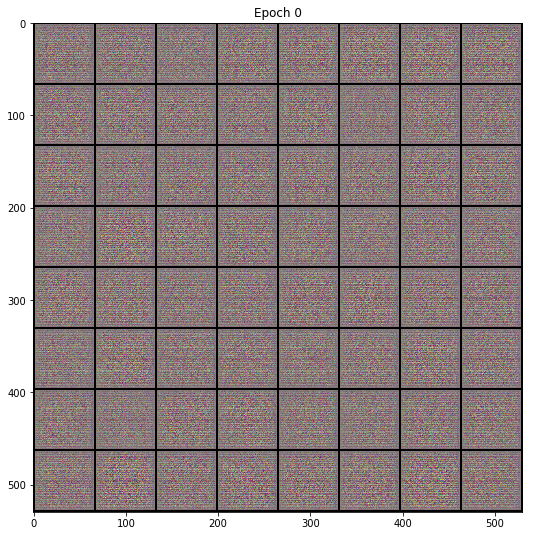

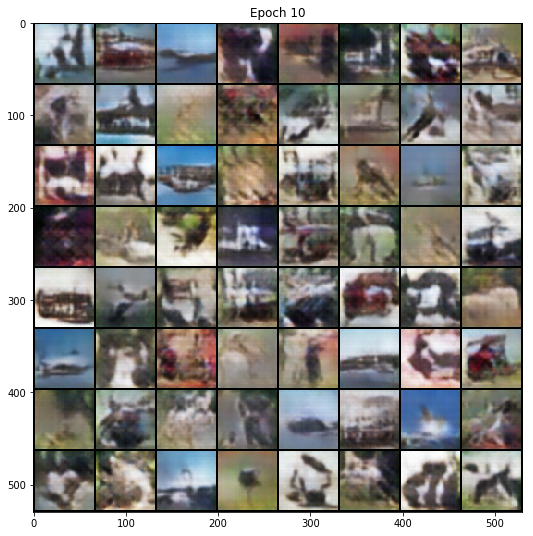

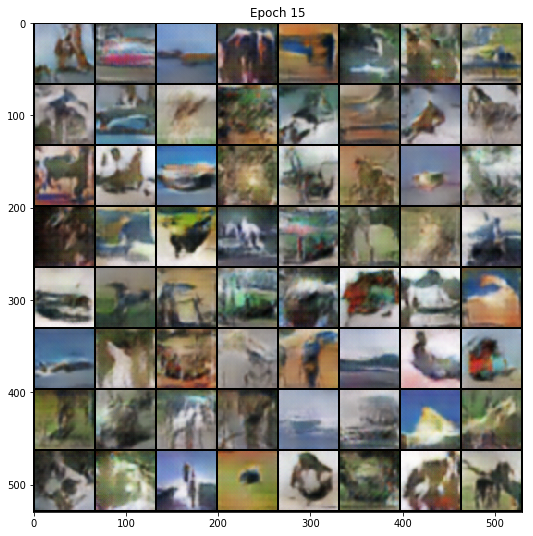

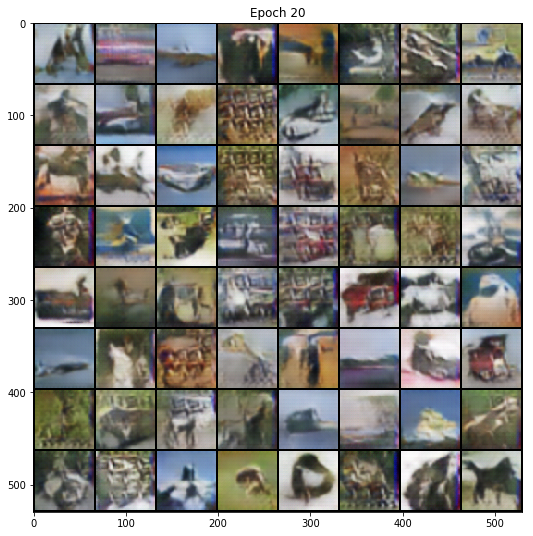

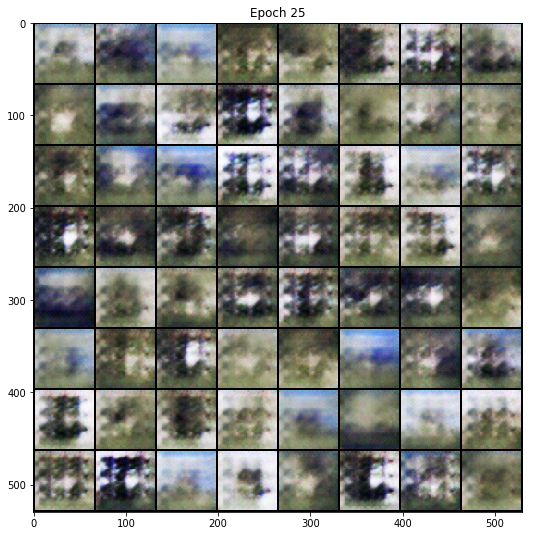

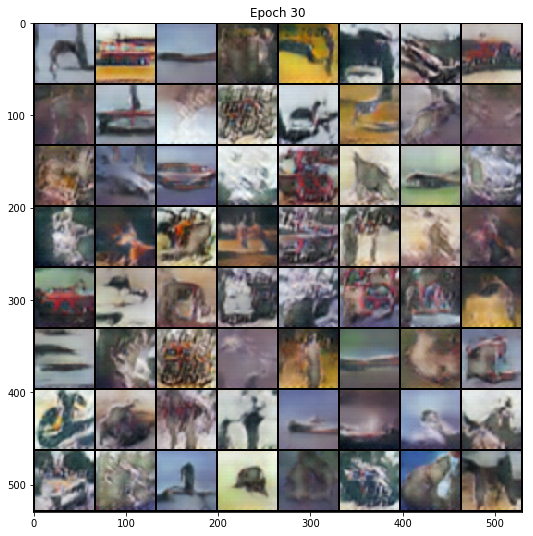

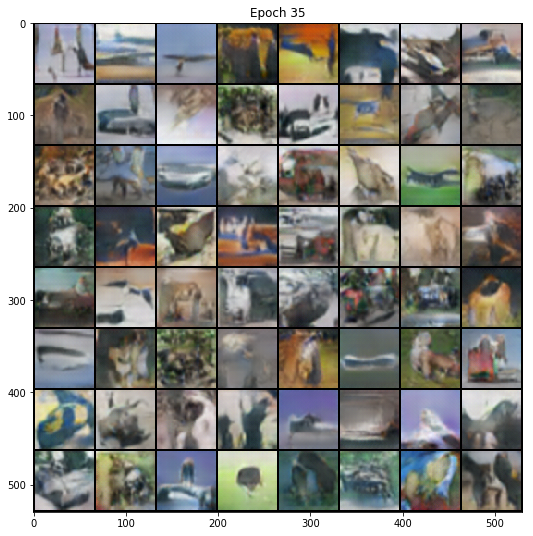

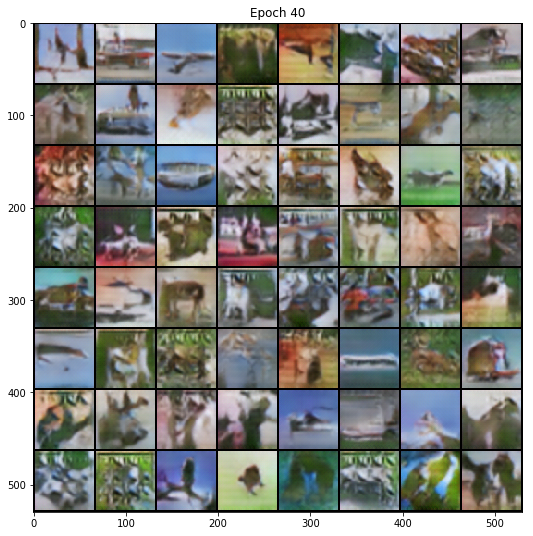

In [ ]:
show_samples()